In [3]:
from algorithms import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold
from itertools import product
from seaborn import heatmap
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, ConfusionMatrixDisplay, confusion_matrix

In [8]:
pm_data = pd.read_csv("./data/ai4i2020.csv").drop(columns=["TWF", "HDF", "OSF", "RNF", "PWF"])
pm_data.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure
0,1,M14860,M,298.1,308.6,1551,42.8,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0


In [9]:
pm_data.describe()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900
std,2886.89568,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981
min,1.00000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000
25%,2500.75000,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000
50%,5000.50000,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000
75%,7500.25000,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000
max,10000.00000,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000


In [10]:
pm_data.Type.value_counts(dropna=False)

L    6000
M    2997
H    1003
Name: Type, dtype: int64

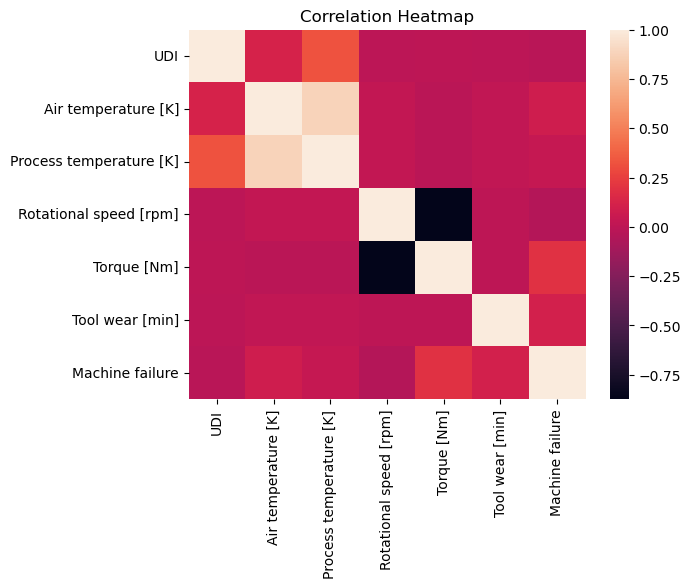

In [11]:
heatmap(pm_data.corr())
plt.title("Correlation Heatmap")
plt.show()

In [12]:
pm_data = pd.concat([pm_data, pd.get_dummies(pm_data["Type"])], axis=1)
pm_data["intercept"] = 1
feature_names = list(pm_data.drop(columns=["UDI", "Product ID", "Type", "Machine failure"]))
features = pm_data.drop(columns=["UDI", "Product ID", "Type", "Machine failure"]).values
features = MinMaxScaler().fit_transform(features)
target = pm_data["Machine failure"].copy()

(
    X, 
    X_test, 
    y, 
    y_test
)=train_test_split(features, target.values, test_size=0.25, random_state=3136, stratify=target.values)


# Oversample to balance the data
n0 = y.shape[0] - y.sum()
idx1 = np.array(range(y.shape[0]))[(y==1).flatten()]
new_idx = np.random.choice(idx1, size=n0, replace=True)

X = np.concatenate([X[(y == 0).flatten()], X[new_idx]])
y = np.concatenate([y[(y == 0).flatten()], y[new_idx]])

# Logistic Regression

## Determine Optimization Parameters for Momentum SGD

In [13]:
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

opt_candidates={
    "lr":  [0.1, 1, 5, 10],
    "batch_size": [16, 64, 256, 512, 1024],
    "momentum": [0, 0.5, 0.9],
    "max_epoch": [40],
}

mu = 0

results = {}
for params in product(*opt_candidates.values()):
    lr, batch_size, momentum, max_epoch = params
    param_key = "_".join(str(x) for x in params)
    
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        w = MomentumStochasticGradient(
            X=X_train,
            y=y_train,
            mu=mu,
            lr=lr,
            moment=momentum,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
        
        preds = sigmoid(X_val@w)
        loss = neg_log_lik(preds, y_val, w, mu)
        cv_results.append(loss)
        
    results[param_key] = np.mean(cv_results)
    

best_params = min(results, key=lambda key: results[key])
print(f"BEST: {best_params}")
results

Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7965060817135728
Length gradient: 686.8683528645203
Loss: 5617.517817111938
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7856572013819766
Length gradient: 1435.3512954387522
Loss: 5328.875766632376
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8118648772782096
Length gradient: 485.4762607569178
Loss: 4924.7440589188445
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8245495486647207
Length gradient: 197.6598847067636
Loss: 4843.342768401247
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8226521940324432
Length gradient: 178.90690377827113
Loss: 4805.668685633295
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8241184399298416
Length gradient: 149.89360003016105
Loss: 4780.773150407609
==================== EPOCH: 6 ====================
Train Balanced A

Train Balanced Acc: 0.8238608014925975
Length gradient: 219.02147048851853
Loss: 4656.280189447646
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8254987021796691
Length gradient: 82.48329748654018
Loss: 4646.527954418001
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8217898872754084
Length gradient: 166.14107334188387
Loss: 4648.479886224772
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8247214415537987
Length gradient: 59.932380004050835
Loss: 4641.038665858132
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.829810280608482
Length gradient: 187.15536431209946
Loss: 4643.773825923481
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8275681729192166
Length gradient: 75.33627392281763
Loss: 4637.622579609295
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8283458799814711
Length gradient: 147.70171662374997
Loss: 4637.68644956377

Train Balanced Acc: 0.8238744178023115
Length gradient: 40.6489285491707
Loss: 4639.256549845568
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8240469208211143
Length gradient: 66.08019540902471
Loss: 4638.770819330954
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8248231844057271
Length gradient: 60.74179793136756
Loss: 4637.427090449597
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8235294117647058
Length gradient: 34.82988168441312
Loss: 4636.112881535157
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8238744178023116
Length gradient: 226.9140475455029
Loss: 4643.430808292073
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8234431602553045
Length gradient: 25.723365138451474
Loss: 4634.11932608698
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8230981542176988
Length gradient: 21.28742947408512
Loss: 4633.224009284485
===

Train Balanced Acc: 0.8202518544074522
Length gradient: 173.18697728227536
Loss: 4705.676603435008
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 329.12802856146254
Loss: 4707.1375398053115
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 289.0892585469199
Loss: 4695.872175154676
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8231844057271003
Length gradient: 292.3387730169149
Loss: 4690.402167664286
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8205968604450578
Length gradient: 81.34769508609472
Loss: 4674.014495773305
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8186993272382267
Length gradient: 157.2346318006732
Loss: 4671.420814362589
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 66.32036049033609
Loss: 4663.742308031519


Train Balanced Acc: 0.8264478705758302
Length gradient: 184.36779465157497
Loss: 4613.829797983386
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8254126738884597
Length gradient: 155.86937186956877
Loss: 4612.333228310696
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8260170445839945
Length gradient: 256.1377485096626
Loss: 4619.270413732686
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8255849685702834
Length gradient: 124.05585187845188
Loss: 4609.879447383497
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8196325876179024
Length gradient: 32.887189517073416
Loss: 4607.057931955436
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8192875220554455
Length gradient: 42.347618254421285
Loss: 4607.073224046073
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8158365688066208
Length gradient: 136.72635842274562
Loss: 4610.116619197

Train Balanced Acc: 0.8180093151630153
Length gradient: 244.5630484780366
Loss: 4661.749517206879
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8231844057271003
Length gradient: 468.4831845691261
Loss: 4686.157791694078
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 28.2274845475279
Loss: 4605.203982550167
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8238744178023116
Length gradient: 734.7343344430071
Loss: 4706.991822042864
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8244781783681214
Length gradient: 124.29847561637919
Loss: 4607.306928331736
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8197343453510437
Length gradient: 123.99967688765382
Loss: 4597.913693500799
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8255131964809383
Length gradient: 282.6856063326896
Loss: 4605.901075864038
=======

Train Balanced Acc: 0.8193893393134379
Length gradient: 24.360367865109204
Loss: 4599.6598993364605
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8265482145937554
Length gradient: 365.96901722724874
Loss: 4623.045718836004
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8175780576160083
Length gradient: 114.62893495141573
Loss: 4601.387227750842
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8158530274279799
Length gradient: 257.5582560136876
Loss: 4610.777482028416
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.827928238744178
Length gradient: 396.89929472212214
Loss: 4626.842523786799
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 69.31756062123407
Loss: 4599.27056530953
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8186130757288252
Length gradient: 51.20961911318097
Loss: 4599.532771440653

Train Balanced Acc: 0.8212006210108678
Length gradient: 148.25338610490434
Loss: 4570.92758752196
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.821459375539072
Length gradient: 56.22803642166723
Loss: 4567.380411714812
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8240469208211143
Length gradient: 163.64697749563032
Loss: 4571.415377322996
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8221493876142832
Length gradient: 15.978166630259139
Loss: 4566.391651629088
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8216318785578748
Length gradient: 6.428077806909658
Loss: 4566.287239106926
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8201656028980507
Length gradient: 42.89974114490053
Loss: 4567.750670012942
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8250819389339313
Length gradient: 100.86836509258302
Loss: 4567.927588388853


Train Balanced Acc: 0.8198046590815339
Length gradient: 62.88234470972978
Loss: 4568.073777868029
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.824547941493738
Length gradient: 186.5717539323915
Loss: 4570.95531635849
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.824721411791373
Length gradient: 62.71302133951706
Loss: 4564.1835861393865
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8215330077800171
Length gradient: 558.4738578743933
Loss: 4630.518093661001
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8262754568443043
Length gradient: 199.5877192917384
Loss: 4569.025979253534
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8192903941295163
Length gradient: 550.9409671243716
Loss: 4621.162374346028
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.821017805311593
Length gradient: 823.8068071847224
Loss: 4697.313790114083
======

Train Balanced Acc: 0.8217181300672762
Length gradient: 303.12000401867044
Loss: 4592.379887345291
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.816888045540797
Length gradient: 209.05446573622856
Loss: 4589.904621826914
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8199068483698464
Length gradient: 169.24995327841398
Loss: 4579.000825681049
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8240469208211143
Length gradient: 463.7962180079601
Loss: 4617.064220264967
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8205968604450578
Length gradient: 88.7232381708767
Loss: 4573.293194287443
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.827065723650164
Length gradient: 342.5509411106372
Loss: 4604.490257517458
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 174.050735156874
Loss: 4581.390124490723
===

Train Balanced Acc: 0.8105054338450923
Length gradient: 915.7459930236346
Loss: 4878.9742800353615
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 646.107434203033
Loss: 4678.607412429684
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8079178885630498
Length gradient: 1139.008715027746
Loss: 4921.821153868391
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.818354321200621
Length gradient: 473.28122492090154
Loss: 4648.791819339172
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.813351733655339
Length gradient: 832.8985444365449
Loss: 4725.123095231977
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8236156632741074
Length gradient: 135.50058547118368
Loss: 4579.669330297698
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8261169570467484
Length gradient: 686.0816572631212
Loss: 4660.49326439821
========

Train Balanced Acc: 0.8262750996951971
Length gradient: 171.2291329027575
Loss: 4664.054841386706
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8208403170865014
Length gradient: 30.46982939310822
Loss: 4658.276618768194
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.819891386789745
Length gradient: 20.15409206166165
Loss: 4657.186269742894
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8195463212272882
Length gradient: 17.762131543520574
Loss: 4656.250392401978
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8179069621813619
Length gradient: 66.08763419297479
Loss: 4656.0977543655445
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8187699237117603
Length gradient: 30.34328121723548
Loss: 4654.612364322852
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8221343129457146
Length gradient: 63.96758585313843
Loss: 4654.364031670184
=

Train Balanced Acc: 0.8255131964809383
Length gradient: 121.55373160779108
Loss: 4653.473847826959
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8267207176125582
Length gradient: 59.734548664399064
Loss: 4649.541098015179
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8245644298775229
Length gradient: 252.59551364361772
Loss: 4656.326650114388
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8253406934621356
Length gradient: 73.32244082170118
Loss: 4644.659314324816
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8270657236501638
Length gradient: 154.65994227996322
Loss: 4645.74373530577
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8202518544074522
Length gradient: 215.18976518021094
Loss: 4647.984644701921
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 254.7027936481812
Loss: 4649.49596846324

Train Balanced Acc: 0.8200793513886493
Length gradient: 115.41387857719691
Loss: 4641.127999905978
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7327065723650164
Length gradient: 2199.149407830704
Loss: 6091.516317134619
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7585820251854407
Length gradient: 2153.0481101902633
Loss: 5586.35257228443
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.823960669311713
Length gradient: 546.1784925744599
Loss: 4834.603620842742
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8213731240296706
Length gradient: 169.11155857438294
Loss: 4763.127581582548
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8247369328963257
Length gradient: 326.5980773334629
Loss: 4732.779851847831
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8212006210108677
Length gradient: 47.46987832350

Train Balanced Acc: 0.8192009580405752
Length gradient: 66.96230655976359
Loss: 4608.24048785538
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8177338192704087
Length gradient: 195.35067599205343
Loss: 4614.509041038416
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8192875220554455
Length gradient: 32.00951156430237
Loss: 4606.782076258287
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.826706669747673
Length gradient: 201.6357911186104
Loss: 4613.951383461146
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8266204033570588
Length gradient: 192.8182243025429
Loss: 4613.624056716402
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8253270920336344
Length gradient: 263.90764123808526
Loss: 4619.05463484726
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8269652308201108
Length gradient: 168.3716838469321
Loss: 4611.225893576757
===

Train Balanced Acc: 0.6958771778506123
Length gradient: 3743.460315935968
Loss: 7038.077043653917
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 103.01908021551716
Loss: 4641.161702105342
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 835.1969356768559
Loss: 4766.9067998755745
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8144730032775573
Length gradient: 194.1425948673485
Loss: 4605.812397211906
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8238744178023115
Length gradient: 905.6787423382643
Loss: 4750.506566268053
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8265482145937554
Length gradient: 121.87214323444596
Loss: 4603.132813881481
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 88.02566428970114
Loss: 4593.803131977747
=====

Train Balanced Acc: 0.8199068483698464
Length gradient: 88.74778746771378
Loss: 4596.604002922715
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8179230636536139
Length gradient: 36.85238502593326
Loss: 4595.398604299284
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8172330515784026
Length gradient: 17.17068852929476
Loss: 4594.887710743051
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.819993099879248
Length gradient: 62.37361252388728
Loss: 4595.793588493563
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8230981542176988
Length gradient: 238.59593988302544
Loss: 4605.099565876235
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7227013972744523
Length gradient: 2946.7720096640646
Loss: 6393.148783064651
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.725978954631706
Length gradient: 3314.386548

Train Balanced Acc: 0.8121257598198444
Length gradient: 456.5978097542107
Loss: 4643.756822957366
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8216167146020293
Length gradient: 67.9233510067874
Loss: 4606.088298862175
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8235151555628414
Length gradient: 162.7941724223185
Loss: 4610.432961523181
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8158356015277887
Length gradient: 321.41116025316984
Loss: 4621.944901728337
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8135933301451823
Length gradient: 275.06602734133344
Loss: 4619.88453122548
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8201495758318629
Length gradient: 114.91016077279905
Loss: 4605.365072148921
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8156597651173181
Length gradient: 770.5345456712469
Loss: 4728.658961874972
=

Train Balanced Acc: 0.8184405727100224
Length gradient: 854.3925020418861
Loss: 4733.590424845932
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8288770053475936
Length gradient: 750.5673536249925
Loss: 4691.9770931275325
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 313.2483533657559
Loss: 4613.514011492249
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 405.9167177038753
Loss: 4633.114258667911
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8285319993099879
Length gradient: 772.0225379824259
Loss: 4697.140921983702
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8213731240296704
Length gradient: 27.20816578106421
Loss: 4575.235837215221
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8262032085561497
Length gradient: 504.6250207555389
Loss: 4626.170511072078
=

Train Balanced Acc: 0.821890633086079
Length gradient: 144.40498304062803
Loss: 4598.308987939545
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8127479730895291
Length gradient: 336.90743370892926
Loss: 4614.7880659338225
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 112.94547618422297
Loss: 4598.995716876207
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 37.45246050022706
Loss: 4594.2404424912465
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8187855787476281
Length gradient: 320.43593490989156
Loss: 4613.444553745
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.821890633086079
Length gradient: 229.87476204525225
Loss: 4607.32080259989
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8174918061066069
Length gradient: 708.1471708151837
Loss: 4690.825186006556
S

Train Balanced Acc: 0.8196323643997103
Length gradient: 64.20744737686137
Loss: 4623.955333745163
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8206680968107418
Length gradient: 44.72180193155228
Loss: 4622.778385166164
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8202364672334146
Length gradient: 22.62836257810193
Loss: 4621.228782080534
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.818683434102954
Length gradient: 80.39726711323512
Loss: 4621.312841901034
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8207543632013561
Length gradient: 45.876239882903896
Loss: 4619.639535283813
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8186839698266148
Length gradient: 14.011892398650572
Loss: 4618.470483498453
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8217879527177441
Length gradient: 182.57144735231378
Loss: 4624.608987997823


Train Balanced Acc: 0.8222356391236847
Length gradient: 81.72571139030826
Loss: 4599.362367619659
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 45.16753301858294
Loss: 4597.264284537638
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8270657236501638
Length gradient: 259.2787965480673
Loss: 4608.341006790381
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8221493876142832
Length gradient: 63.742705386288485
Loss: 4594.435811949308
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8226668966706917
Length gradient: 136.74563548198867
Loss: 4596.281881064001
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 223.79301450298746
Loss: 4602.00259316234
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8224081421424875
Length gradient: 242.85068288883494
Loss: 4602.877042758822

==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8260307055373469
Length gradient: 360.7084696547238
Loss: 4639.729794063757
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 414.39814204299955
Loss: 4641.666489153424
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8276694842159737
Length gradient: 269.10915477439397
Loss: 4617.6564846537785
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8263757115749526
Length gradient: 46.93498824153159
Loss: 4601.1320227718625
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8243056753493185
Length gradient: 131.18381231354167
Loss: 4600.087250024571
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8212868725202691
Length gradient: 117.54203815302283
Loss: 4596.511051034023
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.828531999309988
Length

Train Balanced Acc: 0.8279124497773949
Length gradient: 224.99063829008904
Loss: 4859.425155020837
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.828088315950291
Length gradient: 426.02158683661787
Loss: 4829.682559240047
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8269632218563825
Length gradient: 201.03703069157626
Loss: 4766.67318466281
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8293809576191393
Length gradient: 212.86466900742192
Loss: 4759.043102331938
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8228256494488653
Length gradient: 366.0858883139136
Loss: 4761.308810746612
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8280010078747806
Length gradient: 254.41144628014902
Loss: 4733.829914706226
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8208411950780568
Length gradient: 312.491013121684
Loss: 4725.056889623835
======

Train Balanced Acc: 0.8177505606348111
Length gradient: 328.72908748862807
Loss: 4872.991154827527
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 589.5808908704707
Loss: 4892.967253261215
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8287045023287908
Length gradient: 472.5054712195146
Loss: 4832.771553271845
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8180093151630153
Length gradient: 642.9485118772259
Loss: 4862.272882092519
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8284457478005866
Length gradient: 371.9708497865808
Loss: 4781.096509716599
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8177505606348111
Length gradient: 53.220150158152144
Loss: 4738.714111288395
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8141279972399518
Length gradient: 60.18506230075682
Loss: 4729.02486426125
=======

Train Balanced Acc: 0.8202518544074522
Length gradient: 86.94789860149544
Loss: 4642.322859404058
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8232706572365016
Length gradient: 179.19734351969817
Loss: 4643.839110522393
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 414.5230282251234
Loss: 4673.54709681446
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8218043815766776
Length gradient: 96.83112177921795
Loss: 4634.999390116704
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 98.85971943043802
Loss: 4632.788614203588
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8226668966706918
Length gradient: 28.26758778230047
Loss: 4628.909724617031
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8192168362946353
Length gradient: 52.073611125328284
Loss: 4628.102779771034
==

Train Balanced Acc: 0.8217914349215397
Length gradient: 472.5068242428219
Loss: 5757.7662359821015
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8157542161749736
Length gradient: 735.902048601325
Loss: 5750.412679728071
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.819200526485404
Length gradient: 117.32112328525172
Loss: 5492.709804667282
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.822910383074561
Length gradient: 126.39630552840916
Loss: 5403.935855837796
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8219625242251263
Length gradient: 266.3139581644965
Loss: 5350.2747906267305
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8188570234502913
Length gradient: 288.00196985314085
Loss: 5273.933094347206
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8159274781356293
Length gradient: 873.5220246196284
Loss: 5447.858090839931


Train Balanced Acc: 0.81585302742798
Length gradient: 535.1753025718615
Loss: 4827.975143439829
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8201656028980506
Length gradient: 223.2729092005089
Loss: 4721.310359491357
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 508.92046198678645
Loss: 4752.045403250626
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8224943936518889
Length gradient: 152.510272830575
Loss: 4675.390717244676
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8104191823356908
Length gradient: 1465.130830787458
Loss: 5152.795757829548
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 983.9856621918398
Loss: 4850.071734372806
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8110229429015008
Length gradient: 650.8073858892548
Loss: 4721.573076233568
====

Train Balanced Acc: 0.8282566373482965
Length gradient: 159.83854288409154
Loss: 4782.370234816525
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8198072930561999
Length gradient: 392.616377877326
Loss: 4799.229987302824
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8268763750984689
Length gradient: 212.761040984125
Loss: 4764.937676806853
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8244628804813607
Length gradient: 37.436532978126834
Loss: 4746.315464384772
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8208382188354963
Length gradient: 296.6988281354422
Loss: 4759.204272458739
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8261895773652229
Length gradient: 278.46678854849574
Loss: 4751.14073654203
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8241174280073711
Length gradient: 58.729384672898675
Loss: 4728.765674955543
=

Train Balanced Acc: 0.825928843635716
Length gradient: 54.18906636101996
Loss: 4660.5957890022655
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8248072466268159
Length gradient: 87.75343260995673
Loss: 4659.364718146338
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.827050901962213
Length gradient: 42.25086810062148
Loss: 4656.03120557027
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8297255469827864
Length gradient: 98.09736311757693
Loss: 4655.962493416156
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8254969461965584
Length gradient: 157.35350727050886
Loss: 4657.57580070296
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.828776393467838
Length gradient: 75.40397965254586
Loss: 4651.570561851668
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8262746830212386
Length gradient: 77.88446163622338
Loss: 4650.068804113216
=====

Train Balanced Acc: 0.8215456270484733
Length gradient: 143.84839932777487
Loss: 4699.151816126243
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8242194238399172
Length gradient: 80.8688880628526
Loss: 4694.052101180843
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 64.49743206677343
Loss: 4691.661850613298
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8187855787476281
Length gradient: 165.28169446473458
Loss: 4695.0295760188865
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 89.1496057115688
Loss: 4688.86753520095
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8200793513886493
Length gradient: 77.89858034400125
Loss: 4686.879670793083
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 44.674546909587676
Loss: 4684.357405168525
=

Train Balanced Acc: 0.8214445389699081
Length gradient: 57.66974474846119
Loss: 4993.086935913894
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8186837019647843
Length gradient: 83.67376038007183
Loss: 4988.1713194208405
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8223072028760503
Length gradient: 80.4215044863572
Loss: 4982.453645687005
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8196329447670097
Length gradient: 29.153550878521063
Loss: 4975.586701854059
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8199780103294665
Length gradient: 29.78873775918603
Loss: 4970.528560170794
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8196329447670097
Length gradient: 31.24393146732908
Loss: 4965.767600423889
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.824118797078949
Length gradient: 118.71876199896502
Loss: 4964.510801991515
=

==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 675.2061696214209
Loss: 5622.905618421159
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.822925651198896
Length gradient: 208.62640599080427
Loss: 5387.429800866202
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8226668966706918
Length gradient: 291.54336432862107
Loss: 5338.831565047807
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8268932206313611
Length gradient: 527.8870404676411
Loss: 5335.539012612521
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8213731240296704
Length gradient: 478.3804648227846
Loss: 5278.364188811698
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8236156632741073
Length gradient: 325.19145384421506
Loss: 5205.620174633015
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8257719510091427
Length gradien

Train Balanced Acc: 0.8271519751595653
Length gradient: 437.3551609885651
Loss: 5020.131874144283
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.819993099879248
Length gradient: 40.49982909628095
Loss: 4961.802141196013
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8145592547869588
Length gradient: 368.8602168577292
Loss: 4990.268057133615
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 139.56858012761873
Loss: 4951.239170899176
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8213731240296706
Length gradient: 139.00666625485334
Loss: 4944.196095218027
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 60.09262041591374
Loss: 4934.968656181424
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 47.95869634472244
Loss: 4927.277626344075
==

Train Balanced Acc: 0.820424357426255
Length gradient: 34.300773427823174
Loss: 4880.315825448904
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8246506813869243
Length gradient: 216.3774818456286
Loss: 4887.952696750634
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8170605485595999
Length gradient: 89.32249767901581
Loss: 4873.976691712416
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8212868725202691
Length gradient: 113.13191165154582
Loss: 4871.494844055662
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8185268242194239
Length gradient: 55.233008239622855
Loss: 4865.876675572915
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 42.30589272800049
Loss: 4861.557379931884
Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6766188944020806
Length gradient: 1707.4328

Train Balanced Acc: 0.8202351130430496
Length gradient: 237.1717220914781
Loss: 8800.139134494751
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.811347070597545
Length gradient: 809.8618155319365
Loss: 8907.908772311464
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8204936443530619
Length gradient: 269.5289217049426
Loss: 8385.938064205806
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8112630512700639
Length gradient: 299.55963809956666
Loss: 8211.920559941125
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8115205706576055
Length gradient: 556.2913994544799
Loss: 8166.305042190517
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8097071163031068
Length gradient: 985.5893591710434
Loss: 8373.225775897281
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8199772216251879
Length gradient: 46.4593227227958
Loss: 7725.224680628842
===

Train Balanced Acc: 0.8124892185613248
Length gradient: 384.1834730946113
Loss: 8252.045082538429
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8125754700707263
Length gradient: 231.23828007088625
Loss: 8119.015275960572
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8125754700707262
Length gradient: 49.79598285967213
Loss: 8011.242835395013
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8146455062963602
Length gradient: 238.10587781632353
Loss: 7963.461653542427
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8128342245989305
Length gradient: 55.958155872513196
Loss: 7862.667748648881
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8111954459203037
Length gradient: 141.01792240520126
Loss: 7802.750581724225
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8115404519579092
Length gradient: 275.63639032561264
Loss: 7762.2952882293

Train Balanced Acc: 0.8065378644126272
Length gradient: 546.4826235697013
Loss: 9848.655448009882
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8091254096946696
Length gradient: 520.5060002640081
Loss: 9690.348840602846
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 132.79162647576393
Loss: 9417.383699830587
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 97.31752997659076
Loss: 9308.023501496595
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 149.47495268093428
Loss: 9224.943669698685
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8153355183715716
Length gradient: 88.07783269078972
Loss: 9112.5871906649
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 90.91267247621936
Loss: 9021.030313563584
===

Train Balanced Acc: 0.8240314890034386
Length gradient: 46.75253297990405
Loss: 4895.2953440917445
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8298124383843384
Length gradient: 160.2346896013965
Loss: 4893.58370758302
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8293807195197345
Length gradient: 115.16067334065804
Loss: 4883.56474481851
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8231689739094243
Length gradient: 44.257834060419924
Loss: 4874.320556298751
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8223916686399155
Length gradient: 151.36879862520317
Loss: 4873.70420742838
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8258427707008682
Length gradient: 69.2649437361796
Loss: 4863.736154365396
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8258427707008682
Length gradient: 57.60108668436973
Loss: 4858.105871945246
==

Train Balanced Acc: 0.8263757115749526
Length gradient: 53.210256416974396
Loss: 4886.756704618376
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5435570122477142
Length gradient: 3207.8833212682803
Loss: 40914.57286553616
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6580990167327928
Length gradient: 3140.938621978717
Loss: 35080.54544296874
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7390029325513197
Length gradient: 754.3994405726502
Loss: 23501.4734955858
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6355011212696222
Length gradient: 3915.642012139155
Loss: 25000.5016578913
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7740210453682939
Length gradient: 779.9638771481137
Loss: 11322.23257919012
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7468518199068483
Length gradient: 2312.7621270816

Train Balanced Acc: 0.8161117819561843
Length gradient: 342.4210750925596
Loss: 5022.666953475353
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8230981542176987
Length gradient: 54.73947065942869
Loss: 4981.972753398777
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8177505606348111
Length gradient: 131.82240402578384
Loss: 4975.105147309886
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8263757115749526
Length gradient: 338.6724684759962
Loss: 4991.947263029075
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8228393996894945
Length gradient: 61.97566139562051
Loss: 4954.157053408606
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 41.10762435825249
Loss: 4945.8199790749795
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8219768845954805
Length gradient: 40.863457621539645
Loss: 4938.742042937618

==================== EPOCH: 17 ====================
Train Balanced Acc: 0.824721411791373
Length gradient: 50.163185392508254
Loss: 5669.167901792977
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8226509737729935
Length gradient: 47.3860536135339
Loss: 5650.678292269769
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8240310872106928
Length gradient: 51.162111369857435
Loss: 5632.981254998227
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8248061900607071
Length gradient: 320.18600150193373
Loss: 5650.13673811031
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8223059677353878
Length gradient: 60.061774352768715
Loss: 5602.328562082383
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8233417150276321
Length gradient: 131.307624472601
Loss: 5591.63224909483
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8225650347690608
Length gra

Train Balanced Acc: 0.8157667759185786
Length gradient: 241.14202750214756
Loss: 5831.7685848919355
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8179230636536139
Length gradient: 187.8541691449664
Loss: 5807.369464678539
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8205968604450578
Length gradient: 69.61747262963868
Loss: 5781.091065467047
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8173193030878041
Length gradient: 133.68369232420247
Loss: 5771.7560511061565
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8181818181818181
Length gradient: 48.297564398553845
Loss: 5752.092543757945
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 142.12163677046433
Loss: 5745.743521888704
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8159392789373814
Length gradient: 236.58165779276155
Loss: 5745.35367680

Train Balanced Acc: 0.8123015515866765
Length gradient: 105.74601723737399
Loss: 18574.564128746573
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8123875649966732
Length gradient: 66.1265116356053
Loss: 18450.571964364026
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.814111657668295
Length gradient: 152.25961104935797
Loss: 18358.83698689018
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8109226137647885
Length gradient: 319.0592423415232
Loss: 18375.47597354683
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8145426324722587
Length gradient: 197.84967891956683
Loss: 18177.564217905958
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8121290188054482
Length gradient: 118.0582316372407
Loss: 18064.72633379624
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8143719449614177
Length gradient: 174.71309959233236
Loss: 17994.936928880

Train Balanced Acc: 0.8154217698809729
Length gradient: 82.1257768905768
Loss: 20303.70137332842
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8163705364843885
Length gradient: 87.08250150096168
Loss: 20181.887864383927
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.813782991202346
Length gradient: 55.67383418997653
Loss: 20066.63526708284
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 56.21500366714091
Loss: 19960.094562385457
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.81524926686217
Length gradient: 103.03636003431869
Loss: 19874.842511739876
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8155942728997757
Length gradient: 102.85063591882633
Loss: 19764.44881270359
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8130067276177333
Length gradient: 238.63460716270242
Loss: 19747.114761883284


Loss: 15404.008617288675
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8075728825254442
Length gradient: 365.8523881867243
Loss: 15453.025544208078
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8093841642228738
Length gradient: 345.8976897289749
Loss: 15368.8571366611
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5457132999827496
Length gradient: 5853.252711805607
Loss: 156598.15860272598
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7207176125582198
Length gradient: 2924.9919547736827
Loss: 82033.69953390656
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7278764878385372
Length gradient: 3432.839723264567
Loss: 57360.09067423699
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7951526651716405
Length gradient: 1917.5182182529918
Loss: 31626.875430216096
==================== EPOCH: 4 ==========

Loss: 4649.9432824882915
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8225695884201782
Length gradient: 755.3757063885682
Loss: 4742.9093622049395
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8228226880875177
Length gradient: 248.7317255801444
Loss: 4636.280856029713
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8082445609464832
Length gradient: 473.3180215615552
Loss: 4666.067645579817
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8135927795403086
Length gradient: 389.8205966379463
Loss: 4646.095901486344
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8171313236076869
Length gradient: 177.25098803333367
Loss: 4643.265051164925
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8262763645982851
Length gradient: 374.12225647488816
Loss: 4638.515578221082
==================== EPOCH: 20 ====================
Train Balanced Acc: 

Train Balanced Acc: 0.8244590708908834
Length gradient: 665.6755250079264
Loss: 4646.932501318181
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8254948181831276
Length gradient: 604.0430265023952
Loss: 4628.53722496051
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8222202965932857
Length gradient: 77.67094317789767
Loss: 4564.309694121553
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.826618200937564
Length gradient: 187.61261136310623
Loss: 4562.01379082104
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8296359472005046
Length gradient: 509.31854754480844
Loss: 4605.338768019406
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8296367805484215
Length gradient: 333.9083117306319
Loss: 4575.427528238932
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8292060587250754
Length gradient: 256.9753912166879
Loss: 4572.463097304091
Sta

Train Balanced Acc: 0.8212006210108678
Length gradient: 76.48644170233624
Loss: 4605.355953814224
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8246506813869243
Length gradient: 819.7310832287691
Loss: 4736.802508104461
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8135242366741418
Length gradient: 563.4696458755618
Loss: 4666.015380196478
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8143005002587544
Length gradient: 294.2751135807286
Loss: 4621.285346611767
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.821459375539072
Length gradient: 872.7607678563403
Loss: 4754.321902138815
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8178368121442126
Length gradient: 308.60847331237346
Loss: 4623.665402561272
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 207.25439789699348
Loss: 4613.811209387263
=

Loss: 4585.8223600249075
Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7770183894884828
Length gradient: 1190.2388916656678
Loss: 8209.945898105803
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.657666836550592
Length gradient: 5137.247061527393
Loss: 18952.723066026003
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7837373463559422
Length gradient: 2061.8422339675153
Loss: 6911.030662995781
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8140312395943119
Length gradient: 1014.7846763631596
Loss: 5334.568204727279
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8013487111024443
Length gradient: 863.2578494461329
Loss: 5403.197060226739
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8106556150446919
Length gradient: 1129.5942059069514
Loss: 5110.640305302536
==================== EPOCH: 6 ============

Train Balanced Acc: 0.8201449031310428
Length gradient: 883.7230430932462
Loss: 4761.415033893237
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8128252363463979
Length gradient: 1131.4825741581983
Loss: 4823.134620588022
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.819724092195423
Length gradient: 899.0072624308171
Loss: 4750.386417943783
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.816531327988716
Length gradient: 706.5916720653014
Loss: 4665.236782921249
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8240278579875148
Length gradient: 680.2475417438146
Loss: 4645.268444435126
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8190267288010873
Length gradient: 253.90243202818445
Loss: 4594.151457888024
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.825495398550427
Length gradient: 460.12322890869524
Loss: 4629.995688373748
==

Train Balanced Acc: 0.8202518544074522
Length gradient: 79.16942694477969
Loss: 4916.337620442529
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8307745385544247
Length gradient: 161.68310505045602
Loss: 4814.279835644967
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8036915646023806
Length gradient: 1592.1699293378813
Loss: 5309.207581698612
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8079178885630498
Length gradient: 609.6071667951985
Loss: 4739.876939048258
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 245.84900008622603
Loss: 4658.651400652582
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8124029670519235
Length gradient: 202.5449983183476
Loss: 4636.497056330627
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 190.17361995562706
Loss: 4658.419941774699
====

Train Balanced Acc: 0.80731412799724
Length gradient: 1423.9114041416794
Loss: 4989.8664907408165
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.825426944971537
Length gradient: 360.6362077747998
Loss: 4600.797488338032
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8203381059168535
Length gradient: 585.4911134923155
Loss: 4641.283734961651
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8275832327065724
Length gradient: 72.1482529683835
Loss: 4570.634580059338
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8014490253579437
Length gradient: 1227.806396885415
Loss: 4882.6996573132965
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 261.6844411679059
Loss: 4591.378926319394
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8202518544074522
Length gradient: 33.95192105593988
Loss: 4565.00732557684
====

Train Balanced Acc: 0.8076343121718916
Length gradient: 1488.0229701208982
Loss: 5392.7729152140855
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7565924516774282
Length gradient: 2474.603241510868
Loss: 6599.165289754278
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8038567758269103
Length gradient: 1563.873400297052
Loss: 5296.398474585343
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8141974627413122
Length gradient: 452.4342072034746
Loss: 4844.853888254258
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.800574516006411
Length gradient: 1139.5932415524883
Loss: 5158.683582063581
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7727221535900688
Length gradient: 2525.7015736019794
Loss: 6402.220222475165
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8181690798636596
Length gradient: 617.6136072063816
Loss: 4699.623903740927

Loss: 4953.6917230863055
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8036915646023806
Length gradient: 590.1444288458022
Loss: 4929.767195773133
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8082628946006556
Length gradient: 1365.9641010152175
Loss: 5014.832475575482
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8145592547869587
Length gradient: 662.0127219570717
Loss: 4770.468220500585
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8219768845954805
Length gradient: 630.3753321756647
Loss: 4717.931340255984
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.7917888563049853
Length gradient: 1585.788855160875
Loss: 5076.4638625681255
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7973952044160773
Length gradient: 635.6365126005759
Loss: 21264.682540882906
==================== EPOCH: 1 ========

Train Balanced Acc: 0.7960151802656547
Length gradient: 1717.70911498626
Loss: 5278.574355118604
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7884250474383301
Length gradient: 1760.1906217283013
Loss: 5658.421859909891
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7990339830947042
Length gradient: 1174.0538082068515
Loss: 5182.576844199617
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8161980334655856
Length gradient: 287.9818315465842
Loss: 4736.559517501047
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.825426944971537
Length gradient: 477.7823564008481
Loss: 4823.508266618728
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.805847852337416
Length gradient: 917.7712363161451
Loss: 5000.956621160205
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.793168880455408
Length gradient: 1775.415968083601
Loss: 5552.012354592133
====

Train Balanced Acc: 0.8132520295295644
Length gradient: 416.2512510995814
Loss: 6514.07653881759
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8175640246323359
Length gradient: 277.86214042468146
Loss: 6431.45763259271
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5472656039337831
Length gradient: 6474.994090530048
Loss: 102202.47914734735
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.720672165334322
Length gradient: 4070.4995571053005
Loss: 36442.293142823095
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8129946738353635
Length gradient: 852.177431983753
Loss: 13541.676072107311
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8141082647517761
Length gradient: 640.0897963001923
Loss: 12059.14250903849
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8098847086966878
Length gradient: 156.984278632

Train Balanced Acc: 0.8173193030878041
Length gradient: 91.96254646603515
Loss: 8015.499736793173
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8195618423322408
Length gradient: 106.23499643840093
Loss: 7890.60072443574
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 138.6444013742607
Loss: 7784.395964197363
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 167.35135398089594
Loss: 7680.710179106412
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8131792306365362
Length gradient: 523.9579811698159
Loss: 7716.093060467596
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8126617215801277
Length gradient: 314.42487412305474
Loss: 7529.877035321457
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8165430395031914
Length gradient: 302.4475458680383
Loss: 7451.541924196801


Train Balanced Acc: 0.8140417457305503
Length gradient: 143.85731228032282
Loss: 6931.506999543713
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.81524926686217
Length gradient: 74.3475773104443
Loss: 6873.767134825961
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.81524926686217
Length gradient: 140.59757297722322
Loss: 6831.139754387905
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 97.68074284201509
Loss: 6773.271129713931
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8184405727100225
Length gradient: 154.86792182396255
Loss: 6733.874731822652
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8149905123339658
Length gradient: 442.3582823343897
Loss: 6757.848591514373
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7751423149905123
Length gradient: 1035.5317340

Train Balanced Acc: 0.8198057751724941
Length gradient: 97.60229778656914
Loss: 5076.772116156757
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8210978959988942
Length gradient: 261.59492419394275
Loss: 5012.318474439933
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8197207439225425
Length gradient: 286.0354964796129
Loss: 4913.071380428504
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8186891336074572
Length gradient: 909.4492995175752
Loss: 5002.362764357699
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8135039238186668
Length gradient: 751.2867455600295
Loss: 4905.811556467436
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8093658900935528
Length gradient: 490.6516836151083
Loss: 4763.1269170655105
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.814283386864032
Length gradient: 384.66555018254985
Loss: 4733.939991518368


Train Balanced Acc: 0.827569869377476
Length gradient: 267.8275795171805
Loss: 4577.102095824468
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8255800280076331
Length gradient: 781.7257231870484
Loss: 4692.792619693065
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.7982305017718763
Length gradient: 1457.957867260821
Loss: 4981.296089121887
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8233428906434435
Length gradient: 261.4433177182655
Loss: 4590.041779759982
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8268770298718322
Length gradient: 214.110565909095
Loss: 4572.072475253594
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8171254455286301
Length gradient: 935.1393844895396
Loss: 4727.587687214308
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8272199525396456
Length gradient: 646.903699234321
Loss: 4643.954073084597
=====

Train Balanced Acc: 0.8182680696912197
Length gradient: 407.6505391636952
Loss: 4959.184947784064
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8182680696912196
Length gradient: 168.66112503502583
Loss: 4834.6453384917695
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8099879247886838
Length gradient: 1137.2288666298336
Loss: 5070.321916073932
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7843712264964637
Length gradient: 2052.574537867099
Loss: 5704.751365126102
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8180093151630153
Length gradient: 260.46653106001713
Loss: 4716.216427040083
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8131792306365362
Length gradient: 513.1314009486923
Loss: 4732.352837816983
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.821459375539072
Length gradient: 658.7834638116365
Loss: 4774.435075778032

Train Balanced Acc: 0.644324534607927
Length gradient: 5067.723009079747
Loss: 23193.64959725839
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7836730892790624
Length gradient: 1690.5309191042256
Loss: 7862.750380270747
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7917828740574389
Length gradient: 1995.803576618094
Loss: 6785.90271626482
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7149791043962317
Length gradient: 3705.272834026626
Loss: 10351.770215976749
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8003068327505255
Length gradient: 727.2352744260286
Loss: 5462.569246136374
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7140298020691552
Length gradient: 3724.3370427030904
Loss: 9642.088527882119
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8012594089444185
Length gradient: 294.97472413123364
Loss: 4911.447307898226
=====

Train Balanced Acc: 0.7286487781393318
Length gradient: 3282.0372904114256
Loss: 7387.0182939287115
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.6811257143428582
Length gradient: 4178.520128849079
Loss: 9918.567837946284
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.7887637884853461
Length gradient: 2009.3047435567944
Loss: 5570.228171006312
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8017672154500799
Length gradient: 1561.9558317511576
Loss: 5078.348603559744
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8010944209380807
Length gradient: 1301.2222125305054
Loss: 5053.521984947096
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7783008821701999
Length gradient: 2097.6368570492205
Loss: 5506.685563827156
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8154129304405684
Length gradient: 1179.5911221080096
Loss: 4980.43378983

Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.608418147317578
Length gradient: 5580.8063013480505
Loss: 114919.67542536573
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5188028290495084
Length gradient: 7810.522992196382
Loss: 219951.0939434374
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6447300327755736
Length gradient: 5169.756819255886
Loss: 73458.11543333213
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.80731412799724
Length gradient: 370.9968258108642
Loss: 12682.090241461536
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7724685181990685
Length gradient: 2386.3795641915385
Loss: 12061.423839710074
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.6793168880455408
Length gradient: 4235.909963730566
Loss: 16823.456275878627
==================== EPOCH: 6 ====================
Train Balanced Ac

Train Balanced Acc: 0.7690184578230119
Length gradient: 3058.8969809361643
Loss: 6871.333479616008
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8138692427117475
Length gradient: 934.9248147838613
Loss: 4833.398818483862
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7195100914265999
Length gradient: 3568.7889271377685
Loss: 8200.15368661136
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8124029670519235
Length gradient: 1020.1813182344584
Loss: 4956.2719915444795
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7500431257547007
Length gradient: 2838.1300488750458
Loss: 6815.900399673681
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8201656028980507
Length gradient: 291.67225692455617
Loss: 4700.054585295265
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8258582025185441
Length gradient: 285.4402725259578
Loss: 4683.8129108840

Train Balanced Acc: 0.8156611937137471
Length gradient: 577.6820430963927
Loss: 24560.886822656033
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8066895486147199
Length gradient: 617.7330167909016
Loss: 23315.121656358315
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8158324318294619
Length gradient: 793.7803611183552
Loss: 22970.114067226492
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8159214661256572
Length gradient: 284.3953087538646
Loss: 21417.842823227857
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.812125194333758
Length gradient: 375.1553713175034
Loss: 21030.203998033256
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8223950317940087
Length gradient: 488.59849768527425
Loss: 20703.709392649595
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8163550302606486
Length gradient: 228.73596114967134
Loss: 20092.714554663256


Train Balanced Acc: 0.8113679489391065
Length gradient: 276.7670188431858
Loss: 17088.936881667993
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8168017940313955
Length gradient: 60.87309972210306
Loss: 16926.465810391615
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8135242366741418
Length gradient: 188.3072327324476
Loss: 16887.094218589624
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 51.84909806408135
Loss: 16774.198968838064
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 143.96670463239593
Loss: 16724.337332869858
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8150767638433674
Length gradient: 65.64932941700405
Loss: 16639.89464707209
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 138.938517338752
Loss: 16589.79502476229

Train Balanced Acc: 0.8147317578057616
Length gradient: 90.43129304231512
Loss: 16818.62199624612
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8167155425219941
Length gradient: 101.47158443432564
Loss: 16729.959805483544
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8138692427117474
Length gradient: 119.29986744630602
Loss: 16651.469689705904
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8149042608245645
Length gradient: 51.9188116913709
Loss: 16552.76307624521
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8164567879937898
Length gradient: 157.4758105326038
Loss: 16499.062673119985
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8140417457305503
Length gradient: 75.58873721307032
Loss: 16401.944897269692
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8141279972399518
Length gradient: 81.05974684022395
Loss: 16325.201599934

Train Balanced Acc: 0.8091090254793745
Length gradient: 192.6192736935888
Loss: 20629.14484543317
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8069507436618236
Length gradient: 204.57213986526872
Loss: 20345.726578665737
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8034122442380837
Length gradient: 483.29970606476473
Loss: 20376.30319422648
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8080715966100835
Length gradient: 315.38676719874087
Loss: 19954.593316018632
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8114375334901694
Length gradient: 62.25137072238499
Loss: 19586.279261346142
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8120423655033011
Length gradient: 209.42892093348212
Loss: 19424.626417297994
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8147156860959353
Length gradient: 88.34758952364457
Loss: 19178.671191

Train Balanced Acc: 0.8072278764878386
Length gradient: 687.0084819274806
Loss: 21666.50375097507
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8144730032775573
Length gradient: 112.99625055492216
Loss: 20493.632556210658
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8097291702604796
Length gradient: 328.38508541542944
Loss: 20174.316612817805
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8064516129032258
Length gradient: 671.4566692668084
Loss: 20259.991549150232
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8083491461100569
Length gradient: 461.5712093601253
Loss: 19605.82450931117
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8036915646023806
Length gradient: 805.4939863469501
Loss: 19763.838901085343
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 687.5318108394332
Loss: 19238.17024744

Train Balanced Acc: 0.7666657380789879
Length gradient: 907.811303787716
Loss: 80530.30241453582
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7750238010117558
Length gradient: 2389.8678255301315
Loss: 63204.78534477829
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7952321754916425
Length gradient: 2011.0260291111654
Loss: 63906.93110067531
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8106634425626258
Length gradient: 331.6097434392139
Loss: 40247.625800616835
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7980608410647186
Length gradient: 1482.1119389800328
Loss: 37368.77732858803
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7997042626817399
Length gradient: 608.8980734397702
Loss: 29806.675991683656
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.786670671498656
Length gradient: 2075.5461096472163
Loss: 32539.99661315838
====

Train Balanced Acc: 0.8190260442652985
Length gradient: 469.54804956004887
Loss: 4942.22992183613
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7655625491303241
Length gradient: 2566.673295119213
Loss: 6568.444633054458
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8231672923323777
Length gradient: 338.08251854248897
Loss: 4681.42919626838
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.7908325002830408
Length gradient: 1857.4579460046587
Loss: 5550.332812149281
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.7692707390236473
Length gradient: 2393.2837188320786
Loss: 6136.2425899529335
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.7990924216173783
Length gradient: 1637.5960043463533
Loss: 5178.730733894977
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8242910173547084
Length gradient: 275.3967652982211
Loss: 4645.30752207708

Train Balanced Acc: 0.7760910815939279
Length gradient: 1649.73600527669
Loss: 6599.322461317835
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7866137657409005
Length gradient: 1838.1595035991252
Loss: 5673.90826260108
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8033465585647749
Length gradient: 408.7506027665692
Loss: 4863.314358931942
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.7197688459548042
Length gradient: 3473.5279848696546
Loss: 8088.188312872446
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7778161117819562
Length gradient: 2462.490937775868
Loss: 6149.482662906721
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8104191823356909
Length gradient: 107.38196383861678
Loss: 4705.570717406206
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 218.49633764229358
Loss: 4672.522741119386


Train Balanced Acc: 0.8282562653179764
Length gradient: 466.64002284598234
Loss: 27579.945211240964
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8167871062743598
Length gradient: 110.20749495359473
Loss: 26973.270762645407
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8186839995890405
Length gradient: 74.81575915476809
Loss: 26507.06128180868
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8123037837685969
Length gradient: 483.3103503189202
Loss: 26690.617831197713
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8210973453940206
Length gradient: 404.88752822692214
Loss: 26025.544099572435
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8185120918187496
Length gradient: 106.94083867211253
Loss: 25609.416733800277
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8199763733960582
Length gradient: 342.08970805481863
Loss: 25465.069528

Train Balanced Acc: 0.8221344468766298
Length gradient: 135.7755095199865
Loss: 22632.208374930135
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8233419680082497
Length gradient: 90.3012826459967
Loss: 22502.05184107377
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8185100530925957
Length gradient: 134.11571716727642
Loss: 22428.901053018497
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8163537653575604
Length gradient: 80.16785794202431
Loss: 22297.89481972551
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8194591173202674
Length gradient: 106.3671165184727
Loss: 22196.471765979397
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8132477735027029
Length gradient: 148.27738279027338
Loss: 22115.489329317734
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8189433642469696
Length gradient: 293.7379138191381
Loss: 22069.137558073

Train Balanced Acc: 0.8200793513886493
Length gradient: 379.7877479955007
Loss: 24714.547336716343
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8118854579955149
Length gradient: 262.2796802644105
Loss: 24504.870123956844
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8202518544074522
Length gradient: 447.5919857835555
Loss: 24344.788064958186
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8204243574262549
Length gradient: 265.519814465788
Loss: 24029.011669165833
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 295.8855052728797
Loss: 23943.225012771498
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 122.29208490642793
Loss: 23630.4124476325
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8149042608245645
Length gradient: 587.9546911766406
Loss: 24132.42756949798

Train Balanced Acc: 0.8142842202119489
Length gradient: 194.02335930232357
Loss: 33632.29941784321
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8222152965057841
Length gradient: 966.1306101581466
Loss: 34040.069493544856
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8169603087101643
Length gradient: 287.6826382341564
Loss: 32717.209660024557
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8128166052429727
Length gradient: 387.17350750157044
Loss: 31703.933624902373
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8105792744230167
Length gradient: 681.8963297905714
Loss: 32618.379415359937
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8132501544967513
Length gradient: 62.91185505248568
Loss: 30707.846680565977
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8123869995105867
Length gradient: 106.05579801487114
Loss: 30215.313244649

Train Balanced Acc: 0.820855614973262
Length gradient: 403.6116575449669
Loss: 32823.77109522732
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8177505606348111
Length gradient: 162.47918379941333
Loss: 32169.80499565979
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 87.41700239376253
Loss: 31795.262170655093
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8170605485595999
Length gradient: 191.2766561732244
Loss: 31210.853531199915
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8162842849749871
Length gradient: 330.11351157040485
Loss: 30903.256169762713
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8118854579955149
Length gradient: 225.798705607983
Loss: 30761.13052327448
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.811281697429705
Length gradient: 653.4690918865637
Loss: 31508.7406026252
==

Train Balanced Acc: 0.8130067276177333
Length gradient: 145.79222911539634
Loss: 27523.79492868056
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 89.7141337946175
Loss: 27267.44166117499
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8116267034673106
Length gradient: 116.48516587089884
Loss: 27085.088195288925
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8111091944109021
Length gradient: 183.94627049575405
Loss: 26861.629285853058
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8105054338450923
Length gradient: 80.22632600702642
Loss: 26650.574846189033
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8118854579955149
Length gradient: 71.7167601653098
Loss: 26505.094898756754
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8144730032775573
Length gradient: 194.27127821532486
Loss: 26333.33480388

Train Balanced Acc: 0.813782991202346
Length gradient: 80.73164361395781
Loss: 25275.23626448099
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8140417457305502
Length gradient: 141.8192512319378
Loss: 25155.337627402092
Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5829026710348383
Length gradient: 6074.951493580352
Loss: 151308.96423531423
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.795469396904922
Length gradient: 2000.380403328508
Loss: 96386.38827299663
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8048883414983572
Length gradient: 1066.3948838789022
Loss: 151620.10851362668
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.820581503033446
Length gradient: 118.4046746557012
Loss: 114224.10104698462
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.814802666784764
Length gradient: 85.4736103384

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



Length gradient: 94.75510547929034
Loss: 81884.49336552146
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.80264282601136
Length gradient: 553.7876361124647
Loss: 87018.70645431892
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8062622792327436
Length gradient: 116.8981434440562
Loss: 78431.80764642452
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8084180758877566
Length gradient: 233.1096573853147
Loss: 76787.61138905515
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8091072099714126
Length gradient: 383.1959289199804
Loss: 74955.0343664105
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8103174692461881
Length gradient: 110.41234555162818
Loss: 78975.99802101828
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8097138426112933
Length gradient: 149.59020957706255
Loss: 78957.79412561134
==================== EPOCH: 31 ==========

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Loss: 66019.72510128841
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8030683096477997
Length gradient: 365.9322188834001
Loss: 64911.381778697876
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8095366817728834
Length gradient: 629.1546194920046
Loss: 67024.90187062419
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8015982392787111
Length gradient: 1095.1694367623338
Loss: 71129.14832616091
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8123866572426922
Length gradient: 94.56181318530334
Loss: 58776.46849615294
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8129944506171716
Length gradient: 783.4769946340265
Loss: 55962.31660393962
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8143723169917378
Length gradient: 366.6653312995236
Loss: 56233.40827996099
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8115404519579092
Length gradient: 455.16114638191056
Loss: 26640.20704876443
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8015352768673452
Length gradient: 1178.1833310990078
Loss: 28180.46086338702
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8051578402622046
Length gradient: 535.6799792802695
Loss: 25283.378237233363
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8076591340348456
Length gradient: 430.4926386482585
Loss: 24135.06470964683
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8090391581852683
Length gradient: 143.68296673326088
Loss: 23146.530592240764
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8068828704502329
Length gradient: 136.21390867351406
Loss: 22328.74687912604
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8074866310160428
Length gradient: 75.32495078222952
Loss: 21562.10399096

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.81585302742798
Length gradient: 131.95209523657846
Loss: 80798.01016658357
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8017940313955494
Length gradient: 795.9091220655819
Loss: 89633.25967469055
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8136967396929446
Length gradient: 217.6223914624143
Loss: 75071.59319600121
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.806279109884423
Length gradient: 346.0349681301552
Loss: 72146.95506712096
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8082628946006555
Length gradient: 160.28847962840436
Loss: 75388.53259311117
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8061066068656202
Length gradient: 388.5186129400258
Loss: 75998.50013092044
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8010177678109367
Length gradient: 645.4985650532392
Loss: 78099.28191470334
====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8089529066758668
Length gradient: 155.55582250156363
Loss: 89668.10893294103
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8096429187510781
Length gradient: 146.2407059953227
Loss: 88976.61427101707
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8089529066758668
Length gradient: 398.3779665207402
Loss: 80818.30862875486
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8021390374331551
Length gradient: 534.219074142909
Loss: 92412.22893004413
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8056753493186131
Length gradient: 405.6895271350063
Loss: 79415.57891824094
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8116267034673106
Length gradient: 62.49457292641297
Loss: 83926.85819439073
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.809815421769881
Length gradient: 81.24206352130297
Loss: 82386.36151901973
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.5078584857377861
Length gradient: 5798.515098457029
Loss: 203242.73614352237
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7524360396545036
Length gradient: 803.5389882543566
Loss: 129002.70234288562
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7558917251289993
Length gradient: 727.7441858559511
Loss: 92636.96873441657
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7807274573733611
Length gradient: 819.7409163286325
Loss: 46846.741765349754
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7724563751294219
Length gradient: 1064.7586366053306
Loss: 43566.13553378444
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7754530644762474
Length gradient: 2799.029745975394
Loss: 53654.519126329134
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7993675454796649
Length gradient: 976.1463454313626
Loss: 37983.66359812951
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8014265398453997
Length gradient: 891.518136508209
Loss: 37703.305992946945
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8347299351548176
Length gradient: 409.3174580768846
Loss: 33306.47515043165
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8040141000086549
Length gradient: 894.0652777527914
Loss: 34821.788902949535
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.811348201569718
Length gradient: 519.3243062752971
Loss: 32805.88800469588
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8133328791587187
Length gradient: 393.40194208323464
Loss: 32058.42880876415
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8280869022350749
Length gradient: 247.79088650299144
Loss: 31091.974522886423
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8236873163137498
Length gradient: 255.14479780369
Loss: 30802.432949641046
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



Length gradient: 99.0326454298544
Loss: 31181.181783136097
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8187855787476281
Length gradient: 186.54378471883987
Loss: 31074.145157326297
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8176643091254097
Length gradient: 400.8188482243402
Loss: 31305.481310135263
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 128.6269897936725
Loss: 30613.58964078972
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 70.23307930291092
Loss: 30341.044309880166
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8230119027082974
Length gradient: 277.63374797846114
Loss: 30171.4402733433
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8269794721407624
Length gradient: 322.11319595267906
Loss: 30046.721534115044
==================== EPOCH: 22 ===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.6035018112816974
Length gradient: 4179.94380747251
Loss: 233355.33415527298
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7388304295325168
Length gradient: 757.9621280999772
Loss: 214379.51692098618
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7104536829394514
Length gradient: 2450.0742076615184
Loss: 133530.98543339118
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7717785061238571
Length gradient: 806.9501687076532
Loss: 99558.70027899131
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7402104536829395
Length gradient: 2607.1394164764624
Loss: 65023.16154694028
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7819561842332241
Length gradient: 759.3974141276047
Loss: 47763.41465961281
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.785492496118682
Length gradient: 2170.749009042055
Loss: 47717.950449434626
====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8161980334655856
Length gradient: 122.250961466796
Loss: 31195.530756239117
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8153355183715715
Length gradient: 494.4341449063356
Loss: 31726.879756336537
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 114.10398997280168
Loss: 30693.99613518644
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8169742970501983
Length gradient: 151.35263076422595
Loss: 30652.71550165594
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8298257719510092
Length gradient: 484.6429334393404
Loss: 30555.772692775245
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 64.82286893930483
Loss: 30235.581280881095
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8194755908228395
Length gradient: 78.68947669532773
Loss: 30118.353096278

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.694926372521043
Length gradient: 4373.73892368805
Loss: 139721.3410335045
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8102213217302732
Length gradient: 1737.1494124590909
Loss: 51486.024721224305
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8080784717303982
Length gradient: 783.6364627265518
Loss: 49758.80679642666
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8117021958598561
Length gradient: 933.6283953711745
Loss: 50097.36246066728
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8273926192517893
Length gradient: 685.235788641998
Loss: 43741.850220345266
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8233402715499902
Length gradient: 297.59562412769503
Loss: 43086.97077450869
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8156656283151622
Length gradient: 128.5987981940838
Loss: 43000.64284504861
=======

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8242909578298573
Length gradient: 120.14591261129026
Loss: 39983.84487203974
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8172163846200642
Length gradient: 120.15211878336083
Loss: 39946.26118103746
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.821357439231377
Length gradient: 64.61625864433583
Loss: 39609.98010118281
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8146274851476567
Length gradient: 306.42125876617496
Loss: 40051.81083914149
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8190283062096444
Length gradient: 63.87141985733639
Loss: 39088.48471693108
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8179937642956371
Length gradient: 119.70508333272076
Loss: 38756.631076000565
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.820667858711337
Length gradient: 108.29683532792495
Loss: 38593.5037951893

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.6482663446610316
Length gradient: 5174.901415078494
Loss: 349873.63881101104
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8099016732792824
Length gradient: 953.685881345174
Loss: 55073.47313320264
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7979989649818872
Length gradient: 1564.6440355081868
Loss: 63714.1429551323
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 225.66156560915206
Loss: 49183.73128914747
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8094704157322754
Length gradient: 1042.7286030131922
Loss: 54256.18372396053
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8238744178023115
Length gradient: 228.92206101500457
Loss: 46235.14002910297
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8237019147835087
Length gradient: 482.83929489826005
Loss: 45419.15388495682
====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.818354321200621
Length gradient: 276.1440779850954
Loss: 43408.17581741224
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8245644298775229
Length gradient: 545.531308274487
Loss: 42800.168313505186
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8141279972399517
Length gradient: 401.6908443853113
Loss: 44098.06859486962
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.819993099879248
Length gradient: 394.10916337512333
Loss: 41960.527081886234
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8157667759185786
Length gradient: 217.77308937234204
Loss: 41611.188877086075
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 195.76605097325543
Loss: 41971.98093123738
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 339.8256766745171
Loss: 42206.74209608541
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8237019147835087
Length gradient: 362.1756067695067
Loss: 42151.43273241786
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8184405727100224
Length gradient: 90.01406575237044
Loss: 42122.86165089451
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8123167155425219
Length gradient: 311.6547022168012
Loss: 42667.42247568139
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 274.1672732063069
Loss: 41312.98827130541
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 214.64906849691965
Loss: 41859.86029773034
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 351.5972735650493
Loss: 40868.14898729656
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 196.19678387732523
Loss: 40742.00652834229
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8119542389610865
Length gradient: 321.6836913556163
Loss: 130697.87417699228
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8122152851960623
Length gradient: 114.62667581295342
Loss: 143239.19038507194
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8123010605066541
Length gradient: 54.83370576148497
Loss: 138977.78088066913
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8118694011669014
Length gradient: 80.11762972136711
Loss: 136583.47537591972
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.807213471473846
Length gradient: 290.62471260537166
Loss: 148344.30627011135
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8157499601481121
Length gradient: 228.23316562621764
Loss: 131438.93485284463
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8119566943611989
Length gradient: 138.68502368003604
Loss: 142044.1716

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8095334376684926
Length gradient: 1200.1672135323067
Loss: 210167.04326089294
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8153144465742436
Length gradient: 909.642334446595
Loss: 190311.83886206304
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.815057745653406
Length gradient: 487.92084180586244
Loss: 164056.14959746297
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8127291929989726
Length gradient: 402.949172068301
Loss: 154956.26093809318
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8125566899801699
Length gradient: 400.40531636655845
Loss: 154030.740819169
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8137642111117896
Length gradient: 418.97070062181444
Loss: 153787.9733556304
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.814714049162527
Length gradient: 270.87526487793116
Loss: 144483.6726514260

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8168017940313955
Length gradient: 79.24149399060362
Loss: 123309.46323551636
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8176643091254097
Length gradient: 174.59205001507254
Loss: 120263.77691270877
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8166292910125927
Length gradient: 335.95459867816305
Loss: 115204.08421814747
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8141279972399518
Length gradient: 130.16032705796056
Loss: 125266.72323068391
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8071416249784371
Length gradient: 312.84784606313815
Loss: 128683.62779471645
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8084353976194583
Length gradient: 261.26482461799804
Loss: 126719.71803968292
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 67.7893282640713
Loss: 119141.609

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.5542521994134897
Length gradient: 7130.733765368021
Loss: 1334433.5293030106
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5422632396066931
Length gradient: 7393.982624697876
Loss: 1438334.4248476697
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7568569949974124
Length gradient: 2537.080364396536
Loss: 294542.0534798635
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7358116267034673
Length gradient: 3496.7457048113747
Loss: 443002.51705925533
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7882525444195273
Length gradient: 2057.6917834148453
Loss: 111793.14271281185
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7833362083836468
Length gradient: 2271.989821432116
Loss: 253910.7733947118
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.781524926686217
Length gradient: 2413.274695691945
Loss: 101770.29294797758
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.814818009315163
Length gradient: 107.38594332416427
Loss: 132855.94397411263
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8178368121442126
Length gradient: 81.63501372660126
Loss: 135042.1784387308
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8140417457305503
Length gradient: 121.18795831347722
Loss: 134827.04519138194
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 128.53472351896949
Loss: 129068.75772086103
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 81.63218957782765
Loss: 132069.63195779469
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8166292910125927
Length gradient: 63.60396476986305
Loss: 130619.05672917445
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8138692427117474
Length gradient: 163.71065108496515
Loss: 131949.16467

Train Balanced Acc: 0.8090305717254814
Length gradient: 1256.9351686042987
Loss: 4921.207018856094
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8064319548211141
Length gradient: 667.427232799977
Loss: 4749.628908363952
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8177347270243895
Length gradient: 88.05466019453475
Loss: 4614.786240342424
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8084159478743258
Length gradient: 775.3232854473928
Loss: 4885.095842287719
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8148901236724024
Length gradient: 289.5558844532969
Loss: 4661.204672371599
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.7989251567854818
Length gradient: 923.7429232758542
Loss: 4812.783406349676
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.7973019140930204
Length gradient: 1589.1439578225122
Loss: 5104.3689391864
===

Train Balanced Acc: 0.8199930998792478
Length gradient: 679.6869814737049
Loss: 9594.70768508323
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8196480938416422
Length gradient: 265.1403299534008
Loss: 7946.783919815729
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7871312747973089
Length gradient: 2012.8975257017323
Loss: 8991.586466240962
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8044678281869933
Length gradient: 1704.2215855620589
Loss: 7343.39927574041
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8186993272382267
Length gradient: 404.13276404876206
Loss: 5802.57843272505
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8088666551664654
Length gradient: 1008.5202836864867
Loss: 5939.007032549818
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8136104881835433
Length gradient: 969.5023473248418
Loss: 5218.669554589846
====

Train Balanced Acc: 0.807745385544247
Length gradient: 1186.4855765611114
Loss: 4907.822496758273
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8105054338450923
Length gradient: 1274.5468826746755
Loss: 4989.109213834575
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8109366913920993
Length gradient: 498.2527457781783
Loss: 4657.2605056438315
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8144730032775573
Length gradient: 996.686107440941
Loss: 4839.272511912316
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.808780403657064
Length gradient: 1053.6141247478492
Loss: 4840.1270884769965
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.819993099879248
Length gradient: 651.2764590414406
Loss: 4714.457253367054
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.808176643091254
Length gradient: 1435.642432570431
Loss: 5029.838435843736
==

Train Balanced Acc: 0.8039279675489559
Length gradient: 1081.0344250897533
Loss: 21677.675886460573
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8091981937064852
Length gradient: 831.9832238374241
Loss: 16104.317745496377
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7858272341194542
Length gradient: 1567.4241520294465
Loss: 12563.686160763871
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.827053074619282
Length gradient: 610.1973886472828
Loss: 7593.380292073215
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8053203579872172
Length gradient: 1201.1957226618615
Loss: 6890.176061085667
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.800577760110802
Length gradient: 1392.8774796809807
Loss: 6182.475946184087
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7971283247456831
Length gradient: 1761.5589639379934
Loss: 6479.269186460934
==

Train Balanced Acc: 0.8175645752372096
Length gradient: 421.2901254517254
Loss: 4717.6450274013005
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7600967689553615
Length gradient: 2884.9099344638475
Loss: 6477.102538021743
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7810002448852378
Length gradient: 2051.9983983248044
Loss: 5624.649586280174
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8135915890432844
Length gradient: 489.8221666057324
Loss: 4799.785208041926
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8255018123531448
Length gradient: 673.7785817973642
Loss: 4804.600576580263
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8054882478300514
Length gradient: 565.1247938902803
Loss: 4707.956534858853
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7738130208945323
Length gradient: 2726.8919917014364
Loss: 6105.88880952681

Train Balanced Acc: 0.8156805244091772
Length gradient: 477.4088580083523
Loss: 4634.7695670814865
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7813524236674142
Length gradient: 2202.4908345598565
Loss: 33645.715788526446
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.8005865102639296
Length gradient: 1480.113112302938
Loss: 30680.70425846022
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7377091599102984
Length gradient: 3313.1442417977446
Loss: 39049.20304286303
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8130067276177333
Length gradient: 1229.7367801117064
Loss: 14496.531078218184
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7557357253751941
Length gradient: 2802.666342442272
Loss: 15562.353902250888
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7848887355528722
Length gradient: 1914.042

Train Balanced Acc: 0.8031740555459721
Length gradient: 1502.5544187189857
Loss: 5219.899611339348
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8023115404519578
Length gradient: 1384.5224396845979
Loss: 5090.828882557761
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8180093151630153
Length gradient: 676.3309327407948
Loss: 4737.646791801963
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7932551319648093
Length gradient: 1704.3520605113933
Loss: 5207.65258023392
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.7746248059341039
Length gradient: 2522.367024499181
Loss: 5971.9123694362925
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 426.86940501088134
Loss: 4726.982373105744
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7991202346041055
Length gradient: 1195.6210888595356
Loss: 5207.4860801313

Train Balanced Acc: 0.7967843455117607
Length gradient: 1837.3787354151602
Loss: 5902.417423528625
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8099762727990597
Length gradient: 921.5461629758944
Loss: 5317.175543796394
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7469005856412012
Length gradient: 2937.425744282983
Loss: 157232.7358483482
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7682128484867533
Length gradient: 2122.3878071555832
Loss: 134600.7692922381
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8047169396893017
Length gradient: 1424.8921403706145
Loss: 49675.772045982034
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7217474073653432
Length gradient: 3479.548853728462
Loss: 65526.17255510831
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7655604657605317
Length gradient: 2366.83226

Train Balanced Acc: 0.7975677074348801
Length gradient: 952.3632706076661
Loss: 8071.948723525201
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7529756770743488
Length gradient: 3018.107548918752
Loss: 10415.178168775861
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7490943591512851
Length gradient: 3095.517692698888
Loss: 9893.580235804226
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7989477315853027
Length gradient: 830.6731965407183
Loss: 6186.518861963294
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7703984819734345
Length gradient: 2729.562830659156
Loss: 9350.671706667084
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8168017940313955
Length gradient: 702.8218076026006
Loss: 5846.367766356189
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.7444367776436087
Length gradient: 2939.954332207157
Loss: 8978.604068955705
=

Train Balanced Acc: 0.7904088321545627
Length gradient: 1853.5407343367901
Loss: 5951.934759657795
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.7855787476280836
Length gradient: 1858.2712809416078
Loss: 5951.664377806968
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8204243574262549
Length gradient: 247.86234806908146
Loss: 5005.959541373584
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.7951526651716405
Length gradient: 1329.7688399418912
Loss: 5843.1667418227735
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7720372606520614
Length gradient: 2196.17919989054
Loss: 88364.22626941881
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7945489046058306
Length gradient: 668.1630415400429
Loss: 75285.50349903002
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 799.2729

Train Balanced Acc: 0.8046244529517361
Length gradient: 95.47574344093937
Loss: 28111.978346857577
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8057456779303163
Length gradient: 70.55286444092197
Loss: 27633.700099639707
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8066089222037576
Length gradient: 223.45882566682457
Loss: 27347.03219220719
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8078153123632045
Length gradient: 79.51165104169601
Loss: 26754.916776830483
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8083339523917858
Length gradient: 191.9166438781843
Loss: 26493.17944624315
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8044513546844212
Length gradient: 73.28805643679321
Loss: 25917.658893787317
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8061741526905293
Length gradient: 440.9181674101681
Loss: 25827.555562609

Train Balanced Acc: 0.8176643091254097
Length gradient: 444.34070550966044
Loss: 51122.88893795833
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8233569087459031
Length gradient: 337.4793660412463
Loss: 46662.86201410653
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8012765223391409
Length gradient: 1492.2613562523766
Loss: 55121.19149224675
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8115404519579092
Length gradient: 274.3244306346867
Loss: 44122.87337898952
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8100741762980852
Length gradient: 313.59531570782997
Loss: 41700.879857678636
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 92.92267053351979
Loss: 40648.57561474807
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8074866310160428
Length gradient: 239.1685122881913
Loss: 39808.14713944945
=====

Train Balanced Acc: 0.8103329308262894
Length gradient: 92.74213420422714
Loss: 33255.51488957352
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8109366913920995
Length gradient: 262.02067515624105
Loss: 32664.932082038977
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8050715887528032
Length gradient: 811.1076518272127
Loss: 34172.721228088354
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8057616008280145
Length gradient: 148.5373935735759
Loss: 31861.1195225055
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8086079006382612
Length gradient: 102.83755345449211
Loss: 31330.72047250515
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8131792306365362
Length gradient: 154.91920648106685
Loss: 30771.61409775639
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8074866310160428
Length gradient: 224.38810164541283
Loss: 30284.942692810

Train Balanced Acc: 0.8114542004485079
Length gradient: 86.6696070678295
Loss: 24977.26152371245
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 624.4036219455536
Loss: 25155.271699021927
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.807745385544247
Length gradient: 94.4565299795486
Loss: 24369.3546548949
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8071416249784371
Length gradient: 75.57256105949591
Loss: 24026.567286410675
Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7748495866534808
Length gradient: 2788.995699439617
Loss: 65424.36152522094
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6852668284790222
Length gradient: 4698.734187186341
Loss: 192528.5256668138
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7722926669073851
Length gradient: 3046.574687367

Train Balanced Acc: 0.8168678368538116
Length gradient: 669.6039515085907
Loss: 7598.154375657954
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.812389380504635
Length gradient: 802.2574405061347
Loss: 7152.4762792780075
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.782872956229115
Length gradient: 2328.7225380956675
Loss: 7949.749028634305
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.701778798986125
Length gradient: 4307.034879134002
Loss: 12182.817733304671
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8113440199489206
Length gradient: 1480.0614345524089
Loss: 6178.006707459979
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8133297094603917
Length gradient: 1069.970126038179
Loss: 5565.353041489813
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.6481782181188172
Length gradient: 4778.098244593719
Loss: 14014.036130898012


Train Balanced Acc: 0.7764360876315335
Length gradient: 2313.0728043775935
Loss: 5979.4998806114245
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.6700879765395895
Length gradient: 4309.7754441279685
Loss: 10151.514426440097
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8034328100741763
Length gradient: 1102.311607899368
Loss: 5130.3641606362835
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.7433155080213905
Length gradient: 3501.0737712613786
Loss: 7235.807765108163
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8177505606348111
Length gradient: 192.45483409164606
Loss: 4605.659003154819
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.625064688632051
Length gradient: 5502.248238595167
Loss: 123694.09513711058
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7353803691564602
Length gradient: 3920

Train Balanced Acc: 0.8199068483698464
Length gradient: 419.1071505063562
Loss: 8651.006937647706
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8030015525271692
Length gradient: 1023.8641726551738
Loss: 7875.640998384043
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7714335000862516
Length gradient: 2848.196032575468
Loss: 10134.477943248201
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7233051578402622
Length gradient: 4112.692389721575
Loss: 11872.790064778814
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7655683974469554
Length gradient: 3152.0914406915313
Loss: 8850.14459227018
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.660427807486631
Length gradient: 4993.079614125538
Loss: 13439.941894471938
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7718647576332587
Length gradient: 2558.0606235037567
Loss: 7184.06393417875

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.6105078565065365
Length gradient: 6182.346479391201
Loss: 86395.15779456092
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.698458993865726
Length gradient: 3710.3239368200834
Loss: 44208.08108816136
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7673721194882815
Length gradient: 2329.7623110289323
Loss: 22957.596665182034
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.6383719155561414
Length gradient: 5649.144404561502
Loss: 43599.12101789162
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7492608203976903
Length gradient: 3050.1115385540675
Loss: 24086.038523654748
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.5154418476132856
Length gradient: 7828.108369893081
Loss: 103532.42377651758
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7853770774321884
Length gradient: 2024.409536188333
Loss: 15318.868231635955

Train Balanced Acc: 0.7898913230981541
Length gradient: 1290.719648032245
Loss: 7119.147188357407
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.725547697084699
Length gradient: 3744.8665936064463
Loss: 10947.193436951473
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8149905123339658
Length gradient: 525.0922659122857
Loss: 5529.160573876783
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.5859927548732103
Length gradient: 5915.766604365753
Loss: 34193.77316139457
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.6850094876660342
Length gradient: 4216.509748961795
Loss: 15311.64932321672
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.7070036225633949
Length gradient: 3954.203580795073
Loss: 11550.386568878048
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8167155425219941
Length gradient: 548.6929540929395
Loss: 5625.000845992587


Train Balanced Acc: 0.7843712264964637
Length gradient: 2558.136200447857
Loss: 82066.44252062387
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.670605485595998
Length gradient: 5057.258352391095
Loss: 327630.4467259631
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7676384336725892
Length gradient: 2607.831767811202
Loss: 76492.49277928639
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7767810936691392
Length gradient: 1741.2287670877984
Loss: 50257.29650449972
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7089874072796274
Length gradient: 3727.7422896339212
Loss: 70987.53755285888
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8020527859237536
Length gradient: 1590.1079362175149
Loss: 27940.420070545693
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7493531136794893
Length gradient: 2839.1418313554555
Loss: 32407.412048620852
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8143704866025632
Length gradient: 131.84410231652433
Loss: 70276.83374357209
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8127328835397476
Length gradient: 122.39016132948875
Loss: 71825.87036996025
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.811265759650794
Length gradient: 67.70216624783619
Loss: 69927.91484365109
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8122152851960623
Length gradient: 97.53538463430162
Loss: 70773.32729975643
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.809973623943181
Length gradient: 287.11728746768057
Loss: 72557.52278091508
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8131642154928187
Length gradient: 140.9736301348391
Loss: 70549.86038704068
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8135952944652722
Length gradient: 89.66247040698389
Loss: 69737.08332229558
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



==================== EPOCH: 6 ====================
Train Balanced Acc: 0.815404686248676
Length gradient: 183.06218393511418
Loss: 78635.53658953567
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8123839488619622
Length gradient: 429.59742456829036
Loss: 80817.13018690195
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8224818339082838
Length gradient: 594.8794306552161
Loss: 71023.54331120597
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8179082568468758
Length gradient: 291.9565066321458
Loss: 70774.16340138047
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.814455205347046
Length gradient: 246.9424852837513
Loss: 74691.7039798453
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8246371246020614
Length gradient: 363.62719449111904
Loss: 69604.53573612912
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8189417570759869
Length gradi

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



Length gradient: 706.0069491123006
Loss: 84355.2088510922
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8127479730895291
Length gradient: 199.35591234129538
Loss: 76032.16127618177
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 163.96688394445556
Loss: 75240.06349127369
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8154217698809729
Length gradient: 348.72465806860583
Loss: 77243.58801003518
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 63.35162549426782
Loss: 72826.368804328
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8180955666724168
Length gradient: 72.41827571195945
Loss: 72591.4529980616
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8117992064861135
Length gradient: 345.3588106793269
Loss: 68963.85062881935
==================== EPOCH: 21 ===========

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8150767638433674
Length gradient: 61.96208262312321
Loss: 69120.44890714221
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8105916853544937
Length gradient: 208.59152528456454
Loss: 66926.11050410698
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8109366913920993
Length gradient: 201.08860837983144
Loss: 66682.66533978336
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8121442125237193
Length gradient: 59.31637629419867
Loss: 67717.49022662506
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8162842849749871
Length gradient: 67.7499501320635
Loss: 67480.20135579855
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8122304640331206
Length gradient: 115.89807461750995
Loss: 68251.55850819762
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8100741762980852
Length gradient: 194.69745742368465
Loss: 68644.90006823113

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8160255304467828
Length gradient: 201.8142306694442
Loss: 73803.36703808501
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8202518544074522
Length gradient: 63.690631315827154
Loss: 74698.1745586101
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8143005002587544
Length gradient: 130.75680943469584
Loss: 75096.42703402277
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8196480938416422
Length gradient: 398.7497358698933
Loss: 70513.14008000394
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 67.28480506913637
Loss: 73456.12061336666
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 464.12615720227063
Loss: 77866.98849744065
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 99.71227053149778
Loss: 71378.09220941865


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8059172136702868
Length gradient: 136.63617092633484
Loss: 70921.61421952218
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8064364340661676
Length gradient: 197.353971724431
Loss: 72925.85058050946
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8003998998553903
Length gradient: 487.7162491661783
Loss: 74791.02251576052
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8091966311791409
Length gradient: 219.20905548555007
Loss: 71831.96589225606
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8037642890893448
Length gradient: 570.1146332969702
Loss: 74466.83413364913
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8066075828946054
Length gradient: 101.688858737883
Loss: 68077.03810051408
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8083333422620611
Length gradient: 69.23034722671979
Loss: 68506.22754388938
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.810920917306529
Length gradient: 252.29069940267212
Loss: 76601.47335247726
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8198963124711826
Length gradient: 975.5322434234573
Loss: 72332.73866744257
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8128172302539104
Length gradient: 117.04447399427458
Loss: 77761.25762097389
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8099740257359266
Length gradient: 533.5333533834647
Loss: 71432.57330128994
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8123889489494638
Length gradient: 467.0542077413847
Loss: 70420.10844790399
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.810058625430707
Length gradient: 287.7847917632753
Loss: 70860.1070647728
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8134233569325557
Length gradient: 356.59077430178206
Loss: 70131.92894151877
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8074003795066413
Length gradient: 1079.7220874363502
Loss: 102450.09347093097
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8086941521476626
Length gradient: 196.34907079886014
Loss: 83213.68239649112
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8111954459203037
Length gradient: 153.37792549606056
Loss: 81708.25875032748
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8044678281869933
Length gradient: 429.9464618641676
Loss: 84205.25803734768
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8120579610143177
Length gradient: 82.33511162670752
Loss: 78881.7014510447
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8088666551664654
Length gradient: 108.61090846383703
Loss: 78246.56292258562
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.804209073658789
Length gradient: 314.4769405328874
Loss: 73223.3782536319


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.5690012075211316
Length gradient: 5825.754467339557
Loss: 171665.47177122234
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5742625495946179
Length gradient: 6108.811565985504
Loss: 155736.53267607806
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7748835604623081
Length gradient: 2604.600263416067
Loss: 210866.60473214852
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8196480938416422
Length gradient: 101.83477649895579
Loss: 102992.66633762362
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.81524926686217
Length gradient: 572.935181537187
Loss: 90171.38248870191
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8095566672416767
Length gradient: 909.8617246049262
Loss: 115624.02878056842
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8174918061066069
Length gradient: 1247.101605769057
Loss: 80835.87810468976
=====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8237019147835087
Length gradient: 1151.457570448057
Loss: 87037.67771289249
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8061928583750215
Length gradient: 1162.4763433586613
Loss: 125837.79466108176
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 982.4217214370047
Loss: 82723.51576617124
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 250.02993252557866
Loss: 95769.49347713256
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8128342245989304
Length gradient: 223.9331377138207
Loss: 92354.54953017869
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8149905123339658
Length gradient: 181.84481048152895
Loss: 85064.7140668264
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8107641883732966
Length gradient: 898.2053265011511
Loss: 103956.50810505668
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


 EPOCH: 13 ====================
Train Balanced Acc: 0.7985933950272701
Length gradient: 1451.26004444133
Loss: 46001.871551827266
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.810571952866318
Length gradient: 851.7249746002559
Loss: 31905.57209133257
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7920200805895055
Length gradient: 1870.8010431068233
Loss: 30404.734090732218
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7908199405394356
Length gradient: 916.9621033861124
Loss: 24632.527267386817
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8115289785428388
Length gradient: 819.7800913916317
Loss: 19483.649311176912
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8178167373881424
Length gradient: 873.5226310335978
Loss: 17225.965550871882
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.5119889449255838
Length gradient: 7771.021

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8070373076766939
Length gradient: 152.90033388984273
Loss: 53888.75640619691
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8119579295018615
Length gradient: 515.008137493619
Loss: 47539.9905278941
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8096234690059456
Length gradient: 520.479512358976
Loss: 46410.71186403833
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8088434851181324
Length gradient: 1127.5567027807228
Loss: 45008.77795378006
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.79100556878793
Length gradient: 2013.0060480223963
Loss: 45640.28323488179
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8127300561093151
Length gradient: 364.50152436230945
Loss: 31123.199276265143
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7945394252732756
Length gradient: 1561.012847627966
Loss: 31942.553646565222
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.7975677074348801
Length gradient: 984.6396640213662
Loss: 144065.24735283537
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8100741762980852
Length gradient: 314.18540797393985
Loss: 150630.5417885763
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7776436087631533
Length gradient: 2521.819622976906
Loss: 256316.17855621272
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7984302225288943
Length gradient: 1421.5062726750127
Loss: 159607.5253699711
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7830774538554425
Length gradient: 2102.1523285417543
Loss: 85346.12234536489
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8177505606348111
Length gradient: 187.93341009966346
Loss: 88913.45313048478
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7854062446092807
Length gradient: 2274.9164901945865
Loss: 131997.63204575397


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.799637743660514
Length gradient: 1200.053886367548
Loss: 86955.69313229763
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 996.8286401868895
Loss: 67108.04890778873
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7870450232879076
Length gradient: 2359.7943793879595
Loss: 57316.74608244775
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8048128342245989
Length gradient: 738.3838488522143
Loss: 47769.13464023333
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7695359668794204
Length gradient: 2657.4546539214066
Loss: 47945.12774714165
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.602984302225289
Length gradient: 6516.158415680913
Loss: 139581.6620216062
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8048128342245989
Length gradient: 1524.0810896430596
Loss: 28784.768456237798
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8115404519579092
Length gradient: 968.8424623192798
Loss: 37873.94151537427
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7986027255476971
Length gradient: 565.7495725694257
Loss: 31884.045821113858
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.790063826116957
Length gradient: 2082.671920168507
Loss: 30570.310159788758
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8008452647921338
Length gradient: 1883.6040660151505
Loss: 25272.275140201404
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7841124719682595
Length gradient: 1824.7670473522578
Loss: 22147.192801330017
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.6112644471278247
Length gradient: 6092.203956147202
Loss: 49037.76697838861
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7848024840434707
Length gradient: 2596.1381604981625
Loss: 27626.85960677

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8294639947865754
Length gradient: 454.65218272714384
Loss: 94866.83593280596
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8186846990060421
Length gradient: 157.6006360770297
Loss: 100206.24591020806
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8184254533978155
Length gradient: 72.16563097033956
Loss: 97722.23074330996
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8106647223469268
Length gradient: 485.4930999189033
Loss: 104784.58211076623
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8230812193975299
Length gradient: 377.4010027044897
Loss: 90997.23480877484
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8166147371864723
Length gradient: 171.772390858289
Loss: 97136.81693942065
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8185964682953379
Length gradient: 275.2341689662803
Loss: 90086.66549588172
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.816267811472415
Length gradient: 70.84075020805591
Loss: 88124.73389493531
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8256724403391345
Length gradient: 402.63210238292464
Loss: 83562.24251668315
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8205821429255964
Length gradient: 236.76513010473317
Loss: 84656.94224951294
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8189431112663519
Length gradient: 256.0148438022614
Loss: 83702.16792318031
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8160947132051002
Length gradient: 175.54152965982817
Loss: 88245.00480574541
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8141102885967171
Length gradient: 241.01142582795404
Loss: 88966.26155332879
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8156634556580931
Length gradient: 146.56126651081
Loss: 87007.418094113
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.813782991202346
Length gradient: 181.72057587104206
Loss: 88875.2729075911
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8141279972399518
Length gradient: 235.9653914004835
Loss: 89331.34190035434
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 59.59162472963769
Loss: 86394.30928272978
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8182680696912196
Length gradient: 78.58254257736685
Loss: 85583.49471251249
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8195618423322408
Length gradient: 218.6045573605049
Loss: 83264.8167791932
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.821890633086079
Length gradient: 151.47517827736823
Loss: 84128.3429465399
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8146455062963602
Length gradient: 320.3231993695697
Loss: 89718.82780570348
=====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8111954459203037
Length gradient: 349.29357231466275
Loss: 91088.09203996701
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8141279972399518
Length gradient: 71.52371853792064
Loss: 84806.40599670951
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8152492668621701
Length gradient: 70.96734024223065
Loss: 85165.64760748242
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8155942728997757
Length gradient: 65.19349887450387
Loss: 85082.50621125347
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8169742970501983
Length gradient: 243.7953139752523
Loss: 81807.63053835447
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 226.4245461865628
Loss: 81793.22696577736
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8140417457305502
Length gradient: 70.45462350906773
Loss: 83160.04558681257
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



Train Balanced Acc: 0.8079178885630498
Length gradient: 871.2514110914104
Loss: 114094.9336026917
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.818354321200621
Length gradient: 106.86805922734092
Loss: 95080.81597946546
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8226668966706918
Length gradient: 242.56488574465172
Loss: 90630.21306402945
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8146455062963602
Length gradient: 68.82826351532485
Loss: 92406.75406871128
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8115404519579092
Length gradient: 271.72376441924433
Loss: 95555.4274010986
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8248231844057271
Length gradient: 367.6377857214993
Loss: 87025.8255016252
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 101.36961255668356
Loss: 91849.02096659478


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8154937800697226
Length gradient: 257.3471148672644
Loss: 123694.04855876269
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8125577316650661
Length gradient: 376.6567564639117
Loss: 104790.40166771831
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8094580494444368
Length gradient: 698.4261907712728
Loss: 132297.058490103
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.812474084367905
Length gradient: 116.1441860565126
Loss: 113322.3913053454
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8134218092864244
Length gradient: 122.7909208358488
Loss: 106818.63377438959
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8106610020437262
Length gradient: 206.28888677726135
Loss: 103701.85447018748
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8051453846870892
Length gradient: 704.8607736093333
Loss: 124575.0476881598


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8198065043519214
Length gradient: 373.2070035135541
Loss: 109739.60892688701
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8141987425256132
Length gradient: 210.895281637489
Loss: 106394.49895037054
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8129882897950714
Length gradient: 340.7904935050331
Loss: 119312.50053210024
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8171298652488324
Length gradient: 185.72273579545637
Loss: 113636.82856248319
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8114358370319099
Length gradient: 316.24938258188166
Loss: 115051.85147239514
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8197193153261135
Length gradient: 199.273455539599
Loss: 104615.14551810276
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8129902838775869
Length gradient: 110.81806158345037
Loss: 104517.6137008

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8140417457305502
Length gradient: 98.86766000588216
Loss: 107859.42813257096
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8113679489391065
Length gradient: 366.22485890597784
Loss: 113003.58159275839
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8130067276177333
Length gradient: 71.73203423656432
Loss: 104003.19318359501
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8111954459203037
Length gradient: 130.22696607773167
Loss: 105700.63556763323
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8090391581852683
Length gradient: 261.39963921857475
Loss: 97098.92431900813
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8110229429015008
Length gradient: 222.61546774646186
Loss: 97922.18387461978
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8086941521476625
Length gradient: 227.73930699459797
Loss: 105427.8613

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8136104881835432
Length gradient: 87.44876115485917
Loss: 110417.45539769533
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 391.17927030164384
Loss: 121764.82122384582
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8146455062963602
Length gradient: 436.11105039515775
Loss: 101663.03135694051
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8130929791271346
Length gradient: 147.42759428718526
Loss: 111739.78384420558
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8092116612040711
Length gradient: 328.4910658827022
Loss: 115647.51712923268
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8121442125237193
Length gradient: 57.18183267691261
Loss: 106590.01352919947
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8085216491288597
Length gradient: 629.5256711185684
Loss: 122104.9877

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8135242366741418
Length gradient: 105.39648125770441
Loss: 101237.89001724953
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 111.13298084146707
Loss: 100802.93985664703
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8084353976194583
Length gradient: 87.83587882654544
Loss: 101144.26071685541
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8138692427117474
Length gradient: 216.3294706888075
Loss: 97724.68431472236
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.812920476108332
Length gradient: 60.30626540460531
Loss: 100194.40572314456
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8134379851647404
Length gradient: 64.03476535053575
Loss: 101189.91866440777
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.813351733655339
Length gradient: 97.8893717629599
Loss: 98120.2717074124

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8103148501527349
Length gradient: 389.0708210160476
Loss: 250444.81065194326
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8080736204550246
Length gradient: 161.46602298856675
Loss: 246944.88489476376
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8095384526372069
Length gradient: 392.3908003351828
Loss: 240314.85644483
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.807903662123611
Length gradient: 363.3694740279641
Loss: 290083.855787771
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8125603507585193
Length gradient: 130.54566794749528
Loss: 297161.766795584
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8049713191409421
Length gradient: 438.3882397115378
Loss: 322371.3444517361
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.81135187722928
Length gradient: 85.4649691179919
Loss: 266740.1242640311
======

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8092820195781998
Length gradient: 64.41494994169616
Loss: 273607.9153638016
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8058316169342488
Length gradient: 55.379715759163716
Loss: 282686.094220902
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8044526642311478
Length gradient: 234.67608563283542
Loss: 283987.06064981903
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8089353468447602
Length gradient: 284.50467326825196
Loss: 257305.1161242014
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8072977140195192
Length gradient: 73.9414093649158
Loss: 274723.70100141014
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8092809778933037
Length gradient: 182.26404907386015
Loss: 264459.3742026877
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8087646742151321
Length gradient: 76.03392938458505
Loss: 281055.841194319

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8093705330319471
Length gradient: 606.3971200315107
Loss: 184593.02470018447
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8148026221411255
Length gradient: 198.9586437384027
Loss: 210155.72535544477
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8076408152618861
Length gradient: 226.9427220161151
Loss: 223075.77450613922
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8160099200545533
Length gradient: 140.13304933222062
Loss: 205105.7510564174
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8001347910493195
Length gradient: 533.747949628993
Loss: 232721.21645291933
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8094529451884456
Length gradient: 144.42180968838622
Loss: 204512.12044734863
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.811007124172292
Len

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8099701863830235
Length gradient: 219.481096691473
Loss: 167082.61010255053
Starting, Loss: 14035.400508405526
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5500258754528204
Length gradient: 7150.8335941488585
Loss: 1373376.3927830756
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7764360876315335
Length gradient: 2275.2803308245743
Loss: 510379.13547031087
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7716922546144558
Length gradient: 2856.707073079663
Loss: 569349.0592878886
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8130929791271346
Length gradient: 326.06269664535745
Loss: 273244.490412689
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8043815766775919
Length gradient: 297.6935130468361
Loss: 238854.07836453567
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8068828704502329
Length gradient: 434.027903

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8045540796963947
Length gradient: 348.46533705017487
Loss: 133859.01166909898
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8080041400724512
Length gradient: 115.08530169428114
Loss: 120541.48448390554
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8055890978092117
Length gradient: 338.99651192994526
Loss: 110550.72406276249
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.808780403657064
Length gradient: 159.67919596849748
Loss: 119049.6051625482
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8072278764878386
Length gradient: 439.8891186962841
Loss: 105034.95367210457
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8023977919613594
Length gradient: 248.70546298735715
Loss: 115655.39372436672
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8026565464895635
Length gradient: 743.7404555906057
Loss: 126974.2621

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8116267034673106
Length gradient: 100.89012695543116
Loss: 266093.6985381705
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8130929791271346
Length gradient: 391.96244244615485
Loss: 242681.31397716407
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8092979127134725
Length gradient: 108.9333385900844
Loss: 282485.3863871097
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8102466793168881
Length gradient: 154.01084150319767
Loss: 260106.66836064486
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8085216491288598
Length gradient: 280.94660947481657
Loss: 298739.3143003668
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8188718302570295
Length gradient: 315.6069146319662
Loss: 248248.34066874048
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8080041400724512
Length gradient: 180.97167145138314
Loss: 279398.95091

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 98.39579521054415
Loss: 270800.2694676001
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8106779368638951
Length gradient: 59.883627868423304
Loss: 275724.2502878688
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8053303432810074
Length gradient: 117.50350745023592
Loss: 280120.9200257889
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8108504398826979
Length gradient: 434.5034271753857
Loss: 234947.37510414718
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8079178885630498
Length gradient: 139.17493304265898
Loss: 280733.5743401949
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8064516129032258
Length gradient: 202.01609098655243
Loss: 282420.85966433655
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8082628946006556
Length gradient: 83.63629104693118
Loss: 271898.0103256438
Starting, Loss: 14026.524008363967

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8143700550473918
Length gradient: 64.9595540005547
Loss: 100794.08925648488
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8137650444597067
Length gradient: 275.97796713278274
Loss: 105624.70026308045
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8250679803563229
Length gradient: 298.8626365780783
Loss: 96848.0749213543
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.814369444917667
Length gradient: 173.900345701214
Loss: 102659.11980508953
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8204089404897918
Length gradient: 109.28672193961287
Loss: 98541.22727325247
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8249815056287294
Length gradient: 235.67834614248272
Loss: 96957.14831751626
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8132475502845109
Length gradient: 263.66293013106383
Loss: 103575.1265133325

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8124892185613248
Length gradient: 377.9094154249615
Loss: 119719.7110986514
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8176643091254097
Length gradient: 126.12820019969023
Loss: 113294.10876742336
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 243.25651259269503
Loss: 115103.40258986391
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 358.04599585157047
Loss: 118076.04398511292
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8175780576160083
Length gradient: 258.1911253515305
Loss: 114640.78789156405
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8191305847852337
Length gradient: 65.42755467130249
Loss: 108512.32273410197
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8234431602553045
Length gradient: 274.92163984311577
Loss: 104729.7367

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8082628946006556
Length gradient: 166.81405964360408
Loss: 122004.71468332133
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8071416249784371
Length gradient: 503.8081350002625
Loss: 129191.00811239882
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8285319993099879
Length gradient: 528.2108399121967
Loss: 108408.46913174528
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8088666551664654
Length gradient: 516.5455847214913
Loss: 124441.36223784444
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8287907538381922
Length gradient: 436.36069144945753
Loss: 105676.8592646353
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8277557357253752
Length gradient: 371.9398220626332
Loss: 106065.78992709084
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8138692427117475
Length gradient: 383.6159914512555
Loss: 116898.6835295

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8052440917716059
Length gradient: 990.5478928920506
Loss: 150914.91166400962
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8116267034673107
Length gradient: 183.12268371958072
Loss: 117812.13147111228
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 367.63485769526477
Loss: 121183.57455938114
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8341383474210798
Length gradient: 511.9939659573713
Loss: 105997.59528793866
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8140417457305503
Length gradient: 190.58318319850986
Loss: 114950.00251118124
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8275832327065724
Length gradient: 347.6443409695649
Loss: 106461.38993306574
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8179230636536139
Length gradient: 111.97019233316622
Loss: 112285.316

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8140294389675629
Length gradient: 596.0525375395977
Loss: 177078.8634617099
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8098020584407846
Length gradient: 457.3642107467731
Loss: 165047.72355806344
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8162679454033304
Length gradient: 159.2990387086431
Loss: 139091.2358693054
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8159241447439616
Length gradient: 84.54415906837441
Loss: 146152.971861374
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8141134880574695
Length gradient: 196.07410169354205
Loss: 149361.8777205232
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8123022510036784
Length gradient: 258.0427220940566
Loss: 151195.526580222
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8154915478878023
Length gradient: 181.01219636264776
Loss: 135905.4445497529
=

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.765897897260821
Length gradient: 1251.894156677327
Loss: 246683.20731547868
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8248984089364421
Length gradient: 940.4989571607498
Loss: 148994.52260301422
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7746195677471974
Length gradient: 2674.981972532569
Loss: 114565.16298753451
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8246360977983782
Length gradient: 223.1047237026271
Loss: 152761.43446697557
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8255862037109458
Length gradient: 425.6235532473877
Loss: 144588.9453713821
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.815401293332157
Length gradient: 718.9985218626133
Loss: 191410.68473602008
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8154034808704391
Length gradient: 382.79688171946833
Loss: 165110.4044468938
====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8096429187510782
Length gradient: 1047.9370840299168
Loss: 224681.06808794403
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8255131964809383
Length gradient: 490.097186375083
Loss: 148550.7397652073
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8281869932723822
Length gradient: 641.9828147666209
Loss: 143266.84421564467
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 473.17463747521106
Loss: 143197.13190750044
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8226668966706918
Length gradient: 154.42343448092797
Loss: 151562.7987707627
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8232706572365016
Length gradient: 619.8264253354331
Loss: 137151.27573857293
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8216318785578748
Length gradient: 461.31864038635916
Loss: 139933.3697764434

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8132654821459375
Length gradient: 746.3170816397715
Loss: 181940.95359955978
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8172330515784025
Length gradient: 66.88113117746117
Loss: 146895.98096255286
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8155942728997758
Length gradient: 73.80920133993115
Loss: 145965.64477071172
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8178368121442126
Length gradient: 438.37078301802654
Loss: 132222.1736334585
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 96.1806655988243
Loss: 142178.75123492558
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8170605485595999
Length gradient: 60.547454591085426
Loss: 143126.70382337747
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8119717095049164
Length gradient: 241.98356165727236
Loss: 148930.110768

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 260.1251445892549
Loss: 133021.53237154658
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8146455062963602
Length gradient: 289.57224108643925
Loss: 131823.68340165936
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8126617215801277
Length gradient: 163.35799364974346
Loss: 144638.91794743756
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8157667759185786
Length gradient: 168.51154414685178
Loss: 135219.0886610003
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8118854579955149
Length gradient: 194.8039385156845
Loss: 144330.44171725362
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.812920476108332
Length gradient: 217.21097570655147
Loss: 144921.0772138623
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8138692427117475
Length gradient: 82.8860716817536
Loss: 139627.28108101914
==================== EPOCH: 33 ==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.6010867690184578
Length gradient: 5845.545506148467
Loss: 154535.40617747066
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7549594617905813
Length gradient: 3261.8792810275836
Loss: 119760.60175855874
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7796273934793858
Length gradient: 1933.5717437554026
Loss: 286940.17789053405
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8180955666724168
Length gradient: 146.119709807855
Loss: 165714.84834183432
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8250819389339313
Length gradient: 1114.5756951738713
Loss: 132549.1279688859
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8101604278074866
Length gradient: 470.50182344416294
Loss: 176981.41118062887
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 526.1817546956844
Loss: 179855.33748883565

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.7919525050021708
Length gradient: 1614.0714521256969
Loss: 408892.4008106149
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8123912704186609
Length gradient: 784.1270748684425
Loss: 304732.81436456874
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8056634592295842
Length gradient: 804.7855061330893
Loss: 300588.0650753582
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8148053305218556
Length gradient: 540.8571957419817
Loss: 253802.071135105
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8139433957951407
Length gradient: 654.340568641892
Loss: 291985.4103934845
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8184254533978155
Length gradient: 67.81458367571608
Loss: 233266.43736865598
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8109218697041485
Length gradient: 199.79299911398334
Loss: 271520.04422587977
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8152337606384302
Length gradient: 58.455176743352105
Loss: 267919.7949616907
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8113528296268995
Length gradient: 138.22297473663133
Loss: 267974.7725413841
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8135947289791857
Length gradient: 63.81229483800963
Loss: 275697.45651246037
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.811695439789244
Length gradient: 313.1830226049162
Loss: 231761.51814177007
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8116114204617628
Length gradient: 109.79472441883027
Loss: 291767.65453810943
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8127323924597252
Length gradient: 60.7058826947087
Loss: 278640.04279597837
==================== EPOCH: 26 ====================


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8133355726582359
Length gradient: 91.30498467657895
Loss: 263962.1486359687
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8073860042550745
Length gradient: 329.11229687878927
Loss: 280246.63578526734
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.81488729624197
Length gradient: 263.598344200317
Loss: 243752.34424516576
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8130779491022045
Length gradient: 131.9286060503598
Loss: 297086.26450075797
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8116114204617628
Length gradient: 107.62649945868966
Loss: 288735.0645903957
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.812128200338744
Length gradient: 66.73895106729296
Loss: 262235.54453855834
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8117839532429914
Length gradient: 111.17738101806107
Loss: 288345.4179359101

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8123818952545955
Length gradient: 849.6929329371198
Loss: 315479.13610075944
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.814454223187001
Length gradient: 431.29482339695295
Loss: 256693.6303078371
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8100553962075289
Length gradient: 364.2793983331228
Loss: 284766.12709762814
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8113491688485501
Length gradient: 382.51632799155357
Loss: 289218.1293072927
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8145404746964025
Length gradient: 427.6022931106371
Loss: 281544.97748931573
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.813161105319343
Length gradient: 305.87045500741743
Loss: 281268.49922855134
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8102285391184822
Length gradient: 247.673366801112
Loss: 278375.344067241

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.810832299684292
Length gradient: 258.3669280302157
Loss: 288251.2901510465
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8147146592922518
Length gradient: 141.85592323949643
Loss: 281949.7766299247
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8166140377694705
Length gradient: 188.38574817911285
Loss: 241385.6493962292
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8088479494819731
Length gradient: 330.9785392810469
Loss: 302729.0587465222
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8131636797691579
Length gradient: 210.0248930078561
Loss: 232991.41164990878
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8098833098626845
Length gradient: 287.8729382568255
Loss: 295564.38087654015
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8090207947686703
Length gradient: 266.14211556144846
Loss: 289437.658839485

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8114542004485079
Length gradient: 67.3893798013467
Loss: 253744.59754256942
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8155942728997757
Length gradient: 377.27780236291466
Loss: 240352.25921580294
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8099879247886839
Length gradient: 67.88050069415388
Loss: 241661.76904450357
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8097291702604795
Length gradient: 166.20084934471535
Loss: 267390.90795294533
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8113679489391065
Length gradient: 88.80113686233808
Loss: 251596.7477385987
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8130929791271347
Length gradient: 187.37485830609202
Loss: 252627.577097777
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8100741762980852
Length gradient: 71.50531057508417
Loss: 236715.82561983

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8156805244091772
Length gradient: 926.7499467660696
Loss: 226163.73083816352
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8149905123339658
Length gradient: 483.82604112356483
Loss: 210630.38762144357
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 80.4169078940746
Loss: 256623.28230317682
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8134379851647404
Length gradient: 172.64238353680426
Loss: 242089.66376579687
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8097291702604795
Length gradient: 77.90367236329178
Loss: 264782.3471850629
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 73.81448024251551
Loss: 248676.78537492096
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8134379851647404
Length gradient: 75.06262629215334
Loss: 266420.6582789

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Loss: 260289.56150367935
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8140417457305503
Length gradient: 237.45829686205823
Loss: 253484.96666764744
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 101.24101448840607
Loss: 271595.0049672127
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8064516129032258
Length gradient: 395.6438690535756
Loss: 303449.20964563417
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8092116612040712
Length gradient: 309.8501709224931
Loss: 246079.98872021635
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5402794548904606
Length gradient: 6014.522934574343
Loss: 193772.5498165987
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7554769708469898
Length gradient: 1767.361811366032
Loss: 355292.76097524323
==================== EPOCH: 2 =====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 130.28754260989214
Loss: 248162.45840649592
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8155942728997758
Length gradient: 61.52641415955485
Loss: 260292.3303153801
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8167155425219941
Length gradient: 91.39954396968673
Loss: 256372.73168098764
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8150767638433674
Length gradient: 67.59212269880574
Loss: 257085.10623521404
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.813782991202346
Length gradient: 73.02235188214719
Loss: 261488.6679325172
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8085216491288597
Length gradient: 234.6546793160875
Loss: 275334.8904596908
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 56.09655855932646
Loss: 263152.06629660446
==================== EPOCH: 25 ======

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 239.17385918624015
Loss: 246239.8472751578
Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.788053597485575
Length gradient: 1759.2275041160115
Loss: 48690.400751333225
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6902693862618786
Length gradient: 4580.739736067586
Loss: 138565.4590061886
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7994396151932659
Length gradient: 1504.7533190420963
Loss: 40763.3752236233
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8168758429462992
Length gradient: 635.03751984527
Loss: 32162.18582475993
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8038498263005317
Length gradient: 783.2525348478152
Loss: 28243.574382392915
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8126417509925472
Length gradient: 862.7225899087184
Loss: 21689.754753794736
=========

Train Balanced Acc: 0.7112680126664122
Length gradient: 4260.209098500733
Loss: 10450.923169033285
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7859176672496531
Length gradient: 2221.201055091812
Loss: 6595.159834934375
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8050615736965874
Length gradient: 1385.5329978921877
Loss: 5636.9426013120365
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8004747374745724
Length gradient: 1449.6137909566958
Loss: 5836.097706680577
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.806010102200598
Length gradient: 1166.2432428752545
Loss: 5194.889215457082
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8103954914449099
Length gradient: 1254.1366484688758
Loss: 5188.055139250271
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.792729720984403
Length gradient: 1828.8934607377614
Loss: 5632.4537822693

Train Balanced Acc: 0.8155942728997757
Length gradient: 427.6993218798924
Loss: 4667.3424762683735
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8216318785578747
Length gradient: 711.7342093953592
Loss: 4752.34044137139
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.7177850612385717
Length gradient: 3900.841598464752
Loss: 7822.812290982164
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.7994652406417112
Length gradient: 1586.16716128086
Loss: 5193.118618086481
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.7709159910298431
Length gradient: 2490.6316416872646
Loss: 6133.61340231936
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8180093151630153
Length gradient: 1302.559351987493
Loss: 4983.260475981656
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8099879247886838
Length gradient: 1195.6601060376395
Loss: 4895.142302526252
St

Train Balanced Acc: 0.7914438502673797
Length gradient: 514.5107794873171
Loss: 9828.31574704563
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8184405727100225
Length gradient: 138.98631223143389
Loss: 7663.40420316237
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8059341038468173
Length gradient: 1387.1015731938096
Loss: 7476.870054083379
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7795411419699845
Length gradient: 2321.521813090246
Loss: 8181.38376577616
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.804209073658789
Length gradient: 1772.2621397181722
Loss: 6671.7764103328445
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.800241504226324
Length gradient: 1425.732568416859
Loss: 6086.08876358519
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7902363291357599
Length gradient: 1940.4603071457193
Loss: 6492.018346391398
===

Train Balanced Acc: 0.814203950950094
Length gradient: 1004.8499673319051
Loss: 4920.667410149936
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.6887172311229732
Length gradient: 4427.997380968731
Loss: 9202.62287093067
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.7984922325426409
Length gradient: 1219.9123902464753
Loss: 5237.792125939187
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.7689282181485795
Length gradient: 2655.6761877294507
Loss: 6227.791594708427
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8192026098551963
Length gradient: 494.0956304770448
Loss: 4810.3287433867845
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.7794495034615487
Length gradient: 2363.864106353128
Loss: 6116.427307667049
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.7321864144527291
Length gradient: 3488.2824304990504
Loss: 7437.721713157473

Train Balanced Acc: 0.8117992064861135
Length gradient: 297.03808804642716
Loss: 5619.139372446057
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8166292910125927
Length gradient: 450.7917731361513
Loss: 5505.104590215113
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8092116612040711
Length gradient: 1168.9209732998438
Loss: 5592.5181142137
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8105054338450923
Length gradient: 1279.2072750088323
Loss: 5666.0357804359255
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.717008797653959
Length gradient: 3747.2892823985385
Loss: 9696.499458526969
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7901500776263585
Length gradient: 1844.1829049087698
Loss: 5951.754904145702
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.6905295842677247
Length gradient: 4286.6347592078955
Loss: 10234.9314207257

==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8123167155425219
Length gradient: 476.6970893801863
Loss: 4721.320234580795
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8231844057271003
Length gradient: 757.2306162137127
Loss: 4849.571977896491
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.7559082283939969
Length gradient: 2739.470834717327
Loss: 6610.98118513566
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.7431430050025876
Length gradient: 3383.354878231364
Loss: 7187.819701005276
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8032603070553734
Length gradient: 1592.4998915333947
Loss: 5246.2119266950485
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.7469380714162498
Length gradient: 3372.2078928083993
Loss: 7091.378335761749
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanc

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.595221190180352
Length gradient: 6323.228401568098
Loss: 118382.71702314662
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8008292674883715
Length gradient: 457.5450514256151
Loss: 15328.358632519874
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.699130746692829
Length gradient: 2068.7928833826177
Loss: 32326.407215948668
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7936690082552635
Length gradient: 425.7794339529725
Loss: 15076.812930838649
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7541480785437555
Length gradient: 2797.3871093920466
Loss: 25255.424208527642
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7296473968056345
Length gradient: 3260.127380555599
Loss: 25985.231575646983
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7748557921192192
Length gradient: 1880.7033555743353
Loss: 14146.5083411

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.6933726994984317
Length gradient: 4269.9480361388405
Loss: 52762.68285929071
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7833988285271183
Length gradient: 1275.2180601698205
Loss: 27699.083189903886
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7755395094414153
Length gradient: 2799.7558963759557
Loss: 29147.42229883799
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7674496357257681
Length gradient: 945.7418534791499
Loss: 21496.83322982057
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7132105615419698
Length gradient: 3907.412080989765
Loss: 37201.33072075177
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8067017809716432
Length gradient: 1587.7406543046216
Loss: 15240.79011539333
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7300220164567166
Length gradient: 2820.2502734651457
Loss: 25608.06461271

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8159392789373814
Length gradient: 915.9033612912939
Loss: 18317.633853857085
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7691047093324133
Length gradient: 1759.3225901271246
Loss: 23170.235426790707
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.6759530791788856
Length gradient: 4604.564713150237
Loss: 39701.60491669465
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7884250474383302
Length gradient: 834.1616550840487
Loss: 21258.097094020726
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7456442987752285
Length gradient: 2546.4351359488905
Loss: 19403.571959097942
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.6741417974814559
Length gradient: 5016.523872493339
Loss: 33694.04638065721
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.6905295842677246
Length gradient: 3921.8915478660797
Loss: 34407.7239628

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.7178713127479731
Length gradient: 2581.982428401089
Loss: 39468.63741433814
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.6763843367258927
Length gradient: 5031.176486793753
Loss: 52103.58283110934
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.6778506123857168
Length gradient: 4637.527932230904
Loss: 52387.65339400924
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7489218561324823
Length gradient: 3539.794919924891
Loss: 27490.613575435873
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7603933068828704
Length gradient: 2171.7732743920387
Loss: 17560.367881110527
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7653958944281525
Length gradient: 2118.8771487358736
Loss: 19934.720183316404
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7961876832844574
Length gradient: 2213.363957065247
Loss: 16375.033531681

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8106779368638951
Length gradient: 449.88372738095245
Loss: 24435.56405388555
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7832499568742453
Length gradient: 1469.65467737591
Loss: 23466.047469943136
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7741072968776954
Length gradient: 1720.408078766323
Loss: 26102.61949947483
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7020010350181128
Length gradient: 4036.0689358515638
Loss: 43454.212820608984
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.6603415559772297
Length gradient: 4898.457337705333
Loss: 46452.0784740791
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8029153010177679
Length gradient: 898.0148849573592
Loss: 12538.777553385497
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7923926168707953
Length gradient: 1178.843212973573
Loss: 18061.87930146645


Train Balanced Acc: 0.8072102720130936
Length gradient: 252.26505834819048
Loss: 46694.64159447051
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8094526326829767
Length gradient: 312.332878062204
Loss: 46065.261900486454
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.806779877576429
Length gradient: 105.23383025099963
Loss: 45745.62187890979
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8091103052636754
Length gradient: 245.8401295665405
Loss: 46108.386597833836
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8025559792534465
Length gradient: 410.7532622817558
Loss: 46078.2463559715
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8077308465993394
Length gradient: 337.8863844833182
Loss: 45264.540389964546
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5973089648116461
Length gradient: 6242.652

Loss: 63660.68067289636
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8063653613938244
Length gradient: 158.43807408471912
Loss: 64534.418772708195
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8063653613938244
Length gradient: 173.2853705528463
Loss: 61446.35854162952
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8111954459203037
Length gradient: 798.4356153825335
Loss: 69054.1403341765
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.807745385544247
Length gradient: 467.7084071213039
Loss: 63031.10822082234
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8107641883732966
Length gradient: 106.08659826448029
Loss: 59448.77144795596
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8109366913920993
Length gradient: 75.2473377230884
Loss: 57921.87453370576
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.80

==================== EPOCH: 31 ====================
Train Balanced Acc: 0.803777816111782
Length gradient: 179.0133789450101
Loss: 49716.579986414195
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8024840434707607
Length gradient: 460.90222406175405
Loss: 50179.82607191551
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8071416249784371
Length gradient: 79.67113707765338
Loss: 47883.63890287977
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8070553734690358
Length gradient: 136.08580249750776
Loss: 46987.06027064317
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.809815421769881
Length gradient: 201.91830643304183
Loss: 46395.204697476496
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8060203553562187
Length gradient: 148.49041331930331
Loss: 45888.256757584386
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8092979127134725
Leng

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


8 ====================
Train Balanced Acc: 0.8051482716423728
Length gradient: 1324.382758331542
Loss: 45896.47069215405
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8074688033231058
Length gradient: 372.24799927554204
Loss: 34426.36633321023
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7834782197974179
Length gradient: 2332.924996682968
Loss: 40538.19876791397
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8121282301011696
Length gradient: 101.10170825559301
Loss: 26492.460566040725
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7306801529741056
Length gradient: 3513.2669051376906
Loss: 46678.08631402363
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8105805690885304
Length gradient: 866.2136452276299
Loss: 20942.45168504217
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8173926674669187
Length gradient: 461.2540568649497


Train Balanced Acc: 0.7601285552259069
Length gradient: 2816.5975103396477
Loss: 9555.554133239468
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.5022429261559697
Length gradient: 7956.928431645633
Loss: 52080.97914750372
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.7797661310263406
Length gradient: 2741.5785688336473
Loss: 8185.8694106696985
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.6941011199838855
Length gradient: 4445.920562662923
Loss: 12614.454709446522
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.6637352760816172
Length gradient: 4948.436877842757
Loss: 14330.17720617149
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.6821958818803139
Length gradient: 4670.224464773306
Loss: 12213.889147300351
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.6553666772501852
Length gradient: 5163.026529370804
Loss: 13978.773054211

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.7689322063136105
Length gradient: 2902.146213509741
Loss: 12878.387025310038
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7764360876315335
Length gradient: 2692.310277728898
Loss: 12443.793778256511
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.6740555459720545
Length gradient: 4667.00574369367
Loss: 24167.421385314636
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8060203553562187
Length gradient: 1242.1775264183718
Loss: 8728.992152513481
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7246851819906849
Length gradient: 4049.507517490681
Loss: 14757.065448249543
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.6750905640848714
Length gradient: 4611.875462331613
Loss: 20323.68402725433
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.5702949801621529
Length gradient: 6838.634547966704
Loss: 31523.3404876476

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.6884094727610114
Length gradient: 4167.840467313102
Loss: 71848.63156694906
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.724123996574702
Length gradient: 3569.265502152372
Loss: 43074.943117386465
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7223990259115248
Length gradient: 3576.047916553822
Loss: 35221.18766369049
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.6034338339016171
Length gradient: 5714.207418406174
Loss: 86601.65632197454
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.5859224857863584
Length gradient: 5915.812589064227
Loss: 97964.08963743596
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7773772350539944
Length gradient: 1985.9020607932669
Loss: 32956.764140045554
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7938510798938981
Length gradient: 1708.5180803128562
Loss: 20655.79811451009

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.7168753429375491
Length gradient: 4187.683515395196
Loss: 223247.4344107304
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.6356111827195071
Length gradient: 5884.679821391155
Loss: 233936.40443315217
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.6391482833092436
Length gradient: 5824.240830954961
Loss: 163670.32615098543
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7580260333127258
Length gradient: 3307.4010167159536
Loss: 72136.84916766456
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7864253547056121
Length gradient: 779.9392924470283
Loss: 32019.672896626493
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.796084437430036
Length gradient: 831.0029859854349
Loss: 27139.325234171738
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.5738308604924396
Length gradient: 6189.255556968353
Loss: 126015.43989946795
==

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Loss: 96079.8444581327
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.6463688114542004
Length gradient: 5095.67740402381
Loss: 106161.52680528196
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.6333448335345868
Length gradient: 5383.372855964251
Loss: 103153.59897951556
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.628169742970502
Length gradient: 5641.950228738188
Loss: 139729.2970494422
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.5576160082801449
Length gradient: 6384.358590210606
Loss: 134896.9111852768
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8117992064861135
Length gradient: 1311.874960320683
Loss: 27340.616057761385
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7562532344316025
Length gradient: 2595.2404874485705
Loss: 35582.99114832774
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.75349

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.7248576850094877
Length gradient: 3834.7582117615148
Loss: 435413.4070326421
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7763498361221322
Length gradient: 1938.4500507323387
Loss: 102778.09716318197
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7979127134724857
Length gradient: 1260.5445462723928
Loss: 114153.03786381749
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8036915646023806
Length gradient: 1082.1651043526504
Loss: 69080.30948924515
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7681559427289977
Length gradient: 2179.7242623870948
Loss: 61227.297072749454
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7166637916163533
Length gradient: 3509.1890347832273
Loss: 75264.99398453537
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 699.5202342915721
Loss: 36836.06316417777

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.6499051233396584
Length gradient: 5479.27419428982
Loss: 847373.472751974
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7643608763153356
Length gradient: 2460.8439456490464
Loss: 90178.24215760223
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7573745040538209
Length gradient: 3068.6357124198985
Loss: 163760.8089507705
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7605658099016733
Length gradient: 1451.2120511938308
Loss: 84198.16648580211
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7913575987579783
Length gradient: 1005.7585946277641
Loss: 43645.32769613637
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7238226668966707
Length gradient: 3204.2163098212995
Loss: 73920.19952641157
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8154217698809729
Length gradient: 1050.624399095253
Loss: 43113.28946864339
=====

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



Length gradient: 1091.186823384636
Loss: 279397.4713530636
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8098046031281738
Length gradient: 1100.0860993765568
Loss: 222375.58874395044
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8204077351115548
Length gradient: 351.0684222718666
Loss: 139066.45115750414
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8192872244311895
Length gradient: 146.53232027142104
Loss: 141175.13148767044
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8192003776732759
Length gradient: 263.1163336616333
Loss: 134473.78062647837
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8146286607634681
Length gradient: 296.8993466648397
Loss: 130708.34957005264
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8214442115832266
Length gradient: 95.47857513205808
Loss: 137523.1410743173
==================== EPOCH: 9 =========

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.815491577650228
Length gradient: 95.7327316506181
Loss: 117730.44287482047
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8192029074794523
Length gradient: 377.2849701669732
Loss: 109204.47255651819
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8194613197397621
Length gradient: 311.2083276408131
Loss: 110184.87681002144
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8116102597271643
Length gradient: 121.28557625101172
Loss: 112302.09556098918
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8140240222061028
Length gradient: 241.16080732367033
Loss: 120215.6373529319
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8139376665282119
Length gradient: 258.02606858196793
Loss: 120394.97101215183
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.813765163509409
Length gradient: 259.19437931643034
Loss: 119819.6957702

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.7250301880282906
Length gradient: 2529.022417680145
Loss: 523253.7669580632
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7530619285837502
Length gradient: 3205.514558447967
Loss: 119117.4159094591
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8015352768673452
Length gradient: 1026.72534811245
Loss: 202548.2182691555
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8261169570467484
Length gradient: 995.9244515695349
Loss: 126968.91347705189
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 682.97909148724
Loss: 173351.12870853112
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8178368121442126
Length gradient: 328.5898697953605
Loss: 154652.9251624958
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 115.57782776120003
Loss: 140180.9260035247
=========

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.8130929791271347
Length gradient: 363.309647190924
Loss: 138390.07788158843
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8174918061066069
Length gradient: 526.7516287541324
Loss: 113075.28977363679
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8165430395031913
Length gradient: 246.50438600133572
Loss: 117917.47116284494
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8107641883732966
Length gradient: 371.1483793569303
Loss: 134228.8343324176
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8149905123339658
Length gradient: 115.17598806836784
Loss: 124388.09535177768
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8106779368638951
Length gradient: 655.4934859112708
Loss: 143507.6544559935
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.813782991202346
Length gradient: 126.59405550866066
Loss: 123063.80121311

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))



==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7449542867000173
Length gradient: 2235.9065149156568
Loss: 455765.9686422985
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7621183370708988
Length gradient: 2344.1622780073976
Loss: 129012.10457060383
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8201656028980506
Length gradient: 1428.4949295310691
Loss: 121035.34727501575
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8186130757288252
Length gradient: 1541.054057568668
Loss: 116810.01910853985
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8120579610143177
Length gradient: 693.9339108786468
Loss: 171378.40557953718
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8288770053475936
Length gradient: 840.6990312730578
Loss: 121884.85248122182
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8142142487493531
Length 

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8066896974268478
Length gradient: 839.6210366340082
Loss: 119415.05832943562
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8035063232654192
Length gradient: 695.4707821376629
Loss: 167254.4096208813
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.806864283815443
Length gradient: 427.1557302330533
Loss: 125620.78128761987
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8078155355813965
Length gradient: 138.93292762090496
Loss: 136036.90225748438
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8134215265433812
Length gradient: 156.29606382026168
Loss: 133485.6821703558
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8079034240242062
Length gradient: 304.7919527555586
Loss: 144287.36021023497
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.808333714292381
Length gradient: 179.84681525370655
Loss: 137934.87255189

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8103157281442901
Length gradient: 87.39938465418136
Loss: 126118.05965835543
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8077272899894796
Length gradient: 192.0625129392125
Loss: 127961.61603867171
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8105742594543024
Length gradient: 139.74759243174418
Loss: 126017.1618206256
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.803412899011447
Length gradient: 471.45293528477
Loss: 133640.73083926813
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8117867955546365
Length gradient: 764.0998281942295
Loss: 104257.15105195696
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8093657859250631
Length gradient: 314.62968844149225
Loss: 128273.42795488695
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8080728763943845
Leng

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8088666551664654
Length gradient: 458.62796864430027
Loss: 167831.7133133975
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8130067276177333
Length gradient: 85.74520128323582
Loss: 147405.70274685672
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 82.2878741690669
Loss: 145836.27303595745
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8120579610143177
Length gradient: 128.99852153930118
Loss: 149252.51243027116
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8074866310160428
Length gradient: 1094.4577137950462
Loss: 193573.6156494604
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8096429187510781
Length gradient: 188.17179762246073
Loss: 146421.28972915834
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8067103674314301
Length gradient: 162.1164089354382
Loss: 143715.614949

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8050715887528032
Length gradient: 736.12512319885
Loss: 139924.35735256367
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8086941521476626
Length gradient: 194.32985767962228
Loss: 113395.48364295659
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8039503191305848
Length gradient: 273.2043589447719
Loss: 121305.68998819427
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8055028462998102
Length gradient: 210.3801374697648
Loss: 119315.58306316493
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8051578402622046
Length gradient: 295.89410302994213
Loss: 106057.9681653111
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8108504398826979
Length gradient: 235.86744507260963
Loss: 108074.79584525246
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8055028462998103
Length gradient: 296.05110060395526
Loss: 104198.077380

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8143005002587544
Length gradient: 167.44857424198923
Loss: 148891.46901500522
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8110229429015008
Length gradient: 905.442008072311
Loss: 197546.12442336735
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 261.4313959145199
Loss: 139807.1013803538
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8147317578057616
Length gradient: 187.32845710045015
Loss: 143188.5161219196
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8091254096946696
Length gradient: 330.33047688355674
Loss: 153767.02737530984
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8064516129032258
Length gradient: 597.5495039290788
Loss: 161985.98386237962
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8150767638433672
Length gradient: 639.2547022392417
Loss: 122126.0683480

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))


Train Balanced Acc: 0.731322619574414
Length gradient: 3510.2416789051613
Loss: 65650.66777256054
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.6529231225832166
Length gradient: 5430.526511737589
Loss: 111109.04461239751
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7678935125412314
Length gradient: 3015.4687615464704
Loss: 50173.737683573876
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7871203519871122
Length gradient: 1632.5158810070625
Loss: 36436.57720522448
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7944395574541603
Length gradient: 1105.009739734991
Loss: 22770.593747383224
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.5150939397391835
Length gradient: 7766.9958660359225
Loss: 248567.85968584538
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8088503900008726
Length gradient: 214.8318774479788
Loss: 32575.5939454

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8167853651724619
Length gradient: 370.62840290863215
Loss: 254356.74029373773
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.801774804868609
Length gradient: 329.47982450336997
Loss: 235117.89442236142
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7940177792397081
Length gradient: 988.7961445577046
Loss: 149713.4355844176
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.819721830251077
Length gradient: 656.2059675716212
Loss: 158876.08094485634
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8010916976761379
Length gradient: 1048.0350419278657
Loss: 128163.67188198029
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.797646845724562
Length gradient: 2006.26825023362
Loss: 111244.53822770054
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7876411349103372
Length gradient: 2006.8486903502537
Loss: 106700.95629714325


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8079178885630498
Length gradient: 431.9703771838288
Loss: 58768.4117956038
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7290840089701569
Length gradient: 3891.2266461203903
Loss: 117575.31704321037
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8179230636536139
Length gradient: 534.3206455209705
Loss: 41233.01384128524
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8131792306365362
Length gradient: 746.6325659360411
Loss: 35686.56727753462
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7501293772641021
Length gradient: 3213.23111285564
Loss: 48492.977628958855
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.5405382094186648
Length gradient: 6583.890895536371
Loss: 149406.96718702844
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8010177678109367
Length gradient: 775.7600867638424
Loss: 30716.23496236105


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.7624633431085044
Length gradient: 2813.0680867734263
Loss: 161848.75564943464
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8092116612040712
Length gradient: 771.8633001409233
Loss: 334079.4716944318
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8146455062963602
Length gradient: 651.1773778517604
Loss: 318134.09789448616
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7887700534759359
Length gradient: 2133.284029897882
Loss: 434157.0356310292
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.791098844229774
Length gradient: 1129.2026724486448
Loss: 166456.63030376306
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7982577195100915
Length gradient: 1375.304230523035
Loss: 136617.13062147843
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8043815766775919
Length gradient: 999.2539881144163
Loss: 226307.7348816055
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8082628946006555
Length gradient: 318.6382041191029
Loss: 105292.79611350721
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8053303432810074
Length gradient: 1283.7517371073777
Loss: 118512.02791928046
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7819561842332241
Length gradient: 2559.6921538731776
Loss: 143950.92547830727
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7580645161290323
Length gradient: 3051.4197842437816
Loss: 74104.06939744501
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8157667759185786
Length gradient: 273.38828416060613
Loss: 60894.415480605676
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7802311540451958
Length gradient: 2113.8274075348063
Loss: 58827.211438649814
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.745299292737623
Length gradient: 3570.783289191107
Loss: 85670.90351

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8170446256619015
Length gradient: 95.5993342920028
Loss: 150472.6896572126
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8134229849022359
Length gradient: 118.03875870815688
Loss: 156211.44323372096
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8146313245005596
Length gradient: 278.666314971938
Loss: 163443.77360571513
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8137680504646927
Length gradient: 132.1234837156999
Loss: 155436.365924315
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8167003190412976
Length gradient: 57.36719521349355
Loss: 152076.28562105267
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8135955474458898
Length gradient: 128.00519976683057
Loss: 154161.80685921732
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8123875798778859
Length gradient: 84.73910180983759
Loss: 150154.3431271481

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8252402006320825
Length gradient: 272.9954846789555
Loss: 155794.9558773839
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8163529171284307
Length gradient: 250.2074329742312
Loss: 169598.27669095685
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8240327092628883
Length gradient: 240.01336136601563
Loss: 152601.01168184885
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8188548210307967
Length gradient: 225.6398211015786
Loss: 166700.9702320419
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8259313883231052
Length gradient: 445.45149929901856
Loss: 143516.22652393367
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8235152746125438
Length gradient: 308.56439028541917
Loss: 146598.5895177436
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8148874896977364
Length gradient: 86.34484247318821
Loss: 154057.8922356

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8136967396929446
Length gradient: 193.71939427182545
Loss: 158190.23126817972
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8136967396929446
Length gradient: 234.95237893220585
Loss: 159251.41117683827
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8179230636536139
Length gradient: 59.406705739813894
Loss: 152637.65242221876
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 79.04480688840954
Loss: 150639.1256669525
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8199068483698465
Length gradient: 215.73930634173183
Loss: 144580.9214275524
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.822321890633086
Length gradient: 163.3678609999877
Loss: 147236.2413497936
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.814818009315163
Length gradient: 325.90214710333566
Loss: 162397.42015505

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.820424357426255
Length gradient: 168.21456641742523
Loss: 156463.0356691276
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8168017940313955
Length gradient: 101.4159712237511
Loss: 157354.55355188082
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 453.9122478230372
Loss: 144520.2034652392
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 284.42816177846544
Loss: 165487.76967947133
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8213731240296704
Length gradient: 377.5965650795319
Loss: 143687.60507325112
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8244781783681214
Length gradient: 324.754717560212
Loss: 145806.08813665126
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8093841642228738
Length gradient: 371.62879799695986
Loss: 166201.00166347

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5497671209246162
Length gradient: 5128.868597693428
Loss: 296315.283173501
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6980334655856477
Length gradient: 2316.5396539693156
Loss: 189662.87122185272
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.638778678626876
Length gradient: 3967.725067460194
Loss: 350166.41570963064
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7749698119717094
Length gradient: 886.7299134890947
Loss: 323783.39348564064
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7848887355528722
Length gradient: 2531.875168247223
Loss: 126140.381507792
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 182.07235327798202
Loss: 190089.13969171201
==================== EPOCH: 6 ====================
Train Balanced Ac

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Loss: 147884.40834327214
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 195.09362952837503
Loss: 143409.2568276194
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8206831119544592
Length gradient: 65.22775985250937
Loss: 149097.58031471344
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8195618423322408
Length gradient: 75.06339711097559
Loss: 150642.59319064606
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.821890633086079
Length gradient: 143.01299778308706
Loss: 145258.29721977527
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 65.10826062596378
Loss: 148875.1963143337
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 80.5007887216953
Loss: 146689.19145434117
==================== EPOCH: 33 ====================
Train Balanced Acc: 

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8161812921011832
Length gradient: 227.8522908295703
Loss: 192320.78777511808
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8123903477834672
Length gradient: 598.8842134678201
Loss: 245488.34091585287
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8145438973753469
Length gradient: 72.93059227893713
Loss: 203263.69734594665
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8121278134272112
Length gradient: 146.16896262695366
Loss: 190991.83683189674
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8147169658802362
Length gradient: 147.21531696810078
Loss: 207195.20425507275
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8125606781452008
Length gradient: 163.8828468654906
Loss: 205026.6112713322
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8098872236216514
Length gradient: 301.21483936951694
Loss: 210323.67815

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8104030511010134
Length gradient: 63.55739208681773
Loss: 170721.6507151702
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7562209570810347
Length gradient: 1867.4383320651505
Loss: 479951.21705573046
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6743040027009997
Length gradient: 3250.669445180463
Loss: 263519.31915131054
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7652193883631059
Length gradient: 2965.7802200813608
Loss: 140358.5956188661
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8244628804813607
Length gradient: 115.9406882902426
Loss: 230555.29004774053
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8163525897417491
Length gradient: 326.4592842248855
Loss: 239711.40657777886
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8113467283296505
Length gradient: 811.67881

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.814887817084418
Length gradient: 75.75780038514155
Loss: 173785.146193956
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8135937319379279
Length gradient: 80.07573548720335
Loss: 173258.7778870887
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.815235665433669
Length gradient: 485.94696678432575
Loss: 153119.12926319794
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8180804622414226
Length gradient: 188.12915870067198
Loss: 165711.92731143424
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8113503147019359
Length gradient: 171.0398403395535
Loss: 175448.33567420623
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8115228177207388
Length gradient: 169.5288208986039
Loss: 174639.05109275854
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8101431060757849
Length gradient: 101.51847155184377
Loss: 169875.902632872

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8161117819561843
Length gradient: 654.6638035575791
Loss: 268909.30401530827
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8122304640331206
Length gradient: 834.8960279112212
Loss: 283053.53143590933
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8186130757288252
Length gradient: 301.6685321599951
Loss: 197914.0698740426
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 273.6065002690877
Loss: 196027.04924544157
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8178368121442126
Length gradient: 157.6876534382077
Loss: 197567.25757081504
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8154217698809729
Length gradient: 149.2974600828179
Loss: 209218.98856478522
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8174055545972054
Length gradient: 172.06705129074177
Loss: 190950.15634463815

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8084353976194584
Length gradient: 242.56198899637408
Loss: 180271.7609005928
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.813782991202346
Length gradient: 138.67449531588636
Loss: 176440.1588585516
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8119717095049164
Length gradient: 92.88449030071922
Loss: 165610.56290533597
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8055890978092117
Length gradient: 389.2211139715227
Loss: 182756.75610188543
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8136104881835432
Length gradient: 206.39599621878628
Loss: 161795.41660985825
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.806279109884423
Length gradient: 181.31796145455755
Loss: 172426.09240323593
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8097291702604795
Length gradient: 66.4924943289219
Loss: 163446.62163451

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8117129549767121
Length gradient: 58.56922360673195
Loss: 186386.55026811195
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8085216491288597
Length gradient: 641.8231323591755
Loss: 223991.43031577478
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 88.40300267968665
Loss: 186576.3465444967
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8128342245989304
Length gradient: 472.33451283748997
Loss: 163535.34109516366
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8108504398826979
Length gradient: 230.14601524925078
Loss: 193130.11301140618
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8097291702604796
Length gradient: 177.88137818488232
Loss: 188826.68881388492
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 164.62158678070878
Loss: 174000.5615

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.7581507676384337
Length gradient: 1204.2403710933627
Loss: 272658.3111305209
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8089529066758668
Length gradient: 439.24588638874974
Loss: 250346.6098439057
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8291357598757978
Length gradient: 817.0504493574708
Loss: 176267.27781393507
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 435.61593120491193
Loss: 204033.4288327464
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 150.45916573017618
Loss: 210454.50519646337
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8226668966706917
Length gradient: 638.6194617834639
Loss: 182794.43243414644
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 237.51909926158956
Loss: 223372.17229971435

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8141279972399518
Length gradient: 94.60004411105041
Loss: 168887.14072429607
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8136104881835433
Length gradient: 111.73145970681843
Loss: 166957.12242965095
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8085216491288598
Length gradient: 93.35201711156455
Loss: 168659.91835547207
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 211.80635874606497
Loss: 161130.90916619086
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8117129549767121
Length gradient: 73.84404285027081
Loss: 165322.30159386474
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 57.879757214082844
Loss: 168969.3774841975
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8105054338450923
Length gradient: 74.12376401807983
Loss: 163342.84424

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

12 ====================
Train Balanced Acc: 0.8065228195064842
Length gradient: 221.62945944747918
Loss: 314263.76410876994
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8119568729357525
Length gradient: 188.91688887809246
Loss: 315255.33851994516
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8036780226987306
Length gradient: 539.2208063737719
Loss: 340866.73936343146
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.812645292721194
Length gradient: 151.41047931423975
Loss: 260889.83211739868
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8086791221227324
Length gradient: 186.86106141341264
Loss: 301177.1386901488
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8138521739606633
Length gradient: 266.015889067127
Loss: 268516.4077057138
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.805747121407958
Length gradient: 333.73681964113

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Loss: 263334.7389796635
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8083325833202082
Length gradient: 96.65484116994362
Loss: 279016.2215320519
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8091947115026894
Length gradient: 180.83378406146946
Loss: 268696.16317052074
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8072984729613721
Length gradient: 101.89864951095913
Loss: 283536.89511664497
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8057451719690809
Length gradient: 62.510645295244146
Loss: 276226.659595696
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8051424084445287
Length gradient: 169.44654687255607
Loss: 301692.337571835
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5501970540436839
Length gradient: 6309.1376602186865
Loss: 197154.7557099717
==================== EPOCH: 1 =======

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Loss: 257960.17471247932
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8011698091621365
Length gradient: 551.6774720630899
Loss: 318226.4176336137
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8085904300944313
Length gradient: 131.17255207705432
Loss: 268418.67009230907
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8097996030406722
Length gradient: 218.1967539935541
Loss: 252672.8364338943
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8098848426276031
Length gradient: 56.216060628526456
Loss: 265634.19537204737
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8080729656816614
Length gradient: 105.38026853131564
Loss: 271983.8146563757
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8103161001746102
Length gradient: 63.850360227946936
Loss: 259485.5364401479
==================== EPOCH: 26 ====================
Train Balanced Ac

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.5411419699844747
Length gradient: 7299.137054823695
Loss: 847565.5324700351
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7342590995342418
Length gradient: 3656.8002161921613
Loss: 578916.214048031
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 836.5269232789643
Loss: 390894.0546379954
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7973952044160773
Length gradient: 1148.6263608040292
Loss: 403466.89547573903
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.805847852337416
Length gradient: 191.98460127655508
Loss: 277077.7419574996
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8074866310160428
Length gradient: 543.3557245680818
Loss: 309238.43562692933
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8079178885630498
Length gradient: 468.87250786695427
Loss: 299350.30991148995
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8080041400724512
Length gradient: 886.1598871062456
Loss: 148759.57085082965
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7995514921511127
Length gradient: 1259.0265612203796
Loss: 248454.73390913018
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8065378644126273
Length gradient: 532.3957020924257
Loss: 194642.8389268674
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8056753493186131
Length gradient: 460.0098526267945
Loss: 146913.06007955997
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8068828704502329
Length gradient: 77.20498308604692
Loss: 159601.40148722983
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8064516129032258
Length gradient: 97.72563497662847
Loss: 156108.0822326258
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8105916853544937
Length gradient: 145.2532301917364
Loss: 158134.03463562

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 687.2258149098744
Loss: 308252.949394295
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8072278764878384
Length gradient: 302.03156258898673
Loss: 271982.41128371126
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8043815766775919
Length gradient: 648.551250980753
Loss: 240218.60442682923
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8076591340348456
Length gradient: 979.2526561872195
Loss: 333733.1194072058
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8036915646023806
Length gradient: 631.7510814476223
Loss: 312112.6772261548
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.806279109884423
Length gradient: 115.71497250140057
Loss: 261303.24367469433
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8029153010177679
Length gradient: 757.1514816001876
Loss: 312505.2816261849
==================== EPOCH: 20 =======

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.5525271692254614
Length gradient: 7054.024306773881
Loss: 609825.2302880441
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6872520269104709
Length gradient: 4387.279646463502
Loss: 138681.42728704083
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7644471278247369
Length gradient: 2757.5006628050282
Loss: 357205.81069095526
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.804209073658789
Length gradient: 1583.9702203919564
Loss: 338335.7186213152
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8130067276177333
Length gradient: 320.5707264387716
Loss: 178248.1082902687
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8184405727100224
Length gradient: 658.9171891697018
Loss: 198185.2495313478
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8127479730895291
Length gradient: 152.37450211672174
Loss: 216056.87911588303
===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.811281697429705
Length gradient: 290.70808221694307
Loss: 259793.3327578239
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 398.25461681236465
Loss: 250155.1617635321
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8049853372434017
Length gradient: 287.8320011823697
Loss: 301873.16758089286
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8053303432810074
Length gradient: 356.32614043586693
Loss: 297701.7590285266
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8101604278074866
Length gradient: 377.60146423578465
Loss: 238282.9243271608
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8034328100741763
Length gradient: 255.48040789849432
Loss: 301615.5909848077
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8092979127134725
Length gradient: 58.96777698961933
Loss: 289983.73318546

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8141140386623432
Length gradient: 322.5608809797011
Loss: 225594.04714507645
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.810062226684205
Length gradient: 714.2249499581366
Loss: 253644.0059704427
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8163557296776502
Length gradient: 159.22500130219635
Loss: 206104.76204044672
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8110084932438699
Length gradient: 291.29344068167603
Loss: 208892.5964080608
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8227374931442253
Length gradient: 185.50597173171658
Loss: 192748.0269086442
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8121322331474135
Length gradient: 686.8773084237376
Loss: 244146.5750715488
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8241176958692016
Length gradient: 126.39658397604549
Loss: 192127.00695704

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8182529206165869
Length gradient: 69.62094147823875
Loss: 180179.4057546731
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8147175908911739
Length gradient: 272.27515770857786
Loss: 189270.4637823175
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8148892307996343
Length gradient: 87.67868694766885
Loss: 180229.33353740815
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5707827714365954
Length gradient: 2918.2013509434114
Loss: 461149.73037634965
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7351837288104923
Length gradient: 879.132646912419
Loss: 254355.5307562704
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.764514896867838
Length gradient: 957.3513525534546
Loss: 201973.71098059276
==================== EPOCH: 3 ====================
Train Balance

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 149.76384612249208
Loss: 172930.46484533857
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8136794328424557
Length gradient: 152.1713508741562
Loss: 181244.8412440409
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8116956481262232
Length gradient: 132.22071849072233
Loss: 178007.48442119153
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8141113005191876
Length gradient: 73.12079269255541
Loss: 174625.8394264092
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8123847078038151
Length gradient: 308.4544353575743
Loss: 187284.16234425356
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8251542318657243
Length gradient: 298.3106788424324
Loss: 165655.88442853384
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8141106903894628
Length gradient: 170.92307948031325
Loss: 179425.73110305396
==================== EPOCH: 31 =

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8205106089356564
Length gradient: 96.83058029307958
Loss: 203653.29763662367
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8270657236501638
Length gradient: 504.58102104045514
Loss: 185239.9489703376
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 123.09406372656113
Loss: 201097.06233579505
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 384.0867360623235
Loss: 216775.87497019581
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8180955666724168
Length gradient: 129.5296742877751
Loss: 202478.5412589842
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8185268242194239
Length gradient: 222.37126286446787
Loss: 205459.34759872282
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8154217698809729
Length gradient: 354.42764157120075
Loss: 213369.497710

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8177505606348112
Length gradient: 121.89156241691724
Loss: 184269.7827301341
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.518112816974297
Length gradient: 3828.884414006587
Loss: 487884.22498017485
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6018630326030706
Length gradient: 4199.912145038809
Loss: 193610.35047900988
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7365016387786787
Length gradient: 748.8415525695251
Loss: 289047.25625859527
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6882870450232879
Length gradient: 2971.390449321067
Loss: 203714.69848957812
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7716060031050543
Length gradient: 803.6342710226459
Loss: 333180.3447815918
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7418492323615663
Length gradient: 2532.541483

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Train Balanced Acc: 0.8224081421424875
Length gradient: 208.41948389019043
Loss: 176637.4361046492
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8255131964809383
Length gradient: 201.48353284400994
Loss: 177296.44251257394
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8176643091254097
Length gradient: 107.34937158958418
Loss: 178729.02726004145
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8252544419527341
Length gradient: 228.0247621606922
Loss: 175246.9174756672
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 81.53102712912136
Loss: 180723.16218379894
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8124892185613248
Length gradient: 146.28239259905976
Loss: 183970.3148551999
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 274.00956283581894
Loss: 188405.0099

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8102466793168881
Length gradient: 534.9597259945139
Loss: 226510.5393675042
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8315508021390374
Length gradient: 509.4235435010815
Loss: 179422.934676088
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8166292910125927
Length gradient: 230.4554435985602
Loss: 204496.07668942868
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8273244781783682
Length gradient: 330.2356821801147
Loss: 181030.7084132738
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8176643091254097
Length gradient: 109.98943064336196
Loss: 194999.30383446682
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8168017940313955
Length gradient: 447.70250078681835
Loss: 217459.2724245026
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8235294117647058
Length gradient: 162.8940625791933
Loss: 184693.9499715964

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.5
Length gradient: 8026.602587905925
Loss: 203513.67094753907
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.5121635610766045
Length gradient: 6896.440625696431
Loss: 181960.911342501
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8024715283707942
Length gradient: 687.2249352854176
Loss: 307936.3131015885
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8216164765026245
Length gradient: 185.1259973487805
Loss: 234167.31400874248
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8267903319260468
Length gradient: 378.4894101322752
Loss: 212127.55303534743
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8141150208223882
Length gradient: 485.78586667938737
Loss: 274884.49153467495
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8322221978170332
Length gradient: 870.3532097953373
Loss: 201994.82256048775
==================

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8139394373925353
Length gradient: 96.34742796404946
Loss: 235830.12697829062
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8106616716983024
Length gradient: 101.61157723892813
Loss: 232382.25872926594
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8133364952934296
Length gradient: 94.33732741581971
Loss: 245091.69389639024
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8166992773564014
Length gradient: 160.3387858646882
Loss: 231278.83731557376
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8123015515866765
Length gradient: 118.41465765593583
Loss: 245609.44884672938
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8136818138365041
Length gradient: 143.55228748070405
Loss: 248551.17967996394
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8165263576636401
Length gradient: 231.87256669623818
Loss: 223587.724

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R


Length gradient: 268.8616889925291
Loss: 259134.7586977861
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.814885480734008
Length gradient: 437.46973022530915
Loss: 265985.16811527056
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8207550328559321
Length gradient: 270.4274101013896
Loss: 215305.03804191176
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8229987923598187
Length gradient: 452.6436467487809
Loss: 206819.1447853286
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8249809699050685
Length gradient: 144.90858343897278
Loss: 228868.94222899005
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8132479818396822
Length gradient: 167.91625259220712
Loss: 238341.6295939088
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8177342657067928
Length gradient: 68.21109655410469
Loss: 231087.55392951972
==================== EPOCH: 20 ===

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8137658926888364
Length gradient: 109.48182463871662
Loss: 234863.1931528491
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8202363035400739
Length gradient: 81.10909411160127
Loss: 229069.41403875797
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8172166078382562
Length gradient: 89.43741912822088
Loss: 232028.2865112559
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8102285391184822
Length gradient: 247.46528996237242
Loss: 240875.82820879307
Starting, Loss: 14035.400508405526
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5683974469553217
Length gradient: 5512.9657638723065
Loss: 215925.29432144004
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5002587545282042
Length gradient: 7007.062182627108
Loss: 186770.6437309431
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7609108159392789
Length gradient: 2205.5

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8181818181818182
Length gradient: 241.63260464636275
Loss: 212102.3952146479
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 237.3529290022904
Loss: 239728.95070585608
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 220.5167821268857
Loss: 234289.7139052513
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8174055545972054
Length gradient: 200.37119048270552
Loss: 232355.81868063335
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8167155425219941
Length gradient: 65.30622335884054
Loss: 243814.3766182927
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8189580817664309
Length gradient: 64.67962176066088
Loss: 242132.95331628175
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8135242366741418
Length gradient: 268.8253304647272
Loss: 261123.67164847

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8157667759185786
Length gradient: 203.62127274012792
Loss: 230983.82200957663
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8166292910125927
Length gradient: 186.07642989857078
Loss: 246658.38500456268
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8143005002587546
Length gradient: 351.72265403204483
Loss: 250731.82757674507
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8185268242194239
Length gradient: 502.48892936872073
Loss: 208173.25421369023
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8130067276177333
Length gradient: 256.277250282024
Loss: 255804.70848187932
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8092116612040711
Length gradient: 331.4883192729536
Loss: 259968.3611051978
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.813351733655339
Length gradient: 86.38741546006926
Loss: 237001.516413

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8125754700707262
Length gradient: 71.17959957039096
Loss: 238574.20418020588
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8104191823356909
Length gradient: 291.67335756195183
Loss: 256663.72052363917
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8130929791271346
Length gradient: 95.28089177944776
Loss: 229398.82995031367
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5223391409349664
Length gradient: 6466.952135285185
Loss: 216590.20550635955
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5048300845264793
Length gradient: 7953.941613702547
Loss: 354710.6602357027
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6105744350526134
Length gradient: 5726.8652301345655
Loss: 162587.9354315736
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7360703812316716
Length gradient: 3637.08

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8174055545972054
Length gradient: 68.49944208723826
Loss: 232654.4841734019
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 140.92865348556296
Loss: 221938.9986603542
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 66.27570021772559
Loss: 227721.6145712486
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.819993099879248
Length gradient: 175.09754091722
Loss: 236524.2853064147
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8180955666724168
Length gradient: 241.45838790129605
Loss: 227963.1487719152
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8202518544074522
Length gradient: 451.50086598226585
Loss: 216583.83636336762
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8147317578057616
Length gradient: 155.11053064787876
Loss: 250153.1810315389


/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.811528591631306
Length gradient: 721.4922975550197
Loss: 303884.51924718014
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8144602649593987
Length gradient: 536.4620441788827
Loss: 299242.72418894875
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8105798101466776
Length gradient: 750.4431632366071
Loss: 315955.4594334651
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8147165194438521
Length gradient: 78.62461398101028
Loss: 194325.20495226874
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8133369268486008
Length gradient: 179.11240064553138
Loss: 218816.81507956257
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8117849056406106
Length gradient: 281.5833887802744
Loss: 248577.34056528585
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8121295991727474
Length gradient: 218.74466823130032
Loss: 224167.86508895

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8091959615245647
Length gradient: 78.71154403871721
Loss: 206472.2347555795
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8133358107576407
Length gradient: 79.79392341165186
Loss: 208381.09514250458
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8122144667293583
Length gradient: 70.16065831566972
Loss: 221096.6415129652
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8117831347762872
Length gradient: 83.04625690521176
Loss: 216705.79428773434
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8138531710019211
Length gradient: 98.85806606900663
Loss: 217334.0073685209
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5
Length gradient: 8050.735544306658
Loss: 186840.96478590908
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5018115942028986
Length gradient: 8014.596881257252
Loss:

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8164429187034583
Length gradient: 433.22872300653887
Loss: 161467.8161265427
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8155778291596294
Length gradient: 98.02177159681068
Loss: 210759.72788045628
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8084151889324729
Length gradient: 621.6310918676824
Loss: 287435.2058863555
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8185978224857031
Length gradient: 160.31049828108232
Loss: 195634.25747735077
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8187719773191269
Length gradient: 475.32471755865333
Loss: 158510.14814495182
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8151463335132174
Length gradient: 81.82033801713882
Loss: 205944.39454714835
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8106597966654893
Length gradient: 256.25582003439206
Loss: 219404.64402

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8158377741848577
Length gradient: 196.7744713915448
Loss: 206868.50530732726
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8122133655196109
Length gradient: 100.592407361928
Loss: 221475.24245925044
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8102286284057589
Length gradient: 246.40395318835309
Loss: 249812.70465010882
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8163557296776502
Length gradient: 266.18940000679515
Loss: 194783.03315210147
Starting, Loss: 14035.400508405526
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5
Length gradient: 8035.238172139752
Loss: 203260.42261141923
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6995859927548732
Length gradient: 3451.415317779991
Loss: 254485.99153568462
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6987234776608591
Length gradient: 4036.7428457015512
L

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8155942728997758
Length gradient: 349.3236415647229
Loss: 182568.32198884722
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 109.66782410541761
Loss: 221561.78104816953
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8169742970501984
Length gradient: 237.14242529642357
Loss: 209792.18534295246
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 377.3175852977254
Loss: 181774.64056520606
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 97.1267674445539
Loss: 226901.56445983486
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8061066068656202
Length gradient: 338.1178653345757
Loss: 227665.7938022283
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8092116612040711
Length gradient: 289.22952469316533
Loss: 244435.201999

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5569259962049335
Length gradient: 7077.424360869041
Loss: 334825.91582427744
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5229429015007763
Length gradient: 7728.641730293726
Loss: 306793.5987036146
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7227013972744523
Length gradient: 3579.163983501403
Loss: 348356.4292034636
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6965671899258237
Length gradient: 4428.9475799835345
Loss: 385251.2244340342
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7405554597205452
Length gradient: 3295.5751628807825
Loss: 129955.24865284633
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7638433672589271
Length gradient: 2917.2292168572553
Loss: 365691.636995011
==================== EPOCH: 6 ====================
Train Balanced A

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8121442125237192
Length gradient: 63.24970527758676
Loss: 245515.5708114786
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8105054338450923
Length gradient: 61.34702497807779
Loss: 225623.72130830612
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8100741762980852
Length gradient: 57.03096599921734
Loss: 229713.74069354634
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8116267034673107
Length gradient: 54.29363229248673
Loss: 233351.70456128466
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8122304640331206
Length gradient: 231.87005647482533
Loss: 192538.0010087749
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8106779368638951
Length gradient: 275.47553527670067
Loss: 273001.9786546672
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8106779368638951
Length gradient: 58.58906658342837
Loss: 236063.79083113

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

Train Balanced Acc: 0.8080903915818527
Length gradient: 335.11400443305615
Loss: 240487.84080222697
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8160255304467828
Length gradient: 130.79456803543496
Loss: 193126.94022001367
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8159392789373814
Length gradient: 140.19457670403236
Loss: 191967.58436960023
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8186993272382267
Length gradient: 95.82421556374673
Loss: 185435.87289874183
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8138692427117475
Length gradient: 122.22350682094067
Loss: 187557.05907181493
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 132.2715878301765
Loss: 183846.30793201493
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8169742970501983
Length gradient: 63.36087040174074
Loss: 195889.5001

/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-wTx))
/home/harunkivril/Workspace/BogaziciMS/IE585/IE585-TermProject/algorithms.py:16: R

{'0.1_16_0_40': 1161.0066077956335,
 '0.1_16_0.5_40': 1147.9468270941738,
 '0.1_16_0.9_40': 1152.0198978016033,
 '0.1_64_0_40': 1158.250691571663,
 '0.1_64_0.5_40': 1147.8610830677437,
 '0.1_64_0.9_40': 1153.9765895166358,
 '0.1_256_0_40': 1149.1247601815683,
 '0.1_256_0.5_40': 1162.261514985818,
 '0.1_256_0.9_40': 1159.720266435087,
 '0.1_512_0_40': 1168.3449311722295,
 '0.1_512_0.5_40': 1225.6557498907405,
 '0.1_512_0.9_40': 1817.9194582056248,
 '0.1_1024_0_40': 1218.3607079825833,
 '0.1_1024_0.5_40': 1377.7075565613363,
 '0.1_1024_0.9_40': 4520.269037861004,
 '1_16_0_40': 1153.9720963513412,
 '1_16_0.5_40': 1159.6526806840711,
 '1_16_0.9_40': 1245.559642898737,
 '1_64_0_40': 1639.57999992601,
 '1_64_0.5_40': 1160.926814849366,
 '1_64_0.9_40': 1196.147812431366,
 '1_256_0_40': 4074.0572284276486,
 '1_256_0.5_40': 3941.4886849860327,
 '1_256_0.9_40': 1400.23594689425,
 '1_512_0_40': 5455.218922643648,
 '1_512_0.5_40': 6304.099498150665,
 '1_512_0.9_40': 12851.82819075386,
 '1_1024_0_4

### Determine Regularization Parameter

In [14]:
mu_candidates = np.arange(0, 0.01, 0.001)
lr, batch_size, momentum, max_epoch = [float(x) if "." in x else int(x) for x in best_params.split("_")]
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

results = {}
for mu in mu_candidates:
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        w = MomentumStochasticGradient(
            X=X_train,
            y=y_train,
            mu=mu,
            lr=lr,
            moment=momentum,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )

        probs = sigmoid(X_val@w) #> 0.5
        loss = roc_auc_score(y_val, probs)
        cv_results.append(loss)

    results[str(mu)] = np.mean(cv_results)

selected_mu = float(max(results, key=lambda key: results[key]))
print("BEST MU: ", selected_mu)
results

Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7417222360915126
Length gradient: 2441.677209998542
Loss: 5937.08608707722
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7950579462521546
Length gradient: 1427.7771761325957
Loss: 5142.927980904116
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8217876997371264
Length gradient: 209.51572358579594
Loss: 4681.490252039741
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8211023901251606
Length gradient: 668.655307351599
Loss: 4724.601057767302
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8190315354328225
Length gradient: 452.30157307665746
Loss: 4674.277284270084
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8219617355208478
Length gradient: 64.58907956147758
Loss: 4628.446260931285
==================== EPOCH: 6 ====================
Train Balanced Acc:

Train Balanced Acc: 0.8250679208314717
Length gradient: 209.7674791405709
Loss: 4566.711173864542
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8252392333532503
Length gradient: 21.33170816225946
Loss: 4558.379612762295
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8281707281067895
Length gradient: 242.43195565251176
Loss: 4568.615473803998
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8248071275771136
Length gradient: 107.1415097659354
Loss: 4561.033872924185
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8282569796161909
Length gradient: 248.18390532699394
Loss: 4568.8142673897655
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8273955210882857
Length gradient: 51.086538416141806
Loss: 4558.078051338007
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.819633599540373
Length gradient: 280.9030732043317
Loss: 4572.730758273376

Train Balanced Acc: 0.8189580817664309
Length gradient: 17.629067642201452
Loss: 4598.0597098780945
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.825426944971537
Length gradient: 370.25627220665876
Loss: 4622.293748512028
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.818354321200621
Length gradient: 97.60865882621445
Loss: 4599.326035168846
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8150767638433672
Length gradient: 281.86706961043274
Loss: 4611.902064139346
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8282732447817838
Length gradient: 411.3051919472291
Loss: 4627.688832853042
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8200793513886493
Length gradient: 54.19891810602475
Loss: 4597.72040508454
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 56.895789296261256
Loss: 4598.61640323344
=

Train Balanced Acc: 0.7350794263899618
Length gradient: 2525.6407798320456
Loss: 6030.581190388104
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7893655252062148
Length gradient: 1472.874652446192
Loss: 5198.776250858873
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8241166095406669
Length gradient: 204.5698235372066
Loss: 4721.720699050072
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8225686657849847
Length gradient: 669.2605237671221
Loss: 4760.843370547925
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8186864698703656
Length gradient: 459.7316312714062
Loss: 4714.647666501629
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8210128052240915
Length gradient: 65.82771877462845
Loss: 4668.375368857957
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8146272619294648
Length gradient: 366.7891617797377
Loss: 4682.237055160049
=======

Train Balanced Acc: 0.8285167907105041
Length gradient: 83.30950264855586
Loss: 4598.499941744294
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8260141873911364
Length gradient: 237.37591560842733
Loss: 4606.383091177378
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8262736859799809
Length gradient: 129.5391409900606
Loss: 4601.270703977458
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8273971133780555
Length gradient: 180.2064816198229
Loss: 4602.196069566383
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8253270771524216
Length gradient: 226.97314506270243
Loss: 4605.004198760635
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8266195848903546
Length gradient: 29.715151403237268
Loss: 4595.967587938284
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8260141873911364
Length gradient: 259.7109625828569
Loss: 4606.778412848431

Train Balanced Acc: 0.8224943936518889
Length gradient: 17.478478131486444
Loss: 4611.573207566862
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8241331723305159
Length gradient: 54.06573154935285
Loss: 4612.3766403354175
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8251681904433328
Length gradient: 101.45659262042578
Loss: 4613.040398672498
Starting, Loss: 14043.87057409363
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6655166465413145
Length gradient: 3851.6389363171274
Loss: 7851.792554972768
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7718647576332586
Length gradient: 2495.496410923524
Loss: 5679.4932543452605
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8093841642228738
Length gradient: 1210.007824864291
Loss: 4942.528458208867
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8151630153527687
Length gradient: 591.48209

Train Balanced Acc: 0.8205106089356564
Length gradient: 272.1448017824483
Loss: 4616.677077167978
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8206831119544592
Length gradient: 71.71207634357157
Loss: 4604.333287623541
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8206831119544592
Length gradient: 26.524395168667382
Loss: 4603.448769073125
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8243056753493186
Length gradient: 90.06707950364827
Loss: 4604.439838123281
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.825426944971537
Length gradient: 128.2530061530005
Loss: 4606.067475682055
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 63.03998676780682
Loss: 4603.4636785735365
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8194755908228395
Length gradient: 176.13002948282605
Loss: 4608.086861703906


Train Balanced Acc: 0.829464024549001
Length gradient: 393.82340728987214
Loss: 4691.6692902479
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8261010787926883
Length gradient: 192.79765745239283
Loss: 4677.002199590591
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8252422244770236
Length gradient: 403.6340856938398
Loss: 4688.632230681407
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8293809278567137
Length gradient: 122.47384910479501
Loss: 4665.692327557605
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.820411113146861
Length gradient: 333.2913738797912
Loss: 4675.980017986407
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8247218731089698
Length gradient: 69.46375466569194
Loss: 4659.355563010521
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8244652317129836
Length gradient: 308.25971294820096
Loss: 4671.555896686764
======

Train Balanced Acc: 0.8233569087459031
Length gradient: 25.353930304651012
Loss: 4667.8399497082
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8233569087459031
Length gradient: 63.68654223091795
Loss: 4668.794636331414
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8249956874245299
Length gradient: 109.66081778291638
Loss: 4669.535273127113
Starting, Loss: 14043.875142582783
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6624115922028636
Length gradient: 3849.4934634919264
Loss: 7852.95174700782
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.766948421597378
Length gradient: 2534.9788977541984
Loss: 5726.177643659615
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8067966189408314
Length gradient: 1184.0033689315658
Loss: 4969.728548766027
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 635.89559417

Train Balanced Acc: 0.8222356391236847
Length gradient: 54.64348245395579
Loss: 4662.251059475796
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8261169570467484
Length gradient: 562.5314657104639
Loss: 4712.802557136653
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8237019147835087
Length gradient: 52.71120149772216
Loss: 4662.821140934775
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.822321890633086
Length gradient: 153.23760882375907
Loss: 4665.507043277712
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8181818181818181
Length gradient: 430.9055746002543
Loss: 4691.525260803599
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8230119027082974
Length gradient: 46.41509139400829
Loss: 4661.724929675505
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8219768845954805
Length gradient: 93.72553603921126
Loss: 4661.7325736913535
=

Train Balanced Acc: 0.831968860050289
Length gradient: 104.69307265275575
Loss: 4724.127458839743
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8232581272553222
Length gradient: 332.1043306348419
Loss: 4734.95800073485
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8229105914115402
Length gradient: 85.1051295166783
Loss: 4720.446526255604
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8242929221499471
Length gradient: 308.2963615593979
Loss: 4731.9082038047645
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8286895467099246
Length gradient: 126.2177126805921
Loss: 4721.4730853066585
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8246377347317864
Length gradient: 268.4728823170805
Loss: 4726.985089823412
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8252414952975963
Length gradient: 266.10118509711515
Loss: 4727.224312846137
==

Train Balanced Acc: 0.8249094359151286
Length gradient: 302.84147501630036
Loss: 4745.90832295695
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8248231844057271
Length gradient: 92.79424283564626
Loss: 4733.011907914268
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8244781783681214
Length gradient: 33.08779455375492
Loss: 4731.853846639639
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.822925651198896
Length gradient: 72.78761804195258
Loss: 4732.949968976846
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8242194238399172
Length gradient: 117.66213239590529
Loss: 4733.780638552591
Starting, Loss: 14043.879711071939
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6606003105054339
Length gradient: 3837.656389729315
Loss: 7839.0521525668455
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7599620493358634
Length gradient: 2553.05531

Train Balanced Acc: 0.8240469208211144
Length gradient: 37.11089576971733
Loss: 4723.139455802925
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8209418664826634
Length gradient: 64.18654981536787
Loss: 4724.155420606899
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8257719510091426
Length gradient: 102.23518585742994
Loss: 4726.22719194826
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8195618423322408
Length gradient: 58.83781777753999
Loss: 4723.943338570773
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.819993099879248
Length gradient: 295.33536892882256
Loss: 4736.347561110486
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8262032085561497
Length gradient: 78.14224691223556
Loss: 4723.292453249943
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8222356391236847
Length gradient: 47.167080601405665
Loss: 4722.7215198658005


Train Balanced Acc: 0.8238623193763033
Length gradient: 330.8704536289042
Loss: 4796.982536524798
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8196330340542863
Length gradient: 103.6613105782586
Loss: 4784.51841799241
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8261047395710377
Length gradient: 306.7462653773627
Loss: 4795.068561890485
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8308463106437696
Length gradient: 126.81111395483329
Loss: 4785.422272753074
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8231714590719623
Length gradient: 266.54549062588876
Loss: 4790.582087064057
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8243791736593485
Length gradient: 273.0544471319525
Loss: 4791.767692756181
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8196334060846064
Length gradient: 147.61967585179613
Loss: 4787.272898576553


Train Balanced Acc: 0.8262032085561497
Length gradient: 92.44690485745518
Loss: 4799.590041126729
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8182680696912196
Length gradient: 148.17138724357747
Loss: 4801.443653696971
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8255131964809385
Length gradient: 95.71116150292623
Loss: 4798.863961755534
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8231844057271003
Length gradient: 273.9028469106307
Loss: 4808.696277489576
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 86.24869232102537
Loss: 4798.822599628053
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8233569087459031
Length gradient: 54.71107025877632
Loss: 4798.949271989708
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8251681904433328
Length gradient: 58.12115661736228
Loss: 4798.649576894089
=

Train Balanced Acc: 0.8181818181818181
Length gradient: 144.95698618148091
Loss: 4792.352880887208
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 440.79840180605555
Loss: 4817.934663945745
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8201656028980507
Length gradient: 57.81615716482139
Loss: 4789.752153203023
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8212006210108678
Length gradient: 110.37699513318017
Loss: 4790.065872145299
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8243919268587201
Length gradient: 44.5684328282406
Loss: 4788.483859208549
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8180955666724168
Length gradient: 72.23477024938138
Loss: 4789.652999171065
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8237019147835087
Length gradient: 114.46807149037062
Loss: 4792.170090172269

Train Balanced Acc: 0.8292937834745442
Length gradient: 127.55260841754014
Loss: 4849.5985377245515
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.823430481461997
Length gradient: 264.01198158904015
Loss: 4854.373244028056
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8243793819963278
Length gradient: 278.1776661972011
Loss: 4856.313741176741
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.821014040364754
Length gradient: 156.49032904085942
Loss: 4852.402167863971
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8244660948233261
Length gradient: 297.1773070137829
Loss: 4857.745440632577
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.826191303585908
Length gradient: 310.9289743836677
Loss: 4859.1022069753635
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8214457443481451
Length gradient: 214.5928101511381
Loss: 4855.410412272718


Length gradient: 154.43850740945845
Loss: 4866.878379260786
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8224943936518889
Length gradient: 100.78510286714553
Loss: 4864.2080724394145
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8232706572365016
Length gradient: 284.7615063390078
Loss: 4874.511951519235
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8230119027082974
Length gradient: 90.28380070322966
Loss: 4864.187649403066
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 60.06534701772033
Loss: 4864.402183076404
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8240469208211143
Length gradient: 72.4499085279075
Loss: 4864.364717437611
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 128.65264695909727
Loss: 4865.885938137883
==================== EPOCH: 35 =======

Train Balanced Acc: 0.8109366913920995
Length gradient: 972.3702917847504
Loss: 5002.364389103124
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 167.34717286673666
Loss: 4863.559531131709
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8182680696912196
Length gradient: 485.8613342511735
Loss: 4894.0127501283705
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8155942728997758
Length gradient: 288.4863703673674
Loss: 4865.279379872066
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 583.3736323811077
Loss: 4901.286057266739
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8182680696912197
Length gradient: 328.23399151537245
Loss: 4868.259555555188
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.821890633086079
Length gradient: 207.01318521373798
Loss: 4862.536788739231
==

Train Balanced Acc: 0.7640963181141385
Length gradient: 1666.876697434912
Loss: 5580.908407088615
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7704530216183545
Length gradient: 1818.4311800064568
Loss: 5486.170004700255
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.767805981247529
Length gradient: 1958.8459773511443
Loss: 5507.655075672294
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8201456620728957
Length gradient: 751.0756555581886
Loss: 5013.450711983841
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8184254236353898
Length gradient: 83.84437400532003
Loss: 4908.3263677191835
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8267039613669429
Length gradient: 372.5045031135975
Loss: 4924.463504108587
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8316227676841488
Length gradient: 164.58720231349093
Loss: 4915.046269132156
=====

Train Balanced Acc: 0.8251681904433328
Length gradient: 399.4742542059883
Loss: 4947.249588361722
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 187.35236049706288
Loss: 4930.119922361359
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 142.2833548117997
Loss: 4928.619578248857
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8203381059168535
Length gradient: 350.95543366743055
Loss: 4943.4098572728935
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8216318785578748
Length gradient: 331.21707165257595
Loss: 4942.474993716398
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8216318785578747
Length gradient: 223.18589850502943
Loss: 4936.1088128182755
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8231844057271003
Length gradient: 171.94035324969582
Loss: 4931.0983373974

Train Balanced Acc: 0.8161980334655856
Length gradient: 59.21937521263423
Loss: 4942.936087586186
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8167155425219941
Length gradient: 76.71749572930463
Loss: 4943.613165462021
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 296.02684780941075
Loss: 4954.718504891655
Starting, Loss: 14015.348754253948
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7018285319993101
Length gradient: 2989.5506423033225
Loss: 6549.277618345784
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6375711574952562
Length gradient: 4051.253205765278
Loss: 7426.6443726319
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8067966189408314
Length gradient: 946.0144935650331
Loss: 5062.882716684668
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8186993272382266
Length gradient: 361.946840433

Train Balanced Acc: 0.814801089376207
Length gradient: 69.51804028231798
Loss: 5011.813881289849
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8118664249243409
Length gradient: 312.48242223885194
Loss: 5028.332159468472
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8186836126775076
Length gradient: 114.29554332720645
Loss: 5014.788888572908
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8170411881017441
Length gradient: 305.32242226505707
Loss: 5025.226609756218
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.81186785352077
Length gradient: 131.4231961060211
Loss: 5016.477324869443
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.818420899746698
Length gradient: 370.69261878675695
Loss: 5031.585847855723
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8131625636781977
Length gradient: 82.73567683770767
Loss: 5015.244774528416
==

Train Balanced Acc: 0.8260999329393026
Length gradient: 424.806590192298
Loss: 4995.94898342139
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8267923111273494
Length gradient: 110.58688196092382
Loss: 4973.337729387204
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8262781652250344
Length gradient: 327.4350421649834
Loss: 4987.545690740562
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8259291412599721
Length gradient: 184.57352810943962
Loss: 4977.044858415713
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8247229743187172
Length gradient: 67.66359693691444
Loss: 4972.158738622479
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8240329622435059
Length gradient: 75.00024667031806
Loss: 4972.4454125361035
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8240298967136687
Length gradient: 362.59149166419854
Loss: 4990.689541920206


Train Balanced Acc: 0.8149042608245645
Length gradient: 243.88689714168646
Loss: 5009.976869062385
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8181818181818182
Length gradient: 198.0867052456577
Loss: 5007.449950239098
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8170605485595999
Length gradient: 247.4010863627391
Loss: 5010.852880147743
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8222356391236847
Length gradient: 479.20315727725506
Loss: 5033.504041895535
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8177505606348111
Length gradient: 111.28481323132499
Loss: 5004.677982951114
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.822925651198896
Length gradient: 78.18304937583248
Loss: 5004.796879716846
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8144730032775573
Length gradient: 58.269899725347734
Loss: 5002.909558819364

Train Balanced Acc: 0.8223057742796214
Length gradient: 89.3088117510552
Loss: 5071.651614218789
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8147127991406516
Length gradient: 238.0468882235425
Loss: 5076.6009028290455
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8134208271263794
Length gradient: 78.27003292074144
Loss: 5070.214112657028
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.808847428639525
Length gradient: 305.9253023599947
Loss: 5085.84077312288
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8176484011089242
Length gradient: 112.54143258818401
Loss: 5072.965860789178
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8157471922425309
Length gradient: 312.85420371254395
Loss: 5083.95521042733
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8129889594496476
Length gradient: 137.1495527100422
Loss: 5075.044887060228
===

Train Balanced Acc: 0.824894123147155
Length gradient: 170.29654513499844
Loss: 5035.479114577764
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.826186184448704
Length gradient: 439.58583217490695
Loss: 5056.322799317649
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8292940810988001
Length gradient: 116.87631663982366
Loss: 5032.645825133095
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.829470274658378
Length gradient: 330.7391820005065
Loss: 5046.729749489318
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8253253806941622
Length gradient: 184.03013670681423
Loss: 5036.111589278306
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8246369162650822
Length gradient: 71.2718539157095
Loss: 5031.3516134469855
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8239468595462325
Length gradient: 76.99177270918983
Loss: 5031.603758011903
=

Train Balanced Acc: 0.7473693289632568
Length gradient: 2582.125299557714
Loss: 5936.471603801223
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8032603070553734
Length gradient: 972.3250574667072
Loss: 5193.938162674582
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.80731412799724
Length gradient: 842.0665479217199
Loss: 5148.806090000945
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8206831119544593
Length gradient: 297.0137335092986
Loss: 5068.715282724659
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.811281697429705
Length gradient: 943.9230811515739
Loss: 5174.820203851477
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8004140072451268
Length gradient: 1077.5780695450435
Loss: 5217.949242679073
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8211143695014662
Length gradient: 688.7801486030764
Loss: 5120.161651326956
==========

Train Balanced Acc: 0.8196480938416423
Length gradient: 257.8774570471722
Loss: 5046.271319819402
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 66.10191921339468
Loss: 5037.971604136582
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8176643091254097
Length gradient: 223.77550481110765
Loss: 5043.957694936274
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 99.69925641338884
Loss: 5038.529118226874
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8187855787476281
Length gradient: 60.69485344358336
Loss: 5037.885930389506
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8155942728997758
Length gradient: 86.97126842517305
Loss: 5040.120250279301
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8164567879937898
Length gradient: 198.34826879551625
Loss: 5042.671506950818


Train Balanced Acc: 0.8182562837706803
Length gradient: 327.0566390444144
Loss: 5095.941129241702
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8176507225781213
Length gradient: 193.98632140074287
Loss: 5091.762763500987
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8289523489280111
Length gradient: 290.1849121922252
Loss: 5096.49776338528
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8262752187448994
Length gradient: 131.66827193034547
Loss: 5089.416002643927
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8235176258441665
Length gradient: 252.6207878522676
Loss: 5092.59418835201
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8251568658403903
Length gradient: 287.38376750315837
Loss: 5096.155958434392
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8196348346810355
Length gradient: 186.27780437959322
Loss: 5094.406656290062


Train Balanced Acc: 0.8230981542176988
Length gradient: 172.0559457244928
Loss: 5107.826797325751
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 118.0590244531567
Loss: 5104.912148532246
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8221493876142832
Length gradient: 318.5386098305057
Loss: 5116.625113569557
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8168017940313956
Length gradient: 104.517875610593
Loss: 5104.8372360910635
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8145592547869588
Length gradient: 78.5412415965158
Loss: 5105.244863566476
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8190443332758324
Length gradient: 119.25201568160888
Loss: 5106.26169473431
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8196480938416422
Length gradient: 156.5868489751216
Loss: 5107.285703188766
====

Train Balanced Acc: 0.8174055545972054
Length gradient: 422.66272956043565
Loss: 5112.27336570245
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8021390374331551
Length gradient: 1051.1970639807462
Loss: 5249.426224353642
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8186130757288252
Length gradient: 199.39982926300274
Loss: 5100.1111134412795
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8132654821459375
Length gradient: 565.4369997930847
Loss: 5139.904777636984
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8180093151630153
Length gradient: 270.1190722201883
Loss: 5100.871974010193
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.822925651198896
Length gradient: 592.8488533545308
Loss: 5137.068970396614
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8175780576160083
Length gradient: 358.4850970133664
Loss: 5108.259983277916
====

{'0.0': 0.902103826722151,
 '0.001': 0.9020858116736761,
 '0.002': 0.9020158252399648,
 '0.003': 0.9017866009977036,
 '0.004': 0.9015522367312186,
 '0.005': 0.9012789229296754,
 '0.006': 0.9009498974591708,
 '0.007': 0.9005337542211839,
 '0.008': 0.9000836145731401,
 '0.009000000000000001': 0.8995967862465297}

### Test Results

In [15]:
w = MomentumStochasticGradient(
    X=X,
    y=y,
    mu=selected_mu,
    lr=lr,
    moment=momentum,
    batch_size=batch_size,
    max_epoch=max_epoch,
)
test_prob = sigmoid(X_test@w)
#test_pred = (test_prob > (y_train.sum()/y_train.shape[0])).astype(int)
test_pred = (test_prob > 0.5).astype(int)
print("\nTEST LOSS: ",neg_log_lik(test_prob, y_test, w, mu=selected_mu))
print("Balanced Accuracy", balanced_accuracy_score(y_test, test_pred))

Starting, Loss: 17534.317571295698
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.8313552304719845
Length gradient: 414.4977516293978
Loss: 6080.397577495072
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.8032707700800441
Length gradient: 1500.040795953562
Loss: 6246.724240114971
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8187275738338393
Length gradient: 940.9360358885527
Loss: 5882.328153126483
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8134142975434723
Length gradient: 633.4294163611385
Loss: 5806.786983591686
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8245928788296992
Length gradient: 313.11060161329306
Loss: 5759.460502072688
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8224537675959149
Length gradient: 86.2182436907381
Loss: 5738.948780028166
==================== EPOCH: 6 ====================
Train Balanced Acc: 

In [16]:
for coef, feature in  sorted(zip(w, feature_names)):
    print(feature, coef)

M -15.888148087650105
H -15.604181597828372
L -15.407086666087315
Process temperature [K] -7.769150079373587
intercept 0.05183012385983754
Tool wear [min] 3.2325385594811458
Air temperature [K] 8.74932749525584
Rotational speed [rpm] 16.674487191966644
Torque [Nm] 17.508023611462203


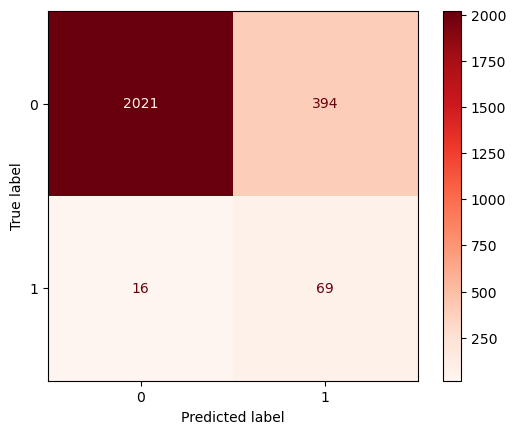

In [17]:
fig = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, test_pred))
fig.plot(cmap="Reds")
plt.show()

## Determine Optimization Parameters for AdaGrad

In [18]:
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

opt_candidates={
    "lr":  [0.1, 1, 5, 10],
    "batch_size": [16, 64, 256, 512, 1024],
    "max_epoch": [40],
}

mu = 0

results = {}
for params in product(*opt_candidates.values()):
    lr, batch_size, max_epoch = params
    param_key = "_".join(str(x) for x in params)
    
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        w = AdaGrad(
            X=X_train,
            y=y_train,
            mu=mu,
            lr=lr,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
        
        preds = sigmoid(X_val@w)
        loss = neg_log_lik(preds, y_val, w, mu)
        cv_results.append(loss)
        
    results[param_key] = np.mean(cv_results)
    

best_params = min(results, key=lambda key: results[key])
print(f"BEST: {best_params}")
results

Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.646411193148261
Length gradient: 257.5228634998315
Loss: 7533.92818604712
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6898932487270908
Length gradient: 274.751213233818
Loss: 7392.942924502639
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6868708000009047
Length gradient: 218.88230173969202
Loss: 7338.877148938069
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.688768095108331
Length gradient: 219.54376702062189
Loss: 7311.017213536125
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.6928228982102425
Length gradient: 215.52714785332944
Loss: 7292.713118858121
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.6947207588037553
Length gradient: 214.54230045305007
Loss: 7279.619326337532
==================== EPOCH: 6 ====================
Train Balanced Acc: 

Train Balanced Acc: 0.6999129627625627
Length gradient: 213.07238109447002
Loss: 7221.492412816991
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7005167233283724
Length gradient: 212.8283438777415
Loss: 7218.908104298076
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7007754778565768
Length gradient: 212.6570402179033
Loss: 7216.565545162364
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7009479808753796
Length gradient: 212.50183236284784
Loss: 7214.426254566546
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7007754778565768
Length gradient: 212.43139167970648
Loss: 7212.46401122707
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7009479808753796
Length gradient: 212.31931558254223
Loss: 7210.654060101816
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7012929869129853
Length gradient: 212.08912846007715
Loss: 7208.97715829933

Train Balanced Acc: 0.7039848197343455
Length gradient: 210.89087847111972
Loss: 7218.091129531791
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.7039848197343455
Length gradient: 210.82758326642767
Loss: 7217.449416561868
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.7039848197343455
Length gradient: 210.77533581039287
Loss: 7216.832205967588
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6451612903225806
Length gradient: 289.58244908271075
Loss: 7548.968838383361
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6866482663446611
Length gradient: 229.44666881505404
Loss: 7402.099605975232
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6878557874762808
Length gradient: 226.10678421793585
Loss: 7351.0396515930115
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6880282904950836
Length gradient: 224.44

Train Balanced Acc: 0.702863550112127
Length gradient: 211.50430951661204
Loss: 7217.825250458818
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7033810591685354
Length gradient: 211.36759771836853
Loss: 7216.012409955858
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7035535621873383
Length gradient: 211.2567606983743
Loss: 7214.333079718701
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7034673106779368
Length gradient: 211.17751084232475
Loss: 7212.772232301409
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7034673106779368
Length gradient: 211.08417187529943
Loss: 7211.316684219353
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.7020010350181127
Length gradient: 210.95611064498485
Loss: 7209.955271516794
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.7021735380369156
Length gradient: 210.86278621010874
Loss: 7208.6775595334

Train Balanced Acc: 0.6832476115951076
Length gradient: 221.4526865252489
Loss: 7360.351979646102
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6194450664791395
Length gradient: 280.93256932539674
Loss: 7672.363383044989
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6679999786901032
Length gradient: 264.219165345398
Loss: 7535.495129034987
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6675701199770996
Length gradient: 242.94094156744237
Loss: 7484.067104714902
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6673113654488954
Length gradient: 243.1560811538203
Loss: 7456.104636353084
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.6727452105411844
Length gradient: 239.5078917660228
Loss: 7437.342165660575
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.6785240616710793
Length gradient: 235.5924155872

Train Balanced Acc: 0.6824219423839917
Length gradient: 227.0416277799588
Loss: 7400.209337698425
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.6829394514404002
Length gradient: 226.7937609466819
Loss: 7397.696259644919
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.6834569604968087
Length gradient: 226.49306330865613
Loss: 7395.400834840193
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.6838882180438157
Length gradient: 226.26403541089456
Loss: 7393.298352367216
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.68414697257202
Length gradient: 226.0823369046045
Loss: 7391.35904125808
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.6842332240814215
Length gradient: 225.92011565450176
Loss: 7389.561356570418
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.6844919786096257
Length gradient: 225.789896219649
Loss: 7387.8899866034235
==

Train Balanced Acc: 0.6869932723822667
Length gradient: 223.51955136140757
Loss: 7347.785614317967
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6121269622218389
Length gradient: 293.19687269598035
Loss: 7681.366024857859
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6594790408832154
Length gradient: 249.95754993516113
Loss: 7541.6845979299505
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.6818181818181819
Length gradient: 248.36705170221947
Loss: 7492.0483387498825
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6735380369156461
Length gradient: 236.14937070857277
Loss: 7462.85498805494
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.6737105399344488
Length gradient: 236.158197416201
Loss: 7444.002964331616
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.677678109366914
Length gradient: 233.8415886

Loss: 7634.295287800751
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.6357122112732211
Length gradient: 264.73447920839067
Loss: 7632.633101638405
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.636057276835678
Length gradient: 264.3389319328761
Loss: 7631.07194007911
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.6365748751793633
Length gradient: 263.9831255460602
Loss: 7629.602199386394
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.6371787399136628
Length gradient: 263.6424706967111
Loss: 7628.215821439188
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.6363163587505638
Length gradient: 263.3116757684632
Loss: 7626.905477115626
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.6368339570942492
Length gradient: 262.9988030278771
Loss: 7625.664095214628
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.637

Train Balanced Acc: 0.5952216663791616
Length gradient: 301.29373318523557
Loss: 7750.907262269601
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.6030705537346903
Length gradient: 291.21172958371056
Loss: 7728.557585028108
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.6082456442987753
Length gradient: 285.41204072071275
Loss: 7713.322959537012
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.6166120407107124
Length gradient: 281.3782767041094
Loss: 7701.927144832502
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.6208383646713818
Length gradient: 278.4282819183574
Loss: 7692.945633134152
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.6223908918406073
Length gradient: 276.1969250388887
Loss: 7685.625874419066
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.6247196825944454
Length gradient: 274.3932834021122
Loss: 7679.481443904948
=====

Loss: 7600.910677868979
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.6449887873037778
Length gradient: 263.23934338487993
Loss: 7600.13759512628
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.6450750388131793
Length gradient: 263.0650898414666
Loss: 7599.394587441662
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.645420044850785
Length gradient: 262.90022204982756
Loss: 7598.678035429605
Starting, Loss: 14015.321343319023
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.4981887183025703
Length gradient: 468.4073625992459
Loss: 7902.182432345054
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5541659479040884
Length gradient: 328.467683532354
Loss: 7774.782752194918
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.610488183543212
Length gradient: 302.64449360506666
Loss: 7734.404375813434
==================== EPOCH: 3 ===============

Length gradient: 307.34039164279477
Loss: 7742.764867530546
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.5912818355273598
Length gradient: 306.8642322300693
Loss: 7741.911438411371
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.5919719666522736
Length gradient: 306.4095529367692
Loss: 7741.091312586329
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.5923170322147304
Length gradient: 305.97394176893
Loss: 7740.302355347026
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.593352228902101
Length gradient: 305.5578896762891
Loss: 7739.542563622004
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.5937835608551721
Length gradient: 305.16041265711476
Loss: 7738.810572207133
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.594128626417629
Length gradient: 304.77725616343423
Loss: 7738.10424108657
==================== EPOCH: 39 ============

Train Balanced Acc: 0.5479558392271865
Length gradient: 339.7658024974033
Loss: 7804.2704034666385
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.5526134207348629
Length gradient: 335.27087837173707
Loss: 7798.582190753245
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.5568397446955322
Length gradient: 331.601349932747
Loss: 7793.732654758434
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.5600310505433845
Length gradient: 328.49510256914016
Loss: 7789.510453593289
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.5628773503536312
Length gradient: 325.8515560045817
Loss: 7785.801345675354
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.5650336380886666
Length gradient: 323.5588182161493
Loss: 7782.4989777876035
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.5674486803519061
Length gradient: 321.53634993926636
Loss: 7779.531354043826


Train Balanced Acc: 0.5949629118509574
Length gradient: 315.99937086535834
Loss: 7743.05969730576
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.5944454027945489
Length gradient: 315.1787444707683
Loss: 7741.6391289778085
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.5955666724167673
Length gradient: 314.4121504377413
Loss: 7740.295112824506
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.5968604450577885
Length gradient: 313.6933325569511
Loss: 7739.021513101214
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.597377954114197
Length gradient: 313.0170884775952
Loss: 7737.813371888736
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.5986717267552182
Length gradient: 312.38029495351367
Loss: 7736.664489077377
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.599879247886838
Length gradient: 311.7790686599472
Loss: 7735.570863132492
==

Train Balanced Acc: 0.5208825975883149
Length gradient: 441.364899841007
Loss: 7882.367811973264
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.5219177942756855
Length gradient: 439.2738149325243
Loss: 7880.856723344325
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.5231255237442846
Length gradient: 437.34327641902007
Loss: 7879.437369137832
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.5240744540410409
Length gradient: 435.54345005116585
Loss: 7878.0988886941705
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.5221770696463379
Length gradient: 433.85485449688537
Loss: 7876.833477281954
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.5198483086549253
Length gradient: 432.27289440177447
Loss: 7875.635276311961
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.5203659069986106
Length gradient: 430.788290359094
Loss: 7874.497967670943

Train Balanced Acc: 0.5271617402114062
Length gradient: 420.6435030698246
Loss: 7862.099091673654
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.5273342432302089
Length gradient: 419.84904041723235
Loss: 7861.4045794287085
Starting, Loss: 14035.400508405526
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.5
Length gradient: 2440.40536081789
Loss: 8769.079231697868
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5000862515094014
Length gradient: 1067.482455416729
Loss: 8116.735460176092
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.4984474728307745
Length gradient: 765.1620126350953
Loss: 8022.087592449909
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.49775746075556326
Length gradient: 646.5409695254151
Loss: 7984.613510096988
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.4994824909435915
Length gradient: 584.5563070203968
Loss: 796

Train Balanced Acc: 0.5107814386751768
Length gradient: 437.0625994567707
Loss: 7870.803774121483
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.5114714507503881
Length gradient: 435.54967664467836
Loss: 7869.578307364694
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.5119889598067966
Length gradient: 434.1267159117742
Loss: 7868.414933345075
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.5125064688632051
Length gradient: 432.7857192331329
Loss: 7867.308787913511
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.5130239779196135
Length gradient: 431.51929160311425
Loss: 7866.255873015953
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.5131964809384164
Length gradient: 430.3182127026057
Loss: 7865.250319191765
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.5136277384854234
Length gradient: 429.18196282984184
Loss: 7864.289239603218

Train Balanced Acc: 0.8187684802341184
Length gradient: 109.67639829837225
Loss: 5318.059847864446
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8171284366524033
Length gradient: 100.17147015466215
Loss: 5302.687610731911
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8162664870444756
Length gradient: 81.26484630396315
Loss: 5290.412149707405
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8172144500623999
Length gradient: 142.81858685472665
Loss: 5282.078726191478
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8173887090643134
Length gradient: 111.96605421246767
Loss: 5273.088001237238
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8184224325116165
Length gradient: 93.51480147008863
Loss: 5265.184628605988
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8158359140332575
Length gradient: 89.31262256978654
Loss: 5259.031016600864
=

Train Balanced Acc: 0.826448793211024
Length gradient: 76.58883114420217
Loss: 5171.102006418928
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.826448793211024
Length gradient: 76.39291407375828
Loss: 5169.270761232927
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.826448793211024
Length gradient: 75.89730141549732
Loss: 5167.535593467514
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8255000266076085
Length gradient: 77.02507204043499
Loss: 5165.8729946867625
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8261037871734185
Length gradient: 74.77132440595449
Loss: 5164.324212959702
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8263625417016227
Length gradient: 74.99182699716899
Loss: 5162.880452664474
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8257587811358127
Length gradient: 75.19368612989642
Loss: 5161.466156835097
====

Train Balanced Acc: 0.8128342245989305
Length gradient: 99.93300351045436
Loss: 5404.778834449582
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8156805244091772
Length gradient: 88.37713758982522
Loss: 5367.38379244125
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.814386751768156
Length gradient: 89.98973995633655
Loss: 5341.3874903723645
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8180093151630154
Length gradient: 102.89777657347092
Loss: 5322.411366229209
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 105.15448380661229
Loss: 5307.736150415837
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8155080213903743
Length gradient: 89.80732363575736
Loss: 5295.063416996341
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8182680696912197
Length gradient: 109.4955804365753
Loss: 5285.446274934149
=======

Train Balanced Acc: 0.8216318785578747
Length gradient: 79.04909384111228
Loss: 5218.6657454610795
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8212006210108677
Length gradient: 84.26447569803058
Loss: 5215.778220365273
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 82.36991433121433
Loss: 5213.043267822013
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 81.59924585007998
Loss: 5210.518998565263
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8204243574262549
Length gradient: 78.58126069724872
Loss: 5208.142340401197
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 79.67394270512689
Loss: 5205.958756389558
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8200793513886493
Length gradient: 78.54366075063278
Loss: 5203.893199746897
=

Train Balanced Acc: 0.8143725848535683
Length gradient: 102.77853485748909
Loss: 5519.796642116316
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8184278939167149
Length gradient: 118.96782688085683
Loss: 5499.946224908708
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8193762289649593
Length gradient: 99.9327480959456
Loss: 5483.521619560537
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8198081859289681
Length gradient: 128.4885302700342
Loss: 5470.756919209442
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8202383571474405
Length gradient: 101.15550185195573
Loss: 5458.836106920857
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8199799895307691
Length gradient: 100.8670268527133
Loss: 5448.927056850284
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8204968140513887
Length gradient: 109.56643856369
Loss: 5440.758262910837
=====

Train Balanced Acc: 0.8188718302570295
Length gradient: 93.13089424268884
Loss: 5416.590487368945
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8181818181818181
Length gradient: 93.81772211540263
Loss: 5414.539655072595
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8174055545972054
Length gradient: 96.33580379071954
Loss: 5412.62869671282
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8181818181818181
Length gradient: 93.49337800768618
Loss: 5410.740536421499
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8189580817664309
Length gradient: 92.57894540172973
Loss: 5408.971645813811
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 92.45752481375625
Loss: 5407.295859006605
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8191305847852337
Length gradient: 92.31522113808016
Loss: 5405.66068537906
====

Train Balanced Acc: 0.8184405727100224
Length gradient: 93.96334040426942
Loss: 5405.26256234782
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8180955666724168
Length gradient: 94.94162291734106
Loss: 5402.296596772701
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8182680696912196
Length gradient: 93.83257452213323
Loss: 5399.496353809022
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.818354321200621
Length gradient: 93.44482440028986
Loss: 5396.872376683871
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8180093151630153
Length gradient: 94.18642509340187
Loss: 5394.410333911614
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.818354321200621
Length gradient: 93.13527935484821
Loss: 5392.068043128929
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8187855787476281
Length gradient: 92.09781647170821
Loss: 5389.857804351865
=====

Train Balanced Acc: 0.781595046960941
Length gradient: 160.556922990275
Loss: 6229.730143365998
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7824579489664878
Length gradient: 149.43822424290647
Loss: 6193.105385654333
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7786632397019329
Length gradient: 161.4409333297967
Loss: 6164.213355019054
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7832345697002079
Length gradient: 148.33751603533545
Loss: 6139.925238890688
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7839253109548465
Length gradient: 164.12523058827273
Loss: 6120.060193997002
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7859942310895203
Length gradient: 144.22336048308844
Loss: 6102.016865447575
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7845279554296962
Length gradient: 144.7176926543929
Loss: 6086.711674307305
====

Train Balanced Acc: 0.7800586510263929
Length gradient: 150.1581949464149
Loss: 6223.443964698163
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.782991202346041
Length gradient: 153.67600339458687
Loss: 6194.84902171186
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7838537174400552
Length gradient: 148.42502745682688
Loss: 6170.591868585423
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.782991202346041
Length gradient: 163.2424789184967
Loss: 6150.7326649011175
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7820424357426254
Length gradient: 150.88075668349435
Loss: 6132.878837328653
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7850612385716751
Length gradient: 188.48681278573875
Loss: 6118.920998888679
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7835087114024495
Length gradient: 157.8687367333806
Loss: 6104.439461806661
===

==================== EPOCH: 23 ====================
Train Balanced Acc: 0.7845437295152664
Length gradient: 137.87702400238143
Loss: 6018.3282918139785
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.7867862687597033
Length gradient: 138.15649697003943
Loss: 6013.2737774848465
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.786958771778506
Length gradient: 137.39702087791474
Loss: 6008.506701795179
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.7874762808349146
Length gradient: 137.01654972564123
Loss: 6004.0257022441965
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7884250474383302
Length gradient: 137.13033838677487
Loss: 5999.79836301435
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.789201311022943
Length gradient: 136.278019905461
Loss: 5995.785562492818
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.790063826116957
Length

==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7683980749425019
Length gradient: 164.02705815932208
Loss: 6399.109833587432
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7704685873669456
Length gradient: 163.62209335809948
Loss: 6389.693165643679
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7693470796453223
Length gradient: 163.14111957358233
Loss: 6381.039670498003
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7782329345525452
Length gradient: 167.24783814766602
Loss: 6373.142169706725
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7766798121348076
Length gradient: 164.5316666097504
Loss: 6365.682810943879
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.773746248892689
Length gradient: 161.45498860124405
Loss: 6358.776014648121
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7748678905452274
Lengt

Train Balanced Acc: 0.7517681559427289
Length gradient: 178.29754278423846
Loss: 6579.049165155146
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7581507676384336
Length gradient: 193.88233564591235
Loss: 6564.30504738289
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7588407797136449
Length gradient: 181.82886707454495
Loss: 6550.2699045919
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7549594617905813
Length gradient: 173.3729749723631
Loss: 6537.8400067812445
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7552182163187855
Length gradient: 171.24568749020798
Loss: 6526.672785252301
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7559082283939969
Length gradient: 170.60754324442414
Loss: 6516.526341732197
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7579782646196309
Length gradient: 170.07758527764352
Loss: 6507.21198985094

Train Balanced Acc: 0.7132693572137512
Length gradient: 204.60219795463723
Loss: 7012.660607649196
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7114577630108527
Length gradient: 208.2815682249
Loss: 6996.508694699855
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7159439427094736
Length gradient: 201.06663554951766
Loss: 6981.936819786746
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7160302091000879
Length gradient: 200.54509025679903
Loss: 6969.102678467786
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7169796900017179
Length gradient: 199.77968905548593
Loss: 6957.600664060748
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7195671311152707
Length gradient: 198.16325428549712
Loss: 6947.065043057653
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7199121966777275
Length gradient: 197.68124490689178
Loss: 6937.472774934826


Train Balanced Acc: 0.6016042780748663
Length gradient: 555.6841526773776
Loss: 7550.441382085296
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6946696567189925
Length gradient: 409.2511701519678
Loss: 7307.390800515836
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7117474555804726
Length gradient: 278.8720227617138
Loss: 7197.270230739388
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7067448680351907
Length gradient: 213.19078082503896
Loss: 7132.704888803848
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7132137312402966
Length gradient: 215.34489420017425
Loss: 7089.142492687333
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7206313610488184
Length gradient: 205.23267413414604
Loss: 7055.209866731029
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7237364153872693
Length gradient: 213.1944763547061
Loss: 7028.303935856042
=====

Train Balanced Acc: 0.7435742625495947
Length gradient: 187.60588966742452
Loss: 6805.853831703937
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.7434017595307918
Length gradient: 187.4128571216492
Loss: 6802.279575157554
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.7433155080213903
Length gradient: 187.34256280133135
Loss: 6798.851686078651
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.7435742625495947
Length gradient: 186.96862573099287
Loss: 6795.551376498754
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.7440917716060031
Length gradient: 186.63522899442358
Loss: 6792.376074160384
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.7443505261342074
Length gradient: 186.33193102321056
Loss: 6789.319193473339
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.7445230291530102
Length gradient: 186.16419480440518
Loss: 6786.366480823

Train Balanced Acc: 0.8156634258956674
Length gradient: 227.61792894726236
Loss: 4646.02348090414
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8263619315718977
Length gradient: 246.81233710998467
Loss: 4646.824551408487
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8163541671503061
Length gradient: 109.89849050798612
Loss: 4636.812033364342
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8228244440706284
Length gradient: 64.72383425747086
Loss: 4634.460161165989
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8163542266751573
Length gradient: 101.26388167902282
Loss: 4634.638889962085
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8258440058415308
Length gradient: 186.11379604239826
Loss: 4638.851066801491
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8185973909305317
Length gradient: 33.25875893483622
Loss: 4631.90969878344

Train Balanced Acc: 0.8266189449982041
Length gradient: 78.73734386351349
Loss: 4580.421356601596
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.825670818286939
Length gradient: 48.3255880528586
Loss: 4579.479479175324
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8265333333809533
Length gradient: 24.76311268600593
Loss: 4579.017840782341
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.82515266933838
Length gradient: 42.46645290265155
Loss: 4579.105297761299
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8261020758339461
Length gradient: 38.21322001079123
Loss: 4578.831942935223
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.82575642990419
Length gradient: 53.56627227211344
Loss: 4578.973085105654
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.827137093946763
Length gradient: 12.774572706482552
Loss: 4578.327017185855
========

Train Balanced Acc: 0.8193030878040366
Length gradient: 40.85147186984049
Loss: 4629.876449873927
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 273.0589371546819
Loss: 4641.335331763133
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8203381059168535
Length gradient: 115.7840739001395
Loss: 4629.607984481212
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8189580817664309
Length gradient: 54.65712118687874
Loss: 4626.9629457497895
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 97.29659660946918
Loss: 4627.404063234837
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8205968604450578
Length gradient: 107.28307704764589
Loss: 4626.832505505497
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8211143695014662
Length gradient: 24.086763218994758
Loss: 4624.639823921187

Train Balanced Acc: 0.8212868725202691
Length gradient: 13.963606911912422
Loss: 4589.690121527154
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8227531481800932
Length gradient: 45.98277231401796
Loss: 4589.835918088391
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 26.81609656738261
Loss: 4589.357041490566
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8218043815766776
Length gradient: 23.39329063111923
Loss: 4589.1553348490725
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8206831119544592
Length gradient: 29.441128246097264
Loss: 4589.007830057646
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 20.87684118607125
Loss: 4588.765001060849
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8219768845954805
Length gradient: 25.37832423448326
Loss: 4588.658402319153


Train Balanced Acc: 0.833003119221253
Length gradient: 99.10356056709665
Loss: 4784.359930445232
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8198061025591757
Length gradient: 159.05636648182107
Loss: 4771.047178529817
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8313646828105206
Length gradient: 53.9089895830679
Loss: 4759.120029966603
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8215316089460136
Length gradient: 183.41888081562422
Loss: 4754.832426710976
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8238586437167412
Length gradient: 105.7828215283498
Loss: 4745.046608746852
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8264474687830847
Length gradient: 53.86053229599845
Loss: 4737.998582437884
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8275680241070885
Length gradient: 107.22506707598626
Loss: 4734.545847343152
====

Train Balanced Acc: 0.8233569087459031
Length gradient: 48.8683499921184
Loss: 4709.12175511689
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8248231844057271
Length gradient: 36.16381805427286
Loss: 4707.89401494282
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8228393996894945
Length gradient: 71.91818905543849
Loss: 4707.506314674178
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.822925651198896
Length gradient: 40.80715553874477
Loss: 4706.111088655818
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8233569087459031
Length gradient: 51.573420545395784
Loss: 4705.40704312382
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8245644298775229
Length gradient: 79.85825510454045
Loss: 4705.183714661032
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8218043815766776
Length gradient: 30.138550113447575
Loss: 4703.477548766578
=====

Train Balanced Acc: 0.8230119027082974
Length gradient: 100.42908517102643
Loss: 4713.722775412407
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8241331723305159
Length gradient: 147.00915142856346
Loss: 4713.308854893258
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8226668966706918
Length gradient: 46.02347259409396
Loss: 4708.44431730394
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8226668966706918
Length gradient: 44.86311258159637
Loss: 4706.680786327389
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8234431602553045
Length gradient: 37.752136676417024
Loss: 4704.968587890613
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 57.488385932218094
Loss: 4703.730575161388
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8214593755390719
Length gradient: 30.897452173682723
Loss: 4702.00956050437

Train Balanced Acc: 0.7919447816527265
Length gradient: 127.44630372937546
Loss: 5811.521603852282
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8057488029850046
Length gradient: 198.74089252452185
Loss: 5705.365018852289
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.814373894400295
Length gradient: 127.8830217951472
Loss: 5631.458953581889
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8144581220647551
Length gradient: 157.393334793268
Loss: 5580.644930022419
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8154940330503403
Length gradient: 115.60859222886077
Loss: 5538.845057389246
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8223965347965019
Length gradient: 152.50132355603475
Loss: 5506.386079119726
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8217054066303303
Length gradient: 104.35052447464165
Loss: 5478.011100802305
=====

Train Balanced Acc: 0.8199930998792478
Length gradient: 89.87191880209389
Loss: 5308.197449673393
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8212868725202691
Length gradient: 92.10361728779569
Loss: 5303.758151192542
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 90.32466013296968
Loss: 5299.377177651041
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 103.53885153405153
Loss: 5295.5515470730925
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8226668966706917
Length gradient: 87.64738814025844
Loss: 5291.271858735846
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8224943936518889
Length gradient: 89.78951983381218
Loss: 5287.549315801798
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8242194238399172
Length gradient: 97.21043941036741
Loss: 5284.098748574976


Train Balanced Acc: 0.818354321200621
Length gradient: 120.0732762028196
Loss: 5351.4350929003685
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8184405727100225
Length gradient: 102.6225001032689
Loss: 5343.592014374113
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8191305847852337
Length gradient: 99.64810599962625
Loss: 5336.63888759744
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 92.90794485516989
Loss: 5330.016384693731
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.818354321200621
Length gradient: 97.39688540185684
Loss: 5323.980908131134
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 91.35803391484966
Loss: 5318.0971464783715
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 91.23749235734583
Loss: 5312.6066536796325
==

Train Balanced Acc: 0.7868552431810414
Length gradient: 157.04042376640479
Loss: 5961.957581115248
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.786510743104671
Length gradient: 141.566075366063
Loss: 5945.859876901359
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.787373049861706
Length gradient: 143.59226526421122
Loss: 5931.764189282217
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7887536394982151
Length gradient: 138.07829887338104
Loss: 5918.557409256069
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7874598668571938
Length gradient: 137.41774725565756
Loss: 5906.494103393201
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7906515149729405
Length gradient: 136.30070245511126
Loss: 5895.298377465735
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7972084005517716
Length gradient: 149.36009136860136
Loss: 5885.257513393532

Train Balanced Acc: 0.7861825081938933
Length gradient: 151.3179873382078
Loss: 6023.657117521772
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7861825081938933
Length gradient: 209.6623416103176
Loss: 6006.895608788908
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.7887700534759359
Length gradient: 159.5336863291072
Loss: 5987.738334052721
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.78109366913921
Length gradient: 148.99995762178955
Loss: 5971.937783635632
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.784629981024668
Length gradient: 136.94491179240694
Loss: 5957.4506167209765
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.786527514231499
Length gradient: 137.14707515648442
Loss: 5944.42682553257
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.788166292910126
Length gradient: 136.51367143692588
Loss: 5932.409478489162
===

Train Balanced Acc: 0.8020527859237536
Length gradient: 128.65940789152017
Loss: 5755.578922300978
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8021390374331551
Length gradient: 127.55511354277444
Loss: 5751.535800250344
Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.55840826916852
Length gradient: 3385.578161101709
Loss: 9030.42529583106
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.67896633131556
Length gradient: 2010.660385548116
Loss: 7502.650488531961
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7139607085981148
Length gradient: 204.2895051310305
Loss: 6848.934342519275
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7214632506068857
Length gradient: 263.48999052006366
Loss: 6771.282309883114
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7273331598779169
Length gradient: 195.423361361336

Train Balanced Acc: 0.7669320820257212
Length gradient: 172.01094162182227
Loss: 6441.090940984468
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7687436911098325
Length gradient: 171.74123003084642
Loss: 6431.103955502378
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7697791854214592
Length gradient: 175.30798950756096
Loss: 6421.861476187352
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7709004550436775
Length gradient: 172.60571787370571
Loss: 6413.004311621729
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7735740137357165
Length gradient: 171.84275383669032
Loss: 6404.728981288777
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7733154973069172
Length gradient: 170.16567777417066
Loss: 6396.8223371929635
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.7752134025440682
Length gradient: 169.4978132017091
Loss: 6389.37717606

Loss: 6507.992122718799
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.7586682766948422
Length gradient: 175.82492263261383
Loss: 6494.37125560717
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7584095221666379
Length gradient: 171.82760348972477
Loss: 6481.897045640768
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7607383129204761
Length gradient: 171.38977237582245
Loss: 6470.465715060746
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7615145765050888
Length gradient: 170.81982948699974
Loss: 6459.853073284521
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7641021217871313
Length gradient: 171.91316590771194
Loss: 6450.016765706963
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7637571157495255
Length gradient: 170.41884044524582
Loss: 6440.705538735517
==================== EPOCH: 19 ====================
Train Balanced Acc:

Train Balanced Acc: 0.7694497153700189
Length gradient: 166.73674527943632
Loss: 6359.96908655389
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.769880972917026
Length gradient: 166.5190710428564
Loss: 6354.782457358125
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.7703984819734345
Length gradient: 166.30868473546403
Loss: 6349.785326701816
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.7754873210281179
Length gradient: 166.9654701182713
Loss: 6344.993178863968
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.7721235121614628
Length gradient: 165.9674275686273
Loss: 6340.321829483148
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.7734172848024841
Length gradient: 165.4014658220996
Loss: 6335.825889669902
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.7703984819734346
Length gradient: 165.35184819448435
Loss: 6331.492926387955
=

Train Balanced Acc: 0.8280850272022617
Length gradient: 189.50558345846696
Loss: 4573.130322933061
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8206686176531899
Length gradient: 260.6627412044048
Loss: 4568.096640419851
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8261022246460741
Length gradient: 88.54338332345439
Loss: 4559.11149747748
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8202373601061828
Length gradient: 267.02577163524563
Loss: 4567.842773290668
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8277402146204225
Length gradient: 88.77634545045358
Loss: 4555.730914214222
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8273962353865003
Length gradient: 83.20650238872648
Loss: 4554.999511551267
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8254972438208145
Length gradient: 126.4290959355054
Loss: 4557.838105402761
====

Train Balanced Acc: 0.8236156632741073
Length gradient: 9.17020552045659
Loss: 4572.125571285851
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8224943936518889
Length gradient: 33.79994720658448
Loss: 4572.380416028883
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8233569087459031
Length gradient: 14.565483373191764
Loss: 4572.154950170914
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8210281179920649
Length gradient: 4.477821850527722
Loss: 4572.022430887227
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8252544419527341
Length gradient: 79.58449092438694
Loss: 4573.2227237784045
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8217181300672762
Length gradient: 11.31208683708379
Loss: 4572.077993576991
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 63.31000746906758
Loss: 4572.825550308804
=

Train Balanced Acc: 0.8187855787476281
Length gradient: 445.10748533553755
Loss: 4605.543963031505
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.822321890633086
Length gradient: 92.8821694676315
Loss: 4571.590937843116
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.822321890633086
Length gradient: 168.99645996472125
Loss: 4573.1299330138045
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 347.79796249229696
Loss: 4587.392287277635
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8242194238399172
Length gradient: 313.82825503672217
Loss: 4581.7444604002785
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8212006210108678
Length gradient: 283.5204588815254
Loss: 4578.509129432269
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 80.74316861155498
Loss: 4566.549422112985
===

Train Balanced Acc: 0.8192875220554455
Length gradient: 22.72025015870454
Loss: 4640.563634620388
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8220480465551004
Length gradient: 45.28723880885727
Loss: 4640.457849267637
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8200639195709735
Length gradient: 14.201044486691247
Loss: 4639.791057256638
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8231695096330853
Length gradient: 80.49266967751512
Loss: 4640.567778228594
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8199776531803593
Length gradient: 18.345257514853536
Loss: 4639.153589828018
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.785486871020243
Length gradient: 1483.9503472468573
Loss: 5359.268383585483
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.8128138075749658
Length gradient: 803.36585

Train Balanced Acc: 0.8203381059168535
Length gradient: 280.5761552377034
Loss: 4646.120058546812
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8222356391236847
Length gradient: 110.46738097565748
Loss: 4632.189985483662
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8243056753493185
Length gradient: 94.99917235938486
Loss: 4629.8398518554595
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8263757115749526
Length gradient: 229.31298342273666
Loss: 4635.4120237188745
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8222356391236847
Length gradient: 61.19118981148968
Loss: 4626.199304347081
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.820424357426255
Length gradient: 60.13862808147099
Loss: 4624.456514307636
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8233569087459031
Length gradient: 195.2991306389663
Loss: 4628.697121384406

Train Balanced Acc: 0.8200793513886493
Length gradient: 112.30503809017836
Loss: 4637.733940879601
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8192168362946352
Length gradient: 40.44148013509725
Loss: 4635.343298334894
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8174918061066069
Length gradient: 55.86309730187025
Loss: 4635.143292546504
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8198205968604451
Length gradient: 104.53079262442522
Loss: 4635.969770747022
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8174055545972054
Length gradient: 44.73112797008027
Loss: 4633.913971396889
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8201656028980507
Length gradient: 16.640908385487826
Loss: 4633.1911415906525
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8188718302570295
Length gradient: 34.66349840834069
Loss: 4632.85825182547

Train Balanced Acc: 0.8171305200221957
Length gradient: 65.78990313132199
Loss: 5013.432935032311
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8166991880691246
Length gradient: 62.24787634595633
Loss: 5009.0417595306835
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8154042100498664
Length gradient: 129.7242035057954
Loss: 5006.790499720847
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8175616138758619
Length gradient: 61.423073586018404
Loss: 5001.09960475965
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8176484159901369
Length gradient: 93.70697426794929
Loss: 4998.182152539213
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8172170840370658
Length gradient: 85.16962651607852
Loss: 4994.523931616032
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8179934815525938
Length gradient: 96.29039271892978
Loss: 4991.518689764406
=

Train Balanced Acc: 0.8226668966706918
Length gradient: 106.51320557130913
Loss: 5043.391129451443
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8227531481800932
Length gradient: 68.63773271133398
Loss: 5035.485165333839
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8236156632741073
Length gradient: 80.50941407312452
Loss: 5028.894349480799
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8221493876142832
Length gradient: 121.36219444369698
Loss: 5023.838770820599
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8201656028980507
Length gradient: 66.86227309276762
Loss: 5016.736265217896
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 72.10569847438819
Loss: 5011.538376572942
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8200793513886493
Length gradient: 104.93919195235999
Loss: 5007.334959986616


Train Balanced Acc: 0.8220631361048818
Length gradient: 142.90479519859358
Loss: 5165.491001703293
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8206831119544592
Length gradient: 113.04200310866206
Loss: 5140.048050467753
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8190443332758324
Length gradient: 102.4926112159169
Loss: 5119.370277147499
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8157667759185786
Length gradient: 99.66591019749765
Loss: 5102.181295987182
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8194755908228394
Length gradient: 204.9145320593859
Loss: 5091.7070962444905
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8224081421424875
Length gradient: 82.61153584290976
Loss: 5074.17011350537
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.820855614973262
Length gradient: 218.42031521152597
Loss: 5068.426501638705
====

Train Balanced Acc: 0.817215491747296
Length gradient: 88.37598335412794
Loss: 5309.864614530399
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8156631877962626
Length gradient: 90.09055971181051
Loss: 5306.885127283842
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.817215491747296
Length gradient: 88.32213777839995
Loss: 5303.894945122089
Starting, Loss: 14016.158419489791
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.6009025544851797
Length gradient: 3283.0900486410583
Loss: 9758.78969769636
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7277535541395784
Length gradient: 1631.077437968452
Loss: 6647.95215252076
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7689971925699176
Length gradient: 258.72032373063445
Loss: 5792.50540244347
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.785735848591636
Length gradient: 215.2839618267745

Train Balanced Acc: 0.8210281179920649
Length gradient: 103.15497603710594
Loss: 5311.535965738694
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8191305847852337
Length gradient: 90.33234591635751
Loss: 5307.52844452458
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 91.80590913352813
Loss: 5303.986974624473
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.8218043815766776
Length gradient: 97.99888698911468
Loss: 5300.68209017788
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8220631361048818
Length gradient: 89.96851409599991
Loss: 5297.130964176362
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8221493876142832
Length gradient: 89.9914612345304
Loss: 5293.903956163509
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8214593755390719
Length gradient: 93.07028941928272
Loss: 5290.867227527373
====

Train Balanced Acc: 0.8210281179920649
Length gradient: 98.65072461846394
Loss: 5316.010502052879
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 92.35215466135189
Loss: 5311.338867607043
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8205106089356564
Length gradient: 91.78492894924854
Loss: 5307.013758333669
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8199068483698464
Length gradient: 91.02038636130433
Loss: 5302.8283521026315
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8197343453510436
Length gradient: 90.63809596723561
Loss: 5298.832821400834
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8212006210108678
Length gradient: 97.49217316023878
Loss: 5295.150204086879
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8196480938416422
Length gradient: 90.66910292436656
Loss: 5291.312114201557
=

Loss: 6149.967691000384
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7717599046078545
Length gradient: 172.6761600475977
Loss: 6065.485021540384
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7784025952597027
Length gradient: 146.9312281649542
Loss: 6014.022504992914
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7784016875057218
Length gradient: 158.89445844558742
Loss: 5975.37646773711
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7822855501161746
Length gradient: 165.16201227529223
Loss: 5943.608744783069
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7861666448210463
Length gradient: 142.13822824129954
Loss: 5916.437234691164
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7835795013317495
Length gradient: 169.3061190883583
Loss: 5894.60260658987
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7856477

Train Balanced Acc: 0.7490943591512851
Length gradient: 170.98146428481073
Loss: 6234.65783602847
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7609970674486803
Length gradient: 163.71058445828265
Loss: 6145.520578284099
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7698809729170261
Length gradient: 155.94131886261937
Loss: 6090.312020386753
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.77195100914266
Length gradient: 145.57552860934
Loss: 6050.223388979524
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7767810936691393
Length gradient: 145.4215144409453
Loss: 6018.495703190823
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7786786268759703
Length gradient: 147.65593406155094
Loss: 5991.843017313797
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7797998964981887
Length gradient: 160.69472843121935
Loss: 5969.498658564926
========

Train Balanced Acc: 0.7930826289460066
Length gradient: 129.86953699263793
Loss: 5795.422242055714
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.7915301017767811
Length gradient: 134.8659537446808
Loss: 5787.14121148177
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.7923926168707952
Length gradient: 133.7974240165193
Loss: 5779.139934573543
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.791098844229774
Length gradient: 131.14037018801773
Loss: 5771.569744327754
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.7933413834742108
Length gradient: 127.55252580031656
Loss: 5764.379651636905
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.7938588925306194
Length gradient: 128.8655577005441
Loss: 5757.652173184122
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7944626530964292
Length gradient: 126.68763425002238
Loss: 5751.192012916637


{'0.1_16_40': 1802.1644860804324,
 '0.1_64_40': 1839.2948361531567,
 '0.1_256_40': 1902.9185953974793,
 '0.1_512_40': 1934.1224183480517,
 '0.1_1024_40': 1965.7846324632114,
 '1_16_40': 1298.5721022316916,
 '1_64_40': 1348.63845478353,
 '1_256_40': 1491.6809220256036,
 '1_512_40': 1589.7952574496057,
 '1_1024_40': 1699.0761672706553,
 '5_16_40': 1152.1943900652284,
 '5_64_40': 1178.2341245626112,
 '5_256_40': 1314.5835011056104,
 '5_512_40': 1444.6588204283823,
 '5_1024_40': 1580.9902079405338,
 '10_16_40': 1146.236684731297,
 '10_64_40': 1155.3750375837212,
 '10_256_40': 1237.88209165113,
 '10_512_40': 1322.6321523978254,
 '10_1024_40': 1422.2473624522977}

### Determine Regularization Parameter

In [19]:
mu_candidates = np.arange(0, 0.01, 0.001)
lr, batch_size, max_epoch = [int(x) for x in best_params.split("_")]
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

results = {}
for mu in mu_candidates:
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        w = AdaGrad(
            X=X_train,
            y=y_train,
            mu=mu,
            lr=lr,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )

        probs = sigmoid(X_val@w) #> 0.5
        loss = roc_auc_score(y_val, probs)
        cv_results.append(loss)

    results[str(mu)] = np.mean(cv_results)

selected_mu = float(max(results, key=lambda key: results[key]))
print("BEST MU: ", selected_mu)
results

Starting, Loss: 14026.524008363967
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7989295169808329
Length gradient: 440.36477164234964
Loss: 4872.354350320125
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7736705928068026
Length gradient: 2160.501583470985
Loss: 5613.438974643627
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.813246940154786
Length gradient: 416.28315678742905
Loss: 4659.806610871541
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.821617339612967
Length gradient: 211.83969942007315
Loss: 4623.733341483583
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8159252757161346
Length gradient: 247.1877163103472
Loss: 4637.322527680109
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.821790065849962
Length gradient: 152.2887102622863
Loss: 4612.9622078584025
==================== EPOCH: 6 ====================
Train Balanced Acc:

Train Balanced Acc: 0.8253254997438646
Length gradient: 38.81160350246092
Loss: 4554.1688759146855
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8233417150276321
Length gradient: 81.22385729763975
Loss: 4555.385020156924
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8262754419630916
Length gradient: 180.90478344111406
Loss: 4559.705980478266
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8252392333532503
Length gradient: 20.126654907343724
Loss: 4553.420974826426
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8240321140143763
Length gradient: 118.1364652291899
Loss: 4556.709504069253
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8262739389605984
Length gradient: 54.15431190031733
Loss: 4554.04008793272
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8267044524469654
Length gradient: 188.86928295779026
Loss: 4560.067673872913

Train Balanced Acc: 0.821890633086079
Length gradient: 11.922870138943
Loss: 4571.963060097321
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 6.566867506386656
Loss: 4571.933262630588
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8232706572365016
Length gradient: 43.36347003517077
Loss: 4572.294938559238
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8236156632741073
Length gradient: 47.27045563790491
Loss: 4572.3301650012445
Starting, Loss: 14043.866005604476
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.8222356391236847
Length gradient: 372.70638030209653
Loss: 4700.172920387452
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7791961359323788
Length gradient: 2316.6074397061925
Loss: 5556.102684063532
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8140417457305502
Length gradient: 766.79198122

Train Balanced Acc: 0.8187855787476281
Length gradient: 137.12565705407232
Loss: 4566.984208983933
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.8240469208211143
Length gradient: 69.246298169762
Loss: 4564.091584173282
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8215456270484733
Length gradient: 28.03337707280147
Loss: 4563.532081194932
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8234431602553045
Length gradient: 53.351793549739696
Loss: 4563.524295409063
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8245644298775229
Length gradient: 291.9869731966272
Loss: 4579.209077407179
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8191305847852337
Length gradient: 34.06151905858319
Loss: 4563.606283374866
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8244781783681214
Length gradient: 176.50736891264435
Loss: 4568.776591627819
=

Train Balanced Acc: 0.8201495163070116
Length gradient: 37.70242641430599
Loss: 4818.3672220606595
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.821529778556839
Length gradient: 44.08926390030896
Loss: 4818.362261514606
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8211847129943821
Length gradient: 41.45476597349191
Loss: 4818.258236932887
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8193728806920788
Length gradient: 63.18182474625714
Loss: 4818.790755126289
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8199769835257831
Length gradient: 38.90258607282441
Loss: 4818.336474071158
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.8207537530716311
Length gradient: 64.7982607705666
Loss: 4818.9443611664865
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8163535570205812
Length gradient: 127.48042754030057
Loss: 4820.693965104111
=

Train Balanced Acc: 0.8210281179920649
Length gradient: 108.85151245187318
Loss: 4789.024409764162
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8262032085561497
Length gradient: 403.2605745797055
Loss: 4823.269076507748
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.8182680696912197
Length gradient: 140.71944550023298
Loss: 4797.097950223133
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 74.9534228372944
Loss: 4791.190891984682
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8205968604450578
Length gradient: 143.78886085693694
Loss: 4794.565017589181
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8242194238399172
Length gradient: 169.52014823511658
Loss: 4793.471942910089
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8272382266689666
Length gradient: 53.42148722763572
Loss: 4789.94449984691
=====

Train Balanced Acc: 0.8155942728997758
Length gradient: 217.09126411764186
Loss: 4813.56494654393
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8170605485595999
Length gradient: 178.52447209142565
Loss: 4811.750504110362
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 48.30502087001843
Loss: 4807.045163133185
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8161980334655856
Length gradient: 63.86796239278517
Loss: 4807.616041152466
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8161117819561843
Length gradient: 60.03052316462868
Loss: 4807.487881849019
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8168017940313956
Length gradient: 56.986729785677525
Loss: 4807.493630593165
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8193893393134379
Length gradient: 173.85993593660777
Loss: 4811.375613267665

Train Balanced Acc: 0.8197343453510437
Length gradient: 49.18936596685702
Loss: 4781.809819106637
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8186130757288252
Length gradient: 80.85900821760006
Loss: 4782.518753658774
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8221493876142832
Length gradient: 66.18753237288321
Loss: 4782.208074206279
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8193030878040366
Length gradient: 101.59427519521427
Loss: 4783.196820335981
Starting, Loss: 14026.533145342275
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7921960360496785
Length gradient: 793.0686515767075
Loss: 5291.009843875265
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7233867812924821
Length gradient: 2366.4770606686147
Loss: 6012.6453709074885
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7989221954241342
Length gradient: 875.39343

Train Balanced Acc: 0.8199783823597866
Length gradient: 67.40203716431087
Loss: 5022.186736407573
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.8238617538902169
Length gradient: 181.19211980895153
Loss: 5027.036166997743
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8253286992046169
Length gradient: 226.68738743785858
Loss: 5029.18664115966
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8266219212407646
Length gradient: 140.16262386387638
Loss: 5024.909144048732
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8252417780406396
Length gradient: 170.0897563826583
Loss: 5026.673966992502
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8291219947539559
Length gradient: 72.18238890338922
Loss: 5023.7821632912155
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8229099366381769
Length gradient: 175.82570569641737
Loss: 5027.67012087840

Train Balanced Acc: 0.8213731240296704
Length gradient: 66.77199741442789
Loss: 5042.322509335834
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8236156632741074
Length gradient: 65.07532096566614
Loss: 5042.405396587491
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8244781783681214
Length gradient: 80.36441465152504
Loss: 5043.010266786747
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8207693634638606
Length gradient: 83.35665191615617
Loss: 5042.933228761194
Starting, Loss: 14043.875142582783
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.8185268242194239
Length gradient: 756.7802376999924
Loss: 5128.467087314379
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7355528721752631
Length gradient: 2850.4477324507907
Loss: 6135.734871868357
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7959289287562532
Length gradient: 1071.844866

Train Balanced Acc: 0.8187855787476281
Length gradient: 86.96612144030308
Loss: 5030.497371999558
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.8212006210108677
Length gradient: 354.7438530901799
Loss: 5048.3269613115
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8170605485595999
Length gradient: 81.34230615999208
Loss: 5031.206937602081
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8171468000690012
Length gradient: 168.33056174391731
Loss: 5034.284706450254
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8195618423322408
Length gradient: 279.0639211773978
Loss: 5040.758306712952
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8211143695014662
Length gradient: 80.14925697424744
Loss: 5030.960053570447
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8186993272382267
Length gradient: 63.000672678799354
Loss: 5031.053107956274
==

Train Balanced Acc: 0.8165255540781488
Length gradient: 77.36189876698526
Loss: 5278.527548195687
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.813594565285845
Length gradient: 185.5994883370389
Loss: 5282.38934136617
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8156631282714114
Length gradient: 76.7571189231114
Loss: 5278.2981591952575
Starting, Loss: 14016.172124957255
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.8101512907428261
Length gradient: 640.0431312612599
Loss: 5280.747365800139
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7282649470175252
Length gradient: 2659.721156953677
Loss: 6197.218920566095
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7830718734006417
Length gradient: 1410.904203305419
Loss: 5496.642214336054
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8163559677770551
Length gradient: 214.65094613226

Train Balanced Acc: 0.8190443332758324
Length gradient: 191.4520504598675
Loss: 5256.172271076187
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8164567879937898
Length gradient: 254.82158060848832
Loss: 5259.655922061535
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8114542004485079
Length gradient: 105.70179367354761
Loss: 5254.161174857687
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8189580817664308
Length gradient: 140.66898084304117
Loss: 5254.998169474354
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8175780576160083
Length gradient: 132.41895495415395
Loss: 5254.394158766965
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.816888045540797
Length gradient: 118.49036821773231
Loss: 5254.651304135354
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8209418664826634
Length gradient: 87.70505222018473
Loss: 5254.15509200817

Loss: 5268.052047105878
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.81524926686217
Length gradient: 76.28415912161853
Loss: 5266.0593414673
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8090391581852683
Length gradient: 111.51928321888136
Loss: 5267.000323041273
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8123167155425219
Length gradient: 122.04150162845572
Loss: 5267.570738062879
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8113679489391064
Length gradient: 110.14863425054024
Loss: 5267.0224432656205
Starting, Loss: 14015.335048786486
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7867862687597034
Length gradient: 1273.6571381929502
Loss: 5447.5765223567705
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6485250991892358
Length gradient: 3598.801864345624
Loss: 7005.070560600529
==================== EPOCH: 2 ===========

Train Balanced Acc: 0.8150564956315307
Length gradient: 218.69203909613762
Loss: 5460.369228082537
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8113494664728061
Length gradient: 101.39921122212769
Loss: 5456.2438057780155
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8106584573563371
Length gradient: 146.79461543675345
Loss: 5458.14836104911
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8163520391368754
Length gradient: 95.88548679888117
Loss: 5455.448044361041
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8154906103713958
Length gradient: 109.72547202516843
Loss: 5456.199314933121
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8142819285051774
Length gradient: 99.58337816484912
Loss: 5456.317549199003
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.812899553123132
Length gradient: 268.2288869078169
Loss: 5464.259752405007

Train Balanced Acc: 0.8161836135703804
Length gradient: 95.53860300910553
Loss: 5418.348850425695
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.8198073674622639
Length gradient: 92.61772259189891
Loss: 5418.441341281166
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.8207549435686553
Length gradient: 145.63015383973055
Loss: 5419.988254411832
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8185995784688137
Length gradient: 90.59964040362846
Loss: 5418.341775442109
Starting, Loss: 14035.418782362143
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.801707779886148
Length gradient: 770.5284205759257
Loss: 5482.247896399124
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6765568397446955
Length gradient: 3089.2858658536943
Loss: 6674.242473478786
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8033465585647749
Length gradient: 696.6402690

Train Balanced Acc: 0.8033465585647749
Length gradient: 231.8397555694055
Loss: 5448.579825231489
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8142142487493531
Length gradient: 100.42027834273128
Loss: 5443.096423698423
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.8104191823356909
Length gradient: 196.14221678535122
Loss: 5446.816463394174
==================== EPOCH: 20 ====================
Train Balanced Acc: 0.8107641883732966
Length gradient: 142.36994329769027
Loss: 5444.531144701945
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.8124029670519234
Length gradient: 219.95568887930352
Loss: 5448.5915222336225
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8048128342245989
Length gradient: 215.10291396310606
Loss: 5448.747918918195
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8155080213903743
Length gradient: 112.69600182512339
Loss: 5443.74620524

Train Balanced Acc: 0.8155080213903743
Length gradient: 102.69590658029574
Loss: 5423.7821871035785
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.8139554942211489
Length gradient: 149.5933980904743
Loss: 5425.635921869184
Starting, Loss: 14026.546850809738
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7638117298005096
Length gradient: 1109.4423215240574
Loss: 5859.46083527784
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.7006167250784032
Length gradient: 2417.6844887833586
Loss: 6523.713912063513
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7717445769586682
Length gradient: 1173.1371291597611
Loss: 5805.934090283527
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8167860497082509
Length gradient: 292.50107501545693
Loss: 5621.190346308975
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8009999252367869
Length gradient: 215.03101

Train Balanced Acc: 0.8106621032534735
Length gradient: 168.49620630045567
Loss: 5573.428089272858
==================== EPOCH: 21 ====================
Train Balanced Acc: 0.811094089979908
Length gradient: 129.66479848230148
Loss: 5572.905308316324
==================== EPOCH: 22 ====================
Train Balanced Acc: 0.8151509913328245
Length gradient: 179.13417102772945
Loss: 5574.132344654622
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.8174812404455173
Length gradient: 251.5068430192501
Loss: 5578.367521013334
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8162712639137852
Length gradient: 105.03640297116893
Loss: 5571.719447206843
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.811523770118358
Length gradient: 248.20605979760347
Loss: 5578.651926142507
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8110933608004807
Length gradient: 173.85111205971168
Loss: 5574.42810830994

Train Balanced Acc: 0.8074003795066413
Length gradient: 420.0511658182454
Loss: 5601.688141403576
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8138692427117474
Length gradient: 126.92746570227445
Loss: 5595.805256488933
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8043815766775919
Length gradient: 294.98585910444245
Loss: 5599.0823453973835
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7960151802656547
Length gradient: 679.8087969977989
Loss: 5645.1233553948505
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7979989649818872
Length gradient: 330.8017885734936
Loss: 5605.063777022814
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7905813351733655
Length gradient: 222.95181346501084
Loss: 5604.094342593877
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.813782991202346
Length gradient: 299.3865108003046
Loss: 5600.974193233796
====

Train Balanced Acc: 0.8120579610143177
Length gradient: 170.33427548056858
Loss: 5578.929445142816
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.8136104881835432
Length gradient: 112.4759594217077
Loss: 5578.573057610168
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.8080041400724512
Length gradient: 100.92814012378159
Loss: 5576.960505466927
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.8122304640331206
Length gradient: 272.8491147124235
Loss: 5584.676842839273
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.8104191823356909
Length gradient: 111.02292957259522
Loss: 5577.718287985202
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.8040365706399861
Length gradient: 106.92512653227261
Loss: 5578.122953110019
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.8083491461100569
Length gradient: 145.3795298017093
Loss: 5578.92779868698

Train Balanced Acc: 0.8135163347501438
Length gradient: 451.7771312166682
Loss: 5722.982064739473
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.8116109145005276
Length gradient: 247.94444072918006
Loss: 5711.496165347131
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.8023857381789896
Length gradient: 276.0256497688711
Loss: 5711.0812839960145
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.8113557314633959
Length gradient: 163.98867415485532
Loss: 5704.160918214597
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.8101460971995582
Length gradient: 137.29744159227124
Loss: 5704.071304799992
==================== EPOCH: 12 ====================
Train Balanced Acc: 0.8021219984444965
Length gradient: 219.16969824429313
Loss: 5711.837001363886
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8056630723180513
Length gradient: 213.54016132335693
Loss: 5707.30041807315

Train Balanced Acc: 0.8048128342245989
Length gradient: 201.69155358304224
Loss: 5724.8691282486525
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.8011040193203381
Length gradient: 111.15523192420802
Loss: 5721.1453970294515
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.8030015525271692
Length gradient: 154.53215904404132
Loss: 5722.439995132766
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.801707779886148
Length gradient: 110.86531242291538
Loss: 5721.938138003296
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.8033465585647749
Length gradient: 110.57622479769968
Loss: 5721.910063563988
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.801707779886148
Length gradient: 233.74302168854322
Loss: 5727.118484124292
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.8020527859237536
Length gradient: 119.01798631455705
Loss: 5721.68541988

Train Balanced Acc: 0.7986027255476971
Length gradient: 123.48866280164638
Loss: 5713.162675563325
==================== EPOCH: 13 ====================
Train Balanced Acc: 0.8046403312057961
Length gradient: 248.8852795647512
Loss: 5715.965113893447
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.802742797998965
Length gradient: 111.32698083726201
Loss: 5712.590133581106
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7962739347938589
Length gradient: 213.2537669274239
Loss: 5715.785423659593
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.8023115404519578
Length gradient: 129.90716322321595
Loss: 5710.445523413392
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7975677074348801
Length gradient: 373.71645852706496
Loss: 5727.841016401373
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.8004140072451268
Length gradient: 145.66802844583628
Loss: 5711.87015488974

Train Balanced Acc: 0.7931485080750817
Length gradient: 120.99568997447955
Loss: 5859.336446612848
==================== EPOCH: 36 ====================
Train Balanced Acc: 0.7951333493574233
Length gradient: 130.6025200157388
Loss: 5859.593169114574
==================== EPOCH: 37 ====================
Train Balanced Acc: 0.7940974383718382
Length gradient: 119.3214840387597
Loss: 5859.524101486736
==================== EPOCH: 38 ====================
Train Balanced Acc: 0.7877174011259482
Length gradient: 224.27210512522336
Loss: 5863.941187006782
==================== EPOCH: 39 ====================
Train Balanced Acc: 0.7947015412055425
Length gradient: 117.58162397044016
Loss: 5859.065272413156
Starting, Loss: 14016.190398913872
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.7601243438426839
Length gradient: 905.331921774911
Loss: 5898.105657178702
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.6690858756694908
Length gradient: 2726.0317

Train Balanced Acc: 0.8011902708297396
Length gradient: 175.5781987278384
Loss: 5838.314716979294
==================== EPOCH: 14 ====================
Train Balanced Acc: 0.7930826289460065
Length gradient: 218.00610441782277
Loss: 5842.279196719695
==================== EPOCH: 15 ====================
Train Balanced Acc: 0.7954976712092461
Length gradient: 252.8570237668049
Loss: 5847.104055048668
==================== EPOCH: 16 ====================
Train Balanced Acc: 0.7939451440400207
Length gradient: 127.62504028718591
Loss: 5839.6437677594895
==================== EPOCH: 17 ====================
Train Balanced Acc: 0.7986889770570985
Length gradient: 355.26791921595577
Loss: 5851.787529206763
==================== EPOCH: 18 ====================
Train Balanced Acc: 0.7919613593237882
Length gradient: 149.76282626036496
Loss: 5839.028732416776
==================== EPOCH: 19 ====================
Train Balanced Acc: 0.7930826289460066
Length gradient: 171.0979591326624
Loss: 5839.7199734906

Train Balanced Acc: 0.7923926168707953
Length gradient: 134.57570811339573
Loss: 5846.142899321385
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.7904088321545627
Length gradient: 247.08445910112735
Loss: 5850.795430096268
==================== EPOCH: 31 ====================
Train Balanced Acc: 0.7961876832844574
Length gradient: 127.85347935662408
Loss: 5844.552799248872
==================== EPOCH: 32 ====================
Train Balanced Acc: 0.791702604795584
Length gradient: 118.79069881990483
Loss: 5844.902525318875
==================== EPOCH: 33 ====================
Train Balanced Acc: 0.7927376229084009
Length gradient: 117.22249832043596
Loss: 5844.1331573595635
==================== EPOCH: 34 ====================
Train Balanced Acc: 0.7959289287562532
Length gradient: 126.5739856839859
Loss: 5844.197009158097
==================== EPOCH: 35 ====================
Train Balanced Acc: 0.7912713472485768
Length gradient: 172.08960346090615
Loss: 5846.402668682

Train Balanced Acc: 0.804275652204866
Length gradient: 156.08975953235864
Loss: 5960.887536480626
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7865045376389325
Length gradient: 211.02700416515364
Loss: 5962.873589987404
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7847759657222573
Length gradient: 475.8006808116665
Loss: 5984.500371586686
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7836673748933464
Length gradient: 567.6323953413465
Loss: 6004.300553902874
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7897809640240132
Length gradient: 279.2442672311969
Loss: 5966.231303419477
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7880598624761648
Length gradient: 131.83470843866255
Loss: 5960.294720028453
==================== EPOCH: 11 ====================
Train Balanced Acc: 0.7872833905545729
Length gradient: 125.90401721617987
Loss: 5961.206853263798
===

Train Balanced Acc: 0.7901370863275821
Length gradient: 277.93432698070626
Loss: 5934.628415771796
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.8000552807293175
Length gradient: 129.9803081121478
Loss: 5927.157213260811
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7981538188823066
Length gradient: 261.78023019651687
Loss: 5934.143943252279
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.7957392825803022
Length gradient: 198.66693348583584
Loss: 5930.239979455966
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7959975311472713
Length gradient: 224.96237805039837
Loss: 5932.014287717914
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.7997965262011133
Length gradient: 129.39084798063632
Loss: 5927.245926572836
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.7985025005794744
Length gradient: 131.13128879992274
Loss: 5927.270830545

Train Balanced Acc: 0.7999827496981198
Length gradient: 149.05501793238147
Loss: 5950.547694121317
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7857512506468863
Length gradient: 274.31001324899444
Loss: 5949.659478249881
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7711747455580473
Length gradient: 696.2256104160667
Loss: 5996.086904431243
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7831637053648439
Length gradient: 320.8935322067142
Loss: 5955.070909757387
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7851474900810764
Length gradient: 253.28629560435337
Loss: 5957.811594576458
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7874762808349146
Length gradient: 331.2061848700057
Loss: 5953.609460618989
==================== EPOCH: 10 ====================
Train Balanced Acc: 0.7963601863032603
Length gradient: 211.03789219028985
Loss: 5948.671953142454
===

Train Balanced Acc: 0.7915301017767811
Length gradient: 193.87082949349136
Loss: 5934.290965777993
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7948076591340348
Length gradient: 137.20968524615895
Loss: 5934.0795558137315
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.7913575987579782
Length gradient: 125.11105315142413
Loss: 5932.240960460918
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7914438502673797
Length gradient: 290.45991629964027
Loss: 5940.002719773521
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.7894600655511472
Length gradient: 132.8650124236238
Loss: 5932.931512423264
==================== EPOCH: 29 ====================
Train Balanced Acc: 0.7915301017767811
Length gradient: 128.78325423930002
Loss: 5933.383657443068
==================== EPOCH: 30 ====================
Train Balanced Acc: 0.7941176470588236
Length gradient: 179.07569345754214
Loss: 5934.69314632

Train Balanced Acc: 0.791428626786683
Length gradient: 245.67530192177128
Loss: 6025.106271058884
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7965179866838146
Length gradient: 148.2746643536012
Loss: 6012.020204711423
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7968602545782646
Length gradient: 261.4280215666674
Loss: 6025.748562455488
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7946204237145578
Length gradient: 166.68226035699735
Loss: 6023.808108326195
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.7885016261594102
Length gradient: 471.73087183983984
Loss: 6039.81251536914
==================== EPOCH: 8 ====================
Train Balanced Acc: 0.7903040535352226
Length gradient: 281.25068565833215
Loss: 6028.416560842541
==================== EPOCH: 9 ====================
Train Balanced Acc: 0.7868598712382229
Length gradient: 276.10530763054544
Loss: 6025.794444287555
=====

Train Balanced Acc: 0.7879075383819216
Length gradient: 147.6040776813832
Loss: 6035.854938539782
==================== EPOCH: 23 ====================
Train Balanced Acc: 0.7907538381921684
Length gradient: 191.11971321719938
Loss: 6037.241069336561
==================== EPOCH: 24 ====================
Train Balanced Acc: 0.7911850957391755
Length gradient: 189.0942136505736
Loss: 6036.501842195053
==================== EPOCH: 25 ====================
Train Balanced Acc: 0.7873900293255132
Length gradient: 141.70241650431188
Loss: 6035.634953663793
==================== EPOCH: 26 ====================
Train Balanced Acc: 0.7867000172503018
Length gradient: 148.34439856115972
Loss: 6036.5047166436525
==================== EPOCH: 27 ====================
Train Balanced Acc: 0.7892013110229429
Length gradient: 208.5051337586961
Loss: 6038.6004243431
==================== EPOCH: 28 ====================
Train Balanced Acc: 0.7898050715887528
Length gradient: 136.59980391439413
Loss: 6035.132761458662

Loss: 6192.9679776076155
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.5454545454545454
Length gradient: 4046.60721765292
Loss: 8056.338285346589
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.7367603933068829
Length gradient: 1312.0584223856479
Loss: 6260.0545624090555
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.7787648783853718
Length gradient: 431.79929125078047
Loss: 6070.842321688094
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.7951526651716405
Length gradient: 161.96108319471156
Loss: 6029.112012533786
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.7870450232879076
Length gradient: 159.9267596049495
Loss: 6024.644800734125
==================== EPOCH: 6 ====================
Train Balanced Acc: 0.7636708642401242
Length gradient: 605.3879872833023
Loss: 6075.193163913172
==================== EPOCH: 7 ====================
Train Balanced Acc: 0.79256

{'0.0': 0.9020949757136943,
 '0.001': 0.9015157499957832,
 '0.002': 0.8999986480846797,
 '0.003': 0.8978066792296447,
 '0.004': 0.8950120099173523,
 '0.005': 0.8918794791700078,
 '0.006': 0.8884498335800387,
 '0.007': 0.8847024112906574,
 '0.008': 0.8809191335844779,
 '0.009000000000000001': 0.8772358691008435}

### Test Results

In [20]:
w = AdaGrad(
    X=X,
    y=y,
    mu=selected_mu,
    lr=lr,
    batch_size=batch_size,
    max_epoch=max_epoch,
)
test_prob = sigmoid(X_test@w)
#test_pred = (test_prob > (y_train.sum()/y_train.shape[0])).astype(int)
test_pred = (test_prob > 0.5).astype(int)
print("\nTEST LOSS: ",neg_log_lik(test_prob, y_test, w, mu=selected_mu))
print("Balanced Accuracy", balanced_accuracy_score(y_test, test_pred))

Starting, Loss: 17534.317571295698
==================== EPOCH: 0 ====================
Train Balanced Acc: 0.8301821694728126
Length gradient: 493.4266229392479
Loss: 5824.143618686857
==================== EPOCH: 1 ====================
Train Balanced Acc: 0.8114821970742478
Length gradient: 822.2533080846822
Loss: 5917.677959047341
==================== EPOCH: 2 ====================
Train Balanced Acc: 0.8163124482473089
Length gradient: 549.4493012619905
Loss: 5775.80600073841
==================== EPOCH: 3 ====================
Train Balanced Acc: 0.8227987855368479
Length gradient: 306.13757480771875
Loss: 5750.609423679825
==================== EPOCH: 4 ====================
Train Balanced Acc: 0.8256969362406845
Length gradient: 189.0352705312816
Loss: 5740.63646830247
==================== EPOCH: 5 ====================
Train Balanced Acc: 0.8206596743030639
Length gradient: 76.28338809189492
Loss: 5730.448740603695
==================== EPOCH: 6 ====================
Train Balanced Acc: 0

In [21]:
for coef, feature in  sorted(zip(w, feature_names)):
    print(feature, coef)

M -16.106560230349224
H -15.858584320782564
L -15.637664464357295
Process temperature [K] -7.831568650759883
intercept 0.05183012385983754
Tool wear [min] 3.282856448064657
Air temperature [K] 8.89757814601432
Rotational speed [rpm] 16.97304383029447
Torque [Nm] 17.807979801838016


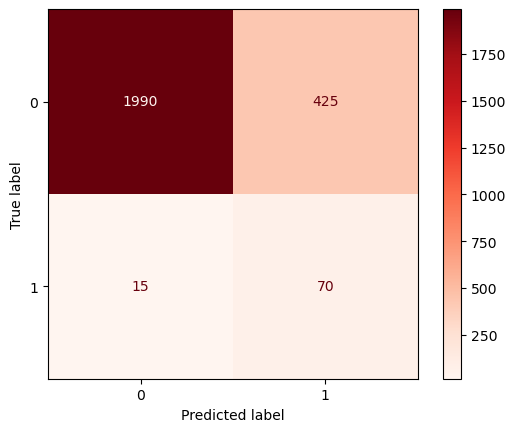

In [22]:
fig = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, test_pred))
fig.plot(cmap="Reds")
plt.show()

# SVM

## Determine Optimization Parameters for Momentum Stochastic Subgradient

In [23]:
# Drop intercept
X = X[:, :-1]
y_svm = y.copy()
y_svm[y_svm == 0 ] = -1
y = y_svm.reshape(-1,1)
# Set large C for strict model
C = 1e18

splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

opt_candidates={
    "lr":  [0.1, 1, 5, 10],
    "batch_size": [16, 64, 256, 512, 1024],
    "momentum": [0, 0.5, 0.9],
    "max_epoch": [40],
}

results = {}
for params in product(*opt_candidates.values()):
    lr, batch_size, momentum, max_epoch = params
    param_key = "_".join(str(x) for x in params)
    
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        w0, w = MomentumSubGradient(
            X=X_train,
            y=y_train,
            C=C,
            lr=lr,
            moment=momentum,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
        
        loss = HingeLossl2(C, w, w0, X_val, y_val)
        cv_results.append(loss)
        
    results[param_key] = np.mean(cv_results)
    
best_params = min(results, key=lambda key: results[key])
print(f"BEST: {best_params}")
results

Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([4981, 6612]))
Train Balanced Acc: 0.7711489415350483
Loss: 6591.40329629295
==================== EPOCH: 1 ====================
(array([False,  True]), array([7405, 4188]))
Train Balanced Acc: 0.7854859632662619
Loss: 6138.856252494016
==================== EPOCH: 2 ====================
(array([False,  True]), array([4196, 7397]))
Train Balanced Acc: 0.7858933811103599
Loss: 5836.2280711861295
==================== EPOCH: 3 ====================
(array([False,  True]), array([5665, 5928]))
Train Balanced Acc: 0.8235994725145785
Loss: 5166.8993154234195
==================== EPOCH: 4 ====================
(array([False,  True]), array([5832, 5761]))
Train Balanced Acc: 0.8226518666457616
Loss: 5111.408223091743
==================== EPOCH: 5 ====================
(array([False,  True]), array([6167, 5426]))
Train Balanced Acc: 0.8203253675986949
Loss: 5116.846931805196
==========

(array([False,  True]), array([5896, 5697]))
Train Balanced Acc: 0.8258424433141865
Loss: 4965.004218961223
==================== EPOCH: 12 ====================
(array([False,  True]), array([6012, 5581]))
Train Balanced Acc: 0.8249789907037659
Loss: 4963.855688182403
==================== EPOCH: 13 ====================
(array([False,  True]), array([5770, 5823]))
Train Balanced Acc: 0.8239456839304211
Loss: 4968.1990303802395
==================== EPOCH: 14 ====================
(array([False,  True]), array([5714, 5879]))
Train Balanced Acc: 0.8246361722044422
Loss: 4969.8637967986215
==================== EPOCH: 15 ====================
(array([False,  True]), array([5855, 5738]))
Train Balanced Acc: 0.8223061314287285
Loss: 4957.970362597108
==================== EPOCH: 16 ====================
(array([False,  True]), array([5675, 5918]))
Train Balanced Acc: 0.824032649738037
Loss: 4973.243893746443
==================== EPOCH: 17 ====================
(array([False,  True]), array([5909, 56

(array([False,  True]), array([6058, 5536]))
Train Balanced Acc: 0.8262032085561497
Loss: 4981.489020246434
==================== EPOCH: 24 ====================
(array([False,  True]), array([5918, 5676]))
Train Balanced Acc: 0.8232706572365016
Loss: 4973.27903575382
==================== EPOCH: 25 ====================
(array([False,  True]), array([6102, 5492]))
Train Balanced Acc: 0.8251681904433328
Loss: 4983.075697519897
==================== EPOCH: 26 ====================
(array([False,  True]), array([5928, 5666]))
Train Balanced Acc: 0.8241331723305159
Loss: 4971.713355017191
==================== EPOCH: 27 ====================
(array([False,  True]), array([5953, 5641]))
Train Balanced Acc: 0.8224943936518889
Loss: 4971.99660434591
==================== EPOCH: 28 ====================
(array([False,  True]), array([5941, 5653]))
Train Balanced Acc: 0.821459375539072
Loss: 4971.8879568889715
==================== EPOCH: 29 ====================
(array([False,  True]), array([5974, 5620]

(array([False,  True]), array([5913, 5681]))
Train Balanced Acc: 0.8221493876142832
Loss: 4988.3943117901745
==================== EPOCH: 39 ====================
(array([False,  True]), array([6070, 5524]))
Train Balanced Acc: 0.8201656028980507
Loss: 4993.136754974197
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False,  True]), array([4130, 7464]))
Train Balanced Acc: 0.7408142142487494
Loss: 6945.161110514368
==================== EPOCH: 1 ====================
(array([False,  True]), array([9766, 1828]))
Train Balanced Acc: 0.6471450750388132
Loss: 8491.816808834315
==================== EPOCH: 2 ====================
(array([False,  True]), array([4547, 7047]))
Train Balanced Acc: 0.8048990857340004
Loss: 5556.778395529625
==================== EPOCH: 3 ====================
(array([False,  True]), array([5479, 6115]))
Train Balanced Acc: 0.822321890633086
Loss: 5170.915784802044
==================== EPOCH: 4 ====================
(array([Fal

(array([False,  True]), array([5961, 5632]))
Train Balanced Acc: 0.8244642644341514
Loss: 4967.345813386577
==================== EPOCH: 11 ====================
(array([False,  True]), array([5767, 5826]))
Train Balanced Acc: 0.819632319756072
Loss: 4967.037865070374
==================== EPOCH: 12 ====================
(array([False,  True]), array([5922, 5671]))
Train Balanced Acc: 0.8261028943006503
Loss: 4965.520299731946
==================== EPOCH: 13 ====================
(array([False,  True]), array([5579, 6014]))
Train Balanced Acc: 0.8154904913216934
Loss: 4986.028688801014
==================== EPOCH: 14 ====================
(array([False,  True]), array([6013, 5580]))
Train Balanced Acc: 0.8244646513456843
Loss: 4974.123112836608
==================== EPOCH: 15 ====================
(array([False,  True]), array([5453, 6140]))
Train Balanced Acc: 0.8211826445058027
Loss: 4995.736938309126
==================== EPOCH: 16 ====================
(array([False,  True]), array([5800, 5793

(array([False,  True]), array([5511, 6082]))
Train Balanced Acc: 0.8290368890979402
Loss: 4912.0069608824615
==================== EPOCH: 23 ====================
(array([False,  True]), array([5560, 6033]))
Train Balanced Acc: 0.8305029266583595
Loss: 4900.540430434116
==================== EPOCH: 24 ====================
(array([False,  True]), array([5819, 5774]))
Train Balanced Acc: 0.8257567572908716
Loss: 4887.958054356566
==================== EPOCH: 25 ====================
(array([False,  True]), array([6191, 5402]))
Train Balanced Acc: 0.829204347385603
Loss: 4936.247565463108
==================== EPOCH: 26 ====================
(array([False,  True]), array([5889, 5704]))
Train Balanced Acc: 0.8262737901484705
Loss: 4887.595478756187
==================== EPOCH: 27 ====================
(array([False,  True]), array([6194, 5399]))
Train Balanced Acc: 0.8294631019138073
Loss: 4940.621885429419
==================== EPOCH: 28 ====================
(array([False,  True]), array([5743, 585

(array([False,  True]), array([5820, 5774]))
Train Balanced Acc: 0.8243056753493185
Loss: 4924.697760361946
==================== EPOCH: 35 ====================
(array([False,  True]), array([6202, 5392]))
Train Balanced Acc: 0.8277557357253752
Loss: 4976.972345208036
==================== EPOCH: 36 ====================
(array([False,  True]), array([5812, 5782]))
Train Balanced Acc: 0.8236156632741073
Loss: 4923.7783066489155
==================== EPOCH: 37 ====================
(array([False,  True]), array([5693, 5901]))
Train Balanced Acc: 0.8247369328963257
Loss: 4925.9384131354755
==================== EPOCH: 38 ====================
(array([False,  True]), array([5863, 5731]))
Train Balanced Acc: 0.8252544419527341
Loss: 4925.575283423179
==================== EPOCH: 39 ====================
(array([False,  True]), array([5878, 5716]))
Train Balanced Acc: 0.8265482145937554
Loss: 4927.011214559194
Starting, Loss: 19015.587538175823
==================== EPOCH: 0 ====================
(arr

(array([False,  True]), array([5760, 5834]))
Train Balanced Acc: 0.8220631361048818
Loss: 4925.608860846391
==================== EPOCH: 6 ====================
(array([False,  True]), array([5302, 6292]))
Train Balanced Acc: 0.8234431602553045
Loss: 4995.837771706878
==================== EPOCH: 7 ====================
(array([False,  True]), array([5904, 5690]))
Train Balanced Acc: 0.8186130757288252
Loss: 4929.7310500024
==================== EPOCH: 8 ====================
(array([False,  True]), array([5997, 5597]))
Train Balanced Acc: 0.8235294117647058
Loss: 4931.952525576022
==================== EPOCH: 9 ====================
(array([False,  True]), array([5533, 6061]))
Train Balanced Acc: 0.8231844057271003
Loss: 4936.600024327872
==================== EPOCH: 10 ====================
(array([False,  True]), array([6239, 5355]))
Train Balanced Acc: 0.8195618423322408
Loss: 4947.8716546679525
==================== EPOCH: 11 ====================
(array([False,  True]), array([5306, 6288]))


(array([False,  True]), array([4965, 6628]))
Train Balanced Acc: 0.8096203141888316
Loss: 5180.144036650414
==================== EPOCH: 18 ====================
(array([False,  True]), array([5295, 6298]))
Train Balanced Acc: 0.8104853590890222
Loss: 5086.564059530976
==================== EPOCH: 19 ====================
(array([False,  True]), array([6145, 5448]))
Train Balanced Acc: 0.8218778650054948
Loss: 4977.633395336091
==================== EPOCH: 20 ====================
(array([False,  True]), array([5526, 6067]))
Train Balanced Acc: 0.8169564991196869
Loss: 5014.319283059578
==================== EPOCH: 21 ====================
(array([False,  True]), array([6079, 5514]))
Train Balanced Acc: 0.8232575171255974
Loss: 4979.418944975887
==================== EPOCH: 22 ====================
(array([False,  True]), array([5729, 5864]))
Train Balanced Acc: 0.8210121802131537
Loss: 4955.870050906864
==================== EPOCH: 23 ====================
(array([False,  True]), array([5094, 649

(array([False,  True]), array([5862, 5731]))
Train Balanced Acc: 0.8323983764953982
Loss: 4886.642785043718
==================== EPOCH: 30 ====================
(array([False,  True]), array([6105, 5488]))
Train Balanced Acc: 0.8300675767778317
Loss: 4915.740591248978
==================== EPOCH: 31 ====================
(array([False,  True]), array([6131, 5462]))
Train Balanced Acc: 0.8278246506218621
Loss: 4909.112192787109
==================== EPOCH: 32 ====================
(array([False,  True]), array([5236, 6357]))
Train Balanced Acc: 0.8225695140141143
Loss: 4995.299678890183
==================== EPOCH: 33 ====================
(array([False,  True]), array([6258, 5335]))
Train Balanced Acc: 0.8284275183149038
Loss: 4964.276593683667
==================== EPOCH: 34 ====================
(array([False,  True]), array([5845, 5748]))
Train Balanced Acc: 0.8252390101350583
Loss: 4875.1257019493205
==================== EPOCH: 35 ====================
(array([False,  True]), array([5740, 58

(array([False,  True]), array([6319, 5275]))
Train Balanced Acc: 0.7986889770570985
Loss: 5416.5815079358
==================== EPOCH: 1 ====================
(array([False,  True]), array([9206, 2388]))
Train Balanced Acc: 0.6814731757805761
Loss: 9055.250893095403
==================== EPOCH: 2 ====================
(array([False,  True]), array([4755, 6839]))
Train Balanced Acc: 0.8097291702604796
Loss: 5290.381965127784
==================== EPOCH: 3 ====================
(array([False,  True]), array([5594, 6000]))
Train Balanced Acc: 0.8156805244091772
Loss: 5050.164066450216
==================== EPOCH: 4 ====================
(array([False,  True]), array([7096, 4498]))
Train Balanced Acc: 0.8068828704502329
Loss: 5657.749169319638
==================== EPOCH: 5 ====================
(array([False,  True]), array([6792, 4802]))
Train Balanced Acc: 0.8096429187510782
Loss: 5325.296407535682
==================== EPOCH: 6 ====================
(array([False,  True]), array([4780, 6814]))
Tra

(array([False,  True]), array([5520, 6074]))
Train Balanced Acc: 0.8212006210108678
Loss: 4941.49203983933
==================== EPOCH: 14 ====================
(array([False,  True]), array([4744, 6850]))
Train Balanced Acc: 0.8056753493186131
Loss: 5353.860806365993
==================== EPOCH: 15 ====================
(array([False,  True]), array([6029, 5565]))
Train Balanced Acc: 0.8271519751595653
Loss: 4924.349567999708
==================== EPOCH: 16 ====================
(array([False,  True]), array([6434, 5160]))
Train Balanced Acc: 0.8210281179920649
Loss: 5016.905336656007
==================== EPOCH: 17 ====================
(array([False,  True]), array([6586, 5008]))
Train Balanced Acc: 0.8222356391236847
Loss: 5157.235117732611
==================== EPOCH: 18 ====================
(array([False,  True]), array([5524, 6070]))
Train Balanced Acc: 0.8249956874245299
Loss: 4921.040758731635
==================== EPOCH: 19 ====================
(array([False,  True]), array([5924, 5670

(array([False,  True]), array([5642, 5951]))
Train Balanced Acc: 0.8190275770302171
Loss: 5526.142782268726
==================== EPOCH: 30 ====================
(array([False,  True]), array([5622, 5971]))
Train Balanced Acc: 0.8173022492179327
Loss: 5516.955411817671
==================== EPOCH: 31 ====================
(array([False,  True]), array([5637, 5956]))
Train Balanced Acc: 0.818596245077146
Loss: 5505.649191986039
==================== EPOCH: 32 ====================
(array([False,  True]), array([5615, 5978]))
Train Balanced Acc: 0.8166983844836332
Loss: 5496.150821474726
==================== EPOCH: 33 ====================
(array([False,  True]), array([5733, 5860]))
Train Balanced Acc: 0.8203221383755168
Loss: 5484.107804759722
==================== EPOCH: 34 ====================
(array([False,  True]), array([5715, 5878]))
Train Balanced Acc: 0.8187693433444609
Loss: 5472.72597199396
==================== EPOCH: 35 ====================
(array([False,  True]), array([5588, 6005]

(array([False,  True]), array([6350, 5244]))
Train Balanced Acc: 0.774452302915301
Loss: 6533.937139422131
==================== EPOCH: 6 ====================
(array([False,  True]), array([5486, 6108]))
Train Balanced Acc: 0.7810074176298085
Loss: 6391.3381941874795
==================== EPOCH: 7 ====================
(array([False,  True]), array([5485, 6109]))
Train Balanced Acc: 0.7762635846127308
Loss: 6283.435221652669
==================== EPOCH: 8 ====================
(array([False,  True]), array([5998, 5596]))
Train Balanced Acc: 0.7860100051750906
Loss: 6165.412532547614
==================== EPOCH: 9 ====================
(array([False,  True]), array([5666, 5928]))
Train Balanced Acc: 0.7944626530964292
Loss: 6082.068755296089
==================== EPOCH: 10 ====================
(array([False,  True]), array([5817, 5777]))
Train Balanced Acc: 0.7961014317750561
Loss: 6012.025457588154
==================== EPOCH: 11 ====================
(array([False,  True]), array([5464, 6130]))

(array([False,  True]), array([5618, 5976]))
Train Balanced Acc: 0.8124029670519235
Loss: 5677.486113528212
==================== EPOCH: 20 ====================
(array([False,  True]), array([5342, 6252]))
Train Balanced Acc: 0.8172330515784025
Loss: 5663.942205416368
==================== EPOCH: 21 ====================
(array([False,  True]), array([5545, 6049]))
Train Balanced Acc: 0.8124892185613248
Loss: 5634.0774266332455
==================== EPOCH: 22 ====================
(array([False,  True]), array([6139, 5455]))
Train Balanced Acc: 0.81524926686217
Loss: 5658.845142020569
==================== EPOCH: 23 ====================
(array([False,  True]), array([5677, 5917]))
Train Balanced Acc: 0.8161117819561843
Loss: 5589.522098991913
==================== EPOCH: 24 ====================
(array([False,  True]), array([5592, 6002]))
Train Balanced Acc: 0.8175780576160083
Loss: 5573.147841401896
==================== EPOCH: 25 ====================
(array([False,  True]), array([5655, 5939

(array([False,  True]), array([5702, 5892]))
Train Balanced Acc: 0.8237881662929101
Loss: 5371.330772102346
==================== EPOCH: 38 ====================
(array([False,  True]), array([5760, 5834]))
Train Balanced Acc: 0.8253406934621356
Loss: 5364.114853156764
==================== EPOCH: 39 ====================
(array([False,  True]), array([5847, 5747]))
Train Balanced Acc: 0.8233569087459031
Loss: 5361.04910666626
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([2690, 8903]))
Train Balanced Acc: 0.6528708746450682
Loss: 8434.878395660877
==================== EPOCH: 1 ====================
(array([False,  True]), array([11018,   575]))
Train Balanced Acc: 0.5490770642057665
Loss: 10993.31588898569
==================== EPOCH: 2 ====================
(array([False,  True]), array([3967, 7626]))
Train Balanced Acc: 0.774246718960439
Loss: 6395.45085336553
==================== EPOCH: 3 ====================
(array([Fa

Loss: 5093.043934614516
==================== EPOCH: 13 ====================
(array([False,  True]), array([5707, 5886]))
Train Balanced Acc: 0.8240324116386322
Loss: 5084.026741783348
==================== EPOCH: 14 ====================
(array([False,  True]), array([5137, 6456]))
Train Balanced Acc: 0.8190336336838275
Loss: 5205.9107186963
==================== EPOCH: 15 ====================
(array([False,  True]), array([5909, 5684]))
Train Balanced Acc: 0.8269637129364049
Loss: 5055.361609599742
==================== EPOCH: 16 ====================
(array([False,  True]), array([5561, 6032]))
Train Balanced Acc: 0.8267937843674169
Loss: 5077.056532186971
==================== EPOCH: 17 ====================
(array([False,  True]), array([5861, 5732]))
Train Balanced Acc: 0.8264465163854653
Loss: 5040.58631079859
==================== EPOCH: 18 ====================
(array([False,  True]), array([5882, 5711]))
Train Balanced Acc: 0.8246349221825668
Loss: 5036.177292242324
===================

(array([False,  True]), array([5949, 5645]))
Train Balanced Acc: 0.8221493876142832
Loss: 4993.931271308273
==================== EPOCH: 28 ====================
(array([False,  True]), array([5878, 5716]))
Train Balanced Acc: 0.8248231844057271
Loss: 4993.457410953467
==================== EPOCH: 29 ====================
(array([False,  True]), array([6052, 5542]))
Train Balanced Acc: 0.8236156632741073
Loss: 4993.956353386676
==================== EPOCH: 30 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8243056753493186
Loss: 4988.653368514117
==================== EPOCH: 31 ====================
(array([False,  True]), array([5973, 5621]))
Train Balanced Acc: 0.8242194238399172
Loss: 4986.598868580387
==================== EPOCH: 32 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8243056753493186
Loss: 4985.636275206489
==================== EPOCH: 33 ====================
(array([False,  True]), array([5775, 581

(array([False,  True]), array([7120, 4474]))
Train Balanced Acc: 0.7903225806451613
Loss: 6168.4685794185225
==================== EPOCH: 3 ====================
(array([False,  True]), array([5332, 6262]))
Train Balanced Acc: 0.8174055545972054
Loss: 5482.191368819482
==================== EPOCH: 4 ====================
(array([False,  True]), array([5522, 6072]))
Train Balanced Acc: 0.8222356391236847
Loss: 5325.667774139136
==================== EPOCH: 5 ====================
(array([False,  True]), array([6037, 5557]))
Train Balanced Acc: 0.8218043815766776
Loss: 5265.049638474304
==================== EPOCH: 6 ====================
(array([False,  True]), array([4653, 6941]))
Train Balanced Acc: 0.8048990857340004
Loss: 5535.017142451494
==================== EPOCH: 7 ====================
(array([False,  True]), array([5742, 5852]))
Train Balanced Acc: 0.8205106089356564
Loss: 5141.993688043171
==================== EPOCH: 8 ====================
(array([False,  True]), array([6121, 5473]))


Train Balanced Acc: 0.8249833806615425
Loss: 5000.705605659192
==================== EPOCH: 16 ====================
(array([False,  True]), array([5165, 6428]))
Train Balanced Acc: 0.815142375110612
Loss: 5099.854862590224
==================== EPOCH: 17 ====================
(array([False,  True]), array([4886, 6707]))
Train Balanced Acc: 0.8076357705307462
Loss: 5235.8208219181615
==================== EPOCH: 18 ====================
(array([False,  True]), array([6195, 5398]))
Train Balanced Acc: 0.8244660055360493
Loss: 5008.262805511049
==================== EPOCH: 19 ====================
(array([False,  True]), array([6041, 5552]))
Train Balanced Acc: 0.8217045732824133
Loss: 4964.8887305229
==================== EPOCH: 20 ====================
(array([False,  True]), array([5751, 5842]))
Train Balanced Acc: 0.8229100408066665
Loss: 4953.596222409774
==================== EPOCH: 21 ====================
(array([False,  True]), array([5919, 5674]))
Train Balanced Acc: 0.8251540235287451
Los

(array([False,  True]), array([6272, 5321]))
Train Balanced Acc: 0.8298075573465393
Loss: 4967.294969072394
==================== EPOCH: 34 ====================
(array([False,  True]), array([5293, 6300]))
Train Balanced Acc: 0.8274858500499949
Loss: 4967.833445459646
==================== EPOCH: 35 ====================
(array([False,  True]), array([5914, 5679]))
Train Balanced Acc: 0.8251522377832088
Loss: 4880.412931810723
==================== EPOCH: 36 ====================
(array([False,  True]), array([5842, 5751]))
Train Balanced Acc: 0.8265329167069948
Loss: 4873.5292132934
==================== EPOCH: 37 ====================
(array([False,  True]), array([5975, 5618]))
Train Balanced Acc: 0.8304135798566952
Loss: 4896.263787020005
==================== EPOCH: 38 ====================
(array([False,  True]), array([5322, 6271]))
Train Balanced Acc: 0.8270543395223702
Loss: 4939.98342041824
==================== EPOCH: 39 ====================
(array([False,  True]), array([6255, 5338])

(array([False,  True]), array([4612, 6982]))
Train Balanced Acc: 0.7999827496981198
Loss: 5445.381548992901
==================== EPOCH: 14 ====================
(array([False,  True]), array([6018, 5576]))
Train Balanced Acc: 0.8244781783681214
Loss: 4980.839382676722
==================== EPOCH: 15 ====================
(array([False,  True]), array([5465, 6129]))
Train Balanced Acc: 0.8264619630843539
Loss: 4955.33236498495
==================== EPOCH: 16 ====================
(array([False,  True]), array([6674, 4920]))
Train Balanced Acc: 0.8212006210108678
Loss: 5241.469030947874
==================== EPOCH: 17 ====================
(array([False,  True]), array([6607, 4987]))
Train Balanced Acc: 0.8228393996894945
Loss: 5202.37327898121
==================== EPOCH: 18 ====================
(array([False,  True]), array([5952, 5642]))
Train Balanced Acc: 0.8236156632741074
Loss: 4950.505531171147
==================== EPOCH: 19 ====================
(array([False,  True]), array([6228, 5366]

(array([False,  True]), array([5598, 5996]))
Train Balanced Acc: 0.8213731240296704
Loss: 4920.234154724906
==================== EPOCH: 34 ====================
(array([False,  True]), array([5889, 5705]))
Train Balanced Acc: 0.8261169570467484
Loss: 4909.683806205656
==================== EPOCH: 35 ====================
(array([False,  True]), array([6011, 5583]))
Train Balanced Acc: 0.8287045023287908
Loss: 4936.9443648589795
==================== EPOCH: 36 ====================
(array([False,  True]), array([5884, 5710]))
Train Balanced Acc: 0.8256856994997412
Loss: 4910.832702696196
==================== EPOCH: 37 ====================
(array([False,  True]), array([5809, 5785]))
Train Balanced Acc: 0.8242194238399172
Loss: 4903.445392155769
==================== EPOCH: 38 ====================
(array([False,  True]), array([6017, 5577]))
Train Balanced Acc: 0.8268069691219597
Loss: 4945.309682956231
==================== EPOCH: 39 ====================
(array([False,  True]), array([5860, 57

Loss: 7525.570825197612
==================== EPOCH: 21 ====================
(array([False,  True]), array([6150, 5443]))
Train Balanced Acc: 0.7464823193929704
Loss: 7499.321023282705
==================== EPOCH: 22 ====================
(array([False,  True]), array([5830, 5763]))
Train Balanced Acc: 0.7411366454865341
Loss: 7465.01985041938
==================== EPOCH: 23 ====================
(array([False,  True]), array([5359, 6234]))
Train Balanced Acc: 0.7391561941619693
Loss: 7472.549075181132
==================== EPOCH: 24 ====================
(array([False,  True]), array([5870, 5723]))
Train Balanced Acc: 0.7399287225621687
Loss: 7410.918221010929
==================== EPOCH: 25 ====================
(array([False,  True]), array([6412, 5181]))
Train Balanced Acc: 0.755451300754906
Loss: 7417.938050048921
==================== EPOCH: 26 ====================
(array([False,  True]), array([6255, 5338]))
Train Balanced Acc: 0.7555387278801189
Loss: 7372.0192575241135
=================

(array([False,  True]), array([6672, 4922]))
Train Balanced Acc: 0.7070036225633949
Loss: 8203.919965831315
==================== EPOCH: 9 ====================
(array([False,  True]), array([4266, 7328]))
Train Balanced Acc: 0.6961359323788167
Loss: 8233.62640562138
==================== EPOCH: 10 ====================
(array([False,  True]), array([6439, 5155]))
Train Balanced Acc: 0.7143350008625151
Loss: 7982.408558159194
==================== EPOCH: 11 ====================
(array([False,  True]), array([5071, 6523]))
Train Balanced Acc: 0.7222701397274452
Loss: 7937.153255991558
==================== EPOCH: 12 ====================
(array([False,  True]), array([7010, 4584]))
Train Balanced Acc: 0.7308090391581853
Loss: 7945.768480066171
==================== EPOCH: 13 ====================
(array([False,  True]), array([4401, 7193]))
Train Balanced Acc: 0.7110574435052613
Loss: 7967.878097659108
==================== EPOCH: 14 ====================
(array([False,  True]), array([5582, 6012]

(array([False,  True]), array([5964, 5630]))
Train Balanced Acc: 0.7528894255649474
Loss: 7161.5546014537085
==================== EPOCH: 37 ====================
(array([False,  True]), array([6015, 5579]))
Train Balanced Acc: 0.7524581680179403
Loss: 7145.487078380887
==================== EPOCH: 38 ====================
(array([False,  True]), array([6218, 5376]))
Train Balanced Acc: 0.7575470070726238
Loss: 7141.5998885696645
==================== EPOCH: 39 ====================
(array([False,  True]), array([6286, 5308]))
Train Balanced Acc: 0.7606520614110748
Loss: 7133.808788012724
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 22900.68670804361
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 37332.54129201766
==================== EPOCH: 2 ====================
(array([False,  True]), array([8760, 2833]))
Train Balanced 

Train Balanced Acc: 0.7799529795342848
Loss: 6553.55458101192
==================== EPOCH: 25 ====================
(array([False,  True]), array([6506, 5087]))
Train Balanced Acc: 0.7818458400402959
Loss: 6591.099691276244
==================== EPOCH: 26 ====================
(array([False,  True]), array([6202, 5391]))
Train Balanced Acc: 0.7809855124845637
Loss: 6511.107264651006
==================== EPOCH: 27 ====================
(array([False,  True]), array([6829, 4764]))
Train Balanced Acc: 0.7805495524743111
Loss: 6621.079845699483
==================== EPOCH: 28 ====================
(array([False,  True]), array([6211, 5382]))
Train Balanced Acc: 0.7864197593695985
Loss: 6462.362626784475
==================== EPOCH: 29 ====================
(array([False,  True]), array([5227, 6366]))
Train Balanced Acc: 0.777111114325453
Loss: 6477.908912584902
==================== EPOCH: 30 ====================
(array([False,  True]), array([5907, 5686]))
Train Balanced Acc: 0.7867670571139757
Los

(array([False,  True]), array([4418, 7176]))
Train Balanced Acc: 0.7190788338795928
Loss: 7558.066417585198
==================== EPOCH: 10 ====================
(array([False,  True]), array([7590, 4004]))
Train Balanced Acc: 0.747196825944454
Loss: 7536.543776283765
==================== EPOCH: 11 ====================
(array([False,  True]), array([5389, 6205]))
Train Balanced Acc: 0.7531481800931517
Loss: 7103.25756186135
==================== EPOCH: 12 ====================
(array([False,  True]), array([7714, 3880]))
Train Balanced Acc: 0.7470243229256512
Loss: 7483.107317164384
==================== EPOCH: 13 ====================
(array([False,  True]), array([4687, 6907]))
Train Balanced Acc: 0.7336553389684319
Loss: 7223.244761139556
==================== EPOCH: 14 ====================
(array([False,  True]), array([6236, 5358]))
Train Balanced Acc: 0.774452302915301
Loss: 6918.939869350419
==================== EPOCH: 15 ====================
(array([False,  True]), array([6164, 5430])

(array([False,  True]), array([6082, 5512]))
Train Balanced Acc: 0.7761773331033293
Loss: 6600.735141971757
==================== EPOCH: 22 ====================
(array([False,  True]), array([6036, 5558]))
Train Balanced Acc: 0.7747973089529067
Loss: 6557.934300677865
==================== EPOCH: 23 ====================
(array([False,  True]), array([5764, 5830]))
Train Balanced Acc: 0.7792823874417802
Loss: 6525.791078769067
==================== EPOCH: 24 ====================
(array([False,  True]), array([5645, 5949]))
Train Balanced Acc: 0.7797136449887874
Loss: 6497.04767360661
==================== EPOCH: 25 ====================
(array([False,  True]), array([5913, 5681]))
Train Balanced Acc: 0.7828186993272382
Loss: 6463.451716076712
==================== EPOCH: 26 ====================
(array([False,  True]), array([6488, 5106]))
Train Balanced Acc: 0.7787648783853718
Loss: 6493.191021336509
==================== EPOCH: 27 ====================
(array([False,  True]), array([5359, 6235

(array([False,  True]), array([  543, 11050]))
Train Balanced Acc: 0.5402788894043741
Loss: 11302.732646316977
==================== EPOCH: 8 ====================
(array([False,  True]), array([3364, 8229]))
Train Balanced Acc: 0.6954377505177769
Loss: 7513.611096081324
==================== EPOCH: 9 ====================
(array([False,  True]), array([7885, 3708]))
Train Balanced Acc: 0.7486258836910598
Loss: 6969.37436795325
==================== EPOCH: 10 ====================
(array([False,  True]), array([8284, 3309]))
Train Balanced Acc: 0.7333550807377225
Loss: 7151.393069398193
==================== EPOCH: 11 ====================
(array([False,  True]), array([2429, 9164]))
Train Balanced Acc: 0.6877676609340664
Loss: 7771.24838031707
==================== EPOCH: 12 ====================
(array([False,  True]), array([4222, 7371]))
Train Balanced Acc: 0.7822078701853472
Loss: 6181.409245499019
==================== EPOCH: 13 ====================
(array([False,  True]), array([5677, 5916

Train Balanced Acc: 0.8206831119544592
Loss: 5289.646777671554
==================== EPOCH: 31 ====================
(array([False,  True]), array([5354, 6240]))
Train Balanced Acc: 0.8212006210108677
Loss: 5177.3763565948275
==================== EPOCH: 32 ====================
(array([False,  True]), array([4991, 6603]))
Train Balanced Acc: 0.8154217698809729
Loss: 5290.078130243357
==================== EPOCH: 33 ====================
(array([False,  True]), array([5803, 5791]))
Train Balanced Acc: 0.8237019147835087
Loss: 5103.496119451328
==================== EPOCH: 34 ====================
(array([False,  True]), array([5993, 5601]))
Train Balanced Acc: 0.8231844057271003
Loss: 5093.6854169250555
==================== EPOCH: 35 ====================
(array([False,  True]), array([6362, 5232]))
Train Balanced Acc: 0.827928238744178
Loss: 5191.1654029976435
==================== EPOCH: 36 ====================
(array([False,  True]), array([5625, 5969]))
Train Balanced Acc: 0.8211143695014662

Loss: 5516.579783245072
==================== EPOCH: 16 ====================
(array([False,  True]), array([5074, 6520]))
Train Balanced Acc: 0.820855614973262
Loss: 5490.508596791651
==================== EPOCH: 17 ====================
(array([False,  True]), array([6137, 5457]))
Train Balanced Acc: 0.8271519751595653
Loss: 5410.9097489397245
==================== EPOCH: 18 ====================
(array([False,  True]), array([5687, 5907]))
Train Balanced Acc: 0.8255994479903399
Loss: 5296.101085862591
==================== EPOCH: 19 ====================
(array([False,  True]), array([4863, 6731]))
Train Balanced Acc: 0.8117992064861135
Loss: 5468.360342054026
==================== EPOCH: 20 ====================
(array([False,  True]), array([5628, 5966]))
Train Balanced Acc: 0.8246506813869243
Loss: 5244.998292510615
==================== EPOCH: 21 ====================
(array([False,  True]), array([6218, 5376]))
Train Balanced Acc: 0.8282732447817838
Loss: 5294.179387961807
================

(array([False,  True]), array([1717, 9876]))
Train Balanced Acc: 0.5972010611376175
Loss: 9750.081288287838
==================== EPOCH: 7 ====================
(array([False,  True]), array([ 1387, 10206]))
Train Balanced Acc: 0.5865074067367607
Loss: 9640.928262373238
==================== EPOCH: 8 ====================
(array([False,  True]), array([6474, 5119]))
Train Balanced Acc: 0.6802330350304939
Loss: 9153.278114328667
==================== EPOCH: 9 ====================
(array([False,  True]), array([7167, 4426]))
Train Balanced Acc: 0.6806591734402971
Loss: 9079.649674999246
==================== EPOCH: 10 ====================
(array([False,  True]), array([6317, 5276]))
Train Balanced Acc: 0.6830807485559569
Loss: 8902.403971105226
==================== EPOCH: 11 ====================
(array([False,  True]), array([5425, 6168]))
Train Balanced Acc: 0.7067223378790082
Loss: 8754.509383269926
==================== EPOCH: 12 ====================
(array([False,  True]), array([5346, 6247

(array([False,  True]), array([6439, 5155]))
Train Balanced Acc: 0.7148525099189236
Loss: 8007.994283183453
==================== EPOCH: 31 ====================
(array([False,  True]), array([6200, 5394]))
Train Balanced Acc: 0.715973779541142
Loss: 7972.74102643727
==================== EPOCH: 32 ====================
(array([False,  True]), array([5925, 5669]))
Train Balanced Acc: 0.7169225461445575
Loss: 7945.963751006127
==================== EPOCH: 33 ====================
(array([False,  True]), array([5518, 6076]))
Train Balanced Acc: 0.7180438157667759
Loss: 7939.726507106666
==================== EPOCH: 34 ====================
(array([False,  True]), array([5795, 5799]))
Train Balanced Acc: 0.7186475763325859
Loss: 7912.150296484019
==================== EPOCH: 35 ====================
(array([False,  True]), array([6524, 5070]))
Train Balanced Acc: 0.7173538036915645
Loss: 7925.891524670855
==================== EPOCH: 36 ====================
(array([False,  True]), array([6068, 5526]

(array([False,  True]), array([6033, 5561]))
Train Balanced Acc: 0.7041573227531481
Loss: 8520.112813730324
==================== EPOCH: 16 ====================
(array([False,  True]), array([5906, 5688]))
Train Balanced Acc: 0.7014835259617044
Loss: 8469.053524727013
==================== EPOCH: 17 ====================
(array([False,  True]), array([7044, 4550]))
Train Balanced Acc: 0.6944109021907884
Loss: 8504.318574999417
==================== EPOCH: 18 ====================
(array([False,  True]), array([6619, 4975]))
Train Balanced Acc: 0.6977747110574435
Loss: 8395.78071319935
==================== EPOCH: 19 ====================
(array([False,  True]), array([6002, 5592]))
Train Balanced Acc: 0.7061411074693807
Loss: 8310.028906066918
==================== EPOCH: 20 ====================
(array([False,  True]), array([5424, 6170]))
Train Balanced Acc: 0.705968604450578
Loss: 8271.092901301032
==================== EPOCH: 21 ====================
(array([False,  True]), array([5483, 6111]

Train Balanced Acc: 0.7416545414544755
Loss: 7331.087993253302
==================== EPOCH: 31 ====================
(array([False,  True]), array([5784, 5809]))
Train Balanced Acc: 0.73949788168912
Loss: 7311.437541836681
==================== EPOCH: 32 ====================
(array([False,  True]), array([6127, 5466]))
Train Balanced Acc: 0.7433820865674673
Loss: 7283.427971233499
==================== EPOCH: 33 ====================
(array([False,  True]), array([6561, 5032]))
Train Balanced Acc: 0.756669194091849
Loss: 7312.3807203032065
==================== EPOCH: 34 ====================
(array([False,  True]), array([5839, 5754]))
Train Balanced Acc: 0.7428623899727769
Loss: 7242.517799173283
==================== EPOCH: 35 ====================
(array([False,  True]), array([5375, 6218]))
Train Balanced Acc: 0.7440665628315162
Loss: 7254.341276942017
==================== EPOCH: 36 ====================
(array([False,  True]), array([6273, 5320]))
Train Balanced Acc: 0.7528716573968617
Los

Train Balanced Acc: 0.7172675521821632
Loss: 8134.292712664903
==================== EPOCH: 12 ====================
(array([False,  True]), array([6509, 5085]))
Train Balanced Acc: 0.7181300672761773
Loss: 8084.028202057456
==================== EPOCH: 13 ====================
(array([False,  True]), array([7063, 4531]))
Train Balanced Acc: 0.7170950491633603
Loss: 8092.651470966396
==================== EPOCH: 14 ====================
(array([False,  True]), array([7180, 4414]))
Train Balanced Acc: 0.7221838882180438
Loss: 8060.3968374999
==================== EPOCH: 15 ====================
(array([False,  True]), array([6637, 4957]))
Train Balanced Acc: 0.7243401759530792
Loss: 7893.714837840679
==================== EPOCH: 16 ====================
(array([False,  True]), array([4569, 7025]))
Train Balanced Acc: 0.7115749525616699
Loss: 7965.708634045657
==================== EPOCH: 17 ====================
(array([False,  True]), array([7002, 4592]))
Train Balanced Acc: 0.732016560289805
Loss

(array([False,  True]), array([6421, 5173]))
Train Balanced Acc: 0.753838192168363
Loss: 7467.660044822567
==================== EPOCH: 27 ====================
(array([False,  True]), array([5774, 5820]))
Train Balanced Acc: 0.7416767293427635
Loss: 7414.63262444763
==================== EPOCH: 28 ====================
(array([False,  True]), array([5041, 6553]))
Train Balanced Acc: 0.7402104536829395
Loss: 7467.093592474499
==================== EPOCH: 29 ====================
(array([False,  True]), array([5842, 5752]))
Train Balanced Acc: 0.7430567534931861
Loss: 7367.665064248364
==================== EPOCH: 30 ====================
(array([False,  True]), array([6536, 5058]))
Train Balanced Acc: 0.7611695704674832
Loss: 7401.8456004227755
==================== EPOCH: 31 ====================
(array([False,  True]), array([6182, 5412]))
Train Balanced Acc: 0.753234431602553
Loss: 7323.75088866765
==================== EPOCH: 32 ====================
(array([False,  True]), array([6075, 5519])

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 31273.34206185528
==================== EPOCH: 5 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 47025.09443909096
==================== EPOCH: 6 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 24517.86492900732
==================== EPOCH: 7 ====================
(array([False,  True]), array([4824, 6769]))
Train Balanced Acc: 0.6829048675018479
Loss: 8498.46367994204
==================== EPOCH: 8 ====================
(array([False,  True]), array([4545, 7048]))
Train Balanced Acc: 0.6924775350235296
Loss: 8256.282874838154
==================== EPOCH: 9 ====================
(array([False,  True]), array([7647, 3946]))
Train Balanced Acc: 0.7268316778876964
Loss: 8158.561678420228
==================== EPOCH: 10 ====================
(array([False,  True]), array([5742, 5851]))
Train Balanced Acc: 0.7477784283844016
Loss: 7490.166884827516
===================

(array([False,  True]), array([7072, 4521]))
Train Balanced Acc: 0.7809790391569948
Loss: 6676.020748553363
==================== EPOCH: 26 ====================
(array([False,  True]), array([6844, 4749]))
Train Balanced Acc: 0.7818433251153324
Loss: 6503.613964220827
==================== EPOCH: 27 ====================
(array([False,  True]), array([7520, 4073]))
Train Balanced Acc: 0.7645865052638421
Loss: 6756.758962587719
==================== EPOCH: 28 ====================
(array([False,  True]), array([5596, 5997]))
Train Balanced Acc: 0.7922036849930588
Loss: 6259.126804060643
==================== EPOCH: 29 ====================
(array([False,  True]), array([5698, 5895]))
Train Balanced Acc: 0.7920304081511903
Loss: 6202.109349810392
==================== EPOCH: 30 ====================
(array([False,  True]), array([6518, 5075]))
Train Balanced Acc: 0.7935769679540821
Loss: 6241.609972177237
==================== EPOCH: 31 ====================
(array([False,  True]), array([5116, 647

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 128685.66546877942
==================== EPOCH: 4 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 40750.269247683325
==================== EPOCH: 5 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 65223.045436922075
==================== EPOCH: 6 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 30171.641317887203
==================== EPOCH: 7 ====================
(array([False,  True]), array([4833, 6761]))
Train Balanced Acc: 0.6424012420217353
Loss: 9219.378298121774
==================== EPOCH: 8 ====================
(array([False,  True]), array([10522,  1072]))
Train Balanced Acc: 0.5897015697774711
Loss: 10582.026013293365
==================== EPOCH: 9 ====================
(array([False,  True]), array([3371, 8223]))
Train Balanced Acc: 0.6534414352251164
Loss: 8719.359107974877
==================== EPOCH: 10 ========

(array([False,  True]), array([3895, 7699]))
Train Balanced Acc: 0.7086424012420217
Loss: 7501.78483413447
==================== EPOCH: 20 ====================
(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.7857512506468863
Loss: 6791.0750129665585
==================== EPOCH: 21 ====================
(array([False,  True]), array([3090, 8504]))
Train Balanced Acc: 0.6543902018285319
Loss: 8082.505269106565
==================== EPOCH: 22 ====================
(array([False,  True]), array([5553, 6041]))
Train Balanced Acc: 0.7785061238571676
Loss: 6660.328761052627
==================== EPOCH: 23 ====================
(array([False,  True]), array([7310, 4284]))
Train Balanced Acc: 0.7651371398999482
Loss: 6889.933654209672
==================== EPOCH: 24 ====================
(array([False,  True]), array([6262, 5332]))
Train Balanced Acc: 0.7763498361221322
Loss: 6535.675130924651
==================== EPOCH: 25 ====================
(array([False,  True]), array([5680, 591

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 175059.54915228166
==================== EPOCH: 2 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 31392.159470019462
==================== EPOCH: 3 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 45564.270555876086
==================== EPOCH: 4 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 14427.363875032815
==================== EPOCH: 5 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 30278.842753551435
==================== EPOCH: 6 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 12976.480260375603
==================== EPOCH: 7 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 22168.650221759788
==================== EPOCH: 8 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 12712.

(array([False,  True]), array([6139, 5455]))
Train Balanced Acc: 0.6858720027600482
Loss: 8980.09147865653
==================== EPOCH: 26 ====================
(array([False,  True]), array([5622, 5972]))
Train Balanced Acc: 0.7020010350181127
Loss: 8937.039909439682
==================== EPOCH: 27 ====================
(array([False,  True]), array([4270, 7324]))
Train Balanced Acc: 0.6794031395549422
Loss: 8937.81508382383
==================== EPOCH: 28 ====================
(array([False,  True]), array([5046, 6548]))
Train Balanced Acc: 0.6980334655856477
Loss: 8879.090269764965
==================== EPOCH: 29 ====================
(array([False,  True]), array([5245, 6349]))
Train Balanced Acc: 0.7029498016215284
Loss: 8844.19652462743
==================== EPOCH: 30 ====================
(array([False,  True]), array([6532, 5062]))
Train Balanced Acc: 0.6814731757805761
Loss: 8835.999178693703
==================== EPOCH: 31 ====================
(array([False,  True]), array([5539, 6055])

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 14998.493353236781
==================== EPOCH: 10 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 13437.390072625847
==================== EPOCH: 11 ====================
(array([False,  True]), array([    5, 11589]))
Train Balanced Acc: 0.5004312575470071
Loss: 12254.474937450674
==================== EPOCH: 12 ====================
(array([False,  True]), array([11497,    97]))
Train Balanced Acc: 0.5068138692427118
Loss: 10631.140014043653
==================== EPOCH: 13 ====================
(array([False,  True]), array([  571, 11023]))
Train Balanced Acc: 0.5426944971537002
Loss: 10141.616732289272
==================== EPOCH: 14 ====================
(array([False,  True]), array([10974,   620]))
Train Balanced Acc: 0.537260652061411
Loss: 10070.868391531916
==================== EPOCH: 15 ====================
(array([False,  True]), array([ 1441, 10153]))
Train Balanced Acc: 0.583232706572

Train Balanced Acc: 0.706121523793333
Loss: 8080.545883157125
==================== EPOCH: 37 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.7111184564777502
Loss: 8029.426611607192
==================== EPOCH: 38 ====================
(array([False,  True]), array([7273, 4320]))
Train Balanced Acc: 0.7078519260991829
Loss: 8168.296284202239
==================== EPOCH: 39 ====================
(array([False,  True]), array([6220, 5373]))
Train Balanced Acc: 0.7096555290908066
Loss: 7997.780879685307
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 334193.4910548298
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 86332.18011917139
==================== EPOCH: 2 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 39740.83247117313
==================== EPOCH:

==================== EPOCH: 28 ====================
(array([False,  True]), array([4876, 6718]))
Train Balanced Acc: 0.6968259444540279
Loss: 8362.489622560091
==================== EPOCH: 29 ====================
(array([False,  True]), array([4417, 7177]))
Train Balanced Acc: 0.6900120752113162
Loss: 8397.561943470813
==================== EPOCH: 30 ====================
(array([False,  True]), array([6728, 4866]))
Train Balanced Acc: 0.700793513886493
Loss: 8293.691308857397
==================== EPOCH: 31 ====================
(array([False,  True]), array([6329, 5265]))
Train Balanced Acc: 0.708297395204416
Loss: 8238.608693845137
==================== EPOCH: 32 ====================
(array([False,  True]), array([6076, 5518]))
Train Balanced Acc: 0.7128687252026911
Loss: 8199.237200096733
==================== EPOCH: 33 ====================
(array([False,  True]), array([4791, 6803]))
Train Balanced Acc: 0.698292220113852
Loss: 8251.039918173023
==================== EPOCH: 34 ============

(array([False,  True]), array([4698, 6896]))
Train Balanced Acc: 0.6854407452130413
Loss: 8717.410867878354
==================== EPOCH: 20 ====================
(array([False,  True]), array([4731, 6863]))
Train Balanced Acc: 0.685181990684837
Loss: 8655.95180581359
==================== EPOCH: 21 ====================
(array([False,  True]), array([3818, 7776]))
Train Balanced Acc: 0.6676729342763499
Loss: 8728.012665386561
==================== EPOCH: 22 ====================
(array([False,  True]), array([5534, 6060]))
Train Balanced Acc: 0.7004485078488873
Loss: 8509.93129035447
==================== EPOCH: 23 ====================
(array([False,  True]), array([7156, 4438]))
Train Balanced Acc: 0.686648266344661
Loss: 8539.31875387708
==================== EPOCH: 24 ====================
(array([False,  True]), array([5240, 6354]))
Train Balanced Acc: 0.6978609625668448
Loss: 8415.742735963247
==================== EPOCH: 25 ====================
(array([False,  True]), array([7637, 3957]))


Train Balanced Acc: 0.5
Loss: 40736.30723384331
==================== EPOCH: 8 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 82173.34494420959
==================== EPOCH: 9 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 57382.035187559566
==================== EPOCH: 10 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 74391.38485082547
==================== EPOCH: 11 ====================
(array([False,  True]), array([10544,  1049]))
Train Balanced Acc: 0.5763469759530315
Loss: 12530.875637911586
==================== EPOCH: 12 ====================
(array([False,  True]), array([3762, 7831]))
Train Balanced Acc: 0.6395389895513648
Loss: 9134.088039851416
==================== EPOCH: 13 ====================
(array([False,  True]), array([  779, 10814]))
Train Balanced Acc: 0.5287184341202161
Loss: 12553.809413845229
==================== EPOCH: 14 ====================
(array([False,  

(array([False,  True]), array([6060, 5534]))
Train Balanced Acc: 0.7559944799033983
Loss: 7391.0933684036545
Starting, Loss: 19015.587538175823
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 280167.27474083053
==================== EPOCH: 1 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 38175.40289253994
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 135915.79614476976
==================== EPOCH: 3 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 301427.24183035234
==================== EPOCH: 4 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 198236.809627443
==================== EPOCH: 5 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 187591.14725460054
==================== EPOCH: 6 ====================
(array([Fa

(array([False,  True]), array([7285, 4309]))
Train Balanced Acc: 0.752803174055546
Loss: 7602.735594358759
==================== EPOCH: 31 ====================
(array([False,  True]), array([4980, 6614]))
Train Balanced Acc: 0.7415042263239606
Loss: 7403.865562172605
==================== EPOCH: 32 ====================
(array([False,  True]), array([6217, 5377]))
Train Balanced Acc: 0.7579782646196309
Loss: 7258.082722041111
==================== EPOCH: 33 ====================
(array([False,  True]), array([4225, 7369]))
Train Balanced Acc: 0.7079523891668105
Loss: 7673.852775056868
==================== EPOCH: 34 ====================
(array([False,  True]), array([7104, 4490]))
Train Balanced Acc: 0.7608245644298774
Loss: 7362.825541381211
==================== EPOCH: 35 ====================
(array([False,  True]), array([6852, 4742]))
Train Balanced Acc: 0.7692772123512162
Loss: 7277.248383122665
==================== EPOCH: 36 ====================
(array([False,  True]), array([6931, 4663

(array([False,  True]), array([2435, 9158]))
Train Balanced Acc: 0.6894927952905843
Loss: 9887.557686509885
==================== EPOCH: 3 ====================
(array([False,  True]), array([3470, 8123]))
Train Balanced Acc: 0.7483999571182972
Loss: 7322.872069213549
==================== EPOCH: 4 ====================
(array([False,  True]), array([7704, 3889]))
Train Balanced Acc: 0.7776964965934523
Loss: 6139.287763422607
==================== EPOCH: 5 ====================
(array([False,  True]), array([5192, 6401]))
Train Balanced Acc: 0.8249850920010148
Loss: 5058.517509585839
==================== EPOCH: 6 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.8359358044718164
Loss: 4903.315812834917
==================== EPOCH: 7 ====================
(array([False,  True]), array([6213, 5380]))
Train Balanced Acc: 0.8276515225921215
Loss: 4965.2120799961185
==================== EPOCH: 8 ====================
(array([False,  True]), array([6114, 5479]))


Train Balanced Acc: 0.820855614973262
Loss: 5121.229854978035
==================== EPOCH: 15 ====================
(array([False,  True]), array([5868, 5726]))
Train Balanced Acc: 0.8248231844057271
Loss: 4946.853913775704
==================== EPOCH: 16 ====================
(array([False,  True]), array([5606, 5988]))
Train Balanced Acc: 0.8253406934621356
Loss: 4942.72648449806
==================== EPOCH: 17 ====================
(array([False,  True]), array([5354, 6240]))
Train Balanced Acc: 0.8253406934621356
Loss: 4983.516912665056
==================== EPOCH: 18 ====================
(array([False,  True]), array([5926, 5668]))
Train Balanced Acc: 0.8227531481800932
Loss: 4929.39987486785
==================== EPOCH: 19 ====================
(array([False,  True]), array([6753, 4841]))
Train Balanced Acc: 0.8149042608245645
Loss: 5196.14552802602
==================== EPOCH: 20 ====================
(array([False,  True]), array([5863, 5731]))
Train Balanced Acc: 0.8271519751595653
Loss:

(array([False,  True]), array([5818, 5776]))
Train Balanced Acc: 0.8232706572365016
Loss: 4946.397819284239
==================== EPOCH: 27 ====================
(array([False,  True]), array([5250, 6344]))
Train Balanced Acc: 0.8249956874245299
Loss: 5030.630708596817
==================== EPOCH: 28 ====================
(array([False,  True]), array([5615, 5979]))
Train Balanced Acc: 0.8235294117647058
Loss: 4954.54758488822
==================== EPOCH: 29 ====================
(array([False,  True]), array([6328, 5266]))
Train Balanced Acc: 0.8232706572365016
Loss: 5036.147288861153
==================== EPOCH: 30 ====================
(array([False,  True]), array([5522, 6072]))
Train Balanced Acc: 0.819993099879248
Loss: 4980.043679331083
==================== EPOCH: 31 ====================
(array([False,  True]), array([5983, 5611]))
Train Balanced Acc: 0.8243919268587201
Loss: 4957.314126895617
==================== EPOCH: 32 ====================
(array([False,  True]), array([5949, 5645]

Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([5545, 6048]))
Train Balanced Acc: 0.7984109662395282
Loss: 6103.734697310778
==================== EPOCH: 1 ====================
(array([False,  True]), array([6337, 5256]))
Train Balanced Acc: 0.7585652242961871
Loss: 7102.578482405732
==================== EPOCH: 2 ====================
(array([False,  True]), array([  850, 10743]))
Train Balanced Acc: 0.5683234129216309
Loss: 16996.482157919487
==================== EPOCH: 3 ====================
(array([False,  True]), array([4712, 6881]))
Train Balanced Acc: 0.8005612419645916
Loss: 5741.508492380841
==================== EPOCH: 4 ====================
(array([False,  True]), array([6820, 4773]))
Train Balanced Acc: 0.7976441224626193
Loss: 5649.454615426891
==================== EPOCH: 5 ====================
(array([False,  True]), array([4843, 6750]))
Train Balanced Acc: 0.8082392632347257
Loss: 5425.680899702587
========

(array([False,  True]), array([5481, 6112]))
Train Balanced Acc: 0.8255867543158195
Loss: 4924.846838866313
==================== EPOCH: 14 ====================
(array([False,  True]), array([6169, 5424]))
Train Balanced Acc: 0.8288594752789127
Loss: 5009.230643786874
==================== EPOCH: 15 ====================
(array([False,  True]), array([6117, 5476]))
Train Balanced Acc: 0.8235118072899609
Loss: 4986.0249657978
==================== EPOCH: 16 ====================
(array([False,  True]), array([4470, 7123]))
Train Balanced Acc: 0.8023906192167887
Loss: 5527.57678977687
==================== EPOCH: 17 ====================
(array([False,  True]), array([6475, 5118]))
Train Balanced Acc: 0.8229915898528224
Loss: 5053.656831957553
==================== EPOCH: 18 ====================
(array([False,  True]), array([5702, 5891]))
Train Balanced Acc: 0.822738564591547
Loss: 4946.911409722707
==================== EPOCH: 19 ====================
(array([False,  True]), array([6054, 5539]))

(array([False,  True]), array([6175, 5419]))
Train Balanced Acc: 0.825426944971537
Loss: 4977.852573421311
==================== EPOCH: 27 ====================
(array([False,  True]), array([5185, 6409]))
Train Balanced Acc: 0.8199068483698464
Loss: 5060.8481823706825
==================== EPOCH: 28 ====================
(array([False,  True]), array([4547, 7047]))
Train Balanced Acc: 0.8097291702604796
Loss: 5412.076629703833
==================== EPOCH: 29 ====================
(array([False,  True]), array([6746, 4848]))
Train Balanced Acc: 0.8155080213903743
Loss: 5175.457411588299
==================== EPOCH: 30 ====================
(array([False,  True]), array([4812, 6782]))
Train Balanced Acc: 0.8124029670519234
Loss: 5264.623228818562
==================== EPOCH: 31 ====================
(array([False,  True]), array([7408, 4186]))
Train Balanced Acc: 0.7898050715887528
Loss: 5645.969140714549
==================== EPOCH: 32 ====================
(array([False,  True]), array([6066, 552

(array([False,  True]), array([5254, 6340]))
Train Balanced Acc: 0.8198205968604451
Loss: 5033.597062332882
==================== EPOCH: 39 ====================
(array([False,  True]), array([6220, 5374]))
Train Balanced Acc: 0.8215456270484733
Loss: 4994.266025474908
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False,  True]), array([10144,  1450]))
Train Balanced Acc: 0.6176470588235294
Loss: 14366.869795919807
==================== EPOCH: 1 ====================
(array([False,  True]), array([11089,   505]))
Train Balanced Acc: 0.5416594790408832
Loss: 29903.906137042955
==================== EPOCH: 2 ====================
(array([False,  True]), array([7110, 4484]))
Train Balanced Acc: 0.7965326893220631
Loss: 6241.450654060791
==================== EPOCH: 3 ====================
(array([False,  True]), array([4143, 7451]))
Train Balanced Acc: 0.7854062446092807
Loss: 6344.263931992921
==================== EPOCH: 4 ====================
(arra

(array([False,  True]), array([6493, 5100]))
Train Balanced Acc: 0.8087690939353344
Loss: 5566.526296594424
==================== EPOCH: 10 ====================
(array([False,  True]), array([6550, 5043]))
Train Balanced Acc: 0.8085107411998758
Loss: 5279.397878239633
==================== EPOCH: 11 ====================
(array([False,  True]), array([8895, 2698]))
Train Balanced Acc: 0.707173923162703
Loss: 8929.80472532288
==================== EPOCH: 12 ====================
(array([False,  True]), array([4160, 7433]))
Train Balanced Acc: 0.7679512516469038
Loss: 6380.468635574078
==================== EPOCH: 13 ====================
(array([False,  True]), array([5262, 6331]))
Train Balanced Acc: 0.8216125181000191
Loss: 5281.92779667544
==================== EPOCH: 14 ====================
(array([False,  True]), array([4881, 6712]))
Train Balanced Acc: 0.8158303335784567
Loss: 5233.010021466018
==================== EPOCH: 15 ====================
(array([False,  True]), array([3078, 8515])

(array([False,  True]), array([7285, 4308]))
Train Balanced Acc: 0.7857216965582612
Loss: 6068.787480268597
==================== EPOCH: 22 ====================
(array([False,  True]), array([4711, 6882]))
Train Balanced Acc: 0.8111009799814354
Loss: 5456.045956494964
==================== EPOCH: 23 ====================
(array([False,  True]), array([4023, 7570]))
Train Balanced Acc: 0.7657338914145283
Loss: 6258.3424723597145
==================== EPOCH: 24 ====================
(array([False,  True]), array([6444, 5149]))
Train Balanced Acc: 0.8253208121618318
Loss: 5256.168080387291
==================== EPOCH: 25 ====================
(array([False,  True]), array([4618, 6975]))
Train Balanced Acc: 0.8035971433071507
Loss: 5571.695241802925
==================== EPOCH: 26 ====================
(array([False,  True]), array([5353, 6240]))
Train Balanced Acc: 0.8290380647137515
Loss: 5023.034678265452
==================== EPOCH: 27 ====================
(array([False,  True]), array([5445, 61

(array([False,  True]), array([3414, 8180]))
Train Balanced Acc: 0.7413317233051578
Loss: 7342.048801074981
==================== EPOCH: 37 ====================
(array([False,  True]), array([4856, 6738]))
Train Balanced Acc: 0.8072278764878386
Loss: 5376.391491550351
==================== EPOCH: 38 ====================
(array([False,  True]), array([6765, 4829]))
Train Balanced Acc: 0.7997239951699154
Loss: 5529.989612527347
==================== EPOCH: 39 ====================
(array([False,  True]), array([7118, 4476]))
Train Balanced Acc: 0.8075728825254442
Loss: 5570.786785464974
Starting, Loss: 19015.587538175823
==================== EPOCH: 0 ====================
(array([False,  True]), array([10336,  1258]))
Train Balanced Acc: 0.5974642056235985
Loss: 28564.355682907895
==================== EPOCH: 1 ====================
(array([False,  True]), array([10278,  1316]))
Train Balanced Acc: 0.6097119199585993
Loss: 37822.971339285185
==================== EPOCH: 2 ====================
(a

Train Balanced Acc: 0.8132654821459375
Loss: 5230.593450665602
==================== EPOCH: 10 ====================
(array([False,  True]), array([5627, 5967]))
Train Balanced Acc: 0.8088666551664654
Loss: 5386.231656276905
==================== EPOCH: 11 ====================
(array([False,  True]), array([2984, 8610]))
Train Balanced Acc: 0.7114887010522684
Loss: 8298.779072372472
==================== EPOCH: 12 ====================
(array([False,  True]), array([  946, 10648]))
Train Balanced Acc: 0.5729687769535967
Loss: 15565.945620832332
==================== EPOCH: 13 ====================
(array([False,  True]), array([4095, 7499]))
Train Balanced Acc: 0.7885112989477316
Loss: 6108.414325553857
==================== EPOCH: 14 ====================
(array([False,  True]), array([4861, 6733]))
Train Balanced Acc: 0.8071416249784371
Loss: 5399.378730947659
==================== EPOCH: 15 ====================
(array([False,  True]), array([5253, 6341]))
Train Balanced Acc: 0.810764188373296

(array([False,  True]), array([6544, 5049]))
Train Balanced Acc: 0.8243823433576754
Loss: 5171.758780110416
==================== EPOCH: 26 ====================
(array([False,  True]), array([6164, 5429]))
Train Balanced Acc: 0.8235169264271649
Loss: 5000.416855016938
==================== EPOCH: 27 ====================
(array([False,  True]), array([6078, 5515]))
Train Balanced Acc: 0.8248964297351393
Loss: 4978.675475026108
==================== EPOCH: 28 ====================
(array([False,  True]), array([5451, 6142]))
Train Balanced Acc: 0.8235978802248087
Loss: 4992.451803813304
==================== EPOCH: 29 ====================
(array([False,  True]), array([6316, 5277]))
Train Balanced Acc: 0.8250707184994786
Loss: 5043.485092010229
==================== EPOCH: 30 ====================
(array([False,  True]), array([5282, 6311]))
Train Balanced Acc: 0.8191974163119283
Loss: 5044.368473161254
==================== EPOCH: 31 ====================
(array([False,  True]), array([4813, 678

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 144105.38839595247
==================== EPOCH: 2 ====================
(array([False,  True]), array([  380, 11214]))
Train Balanced Acc: 0.47308952906675866
Loss: 36481.22097905997
==================== EPOCH: 3 ====================
(array([False,  True]), array([5346, 6248]))
Train Balanced Acc: 0.7218388821804382
Loss: 9839.903878621655
==================== EPOCH: 4 ====================
(array([False,  True]), array([8536, 3058]))
Train Balanced Acc: 0.7126962221838882
Loss: 11313.956965717087
==================== EPOCH: 5 ====================
(array([False,  True]), array([ 1536, 10058]))
Train Balanced Acc: 0.5477833362083836
Loss: 15295.160188746286
==================== EPOCH: 6 ====================
(array([False,  True]), array([3384, 8210]))
Train Balanced Acc: 0.6768155942728997
Loss: 9150.116171789774
==================== EPOCH: 7 ====================
(array([False,  True]), array([3158, 8436]))
Train Balanced Acc: 

(array([False,  True]), array([7011, 4583]))
Train Balanced Acc: 0.8019665344143523
Loss: 5445.257628744757
==================== EPOCH: 20 ====================
(array([False,  True]), array([5573, 6021]))
Train Balanced Acc: 0.8252544419527341
Loss: 4997.483718300384
==================== EPOCH: 21 ====================
(array([False,  True]), array([5112, 6482]))
Train Balanced Acc: 0.8229256511988959
Loss: 5061.684543452487
==================== EPOCH: 22 ====================
(array([False,  True]), array([7064, 4530]))
Train Balanced Acc: 0.8010177678109367
Loss: 5438.482586195418
==================== EPOCH: 23 ====================
(array([False,  True]), array([5785, 5809]))
Train Balanced Acc: 0.8228393996894945
Loss: 4969.597000921706
==================== EPOCH: 24 ====================
(array([False,  True]), array([5556, 6038]))
Train Balanced Acc: 0.8220631361048818
Loss: 4986.29262017499
==================== EPOCH: 25 ====================
(array([False,  True]), array([5942, 5652

(array([False,  True]), array([6091, 5503]))
Train Balanced Acc: 0.8252544419527341
Loss: 4936.484251423728
==================== EPOCH: 39 ====================
(array([False,  True]), array([5969, 5625]))
Train Balanced Acc: 0.8250819389339314
Loss: 4912.954344956185
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([  233, 11360]))
Train Balanced Acc: 0.48818425751022076
Loss: 39881.29131563137
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 56077.67781913286
==================== EPOCH: 2 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 50634.51033048486
==================== EPOCH: 3 ====================
(array([False,  True]), array([   32, 11561]))
Train Balanced Acc: 0.5027605244996549
Loss: 28431.662339074064
==================== EPOCH: 4 ====================
(array([False,  True]), array([ 1080, 10513]))
Train Balan

Train Balanced Acc: 0.8186885830025835
Loss: 5137.9781822801015
==================== EPOCH: 16 ====================
(array([False,  True]), array([4604, 6989]))
Train Balanced Acc: 0.8068750875759374
Loss: 5493.141042680025
==================== EPOCH: 17 ====================
(array([False,  True]), array([6305, 5288]))
Train Balanced Acc: 0.8286859454564264
Loss: 5041.349103081204
==================== EPOCH: 18 ====================
(array([False,  True]), array([5417, 6176]))
Train Balanced Acc: 0.8228269441143792
Loss: 4999.609733798904
==================== EPOCH: 19 ====================
(array([False,  True]), array([4773, 6820]))
Train Balanced Acc: 0.818863824164542
Loss: 5279.457031237183
==================== EPOCH: 20 ====================
(array([False,  True]), array([4871, 6722]))
Train Balanced Acc: 0.8133425221846144
Loss: 5235.143077172994
==================== EPOCH: 21 ====================
(array([False,  True]), array([6203, 5390]))
Train Balanced Acc: 0.83023936549842
Los

(array([False,  True]), array([5205, 6389]))
Train Balanced Acc: 0.8169742970501983
Loss: 5051.837837495052
==================== EPOCH: 29 ====================
(array([False,  True]), array([6454, 5140]))
Train Balanced Acc: 0.8237881662929101
Loss: 5090.680044940028
==================== EPOCH: 30 ====================
(array([False,  True]), array([4813, 6781]))
Train Balanced Acc: 0.8078316370536485
Loss: 5283.850099939735
==================== EPOCH: 31 ====================
(array([False,  True]), array([7116, 4478]))
Train Balanced Acc: 0.8065378644126272
Loss: 5559.5286723128975
==================== EPOCH: 32 ====================
(array([False,  True]), array([5784, 5810]))
Train Balanced Acc: 0.8212006210108677
Loss: 4923.544689879502
==================== EPOCH: 33 ====================
(array([False,  True]), array([6038, 5556]))
Train Balanced Acc: 0.827065723650164
Loss: 4962.569151079336
==================== EPOCH: 34 ====================
(array([False,  True]), array([5987, 560

(array([False,  True]), array([10571,  1023]))
Train Balanced Acc: 0.5837502156287735
Loss: 15172.961451802716
==================== EPOCH: 5 ====================
(array([False,  True]), array([1840, 9754]))
Train Balanced Acc: 0.6431775056063481
Loss: 12321.977064963283
==================== EPOCH: 6 ====================
(array([False,  True]), array([7815, 3779]))
Train Balanced Acc: 0.7733310332930826
Loss: 6700.005945663308
==================== EPOCH: 7 ====================
(array([False,  True]), array([4615, 6979]))
Train Balanced Acc: 0.8119717095049164
Loss: 5599.268254886778
==================== EPOCH: 8 ====================
(array([False,  True]), array([6026, 5568]))
Train Balanced Acc: 0.8210281179920649
Loss: 5071.105632886614
==================== EPOCH: 9 ====================
(array([False,  True]), array([4829, 6765]))
Train Balanced Acc: 0.8145592547869588
Loss: 5426.533307706217
==================== EPOCH: 10 ====================
(array([False,  True]), array([5750, 5844

(array([False,  True]), array([9930, 1663]))
Train Balanced Acc: 0.6344653293337396
Loss: 10936.849552099697
==================== EPOCH: 21 ====================
(array([False,  True]), array([4122, 7471]))
Train Balanced Acc: 0.7810623293050486
Loss: 6139.198618543736
==================== EPOCH: 22 ====================
(array([False,  True]), array([2016, 9577]))
Train Balanced Acc: 0.6526933417763382
Loss: 11247.553555513712
==================== EPOCH: 23 ====================
(array([False,  True]), array([2408, 9185]))
Train Balanced Acc: 0.6808166761965954
Loss: 9651.891959258035
==================== EPOCH: 24 ====================
(array([False,  True]), array([6700, 4893]))
Train Balanced Acc: 0.8114446615911017
Loss: 5218.530846602351
==================== EPOCH: 25 ====================
(array([False,  True]), array([5057, 6536]))
Train Balanced Acc: 0.8149690536251051
Loss: 5141.503024865407
==================== EPOCH: 26 ====================
(array([False,  True]), array([4039, 7

(array([False,  True]), array([4159, 7434]))
Train Balanced Acc: 0.7755663997929487
Loss: 6131.339487247815
==================== EPOCH: 36 ====================
(array([False,  True]), array([7408, 4185]))
Train Balanced Acc: 0.7904650236141038
Loss: 5639.440237693694
==================== EPOCH: 37 ====================
(array([False,  True]), array([7024, 4569]))
Train Balanced Acc: 0.8092723319086655
Loss: 5447.522541109047
==================== EPOCH: 38 ====================
(array([False,  True]), array([6319, 5274]))
Train Balanced Acc: 0.8247179295875773
Loss: 5009.478431535461
==================== EPOCH: 39 ====================
(array([False,  True]), array([5016, 6577]))
Train Balanced Acc: 0.8168780602470067
Loss: 5131.465277940983
Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([False,  True]), array([3273, 8321]))
Train Balanced Acc: 0.6844919786096257
Loss: 21787.88303705516
==================== EPOCH: 1 ====================
(array(

(array([False,  True]), array([3079, 8515]))
Train Balanced Acc: 0.7195100914265999
Loss: 8772.291175729788
==================== EPOCH: 13 ====================
(array([False,  True]), array([5274, 6320]))
Train Balanced Acc: 0.8151630153527687
Loss: 5236.019212599956
==================== EPOCH: 14 ====================
(array([False,  True]), array([5147, 6447]))
Train Balanced Acc: 0.8216318785578748
Loss: 5166.876313544621
==================== EPOCH: 15 ====================
(array([False,  True]), array([7549, 4045]))
Train Balanced Acc: 0.7859237536656891
Loss: 6037.212625167429
==================== EPOCH: 16 ====================
(array([False,  True]), array([10390,  1204]))
Train Balanced Acc: 0.5988442297740211
Loss: 12416.583957308201
==================== EPOCH: 17 ====================
(array([False,  True]), array([3447, 8147]))
Train Balanced Acc: 0.7393479385889252
Loss: 7308.120684646332
==================== EPOCH: 18 ====================
(array([False,  True]), array([1751, 

(array([False,  True]), array([5528, 6066]))
Train Balanced Acc: 0.8322408142142488
Loss: 4943.609742485349
==================== EPOCH: 31 ====================
(array([False,  True]), array([8700, 2894]))
Train Balanced Acc: 0.7277039848197344
Loss: 8254.754847502518
==================== EPOCH: 32 ====================
(array([False,  True]), array([5763, 5831]))
Train Balanced Acc: 0.822321890633086
Loss: 4922.425551117231
==================== EPOCH: 33 ====================
(array([False,  True]), array([6539, 5055]))
Train Balanced Acc: 0.818354321200621
Loss: 5182.469087192676
==================== EPOCH: 34 ====================
(array([False,  True]), array([5769, 5825]))
Train Balanced Acc: 0.8219768845954805
Loss: 4916.065061208664
==================== EPOCH: 35 ====================
(array([False,  True]), array([7548, 4046]))
Train Balanced Acc: 0.7894600655511471
Loss: 5904.4239268908395
==================== EPOCH: 36 ====================
(array([False,  True]), array([3161, 8433

Train Balanced Acc: 0.6423619407387249
Loss: 13382.825391400369
==================== EPOCH: 11 ====================
(array([False,  True]), array([2018, 9575]))
Train Balanced Acc: 0.5515678369609563
Loss: 19033.24829770543
==================== EPOCH: 12 ====================
(array([False,  True]), array([7954, 3639]))
Train Balanced Acc: 0.6572771422309415
Loss: 13812.34203281024
==================== EPOCH: 13 ====================
(array([False,  True]), array([ 1214, 10379]))
Train Balanced Acc: 0.5350121008070022
Loss: 22413.366485669085
==================== EPOCH: 14 ====================
(array([False,  True]), array([7594, 3999]))
Train Balanced Acc: 0.6467562289482923
Loss: 13051.611368787384
==================== EPOCH: 15 ====================
(array([False,  True]), array([4409, 7184]))
Train Balanced Acc: 0.630304467828187
Loss: 12488.70303291933
==================== EPOCH: 16 ====================
(array([False,  True]), array([6089, 5504]))
Train Balanced Acc: 0.65358188411154

(array([False,  True]), array([7817, 3777]))
Train Balanced Acc: 0.7038123167155426
Loss: 10224.079369922
==================== EPOCH: 24 ====================
(array([False,  True]), array([3309, 8285]))
Train Balanced Acc: 0.6413662239089184
Loss: 11275.335708412847
==================== EPOCH: 25 ====================
(array([False,  True]), array([7053, 4541]))
Train Balanced Acc: 0.7115749525616699
Loss: 9246.09077033918
==================== EPOCH: 26 ====================
(array([False,  True]), array([7151, 4443]))
Train Balanced Acc: 0.7250301880282906
Loss: 9047.621962323465
==================== EPOCH: 27 ====================
(array([False,  True]), array([3792, 7802]))
Train Balanced Acc: 0.6766430912540969
Loss: 9925.64351040263
==================== EPOCH: 28 ====================
(array([False,  True]), array([6739, 4855]))
Train Balanced Acc: 0.722442642746248
Loss: 8708.132905813556
==================== EPOCH: 29 ====================
(array([False,  True]), array([7332, 4262]))

(array([False,  True]), array([  420, 11174]))
Train Balanced Acc: 0.5056925996204934
Loss: 28346.2908340118
==================== EPOCH: 9 ====================
(array([False,  True]), array([4647, 6947]))
Train Balanced Acc: 0.6120407107124375
Loss: 13044.79256386762
==================== EPOCH: 10 ====================
(array([False,  True]), array([9069, 2525]))
Train Balanced Acc: 0.663964119372089
Loss: 15877.536118045282
==================== EPOCH: 11 ====================
(array([False,  True]), array([ 1037, 10557]))
Train Balanced Acc: 0.5200966016905296
Loss: 23184.62064971352
==================== EPOCH: 12 ====================
(array([False,  True]), array([7270, 4324]))
Train Balanced Acc: 0.6521476625840952
Loss: 12563.82311679331
==================== EPOCH: 13 ====================
(array([False,  True]), array([ 1365, 10229]))
Train Balanced Acc: 0.5411419699844747
Loss: 20652.09213282722
==================== EPOCH: 14 ====================
(array([False,  True]), array([7783,

Train Balanced Acc: 0.72071368391804
Loss: 7613.515326722573
==================== EPOCH: 30 ====================
(array([False,  True]), array([8533, 3060]))
Train Balanced Acc: 0.7195925184643113
Loss: 7590.670156583384
==================== EPOCH: 31 ====================
(array([False,  True]), array([1926, 9667]))
Train Balanced Acc: 0.6494148320214651
Loss: 9132.15939554997
==================== EPOCH: 32 ====================
(array([False,  True]), array([4633, 6960]))
Train Balanced Acc: 0.7861554095053807
Loss: 5953.233008373571
==================== EPOCH: 33 ====================
(array([False,  True]), array([3010, 8583]))
Train Balanced Acc: 0.7165323607448845
Loss: 7194.395261816271
==================== EPOCH: 34 ====================
(array([False,  True]), array([3290, 8303]))
Train Balanced Acc: 0.7406869501168651
Loss: 6777.289883770729
==================== EPOCH: 35 ====================
(array([False,  True]), array([3929, 7664]))
Train Balanced Acc: 0.7747639899174426
Loss

(array([False,  True]), array([1677, 9917]))
Train Balanced Acc: 0.5985854752458168
Loss: 13861.938909894881
==================== EPOCH: 16 ====================
(array([False,  True]), array([2945, 8649]))
Train Balanced Acc: 0.6763843367258927
Loss: 9602.49778994571
==================== EPOCH: 17 ====================
(array([False,  True]), array([2524, 9070]))
Train Balanced Acc: 0.6695704674831809
Loss: 9923.802006731461
==================== EPOCH: 18 ====================
(array([False,  True]), array([10677,   917]))
Train Balanced Acc: 0.5752975677074349
Loss: 14331.508484001286
==================== EPOCH: 19 ====================
(array([False,  True]), array([  934, 10660]))
Train Balanced Acc: 0.5729687769535967
Loss: 13984.258594127206
==================== EPOCH: 20 ====================
(array([False,  True]), array([  412, 11182]))
Train Balanced Acc: 0.5355356218733828
Loss: 16817.078680851733
==================== EPOCH: 21 ====================
(array([False,  True]), array([

(array([False,  True]), array([10121,  1473]))
Train Balanced Acc: 0.6161807831637054
Loss: 10252.393920874374
==================== EPOCH: 33 ====================
(array([False,  True]), array([8508, 3086]))
Train Balanced Acc: 0.7120062101086768
Loss: 7800.113545727267
==================== EPOCH: 34 ====================
(array([False,  True]), array([3136, 8458]))
Train Balanced Acc: 0.6738830429532517
Loss: 7924.58259111591
==================== EPOCH: 35 ====================
(array([False,  True]), array([4090, 7504]))
Train Balanced Acc: 0.7346041055718475
Loss: 6911.006349569942
==================== EPOCH: 36 ====================
(array([False,  True]), array([5311, 6283]))
Train Balanced Acc: 0.7767810936691393
Loss: 6373.019169838304
==================== EPOCH: 37 ====================
(array([False,  True]), array([4011, 7583]))
Train Balanced Acc: 0.7384854234949112
Loss: 6807.57539710174
==================== EPOCH: 38 ====================
(array([False,  True]), array([9288, 23

(array([False,  True]), array([7875, 3718]))
Train Balanced Acc: 0.7625445796491914
Loss: 9587.485289499122
==================== EPOCH: 10 ====================
(array([False,  True]), array([8273, 3320]))
Train Balanced Acc: 0.7506438059094606
Loss: 10779.569044800272
==================== EPOCH: 11 ====================
(array([False,  True]), array([5908, 5685]))
Train Balanced Acc: 0.8233425037319105
Loss: 6430.278270980436
==================== EPOCH: 12 ====================
(array([False,  True]), array([5277, 6316]))
Train Balanced Acc: 0.8210088170590605
Loss: 6254.800189606888
==================== EPOCH: 13 ====================
(array([False,  True]), array([6764, 4829]))
Train Balanced Acc: 0.8040268680892392
Loss: 6554.0874410324195
==================== EPOCH: 14 ====================
(array([False,  True]), array([7627, 3966]))
Train Balanced Acc: 0.7816922212805391
Loss: 7701.955298435934
==================== EPOCH: 15 ====================
(array([False,  True]), array([4886, 6

(array([False,  True]), array([8148, 3445]))
Train Balanced Acc: 0.7556109017622095
Loss: 7816.4916407113615
==================== EPOCH: 38 ====================
(array([False,  True]), array([6941, 4652]))
Train Balanced Acc: 0.8100492800290672
Loss: 5804.94388443493
==================== EPOCH: 39 ====================
(array([False,  True]), array([4537, 7056]))
Train Balanced Acc: 0.8081694703466834
Loss: 5974.328299620689
Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 345717.01720191457
==================== EPOCH: 1 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 719546.7156064194
==================== EPOCH: 2 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 986441.6665900615
==================== EPOCH: 3 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 271801.55800330837
=======

(array([False,  True]), array([4907, 6687]))
Train Balanced Acc: 0.8166292910125927
Loss: 5689.726431524136
==================== EPOCH: 24 ====================
(array([False,  True]), array([ 1375, 10219]))
Train Balanced Acc: 0.6058306020355356
Loss: 14818.161808965267
==================== EPOCH: 25 ====================
(array([False,  True]), array([5780, 5814]))
Train Balanced Acc: 0.8272382266689667
Loss: 5247.367329192797
==================== EPOCH: 26 ====================
(array([False,  True]), array([6925, 4669]))
Train Balanced Acc: 0.8054165947904088
Loss: 5768.83689949661
==================== EPOCH: 27 ====================
(array([False,  True]), array([7035, 4559]))
Train Balanced Acc: 0.799206486113507
Loss: 5785.327135472675
==================== EPOCH: 28 ====================
(array([False,  True]), array([10163,  1431]))
Train Balanced Acc: 0.6172158012765223
Loss: 14113.55861601729
==================== EPOCH: 29 ====================
(array([False,  True]), array([6133, 

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 105460.50231654108
==================== EPOCH: 8 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 20554.463984971262
==================== EPOCH: 9 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 91407.15111621747
==================== EPOCH: 10 ====================
(array([False,  True]), array([8781, 2812]))
Train Balanced Acc: 0.6623184209295091
Loss: 11742.02652501906
==================== EPOCH: 11 ====================
(array([False,  True]), array([   81, 11512]))
Train Balanced Acc: 0.49335866353851665
Loss: 27400.23998685942
==================== EPOCH: 12 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 50680.92275304485
==================== EPOCH: 13 ====================
(array([False,  True]), array([   32, 11561]))
Train Balanced Acc: 0.49723995169915475
Loss: 29327.052959683846
==================== EPOCH: 14 ==

(array([False,  True]), array([9418, 2175]))
Train Balanced Acc: 0.6548509985829514
Loss: 13336.20189891138
==================== EPOCH: 23 ====================
(array([False,  True]), array([  328, 11265]))
Train Balanced Acc: 0.4980998625809285
Loss: 22218.43658049673
==================== EPOCH: 24 ====================
(array([False,  True]), array([6881, 4712]))
Train Balanced Acc: 0.6527134016511955
Loss: 10127.90071803442
==================== EPOCH: 25 ====================
(array([False,  True]), array([9125, 2468]))
Train Balanced Acc: 0.6633928147314007
Loss: 12457.754927317506
==================== EPOCH: 26 ====================
(array([False,  True]), array([2156, 9437]))
Train Balanced Acc: 0.5600201872580389
Loss: 13654.537094443865
==================== EPOCH: 27 ====================
(array([False,  True]), array([7845, 3748]))
Train Balanced Acc: 0.6613321239074065
Loss: 10484.893630881616
==================== EPOCH: 28 ====================
(array([False,  True]), array([ 113

Starting, Loss: 19015.587538175823
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 355956.56205018784
==================== EPOCH: 1 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 617024.8949519186
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 134484.12709461752
==================== EPOCH: 3 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 194471.67684569463
==================== EPOCH: 4 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 53751.397795596815
==================== EPOCH: 5 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 146073.32668773495
==================== EPOCH: 6 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 21377.15322482951
==================== EPOCH: 7 ======

(array([False,  True]), array([  351, 11243]))
Train Balanced Acc: 0.49974124547179577
Loss: 23665.612950889863
==================== EPOCH: 22 ====================
(array([False,  True]), array([6798, 4796]))
Train Balanced Acc: 0.6345523546662066
Loss: 11286.297739858746
==================== EPOCH: 23 ====================
(array([False,  True]), array([ 1497, 10097]))
Train Balanced Acc: 0.5447645333793342
Loss: 17060.457216955005
==================== EPOCH: 24 ====================
(array([False,  True]), array([4943, 6651]))
Train Balanced Acc: 0.5989304812834224
Loss: 11486.334134524466
==================== EPOCH: 25 ====================
(array([False,  True]), array([4941, 6653]))
Train Balanced Acc: 0.5987579782646196
Loss: 11463.404071350942
==================== EPOCH: 26 ====================
(array([False,  True]), array([6035, 5559]))
Train Balanced Acc: 0.6267034673106779
Loss: 11112.063748479792
==================== EPOCH: 27 ====================
(array([False,  True]), array

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 96960.96687424142
==================== EPOCH: 3 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 140285.68018990994
==================== EPOCH: 4 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 229343.43905064778
==================== EPOCH: 5 ====================
(array([False,  True]), array([   80, 11513]))
Train Balanced Acc: 0.49327120665087826
Loss: 40347.846543216256
==================== EPOCH: 6 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 58705.360828789744
==================== EPOCH: 7 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 49918.595713560826
==================== EPOCH: 8 ====================
(array([False,  True]), array([  446, 11147]))
Train Balanced Acc: 0.5031020036898265
Loss: 27674.006671416337
==================== EPOCH: 9 ====================
(array([ Tr

(array([False,  True]), array([10273,  1321]))
Train Balanced Acc: 0.6068656201483525
Loss: 15283.453156398038
==================== EPOCH: 23 ====================
(array([False,  True]), array([6066, 5528]))
Train Balanced Acc: 0.7308090391581853
Loss: 8909.27773200319
==================== EPOCH: 24 ====================
(array([False,  True]), array([9288, 2306]))
Train Balanced Acc: 0.6721580127652234
Loss: 12530.048797314565
==================== EPOCH: 25 ====================
(array([False,  True]), array([4477, 7117]))
Train Balanced Acc: 0.7029498016215283
Loss: 9438.389483717929
==================== EPOCH: 26 ====================
(array([False,  True]), array([9232, 2362]))
Train Balanced Acc: 0.67560807314128
Loss: 12245.275174166392
==================== EPOCH: 27 ====================
(array([False,  True]), array([6500, 5094]))
Train Balanced Acc: 0.7346041055718475
Loss: 8611.322333945733
==================== EPOCH: 28 ====================
(array([False,  True]), array([ 1249, 

==================== EPOCH: 4 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 214202.22607645707
==================== EPOCH: 5 ====================
(array([False,  True]), array([11355,   239]))
Train Balanced Acc: 0.5204416077281353
Loss: 23127.491885942993
==================== EPOCH: 6 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 40608.63336766577
==================== EPOCH: 7 ====================
(array([False,  True]), array([11539,    55]))
Train Balanced Acc: 0.5047438330170778
Loss: 27606.241798319905
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 93086.30691450351
==================== EPOCH: 9 ====================
(array([False,  True]), array([ 1568, 10026]))
Train Balanced Acc: 0.5395031913058479
Loss: 18767.39977732894
==================== EPOCH: 10 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 923

(array([False,  True]), array([   43, 11550]))
Train Balanced Acc: 0.4966362208957704
Loss: 44601.70225514156
==================== EPOCH: 24 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 53969.68743763612
==================== EPOCH: 25 ====================
(array([False,  True]), array([3316, 8277]))
Train Balanced Acc: 0.6406267615635655
Loss: 13057.104849327083
==================== EPOCH: 26 ====================
(array([False,  True]), array([7392, 4201]))
Train Balanced Acc: 0.7131146074818213
Loss: 10857.292914112608
==================== EPOCH: 27 ====================
(array([False,  True]), array([9120, 2473]))
Train Balanced Acc: 0.658611808444743
Loss: 12836.301447539085
==================== EPOCH: 28 ====================
(array([False,  True]), array([10786,   807]))
Train Balanced Acc: 0.5620141804862537
Loss: 18159.893888802002
==================== EPOCH: 29 ====================
(array([False,  True]), array([6312, 5281]))
Train Balanced 

Loss: 4189307.4395389953
==================== EPOCH: 3 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 294471.1819977013
==================== EPOCH: 4 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 893746.2147127108
==================== EPOCH: 5 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 548891.6288846966
==================== EPOCH: 6 ====================
(array([False,  True]), array([10961,   633]))
Train Balanced Acc: 0.5544247024322926
Loss: 69980.3498787627
==================== EPOCH: 7 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 388411.3522806001
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 301043.38974815153
==================== EPOCH: 9 ====================
(array([False,  True]), array([   29, 11565]))
Train Balanced Acc: 0.497498706227359
Loss: 156910.78205

(array([False,  True]), array([  886, 10708]))
Train Balanced Acc: 0.539330688287045
Loss: 19085.734592348217
==================== EPOCH: 30 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 43303.853259877214
==================== EPOCH: 31 ====================
(array([False,  True]), array([11572,    22]))
Train Balanced Acc: 0.5018975332068312
Loss: 34615.01669973359
==================== EPOCH: 32 ====================
(array([False,  True]), array([9242, 2352]))
Train Balanced Acc: 0.6656028980507159
Loss: 12185.95692913606
==================== EPOCH: 33 ====================
(array([False,  True]), array([2942, 8652]))
Train Balanced Acc: 0.6566327410729688
Loss: 10640.736294444157
==================== EPOCH: 34 ====================
(array([False,  True]), array([4352, 7242]))
Train Balanced Acc: 0.7021735380369156
Loss: 8115.369078877309
==================== EPOCH: 35 ====================
(array([False,  True]), array([6598, 4996]))
Train Balanced A

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 65511.618406847745
==================== EPOCH: 11 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 125798.30018424944
==================== EPOCH: 12 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 49694.26581676278
==================== EPOCH: 13 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 113313.35205861967
==================== EPOCH: 14 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 38148.07287939103
==================== EPOCH: 15 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 104092.277931798
==================== EPOCH: 16 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 29340.345030430464
==================== EPOCH: 17 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 970

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 327014.4214710792
==================== EPOCH: 5 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 83778.54548445859
==================== EPOCH: 6 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 259877.2270179493
==================== EPOCH: 7 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 35792.28485731677
==================== EPOCH: 8 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 223897.58002148144
==================== EPOCH: 9 ====================
(array([False,  True]), array([8905, 2689]))
Train Balanced Acc: 0.6708642401242022
Loss: 9421.695797239074
==================== EPOCH: 10 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 48447.52203152897
==================== EPOCH: 11 ====================
(array([False]), array([11594]))
Train Balance

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 25563.13793161801
==================== EPOCH: 39 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 31875.267134647165
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 2030325.4760818463
==================== EPOCH: 1 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 18502.76045776612
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 996133.012938932
==================== EPOCH: 3 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 161269.20716933848
==================== EPOCH: 4 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 350145.2965603014
==================== EPOCH: 5 ====================
(array([False]), array([11594]))
Train 

Train Balanced Acc: 0.5
Loss: 167105.05004409474
==================== EPOCH: 25 ====================
(array([False,  True]), array([10544,  1049]))
Train Balanced Acc: 0.5820244562613179
Loss: 15314.982460535093
==================== EPOCH: 26 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 125980.64109447831
==================== EPOCH: 27 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 50072.107306666425
==================== EPOCH: 28 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 42250.339398558426
==================== EPOCH: 29 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 133044.14196735714
==================== EPOCH: 30 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 38573.798872012005
==================== EPOCH: 31 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 442

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 228031.5347258492
==================== EPOCH: 15 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 171994.6930980788
==================== EPOCH: 16 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 48555.16809566201
==================== EPOCH: 17 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 235219.15280139193
==================== EPOCH: 18 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 86030.1766512515
==================== EPOCH: 19 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 41968.69252230615
==================== EPOCH: 20 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 189197.3448681439
==================== EPOCH: 21 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 81915.

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 114883.811675642
==================== EPOCH: 7 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 689558.2501168286
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 194027.78338601856
==================== EPOCH: 9 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 207149.31047460024
==================== EPOCH: 10 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 33505.28679977823
==================== EPOCH: 11 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 151634.44967549143
==================== EPOCH: 12 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 102820.88549787719
==================== EPOCH: 13 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 80768.

Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2555815.3639771645
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 177454.7859787399
==================== EPOCH: 2 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1818483.606089475
==================== EPOCH: 3 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2672305.8928472917
==================== EPOCH: 4 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1687754.4085487493
==================== EPOCH: 5 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 598069.1756040747
==================== EPOCH: 6 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 897456.0127605604
==================== EPOCH: 7 ========

(array([False,  True]), array([  490, 11104]))
Train Balanced Acc: 0.46463688114542007
Loss: 45226.93452862467
==================== EPOCH: 33 ====================
(array([False,  True]), array([8014, 3580]))
Train Balanced Acc: 0.706831119544592
Loss: 15915.585289811268
==================== EPOCH: 34 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 64531.91220843
==================== EPOCH: 35 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 80958.41410782587
==================== EPOCH: 36 ====================
(array([False,  True]), array([6764, 4830]))
Train Balanced Acc: 0.735121614628256
Loss: 13412.721524585642
==================== EPOCH: 37 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 66415.81831133914
==================== EPOCH: 38 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 157463.06043123495
==================== EPOCH: 39 ========

(array([False,  True]), array([7948, 3646]))
Train Balanced Acc: 0.7247714335000862
Loss: 16624.195142343677
==================== EPOCH: 25 ====================
(array([False,  True]), array([  250, 11344]))
Train Balanced Acc: 0.479817146800069
Loss: 55332.79307799199
==================== EPOCH: 26 ====================
(array([False,  True]), array([  431, 11163]))
Train Balanced Acc: 0.46834569604968085
Loss: 45164.73574850756
==================== EPOCH: 27 ====================
(array([False,  True]), array([9499, 2095]))
Train Balanced Acc: 0.6620665861652579
Loss: 18976.06817649629
==================== EPOCH: 28 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 87049.40268560135
==================== EPOCH: 29 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 191569.46285919455
==================== EPOCH: 30 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 112415.73038473302
======

(array([False,  True]), array([4721, 6872]))
Train Balanced Acc: 0.8061681406805572
Loss: 5376.914826418613
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([False,  True]), array([5237, 6356]))
Train Balanced Acc: 0.7408822809161065
Loss: 18151.94984433639
==================== EPOCH: 1 ====================
(array([False,  True]), array([6435, 5158]))
Train Balanced Acc: 0.7708914816723578
Loss: 17757.178117279047
==================== EPOCH: 2 ====================
(array([False,  True]), array([3172, 8421]))
Train Balanced Acc: 0.729080169617254
Loss: 18224.500111491325
==================== EPOCH: 3 ====================
(array([False,  True]), array([3237, 8356]))
Train Balanced Acc: 0.736066660928471
Loss: 15862.72224274652
==================== EPOCH: 4 ====================
(array([False,  True]), array([7637, 3956]))
Train Balanced Acc: 0.7800259867642922
Loss: 10640.730549023378
==================== EPOCH: 5 ====================
(array([Fa

(array([False,  True]), array([3718, 7876]))
Train Balanced Acc: 0.760307055373469
Loss: 6944.740394431854
==================== EPOCH: 14 ====================
(array([False,  True]), array([5141, 6453]))
Train Balanced Acc: 0.8252544419527341
Loss: 5133.93339952158
==================== EPOCH: 15 ====================
(array([False,  True]), array([5657, 5937]))
Train Balanced Acc: 0.8211143695014662
Loss: 5047.930519667079
==================== EPOCH: 16 ====================
(array([False,  True]), array([4607, 6987]))
Train Balanced Acc: 0.8061066068656202
Loss: 5544.8032843838
==================== EPOCH: 17 ====================
(array([False,  True]), array([4645, 6949]))
Train Balanced Acc: 0.7966189408314646
Loss: 5651.659662970652
==================== EPOCH: 18 ====================
(array([False,  True]), array([6167, 5427]))
Train Balanced Acc: 0.8188718302570295
Loss: 5332.158987454704
==================== EPOCH: 19 ====================
(array([False,  True]), array([6220, 5374]))

(array([False,  True]), array([5040, 6554]))
Train Balanced Acc: 0.822925651198896
Loss: 5108.406191580494
==================== EPOCH: 28 ====================
(array([False,  True]), array([4469, 7125]))
Train Balanced Acc: 0.8007590132827325
Loss: 5571.943074519597
==================== EPOCH: 29 ====================
(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8224943936518889
Loss: 4996.469542567524
==================== EPOCH: 30 ====================
(array([False,  True]), array([4177, 7417]))
Train Balanced Acc: 0.7888563049853372
Loss: 5867.228194786472
==================== EPOCH: 31 ====================
(array([False,  True]), array([6025, 5569]))
Train Balanced Acc: 0.8224943936518889
Loss: 4990.766697202815
==================== EPOCH: 32 ====================
(array([False,  True]), array([5033, 6561]))
Train Balanced Acc: 0.8128342245989305
Loss: 5142.330492575031
==================== EPOCH: 33 ====================
(array([False,  True]), array([6485, 5109

(array([False,  True]), array([7557, 4036]))
Train Balanced Acc: 0.7532262469355118
Loss: 21536.308453222755
==================== EPOCH: 2 ====================
(array([False,  True]), array([  379, 11214]))
Train Balanced Acc: 0.5326949620427881
Loss: 45013.28753703929
==================== EPOCH: 3 ====================
(array([False,  True]), array([6011, 5582]))
Train Balanced Acc: 0.7487292783576094
Loss: 9310.28422694093
==================== EPOCH: 4 ====================
(array([False,  True]), array([6586, 5007]))
Train Balanced Acc: 0.7838409493594709
Loss: 7819.060969749702
==================== EPOCH: 5 ====================
(array([False,  True]), array([4932, 6661]))
Train Balanced Acc: 0.8007353967980153
Loss: 6833.562377512336
==================== EPOCH: 6 ====================
(array([False,  True]), array([4598, 6995]))
Train Balanced Acc: 0.802803126435665
Loss: 6178.4834015156175
==================== EPOCH: 7 ====================
(array([False,  True]), array([9544, 2049]))

(array([False,  True]), array([2850, 8743]))
Train Balanced Acc: 0.7101055964907957
Loss: 9207.778177154236
==================== EPOCH: 14 ====================
(array([False,  True]), array([4992, 6601]))
Train Balanced Acc: 0.8108401123210133
Loss: 5641.0592987880445
==================== EPOCH: 15 ====================
(array([False,  True]), array([5707, 5886]))
Train Balanced Acc: 0.804537888936866
Loss: 5747.270176414425
==================== EPOCH: 16 ====================
(array([False,  True]), array([3214, 8379]))
Train Balanced Acc: 0.7346004299122854
Loss: 8519.443935050827
==================== EPOCH: 17 ====================
(array([False,  True]), array([7774, 3819]))
Train Balanced Acc: 0.7752807251507854
Loss: 7017.716353098482
==================== EPOCH: 18 ====================
(array([False,  True]), array([6177, 5416]))
Train Balanced Acc: 0.7931482104508257
Loss: 6015.857439374034
==================== EPOCH: 19 ====================
(array([False,  True]), array([6864, 472

Train Balanced Acc: 0.8163705364843885
Loss: 5101.045935487491
==================== EPOCH: 27 ====================
(array([False,  True]), array([ 1147, 10447]))
Train Balanced Acc: 0.5937553907193376
Loss: 12871.417154388142
==================== EPOCH: 28 ====================
(array([False,  True]), array([2461, 9133]))
Train Balanced Acc: 0.6915646023805416
Loss: 9563.267344074648
==================== EPOCH: 29 ====================
(array([False,  True]), array([7307, 4287]))
Train Balanced Acc: 0.7945489046058306
Loss: 5596.140082877773
==================== EPOCH: 30 ====================
(array([False,  True]), array([3452, 8142]))
Train Balanced Acc: 0.7365016387786787
Loss: 7345.423625655812
==================== EPOCH: 31 ====================
(array([False,  True]), array([8934, 2660]))
Train Balanced Acc: 0.7113161980334656
Loss: 8641.446676558184
==================== EPOCH: 32 ====================
(array([False,  True]), array([4033, 7561]))
Train Balanced Acc: 0.780403657063998

(array([False,  True]), array([6988, 4606]))
Train Balanced Acc: 0.808780403657064
Loss: 5461.888287667251
==================== EPOCH: 39 ====================
(array([False,  True]), array([8473, 3121]))
Train Balanced Acc: 0.7415904778333621
Loss: 7592.581925820354
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False,  True]), array([4104, 7490]))
Train Balanced Acc: 0.7706572365016388
Loss: 20195.139341353
==================== EPOCH: 1 ====================
(array([False,  True]), array([11534,    60]))
Train Balanced Acc: 0.5051750905640848
Loss: 143239.88745507918
==================== EPOCH: 2 ====================
(array([False,  True]), array([4953, 6641]))
Train Balanced Acc: 0.8019665344143523
Loss: 8913.716932653742
==================== EPOCH: 3 ====================
(array([False,  True]), array([5957, 5637]))
Train Balanced Acc: 0.8047265827151975
Loss: 6628.297332665355
==================== EPOCH: 4 ====================
(array([Fal

(array([False,  True]), array([10226,  1367]))
Train Balanced Acc: 0.5949609326496547
Loss: 18767.4545355331
==================== EPOCH: 11 ====================
(array([False,  True]), array([3353, 8240]))
Train Balanced Acc: 0.7421538210252012
Loss: 9408.135344825478
==================== EPOCH: 12 ====================
(array([False,  True]), array([5211, 6382]))
Train Balanced Acc: 0.7877123712760211
Loss: 8511.502338000892
==================== EPOCH: 13 ====================
(array([False,  True]), array([7235, 4358]))
Train Balanced Acc: 0.7796190897626423
Loss: 7668.758410090424
==================== EPOCH: 14 ====================
(array([False,  True]), array([8993, 2600]))
Train Balanced Acc: 0.6995838647414425
Loss: 11296.425276761074
==================== EPOCH: 15 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 47965.37803841499
==================== EPOCH: 16 ====================
(array([False,  True]), array([7913, 3680]))
Train Balanced Acc: 

(array([False,  True]), array([6933, 4660]))
Train Balanced Acc: 0.7962479075526678
Loss: 6881.3785254481
==================== EPOCH: 23 ====================
(array([False,  True]), array([5436, 6157]))
Train Balanced Acc: 0.8142871666920838
Loss: 6030.167295955772
==================== EPOCH: 24 ====================
(array([False,  True]), array([1980, 9613]))
Train Balanced Acc: 0.6483506616127687
Loss: 12200.906100993787
==================== EPOCH: 25 ====================
(array([False,  True]), array([9121, 2472]))
Train Balanced Acc: 0.6847850640957646
Loss: 10790.384065330814
==================== EPOCH: 26 ====================
(array([False,  True]), array([7488, 4105]))
Train Balanced Acc: 0.7625165285630594
Loss: 6539.404228747024
==================== EPOCH: 27 ====================
(array([False,  True]), array([11506,    87]))
Train Balanced Acc: 0.5075051759834368
Loss: 24208.939563768057
==================== EPOCH: 28 ====================
(array([False,  True]), array([4291, 

(array([False,  True]), array([2045, 9549]))
Train Balanced Acc: 0.6575815076763843
Loss: 10419.435292812648
==================== EPOCH: 34 ====================
(array([False,  True]), array([8222, 3372]))
Train Balanced Acc: 0.7499568742452993
Loss: 7797.273227590423
==================== EPOCH: 35 ====================
(array([False,  True]), array([6921, 4673]))
Train Balanced Acc: 0.792133862342591
Loss: 6216.607103725188
==================== EPOCH: 36 ====================
(array([False,  True]), array([5303, 6291]))
Train Balanced Acc: 0.8045540796963947
Loss: 5639.147675718361
==================== EPOCH: 37 ====================
(array([False,  True]), array([6186, 5408]))
Train Balanced Acc: 0.8063653613938244
Loss: 5460.12569712162
==================== EPOCH: 38 ====================
(array([False,  True]), array([9507, 2087]))
Train Balanced Acc: 0.6634466103156805
Loss: 11845.06444203613
==================== EPOCH: 39 ====================
(array([False,  True]), array([4978, 6616

(array([False,  True]), array([1973, 9621]))
Train Balanced Acc: 0.6565464895635673
Loss: 27202.043728757075
==================== EPOCH: 7 ====================
(array([False,  True]), array([7441, 4153]))
Train Balanced Acc: 0.6934621355873727
Loss: 11766.037475421084
==================== EPOCH: 8 ====================
(array([False,  True]), array([2174, 9420]))
Train Balanced Acc: 0.6702604795583923
Loss: 21193.622210476184
==================== EPOCH: 9 ====================
(array([False,  True]), array([10695,   899]))
Train Balanced Acc: 0.5756425737450405
Loss: 32421.23671426608
==================== EPOCH: 10 ====================
(array([False,  True]), array([11528,    66]))
Train Balanced Acc: 0.5056925996204934
Loss: 39231.07504565304
==================== EPOCH: 11 ====================
(array([False,  True]), array([4466, 7128]))
Train Balanced Acc: 0.7699672244264275
Loss: 8109.357694108519
==================== EPOCH: 12 ====================
(array([False,  True]), array([4940,

(array([False,  True]), array([6059, 5534]))
Train Balanced Acc: 0.8261901726137351
Loss: 6564.765241154366
==================== EPOCH: 25 ====================
(array([False,  True]), array([7157, 4436]))
Train Balanced Acc: 0.8003206573972188
Loss: 7856.606815513191
==================== EPOCH: 26 ====================
(array([False,  True]), array([7205, 4388]))
Train Balanced Acc: 0.79186763744556
Loss: 7474.035025471009
==================== EPOCH: 27 ====================
(array([False,  True]), array([5723, 5870]))
Train Balanced Acc: 0.8189419207693277
Loss: 6262.505334336129
==================== EPOCH: 28 ====================
(array([False,  True]), array([5883, 5710]))
Train Balanced Acc: 0.8251537556669146
Loss: 6178.994645762312
==================== EPOCH: 29 ====================
(array([False,  True]), array([5977, 5616]))
Train Balanced Acc: 0.8236017939837756
Loss: 6129.377741080974
==================== EPOCH: 30 ====================
(array([False,  True]), array([6277, 5316]

(array([False,  True]), array([6128, 5465]))
Train Balanced Acc: 0.8304987003939235
Loss: 5536.806640257572
==================== EPOCH: 39 ====================
(array([False,  True]), array([6747, 4846]))
Train Balanced Acc: 0.8095331698066621
Loss: 5913.696932651894
Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([False,  True]), array([4899, 6695]))
Train Balanced Acc: 0.6175608073141281
Loss: 41082.287957234345
==================== EPOCH: 1 ====================
(array([False,  True]), array([ 1397, 10197]))
Train Balanced Acc: 0.5313092979127134
Loss: 100989.2500140951
==================== EPOCH: 2 ====================
(array([False,  True]), array([11540,    54]))
Train Balanced Acc: 0.5046575815076764
Loss: 130336.10714274409
==================== EPOCH: 3 ====================
(array([False,  True]), array([  649, 10945]))
Train Balanced Acc: 0.4759358288770053
Loss: 110376.00679486454
==================== EPOCH: 4 ====================
(

(array([False,  True]), array([3344, 8250]))
Train Balanced Acc: 0.7447817836812144
Loss: 12812.828082333226
==================== EPOCH: 14 ====================
(array([False,  True]), array([6195, 5399]))
Train Balanced Acc: 0.8164567879937898
Loss: 7457.4829792925975
==================== EPOCH: 15 ====================
(array([False,  True]), array([4613, 6981]))
Train Balanced Acc: 0.8080041400724514
Loss: 8115.077820351909
==================== EPOCH: 16 ====================
(array([False,  True]), array([6537, 5057]))
Train Balanced Acc: 0.8083491461100569
Loss: 7499.706618628729
==================== EPOCH: 17 ====================
(array([False,  True]), array([6139, 5455]))
Train Balanced Acc: 0.8185268242194239
Loss: 6995.323601203519
==================== EPOCH: 18 ====================
(array([False,  True]), array([6725, 4869]))
Train Balanced Acc: 0.8061066068656202
Loss: 7383.948736720358
==================== EPOCH: 19 ====================
(array([False,  True]), array([8091, 3

(array([False,  True]), array([5953, 5641]))
Train Balanced Acc: 0.8271519751595653
Loss: 5975.484071478283
==================== EPOCH: 29 ====================
(array([False,  True]), array([6206, 5388]))
Train Balanced Acc: 0.8234431602553045
Loss: 6001.8069884425595
==================== EPOCH: 30 ====================
(array([False,  True]), array([5155, 6439]))
Train Balanced Acc: 0.8238744178023116
Loss: 5963.221612787176
==================== EPOCH: 31 ====================
(array([False,  True]), array([7470, 4124]))
Train Balanced Acc: 0.7854924961186821
Loss: 7319.067604775253
==================== EPOCH: 32 ====================
(array([False,  True]), array([6401, 5193]))
Train Balanced Acc: 0.8176643091254097
Loss: 5980.660060301569
==================== EPOCH: 33 ====================
(array([False,  True]), array([6508, 5086]))
Train Balanced Acc: 0.8167155425219941
Loss: 6021.331908921574
==================== EPOCH: 34 ====================
(array([False,  True]), array([5964, 56

(array([False,  True]), array([5524, 6069]))
Train Balanced Acc: 0.826707800719846
Loss: 9752.772531747749
==================== EPOCH: 6 ====================
(array([False,  True]), array([9357, 2236]))
Train Balanced Acc: 0.6797802890122006
Loss: 24969.72932823548
==================== EPOCH: 7 ====================
(array([False,  True]), array([7303, 4290]))
Train Balanced Acc: 0.7879642953275492
Loss: 10590.379095981163
==================== EPOCH: 8 ====================
(array([False,  True]), array([10842,   751]))
Train Balanced Acc: 0.5639234698511986
Loss: 41688.52750150989
==================== EPOCH: 9 ====================
(array([False,  True]), array([3657, 7936]))
Train Balanced Acc: 0.758318344975799
Loss: 11803.140351182366
==================== EPOCH: 10 ====================
(array([False,  True]), array([9260, 2333]))
Train Balanced Acc: 0.6865954678016389
Loss: 17783.14508424832
==================== EPOCH: 11 ====================
(array([False,  True]), array([10442,  115

(array([False,  True]), array([7620, 3974]))
Train Balanced Acc: 0.7799723995169916
Loss: 7754.530659330529
==================== EPOCH: 20 ====================
(array([False,  True]), array([7607, 3987]))
Train Balanced Acc: 0.7826461963084355
Loss: 7590.972566131286
==================== EPOCH: 21 ====================
(array([False,  True]), array([7688, 3906]))
Train Balanced Acc: 0.7787648783853718
Loss: 7349.024914311051
==================== EPOCH: 22 ====================
(array([False,  True]), array([4298, 7296]))
Train Balanced Acc: 0.7930826289460066
Loss: 6791.604466868662
==================== EPOCH: 23 ====================
(array([False,  True]), array([8593, 3001]))
Train Balanced Acc: 0.7348628601000518
Loss: 9891.39683073409
==================== EPOCH: 24 ====================
(array([False,  True]), array([9037, 2557]))
Train Balanced Acc: 0.7024322925651199
Loss: 11001.297493205822
==================== EPOCH: 25 ====================
(array([False,  True]), array([4381, 721

(array([False,  True]), array([3073, 8521]))
Train Balanced Acc: 0.7283077453855442
Loss: 8154.35673116184
==================== EPOCH: 33 ====================
(array([False,  True]), array([4535, 7059]))
Train Balanced Acc: 0.808176643091254
Loss: 5652.892843348665
==================== EPOCH: 34 ====================
(array([False,  True]), array([6255, 5339]))
Train Balanced Acc: 0.825426944971537
Loss: 5215.3794011320515
==================== EPOCH: 35 ====================
(array([False,  True]), array([9095, 2499]))
Train Balanced Acc: 0.697257202001035
Loss: 9471.99927434951
==================== EPOCH: 36 ====================
(array([False,  True]), array([  739, 10855]))
Train Balanced Acc: 0.5637398654476453
Loss: 15484.259822285652
==================== EPOCH: 37 ====================
(array([False,  True]), array([7829, 3765]))
Train Balanced Acc: 0.775056063481111
Loss: 6458.112535354871
==================== EPOCH: 38 ====================
(array([False,  True]), array([7187, 4407]

(array([False,  True]), array([ 1090, 10503]))
Train Balanced Acc: 0.5900624540691366
Loss: 67538.03438445287
==================== EPOCH: 5 ====================
(array([False,  True]), array([10560,  1033]))
Train Balanced Acc: 0.5851298975113017
Loss: 50983.04776085733
==================== EPOCH: 6 ====================
(array([False,  True]), array([11288,   305]))
Train Balanced Acc: 0.5259616745674002
Loss: 71254.97144329047
==================== EPOCH: 7 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 120788.0295502551
==================== EPOCH: 8 ====================
(array([False,  True]), array([  265, 11328]))
Train Balanced Acc: 0.5228605935127675
Loss: 48682.93285627674
==================== EPOCH: 9 ====================
(array([False,  True]), array([10666,   927]))
Train Balanced Acc: 0.5782299702149549
Loss: 43846.187277908495
==================== EPOCH: 10 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss

Loss: 8899.482256159547
==================== EPOCH: 22 ====================
(array([False,  True]), array([ 1484, 10109]))
Train Balanced Acc: 0.6176461659507613
Loss: 17769.93030511027
==================== EPOCH: 23 ====================
(array([False,  True]), array([4351, 7242]))
Train Balanced Acc: 0.7729772026962853
Loss: 7756.806676467464
==================== EPOCH: 24 ====================
(array([False,  True]), array([9568, 2025]))
Train Balanced Acc: 0.6655459922929603
Loss: 13336.256414994674
==================== EPOCH: 25 ====================
(array([False,  True]), array([7356, 4237]))
Train Balanced Acc: 0.791673035825746
Loss: 6460.8657786097
==================== EPOCH: 26 ====================
(array([False,  True]), array([  222, 11371]))
Train Balanced Acc: 0.519147835087114
Loss: 23412.661023821882
==================== EPOCH: 27 ====================
(array([False,  True]), array([5822, 5771]))
Train Balanced Acc: 0.8116965261177784
Loss: 5642.783357215225
==============

(array([False,  True]), array([5007, 6587]))
Train Balanced Acc: 0.7912713472485768
Loss: 5781.072501855493
==================== EPOCH: 34 ====================
(array([False,  True]), array([2064, 9530]))
Train Balanced Acc: 0.6619803346558565
Loss: 12270.81001634647
==================== EPOCH: 35 ====================
(array([False,  True]), array([2243, 9351]))
Train Balanced Acc: 0.6763843367258927
Loss: 12564.226537342309
==================== EPOCH: 36 ====================
(array([False,  True]), array([4978, 6616]))
Train Balanced Acc: 0.8101604278074866
Loss: 5621.371927176031
==================== EPOCH: 37 ====================
(array([False,  True]), array([11103,   491]))
Train Balanced Acc: 0.5418319820596861
Loss: 19828.157814046528
==================== EPOCH: 38 ====================
(array([False,  True]), array([8515, 3079]))
Train Balanced Acc: 0.7353803691564602
Loss: 8989.53423314407
==================== EPOCH: 39 ====================
(array([False,  True]), array([11361,

(array([False,  True]), array([4559, 7035]))
Train Balanced Acc: 0.8071416249784371
Loss: 12049.667664159391
==================== EPOCH: 8 ====================
(array([False,  True]), array([7457, 4137]))
Train Balanced Acc: 0.7892013110229429
Loss: 15479.324589929158
==================== EPOCH: 9 ====================
(array([False,  True]), array([1898, 9696]))
Train Balanced Acc: 0.6452475418319821
Loss: 24121.407832197892
==================== EPOCH: 10 ====================
(array([False,  True]), array([8570, 3024]))
Train Balanced Acc: 0.729084008970157
Loss: 17352.90794519803
==================== EPOCH: 11 ====================
(array([False,  True]), array([4856, 6738]))
Train Balanced Acc: 0.7816974297050199
Loss: 9377.556600233873
==================== EPOCH: 12 ====================
(array([False,  True]), array([  326, 11268]))
Train Balanced Acc: 0.5281179920648611
Loss: 38496.33130489282
==================== EPOCH: 13 ====================
(array([False,  True]), array([    3, 

(array([False,  True]), array([7134, 4459]))
Train Balanced Acc: 0.725706494506511
Loss: 22641.67924836185
==================== EPOCH: 31 ====================
(array([False,  True]), array([3793, 7800]))
Train Balanced Acc: 0.676082739186031
Loss: 24131.638014091048
==================== EPOCH: 32 ====================
(array([False,  True]), array([7244, 4349]))
Train Balanced Acc: 0.7314004036737309
Loss: 21779.300503477596
==================== EPOCH: 33 ====================
(array([False,  True]), array([4221, 7372]))
Train Balanced Acc: 0.6938552674671807
Loss: 20940.267398086566
==================== EPOCH: 34 ====================
(array([False,  True]), array([7944, 3649]))
Train Balanced Acc: 0.718121733797008
Loss: 21772.931661334642
==================== EPOCH: 35 ====================
(array([False,  True]), array([4033, 7560]))
Train Balanced Acc: 0.6847104199323488
Loss: 20563.527592347018
==================== EPOCH: 36 ====================
(array([False,  True]), array([7352, 4

(array([False,  True]), array([8364, 3230]))
Train Balanced Acc: 0.6599102984302225
Loss: 50747.894595264224
==================== EPOCH: 15 ====================
(array([False,  True]), array([3025, 8569]))
Train Balanced Acc: 0.5616698292220114
Loss: 53842.10902132816
==================== EPOCH: 16 ====================
(array([False,  True]), array([8388, 3206]))
Train Balanced Acc: 0.6621528376746593
Loss: 47898.42653163276
==================== EPOCH: 17 ====================
(array([False,  True]), array([4174, 7420]))
Train Balanced Acc: 0.6102294290150078
Loss: 40445.76623663433
==================== EPOCH: 18 ====================
(array([False,  True]), array([8011, 3583]))
Train Balanced Acc: 0.6662066586165258
Loss: 40652.76128636542
==================== EPOCH: 19 ====================
(array([False,  True]), array([2737, 8857]))
Train Balanced Acc: 0.5694324650681387
Loss: 46795.401628377826
==================== EPOCH: 20 ====================
(array([False,  True]), array([7626, 3

(array([False,  True]), array([7687, 3907]))
Train Balanced Acc: 0.7269277212351216
Loss: 25126.37090328819
==================== EPOCH: 30 ====================
(array([False,  True]), array([3742, 7852]))
Train Balanced Acc: 0.6723305157840263
Loss: 25957.792808158192
==================== EPOCH: 31 ====================
(array([False,  True]), array([7077, 4517]))
Train Balanced Acc: 0.7400379506641366
Loss: 22064.18276854545
==================== EPOCH: 32 ====================
(array([False,  True]), array([5338, 6256]))
Train Balanced Acc: 0.7325340693462136
Loss: 20029.464901695865
==================== EPOCH: 33 ====================
(array([False,  True]), array([7408, 4186]))
Train Balanced Acc: 0.7383991719855098
Loss: 21132.16198417032
==================== EPOCH: 34 ====================
(array([False,  True]), array([4618, 6976]))
Train Balanced Acc: 0.7213213731240297
Loss: 19888.66728850245
==================== EPOCH: 35 ====================
(array([False,  True]), array([6230, 5

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 433211.51456753194
==================== EPOCH: 4 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 239486.96709631654
==================== EPOCH: 5 ====================
(array([False,  True]), array([8087, 3506]))
Train Balanced Acc: 0.7035450352524026
Loss: 48002.708090512126
==================== EPOCH: 6 ====================
(array([False,  True]), array([   33, 11560]))
Train Balanced Acc: 0.49732621808976896
Loss: 201333.2046627879
==================== EPOCH: 7 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 306549.03197544604
==================== EPOCH: 8 ====================
(array([False,  True]), array([ 1198, 10395]))
Train Balanced Acc: 0.5101874699473907
Loss: 81929.47953449309
==================== EPOCH: 9 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 177644.98087477323
==================== EPOCH: 10 =====

(array([False,  True]), array([9626, 1967]))
Train Balanced Acc: 0.6444983769358821
Loss: 33817.93462314736
==================== EPOCH: 17 ====================
(array([False,  True]), array([9599, 1994]))
Train Balanced Acc: 0.6451023904823097
Loss: 31330.349906189935
==================== EPOCH: 18 ====================
(array([False,  True]), array([ 1288, 10305]))
Train Balanced Acc: 0.6035011565083341
Loss: 40392.07661584248
==================== EPOCH: 19 ====================
(array([False,  True]), array([  619, 10974]))
Train Balanced Acc: 0.5483866652190222
Loss: 51760.459201410704
==================== EPOCH: 20 ====================
(array([False,  True]), array([8809, 2784]))
Train Balanced Acc: 0.6958285311659621
Loss: 20975.956480624387
==================== EPOCH: 21 ====================
(array([False,  True]), array([2222, 9371]))
Train Balanced Acc: 0.6730189206882549
Loss: 25447.463947727018
==================== EPOCH: 22 ====================
(array([False,  True]), array([2

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 4220752.925282461
==================== EPOCH: 1 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1728224.6660535112
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 764314.8209018875
==================== EPOCH: 3 ====================
(array([False,  True]), array([9477, 2117]))
Train Balanced Acc: 0.6474038295670175
Loss: 62389.35334561009
==================== EPOCH: 4 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 141380.42909840157
==================== EPOCH: 5 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 352159.1160286102
==================== EPOCH: 6 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 147566.664254972
==================== EPOCH: 7 ====================
(array([False,  True]), array([  744, 10850]))
T

(array([False,  True]), array([8538, 3056]))
Train Balanced Acc: 0.7094186648266345
Loss: 21112.27458676996
==================== EPOCH: 20 ====================
(array([False,  True]), array([ 1156, 10438]))
Train Balanced Acc: 0.5786613765740901
Loss: 38348.36408844954
==================== EPOCH: 21 ====================
(array([False,  True]), array([11376,   218]))
Train Balanced Acc: 0.5182853199930999
Loss: 51475.654949241245
==================== EPOCH: 22 ====================
(array([False,  True]), array([10208,  1386]))
Train Balanced Acc: 0.6116094531654304
Loss: 31562.146904706427
==================== EPOCH: 23 ====================
(array([False,  True]), array([1828, 9766]))
Train Balanced Acc: 0.6414524754183198
Loss: 25979.57075446786
==================== EPOCH: 24 ====================
(array([False,  True]), array([  449, 11145]))
Train Balanced Acc: 0.5387269277212351
Loss: 45645.82485433129
==================== EPOCH: 25 ====================
(array([False,  True]), array(

(array([False,  True]), array([7215, 4378]))
Train Balanced Acc: 0.791867711851624
Loss: 10098.894901467484
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 4584870.862769888
==================== EPOCH: 1 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 12812613.093271233
==================== EPOCH: 2 ====================
(array([False,  True]), array([ 1397, 10196]))
Train Balanced Acc: 0.5307840506256478
Loss: 407746.11411787564
==================== EPOCH: 3 ====================
(array([False,  True]), array([11572,    21]))
Train Balanced Acc: 0.5018115942028986
Loss: 285902.4183809673
==================== EPOCH: 4 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1675937.9528141688
==================== EPOCH: 5 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2505560.92400487
=====

(array([False,  True]), array([11473,   121]))
Train Balanced Acc: 0.5097464205623599
Loss: 100905.79106095684
==================== EPOCH: 13 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 234807.35782392742
==================== EPOCH: 14 ====================
(array([False,  True]), array([2286, 9308]))
Train Balanced Acc: 0.6699154735207866
Loss: 34117.896739764634
==================== EPOCH: 15 ====================
(array([False,  True]), array([   23, 11571]))
Train Balanced Acc: 0.5019837847162325
Loss: 132980.18020116203
==================== EPOCH: 16 ====================
(array([False,  True]), array([ 1260, 10334]))
Train Balanced Acc: 0.5950491633603587
Loss: 56886.356037066835
==================== EPOCH: 17 ====================
(array([False,  True]), array([6675, 4919]))
Train Balanced Acc: 0.7636708642401242
Loss: 16244.369715312476
==================== EPOCH: 18 ====================
(array([False,  True]), array([11094,   500]))
Train Ba

(array([False,  True]), array([9794, 1800]))
Train Balanced Acc: 0.6298947731585303
Loss: 28364.815871924624
==================== EPOCH: 26 ====================
(array([False,  True]), array([   93, 11501]))
Train Balanced Acc: 0.5080213903743316
Loss: 79747.6243708414
==================== EPOCH: 27 ====================
(array([False,  True]), array([8966, 2628]))
Train Balanced Acc: 0.6825081938933931
Loss: 22462.05215907842
==================== EPOCH: 28 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 156638.06629700414
==================== EPOCH: 29 ====================
(array([False,  True]), array([  164, 11430]))
Train Balanced Acc: 0.514145247541832
Loss: 72773.94749814464
==================== EPOCH: 30 ====================
(array([False,  True]), array([10599,   995]))
Train Balanced Acc: 0.578230119027083
Loss: 35199.76270218987
==================== EPOCH: 31 ====================
(array([False,  True]), array([ 1015, 10579]))
Train Balanced 

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 126547.09815321145
==================== EPOCH: 9 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 287417.00849160866
==================== EPOCH: 10 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 185215.84408641473
==================== EPOCH: 11 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 240409.36026712865
==================== EPOCH: 12 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 151024.473918806
==================== EPOCH: 13 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 175617.0045634142
==================== EPOCH: 14 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 157666.24032418276
==================== EPOCH: 15 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 121

Train Balanced Acc: 0.541480309238745
Loss: 60180.81843746115
==================== EPOCH: 31 ====================
(array([False,  True]), array([4865, 6728]))
Train Balanced Acc: 0.584066277707479
Loss: 32726.8807246377
==================== EPOCH: 32 ====================
(array([False,  True]), array([6595, 4998]))
Train Balanced Acc: 0.6287355415624536
Loss: 31359.899237080772
==================== EPOCH: 33 ====================
(array([False,  True]), array([2306, 9287]))
Train Balanced Acc: 0.5520832477663598
Loss: 46955.944732692085
==================== EPOCH: 34 ====================
(array([False,  True]), array([5159, 6434]))
Train Balanced Acc: 0.6068364529712604
Loss: 30952.36131163723
==================== EPOCH: 35 ====================
(array([False,  True]), array([5787, 5806]))
Train Balanced Acc: 0.6296041430725038
Loss: 29826.690277335398
==================== EPOCH: 36 ====================
(array([False,  True]), array([2834, 8759]))
Train Balanced Acc: 0.5607052141269615
L

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 94879.26992923992
==================== EPOCH: 14 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 239306.04688781203
==================== EPOCH: 15 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 71481.59006027736
==================== EPOCH: 16 ====================
(array([False,  True]), array([  197, 11397]))
Train Balanced Acc: 0.48714852509918927
Loss: 92972.07351156791
==================== EPOCH: 17 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 152959.2635544297
==================== EPOCH: 18 ====================
(array([False,  True]), array([  187, 11407]))
Train Balanced Acc: 0.48628601000517513
Loss: 102420.31683924007
==================== EPOCH: 19 ====================
(array([False,  True]), array([11572,    22]))
Train Balanced Acc: 0.5018975332068312
Loss: 68480.5963239657
==================== EPOCH: 20 

(array([False,  True]), array([7544, 4050]))
Train Balanced Acc: 0.6449025357943764
Loss: 29570.574540242327
==================== EPOCH: 29 ====================
(array([False,  True]), array([ 1256, 10338]))
Train Balanced Acc: 0.527255476970847
Loss: 53127.386246187525
==================== EPOCH: 30 ====================
(array([False,  True]), array([8458, 3136]))
Train Balanced Acc: 0.646282559944799
Loss: 33079.73532295776
==================== EPOCH: 31 ====================
(array([False,  True]), array([  721, 10873]))
Train Balanced Acc: 0.5006037605658099
Loss: 65116.842179198
==================== EPOCH: 32 ====================
(array([False,  True]), array([4743, 6851]))
Train Balanced Acc: 0.5989304812834224
Loss: 28654.396955026066
==================== EPOCH: 33 ====================
(array([False,  True]), array([6311, 5283]))
Train Balanced Acc: 0.6323960669311712
Loss: 27365.82857702763
==================== EPOCH: 34 ====================
(array([False,  True]), array([ 1360,

Train Balanced Acc: 0.5
Loss: 632732.991955478
==================== EPOCH: 4 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2193771.5082469853
==================== EPOCH: 5 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 251692.5964586498
==================== EPOCH: 6 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 305120.6734077958
==================== EPOCH: 7 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 120992.49288359976
==================== EPOCH: 8 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 363083.6590631587
==================== EPOCH: 9 ====================
(array([False,  True]), array([   49, 11544]))
Train Balanced Acc: 0.49594546475991896
Loss: 173104.25591287087
==================== EPOCH: 10 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 266355.552540

Loss: 24655.569582679404
==================== EPOCH: 28 ====================
(array([False,  True]), array([4406, 7188]))
Train Balanced Acc: 0.7049335863377609
Loss: 24908.30535551566
==================== EPOCH: 29 ====================
(array([False,  True]), array([4069, 7525]))
Train Balanced Acc: 0.6888045540796964
Loss: 25891.41835155645
==================== EPOCH: 30 ====================
(array([False,  True]), array([4623, 6971]))
Train Balanced Acc: 0.7195100914265999
Loss: 23563.14672907871
==================== EPOCH: 31 ====================
(array([False,  True]), array([4087, 7507]))
Train Balanced Acc: 0.6903570812489219
Loss: 25298.82614703611
==================== EPOCH: 32 ====================
(array([False,  True]), array([3229, 8365]))
Train Balanced Acc: 0.6411937208901155
Loss: 29581.250985405506
==================== EPOCH: 33 ====================
(array([False,  True]), array([5073, 6521]))
Train Balanced Acc: 0.7265827151975159
Loss: 21880.29062303869
==============

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 433082.5406131494
==================== EPOCH: 12 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 400240.15838196984
==================== EPOCH: 13 ====================
(array([False,  True]), array([10031,  1563]))
Train Balanced Acc: 0.6146282559944799
Loss: 59492.10887071373
==================== EPOCH: 14 ====================
(array([False,  True]), array([2933, 8661]))
Train Balanced Acc: 0.5870277729860273
Loss: 44830.554194350894
==================== EPOCH: 15 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 476828.8894390919
==================== EPOCH: 16 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 292323.405736243
==================== EPOCH: 17 ====================
(array([False,  True]), array([7645, 3949]))
Train Balanced Acc: 0.6789718820079351
Loss: 34807.02178228201
==================== EPOCH: 18 ======

(array([False,  True]), array([5828, 5765]))
Train Balanced Acc: 0.7306997961750045
Loss: 15790.805725278016
==================== EPOCH: 35 ====================
(array([False,  True]), array([3325, 8268]))
Train Balanced Acc: 0.6802196865826104
Loss: 21377.8026862784
==================== EPOCH: 36 ====================
(array([False,  True]), array([  838, 10755]))
Train Balanced Acc: 0.5633203045339008
Loss: 47535.02645392838
==================== EPOCH: 37 ====================
(array([False,  True]), array([10652,   941]))
Train Balanced Acc: 0.5697764889456994
Loss: 38913.13680558518
==================== EPOCH: 38 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 363126.0998883946
==================== EPOCH: 39 ====================
(array([False,  True]), array([10657,   936]))
Train Balanced Acc: 0.5677925702985517
Loss: 41278.15764265365
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([ True]), array([115

(array([False,  True]), array([11066,   528]))
Train Balanced Acc: 0.5441607728135243
Loss: 152237.6541648858
==================== EPOCH: 13 ====================
(array([False,  True]), array([3596, 7998]))
Train Balanced Acc: 0.6595652923926169
Loss: 60386.66126230191
==================== EPOCH: 14 ====================
(array([False,  True]), array([  149, 11445]))
Train Balanced Acc: 0.4876660341555977
Loss: 221687.22043980472
==================== EPOCH: 15 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 503042.77024540055
==================== EPOCH: 16 ====================
(array([False,  True]), array([4703, 6891]))
Train Balanced Acc: 0.7314127997239952
Loss: 43115.027953036275
==================== EPOCH: 17 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 495246.4808729646
==================== EPOCH: 18 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 481326.2520676077
======

Train Balanced Acc: 0.5018975332068312
Loss: 93092.53352494203
==================== EPOCH: 36 ====================
(array([False,  True]), array([9317, 2277]))
Train Balanced Acc: 0.6555114714507504
Loss: 30352.90710619706
==================== EPOCH: 37 ====================
(array([False,  True]), array([7746, 3848]))
Train Balanced Acc: 0.7225288942556495
Loss: 17805.21089581315
==================== EPOCH: 38 ====================
(array([False,  True]), array([10298,  1296]))
Train Balanced Acc: 0.5990167327928239
Loss: 36289.96675613483
==================== EPOCH: 39 ====================
(array([False,  True]), array([11242,   352]))
Train Balanced Acc: 0.5279454890460583
Loss: 56809.62550372136
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 3421178.5626404593
==================== EPOCH: 1 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 28685593.051

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 317480.5360153384
==================== EPOCH: 23 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 118681.24611539592
==================== EPOCH: 24 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 293043.91745344346
==================== EPOCH: 25 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 107812.52269560815
==================== EPOCH: 26 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 276291.18544603436
==================== EPOCH: 27 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 94466.96302952568
==================== EPOCH: 28 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 232822.24236425728
==================== EPOCH: 29 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 375499.41077675874
==================== EPOCH: 16 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 252640.82482298836
==================== EPOCH: 17 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 338381.95553255535
==================== EPOCH: 18 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 219617.97201843862
==================== EPOCH: 19 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 308845.96415233787
==================== EPOCH: 20 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 193018.21285259773
==================== EPOCH: 21 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 284798.6170200459
==================== EPOCH: 22 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 

==================== EPOCH: 3 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 184997.90084951444
==================== EPOCH: 4 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 2331934.4738451736
==================== EPOCH: 5 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 320133.0491526201
==================== EPOCH: 6 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1357583.782014364
==================== EPOCH: 7 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 80283.84716976061
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1072512.2455348996
==================== EPOCH: 9 ====================
(array([False,  True]), array([  204, 11390]))
Train Balanced Acc: 0.4870622735897878
Loss: 45800.17002571955
==================== EPOCH: 10 =============

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 148613.06070841438
==================== EPOCH: 32 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 571528.872830223
==================== EPOCH: 33 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 623631.7476634522
==================== EPOCH: 34 ====================
(array([False,  True]), array([  987, 10606]))
Train Balanced Acc: 0.5095820873293854
Loss: 57771.08797813667
==================== EPOCH: 35 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 419483.7328912721
==================== EPOCH: 36 ====================
(array([False,  True]), array([2389, 9204]))
Train Balanced Acc: 0.5332274713617012
Loss: 40583.77023056858
==================== EPOCH: 37 ====================
(array([False,  True]), array([11547,    46]))
Train Balanced Acc: 0.5036225336324338
Loss: 71927.10041919716
==================== EPOCH: 38 =====

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 150813.294940237
==================== EPOCH: 24 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 803696.4020214456
==================== EPOCH: 25 ====================
(array([False,  True]), array([3743, 7851]))
Train Balanced Acc: 0.5345868552699673
Loss: 31842.9770486281
==================== EPOCH: 26 ====================
(array([False,  True]), array([11570,    24]))
Train Balanced Acc: 0.5015525271692255
Loss: 82590.3380470926
==================== EPOCH: 27 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 658162.5247446371
==================== EPOCH: 28 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 297371.92183257965
==================== EPOCH: 29 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 200271.5115510911
==================== EPOCH: 30 ====================
(array([ True])

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 430063.549278086
==================== EPOCH: 17 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 241552.37933742307
==================== EPOCH: 18 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1104116.3511646155
==================== EPOCH: 19 ====================
(array([False,  True]), array([   75, 11519]))
Train Balanced Acc: 0.4935311367948939
Loss: 104930.38194464485
==================== EPOCH: 20 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 660395.5897341552
==================== EPOCH: 21 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 330708.4073997309
==================== EPOCH: 22 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 185638.34033561588
==================== EPOCH: 23 ====================
(array([ True]), array([11594]))
Trai

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 8362840.269260521
==================== EPOCH: 5 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 7440439.978430635
==================== EPOCH: 6 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 3987847.779721276
==================== EPOCH: 7 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 308158.9492353627
==================== EPOCH: 8 ====================
(array([False,  True]), array([  199, 11394]))
Train Balanced Acc: 0.486973417868146
Loss: 375753.62006785726
==================== EPOCH: 9 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2551858.0893359743
==================== EPOCH: 10 ====================
(array([False,  True]), array([   28, 11565]))
Train Balanced Acc: 0.4975845410628019
Loss: 492332.9309320413
==================== EPOCH: 11 ====================
(array([ True])

Train Balanced Acc: 0.721580127652234
Loss: 46964.62062763885
==================== EPOCH: 34 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 515498.5373589972
==================== EPOCH: 35 ====================
(array([False,  True]), array([4295, 7299]))
Train Balanced Acc: 0.7045023287907539
Loss: 48062.314898074066
==================== EPOCH: 36 ====================
(array([False,  True]), array([9463, 2131]))
Train Balanced Acc: 0.6663791616353286
Loss: 71148.74534376732
==================== EPOCH: 37 ====================
(array([False,  True]), array([4707, 6887]))
Train Balanced Acc: 0.7262377091599104
Loss: 40786.17358095343
==================== EPOCH: 38 ====================
(array([False,  True]), array([7436, 4158]))
Train Balanced Acc: 0.7409867172675522
Loss: 39381.062498287574
==================== EPOCH: 39 ====================
(array([False,  True]), array([4383, 7211]))
Train Balanced Acc: 0.7120924616180784
Loss: 35998.979198307105
St

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 812934.3218352045
==================== EPOCH: 26 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1320606.2055595054
==================== EPOCH: 27 ====================
(array([False,  True]), array([9900, 1694]))
Train Balanced Acc: 0.6229946524064172
Loss: 125426.26299399948
==================== EPOCH: 28 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 765440.9740019555
==================== EPOCH: 29 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1503135.5004216244
==================== EPOCH: 30 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1298178.275132537
==================== EPOCH: 31 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1493956.8576408825
==================== EPOCH: 32 ====================
(array([ True]), array([11594]))
Train

(array([False,  True]), array([5484, 6109]))
Train Balanced Acc: 0.828687403815281
Loss: 4996.195916216113
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([False,  True]), array([1758, 9835]))
Train Balanced Acc: 0.6400714542266395
Loss: 61946.40709341657
==================== EPOCH: 1 ====================
(array([False,  True]), array([10663,   930]))
Train Balanced Acc: 0.576259831570862
Loss: 113512.86336864496
==================== EPOCH: 2 ====================
(array([False,  True]), array([1636, 9957]))
Train Balanced Acc: 0.6276510731794949
Loss: 58968.53902928854
==================== EPOCH: 3 ====================
(array([False,  True]), array([4387, 7206]))
Train Balanced Acc: 0.8047202284373309
Loss: 15346.812437433933
==================== EPOCH: 4 ====================
(array([False,  True]), array([7838, 3755]))
Train Balanced Acc: 0.7682070150513349
Loss: 16256.047236924229
==================== EPOCH: 5 ====================
(array([

(array([False,  True]), array([4777, 6817]))
Train Balanced Acc: 0.8035190615835777
Loss: 7207.928479729695
==================== EPOCH: 11 ====================
(array([False,  True]), array([8648, 2946]))
Train Balanced Acc: 0.7144212523719164
Loss: 11745.819689801267
==================== EPOCH: 12 ====================
(array([False,  True]), array([5649, 5945]))
Train Balanced Acc: 0.8100741762980852
Loss: 6074.034836089137
==================== EPOCH: 13 ====================
(array([False,  True]), array([4790, 6804]))
Train Balanced Acc: 0.801707779886148
Loss: 6383.035665574955
==================== EPOCH: 14 ====================
(array([False,  True]), array([4293, 7301]))
Train Balanced Acc: 0.7974814559254787
Loss: 6760.099014253758
==================== EPOCH: 15 ====================
(array([False,  True]), array([5647, 5947]))
Train Balanced Acc: 0.8161117819561843
Loss: 5506.606514685291
==================== EPOCH: 16 ====================
(array([False,  True]), array([6171, 542

(array([False,  True]), array([4302, 7292]))
Train Balanced Acc: 0.7960151802656547
Loss: 6023.889420633821
==================== EPOCH: 24 ====================
(array([False,  True]), array([6469, 5125]))
Train Balanced Acc: 0.8035190615835777
Loss: 5391.987116688968
==================== EPOCH: 25 ====================
(array([False,  True]), array([3906, 7688]))
Train Balanced Acc: 0.7716922546144558
Loss: 6502.840526463488
==================== EPOCH: 26 ====================
(array([False,  True]), array([4709, 6885]))
Train Balanced Acc: 0.8093841642228738
Loss: 5448.255994569393
==================== EPOCH: 27 ====================
(array([False,  True]), array([6770, 4824]))
Train Balanced Acc: 0.8008452647921338
Loss: 5368.224397880758
==================== EPOCH: 28 ====================
(array([False,  True]), array([4702, 6892]))
Train Balanced Acc: 0.8061928583750215
Loss: 5477.936066462541
==================== EPOCH: 29 ====================
(array([False,  True]), array([5433, 616

(array([False,  True]), array([6378, 5216]))
Train Balanced Acc: 0.8263757115749526
Loss: 5151.701489694914
==================== EPOCH: 37 ====================
(array([False,  True]), array([5497, 6097]))
Train Balanced Acc: 0.8233569087459031
Loss: 5024.700812757681
==================== EPOCH: 38 ====================
(array([False,  True]), array([4022, 7572]))
Train Balanced Acc: 0.7822149387614283
Loss: 6063.147895907752
==================== EPOCH: 39 ====================
(array([False,  True]), array([8504, 3090]))
Train Balanced Acc: 0.7399516991547352
Loss: 7668.519289105245
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([11217,   376]))
Train Balanced Acc: 0.5203543145338376
Loss: 118823.56103913736
==================== EPOCH: 1 ====================
(array([False,  True]), array([10788,   805]))
Train Balanced Acc: 0.5680523218680137
Loss: 156004.08502181753
==================== EPOCH: 2 ====================
(a

(array([False,  True]), array([4199, 7394]))
Train Balanced Acc: 0.7797065317690679
Loss: 9233.701592621193
==================== EPOCH: 8 ====================
(array([False,  True]), array([3154, 8439]))
Train Balanced Acc: 0.7327031794484975
Loss: 13074.365784906873
==================== EPOCH: 9 ====================
(array([False,  True]), array([9425, 2168]))
Train Balanced Acc: 0.6751217997505432
Loss: 15051.148355374153
==================== EPOCH: 10 ====================
(array([False,  True]), array([3647, 7946]))
Train Balanced Acc: 0.7619412952821913
Loss: 8795.833072594778
==================== EPOCH: 11 ====================
(array([False,  True]), array([7736, 3857]))
Train Balanced Acc: 0.7632047548927345
Loss: 8570.431526853203
==================== EPOCH: 12 ====================
(array([False,  True]), array([8339, 3254]))
Train Balanced Acc: 0.7420668254551597
Loss: 9471.677720505624
==================== EPOCH: 13 ====================
(array([False,  True]), array([4004, 758

(array([False,  True]), array([6260, 5334]))
Train Balanced Acc: 0.8203381059168535
Loss: 5554.062129263819
==================== EPOCH: 19 ====================
(array([False,  True]), array([9087, 2507]))
Train Balanced Acc: 0.6979472140762464
Loss: 9834.144080434668
==================== EPOCH: 20 ====================
(array([False,  True]), array([7419, 4175]))
Train Balanced Acc: 0.7883387959289287
Loss: 6567.28189394287
==================== EPOCH: 21 ====================
(array([False,  True]), array([4473, 7121]))
Train Balanced Acc: 0.7881662929101259
Loss: 5960.186391488533
==================== EPOCH: 22 ====================
(array([False,  True]), array([6262, 5332]))
Train Balanced Acc: 0.8153355183715716
Loss: 5386.086894396627
==================== EPOCH: 23 ====================
(array([False,  True]), array([7582, 4012]))
Train Balanced Acc: 0.7849749870622735
Loss: 6773.210717367994
==================== EPOCH: 24 ====================
(array([False,  True]), array([8305, 3289

(array([False,  True]), array([5164, 6430]))
Train Balanced Acc: 0.8155080213903743
Loss: 5286.217407833152
==================== EPOCH: 30 ====================
(array([False,  True]), array([   86, 11508]))
Train Balanced Acc: 0.5074176298085217
Loss: 18988.263391151933
==================== EPOCH: 31 ====================
(array([False,  True]), array([7631, 3963]))
Train Balanced Acc: 0.7774711057443505
Loss: 6101.704554887188
==================== EPOCH: 32 ====================
(array([False,  True]), array([3316, 8278]))
Train Balanced Acc: 0.7418492323615663
Loss: 7433.783370916042
==================== EPOCH: 33 ====================
(array([False,  True]), array([6280, 5314]))
Train Balanced Acc: 0.805847852337416
Loss: 5304.00504940673
==================== EPOCH: 34 ====================
(array([False,  True]), array([4927, 6667]))
Train Balanced Acc: 0.7904088321545627
Loss: 5645.815100233915
==================== EPOCH: 35 ====================
(array([False,  True]), array([7535, 40

(array([False,  True]), array([  754, 10839]))
Train Balanced Acc: 0.5515884623219002
Loss: 284546.17192887684
==================== EPOCH: 1 ====================
(array([False,  True]), array([5315, 6278]))
Train Balanced Acc: 0.7081823931918809
Loss: 91374.03914570206
==================== EPOCH: 2 ====================
(array([False,  True]), array([5208, 6385]))
Train Balanced Acc: 0.7884886795042723
Loss: 50647.75952159346
==================== EPOCH: 3 ====================
(array([False,  True]), array([8259, 3334]))
Train Balanced Acc: 0.7433979499403145
Loss: 41278.03685042658
==================== EPOCH: 4 ====================
(array([False,  True]), array([11003,   590]))
Train Balanced Acc: 0.5458853714463813
Loss: 117694.71143929232
==================== EPOCH: 5 ====================
(array([False,  True]), array([   46, 11547]))
Train Balanced Acc: 0.503968253968254
Loss: 111918.00370680116
==================== EPOCH: 6 ====================
(array([False,  True]), array([8803, 2

(array([False,  True]), array([10572,  1021]))
Train Balanced Acc: 0.5854902163168808
Loss: 40223.612767141305
==================== EPOCH: 15 ====================
(array([False,  True]), array([11373,   220]))
Train Balanced Acc: 0.517943498535034
Loss: 42953.23437071262
==================== EPOCH: 16 ====================
(array([False,  True]), array([10228,  1365]))
Train Balanced Acc: 0.6048147806872335
Loss: 33473.77110668351
==================== EPOCH: 17 ====================
(array([False,  True]), array([5191, 6402]))
Train Balanced Acc: 0.792292957388659
Loss: 7582.17204472361
==================== EPOCH: 18 ====================
(array([False,  True]), array([11556,    37]))
Train Balanced Acc: 0.5030193385527104
Loss: 58024.44132160605
==================== EPOCH: 19 ====================
(array([False,  True]), array([4558, 7035]))
Train Balanced Acc: 0.7711642245405961
Loss: 8104.657839640192
==================== EPOCH: 20 ====================
(array([False,  True]), array([112

(array([False,  True]), array([9364, 2230]))
Train Balanced Acc: 0.668535449370364
Loss: 12725.410182305357
==================== EPOCH: 26 ====================
(array([False,  True]), array([7195, 4399]))
Train Balanced Acc: 0.782991202346041
Loss: 9170.581869401156
==================== EPOCH: 27 ====================
(array([False,  True]), array([3696, 7898]))
Train Balanced Acc: 0.7480593410384682
Loss: 10356.287415021947
==================== EPOCH: 28 ====================
(array([False,  True]), array([3034, 8560]))
Train Balanced Acc: 0.7308090391581853
Loss: 12057.7324226367
==================== EPOCH: 29 ====================
(array([False,  True]), array([7561, 4033]))
Train Balanced Acc: 0.782991202346041
Loss: 8297.98479149551
==================== EPOCH: 30 ====================
(array([False,  True]), array([5614, 5980]))
Train Balanced Acc: 0.794635156115232
Loss: 6369.2298481288635
==================== EPOCH: 31 ====================
(array([False,  True]), array([4703, 6891])

(array([False,  True]), array([5401, 6193]))
Train Balanced Acc: 0.8168017940313955
Loss: 6162.970857757558
==================== EPOCH: 37 ====================
(array([False,  True]), array([7232, 4362]))
Train Balanced Acc: 0.7130412282214939
Loss: 10544.83360866308
==================== EPOCH: 38 ====================
(array([False,  True]), array([11161,   433]))
Train Balanced Acc: 0.536829394514404
Loss: 20573.48380770725
==================== EPOCH: 39 ====================
(array([False,  True]), array([4961, 6633]))
Train Balanced Acc: 0.7898913230981541
Loss: 6178.395267680882
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False,  True]), array([3462, 8132]))
Train Balanced Acc: 0.7309815421769881
Loss: 90182.23504409568
==================== EPOCH: 1 ====================
(array([False,  True]), array([5613, 5981]))
Train Balanced Acc: 0.7924788683801967
Loss: 59548.32557745582
==================== EPOCH: 2 ====================
(array([

(array([False,  True]), array([4326, 7267]))
Train Balanced Acc: 0.7888271526894578
Loss: 16401.606173604654
==================== EPOCH: 12 ====================
(array([False,  True]), array([7747, 3846]))
Train Balanced Acc: 0.7639237704516972
Loss: 17515.31975961353
==================== EPOCH: 13 ====================
(array([False,  True]), array([5249, 6344]))
Train Balanced Acc: 0.828599396322769
Loss: 12117.266764428101
==================== EPOCH: 14 ====================
(array([False,  True]), array([7881, 3712]))
Train Balanced Acc: 0.7615095168927362
Loss: 17288.189925962397
==================== EPOCH: 15 ====================
(array([False,  True]), array([5160, 6433]))
Train Balanced Acc: 0.8254071529585101
Loss: 11563.836473065352
==================== EPOCH: 16 ====================
(array([False,  True]), array([4127, 7466]))
Train Balanced Acc: 0.7771807137577289
Loss: 15124.153164275778
==================== EPOCH: 17 ====================
(array([False,  True]), array([6204,

(array([False,  True]), array([6028, 5565]))
Train Balanced Acc: 0.8267040506542198
Loss: 7958.602953960062
==================== EPOCH: 28 ====================
(array([False,  True]), array([5560, 6033]))
Train Balanced Acc: 0.8249823538578591
Loss: 7716.455962767049
==================== EPOCH: 29 ====================
(array([False,  True]), array([4798, 6795]))
Train Balanced Acc: 0.8160170927991239
Loss: 8329.100655406826
==================== EPOCH: 30 ====================
(array([False,  True]), array([6085, 5508]))
Train Balanced Acc: 0.8207517589891156
Loss: 7342.178850956314
==================== EPOCH: 31 ====================
(array([False,  True]), array([5268, 6325]))
Train Balanced Acc: 0.8130807914138498
Loss: 7455.027012098684
==================== EPOCH: 32 ====================
(array([False,  True]), array([6150, 5443]))
Train Balanced Acc: 0.819629908999598
Loss: 7098.1870914571455
==================== EPOCH: 33 ====================
(array([False,  True]), array([7596, 399

(array([False,  True]), array([  356, 11238]))
Train Balanced Acc: 0.4729170260479559
Loss: 366132.9062497636
==================== EPOCH: 3 ====================
(array([False,  True]), array([  545, 11049]))
Train Balanced Acc: 0.47196825944454024
Loss: 235757.35650233272
==================== EPOCH: 4 ====================
(array([False,  True]), array([10051,  1543]))
Train Balanced Acc: 0.6223908918406071
Loss: 101009.16533806713
==================== EPOCH: 5 ====================
(array([False,  True]), array([10866,   728]))
Train Balanced Acc: 0.558478523374159
Loss: 102423.41816683537
==================== EPOCH: 6 ====================
(array([False,  True]), array([6579, 5015]))
Train Balanced Acc: 0.7503881317923065
Loss: 28728.885180044883
==================== EPOCH: 7 ====================
(array([False,  True]), array([2179, 9415]))
Train Balanced Acc: 0.6203208556149733
Loss: 51448.93395344391
==================== EPOCH: 8 ====================
(array([False,  True]), array([846

(array([False,  True]), array([8011, 3583]))
Train Balanced Acc: 0.7560807314127997
Loss: 16179.190188416205
==================== EPOCH: 18 ====================
(array([False,  True]), array([7548, 4046]))
Train Balanced Acc: 0.7722097636708642
Loss: 13279.544095708547
==================== EPOCH: 19 ====================
(array([False,  True]), array([8060, 3534]))
Train Balanced Acc: 0.7561669829222011
Loss: 15846.958704209534
==================== EPOCH: 20 ====================
(array([False,  True]), array([6513, 5081]))
Train Balanced Acc: 0.8047265827151975
Loss: 10028.22342646416
==================== EPOCH: 21 ====================
(array([False,  True]), array([5195, 6399]))
Train Balanced Acc: 0.8312920476108332
Loss: 9443.164237232428
==================== EPOCH: 22 ====================
(array([False,  True]), array([4514, 7080]))
Train Balanced Acc: 0.7998102466793169
Loss: 10829.436205077447
==================== EPOCH: 23 ====================
(array([False,  True]), array([5500,

(array([False,  True]), array([5445, 6148]))
Train Balanced Acc: 0.8210100670809358
Loss: 6049.896478641286
==================== EPOCH: 33 ====================
(array([False,  True]), array([ 1149, 10444]))
Train Balanced Acc: 0.5891140446148284
Loss: 20145.7452974305
==================== EPOCH: 34 ====================
(array([False,  True]), array([11478,   115]))
Train Balanced Acc: 0.5099189235811626
Loss: 34309.75995585991
==================== EPOCH: 35 ====================
(array([False,  True]), array([8393, 3200]))
Train Balanced Acc: 0.7456416796817753
Loss: 9627.463452855734
==================== EPOCH: 36 ====================
(array([False,  True]), array([10287,  1306]))
Train Balanced Acc: 0.6078139700778097
Loss: 16290.30419752358
==================== EPOCH: 37 ====================
(array([False,  True]), array([5953, 5640]))
Train Balanced Acc: 0.8244642049093002
Loss: 5621.950241623198
==================== EPOCH: 38 ====================
(array([False,  True]), array([1008

(array([False,  True]), array([2476, 9118]))
Train Balanced Acc: 0.6892358116267034
Loss: 32999.90787227707
==================== EPOCH: 9 ====================
(array([False,  True]), array([4523, 7071]))
Train Balanced Acc: 0.7985164740382957
Loss: 13647.366066188973
==================== EPOCH: 10 ====================
(array([False,  True]), array([7196, 4398]))
Train Balanced Acc: 0.7975677074348801
Loss: 14074.321363446288
==================== EPOCH: 11 ====================
(array([False,  True]), array([1693, 9901]))
Train Balanced Acc: 0.6279109884422978
Loss: 33360.9444257465
==================== EPOCH: 12 ====================
(array([False,  True]), array([4281, 7313]))
Train Balanced Acc: 0.7964464378126617
Loss: 13090.58975450007
==================== EPOCH: 13 ====================
(array([False,  True]), array([5343, 6251]))
Train Balanced Acc: 0.8238744178023115
Loss: 9484.638265095033
==================== EPOCH: 14 ====================
(array([False,  True]), array([6533, 506

(array([False,  True]), array([8170, 3424]))
Train Balanced Acc: 0.7597895463170605
Loss: 10566.275147333494
==================== EPOCH: 26 ====================
(array([False,  True]), array([1696, 9898]))
Train Balanced Acc: 0.6283422459893048
Loss: 17542.722136378055
==================== EPOCH: 27 ====================
(array([False,  True]), array([ 1508, 10086]))
Train Balanced Acc: 0.6167845437295153
Loss: 18358.883977436275
==================== EPOCH: 28 ====================
(array([False,  True]), array([4036, 7558]))
Train Balanced Acc: 0.7766948421597377
Loss: 7896.390849706817
==================== EPOCH: 29 ====================
(array([False,  True]), array([10394,  1200]))
Train Balanced Acc: 0.5988442297740211
Loss: 18235.193741338553
==================== EPOCH: 30 ====================
(array([False,  True]), array([2294, 9300]))
Train Balanced Acc: 0.6775056063481111
Loss: 13418.487861620944
==================== EPOCH: 31 ====================
(array([False,  True]), array([

(array([False,  True]), array([7552, 4042]))
Train Balanced Acc: 0.7842849749870623
Loss: 6898.955185677189
==================== EPOCH: 39 ====================
(array([False,  True]), array([4314, 7280]))
Train Balanced Acc: 0.7937726410212178
Loss: 6700.192982218377
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 3257004.0763314543
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1038304.9115058851
==================== EPOCH: 2 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 874691.6817064157
==================== EPOCH: 3 ====================
(array([False,  True]), array([9030, 2563]))
Train Balanced Acc: 0.6962200409935745
Loss: 124568.03303387002
==================== EPOCH: 4 ====================
(array([False,  True]), array([4723, 6870]))
Train Balanced Acc: 0.8056506018617231
Loss

Train Balanced Acc: 0.5882507705789614
Loss: 88618.82882784246
==================== EPOCH: 12 ====================
(array([False,  True]), array([10872,   721]))
Train Balanced Acc: 0.5615079960327877
Loss: 100934.91953870229
==================== EPOCH: 13 ====================
(array([False,  True]), array([1700, 9893]))
Train Balanced Acc: 0.6336887234812324
Loss: 50564.42754384003
==================== EPOCH: 14 ====================
(array([False,  True]), array([3798, 7795]))
Train Balanced Acc: 0.7540906072999134
Loss: 21372.5251186619
==================== EPOCH: 15 ====================
(array([False,  True]), array([3848, 7745]))
Train Balanced Acc: 0.7501223235692339
Loss: 18392.880248173333
==================== EPOCH: 16 ====================
(array([False,  True]), array([  396, 11197]))
Train Balanced Acc: 0.5291525786225069
Loss: 67586.70635040461
==================== EPOCH: 17 ====================
(array([False,  True]), array([10473,  1120]))
Train Balanced Acc: 0.59334051738

Train Balanced Acc: 0.6555114714507504
Loss: 19960.447393781345
==================== EPOCH: 30 ====================
(array([False,  True]), array([ 1084, 10510]))
Train Balanced Acc: 0.5898740727962739
Loss: 25175.34425331394
==================== EPOCH: 31 ====================
(array([False,  True]), array([9007, 2587]))
Train Balanced Acc: 0.6970846989822322
Loss: 14578.811836502613
==================== EPOCH: 32 ====================
(array([False,  True]), array([10029,  1565]))
Train Balanced Acc: 0.625668449197861
Loss: 19745.10165114136
==================== EPOCH: 33 ====================
(array([False,  True]), array([5580, 6014]))
Train Balanced Acc: 0.8149905123339658
Loss: 6627.013395442864
==================== EPOCH: 34 ====================
(array([False,  True]), array([6410, 5184]))
Train Balanced Acc: 0.8036053130929791
Loss: 6847.541300829466
==================== EPOCH: 35 ====================
(array([False,  True]), array([  968, 10626]))
Train Balanced Acc: 0.58349146110

(array([False,  True]), array([3258, 8336]))
Train Balanced Acc: 0.7394341900983267
Loss: 53089.99620964755
==================== EPOCH: 8 ====================
(array([False,  True]), array([6457, 5137]))
Train Balanced Acc: 0.8149042608245645
Loss: 19732.894388699315
==================== EPOCH: 9 ====================
(array([False,  True]), array([  233, 11361]))
Train Balanced Acc: 0.5200966016905296
Loss: 103423.90319698252
==================== EPOCH: 10 ====================
(array([False,  True]), array([9809, 1785]))
Train Balanced Acc: 0.6439537691909608
Loss: 46510.45321741876
==================== EPOCH: 11 ====================
(array([False,  True]), array([5908, 5686]))
Train Balanced Acc: 0.814818009315163
Loss: 12307.332795017057
==================== EPOCH: 12 ====================
(array([False,  True]), array([7425, 4169]))
Train Balanced Acc: 0.782991202346041
Loss: 17181.33591091819
==================== EPOCH: 13 ====================
(array([False,  True]), array([10926,  

(array([False,  True]), array([3848, 7745]))
Train Balanced Acc: 0.6613328679680466
Loss: 52807.96558033257
==================== EPOCH: 26 ====================
(array([False,  True]), array([8576, 3017]))
Train Balanced Acc: 0.6956991092582215
Loss: 60481.4889343925
==================== EPOCH: 27 ====================
(array([False,  True]), array([3819, 7774]))
Train Balanced Acc: 0.6671120018409846
Loss: 48545.76927374649
==================== EPOCH: 28 ====================
(array([False,  True]), array([8605, 2988]))
Train Balanced Acc: 0.6980283166860182
Loss: 55898.77716589722
==================== EPOCH: 29 ====================
(array([False,  True]), array([2624, 8969]))
Train Balanced Acc: 0.6042203357606377
Loss: 60003.45295984343
==================== EPOCH: 30 ====================
(array([False,  True]), array([7140, 4453]))
Train Balanced Acc: 0.7262240928501964
Loss: 40703.67732969656
==================== EPOCH: 31 ====================
(array([False,  True]), array([3712, 7881

(array([False,  True]), array([5089, 6504]))
Train Balanced Acc: 0.7369154704254943
Loss: 28374.233900913743
==================== EPOCH: 38 ====================
(array([False,  True]), array([8063, 3530]))
Train Balanced Acc: 0.7279224112612448
Loss: 34794.60173615755
==================== EPOCH: 39 ====================
(array([False,  True]), array([3823, 7770]))
Train Balanced Acc: 0.6886198782288213
Loss: 32443.329138037017
Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 5518131.284881493
==================== EPOCH: 1 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 237087.11616784474
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1615080.6011843248
==================== EPOCH: 3 ====================
(array([False,  True]), array([   83, 11511]))
Train Balanced Acc: 0.4928411247196826


Train Balanced Acc: 0.6449025357943764
Loss: 94572.54747665973
==================== EPOCH: 13 ====================
(array([False,  True]), array([1771, 9823]))
Train Balanced Acc: 0.5444195273417285
Loss: 162859.77805864668
==================== EPOCH: 14 ====================
(array([False,  True]), array([7642, 3952]))
Train Balanced Acc: 0.6578402622045886
Loss: 94462.87727876182
==================== EPOCH: 15 ====================
(array([False,  True]), array([2715, 8879]))
Train Balanced Acc: 0.5571847507331378
Loss: 115553.57666459198
==================== EPOCH: 16 ====================
(array([False,  True]), array([7147, 4447]))
Train Balanced Acc: 0.6555114714507504
Loss: 79854.23065610502
==================== EPOCH: 17 ====================
(array([False,  True]), array([4079, 7515]))
Train Balanced Acc: 0.6196308435397619
Loss: 74676.55118712694
==================== EPOCH: 18 ====================
(array([False,  True]), array([8158, 3436]))
Train Balanced Acc: 0.67560807314128
L

(array([False,  True]), array([6883, 4711]))
Train Balanced Acc: 0.7286527514231499
Loss: 42927.7724138604
==================== EPOCH: 28 ====================
(array([False,  True]), array([3669, 7925]))
Train Balanced Acc: 0.6668966706917371
Loss: 48021.60100886546
==================== EPOCH: 29 ====================
(array([False,  True]), array([7101, 4493]))
Train Balanced Acc: 0.7300327755735725
Loss: 41088.19054619678
==================== EPOCH: 30 ====================
(array([False,  True]), array([3309, 8285]))
Train Balanced Acc: 0.6494738657926513
Loss: 48061.992082567784
==================== EPOCH: 31 ====================
(array([False,  True]), array([7465, 4129]))
Train Balanced Acc: 0.7372779023632914
Loss: 39802.02241070142
==================== EPOCH: 32 ====================
(array([False,  True]), array([4854, 6740]))
Train Balanced Acc: 0.713903743315508
Loss: 35108.932914067074
==================== EPOCH: 33 ====================
(array([False,  True]), array([5773, 582

(array([False,  True]), array([11572,    21]))
Train Balanced Acc: 0.5018115942028986
Loss: 253980.19376746847
==================== EPOCH: 3 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 3255931.3446098617
==================== EPOCH: 4 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 568349.5945351475
==================== EPOCH: 5 ====================
(array([False,  True]), array([  105, 11488]))
Train Balanced Acc: 0.49111454688552286
Loss: 445011.7879071453
==================== EPOCH: 6 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 361641.8012303078
==================== EPOCH: 7 ====================
(array([False,  True]), array([7205, 4388]))
Train Balanced Acc: 0.7077442009997079
Loss: 64137.97997241877
==================== EPOCH: 8 ====================
(array([False,  True]), array([ 1003, 10590]))
Train Balanced Acc: 0.48852009672074026
Loss: 147843.85648868443
========

(array([False,  True]), array([   99, 11495]))
Train Balanced Acc: 0.5042263239606694
Loss: 119973.96641997194
==================== EPOCH: 20 ====================
(array([False,  True]), array([  130, 11464]))
Train Balanced Acc: 0.5069001207521132
Loss: 112649.67668376249
==================== EPOCH: 21 ====================
(array([False,  True]), array([11098,   496]))
Train Balanced Acc: 0.5408832154562705
Loss: 75206.2954421051
==================== EPOCH: 22 ====================
(array([False,  True]), array([  259, 11335]))
Train Balanced Acc: 0.5180265654648957
Loss: 91356.51494935462
==================== EPOCH: 23 ====================
(array([False,  True]), array([  702, 10892]))
Train Balanced Acc: 0.5341555977229602
Loss: 71656.61872068413
==================== EPOCH: 24 ====================
(array([False,  True]), array([  909, 10685]))
Train Balanced Acc: 0.5468345696049681
Loss: 62955.38869102954
==================== EPOCH: 25 ====================
(array([False,  True]), arr

Train Balanced Acc: 0.7243401759530792
Loss: 22661.530937684667
==================== EPOCH: 35 ====================
(array([False,  True]), array([6353, 5241]))
Train Balanced Acc: 0.8190443332758324
Loss: 10992.154186214184
==================== EPOCH: 36 ====================
(array([False,  True]), array([7119, 4475]))
Train Balanced Acc: 0.7948939106434363
Loss: 12569.152006234599
==================== EPOCH: 37 ====================
(array([False,  True]), array([4072, 7522]))
Train Balanced Acc: 0.7708297395204415
Loss: 14934.856606532046
==================== EPOCH: 38 ====================
(array([False,  True]), array([7376, 4218]))
Train Balanced Acc: 0.7860100051750906
Loss: 13365.259083457022
==================== EPOCH: 39 ====================
(array([False,  True]), array([8277, 3317]))
Train Balanced Acc: 0.7478005865102639
Loss: 18631.159867730665
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False]), array([11594]))
Train Balance

(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 773664.7512190258
==================== EPOCH: 11 ====================
(array([False,  True]), array([  553, 11040]))
Train Balanced Acc: 0.5437374023093022
Loss: 225808.1029336061
==================== EPOCH: 12 ====================
(array([False,  True]), array([3767, 7826]))
Train Balanced Acc: 0.7537156007372986
Loss: 50092.28617827763
==================== EPOCH: 13 ====================
(array([False,  True]), array([7828, 3765]))
Train Balanced Acc: 0.7536595580898856
Loss: 44599.08644804491
==================== EPOCH: 14 ====================
(array([False,  True]), array([6152, 5441]))
Train Balanced Acc: 0.812303173638872
Loss: 29652.558855675827
==================== EPOCH: 15 ====================
(array([False,  True]), array([3851, 7742]))
Train Balanced Acc: 0.7642398176491898
Loss: 46994.58079146447
==================== EPOCH: 16 ====================
(array([False,  True]), array([6722, 4871]))
Train Balanced Acc: 

(array([False,  True]), array([3757, 7836]))
Train Balanced Acc: 0.7543496892147994
Loss: 19213.592641239717
==================== EPOCH: 36 ====================
(array([False,  True]), array([7687, 3906]))
Train Balanced Acc: 0.775885185133597
Loss: 18123.324340533778
==================== EPOCH: 37 ====================
(array([False,  True]), array([10387,  1206]))
Train Balanced Acc: 0.600931944880464
Loss: 55867.08153332435
==================== EPOCH: 38 ====================
(array([False,  True]), array([8895, 2698]))
Train Balanced Acc: 0.712907163375359
Loss: 30049.1399548845
==================== EPOCH: 39 ====================
(array([False,  True]), array([2023, 9570]))
Train Balanced Acc: 0.656544941917436
Loss: 36601.92613237446
Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 16145782.507066546
==================== EPOCH: 1 ====================
(array([False]), array([11594]))
T

(array([False,  True]), array([7267, 4327]))
Train Balanced Acc: 0.786958771778506
Loss: 25462.42040492028
==================== EPOCH: 21 ====================
(array([False,  True]), array([2381, 9213]))
Train Balanced Acc: 0.6850094876660342
Loss: 53636.698166781185
==================== EPOCH: 22 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8179230636536139
Loss: 18738.14073862699
==================== EPOCH: 23 ====================
(array([False,  True]), array([1667, 9927]))
Train Balanced Acc: 0.6258409522166638
Loss: 59840.1278213888
==================== EPOCH: 24 ====================
(array([False,  True]), array([5905, 5689]))
Train Balanced Acc: 0.8240469208211143
Loss: 17076.408576761823
==================== EPOCH: 25 ====================
(array([False,  True]), array([7055, 4539]))
Train Balanced Acc: 0.7985164740382957
Loss: 20099.407856115315
==================== EPOCH: 26 ====================
(array([False,  True]), array([7037, 45

Loss: 855477.927257383
==================== EPOCH: 6 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 727927.791394043
==================== EPOCH: 7 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 615812.5735035655
==================== EPOCH: 8 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 562966.4056211299
==================== EPOCH: 9 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 474117.5109543195
==================== EPOCH: 10 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 461397.33636467287
==================== EPOCH: 11 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 380102.21450535953
==================== EPOCH: 12 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 272271.1253213498
==================== EPOCH: 13 ==================

Loss: 126704.30155922074
==================== EPOCH: 32 ====================
(array([False,  True]), array([5912, 5681]))
Train Balanced Acc: 0.6176132189456173
Loss: 60510.75538432217
==================== EPOCH: 33 ====================
(array([False,  True]), array([2686, 8907]))
Train Balanced Acc: 0.5577735110364431
Loss: 83340.39682488296
==================== EPOCH: 34 ====================
(array([False,  True]), array([5768, 5825]))
Train Balanced Acc: 0.6196845051931266
Loss: 57951.212376314434
==================== EPOCH: 35 ====================
(array([False,  True]), array([6357, 5236]))
Train Balanced Acc: 0.6277022050266832
Loss: 54875.86168507742
==================== EPOCH: 36 ====================
(array([False,  True]), array([2849, 8744]))
Train Balanced Acc: 0.562344022568014
Loss: 73320.15031383274
==================== EPOCH: 37 ====================
(array([False,  True]), array([6050, 5543]))
Train Balanced Acc: 0.6305510346431062
Loss: 53211.493825237136
==============

(array([False,  True]), array([7356, 4238]))
Train Balanced Acc: 0.6490426082456443
Loss: 61254.77072042179
==================== EPOCH: 22 ====================
(array([False,  True]), array([ 1198, 10396]))
Train Balanced Acc: 0.5360531309297912
Loss: 119564.1008810761
==================== EPOCH: 23 ====================
(array([False,  True]), array([10604,   990]))
Train Balanced Acc: 0.5793513886493014
Loss: 100876.4402292998
==================== EPOCH: 24 ====================
(array([False,  True]), array([  234, 11360]))
Train Balanced Acc: 0.4903398309470416
Loss: 189520.41848736742
==================== EPOCH: 25 ====================
(array([False,  True]), array([7351, 4243]))
Train Balanced Acc: 0.6486113506986372
Loss: 62131.796412740194
==================== EPOCH: 26 ====================
(array([False,  True]), array([  265, 11329]))
Train Balanced Acc: 0.49301362773848545
Loss: 179248.83668492845
==================== EPOCH: 27 ====================
(array([False,  True]), arra

(array([False,  True]), array([2173, 9421]))
Train Balanced Acc: 0.5454545454545454
Loss: 71867.01628031861
==================== EPOCH: 37 ====================
(array([False,  True]), array([7927, 3667]))
Train Balanced Acc: 0.6584440227703985
Loss: 52210.736495214966
==================== EPOCH: 38 ====================
(array([False,  True]), array([2570, 9024]))
Train Balanced Acc: 0.5652061411074694
Loss: 64341.30872536426
==================== EPOCH: 39 ====================
(array([False,  True]), array([8109, 3485]))
Train Balanced Acc: 0.6627565982404692
Loss: 53987.322839468594
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 6391068.947179478
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 19986059.690637115
==================== EPOCH: 2 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Lo

(array([False,  True]), array([6024, 5569]))
Train Balanced Acc: 0.7124972306062975
Loss: 50187.34416606534
==================== EPOCH: 20 ====================
(array([False,  True]), array([5237, 6356]))
Train Balanced Acc: 0.7089664694132147
Loss: 48823.62481175162
==================== EPOCH: 21 ====================
(array([False,  True]), array([7226, 4367]))
Train Balanced Acc: 0.7154210912976692
Loss: 51597.914010563545
==================== EPOCH: 22 ====================
(array([False,  True]), array([3095, 8498]))
Train Balanced Acc: 0.6382500681857171
Loss: 65253.209548366205
==================== EPOCH: 23 ====================
(array([False,  True]), array([3416, 8177]))
Train Balanced Acc: 0.6605887478030865
Loss: 57063.160191461124
==================== EPOCH: 24 ====================
(array([False,  True]), array([ 1229, 10364]))
Train Balanced Acc: 0.5106007063456944
Loss: 109302.50377191626
==================== EPOCH: 25 ====================
(array([False,  True]), array([834

Train Balanced Acc: 0.5
Loss: 1079041.2924759542
==================== EPOCH: 6 ====================
(array([False,  True]), array([  793, 10801]))
Train Balanced Acc: 0.5076763843367259
Loss: 173579.93978730432
==================== EPOCH: 7 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1064237.547135295
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1553602.4680719513
==================== EPOCH: 9 ====================
(array([False,  True]), array([  360, 11234]))
Train Balanced Acc: 0.4967224426427463
Loss: 235636.75419402536
==================== EPOCH: 10 ====================
(array([False,  True]), array([  645, 10949]))
Train Balanced Acc: 0.501466275659824
Loss: 211461.6325093234
==================== EPOCH: 11 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 798550.9686742036
==================== EPOCH: 12 ====================
(array([False]),

(array([False,  True]), array([5226, 6368]))
Train Balanced Acc: 0.7035535621873383
Loss: 44811.11701085341
==================== EPOCH: 29 ====================
(array([False,  True]), array([3073, 8521]))
Train Balanced Acc: 0.6332585820251855
Loss: 58528.40156913418
==================== EPOCH: 30 ====================
(array([False,  True]), array([8786, 2808]))
Train Balanced Acc: 0.6961359323788167
Loss: 61079.779093867226
==================== EPOCH: 31 ====================
(array([False,  True]), array([6129, 5465]))
Train Balanced Acc: 0.7271002242539244
Loss: 41572.62062176118
==================== EPOCH: 32 ====================
(array([False,  True]), array([ 1582, 10012]))
Train Balanced Acc: 0.5315680524409178
Loss: 85313.40190202984
==================== EPOCH: 33 ====================
(array([False,  True]), array([4974, 6620]))
Train Balanced Acc: 0.7109711919958599
Loss: 41213.55084575079
==================== EPOCH: 34 ====================
(array([False,  True]), array([5692, 

==================== EPOCH: 14 ====================
(array([False,  True]), array([4075, 7518]))
Train Balanced Acc: 0.6944836117965398
Loss: 95138.89123087253
==================== EPOCH: 15 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1697835.5152644473
==================== EPOCH: 16 ====================
(array([False,  True]), array([  868, 10725]))
Train Balanced Acc: 0.48722721695248716
Loss: 222153.0513853936
==================== EPOCH: 17 ====================
(array([False,  True]), array([9040, 2553]))
Train Balanced Acc: 0.670725457933609
Loss: 95212.95718862154
==================== EPOCH: 18 ====================
(array([False,  True]), array([9393, 2200]))
Train Balanced Acc: 0.6587328373484631
Loss: 108084.4609840042
==================== EPOCH: 19 ====================
(array([False,  True]), array([3094, 8499]))
Train Balanced Acc: 0.6285028142754403
Loss: 100420.01253262273
==================== EPOCH: 20 ====================
(array([ Tr

(array([False,  True]), array([7013, 4581]))
Train Balanced Acc: 0.7584957736760394
Loss: 25451.98290253947
==================== EPOCH: 29 ====================
(array([False,  True]), array([8146, 3448]))
Train Balanced Acc: 0.7228739002932552
Loss: 31854.16998037855
==================== EPOCH: 30 ====================
(array([False,  True]), array([5151, 6443]))
Train Balanced Acc: 0.7917888563049853
Loss: 21792.865865686617
==================== EPOCH: 31 ====================
(array([False,  True]), array([2961, 8633]))
Train Balanced Acc: 0.7065723650163878
Loss: 38576.14834096206
==================== EPOCH: 32 ====================
(array([False,  True]), array([6180, 5414]))
Train Balanced Acc: 0.7903225806451613
Loss: 19987.134716101165
==================== EPOCH: 33 ====================
(array([False,  True]), array([3866, 7728]))
Train Balanced Acc: 0.7592720372606521
Loss: 26614.5407244124
==================== EPOCH: 34 ====================
(array([False,  True]), array([6242, 53

Train Balanced Acc: 0.5
Loss: 9490763.256756479
==================== EPOCH: 5 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 4252187.480366898
==================== EPOCH: 6 ====================
(array([False,  True]), array([   56, 11538]))
Train Balanced Acc: 0.4951699154735208
Loss: 1471474.4232027177
==================== EPOCH: 7 ====================
(array([False,  True]), array([  146, 11448]))
Train Balanced Acc: 0.4877522856649992
Loss: 1174797.7964857495
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1066209.1729448158
==================== EPOCH: 9 ====================
(array([False,  True]), array([   75, 11519]))
Train Balanced Acc: 0.4935311367948939
Loss: 1281230.7579944355
==================== EPOCH: 10 ====================
(array([False,  True]), array([  158, 11436]))
Train Balanced Acc: 0.4867172675521822
Loss: 1154703.9937145172
==================== EPOCH: 11 =======

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 307187.0038114836
==================== EPOCH: 39 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 193178.68448743364
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 20132132.411445186
==================== EPOCH: 1 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 43510.678248468656
==================== EPOCH: 2 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 10012867.980559196
==================== EPOCH: 3 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 3079308.860560056
==================== EPOCH: 4 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1950490.2697727387
==================== EPOCH: 5 ====================
(array([False]), array([11593]))
Tr

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 347506.44340221665
==================== EPOCH: 27 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 384079.6223397213
==================== EPOCH: 28 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 320667.33013220946
==================== EPOCH: 29 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 359162.6848263728
==================== EPOCH: 30 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 297364.033137546
==================== EPOCH: 31 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 337389.2036746744
==================== EPOCH: 32 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 276924.81326444633
==================== EPOCH: 33 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 3181

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 643733.7052186532
==================== EPOCH: 15 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 685370.6838229483
==================== EPOCH: 16 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 559529.3789238499
==================== EPOCH: 17 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 611128.7683910872
==================== EPOCH: 18 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 493480.4323934007
==================== EPOCH: 19 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 552031.1221087957
==================== EPOCH: 20 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 440261.04894635384
==================== EPOCH: 21 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 50390

Train Balanced Acc: 0.5
Loss: 18640845.353148762
==================== EPOCH: 2 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 7447043.04496117
==================== EPOCH: 3 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 682383.7326005857
==================== EPOCH: 4 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 9716515.741932789
==================== EPOCH: 5 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 545981.2871969775
==================== EPOCH: 6 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2980740.5425066077
==================== EPOCH: 7 ====================
(array([False,  True]), array([10102,  1491]))
Train Balanced Acc: 0.515451445995543
Loss: 90166.05659732089
==================== EPOCH: 8 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1686954.538107634

Loss: 61328.23724191888
==================== EPOCH: 38 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 817577.3145300825
==================== EPOCH: 39 ====================
(array([False,  True]), array([   79, 11515]))
Train Balanced Acc: 0.49318613075728823
Loss: 190350.90624232494
Starting, Loss: 19015.587538175823
==================== EPOCH: 0 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 31566908.478567746
==================== EPOCH: 1 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 19121120.109676883
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 8706266.447988562
==================== EPOCH: 3 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 209009.40232268366
==================== EPOCH: 4 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss:

Loss: 1205210.087017885
==================== EPOCH: 31 ====================
(array([False,  True]), array([10676,   918]))
Train Balanced Acc: 0.5498533724340176
Loss: 97121.36221759662
==================== EPOCH: 32 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 471470.6157012449
==================== EPOCH: 33 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1224911.2994685818
==================== EPOCH: 34 ====================
(array([False,  True]), array([9112, 2482]))
Train Balanced Acc: 0.5508883905468346
Loss: 64995.1140497232
==================== EPOCH: 35 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 674525.4663088492
==================== EPOCH: 36 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 581328.8038610112
==================== EPOCH: 37 ====================
(array([False,  True]), array([   75, 11519]))
Train Balanced Acc: 0.4

Train Balanced Acc: 0.5
Loss: 8131232.802111943
==================== EPOCH: 10 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 3414194.5811700555
==================== EPOCH: 11 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 1369321.1530419965
==================== EPOCH: 12 ====================
(array([False,  True]), array([9949, 1644]))
Train Balanced Acc: 0.6245701561682091
Loss: 338226.0929497462
==================== EPOCH: 13 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 2689025.1351115922
==================== EPOCH: 14 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 3045397.8524704487
==================== EPOCH: 15 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 813848.986387366
==================== EPOCH: 16 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 6442629.1

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 4704521.383447753
==================== EPOCH: 2 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 14478560.708670778
==================== EPOCH: 3 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 28260181.016755685
==================== EPOCH: 4 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 17941137.79646472
==================== EPOCH: 5 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 3698722.506198455
==================== EPOCH: 6 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 7381462.46140696
==================== EPOCH: 7 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 13607350.542423462
==================== EPOCH: 8 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 4429629.262

(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 448698.08681926987
==================== EPOCH: 29 ====================
(array([False,  True]), array([2372, 9222]))
Train Balanced Acc: 0.5890115577022598
Loss: 163473.30732040215
==================== EPOCH: 30 ====================
(array([False,  True]), array([  284, 11310]))
Train Balanced Acc: 0.4774021045368294
Loss: 485863.063906206
==================== EPOCH: 31 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 814464.0312957969
==================== EPOCH: 32 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1877892.5593448202
==================== EPOCH: 33 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 2596042.8132185047
==================== EPOCH: 34 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 958435.3395525164
==================== EPOCH: 35 ====================
(array([Fa

{'0.1_16_0_40': 1245.3089612630215,
 '0.1_16_0.5_40': 1237.0996258759656,
 '0.1_16_0.9_40': 1241.2257196049034,
 '0.1_64_0_40': 1351.8670229084105,
 '0.1_64_0.5_40': 1252.8112325668012,
 '0.1_64_0.9_40': 1250.7987503885083,
 '0.1_256_0_40': 1789.6246647424443,
 '0.1_256_0.5_40': 1554.1727430977462,
 '0.1_256_0.9_40': 1299.603117128372,
 '0.1_512_0_40': 1962.1545783370548,
 '0.1_512_0.5_40': 1796.3371828782697,
 '0.1_512_0.9_40': 1461.5603666602497,
 '0.1_1024_0_40': 2142.7009040771045,
 '0.1_1024_0.5_40': 1998.5869139841877,
 '0.1_1024_0.9_40': 1786.4884225552723,
 '1_16_0_40': 1248.9774025859833,
 '1_16_0.5_40': 1259.2704049550825,
 '1_16_0.9_40': 1288.156393719227,
 '1_64_0_40': 1248.4995119797677,
 '1_64_0.5_40': 1282.4688071504133,
 '1_64_0.9_40': 1416.3532038031983,
 '1_256_0_40': 1922.8288865790062,
 '1_256_0.5_40': 1541.4136287904776,
 '1_256_0.9_40': 1502.9012751869311,
 '1_512_0_40': 2849.6743811740657,
 '1_512_0.5_40': 2095.4408036105933,
 '1_512_0.9_40': 7240.560180258704,
 

## Tune Parameter C

In [28]:
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

C_candidates = list(np.arange(100, 1000, 25))  + [1e1, 1, 1e-1, 1e-2]
lr, batch_size, momentum, max_epoch = [float(x) if "." in x else int(x) for x in best_params.split("_")]


results = {}
for C in C_candidates:
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        w0, w = MomentumSubGradient(
            X=X_train,
            y=y_train,
            C=C,
            lr=lr,
            moment=momentum,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
        
        pred = (w0+X_val@w) > 0
        y_val[y_val == -1] = 0
        loss = balanced_accuracy_score(y_val, pred)
        cv_results.append(loss)
        
    results[str(C)] = np.mean(cv_results)
    
selected_C = float(max(results, key=lambda key: results[key]))
print("BEST C: ", selected_C)
results

Starting, Loss: 18991.37714594299
==================== EPOCH: 0 ====================
(array([False,  True]), array([4504, 7089]))
Train Balanced Acc: 0.7936589783178349
Loss: 6118.43068918414
==================== EPOCH: 1 ====================
(array([False,  True]), array([7284, 4309]))
Train Balanced Acc: 0.7910918947033954
Loss: 5928.818183720085
==================== EPOCH: 2 ====================
(array([False,  True]), array([4702, 6891]))
Train Balanced Acc: 0.8047015971589027
Loss: 5434.7092009935695
==================== EPOCH: 3 ====================
(array([False,  True]), array([6105, 5488]))
Train Balanced Acc: 0.8237752642814107
Loss: 5143.615968993637
==================== EPOCH: 4 ====================
(array([False,  True]), array([5407, 6186]))
Train Balanced Acc: 0.812383889337111
Loss: 5185.463726147946
==================== EPOCH: 5 ====================
(array([False,  True]), array([5987, 5606]))
Train Balanced Acc: 0.8210140998896052
Loss: 5117.640809777914
=============

(array([False,  True]), array([6085, 5508]))
Train Balanced Acc: 0.82333952748935
Loss: 5024.850342583676
==================== EPOCH: 12 ====================
(array([False,  True]), array([6045, 5548]))
Train Balanced Acc: 0.8278252905140125
Loss: 5028.301614985741
==================== EPOCH: 13 ====================
(array([False,  True]), array([5845, 5748]))
Train Balanced Acc: 0.8250664922350427
Loss: 5017.720039690966
==================== EPOCH: 14 ====================
(array([False,  True]), array([5392, 6201]))
Train Balanced Acc: 0.8211882100793907
Loss: 5094.825690939713
==================== EPOCH: 15 ====================
(array([False,  True]), array([5964, 5629]))
Train Balanced Acc: 0.8237717225527637
Loss: 5025.453777221827
==================== EPOCH: 16 ====================
(array([False,  True]), array([5516, 6077]))
Train Balanced Acc: 0.8256727528446033
Loss: 5066.046914379405
==================== EPOCH: 17 ====================
(array([False,  True]), array([5979, 5614]

(array([False,  True]), array([6021, 5573]))
Train Balanced Acc: 0.8259444540279455
Loss: 5056.049269305131
==================== EPOCH: 24 ====================
(array([False,  True]), array([5950, 5644]))
Train Balanced Acc: 0.8222356391236847
Loss: 5052.748797603077
==================== EPOCH: 25 ====================
(array([False,  True]), array([6109, 5485]))
Train Balanced Acc: 0.823356908745903
Loss: 5067.498048177747
==================== EPOCH: 26 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8249956874245299
Loss: 5054.217569630887
==================== EPOCH: 27 ====================
(array([False,  True]), array([5945, 5649]))
Train Balanced Acc: 0.8218043815766776
Loss: 5054.830900621937
==================== EPOCH: 28 ====================
(array([False,  True]), array([5816, 5778]))
Train Balanced Acc: 0.8196480938416422
Loss: 5062.765257309545
==================== EPOCH: 29 ====================
(array([False,  True]), array([5975, 5619

(array([False,  True]), array([5859, 5735]))
Train Balanced Acc: 0.8209418664826634
Loss: 5063.3318874657025
==================== EPOCH: 36 ====================
(array([False,  True]), array([5953, 5641]))
Train Balanced Acc: 0.8205968604450578
Loss: 5067.614589314732
==================== EPOCH: 37 ====================
(array([False,  True]), array([5996, 5598]))
Train Balanced Acc: 0.8206831119544592
Loss: 5072.968927545562
==================== EPOCH: 38 ====================
(array([False,  True]), array([5858, 5736]))
Train Balanced Acc: 0.820855614973262
Loss: 5067.301990051211
==================== EPOCH: 39 ====================
(array([False,  True]), array([6115, 5479]))
Train Balanced Acc: 0.821459375539072
Loss: 5087.692493008009
Starting, Loss: 18980.147952203883
==================== EPOCH: 0 ====================
(array([False,  True]), array([3565, 8029]))
Train Balanced Acc: 0.7534931861307573
Loss: 6554.907861915668
==================== EPOCH: 1 ====================
(array([

(array([False,  True]), array([5568, 6025]))
Train Balanced Acc: 0.817819401125234
Loss: 5095.927190187552
==================== EPOCH: 7 ====================
(array([False,  True]), array([5724, 5869]))
Train Balanced Acc: 0.8162679007596918
Loss: 5082.166021637045
==================== EPOCH: 8 ====================
(array([False,  True]), array([6558, 5035]))
Train Balanced Acc: 0.8224847506259931
Loss: 5248.535407563541
==================== EPOCH: 9 ====================
(array([False,  True]), array([5526, 6067]))
Train Balanced Acc: 0.8162664275196245
Loss: 5119.147056278538
==================== EPOCH: 10 ====================
(array([False,  True]), array([5895, 5698]))
Train Balanced Acc: 0.8237737017540665
Loss: 5057.483601895262
==================== EPOCH: 11 ====================
(array([False,  True]), array([5932, 5661]))
Train Balanced Acc: 0.819202252706089
Loss: 5072.346101345116
==================== EPOCH: 12 ====================
(array([False,  True]), array([5905, 5688]))


(array([False,  True]), array([5839, 5754]))
Train Balanced Acc: 0.8262741621787906
Loss: 4982.344901305819
==================== EPOCH: 19 ====================
(array([False,  True]), array([5898, 5695]))
Train Balanced Acc: 0.8260149463329893
Loss: 4978.658087617128
==================== EPOCH: 20 ====================
(array([False,  True]), array([5881, 5712]))
Train Balanced Acc: 0.8245486706731653
Loss: 4981.046663300413
==================== EPOCH: 21 ====================
(array([False,  True]), array([6169, 5424]))
Train Balanced Acc: 0.8305846542790689
Loss: 5022.036925474436
==================== EPOCH: 22 ====================
(array([False,  True]), array([5523, 6070]))
Train Balanced Acc: 0.8262765134104133
Loss: 5023.815911966585
==================== EPOCH: 23 ====================
(array([False,  True]), array([5665, 5928]))
Train Balanced Acc: 0.8233426525440386
Loss: 4996.975347673191
==================== EPOCH: 24 ====================
(array([False,  True]), array([5785, 580

(array([False,  True]), array([5735, 5859]))
Train Balanced Acc: 0.8221493876142832
Loss: 5029.845609464902
==================== EPOCH: 34 ====================
(array([False,  True]), array([5921, 5673]))
Train Balanced Acc: 0.8235294117647058
Loss: 5019.007696021784
==================== EPOCH: 35 ====================
(array([False,  True]), array([6106, 5488]))
Train Balanced Acc: 0.8230981542176987
Loss: 5033.460639860371
==================== EPOCH: 36 ====================
(array([False,  True]), array([5770, 5824]))
Train Balanced Acc: 0.8206831119544592
Loss: 5026.213851823406
==================== EPOCH: 37 ====================
(array([False,  True]), array([5961, 5633]))
Train Balanced Acc: 0.8231844057271003
Loss: 5017.083802408928
==================== EPOCH: 38 ====================
(array([False,  True]), array([6053, 5541]))
Train Balanced Acc: 0.8259444540279455
Loss: 5028.864799161525
==================== EPOCH: 39 ====================
(array([False,  True]), array([6057, 553

(array([False,  True]), array([5456, 6138]))
Train Balanced Acc: 0.8206831119544592
Loss: 5057.4289750187345
==================== EPOCH: 5 ====================
(array([False,  True]), array([5717, 5877]))
Train Balanced Acc: 0.818354321200621
Loss: 5011.530106035124
==================== EPOCH: 6 ====================
(array([False,  True]), array([5316, 6278]))
Train Balanced Acc: 0.8217181300672762
Loss: 5090.382244400245
==================== EPOCH: 7 ====================
(array([False,  True]), array([5834, 5760]))
Train Balanced Acc: 0.8210281179920649
Loss: 5011.969550472186
==================== EPOCH: 8 ====================
(array([False,  True]), array([5799, 5795]))
Train Balanced Acc: 0.8211143695014662
Loss: 5011.662606673063
==================== EPOCH: 9 ====================
(array([False,  True]), array([5635, 5959]))
Train Balanced Acc: 0.8218043815766776
Loss: 5018.075095745835
==================== EPOCH: 10 ====================
(array([False,  True]), array([5992, 5602]))


(array([False,  True]), array([5877, 5716]))
Train Balanced Acc: 0.8177354413226041
Loss: 5055.468577782059
==================== EPOCH: 19 ====================
(array([False,  True]), array([5963, 5630]))
Train Balanced Acc: 0.8218765108151298
Loss: 5045.749048401286
==================== EPOCH: 20 ====================
(array([False,  True]), array([6072, 5521]))
Train Balanced Acc: 0.8224811344912821
Loss: 5047.269025556639
==================== EPOCH: 21 ====================
(array([False,  True]), array([6026, 5567]))
Train Balanced Acc: 0.8185128805230282
Loss: 5039.577301448847
==================== EPOCH: 22 ====================
(array([False,  True]), array([5752, 5841]))
Train Balanced Acc: 0.8195459491969681
Loss: 5052.285832703214
==================== EPOCH: 23 ====================
(array([False,  True]), array([5484, 6109]))
Train Balanced Acc: 0.8157485613141087
Loss: 5094.222192725794
==================== EPOCH: 24 ====================
(array([False,  True]), array([5799, 579

(array([False,  True]), array([5897, 5696]))
Train Balanced Acc: 0.825928694823588
Loss: 4966.211265157014
==================== EPOCH: 33 ====================
(array([False,  True]), array([6273, 5320]))
Train Balanced Acc: 0.8297212909559251
Loss: 5028.925708748412
==================== EPOCH: 34 ====================
(array([False,  True]), array([5972, 5621]))
Train Balanced Acc: 0.8241166988279438
Loss: 4966.4683097165835
==================== EPOCH: 35 ====================
(array([False,  True]), array([5895, 5698]))
Train Balanced Acc: 0.8257561918047851
Loss: 4966.266850127425
==================== EPOCH: 36 ====================
(array([False,  True]), array([6006, 5587]))
Train Balanced Acc: 0.8251515532474198
Loss: 4966.433878834024
==================== EPOCH: 37 ====================
(array([False,  True]), array([6012, 5581]))
Train Balanced Acc: 0.8256690623038284
Loss: 4966.473584128628
==================== EPOCH: 38 ====================
(array([False,  True]), array([5901, 569

(array([False,  True]), array([6116, 5478]))
Train Balanced Acc: 0.8224081421424876
Loss: 5102.836759431628
==================== EPOCH: 5 ====================
(array([False,  True]), array([5777, 5817]))
Train Balanced Acc: 0.8233569087459031
Loss: 5055.998995394266
==================== EPOCH: 6 ====================
(array([False,  True]), array([5509, 6085]))
Train Balanced Acc: 0.8176643091254097
Loss: 5090.565884757359
==================== EPOCH: 7 ====================
(array([False,  True]), array([6344, 5250]))
Train Balanced Acc: 0.8246506813869243
Loss: 5133.239897963481
==================== EPOCH: 8 ====================
(array([False,  True]), array([5987, 5607]))
Train Balanced Acc: 0.8216318785578748
Loss: 5041.3658833183745
==================== EPOCH: 9 ====================
(array([False,  True]), array([5761, 5833]))
Train Balanced Acc: 0.8219768845954805
Loss: 5043.39603992048
==================== EPOCH: 10 ====================
(array([False,  True]), array([6020, 5574]))


(array([False,  True]), array([6408, 5186]))
Train Balanced Acc: 0.8244781783681214
Loss: 5097.997348556062
==================== EPOCH: 18 ====================
(array([False,  True]), array([5871, 5723]))
Train Balanced Acc: 0.8233569087459031
Loss: 4981.273986107165
==================== EPOCH: 19 ====================
(array([False,  True]), array([6117, 5477]))
Train Balanced Acc: 0.8224943936518889
Loss: 4999.336055601574
==================== EPOCH: 20 ====================
(array([False,  True]), array([5416, 6178]))
Train Balanced Acc: 0.8161980334655856
Loss: 5057.41560716958
==================== EPOCH: 21 ====================
(array([False,  True]), array([6104, 5490]))
Train Balanced Acc: 0.8213731240296706
Loss: 4993.025075613716
==================== EPOCH: 22 ====================
(array([False,  True]), array([5952, 5642]))
Train Balanced Acc: 0.8217181300672762
Loss: 4977.167232139111
==================== EPOCH: 23 ====================
(array([False,  True]), array([5780, 5814

(array([False,  True]), array([5724, 5869]))
Train Balanced Acc: 0.8167854544597388
Loss: 5042.880398595162
==================== EPOCH: 32 ====================
(array([False,  True]), array([5912, 5681]))
Train Balanced Acc: 0.8224799439942581
Loss: 5020.838994154593
==================== EPOCH: 33 ====================
(array([False,  True]), array([5850, 5743]))
Train Balanced Acc: 0.8242046616768175
Loss: 5022.465327212831
==================== EPOCH: 34 ====================
(array([False,  True]), array([5807, 5786]))
Train Balanced Acc: 0.8204952068804061
Loss: 5025.576682772662
==================== EPOCH: 35 ====================
(array([False,  True]), array([5734, 5859]))
Train Balanced Acc: 0.8176481183658809
Loss: 5030.374027645554
==================== EPOCH: 36 ====================
(array([False,  True]), array([5811, 5782]))
Train Balanced Acc: 0.820840272442863
Loss: 5022.614532126183
==================== EPOCH: 37 ====================
(array([False,  True]), array([5837, 5756

(array([False,  True]), array([5422, 6172]))
Train Balanced Acc: 0.8205106089356564
Loss: 5088.87321530184
==================== EPOCH: 4 ====================
(array([False,  True]), array([6280, 5314]))
Train Balanced Acc: 0.8262032085561497
Loss: 5080.319166813558
==================== EPOCH: 5 ====================
(array([False,  True]), array([6287, 5307]))
Train Balanced Acc: 0.8238744178023115
Loss: 5081.2126324785
==================== EPOCH: 6 ====================
(array([False,  True]), array([6060, 5534]))
Train Balanced Acc: 0.8253406934621356
Loss: 5016.206049127319
==================== EPOCH: 7 ====================
(array([False,  True]), array([5534, 6060]))
Train Balanced Acc: 0.8187855787476281
Loss: 5038.604232369942
==================== EPOCH: 8 ====================
(array([False,  True]), array([6129, 5465]))
Train Balanced Acc: 0.8268069691219597
Loss: 5018.326447683041
==================== EPOCH: 9 ====================
(array([False,  True]), array([5750, 5844]))
Trai

(array([False,  True]), array([6377, 5217]))
Train Balanced Acc: 0.8250819389339313
Loss: 5113.900547702112
==================== EPOCH: 17 ====================
(array([False,  True]), array([6030, 5564]))
Train Balanced Acc: 0.8203381059168535
Loss: 5009.468199314385
==================== EPOCH: 18 ====================
(array([False,  True]), array([6076, 5518]))
Train Balanced Acc: 0.8243056753493186
Loss: 5021.218769436267
==================== EPOCH: 19 ====================
(array([False,  True]), array([5958, 5636]))
Train Balanced Acc: 0.8225806451612903
Loss: 5006.4398821694895
==================== EPOCH: 20 ====================
(array([False,  True]), array([5564, 6030]))
Train Balanced Acc: 0.8174055545972054
Loss: 5042.344027693241
==================== EPOCH: 21 ====================
(array([False,  True]), array([5705, 5889]))
Train Balanced Acc: 0.8164567879937898
Loss: 5023.671923837248
==================== EPOCH: 22 ====================
(array([False,  True]), array([6455, 51

(array([False,  True]), array([5749, 5845]))
Train Balanced Acc: 0.8211143695014662
Loss: 4974.816080981541
==================== EPOCH: 29 ====================
(array([False,  True]), array([5806, 5788]))
Train Balanced Acc: 0.8220631361048818
Loss: 4969.145079649934
==================== EPOCH: 30 ====================
(array([False,  True]), array([6034, 5560]))
Train Balanced Acc: 0.8225806451612903
Loss: 4969.684209122828
==================== EPOCH: 31 ====================
(array([False,  True]), array([6193, 5401]))
Train Balanced Acc: 0.8219768845954805
Loss: 4991.009801572014
==================== EPOCH: 32 ====================
(array([False,  True]), array([5942, 5652]))
Train Balanced Acc: 0.820855614973262
Loss: 4964.595026196933
==================== EPOCH: 33 ====================
(array([False,  True]), array([5892, 5702]))
Train Balanced Acc: 0.8205106089356564
Loss: 4967.504130116899
==================== EPOCH: 34 ====================
(array([False,  True]), array([6117, 5477

(array([False,  True]), array([6884, 4709]))
Train Balanced Acc: 0.8061680513932803
Loss: 5533.833891701378
==================== EPOCH: 2 ====================
(array([False,  True]), array([4219, 7374]))
Train Balanced Acc: 0.7847094020573931
Loss: 5732.350785168602
==================== EPOCH: 3 ====================
(array([False,  True]), array([5294, 6299]))
Train Balanced Acc: 0.8246392972591305
Loss: 5061.108608013295
==================== EPOCH: 4 ====================
(array([False,  True]), array([6473, 5120]))
Train Balanced Acc: 0.824544265834176
Loss: 5104.999253678127
==================== EPOCH: 5 ====================
(array([False,  True]), array([5957, 5636]))
Train Balanced Acc: 0.8279984631873916
Loss: 4958.39479006436
==================== EPOCH: 6 ====================
(array([False,  True]), array([6241, 5352]))
Train Balanced Acc: 0.825926135254986
Loss: 5001.917437250294
==================== EPOCH: 7 ====================
(array([False,  True]), array([5676, 5917]))
Trai

(array([False,  True]), array([6065, 5529]))
Train Balanced Acc: 0.8269794721407624
Loss: 4996.010752402894
==================== EPOCH: 15 ====================
(array([False,  True]), array([6126, 5468]))
Train Balanced Acc: 0.824823184405727
Loss: 4996.324907769529
==================== EPOCH: 16 ====================
(array([False,  True]), array([5530, 6064]))
Train Balanced Acc: 0.8212006210108678
Loss: 5014.033920451623
==================== EPOCH: 17 ====================
(array([False,  True]), array([5969, 5625]))
Train Balanced Acc: 0.8255994479903399
Loss: 4980.3515188596775
==================== EPOCH: 18 ====================
(array([False,  True]), array([6124, 5470]))
Train Balanced Acc: 0.8246506813869243
Loss: 4993.177995685989
==================== EPOCH: 19 ====================
(array([False,  True]), array([6074, 5520]))
Train Balanced Acc: 0.8272382266689666
Loss: 4988.2590903787
==================== EPOCH: 20 ====================
(array([False,  True]), array([5587, 6007]

(array([False,  True]), array([6099, 5495]))
Train Balanced Acc: 0.8221493876142832
Loss: 5020.964444474828
==================== EPOCH: 30 ====================
(array([False,  True]), array([6201, 5393]))
Train Balanced Acc: 0.8259444540279455
Loss: 5043.826437819754
==================== EPOCH: 31 ====================
(array([False,  True]), array([6002, 5592]))
Train Balanced Acc: 0.8212006210108677
Loss: 5006.107960956305
==================== EPOCH: 32 ====================
(array([False,  True]), array([5995, 5599]))
Train Balanced Acc: 0.8205968604450578
Loss: 5005.0415240437305
==================== EPOCH: 33 ====================
(array([False,  True]), array([5949, 5645]))
Train Balanced Acc: 0.8233569087459031
Loss: 5001.820080494489
==================== EPOCH: 34 ====================
(array([False,  True]), array([5783, 5811]))
Train Balanced Acc: 0.8190443332758324
Loss: 5008.2409582366345
==================== EPOCH: 35 ====================
(array([False,  True]), array([5888, 5

(array([False,  True]), array([5501, 6092]))
Train Balanced Acc: 0.7927175481523308
Loss: 5958.893217403052
==================== EPOCH: 1 ====================
(array([False,  True]), array([7411, 4182]))
Train Balanced Acc: 0.7804829888094471
Loss: 5994.441736613823
==================== EPOCH: 2 ====================
(array([False,  True]), array([4845, 6748]))
Train Balanced Acc: 0.8094469034160479
Loss: 5304.946432716815
==================== EPOCH: 3 ====================
(array([False,  True]), array([6197, 5396]))
Train Balanced Acc: 0.8227408414171058
Loss: 5093.012756566602
==================== EPOCH: 4 ====================
(array([False,  True]), array([5621, 5972]))
Train Balanced Acc: 0.8204938229276155
Loss: 5071.507209809414
==================== EPOCH: 5 ====================
(array([False,  True]), array([6220, 5373]))
Train Balanced Acc: 0.81575403760042
Loss: 5069.316525110602
==================== EPOCH: 6 ====================
(array([False,  True]), array([5643, 5950]))
Tra

(array([False,  True]), array([5402, 6191]))
Train Balanced Acc: 0.8220507251734048
Loss: 5009.330336908552
==================== EPOCH: 15 ====================
(array([False,  True]), array([5767, 5826]))
Train Balanced Acc: 0.827827359002592
Loss: 4947.808032539493
==================== EPOCH: 16 ====================
(array([False,  True]), array([5557, 6036]))
Train Balanced Acc: 0.8248961172296705
Loss: 4980.444025663124
==================== EPOCH: 17 ====================
(array([False,  True]), array([5898, 5695]))
Train Balanced Acc: 0.8260149463329893
Loss: 4940.4310898208905
==================== EPOCH: 18 ====================
(array([False,  True]), array([5764, 5829]))
Train Balanced Acc: 0.8234281748740127
Loss: 4953.437275379363
==================== EPOCH: 19 ====================
(array([False,  True]), array([5934, 5659]))
Train Balanced Acc: 0.8291200006714403
Loss: 4941.91579497487
==================== EPOCH: 20 ====================
(array([False,  True]), array([5906, 5687

(array([False,  True]), array([5920, 5674]))
Train Balanced Acc: 0.8234431602553045
Loss: 4970.177579563989
==================== EPOCH: 27 ====================
(array([False,  True]), array([5945, 5649]))
Train Balanced Acc: 0.8218043815766776
Loss: 4971.816243224317
==================== EPOCH: 28 ====================
(array([False,  True]), array([5871, 5723]))
Train Balanced Acc: 0.8243919268587201
Loss: 4973.946806629863
==================== EPOCH: 29 ====================
(array([False,  True]), array([6028, 5566]))
Train Balanced Acc: 0.8262032085561497
Loss: 4980.078311140224
==================== EPOCH: 30 ====================
(array([False,  True]), array([6017, 5577]))
Train Balanced Acc: 0.822321890633086
Loss: 4976.027372407363
==================== EPOCH: 31 ====================
(array([False,  True]), array([5997, 5597]))
Train Balanced Acc: 0.8243919268587201
Loss: 4973.879246399587
==================== EPOCH: 32 ====================
(array([False,  True]), array([5893, 5701

(array([False,  True]), array([6147, 5447]))
Train Balanced Acc: 0.8242194238399172
Loss: 5008.929526447456
Starting, Loss: 18980.135269418348
==================== EPOCH: 0 ====================
(array([False,  True]), array([3771, 7823]))
Train Balanced Acc: 0.7584957736760394
Loss: 6386.123233928694
==================== EPOCH: 1 ====================
(array([False,  True]), array([8427, 3167]))
Train Balanced Acc: 0.743660514058996
Loss: 7167.276923106027
==================== EPOCH: 2 ====================
(array([False,  True]), array([4391, 7203]))
Train Balanced Acc: 0.7914438502673797
Loss: 5623.387068385559
==================== EPOCH: 3 ====================
(array([False,  True]), array([5458, 6136]))
Train Balanced Acc: 0.8255131964809383
Loss: 5090.264412021881
==================== EPOCH: 4 ====================
(array([False,  True]), array([5385, 6209]))
Train Balanced Acc: 0.8169742970501984
Loss: 5045.539291572866
==================== EPOCH: 5 ====================
(array([Fals

(array([False,  True]), array([5848, 5745]))
Train Balanced Acc: 0.8224794677954483
Loss: 5012.386251358724
==================== EPOCH: 12 ====================
(array([False,  True]), array([5900, 5693]))
Train Balanced Acc: 0.8242050337071376
Loss: 5011.064485131536
==================== EPOCH: 13 ====================
(array([False,  True]), array([5754, 5839]))
Train Balanced Acc: 0.8159230881778526
Loss: 5025.910904689514
==================== EPOCH: 14 ====================
(array([False,  True]), array([6178, 5415]))
Train Balanced Acc: 0.8262773169959046
Loss: 5047.817630948651
==================== EPOCH: 15 ====================
(array([False,  True]), array([5636, 5957]))
Train Balanced Acc: 0.8171298354864067
Loss: 5036.272841455009
==================== EPOCH: 16 ====================
(array([False,  True]), array([5816, 5777]))
Train Balanced Acc: 0.821271604395934
Loss: 5012.0388406941065
==================== EPOCH: 17 ====================
(array([False,  True]), array([5647, 594

(array([False,  True]), array([6243, 5350]))
Train Balanced Acc: 0.8311016573742422
Loss: 4988.422680076796
==================== EPOCH: 26 ====================
(array([False,  True]), array([5907, 5686]))
Train Balanced Acc: 0.8267912099176021
Loss: 4931.187425574075
==================== EPOCH: 27 ====================
(array([False,  True]), array([6246, 5347]))
Train Balanced Acc: 0.8313604119024465
Loss: 4992.428193806246
==================== EPOCH: 28 ====================
(array([False,  True]), array([5826, 5767]))
Train Balanced Acc: 0.8234277135564159
Loss: 4931.9622545215325
==================== EPOCH: 29 ====================
(array([False,  True]), array([5731, 5862]))
Train Balanced Acc: 0.8240322330640786
Loss: 4937.80892767022
==================== EPOCH: 30 ====================
(array([False,  True]), array([6139, 5454]))
Train Balanced Acc: 0.8279971089970265
Loss: 4946.849641242756
==================== EPOCH: 31 ====================
(array([False,  True]), array([5780, 581

(array([False,  True]), array([6052, 5542]))
Train Balanced Acc: 0.8253406934621356
Loss: 4974.2778356470435
==================== EPOCH: 39 ====================
(array([False,  True]), array([6017, 5577]))
Train Balanced Acc: 0.8252544419527341
Loss: 4970.860857904383
Starting, Loss: 19015.596669781407
==================== EPOCH: 0 ====================
(array([False,  True]), array([4735, 6859]))
Train Balanced Acc: 0.808176643091254
Loss: 5721.4836574042565
==================== EPOCH: 1 ====================
(array([False,  True]), array([7819, 3775]))
Train Balanced Acc: 0.7793686389511816
Loss: 6298.774942244313
==================== EPOCH: 2 ====================
(array([False,  True]), array([4357, 7237]))
Train Balanced Acc: 0.791098844229774
Loss: 5592.047531650485
==================== EPOCH: 3 ====================
(array([False,  True]), array([5507, 6087]))
Train Balanced Acc: 0.8224943936518889
Loss: 5088.485095133417
==================== EPOCH: 4 ====================
(array([Fa

(array([False,  True]), array([5608, 5986]))
Train Balanced Acc: 0.822925651198896
Loss: 4971.048040809338
==================== EPOCH: 10 ====================
(array([False,  True]), array([6117, 5477]))
Train Balanced Acc: 0.8237019147835087
Loss: 4968.792393817143
==================== EPOCH: 11 ====================
(array([False,  True]), array([5359, 6235]))
Train Balanced Acc: 0.8205968604450578
Loss: 5034.226717875218
==================== EPOCH: 12 ====================
(array([False,  True]), array([5966, 5628]))
Train Balanced Acc: 0.8253406934621357
Loss: 4958.96541917684
==================== EPOCH: 13 ====================
(array([False,  True]), array([5472, 6122]))
Train Balanced Acc: 0.8217181300672762
Loss: 5000.7859884364425
==================== EPOCH: 14 ====================
(array([False,  True]), array([5539, 6055]))
Train Balanced Acc: 0.8226668966706918
Loss: 4988.79115003291
==================== EPOCH: 15 ====================
(array([False,  True]), array([6201, 5393]

(array([False,  True]), array([5803, 5790]))
Train Balanced Acc: 0.8201501413179493
Loss: 5002.523971562145
==================== EPOCH: 23 ====================
(array([False,  True]), array([5580, 6013]))
Train Balanced Acc: 0.8179920083125265
Loss: 5026.816565395789
==================== EPOCH: 24 ====================
(array([False,  True]), array([5710, 5883]))
Train Balanced Acc: 0.8155777249911398
Loss: 5011.295992232578
==================== EPOCH: 25 ====================
(array([False,  True]), array([6196, 5397]))
Train Balanced Acc: 0.823862200326601
Loss: 5022.242574630821
==================== EPOCH: 26 ====================
(array([False,  True]), array([6077, 5516]))
Train Balanced Acc: 0.8229124664443532
Loss: 5001.057611809369
==================== EPOCH: 27 ====================
(array([False,  True]), array([6260, 5333]))
Train Balanced Acc: 0.8257603734255825
Loss: 5045.392966104569
==================== EPOCH: 28 ====================
(array([False,  True]), array([6065, 5528

(array([False,  True]), array([5871, 5722]))
Train Balanced Acc: 0.8273090314794795
Loss: 4926.4148289701225
==================== EPOCH: 35 ====================
(array([False,  True]), array([5942, 5651]))
Train Balanced Acc: 0.8272222442464172
Loss: 4925.320585477067
==================== EPOCH: 36 ====================
(array([False,  True]), array([6037, 5556]))
Train Balanced Acc: 0.8278253500388637
Loss: 4930.527523829499
==================== EPOCH: 37 ====================
(array([False,  True]), array([5964, 5629]))
Train Balanced Acc: 0.8260144552529669
Loss: 4926.042683382367
==================== EPOCH: 38 ====================
(array([False,  True]), array([5950, 5643]))
Train Balanced Acc: 0.8248069341213471
Loss: 4925.627180150381
==================== EPOCH: 39 ====================
(array([False,  True]), array([6180, 5413]))
Train Balanced Acc: 0.8256678122819531
Loss: 4949.417319154453
Starting, Loss: 19005.53880527897
==================== EPOCH: 0 ====================
(array

(array([False,  True]), array([5923, 5671]))
Train Balanced Acc: 0.8230119027082974
Loss: 5016.2665295405895
==================== EPOCH: 6 ====================
(array([False,  True]), array([5482, 6112]))
Train Balanced Acc: 0.8205106089356564
Loss: 5048.135447478502
==================== EPOCH: 7 ====================
(array([False,  True]), array([6385, 5209]))
Train Balanced Acc: 0.8281869932723822
Loss: 5128.959574402049
==================== EPOCH: 8 ====================
(array([False,  True]), array([5989, 5605]))
Train Balanced Acc: 0.8218043815766776
Loss: 4998.802022298986
==================== EPOCH: 9 ====================
(array([False,  True]), array([5518, 6076]))
Train Balanced Acc: 0.8210281179920649
Loss: 5026.639830876781
==================== EPOCH: 10 ====================
(array([False,  True]), array([6063, 5531]))
Train Balanced Acc: 0.8245644298775229
Loss: 5005.743192656664
==================== EPOCH: 11 ====================
(array([False,  True]), array([5520, 6074])

(array([False,  True]), array([5361, 6233]))
Train Balanced Acc: 0.818354321200621
Loss: 5022.384897060097
==================== EPOCH: 21 ====================
(array([False,  True]), array([6061, 5533]))
Train Balanced Acc: 0.8249094359151286
Loss: 4953.609956927006
==================== EPOCH: 22 ====================
(array([False,  True]), array([5860, 5734]))
Train Balanced Acc: 0.8224081421424876
Loss: 4945.012139260795
==================== EPOCH: 23 ====================
(array([False,  True]), array([5777, 5817]))
Train Balanced Acc: 0.8235294117647058
Loss: 4945.804097129673
==================== EPOCH: 24 ====================
(array([False,  True]), array([5789, 5805]))
Train Balanced Acc: 0.8202518544074522
Loss: 4948.765731792571
==================== EPOCH: 25 ====================
(array([False,  True]), array([5863, 5731]))
Train Balanced Acc: 0.822321890633086
Loss: 4941.55578778491
==================== EPOCH: 26 ====================
(array([False,  True]), array([5763, 5831])

(array([False,  True]), array([5677, 5916]))
Train Balanced Acc: 0.8168713637012457
Loss: 5002.099962810761
==================== EPOCH: 36 ====================
(array([False,  True]), array([5820, 5773]))
Train Balanced Acc: 0.8216166699583909
Loss: 4988.286020263367
==================== EPOCH: 37 ====================
(array([False,  True]), array([5831, 5762]))
Train Balanced Acc: 0.8225656002551474
Loss: 4987.637240686512
==================== EPOCH: 38 ====================
(array([False,  True]), array([6216, 5377]))
Train Balanced Acc: 0.8255875281388854
Loss: 5023.144745082324
==================== EPOCH: 39 ====================
(array([False,  True]), array([5964, 5629]))
Train Balanced Acc: 0.821962777205744
Loss: 4987.963715417859
Starting, Loss: 18982.950980486665
==================== EPOCH: 0 ====================
(array([False,  True]), array([4462, 7131]))
Train Balanced Acc: 0.7901419078405301
Loss: 5836.506118967846
==================== EPOCH: 1 ====================
(array([

(array([False,  True]), array([6011, 5583]))
Train Balanced Acc: 0.8261169570467484
Loss: 4985.5194748855665
==================== EPOCH: 7 ====================
(array([False,  True]), array([5554, 6040]))
Train Balanced Acc: 0.8205106089356564
Loss: 5001.4301672092215
==================== EPOCH: 8 ====================
(array([False,  True]), array([6223, 5371]))
Train Balanced Acc: 0.8235294117647058
Loss: 5008.597422914386
==================== EPOCH: 9 ====================
(array([False,  True]), array([5725, 5869]))
Train Balanced Acc: 0.8292220113851992
Loss: 4975.137623996123
==================== EPOCH: 10 ====================
(array([False,  True]), array([5714, 5880]))
Train Balanced Acc: 0.8251681904433328
Loss: 4970.5753241930015
==================== EPOCH: 11 ====================
(array([False,  True]), array([5396, 6198]))
Train Balanced Acc: 0.8153355183715716
Loss: 5019.825415296274
==================== EPOCH: 12 ====================
(array([False,  True]), array([6127, 546

Train Balanced Acc: 0.8207693634638606
Loss: 4993.00442220981
==================== EPOCH: 18 ====================
(array([False,  True]), array([6037, 5557]))
Train Balanced Acc: 0.8259444540279455
Loss: 4991.072722899708
==================== EPOCH: 19 ====================
(array([False,  True]), array([6038, 5556]))
Train Balanced Acc: 0.8210281179920649
Loss: 4984.508528686481
==================== EPOCH: 20 ====================
(array([False,  True]), array([5455, 6139]))
Train Balanced Acc: 0.8226668966706918
Loss: 5018.114446707421
==================== EPOCH: 21 ====================
(array([False,  True]), array([5702, 5892]))
Train Balanced Acc: 0.8161980334655856
Loss: 4992.144714640653
==================== EPOCH: 22 ====================
(array([False,  True]), array([6474, 5120]))
Train Balanced Acc: 0.8246506813869243
Loss: 5124.0271484433915
==================== EPOCH: 23 ====================
(array([False,  True]), array([5950, 5644]))
Train Balanced Acc: 0.8203381059168535
L

(array([False,  True]), array([5808, 5786]))
Train Balanced Acc: 0.8222356391236847
Loss: 4940.4892130403105
==================== EPOCH: 30 ====================
(array([False,  True]), array([6027, 5567]))
Train Balanced Acc: 0.8219768845954805
Loss: 4941.869869567055
==================== EPOCH: 31 ====================
(array([False,  True]), array([6151, 5443]))
Train Balanced Acc: 0.8221493876142832
Loss: 4957.353025573758
==================== EPOCH: 32 ====================
(array([False,  True]), array([5932, 5662]))
Train Balanced Acc: 0.819993099879248
Loss: 4938.1744710591165
==================== EPOCH: 33 ====================
(array([False,  True]), array([5879, 5715]))
Train Balanced Acc: 0.8233569087459031
Loss: 4941.275765839955
==================== EPOCH: 34 ====================
(array([False,  True]), array([6067, 5527]))
Train Balanced Acc: 0.8209418664826634
Loss: 4944.47596326528
==================== EPOCH: 35 ====================
(array([False,  True]), array([6230, 536

(array([False,  True]), array([4636, 6957]))
Train Balanced Acc: 0.7885879520748755
Loss: 5884.065161331736
==================== EPOCH: 1 ====================
(array([False,  True]), array([7472, 4121]))
Train Balanced Acc: 0.7864966357149346
Loss: 5930.946667804196
==================== EPOCH: 2 ====================
(array([False,  True]), array([4120, 7473]))
Train Balanced Acc: 0.7716850372262467
Loss: 5920.7969332122075
==================== EPOCH: 3 ====================
(array([False,  True]), array([5679, 5914]))
Train Balanced Acc: 0.8266203884758458
Loss: 4981.634792567548
==================== EPOCH: 4 ====================
(array([False,  True]), array([6458, 5135]))
Train Balanced Acc: 0.826873369093483
Loss: 5094.024934352135
==================== EPOCH: 5 ====================
(array([False,  True]), array([6152, 5441]))
Train Balanced Acc: 0.8296359323192918
Loss: 4965.371735560077
==================== EPOCH: 6 ====================
(array([False,  True]), array([6245, 5348]))
T

(array([False,  True]), array([6109, 5485]))
Train Balanced Acc: 0.8257719510091426
Loss: 4978.3587486837305
==================== EPOCH: 13 ====================
(array([False,  True]), array([5964, 5630]))
Train Balanced Acc: 0.8234431602553045
Loss: 4956.491961425831
==================== EPOCH: 14 ====================
(array([False,  True]), array([6075, 5519]))
Train Balanced Acc: 0.8250819389339313
Loss: 4972.616751476324
==================== EPOCH: 15 ====================
(array([False,  True]), array([6086, 5508]))
Train Balanced Acc: 0.8237881662929101
Loss: 4971.2375994293825
==================== EPOCH: 16 ====================
(array([False,  True]), array([5419, 6175]))
Train Balanced Acc: 0.8209418664826634
Loss: 5002.63338910843
==================== EPOCH: 17 ====================
(array([False,  True]), array([5951, 5643]))
Train Balanced Acc: 0.8278419872347766
Loss: 4959.269850667594
==================== EPOCH: 18 ====================
(array([False,  True]), array([6028, 55

(array([False,  True]), array([5954, 5640]))
Train Balanced Acc: 0.8237881662929101
Loss: 4980.015873753208
==================== EPOCH: 26 ====================
(array([False,  True]), array([6055, 5539]))
Train Balanced Acc: 0.8224943936518889
Loss: 4984.210505542409
==================== EPOCH: 27 ====================
(array([False,  True]), array([5551, 6043]))
Train Balanced Acc: 0.8188718302570295
Loss: 5003.493570353747
==================== EPOCH: 28 ====================
(array([False,  True]), array([5853, 5741]))
Train Balanced Acc: 0.8185268242194239
Loss: 4980.004900480692
==================== EPOCH: 29 ====================
(array([False,  True]), array([6047, 5547]))
Train Balanced Acc: 0.8231844057271003
Loss: 4984.30030315141
==================== EPOCH: 30 ====================
(array([False,  True]), array([6193, 5401]))
Train Balanced Acc: 0.8252544419527341
Loss: 5009.333950126684
==================== EPOCH: 31 ====================
(array([False,  True]), array([5957, 5637

(array([False,  True]), array([5142, 6451]))
Train Balanced Acc: 0.8012545130254065
Loss: 5821.037579875312
==================== EPOCH: 1 ====================
(array([False,  True]), array([6943, 4650]))
Train Balanced Acc: 0.8020442441076052
Loss: 5591.901573718527
==================== EPOCH: 2 ====================
(array([False,  True]), array([4746, 6847]))
Train Balanced Acc: 0.8084973183459282
Loss: 5336.4921719759295
==================== EPOCH: 3 ====================
(array([False,  True]), array([6063, 5530]))
Train Balanced Acc: 0.8251550949760669
Loss: 5047.047673603793
==================== EPOCH: 4 ====================
(array([False,  True]), array([5526, 6067]))
Train Balanced Acc: 0.8185091602198277
Loss: 5076.968955350523
==================== EPOCH: 5 ====================
(array([False,  True]), array([6220, 5373]))
Train Balanced Acc: 0.81575403760042
Loss: 5054.75234188144
==================== EPOCH: 6 ====================
(array([False,  True]), array([5530, 6063]))
Tra

(array([False,  True]), array([5793, 5800]))
Train Balanced Acc: 0.8247218433465442
Loss: 4921.363955142126
==================== EPOCH: 16 ====================
(array([False,  True]), array([5577, 6016]))
Train Balanced Acc: 0.8266211474176988
Loss: 4949.473954151893
==================== EPOCH: 17 ====================
(array([False,  True]), array([5850, 5743]))
Train Balanced Acc: 0.8254977497820497
Loss: 4920.136570478021
==================== EPOCH: 18 ====================
(array([False,  True]), array([5727, 5866]))
Train Balanced Acc: 0.823687227026473
Loss: 4933.760496840831
==================== EPOCH: 19 ====================
(array([False,  True]), array([5913, 5680]))
Train Balanced Acc: 0.8273087189740106
Loss: 4918.130462080168
==================== EPOCH: 20 ====================
(array([False,  True]), array([5926, 5667]))
Train Balanced Acc: 0.8258422200959945
Loss: 4918.889926713535
==================== EPOCH: 21 ====================
(array([False,  True]), array([6205, 5388

Train Balanced Acc: 0.8253406934621357
Loss: 4956.313874607657
==================== EPOCH: 28 ====================
(array([False,  True]), array([5864, 5730]))
Train Balanced Acc: 0.8230981542176987
Loss: 4957.36017479838
==================== EPOCH: 29 ====================
(array([False,  True]), array([5995, 5599]))
Train Balanced Acc: 0.8233569087459031
Loss: 4959.248585816583
==================== EPOCH: 30 ====================
(array([False,  True]), array([6010, 5584]))
Train Balanced Acc: 0.8255131964809383
Loss: 4963.072153876168
==================== EPOCH: 31 ====================
(array([False,  True]), array([5900, 5694]))
Train Balanced Acc: 0.8267207176125582
Loss: 4956.835249254485
==================== EPOCH: 32 ====================
(array([False,  True]), array([5879, 5715]))
Train Balanced Acc: 0.8249094359151286
Loss: 4956.020811120519
==================== EPOCH: 33 ====================
(array([False,  True]), array([5812, 5782]))
Train Balanced Acc: 0.8236156632741073
Lo

(array([False,  True]), array([6118, 5476]))
Train Balanced Acc: 0.8243056753493186
Loss: 4989.180810298609
Starting, Loss: 18980.131645765337
==================== EPOCH: 0 ====================
(array([False,  True]), array([2890, 8704]))
Train Balanced Acc: 0.7214938761428324
Loss: 7098.825244409165
==================== EPOCH: 1 ====================
(array([False,  True]), array([8359, 3235]))
Train Balanced Acc: 0.7462480593410385
Loss: 6945.32032043272
==================== EPOCH: 2 ====================
(array([False,  True]), array([4333, 7261]))
Train Balanced Acc: 0.7864412627220976
Loss: 5697.149468769428
==================== EPOCH: 3 ====================
(array([False,  True]), array([5498, 6096]))
Train Balanced Acc: 0.828963256856995
Loss: 5041.459331073809
==================== EPOCH: 4 ====================
(array([False,  True]), array([5419, 6175]))
Train Balanced Acc: 0.8199068483698465
Loss: 5010.559109065947
==================== EPOCH: 5 ====================
(array([False

(array([False,  True]), array([5899, 5694]))
Train Balanced Acc: 0.8234286957164607
Loss: 4986.458707028984
==================== EPOCH: 11 ====================
(array([False,  True]), array([5840, 5753]))
Train Balanced Acc: 0.8217893366705347
Loss: 4989.714117573478
==================== EPOCH: 12 ====================
(array([False,  True]), array([5848, 5745]))
Train Balanced Acc: 0.824032128895589
Loss: 4987.876404071595
==================== EPOCH: 13 ====================
(array([False,  True]), array([5706, 5887]))
Train Balanced Acc: 0.8152326594286828
Loss: 5000.015273627903
==================== EPOCH: 14 ====================
(array([False,  True]), array([6130, 5463]))
Train Balanced Acc: 0.8242067450466097
Loss: 5008.406530984184
==================== EPOCH: 15 ====================
(array([False,  True]), array([5644, 5949]))
Train Balanced Acc: 0.8178199666113204
Loss: 5005.808502063045
==================== EPOCH: 16 ====================
(array([False,  True]), array([5799, 5794

(array([False,  True]), array([5522, 6071]))
Train Balanced Acc: 0.8299856557013557
Loss: 4940.309082161499
==================== EPOCH: 24 ====================
(array([False,  True]), array([5783, 5810]))
Train Balanced Acc: 0.8252394714526552
Loss: 4920.483564169432
==================== EPOCH: 25 ====================
(array([False,  True]), array([6242, 5351]))
Train Balanced Acc: 0.8310154058648407
Loss: 4974.79100170992
==================== EPOCH: 26 ====================
(array([False,  True]), array([5920, 5673]))
Train Balanced Acc: 0.825324711039586
Loss: 4913.682772672783
==================== EPOCH: 27 ====================
(array([False,  True]), array([6290, 5303]))
Train Balanced Acc: 0.8311875666157491
Loss: 4992.5499722362965
==================== EPOCH: 28 ====================
(array([False,  True]), array([5860, 5733]))
Train Balanced Acc: 0.826360264876064
Loss: 4913.433940400822
==================== EPOCH: 29 ====================
(array([False,  True]), array([5702, 5891]

Train Balanced Acc: 0.8246506813869243
Loss: 4954.186289785991
==================== EPOCH: 38 ====================
(array([False,  True]), array([6048, 5546]))
Train Balanced Acc: 0.8249956874245299
Loss: 4960.711837556122
==================== EPOCH: 39 ====================
(array([False,  True]), array([6009, 5585]))
Train Balanced Acc: 0.8245644298775229
Loss: 4957.763606917776
Starting, Loss: 19015.59362591288
==================== EPOCH: 0 ====================
(array([False,  True]), array([5040, 6554]))
Train Balanced Acc: 0.8091254096946696
Loss: 5557.986770003066
==================== EPOCH: 1 ====================
(array([False,  True]), array([8205, 3389]))
Train Balanced Acc: 0.7588407797136449
Loss: 6745.125120488427
==================== EPOCH: 2 ====================
(array([False,  True]), array([4197, 7397]))
Train Balanced Acc: 0.7810936691392099
Loss: 5758.192353820217
==================== EPOCH: 3 ====================
(array([False,  True]), array([5332, 6262]))
Train Bala

Train Balanced Acc: 0.8246506813869243
Loss: 4952.420609395252
==================== EPOCH: 10 ====================
(array([False,  True]), array([6241, 5353]))
Train Balanced Acc: 0.8197343453510437
Loss: 4971.776525721308
==================== EPOCH: 11 ====================
(array([False,  True]), array([5408, 6186]))
Train Balanced Acc: 0.8224081421424875
Loss: 4994.2039859287515
==================== EPOCH: 12 ====================
(array([False,  True]), array([6035, 5559]))
Train Balanced Acc: 0.8233569087459031
Loss: 4948.436791796118
==================== EPOCH: 13 ====================
(array([False,  True]), array([5470, 6124]))
Train Balanced Acc: 0.821890633086079
Loss: 4982.423627633343
==================== EPOCH: 14 ====================
(array([False,  True]), array([5502, 6092]))
Train Balanced Acc: 0.8236156632741073
Loss: 4973.7703904001055
==================== EPOCH: 15 ====================
(array([False,  True]), array([6144, 5450]))
Train Balanced Acc: 0.8260307055373469


(array([False,  True]), array([5574, 6019]))
Train Balanced Acc: 0.8174744099688411
Loss: 5011.82579353404
==================== EPOCH: 24 ====================
(array([False,  True]), array([5724, 5869]))
Train Balanced Acc: 0.8167854544597388
Loss: 4992.960058916228
==================== EPOCH: 25 ====================
(array([False,  True]), array([6236, 5357]))
Train Balanced Acc: 0.8236899800508414
Loss: 5018.6401966144995
==================== EPOCH: 26 ====================
(array([False,  True]), array([6089, 5504]))
Train Balanced Acc: 0.8239476631317239
Loss: 4991.687527237495
==================== EPOCH: 27 ====================
(array([False,  True]), array([6245, 5348]))
Train Balanced Acc: 0.8244663775663693
Loss: 5025.359492761123
==================== EPOCH: 28 ====================
(array([False,  True]), array([6061, 5532]))
Train Balanced Acc: 0.8215322041945258
Loss: 4988.455527279872
==================== EPOCH: 29 ====================
(array([False,  True]), array([5848, 574

Train Balanced Acc: 0.8254114982726484
Loss: 4911.488518426055
==================== EPOCH: 35 ====================
(array([False,  True]), array([5930, 5663]))
Train Balanced Acc: 0.8261872261336002
Loss: 4909.2338279962005
==================== EPOCH: 36 ====================
(array([False,  True]), array([6006, 5587]))
Train Balanced Acc: 0.8296370186478264
Loss: 4916.536615945744
==================== EPOCH: 37 ====================
(array([False,  True]), array([5938, 5655]))
Train Balanced Acc: 0.8268772382088115
Loss: 4909.701461006545
==================== EPOCH: 38 ====================
(array([False,  True]), array([5951, 5642]))
Train Balanced Acc: 0.8248931856307485
Loss: 4909.038706374689
==================== EPOCH: 39 ====================
(array([False,  True]), array([6118, 5475]))
Train Balanced Acc: 0.8277384883997374
Loss: 4926.936229941543
Starting, Loss: 19005.53621107284
==================== EPOCH: 0 ====================
(array([False,  True]), array([3872, 7722]))
Train 

Train Balanced Acc: 0.8213731240296704
Loss: 5018.138001724191
==================== EPOCH: 6 ====================
(array([False,  True]), array([5495, 6099]))
Train Balanced Acc: 0.8216318785578747
Loss: 5044.881475345071
==================== EPOCH: 7 ====================
(array([False,  True]), array([6365, 5229]))
Train Balanced Acc: 0.8264619630843539
Loss: 5107.381104614882
==================== EPOCH: 8 ====================
(array([False,  True]), array([5987, 5607]))
Train Balanced Acc: 0.8216318785578748
Loss: 4997.500050603748
==================== EPOCH: 9 ====================
(array([False,  True]), array([5493, 6101]))
Train Balanced Acc: 0.821459375539072
Loss: 5027.975401941087
==================== EPOCH: 10 ====================
(array([False,  True]), array([6070, 5524]))
Train Balanced Acc: 0.8251681904433328
Loss: 5004.87079494807
==================== EPOCH: 11 ====================
(array([False,  True]), array([5495, 6099]))
Train Balanced Acc: 0.8164567879937898
Loss: 5

Loss: 4936.348739519492
==================== EPOCH: 19 ====================
(array([False,  True]), array([6069, 5525]))
Train Balanced Acc: 0.8255994479903398
Loss: 4948.707342633032
==================== EPOCH: 20 ====================
(array([False,  True]), array([5340, 6254]))
Train Balanced Acc: 0.8189580817664309
Loss: 5013.361929463661
==================== EPOCH: 21 ====================
(array([False,  True]), array([6086, 5508]))
Train Balanced Acc: 0.8237881662929101
Loss: 4946.604125676118
==================== EPOCH: 22 ====================
(array([False,  True]), array([5862, 5732]))
Train Balanced Acc: 0.8225806451612904
Loss: 4932.868934019542
==================== EPOCH: 23 ====================
(array([False,  True]), array([5696, 5898]))
Train Balanced Acc: 0.8215456270484733
Loss: 4937.558998027979
==================== EPOCH: 24 ====================
(array([False,  True]), array([5795, 5799]))
Train Balanced Acc: 0.8207693634638606
Loss: 4935.367044574334
================

(array([False,  True]), array([5705, 5888]))
Train Balanced Acc: 0.8151463930380687
Loss: 4998.878881124635
==================== EPOCH: 32 ====================
(array([False,  True]), array([5933, 5660]))
Train Balanced Acc: 0.8220488054969534
Loss: 4979.89182158969
==================== EPOCH: 33 ====================
(array([False,  True]), array([5820, 5773]))
Train Balanced Acc: 0.8216166699583909
Loss: 4980.244564205625
==================== EPOCH: 34 ====================
(array([False,  True]), array([5749, 5844]))
Train Balanced Acc: 0.8189421142250941
Loss: 4985.336568510374
==================== EPOCH: 35 ====================
(array([False,  True]), array([5708, 5885]))
Train Balanced Acc: 0.8154051922099113
Loss: 4988.081619011203
==================== EPOCH: 36 ====================
(array([False,  True]), array([5806, 5787]))
Train Balanced Acc: 0.8204089404897918
Loss: 4977.825622025521
==================== EPOCH: 37 ====================
(array([False,  True]), array([5809, 5784

(array([False,  True]), array([5356, 6238]))
Train Balanced Acc: 0.8255131964809383
Loss: 5057.322535004353
==================== EPOCH: 4 ====================
(array([False,  True]), array([6255, 5339]))
Train Balanced Acc: 0.8292220113851992
Loss: 5062.0678737197695
==================== EPOCH: 5 ====================
(array([False,  True]), array([6359, 5235]))
Train Balanced Acc: 0.8230119027082974
Loss: 5074.415889183793
==================== EPOCH: 6 ====================
(array([False,  True]), array([5911, 5683]))
Train Balanced Acc: 0.8247369328963257
Loss: 4980.752411350001
==================== EPOCH: 7 ====================
(array([False,  True]), array([5481, 6113]))
Train Balanced Acc: 0.8211143695014662
Loss: 5008.594283914455
==================== EPOCH: 8 ====================
(array([False,  True]), array([6115, 5479]))
Train Balanced Acc: 0.8255994479903399
Loss: 4987.361990452998
==================== EPOCH: 9 ====================
(array([False,  True]), array([5704, 5890]))


(array([False,  True]), array([6234, 5360]))
Train Balanced Acc: 0.8244781783681214
Loss: 5025.797657011303
==================== EPOCH: 17 ====================
(array([False,  True]), array([6084, 5510]))
Train Balanced Acc: 0.8213731240296704
Loss: 4986.346370264519
==================== EPOCH: 18 ====================
(array([False,  True]), array([6025, 5569]))
Train Balanced Acc: 0.8249094359151286
Loss: 4981.580151585255
==================== EPOCH: 19 ====================
(array([False,  True]), array([6020, 5574]))
Train Balanced Acc: 0.8244781783681214
Loss: 4980.177293314744
==================== EPOCH: 20 ====================
(array([False,  True]), array([5512, 6082]))
Train Balanced Acc: 0.819993099879248
Loss: 5000.908989523304
==================== EPOCH: 21 ====================
(array([False,  True]), array([5638, 5956]))
Train Balanced Acc: 0.8184405727100224
Loss: 4988.759877622899
==================== EPOCH: 22 ====================
(array([False,  True]), array([6461, 5133

(array([False,  True]), array([5802, 5792]))
Train Balanced Acc: 0.8217181300672762
Loss: 4927.923288844147
==================== EPOCH: 30 ====================
(array([False,  True]), array([5985, 5609]))
Train Balanced Acc: 0.821459375539072
Loss: 4928.924128679039
==================== EPOCH: 31 ====================
(array([False,  True]), array([6152, 5442]))
Train Balanced Acc: 0.8222356391236847
Loss: 4945.875458583959
==================== EPOCH: 32 ====================
(array([False,  True]), array([5853, 5741]))
Train Balanced Acc: 0.821459375539072
Loss: 4926.574435872226
==================== EPOCH: 33 ====================
(array([False,  True]), array([5822, 5772]))
Train Balanced Acc: 0.8230981542176987
Loss: 4929.357597137435
==================== EPOCH: 34 ====================
(array([False,  True]), array([6038, 5556]))
Train Balanced Acc: 0.822925651198896
Loss: 4933.072671886391
==================== EPOCH: 35 ====================
(array([False,  True]), array([6220, 5374])

(array([False,  True]), array([5006, 6587]))
Train Balanced Acc: 0.8058369890520704
Loss: 5557.0784847898385
==================== EPOCH: 1 ====================
(array([False,  True]), array([6932, 4661]))
Train Balanced Acc: 0.8080653911443451
Loss: 5549.4359689305775
==================== EPOCH: 2 ====================
(array([False,  True]), array([4065, 7528]))
Train Balanced Acc: 0.7714266696095753
Loss: 5966.65074963748
==================== EPOCH: 3 ====================
(array([False,  True]), array([5416, 6177]))
Train Balanced Acc: 0.8220506210049152
Loss: 5011.708058161482
==================== EPOCH: 4 ====================
(array([False,  True]), array([6400, 5193]))
Train Balanced Acc: 0.8258386932485604
Loss: 5031.956665744059
==================== EPOCH: 5 ====================
(array([False,  True]), array([6178, 5415]))
Train Balanced Acc: 0.8258403450631815
Loss: 4948.919477298743
==================== EPOCH: 6 ====================
(array([False,  True]), array([6276, 5317]))


Train Balanced Acc: 0.8273244781783682
Loss: 4967.765430442026
==================== EPOCH: 15 ====================
(array([False,  True]), array([5977, 5617]))
Train Balanced Acc: 0.8276694842159737
Loss: 4954.540436666965
==================== EPOCH: 16 ====================
(array([False,  True]), array([5410, 6184]))
Train Balanced Acc: 0.8201656028980506
Loss: 4990.285119558101
==================== EPOCH: 17 ====================
(array([False,  True]), array([5917, 5677]))
Train Balanced Acc: 0.8299120234604105
Loss: 4948.981582820577
==================== EPOCH: 18 ====================
(array([False,  True]), array([6018, 5576]))
Train Balanced Acc: 0.8253406934621356
Loss: 4951.6226321536205
==================== EPOCH: 19 ====================
(array([False,  True]), array([6149, 5445]))
Train Balanced Acc: 0.8264619630843539
Loss: 4968.2231877365
==================== EPOCH: 20 ====================
(array([False,  True]), array([5531, 6063]))
Train Balanced Acc: 0.8218043815766776
Lo

(array([False,  True]), array([5841, 5753]))
Train Balanced Acc: 0.8174918061066069
Loss: 4971.373213712109
==================== EPOCH: 29 ====================
(array([False,  True]), array([6030, 5564]))
Train Balanced Acc: 0.8224081421424876
Loss: 4974.641182628853
==================== EPOCH: 30 ====================
(array([False,  True]), array([6186, 5408]))
Train Balanced Acc: 0.8246506813869243
Loss: 4999.841348799974
==================== EPOCH: 31 ====================
(array([False,  True]), array([5909, 5685]))
Train Balanced Acc: 0.8218043815766776
Loss: 4968.309911011913
==================== EPOCH: 32 ====================
(array([False,  True]), array([6033, 5561]))
Train Balanced Acc: 0.8219768845954805
Loss: 4973.019997558666
==================== EPOCH: 33 ====================
(array([False,  True]), array([5873, 5721]))
Train Balanced Acc: 0.8202518544074522
Loss: 4967.0415249778025
==================== EPOCH: 34 ====================
(array([False,  True]), array([5735, 58

(array([False,  True]), array([4785, 6808]))
Train Balanced Acc: 0.8118617075798826
Loss: 5301.964341167231
==================== EPOCH: 3 ====================
(array([False,  True]), array([6168, 5425]))
Train Balanced Acc: 0.8217917771894341
Loss: 5039.734555661418
==================== EPOCH: 4 ====================
(array([False,  True]), array([5568, 6025]))
Train Balanced Acc: 0.819199544325359
Loss: 5054.213368833874
==================== EPOCH: 5 ====================
(array([False,  True]), array([6230, 5363]))
Train Balanced Acc: 0.8166167015065621
Loss: 5050.81743477737
==================== EPOCH: 6 ====================
(array([False,  True]), array([5505, 6088]))
Train Balanced Acc: 0.8192853345171636
Loss: 5037.537204503984
==================== EPOCH: 7 ====================
(array([False,  True]), array([5589, 6004]))
Train Balanced Acc: 0.8185958879280387
Loss: 5027.898352067071
==================== EPOCH: 8 ====================
(array([False,  True]), array([6635, 4958]))
Tra

Train Balanced Acc: 0.8219644736640035
Loss: 4970.245095206387
==================== EPOCH: 15 ====================
(array([False,  True]), array([5828, 5765]))
Train Balanced Acc: 0.8236002165752186
Loss: 4911.210837058988
==================== EPOCH: 16 ====================
(array([False,  True]), array([5594, 5999]))
Train Balanced Acc: 0.8280874230775228
Loss: 4935.662067445471
==================== EPOCH: 17 ====================
(array([False,  True]), array([5863, 5730]))
Train Balanced Acc: 0.8266190194042682
Loss: 4910.475907377512
==================== EPOCH: 18 ====================
(array([False,  True]), array([5729, 5864]))
Train Balanced Acc: 0.8238597300452758
Loss: 4924.155393487388
==================== EPOCH: 19 ====================
(array([False,  True]), array([5905, 5688]))
Train Balanced Acc: 0.8266187068987993
Loss: 4909.454490283552
==================== EPOCH: 20 ====================
(array([False,  True]), array([5960, 5633]))
Train Balanced Acc: 0.8287747714156426
L

(array([False,  True]), array([5924, 5670]))
Train Balanced Acc: 0.8255131964809383
Loss: 4945.446290613133
==================== EPOCH: 28 ====================
(array([False,  True]), array([5838, 5756]))
Train Balanced Acc: 0.825858202518544
Loss: 4945.335564371989
==================== EPOCH: 29 ====================
(array([False,  True]), array([5959, 5635]))
Train Balanced Acc: 0.8240469208211143
Loss: 4945.941669336755
==================== EPOCH: 30 ====================
(array([False,  True]), array([5990, 5604]))
Train Balanced Acc: 0.8237881662929101
Loss: 4948.367126792589
==================== EPOCH: 31 ====================
(array([False,  True]), array([5888, 5706]))
Train Balanced Acc: 0.8256856994997412
Loss: 4944.68175174627
==================== EPOCH: 32 ====================
(array([False,  True]), array([5835, 5759]))
Train Balanced Acc: 0.8255994479903398
Loss: 4945.144762692337
==================== EPOCH: 33 ====================
(array([False,  True]), array([5795, 5799]

(array([False,  True]), array([6107, 5487]))
Train Balanced Acc: 0.8233569087459031
Loss: 4981.3593052187
Starting, Loss: 18980.12992929812
==================== EPOCH: 0 ====================
(array([False,  True]), array([4500, 7094]))
Train Balanced Acc: 0.797740210453683
Loss: 5769.346071255988
==================== EPOCH: 1 ====================
(array([False,  True]), array([8268, 3326]))
Train Balanced Acc: 0.7458168017940314
Loss: 6786.355659646669
==================== EPOCH: 2 ====================
(array([False,  True]), array([4201, 7393]))
Train Balanced Acc: 0.7783336208383647
Loss: 5829.171554837166
==================== EPOCH: 3 ====================
(array([False,  True]), array([5427, 6167]))
Train Balanced Acc: 0.8228393996894945
Loss: 5072.949480875196
==================== EPOCH: 4 ====================
(array([False,  True]), array([5416, 6178]))
Train Balanced Acc: 0.8224081421424875
Loss: 5004.047545991472
==================== EPOCH: 5 ====================
(array([False, 

(array([False,  True]), array([5912, 5681]))
Train Balanced Acc: 0.8245501587944456
Loss: 4984.148985347358
==================== EPOCH: 11 ====================
(array([False,  True]), array([5744, 5849]))
Train Balanced Acc: 0.8214435865722889
Loss: 4992.832533254268
==================== EPOCH: 12 ====================
(array([False,  True]), array([5842, 5751]))
Train Balanced Acc: 0.8235145305519037
Loss: 4985.344069272237
==================== EPOCH: 13 ====================
(array([False,  True]), array([5691, 5902]))
Train Balanced Acc: 0.8168714678697353
Loss: 4995.435969102208
==================== EPOCH: 14 ====================
(array([False,  True]), array([6139, 5454]))
Train Balanced Acc: 0.8249831425621377
Loss: 5009.327044855383
==================== EPOCH: 15 ====================
(array([False,  True]), array([5635, 5958]))
Train Balanced Acc: 0.8170435690957925
Loss: 5002.816907843367
==================== EPOCH: 16 ====================
(array([False,  True]), array([5817, 577

(array([False,  True]), array([5548, 6045]))
Train Balanced Acc: 0.8284328011454487
Loss: 4932.580516265121
==================== EPOCH: 23 ====================
(array([False,  True]), array([5516, 6077]))
Train Balanced Acc: 0.8294681466449473
Loss: 4933.7815256764
==================== EPOCH: 24 ====================
(array([False,  True]), array([5818, 5775]))
Train Balanced Acc: 0.8256705057814702
Loss: 4910.18201581121
==================== EPOCH: 25 ====================
(array([False,  True]), array([6239, 5354]))
Train Balanced Acc: 0.8307566513366365
Loss: 4964.981881717457
==================== EPOCH: 26 ====================
(array([False,  True]), array([5930, 5663]))
Train Balanced Acc: 0.8261872261336002
Loss: 4906.2932185154195
==================== EPOCH: 27 ====================
(array([False,  True]), array([6274, 5319]))
Train Balanced Acc: 0.8298075424653264
Loss: 4975.062694667002
==================== EPOCH: 28 ====================
(array([False,  True]), array([5870, 5723]

(array([False,  True]), array([6221, 5373]))
Train Balanced Acc: 0.8269794721407624
Loss: 4985.933745841489
==================== EPOCH: 36 ====================
(array([False,  True]), array([5810, 5784]))
Train Balanced Acc: 0.8234431602553045
Loss: 4943.287733380802
==================== EPOCH: 37 ====================
(array([False,  True]), array([5786, 5808]))
Train Balanced Acc: 0.8213731240296704
Loss: 4944.282982408693
==================== EPOCH: 38 ====================
(array([False,  True]), array([5977, 5617]))
Train Balanced Acc: 0.8255994479903398
Loss: 4946.963975369191
==================== EPOCH: 39 ====================
(array([False,  True]), array([5939, 5655]))
Train Balanced Acc: 0.8268069691219597
Loss: 4945.488197960531
Starting, Loss: 19015.592103978615
==================== EPOCH: 0 ====================
(array([False,  True]), array([4682, 6912]))
Train Balanced Acc: 0.8060203553562187
Loss: 5698.869987459267
==================== EPOCH: 1 ====================
(array(

(array([False,  True]), array([5285, 6309]))
Train Balanced Acc: 0.8219768845954805
Loss: 5034.371419407595
==================== EPOCH: 7 ====================
(array([False,  True]), array([5833, 5761]))
Train Balanced Acc: 0.8209418664826635
Loss: 4950.556770667611
==================== EPOCH: 8 ====================
(array([False,  True]), array([5910, 5684]))
Train Balanced Acc: 0.8236156632741073
Loss: 4945.238439084769
==================== EPOCH: 9 ====================
(array([False,  True]), array([5733, 5861]))
Train Balanced Acc: 0.8207693634638606
Loss: 4945.901836075935
==================== EPOCH: 10 ====================
(array([False,  True]), array([6183, 5411]))
Train Balanced Acc: 0.8211143695014662
Loss: 4963.119413291935
==================== EPOCH: 11 ====================
(array([False,  True]), array([5410, 6184]))
Train Balanced Acc: 0.8222356391236847
Loss: 4991.343200978868
==================== EPOCH: 12 ====================
(array([False,  True]), array([6027, 5567])

(array([False,  True]), array([6000, 5593]))
Train Balanced Acc: 0.8250683672678558
Loss: 4983.669087316017
==================== EPOCH: 20 ====================
(array([False,  True]), array([5911, 5682]))
Train Balanced Acc: 0.8244638924038313
Loss: 4979.970751783303
==================== EPOCH: 21 ====================
(array([False,  True]), array([6033, 5560]))
Train Balanced Acc: 0.8191167452573278
Loss: 4982.655041098066
==================== EPOCH: 22 ====================
(array([False,  True]), array([5831, 5762]))
Train Balanced Acc: 0.8225656002551474
Loss: 4977.9396543533985
==================== EPOCH: 23 ====================
(array([False,  True]), array([5533, 6060]))
Train Balanced Acc: 0.820148132354221
Loss: 5003.385220070872
==================== EPOCH: 24 ====================
(array([False,  True]), array([5708, 5885]))
Train Balanced Acc: 0.8154051922099113
Loss: 4987.966834822156
==================== EPOCH: 25 ====================
(array([False,  True]), array([6227, 536

(array([False,  True]), array([6193, 5400]))
Train Balanced Acc: 0.8293768504044059
Loss: 4943.00449553983
==================== EPOCH: 34 ====================
(array([False,  True]), array([5781, 5812]))
Train Balanced Acc: 0.8250669684338523
Loss: 4907.235694713344
==================== EPOCH: 35 ====================
(array([False,  True]), array([5946, 5647]))
Train Balanced Acc: 0.8275672502840228
Loss: 4904.939261881886
==================== EPOCH: 36 ====================
(array([False,  True]), array([6000, 5593]))
Train Balanced Acc: 0.8291195095914179
Loss: 4909.801388268924
==================== EPOCH: 37 ====================
(array([False,  True]), array([5928, 5665]))
Train Balanced Acc: 0.8260147231147974
Loss: 4903.927030759449
==================== EPOCH: 38 ====================
(array([False,  True]), array([5956, 5637]))
Train Balanced Acc: 0.8253244431777557
Loss: 4903.759598598032
==================== EPOCH: 39 ====================
(array([False,  True]), array([6111, 5482

(array([False,  True]), array([6325, 5269]))
Train Balanced Acc: 0.8230119027082974
Loss: 5093.441730581212
==================== EPOCH: 5 ====================
(array([False,  True]), array([5904, 5690]))
Train Balanced Acc: 0.8255131964809383
Loss: 5003.036221911429
==================== EPOCH: 6 ====================
(array([False,  True]), array([5368, 6226]))
Train Balanced Acc: 0.8213731240296706
Loss: 5052.721868376053
==================== EPOCH: 7 ====================
(array([False,  True]), array([6382, 5212]))
Train Balanced Acc: 0.827928238744178
Loss: 5111.101024111062
==================== EPOCH: 8 ====================
(array([False,  True]), array([5970, 5624]))
Train Balanced Acc: 0.8220631361048818
Loss: 4984.320022061726
==================== EPOCH: 9 ====================
(array([False,  True]), array([5461, 6133]))
Train Balanced Acc: 0.8193893393134379
Loss: 5019.08214662644
==================== EPOCH: 10 ====================
(array([False,  True]), array([6073, 5521]))
Tr

(array([False,  True]), array([5854, 5740]))
Train Balanced Acc: 0.8230981542176988
Loss: 4929.492188082966
==================== EPOCH: 19 ====================
(array([False,  True]), array([6041, 5553]))
Train Balanced Acc: 0.8231844057271003
Loss: 4938.296499087456
==================== EPOCH: 20 ====================
(array([False,  True]), array([5361, 6233]))
Train Balanced Acc: 0.8207693634638606
Loss: 4995.060538201937
==================== EPOCH: 21 ====================
(array([False,  True]), array([6112, 5482]))
Train Balanced Acc: 0.8232706572365016
Loss: 4945.690473578585
==================== EPOCH: 22 ====================
(array([False,  True]), array([5811, 5783]))
Train Balanced Acc: 0.8224943936518889
Loss: 4927.736320969762
==================== EPOCH: 23 ====================
(array([False,  True]), array([5695, 5899]))
Train Balanced Acc: 0.8214593755390719
Loss: 4931.909188687878
==================== EPOCH: 24 ====================
(array([False,  True]), array([5747, 584

(array([False,  True]), array([5635, 5958]))
Train Balanced Acc: 0.8161809795957143
Loss: 4992.862314563859
==================== EPOCH: 32 ====================
(array([False,  True]), array([5908, 5685]))
Train Balanced Acc: 0.8242050932319887
Loss: 4971.52729449737
==================== EPOCH: 33 ====================
(array([False,  True]), array([5829, 5764]))
Train Balanced Acc: 0.8223930674739188
Loss: 4970.4079180542685
==================== EPOCH: 34 ====================
(array([False,  True]), array([5718, 5875]))
Train Balanced Acc: 0.8204082857164285
Loss: 4975.143295892891
==================== EPOCH: 35 ====================
(array([False,  True]), array([5684, 5909]))
Train Balanced Acc: 0.8174752284355453
Loss: 4978.266396997987
==================== EPOCH: 36 ====================
(array([False,  True]), array([5766, 5827]))
Train Balanced Acc: 0.8204086428655358
Loss: 4970.511971076528
==================== EPOCH: 37 ====================
(array([False,  True]), array([5775, 581

(array([False,  True]), array([5448, 6146]))
Train Balanced Acc: 0.827065723650164
Loss: 5020.075453277179
==================== EPOCH: 4 ====================
(array([False,  True]), array([6122, 5472]))
Train Balanced Acc: 0.8241331723305159
Loss: 5002.474102489226
==================== EPOCH: 5 ====================
(array([False,  True]), array([6310, 5284]))
Train Balanced Acc: 0.8258582025185441
Loss: 5062.54921539101
==================== EPOCH: 6 ====================
(array([False,  True]), array([6007, 5587]))
Train Balanced Acc: 0.8257719510091426
Loss: 4974.822930936435
==================== EPOCH: 7 ====================
(array([False,  True]), array([5527, 6067]))
Train Balanced Acc: 0.8202518544074522
Loss: 4995.531159835256
==================== EPOCH: 8 ====================
(array([False,  True]), array([6153, 5441]))
Train Balanced Acc: 0.8243919268587201
Loss: 4983.151996289371
==================== EPOCH: 9 ====================
(array([False,  True]), array([5713, 5881]))
Tra

(array([False,  True]), array([6275, 5319]))
Train Balanced Acc: 0.8242194238399172
Loss: 5030.594827691746
==================== EPOCH: 17 ====================
(array([False,  True]), array([6066, 5528]))
Train Balanced Acc: 0.8234431602553045
Loss: 4982.84756924229
==================== EPOCH: 18 ====================
(array([False,  True]), array([6008, 5586]))
Train Balanced Acc: 0.8234431602553045
Loss: 4975.7672201179585
==================== EPOCH: 19 ====================
(array([False,  True]), array([6055, 5539]))
Train Balanced Acc: 0.8224943936518889
Loss: 4976.662134521448
==================== EPOCH: 20 ====================
(array([False,  True]), array([5507, 6087]))
Train Balanced Acc: 0.8195618423322408
Loss: 4998.157779055952
==================== EPOCH: 21 ====================
(array([False,  True]), array([5630, 5964]))
Train Balanced Acc: 0.8177505606348111
Loss: 4986.857520015787
==================== EPOCH: 22 ====================
(array([False,  True]), array([6469, 512

(array([False,  True]), array([5963, 5631]))
Train Balanced Acc: 0.8235294117647058
Loss: 4925.746070705294
==================== EPOCH: 31 ====================
(array([False,  True]), array([6154, 5440]))
Train Balanced Acc: 0.8224081421424875
Loss: 4944.456760263047
==================== EPOCH: 32 ====================
(array([False,  True]), array([5814, 5780]))
Train Balanced Acc: 0.8227531481800932
Loss: 4923.112330409692
==================== EPOCH: 33 ====================
(array([False,  True]), array([5781, 5813]))
Train Balanced Acc: 0.8238744178023115
Loss: 4926.9558722595975
==================== EPOCH: 34 ====================
(array([False,  True]), array([6026, 5568]))
Train Balanced Acc: 0.821890633086079
Loss: 4927.828717929803
==================== EPOCH: 35 ====================
(array([False,  True]), array([6191, 5403]))
Train Balanced Acc: 0.8255994479903399
Loss: 4959.184403989941
==================== EPOCH: 36 ====================
(array([False,  True]), array([5815, 577

(array([False,  True]), array([4116, 7477]))
Train Balanced Acc: 0.771340031188641
Loss: 5926.287342556648
==================== EPOCH: 3 ====================
(array([False,  True]), array([5570, 6023]))
Train Balanced Acc: 0.8234296183516545
Loss: 4987.935281011846
==================== EPOCH: 4 ====================
(array([False,  True]), array([6444, 5149]))
Train Balanced Acc: 0.8256658479618632
Loss: 5066.382546560151
==================== EPOCH: 5 ====================
(array([False,  True]), array([6137, 5456]))
Train Balanced Acc: 0.8283421596782705
Loss: 4947.705729290523
==================== EPOCH: 6 ====================
(array([False,  True]), array([6226, 5367]))
Train Balanced Acc: 0.8246323626139649
Loss: 4964.025505676325
==================== EPOCH: 7 ====================
(array([False,  True]), array([5629, 5964]))
Train Balanced Acc: 0.8262757247061348
Loss: 4946.53877512997
==================== EPOCH: 8 ====================
(array([False,  True]), array([6222, 5371]))
Tra

(array([False,  True]), array([5410, 6184]))
Train Balanced Acc: 0.8201656028980506
Loss: 4988.825053013619
==================== EPOCH: 17 ====================
(array([False,  True]), array([5922, 5672]))
Train Balanced Acc: 0.8303432810074176
Loss: 4948.592355880087
==================== EPOCH: 18 ====================
(array([False,  True]), array([6027, 5567]))
Train Balanced Acc: 0.8261169570467484
Loss: 4953.101814914616
==================== EPOCH: 19 ====================
(array([False,  True]), array([6134, 5460]))
Train Balanced Acc: 0.8251681904433328
Loss: 4961.39631742429
==================== EPOCH: 20 ====================
(array([False,  True]), array([5554, 6040]))
Train Balanced Acc: 0.8217181300672762
Loss: 4961.859977222072
==================== EPOCH: 21 ====================
(array([False,  True]), array([5485, 6109]))
Train Balanced Acc: 0.8240469208211143
Loss: 4970.815288368131
==================== EPOCH: 22 ====================
(array([False,  True]), array([5987, 5607

(array([False,  True]), array([6184, 5410]))
Train Balanced Acc: 0.8244781783681214
Loss: 4995.900497641752
==================== EPOCH: 31 ====================
(array([False,  True]), array([5902, 5692]))
Train Balanced Acc: 0.8212006210108677
Loss: 4964.199598801551
==================== EPOCH: 32 ====================
(array([False,  True]), array([6009, 5585]))
Train Balanced Acc: 0.8235294117647058
Loss: 4969.208564668514
==================== EPOCH: 33 ====================
(array([False,  True]), array([5875, 5719]))
Train Balanced Acc: 0.820424357426255
Loss: 4962.894645458488
==================== EPOCH: 34 ====================
(array([False,  True]), array([5719, 5875]))
Train Balanced Acc: 0.8202518544074522
Loss: 4967.882277885288
==================== EPOCH: 35 ====================
(array([False,  True]), array([5948, 5646]))
Train Balanced Acc: 0.8232706572365016
Loss: 4965.912699520697
==================== EPOCH: 36 ====================
(array([False,  True]), array([5919, 5675

(array([False,  True]), array([7123, 4470]))
Train Balanced Acc: 0.7937647242160071
Loss: 5738.201907236036
==================== EPOCH: 2 ====================
(array([False,  True]), array([4828, 6765]))
Train Balanced Acc: 0.8112582148759031
Loss: 5272.273098978275
==================== EPOCH: 3 ====================
(array([False,  True]), array([6120, 5473]))
Train Balanced Acc: 0.82127386634028
Loss: 5022.742313305115
==================== EPOCH: 4 ====================
(array([False,  True]), array([5736, 5857]))
Train Balanced Acc: 0.8178206511471093
Loss: 5022.033685295268
==================== EPOCH: 5 ====================
(array([False,  True]), array([6244, 5349]))
Train Balanced Acc: 0.815064144574911
Loss: 5047.693443181417
==================== EPOCH: 6 ====================
(array([False,  True]), array([5512, 6081]))
Train Balanced Acc: 0.8198891992514631
Loss: 5026.512691240829
==================== EPOCH: 7 ====================
(array([False,  True]), array([5654, 5939]))
Trai

(array([False,  True]), array([5810, 5783]))
Train Balanced Acc: 0.826360636906384
Loss: 4906.454053861184
==================== EPOCH: 16 ====================
(array([False,  True]), array([5571, 6022]))
Train Balanced Acc: 0.8304165858616812
Loss: 4929.53975364748
==================== EPOCH: 17 ====================
(array([False,  True]), array([5850, 5743]))
Train Balanced Acc: 0.8254977497820497
Loss: 4906.528025779092
==================== EPOCH: 18 ====================
(array([False,  True]), array([5747, 5846]))
Train Balanced Acc: 0.8254122572145013
Loss: 4915.870486774457
==================== EPOCH: 19 ====================
(array([False,  True]), array([5892, 5701]))
Train Balanced Acc: 0.8254974372765809
Loss: 4905.174136094176
==================== EPOCH: 20 ====================
(array([False,  True]), array([5939, 5654]))
Train Balanced Acc: 0.826963489718213
Loss: 4907.019243037897
==================== EPOCH: 21 ====================
(array([False,  True]), array([6142, 5451])

(array([False,  True]), array([5911, 5683]))
Train Balanced Acc: 0.8243919268587201
Loss: 4938.7066383029005
==================== EPOCH: 28 ====================
(array([False,  True]), array([5836, 5758]))
Train Balanced Acc: 0.8256856994997412
Loss: 4938.395217746675
==================== EPOCH: 29 ====================
(array([False,  True]), array([5865, 5729]))
Train Balanced Acc: 0.8281869932723822
Loss: 4939.028227872588
==================== EPOCH: 30 ====================
(array([False,  True]), array([5957, 5637]))
Train Balanced Acc: 0.8259444540279455
Loss: 4941.311513997348
==================== EPOCH: 31 ====================
(array([False,  True]), array([5880, 5714]))
Train Balanced Acc: 0.8267207176125582
Loss: 4938.576601412005
==================== EPOCH: 32 ====================
(array([False,  True]), array([5832, 5762]))
Train Balanced Acc: 0.8253406934621356
Loss: 4938.057850910366
==================== EPOCH: 33 ====================
(array([False,  True]), array([5783, 58

(array([False,  True]), array([8356, 3238]))
Train Balanced Acc: 0.7459893048128342
Loss: 6917.5844513201055
==================== EPOCH: 2 ====================
(array([False,  True]), array([4193, 7401]))
Train Balanced Acc: 0.7776436087631533
Loss: 5847.342719764872
==================== EPOCH: 3 ====================
(array([False,  True]), array([5616, 5978]))
Train Balanced Acc: 0.8224081421424875
Loss: 5013.112849226074
==================== EPOCH: 4 ====================
(array([False,  True]), array([5347, 6247]))
Train Balanced Acc: 0.8164567879937898
Loss: 5027.372703946975
==================== EPOCH: 5 ====================
(array([False,  True]), array([5716, 5878]))
Train Balanced Acc: 0.8182680696912196
Loss: 4947.29055852865
==================== EPOCH: 6 ====================
(array([False,  True]), array([5306, 6288]))
Train Balanced Acc: 0.8237881662929101
Loss: 5015.438376991666
==================== EPOCH: 7 ====================
(array([False,  True]), array([5666, 5928]))
T

(array([False,  True]), array([5538, 6055]))
Train Balanced Acc: 0.8205794643072921
Loss: 5003.809400309857
==================== EPOCH: 16 ====================
(array([False,  True]), array([5823, 5770]))
Train Balanced Acc: 0.8218754691302336
Loss: 4978.512206826318
==================== EPOCH: 17 ====================
(array([False,  True]), array([5650, 5943]))
Train Balanced Acc: 0.8183375649550058
Loss: 4992.568138497756
==================== EPOCH: 18 ====================
(array([False,  True]), array([5845, 5748]))
Train Balanced Acc: 0.8149749168229492
Loss: 4987.761130508044
==================== EPOCH: 19 ====================
(array([False,  True]), array([5998, 5595]))
Train Balanced Acc: 0.8242057628865648
Loss: 4979.678867801707
==================== EPOCH: 20 ====================
(array([False,  True]), array([5904, 5689]))
Train Balanced Acc: 0.8238600276695318
Loss: 4976.174724216637
==================== EPOCH: 21 ====================
(array([False,  True]), array([6035, 555

(array([False,  True]), array([5623, 5970]))
Train Balanced Acc: 0.8283459841499607
Loss: 4910.948407962291
==================== EPOCH: 30 ====================
(array([False,  True]), array([6001, 5592]))
Train Balanced Acc: 0.8292057611008192
Loss: 4910.219380052187
==================== EPOCH: 31 ====================
(array([False,  True]), array([5721, 5872]))
Train Balanced Acc: 0.8274826654704552
Loss: 4903.424218759458
==================== EPOCH: 32 ====================
(array([False,  True]), array([5837, 5756]))
Train Balanced Acc: 0.8243764801598314
Loss: 4898.960055729071
==================== EPOCH: 33 ====================
(array([False,  True]), array([6192, 5401]))
Train Balanced Acc: 0.8292905988950046
Loss: 4941.020751500018
==================== EPOCH: 34 ====================
(array([False,  True]), array([5773, 5820]))
Train Balanced Acc: 0.8243769563586409
Loss: 4901.8283108729765
==================== EPOCH: 35 ====================
(array([False,  True]), array([5943, 56

(array([False,  True]), array([4360, 7234]))
Train Balanced Acc: 0.7913575987579782
Loss: 5578.683216086631
==================== EPOCH: 3 ====================
(array([False,  True]), array([5116, 6478]))
Train Balanced Acc: 0.8134379851647404
Loss: 5172.341351503602
==================== EPOCH: 4 ====================
(array([False,  True]), array([6266, 5328]))
Train Balanced Acc: 0.8249956874245299
Loss: 5086.491813975541
==================== EPOCH: 5 ====================
(array([False,  True]), array([5960, 5634]))
Train Balanced Acc: 0.8212006210108677
Loss: 5003.57999368264
==================== EPOCH: 6 ====================
(array([False,  True]), array([5430, 6164]))
Train Balanced Acc: 0.8205106089356564
Loss: 5044.536832258001
==================== EPOCH: 7 ====================
(array([False,  True]), array([6350, 5244]))
Train Balanced Acc: 0.8251681904433328
Loss: 5084.422192638053
==================== EPOCH: 8 ====================
(array([False,  True]), array([5984, 5610]))
Tr

(array([False,  True]), array([6273, 5321]))
Train Balanced Acc: 0.8224943936518889
Loss: 4975.45327809193
==================== EPOCH: 17 ====================
(array([False,  True]), array([6400, 5194]))
Train Balanced Acc: 0.8230981542176988
Loss: 5035.207006696537
==================== EPOCH: 18 ====================
(array([False,  True]), array([5863, 5731]))
Train Balanced Acc: 0.8238744178023116
Loss: 4928.883912745205
==================== EPOCH: 19 ====================
(array([False,  True]), array([6011, 5583]))
Train Balanced Acc: 0.8245644298775229
Loss: 4935.572995927931
==================== EPOCH: 20 ====================
(array([False,  True]), array([5350, 6244]))
Train Balanced Acc: 0.8198205968604451
Loss: 5000.060597893825
==================== EPOCH: 21 ====================
(array([False,  True]), array([6094, 5500]))
Train Balanced Acc: 0.8244781783681214
Loss: 4943.178025536818
==================== EPOCH: 22 ====================
(array([False,  True]), array([5809, 5785

(array([False,  True]), array([6059, 5534]))
Train Balanced Acc: 0.8213596714132974
Loss: 4978.785377044051
==================== EPOCH: 29 ====================
(array([False,  True]), array([5880, 5713]))
Train Balanced Acc: 0.8217896342947906
Loss: 4970.76808051542
==================== EPOCH: 30 ====================
(array([False,  True]), array([5698, 5895]))
Train Balanced Acc: 0.8174753326040348
Loss: 4983.197189677593
==================== EPOCH: 31 ====================
(array([False,  True]), array([5659, 5934]))
Train Balanced Acc: 0.8153185686701898
Loss: 4989.62397720831
==================== EPOCH: 32 ====================
(array([False,  True]), array([5906, 5687]))
Train Balanced Acc: 0.8240325604507603
Loss: 4970.355451096481
==================== EPOCH: 33 ====================
(array([False,  True]), array([5828, 5765]))
Train Balanced Acc: 0.8223068010833047
Loss: 4969.57931995145
==================== EPOCH: 34 ====================
(array([False,  True]), array([5722, 5871])

(array([False,  True]), array([5379, 6215]))
Train Balanced Acc: 0.8226668966706918
Loss: 5062.906979692857
==================== EPOCH: 3 ====================
(array([False,  True]), array([5430, 6164]))
Train Balanced Acc: 0.8262032085561497
Loss: 5017.913592117412
==================== EPOCH: 4 ====================
(array([False,  True]), array([6161, 5433]))
Train Balanced Acc: 0.8238744178023115
Loss: 4997.309620600783
==================== EPOCH: 5 ====================
(array([False,  True]), array([6402, 5192]))
Train Balanced Acc: 0.8224081421424876
Loss: 5068.3723726826265
==================== EPOCH: 6 ====================
(array([False,  True]), array([5988, 5606]))
Train Balanced Acc: 0.8268932206313611
Loss: 4971.750309607656
==================== EPOCH: 7 ====================
(array([False,  True]), array([5537, 6057]))
Train Balanced Acc: 0.8211143695014662
Loss: 4989.138959622611
==================== EPOCH: 8 ====================
(array([False,  True]), array([6154, 5440]))


(array([False,  True]), array([6269, 5325]))
Train Balanced Acc: 0.8237019147835087
Loss: 5025.07031453987
==================== EPOCH: 17 ====================
(array([False,  True]), array([6064, 5530]))
Train Balanced Acc: 0.8232706572365016
Loss: 4980.152065650054
==================== EPOCH: 18 ====================
(array([False,  True]), array([5977, 5617]))
Train Balanced Acc: 0.8207693634638606
Loss: 4968.483397410437
==================== EPOCH: 19 ====================
(array([False,  True]), array([5992, 5602]))
Train Balanced Acc: 0.8220631361048818
Loss: 4969.376212953967
==================== EPOCH: 20 ====================
(array([False,  True]), array([5512, 6082]))
Train Balanced Acc: 0.819993099879248
Loss: 4990.707038245653
==================== EPOCH: 21 ====================
(array([False,  True]), array([5595, 5999]))
Train Balanced Acc: 0.8192168362946352
Loss: 4980.9986604689475
==================== EPOCH: 22 ====================
(array([False,  True]), array([6483, 5111

(array([False,  True]), array([5963, 5631]))
Train Balanced Acc: 0.8235294117647058
Loss: 4922.452328412383
==================== EPOCH: 31 ====================
(array([False,  True]), array([6160, 5434]))
Train Balanced Acc: 0.822925651198896
Loss: 4944.865775977481
==================== EPOCH: 32 ====================
(array([False,  True]), array([5809, 5785]))
Train Balanced Acc: 0.822321890633086
Loss: 4919.458121940797
==================== EPOCH: 33 ====================
(array([False,  True]), array([5777, 5817]))
Train Balanced Acc: 0.8235294117647058
Loss: 4923.3202914914555
==================== EPOCH: 34 ====================
(array([False,  True]), array([6036, 5558]))
Train Balanced Acc: 0.8227531481800932
Loss: 4927.065137253502
==================== EPOCH: 35 ====================
(array([False,  True]), array([6177, 5417]))
Train Balanced Acc: 0.8243919268587201
Loss: 4950.858946347916
==================== EPOCH: 36 ====================
(array([False,  True]), array([5826, 5768

(array([False,  True]), array([7617, 3976]))
Train Balanced Acc: 0.7750231164759669
Loss: 5970.241005132882
==================== EPOCH: 2 ====================
(array([False,  True]), array([3915, 7678]))
Train Balanced Acc: 0.763664480199832
Loss: 6168.923090989431
==================== EPOCH: 3 ====================
(array([False,  True]), array([5650, 5943]))
Train Balanced Acc: 0.8267068632034393
Loss: 4966.473018314436
==================== EPOCH: 4 ====================
(array([False,  True]), array([6336, 5257]))
Train Balanced Acc: 0.8287719737476358
Loss: 5019.736804903245
==================== EPOCH: 5 ====================
(array([False,  True]), array([6161, 5432]))
Train Balanced Acc: 0.8278244274036701
Loss: 4948.449257436912
==================== EPOCH: 6 ====================
(array([False,  True]), array([6250, 5343]))
Train Balanced Acc: 0.8267023988395987
Loss: 4973.482575695974
==================== EPOCH: 7 ====================
(array([False,  True]), array([5663, 5930]))
Tr

(array([False,  True]), array([6015, 5579]))
Train Balanced Acc: 0.8259444540279455
Loss: 4953.188368519095
==================== EPOCH: 16 ====================
(array([False,  True]), array([5369, 6225]))
Train Balanced Acc: 0.820424357426255
Loss: 4997.892159623038
==================== EPOCH: 17 ====================
(array([False,  True]), array([5900, 5694]))
Train Balanced Acc: 0.8284457478005864
Loss: 4944.293693635006
==================== EPOCH: 18 ====================
(array([False,  True]), array([6015, 5579]))
Train Balanced Acc: 0.8250819389339313
Loss: 4948.873255997891
==================== EPOCH: 19 ====================
(array([False,  True]), array([6139, 5455]))
Train Balanced Acc: 0.8255994479903399
Loss: 4961.6830526311405
==================== EPOCH: 20 ====================
(array([False,  True]), array([5559, 6035]))
Train Balanced Acc: 0.8221493876142832
Loss: 4957.747453207548
==================== EPOCH: 21 ====================
(array([False,  True]), array([5477, 611

(array([False,  True]), array([6048, 5546]))
Train Balanced Acc: 0.823960669311713
Loss: 4971.702998985019
==================== EPOCH: 30 ====================
(array([False,  True]), array([6184, 5410]))
Train Balanced Acc: 0.8244781783681214
Loss: 4994.642752152191
==================== EPOCH: 31 ====================
(array([False,  True]), array([5906, 5688]))
Train Balanced Acc: 0.8215456270484733
Loss: 4961.481639272104
==================== EPOCH: 32 ====================
(array([False,  True]), array([6008, 5586]))
Train Balanced Acc: 0.8234431602553045
Loss: 4966.391171212309
==================== EPOCH: 33 ====================
(array([False,  True]), array([5877, 5717]))
Train Balanced Acc: 0.8190443332758324
Loss: 4959.598265302561
==================== EPOCH: 34 ====================
(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8225806451612903
Loss: 4964.521313442061
==================== EPOCH: 35 ====================
(array([False,  True]), array([5990, 5604

(array([False,  True]), array([7497, 4096]))
Train Balanced Acc: 0.7835889509018789
Loss: 6025.916775954652
==================== EPOCH: 2 ====================
(array([False,  True]), array([4744, 6849]))
Train Balanced Acc: 0.8083247855646998
Loss: 5318.712963774598
==================== EPOCH: 3 ====================
(array([False,  True]), array([6094, 5499]))
Train Balanced Acc: 0.823861441384748
Loss: 5030.146199198138
==================== EPOCH: 4 ====================
(array([False,  True]), array([5794, 5799]))
Train Balanced Acc: 0.8193737438024213
Loss: 5015.086086004784
==================== EPOCH: 5 ====================
(array([False,  True]), array([6295, 5298]))
Train Balanced Acc: 0.8194637304962361
Loss: 5069.953756917802
==================== EPOCH: 6 ====================
(array([False,  True]), array([5538, 6055]))
Train Balanced Acc: 0.8179916958070576
Loss: 5020.346233431577
==================== EPOCH: 7 ====================
(array([False,  True]), array([5567, 6026]))
Tr

(array([False,  True]), array([5859, 5734]))
Train Balanced Acc: 0.8226511374663342
Loss: 4904.346489535103
==================== EPOCH: 16 ====================
(array([False,  True]), array([5578, 6015]))
Train Balanced Acc: 0.831020346427491
Loss: 4924.729214046621
==================== EPOCH: 17 ====================
(array([False,  True]), array([5843, 5750]))
Train Balanced Acc: 0.8248939892162399
Loss: 4905.79899072323
==================== EPOCH: 18 ====================
(array([False,  True]), array([5778, 5815]))
Train Balanced Acc: 0.8246356960056325
Loss: 4911.97317445261
==================== EPOCH: 19 ====================
(array([False,  True]), array([5894, 5699]))
Train Balanced Acc: 0.8256699402953838
Loss: 4903.459207184
==================== EPOCH: 20 ====================
(array([False,  True]), array([5932, 5661]))
Train Balanced Acc: 0.826359729152403
Loss: 4904.8404837044945
==================== EPOCH: 21 ====================
(array([False,  True]), array([6133, 5460]))
T

(array([False,  True]), array([5926, 5668]))
Train Balanced Acc: 0.8256856994997412
Loss: 4938.588907601555
==================== EPOCH: 28 ====================
(array([False,  True]), array([5849, 5745]))
Train Balanced Acc: 0.8268069691219596
Loss: 4937.868806039096
==================== EPOCH: 29 ====================
(array([False,  True]), array([5880, 5714]))
Train Balanced Acc: 0.8267207176125582
Loss: 4938.409374888378
==================== EPOCH: 30 ====================
(array([False,  True]), array([5961, 5633]))
Train Balanced Acc: 0.8262894600655512
Loss: 4941.093777383013
==================== EPOCH: 31 ====================
(array([False,  True]), array([5885, 5709]))
Train Balanced Acc: 0.8271519751595653
Loss: 4938.203508523898
==================== EPOCH: 32 ====================
(array([False,  True]), array([5833, 5761]))
Train Balanced Acc: 0.825426944971537
Loss: 4937.276817937566
==================== EPOCH: 33 ====================
(array([False,  True]), array([5803, 5791

(array([False,  True]), array([8299, 3295]))
Train Balanced Acc: 0.7483180955666724
Loss: 6892.537269799339
==================== EPOCH: 2 ====================
(array([False,  True]), array([4429, 7165]))
Train Balanced Acc: 0.7947214076246334
Loss: 5574.282995463916
==================== EPOCH: 3 ====================
(array([False,  True]), array([5609, 5985]))
Train Balanced Acc: 0.8257719510091427
Loss: 5010.528657428547
==================== EPOCH: 4 ====================
(array([False,  True]), array([5392, 6202]))
Train Balanced Acc: 0.8203381059168535
Loss: 5000.705499301688
==================== EPOCH: 5 ====================
(array([False,  True]), array([5667, 5927]))
Train Balanced Acc: 0.8190443332758324
Loss: 4945.19487012254
==================== EPOCH: 6 ====================
(array([False,  True]), array([5293, 6301]))
Train Balanced Acc: 0.8226668966706917
Loss: 5012.82132612956
==================== EPOCH: 7 ====================
(array([False,  True]), array([5682, 5912]))
Tra

(array([False,  True]), array([5501, 6092]))
Train Balanced Acc: 0.8215280374549412
Loss: 5000.866412872337
==================== EPOCH: 16 ====================
(array([False,  True]), array([5832, 5761]))
Train Balanced Acc: 0.8226518666457616
Loss: 4971.162664896518
==================== EPOCH: 17 ====================
(array([False,  True]), array([5663, 5930]))
Train Balanced Acc: 0.8194590280329905
Loss: 4982.496628132634
==================== EPOCH: 18 ====================
(array([False,  True]), array([5850, 5743]))
Train Balanced Acc: 0.8154062487760203
Loss: 4979.921088652188
==================== EPOCH: 19 ====================
(array([False,  True]), array([5959, 5634]))
Train Balanced Acc: 0.824291731652923
Loss: 4973.450688998217
==================== EPOCH: 20 ====================
(array([False,  True]), array([5887, 5706]))
Train Balanced Acc: 0.8223934990290902
Loss: 4969.930639407856
==================== EPOCH: 21 ====================
(array([False,  True]), array([6017, 5576

(array([False,  True]), array([5865, 5728]))
Train Balanced Acc: 0.8242037539228365
Loss: 4900.44171137592
==================== EPOCH: 29 ====================
(array([False,  True]), array([5651, 5942]))
Train Balanced Acc: 0.8269656326128565
Loss: 4907.9817802294765
==================== EPOCH: 30 ====================
(array([False,  True]), array([5997, 5596]))
Train Balanced Acc: 0.8288607550632137
Loss: 4908.288504234241
==================== EPOCH: 31 ====================
(array([False,  True]), array([5754, 5839]))
Train Balanced Acc: 0.8249809103802174
Loss: 4901.856127134198
==================== EPOCH: 32 ====================
(array([False,  True]), array([5836, 5757]))
Train Balanced Acc: 0.8242902286504299
Loss: 4898.1317887823825
==================== EPOCH: 33 ====================
(array([False,  True]), array([6193, 5400]))
Train Balanced Acc: 0.8293768504044059
Loss: 4941.132001447811
==================== EPOCH: 34 ====================
(array([False,  True]), array([5772, 58

(array([False,  True]), array([4261, 7333]))
Train Balanced Acc: 0.7828186993272382
Loss: 5721.786782241205
==================== EPOCH: 3 ====================
(array([False,  True]), array([5553, 6041]))
Train Balanced Acc: 0.8181818181818181
Loss: 5061.598227172106
==================== EPOCH: 4 ====================
(array([False,  True]), array([6294, 5300]))
Train Balanced Acc: 0.8246506813869243
Loss: 5093.681414347945
==================== EPOCH: 5 ====================
(array([False,  True]), array([5861, 5733]))
Train Balanced Acc: 0.8218043815766776
Loss: 5000.3888093232445
==================== EPOCH: 6 ====================
(array([False,  True]), array([5458, 6136]))
Train Balanced Acc: 0.822925651198896
Loss: 5031.900069697692
==================== EPOCH: 7 ====================
(array([False,  True]), array([6382, 5212]))
Train Balanced Acc: 0.827928238744178
Loss: 5109.407269310492
==================== EPOCH: 8 ====================
(array([False,  True]), array([5936, 5658]))
Tr

(array([False,  True]), array([6235, 5359]))
Train Balanced Acc: 0.8230119027082974
Loss: 4965.3727335788
==================== EPOCH: 17 ====================
(array([False,  True]), array([6399, 5195]))
Train Balanced Acc: 0.8230119027082974
Loss: 5030.343858984471
==================== EPOCH: 18 ====================
(array([False,  True]), array([5855, 5739]))
Train Balanced Acc: 0.8231844057271003
Loss: 4924.032162180739
==================== EPOCH: 19 ====================
(array([False,  True]), array([6013, 5581]))
Train Balanced Acc: 0.8247369328963257
Loss: 4932.400493604515
==================== EPOCH: 20 ====================
(array([False,  True]), array([5359, 6235]))
Train Balanced Acc: 0.8205968604450578
Loss: 4988.021054235829
==================== EPOCH: 21 ====================
(array([False,  True]), array([6079, 5515]))
Train Balanced Acc: 0.8231844057271003
Loss: 4934.213322590322
==================== EPOCH: 22 ====================
(array([False,  True]), array([5815, 5779]

(array([False,  True]), array([5730, 5863]))
Train Balanced Acc: 0.8173030528034241
Loss: 4974.410987935449
==================== EPOCH: 31 ====================
(array([False,  True]), array([5578, 6015]))
Train Balanced Acc: 0.819199618731423
Loss: 4992.460049189942
==================== EPOCH: 32 ====================
(array([False,  True]), array([5899, 5694]))
Train Balanced Acc: 0.8234286957164607
Loss: 4966.298566541188
==================== EPOCH: 33 ====================
(array([False,  True]), array([5819, 5774]))
Train Balanced Acc: 0.8215304035677767
Loss: 4966.2962827373185
==================== EPOCH: 34 ====================
(array([False,  True]), array([5713, 5880]))
Train Balanced Acc: 0.8199769537633574
Loss: 4970.3459036939485
==================== EPOCH: 35 ====================
(array([False,  True]), array([5684, 5909]))
Train Balanced Acc: 0.8174752284355453
Loss: 4972.6979397595705
==================== EPOCH: 36 ====================
(array([False,  True]), array([5749, 5

(array([False,  True]), array([5380, 6214]))
Train Balanced Acc: 0.8234431602553045
Loss: 5056.2143017019
==================== EPOCH: 3 ====================
(array([False,  True]), array([5443, 6151]))
Train Balanced Acc: 0.8255994479903398
Loss: 5008.690557063285
==================== EPOCH: 4 ====================
(array([False,  True]), array([6237, 5357]))
Train Balanced Acc: 0.8276694842159737
Loss: 5017.996535521023
==================== EPOCH: 5 ====================
(array([False,  True]), array([6353, 5241]))
Train Balanced Acc: 0.8224943936518889
Loss: 5043.173017500284
==================== EPOCH: 6 ====================
(array([False,  True]), array([5938, 5656]))
Train Balanced Acc: 0.8225806451612903
Loss: 4959.893820358935
==================== EPOCH: 7 ====================
(array([False,  True]), array([5580, 6014]))
Train Balanced Acc: 0.8227531481800932
Loss: 4973.208824649081
==================== EPOCH: 8 ====================
(array([False,  True]), array([6130, 5464]))
Tra

(array([False,  True]), array([6115, 5479]))
Train Balanced Acc: 0.8276694842159737
Loss: 5001.594966457013
==================== EPOCH: 16 ====================
(array([False,  True]), array([6205, 5389]))
Train Balanced Acc: 0.8262894600655512
Loss: 5016.1308072235015
==================== EPOCH: 17 ====================
(array([False,  True]), array([6059, 5535]))
Train Balanced Acc: 0.8228393996894946
Loss: 4979.255288985467
==================== EPOCH: 18 ====================
(array([False,  True]), array([5985, 5609]))
Train Balanced Acc: 0.821459375539072
Loss: 4969.91331956065
==================== EPOCH: 19 ====================
(array([False,  True]), array([6011, 5583]))
Train Balanced Acc: 0.8237019147835087
Loss: 4971.355721563331
==================== EPOCH: 20 ====================
(array([False,  True]), array([5512, 6082]))
Train Balanced Acc: 0.819993099879248
Loss: 4990.074819864372
==================== EPOCH: 21 ====================
(array([False,  True]), array([5630, 5964]

Loss: 4949.996183160102
==================== EPOCH: 28 ====================
(array([False,  True]), array([5708, 5886]))
Train Balanced Acc: 0.8201656028980507
Loss: 4925.2512980186175
==================== EPOCH: 29 ====================
(array([False,  True]), array([5781, 5813]))
Train Balanced Acc: 0.8199068483698464
Loss: 4918.326401619978
==================== EPOCH: 30 ====================
(array([False,  True]), array([5961, 5633]))
Train Balanced Acc: 0.8233569087459031
Loss: 4920.342089563843
==================== EPOCH: 31 ====================
(array([False,  True]), array([6155, 5439]))
Train Balanced Acc: 0.8224943936518889
Loss: 4942.458994738131
==================== EPOCH: 32 ====================
(array([False,  True]), array([5809, 5785]))
Train Balanced Acc: 0.822321890633086
Loss: 4916.997904935259
==================== EPOCH: 33 ====================
(array([False,  True]), array([5783, 5811]))
Train Balanced Acc: 0.8240469208211143
Loss: 4920.060924345302
================

(array([False,  True]), array([7403, 4190]))
Train Balanced Acc: 0.7924490166673155
Loss: 5873.457407755601
==================== EPOCH: 2 ====================
(array([False,  True]), array([4311, 7282]))
Train Balanced Acc: 0.7841911638215573
Loss: 5714.228672861321
==================== EPOCH: 3 ====================
(array([False,  True]), array([5398, 6195]))
Train Balanced Acc: 0.8204980938356898
Loss: 5010.728289670416
==================== EPOCH: 4 ====================
(array([False,  True]), array([6237, 5356]))
Train Balanced Acc: 0.8305841483178337
Loss: 4985.349257003957
==================== EPOCH: 5 ====================
(array([False,  True]), array([6179, 5414]))
Train Balanced Acc: 0.8259265965725828
Loss: 4939.388986724305
==================== EPOCH: 6 ====================
(array([False,  True]), array([6214, 5379]))
Train Balanced Acc: 0.8261851130013823
Loss: 4950.990906466786
==================== EPOCH: 7 ====================
(array([False,  True]), array([5668, 5925]))
T

(array([False,  True]), array([6159, 5435]))
Train Balanced Acc: 0.8283594962911851
Loss: 4977.664723580722
==================== EPOCH: 15 ====================
(array([False,  True]), array([5982, 5612]))
Train Balanced Acc: 0.8281007417629809
Loss: 4952.34586878943
==================== EPOCH: 16 ====================
(array([False,  True]), array([5380, 6214]))
Train Balanced Acc: 0.8213731240296704
Loss: 4987.980662140532
==================== EPOCH: 17 ====================
(array([False,  True]), array([5904, 5690]))
Train Balanced Acc: 0.8287907538381922
Loss: 4944.061675138801
==================== EPOCH: 18 ====================
(array([False,  True]), array([5994, 5600]))
Train Balanced Acc: 0.827065723650164
Loss: 4948.132311071334
==================== EPOCH: 19 ====================
(array([False,  True]), array([6147, 5447]))
Train Balanced Acc: 0.8262894600655512
Loss: 4964.628922821666
==================== EPOCH: 20 ====================
(array([False,  True]), array([5560, 6034]

(array([False,  True]), array([5998, 5596]))
Train Balanced Acc: 0.8225806451612904
Loss: 4967.952591145683
==================== EPOCH: 27 ====================
(array([False,  True]), array([5486, 6108]))
Train Balanced Acc: 0.8253406934621356
Loss: 4983.0558680646045
==================== EPOCH: 28 ====================
(array([False,  True]), array([5737, 5857]))
Train Balanced Acc: 0.8228393996894945
Loss: 4965.454589801852
==================== EPOCH: 29 ====================
(array([False,  True]), array([6051, 5543]))
Train Balanced Acc: 0.8242194238399172
Loss: 4972.31488333573
==================== EPOCH: 30 ====================
(array([False,  True]), array([6167, 5427]))
Train Balanced Acc: 0.8255994479903399
Loss: 4991.425138246219
==================== EPOCH: 31 ====================
(array([False,  True]), array([5903, 5691]))
Train Balanced Acc: 0.8212868725202691
Loss: 4961.155909371786
==================== EPOCH: 32 ====================
(array([False,  True]), array([6007, 558

(array([False,  True]), array([6015, 5579]))
Train Balanced Acc: 0.8216318785578748
Loss: 4920.275278418512
Starting, Loss: 18991.357170555773
==================== EPOCH: 0 ====================
(array([False,  True]), array([4862, 6731]))
Train Balanced Acc: 0.7971120000552391
Loss: 5886.815949376412
==================== EPOCH: 1 ====================
(array([False,  True]), array([8022, 3571]))
Train Balanced Acc: 0.7550411447676525
Loss: 6360.911532100013
==================== EPOCH: 2 ====================
(array([False,  True]), array([4881, 6712]))
Train Balanced Acc: 0.8125524934781596
Loss: 5247.99102459893
==================== EPOCH: 3 ====================
(array([False,  True]), array([6052, 5541]))
Train Balanced Acc: 0.8242061646793104
Loss: 5016.822330278845
==================== EPOCH: 4 ====================
(array([False,  True]), array([5701, 5892]))
Train Balanced Acc: 0.8175616138758619
Loss: 5023.87717169233
==================== EPOCH: 5 ====================
(array([False

(array([False,  True]), array([5422, 6171]))
Train Balanced Acc: 0.8237757553614331
Loss: 4959.391149494917
==================== EPOCH: 11 ====================
(array([False,  True]), array([5961, 5632]))
Train Balanced Acc: 0.8257557007247627
Loss: 4908.345735374872
==================== EPOCH: 12 ====================
(array([False,  True]), array([5800, 5793]))
Train Balanced Acc: 0.8267057471124792
Loss: 4910.532741695204
==================== EPOCH: 13 ====================
(array([False,  True]), array([5605, 5988]))
Train Balanced Acc: 0.8257583495806415
Loss: 4918.282146742635
==================== EPOCH: 14 ====================
(array([False,  True]), array([5453, 6140]))
Train Balanced Acc: 0.826449552152877
Loss: 4941.027954833579
==================== EPOCH: 15 ====================
(array([False,  True]), array([5772, 5821]))
Train Balanced Acc: 0.8265334375494429
Loss: 4903.073113861953
==================== EPOCH: 16 ====================
(array([False,  True]), array([5567, 6026

(array([False,  True]), array([5827, 5767]))
Train Balanced Acc: 0.8249094359151286
Loss: 4936.192124401
==================== EPOCH: 25 ====================
(array([False,  True]), array([6267, 5327]))
Train Balanced Acc: 0.8273244781783682
Loss: 4991.0715418305845
==================== EPOCH: 26 ====================
(array([False,  True]), array([5885, 5709]))
Train Balanced Acc: 0.8271519751595653
Loss: 4936.6308397499
==================== EPOCH: 27 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8260307055373469
Loss: 4938.301783970716
==================== EPOCH: 28 ====================
(array([False,  True]), array([5845, 5749]))
Train Balanced Acc: 0.8264619630843539
Loss: 4937.03459195152
==================== EPOCH: 29 ====================
(array([False,  True]), array([5880, 5714]))
Train Balanced Acc: 0.8267207176125582
Loss: 4937.521634016534
==================== EPOCH: 30 ====================
(array([False,  True]), array([5960, 5634]))


(array([False,  True]), array([5901, 5693]))
Train Balanced Acc: 0.8211143695014662
Loss: 4958.299740365042
==================== EPOCH: 39 ====================
(array([False,  True]), array([6142, 5452]))
Train Balanced Acc: 0.8234431602553045
Loss: 4981.438720273429
Starting, Loss: 18980.127976816664
==================== EPOCH: 0 ====================
(array([False,  True]), array([3843, 7751]))
Train Balanced Acc: 0.7652233914093496
Loss: 6283.80910616262
==================== EPOCH: 1 ====================
(array([False,  True]), array([7587, 4007]))
Train Balanced Acc: 0.7814386751768156
Loss: 5974.329108403897
==================== EPOCH: 2 ====================
(array([False,  True]), array([4274, 7320]))
Train Balanced Acc: 0.784629981024668
Loss: 5747.612190673743
==================== EPOCH: 3 ====================
(array([False,  True]), array([5453, 6141]))
Train Balanced Acc: 0.8250819389339313
Loss: 5040.809390330432
==================== EPOCH: 4 ====================
(array([Fals

(array([False,  True]), array([5360, 6233]))
Train Balanced Acc: 0.818507925079165
Loss: 5040.372544090444
==================== EPOCH: 10 ====================
(array([False,  True]), array([5911, 5682]))
Train Balanced Acc: 0.8244638924038313
Loss: 4974.624924054919
==================== EPOCH: 11 ====================
(array([False,  True]), array([5780, 5813]))
Train Balanced Acc: 0.8207537828340568
Loss: 4979.965323610449
==================== EPOCH: 12 ====================
(array([False,  True]), array([5905, 5688]))
Train Balanced Acc: 0.8246363656602086
Loss: 4974.523624171727
==================== EPOCH: 13 ====================
(array([False,  True]), array([5589, 6004]))
Train Balanced Acc: 0.8163531552278356
Loss: 4996.8672093703535
==================== EPOCH: 14 ====================
(array([False,  True]), array([6111, 5482]))
Train Balanced Acc: 0.8225676836249396
Loss: 4992.299815427091
==================== EPOCH: 15 ====================
(array([False,  True]), array([5503, 609

(array([False,  True]), array([5524, 6069]))
Train Balanced Acc: 0.8301581587201585
Loss: 4922.2800244732
==================== EPOCH: 23 ====================
(array([False,  True]), array([5501, 6092]))
Train Balanced Acc: 0.8305896246041449
Loss: 4921.936164974555
==================== EPOCH: 24 ====================
(array([False,  True]), array([5756, 5837]))
Train Balanced Acc: 0.8279136997992702
Loss: 4901.401582535179
==================== EPOCH: 25 ====================
(array([False,  True]), array([6210, 5383]))
Train Balanced Acc: 0.8308431260642299
Loss: 4951.868271632397
==================== EPOCH: 26 ====================
(array([False,  True]), array([5909, 5684]))
Train Balanced Acc: 0.8243759444361705
Loss: 4897.563791343207
==================== EPOCH: 27 ====================
(array([False,  True]), array([6264, 5329]))
Train Balanced Acc: 0.8289450273713124
Loss: 4964.817127668414
==================== EPOCH: 28 ====================
(array([False,  True]), array([5848, 5745]

(array([False,  True]), array([5806, 5788]))
Train Balanced Acc: 0.8230981542176987
Loss: 4934.713325511254
==================== EPOCH: 37 ====================
(array([False,  True]), array([5782, 5812]))
Train Balanced Acc: 0.8210281179920649
Loss: 4934.90328503088
==================== EPOCH: 38 ====================
(array([False,  True]), array([5889, 5705]))
Train Balanced Acc: 0.827496981197171
Loss: 4936.900096602439
==================== EPOCH: 39 ====================
(array([False,  True]), array([5897, 5697]))
Train Balanced Acc: 0.8281869932723822
Loss: 4937.678085199023
Starting, Loss: 19015.59030532903
==================== EPOCH: 0 ====================
(array([False,  True]), array([5128, 6466]))
Train Balanced Acc: 0.8103329308262894
Loss: 5550.786571663273
==================== EPOCH: 1 ====================
(array([False,  True]), array([7751, 3843]))
Train Balanced Acc: 0.7779886148007591
Loss: 6238.09072871165
==================== EPOCH: 2 ====================
(array([Fals

(array([False,  True]), array([5768, 5826]))
Train Balanced Acc: 0.8179230636536139
Loss: 4939.783195690321
==================== EPOCH: 8 ====================
(array([False,  True]), array([6015, 5579]))
Train Balanced Acc: 0.8235294117647058
Loss: 4940.5293849708905
==================== EPOCH: 9 ====================
(array([False,  True]), array([5602, 5992]))
Train Balanced Acc: 0.8224081421424875
Loss: 4939.944996032436
==================== EPOCH: 10 ====================
(array([False,  True]), array([6163, 5431]))
Train Balanced Acc: 0.8231844057271003
Loss: 4948.351522279547
==================== EPOCH: 11 ====================
(array([False,  True]), array([5337, 6257]))
Train Balanced Acc: 0.8186993272382267
Loss: 5010.7017495820955
==================== EPOCH: 12 ====================
(array([False,  True]), array([5986, 5608]))
Train Balanced Acc: 0.8237881662929101
Loss: 4931.2563902646725
==================== EPOCH: 13 ====================
(array([False,  True]), array([5528, 60

(array([False,  True]), array([6006, 5587]))
Train Balanced Acc: 0.8195478391109939
Loss: 4974.528798485626
==================== EPOCH: 22 ====================
(array([False,  True]), array([5839, 5754]))
Train Balanced Acc: 0.823255731380061
Loss: 4970.941267453094
==================== EPOCH: 23 ====================
(array([False,  True]), array([5505, 6088]))
Train Balanced Acc: 0.821873103017398
Loss: 4997.887041725421
==================== EPOCH: 24 ====================
(array([False,  True]), array([5714, 5879]))
Train Balanced Acc: 0.8159227905535966
Loss: 4978.130531490229
==================== EPOCH: 25 ====================
(array([False,  True]), array([6175, 5418]))
Train Balanced Acc: 0.8223956419237337
Loss: 4993.860176695323
==================== EPOCH: 26 ====================
(array([False,  True]), array([6063, 5530]))
Train Balanced Acc: 0.8217047369757542
Loss: 4978.400702181597
==================== EPOCH: 27 ====================
(array([False,  True]), array([6178, 5415]

(array([False,  True]), array([5934, 5659]))
Train Balanced Acc: 0.8265322321712059
Loss: 4896.727484617407
==================== EPOCH: 36 ====================
(array([False,  True]), array([5975, 5618]))
Train Balanced Acc: 0.8269632218563825
Loss: 4899.664714605601
==================== EPOCH: 37 ====================
(array([False,  True]), array([5899, 5694]))
Train Balanced Acc: 0.8271363052424846
Loss: 4895.850942599815
==================== EPOCH: 38 ====================
(array([False,  True]), array([5951, 5642]))
Train Balanced Acc: 0.8248931856307485
Loss: 4895.768307034755
==================== EPOCH: 39 ====================
(array([False,  True]), array([6071, 5522]))
Train Balanced Acc: 0.8274800612582148
Loss: 4907.60013992805
Starting, Loss: 19005.533189585694
==================== EPOCH: 0 ====================
(array([False,  True]), array([3366, 8228]))
Train Balanced Acc: 0.7354666206658617
Loss: 6696.125948166613
==================== EPOCH: 1 ====================
(array([

(array([False,  True]), array([5492, 6102]))
Train Balanced Acc: 0.8213731240296704
Loss: 5023.071198463022
==================== EPOCH: 7 ====================
(array([False,  True]), array([6336, 5258]))
Train Balanced Acc: 0.823960669311713
Loss: 5063.225248391855
==================== EPOCH: 8 ====================
(array([False,  True]), array([5977, 5617]))
Train Balanced Acc: 0.820424357426255
Loss: 4981.12863439518
==================== EPOCH: 9 ====================
(array([False,  True]), array([5489, 6105]))
Train Balanced Acc: 0.8218043815766776
Loss: 5009.4604552908295
==================== EPOCH: 10 ====================
(array([False,  True]), array([6044, 5550]))
Train Balanced Acc: 0.8265482145937555
Loss: 4990.060176018203
==================== EPOCH: 11 ====================
(array([False,  True]), array([5529, 6065]))
Train Balanced Acc: 0.8164567879937898
Loss: 5008.323389943875
==================== EPOCH: 12 ====================
(array([False,  True]), array([6142, 5452]))


(array([False,  True]), array([6047, 5547]))
Train Balanced Acc: 0.8237019147835087
Loss: 4936.428400350718
==================== EPOCH: 20 ====================
(array([False,  True]), array([5357, 6237]))
Train Balanced Acc: 0.820424357426255
Loss: 4988.6705180561485
==================== EPOCH: 21 ====================
(array([False,  True]), array([6080, 5514]))
Train Balanced Acc: 0.8232706572365016
Loss: 4935.5472291711
==================== EPOCH: 22 ====================
(array([False,  True]), array([5804, 5790]))
Train Balanced Acc: 0.821890633086079
Loss: 4922.587974186261
==================== EPOCH: 23 ====================
(array([False,  True]), array([5627, 5967]))
Train Balanced Acc: 0.8245644298775229
Loss: 4929.149065951738
==================== EPOCH: 24 ====================
(array([False,  True]), array([5712, 5882]))
Train Balanced Acc: 0.8205106089356564
Loss: 4926.731103092381
==================== EPOCH: 25 ====================
(array([False,  True]), array([5756, 5838])

(array([False,  True]), array([5786, 5807]))
Train Balanced Acc: 0.8221339706778201
Loss: 4965.7475510782315
==================== EPOCH: 34 ====================
(array([False,  True]), array([5713, 5880]))
Train Balanced Acc: 0.8199769537633574
Loss: 4968.848208490481
==================== EPOCH: 35 ====================
(array([False,  True]), array([5678, 5915]))
Train Balanced Acc: 0.81695763009186
Loss: 4972.623088271968
==================== EPOCH: 36 ====================
(array([False,  True]), array([5748, 5845]))
Train Balanced Acc: 0.81885584783448
Loss: 4965.703625209135
==================== EPOCH: 37 ====================
(array([False,  True]), array([5771, 5822]))
Train Balanced Acc: 0.8208399748186069
Loss: 4964.9260436421855
==================== EPOCH: 38 ====================
(array([False,  True]), array([6227, 5366]))
Train Balanced Acc: 0.8268814942356729
Loss: 5013.5851235252385
==================== EPOCH: 39 ====================
(array([False,  True]), array([5899, 5694

(array([False,  True]), array([5834, 5760]))
Train Balanced Acc: 0.8248231844057271
Loss: 4949.746527608155
==================== EPOCH: 5 ====================
(array([False,  True]), array([6391, 5203]))
Train Balanced Acc: 0.825426944971537
Loss: 5058.670871144136
==================== EPOCH: 6 ====================
(array([False,  True]), array([5928, 5666]))
Train Balanced Acc: 0.8217181300672762
Loss: 4944.10786042975
==================== EPOCH: 7 ====================
(array([False,  True]), array([5535, 6059]))
Train Balanced Acc: 0.8209418664826634
Loss: 4967.5370899694335
==================== EPOCH: 8 ====================
(array([False,  True]), array([6079, 5515]))
Train Balanced Acc: 0.8249094359151286
Loss: 4959.4892224119585
==================== EPOCH: 9 ====================
(array([False,  True]), array([5755, 5839]))
Train Balanced Acc: 0.8235294117647058
Loss: 4941.819421563261
==================== EPOCH: 10 ====================
(array([False,  True]), array([5733, 5861]))


(array([False,  True]), array([5937, 5657]))
Train Balanced Acc: 0.822321890633086
Loss: 4966.475925392034
==================== EPOCH: 19 ====================
(array([False,  True]), array([6025, 5569]))
Train Balanced Acc: 0.8249094359151286
Loss: 4973.817931164074
==================== EPOCH: 20 ====================
(array([False,  True]), array([5496, 6098]))
Train Balanced Acc: 0.8215456270484733
Loss: 4990.2380166256235
==================== EPOCH: 21 ====================
(array([False,  True]), array([5633, 5961]))
Train Balanced Acc: 0.8180093151630153
Loss: 4977.781669439396
==================== EPOCH: 22 ====================
(array([False,  True]), array([6487, 5107]))
Train Balanced Acc: 0.8257719510091426
Loss: 5118.656239779712
==================== EPOCH: 23 ====================
(array([False,  True]), array([5893, 5701]))
Train Balanced Acc: 0.820424357426255
Loss: 4961.040170330586
==================== EPOCH: 24 ====================
(array([False,  True]), array([5786, 5808

(array([False,  True]), array([5809, 5785]))
Train Balanced Acc: 0.822321890633086
Loss: 4916.525981357923
==================== EPOCH: 33 ====================
(array([False,  True]), array([5789, 5805]))
Train Balanced Acc: 0.8245644298775228
Loss: 4918.946455678233
==================== EPOCH: 34 ====================
(array([False,  True]), array([6010, 5584]))
Train Balanced Acc: 0.8244781783681214
Loss: 4924.291606934002
==================== EPOCH: 35 ====================
(array([False,  True]), array([6168, 5426]))
Train Balanced Acc: 0.8236156632741073
Loss: 4946.112985811117
==================== EPOCH: 36 ====================
(array([False,  True]), array([5846, 5748]))
Train Balanced Acc: 0.8224081421424876
Loss: 4914.942107366602
==================== EPOCH: 37 ====================
(array([False,  True]), array([5919, 5675]))
Train Balanced Acc: 0.8240469208211143
Loss: 4916.915246173702
==================== EPOCH: 38 ====================
(array([False,  True]), array([6088, 5506

(array([False,  True]), array([5710, 5883]))
Train Balanced Acc: 0.823601094566774
Loss: 4961.125030782432
==================== EPOCH: 4 ====================
(array([False,  True]), array([6247, 5346]))
Train Balanced Acc: 0.8314466634118478
Loss: 4988.478000007308
==================== EPOCH: 5 ====================
(array([False,  True]), array([6180, 5413]))
Train Balanced Acc: 0.8260128480819843
Loss: 4940.059799178534
==================== EPOCH: 6 ====================
(array([False,  True]), array([6307, 5286]))
Train Balanced Acc: 0.8242004651748072
Loss: 4971.385245956228
==================== EPOCH: 7 ====================
(array([False,  True]), array([5736, 5857]))
Train Balanced Acc: 0.8246360085111013
Loss: 4920.254513420252
==================== EPOCH: 8 ====================
(array([False,  True]), array([6224, 5369]))
Train Balanced Acc: 0.8267025922953651
Loss: 4981.308005817394
==================== EPOCH: 9 ====================
(array([False,  True]), array([5534, 6059]))
Tr

(array([False,  True]), array([5895, 5699]))
Train Balanced Acc: 0.8280144902535794
Loss: 4941.331707238288
==================== EPOCH: 18 ====================
(array([False,  True]), array([5993, 5601]))
Train Balanced Acc: 0.8269794721407624
Loss: 4947.096550248787
==================== EPOCH: 19 ====================
(array([False,  True]), array([6152, 5442]))
Train Balanced Acc: 0.8267207176125582
Loss: 4965.843274881902
==================== EPOCH: 20 ====================
(array([False,  True]), array([5543, 6051]))
Train Balanced Acc: 0.8228393996894945
Loss: 4956.169815914405
==================== EPOCH: 21 ====================
(array([False,  True]), array([5496, 6098]))
Train Balanced Acc: 0.8249956874245299
Loss: 4959.209959799769
==================== EPOCH: 22 ====================
(array([False,  True]), array([6009, 5585]))
Train Balanced Acc: 0.825426944971537
Loss: 4940.838911567279
==================== EPOCH: 23 ====================
(array([False,  True]), array([6088, 5506

(array([False,  True]), array([5898, 5696]))
Train Balanced Acc: 0.820855614973262
Loss: 4960.147235807101
==================== EPOCH: 32 ====================
(array([False,  True]), array([5993, 5601]))
Train Balanced Acc: 0.8221493876142834
Loss: 4962.836817589904
==================== EPOCH: 33 ====================
(array([False,  True]), array([5847, 5747]))
Train Balanced Acc: 0.8199068483698464
Loss: 4958.509152398917
==================== EPOCH: 34 ====================
(array([False,  True]), array([5712, 5882]))
Train Balanced Acc: 0.8201656028980507
Loss: 4963.314455272943
==================== EPOCH: 35 ====================
(array([False,  True]), array([5960, 5634]))
Train Balanced Acc: 0.8243056753493186
Loss: 4963.728866725977
==================== EPOCH: 36 ====================
(array([False,  True]), array([5906, 5688]))
Train Balanced Acc: 0.8215456270484733
Loss: 4958.340712627985
==================== EPOCH: 37 ====================
(array([False,  True]), array([5899, 5695

(array([False,  True]), array([5820, 5773]))
Train Balanced Acc: 0.8216166699583909
Loss: 5000.061981343062
==================== EPOCH: 5 ====================
(array([False,  True]), array([6226, 5367]))
Train Balanced Acc: 0.8162716359441051
Loss: 5038.24470651882
==================== EPOCH: 6 ====================
(array([False,  True]), array([5564, 6029]))
Train Balanced Acc: 0.8217872830631678
Loss: 5002.057445338455
==================== EPOCH: 7 ====================
(array([False,  True]), array([5606, 5987]))
Train Balanced Acc: 0.8200624165684804
Loss: 5004.045761017245
==================== EPOCH: 8 ====================
(array([False,  True]), array([6653, 4940]))
Train Balanced Acc: 0.8206740195334371
Loss: 5214.198085089981
==================== EPOCH: 9 ====================
(array([False,  True]), array([5411, 6182]))
Train Balanced Acc: 0.8165243486999118
Loss: 5035.3647720977715
==================== EPOCH: 10 ====================
(array([False,  True]), array([5911, 5682]))


(array([False,  True]), array([5715, 5878]))
Train Balanced Acc: 0.8269651564140468
Loss: 4910.00803532586
==================== EPOCH: 19 ====================
(array([False,  True]), array([5937, 5656]))
Train Balanced Acc: 0.8267909866994101
Loss: 4900.16855780603
==================== EPOCH: 20 ====================
(array([False,  True]), array([5939, 5654]))
Train Balanced Acc: 0.826963489718213
Loss: 4901.622507816849
==================== EPOCH: 21 ====================
(array([False,  True]), array([6083, 5510]))
Train Balanced Acc: 0.8281700435710007
Loss: 4919.924632147332
==================== EPOCH: 22 ====================
(array([False,  True]), array([5554, 6039]))
Train Balanced Acc: 0.8289503102018572
Loss: 4919.757036389046
==================== EPOCH: 23 ====================
(array([False,  True]), array([5534, 6059]))
Train Balanced Acc: 0.8310206738141728
Loss: 4916.696123723882
==================== EPOCH: 24 ====================
(array([False,  True]), array([5787, 5806])

(array([False,  True]), array([5823, 5771]))
Train Balanced Acc: 0.8245644298775228
Loss: 4934.621683902387
==================== EPOCH: 33 ====================
(array([False,  True]), array([5803, 5791]))
Train Balanced Acc: 0.8228393996894945
Loss: 4934.7818657254675
==================== EPOCH: 34 ====================
(array([False,  True]), array([5833, 5761]))
Train Balanced Acc: 0.825426944971537
Loss: 4934.996188032395
==================== EPOCH: 35 ====================
(array([False,  True]), array([6228, 5366]))
Train Balanced Acc: 0.8275832327065724
Loss: 4984.464945954445
==================== EPOCH: 36 ====================
(array([False,  True]), array([5801, 5793]))
Train Balanced Acc: 0.8226668966706917
Loss: 4933.8411304007695
==================== EPOCH: 37 ====================
(array([False,  True]), array([5783, 5811]))
Train Balanced Acc: 0.8211143695014662
Loss: 4933.581656186301
==================== EPOCH: 38 ====================
(array([False,  True]), array([5890, 57

(array([False,  True]), array([5494, 6100]))
Train Balanced Acc: 0.8286182508193893
Loss: 5020.550906565687
==================== EPOCH: 4 ====================
(array([False,  True]), array([5363, 6231]))
Train Balanced Acc: 0.8178368121442126
Loss: 5009.3574159047075
==================== EPOCH: 5 ====================
(array([False,  True]), array([5615, 5979]))
Train Balanced Acc: 0.8212868725202691
Loss: 4943.800526161035
==================== EPOCH: 6 ====================
(array([False,  True]), array([5308, 6286]))
Train Balanced Acc: 0.823960669311713
Loss: 5000.377706085462
==================== EPOCH: 7 ====================
(array([False,  True]), array([5777, 5817]))
Train Balanced Acc: 0.8186993272382267
Loss: 4940.398772848671
==================== EPOCH: 8 ====================
(array([False,  True]), array([6009, 5585]))
Train Balanced Acc: 0.8245644298775229
Loss: 4939.969569561853
==================== EPOCH: 9 ====================
(array([False,  True]), array([5603, 5991]))
T

(array([False,  True]), array([5817, 5776]))
Train Balanced Acc: 0.8213578707865483
Loss: 4972.192597761988
==================== EPOCH: 17 ====================
(array([False,  True]), array([5667, 5926]))
Train Balanced Acc: 0.8198040935954474
Loss: 4983.388341531665
==================== EPOCH: 18 ====================
(array([False,  True]), array([5784, 5809]))
Train Balanced Acc: 0.8179935261962323
Loss: 4982.39132405743
==================== EPOCH: 19 ====================
(array([False,  True]), array([5964, 5629]))
Train Balanced Acc: 0.8247230636059941
Loss: 4974.024955152342
==================== EPOCH: 20 ====================
(array([False,  True]), array([5905, 5688]))
Train Balanced Acc: 0.8239462940601461
Loss: 4970.456109232521
==================== EPOCH: 21 ====================
(array([False,  True]), array([6015, 5578]))
Train Balanced Acc: 0.8203242366265219
Loss: 4974.121520935739
==================== EPOCH: 22 ====================
(array([False,  True]), array([5829, 5764

(array([False,  True]), array([6002, 5591]))
Train Balanced Acc: 0.8292920126102208
Loss: 4908.129845663851
==================== EPOCH: 31 ====================
(array([False,  True]), array([5672, 5921]))
Train Balanced Acc: 0.8287769143102861
Loss: 4898.822408810972
==================== EPOCH: 32 ====================
(array([False,  True]), array([5813, 5780]))
Train Balanced Acc: 0.8223064439341974
Loss: 4894.316887192734
==================== EPOCH: 33 ====================
(array([False,  True]), array([6187, 5406]))
Train Balanced Acc: 0.8288593413479974
Loss: 4937.172953297943
==================== EPOCH: 34 ====================
(array([False,  True]), array([5772, 5821]))
Train Balanced Acc: 0.8242907048492396
Loss: 4895.696005055393
==================== EPOCH: 35 ====================
(array([False,  True]), array([5940, 5653]))
Train Balanced Acc: 0.8270497412276143
Loss: 4897.033414902647
==================== EPOCH: 36 ====================
(array([False,  True]), array([5954, 563

(array([False,  True]), array([7957, 3637]))
Train Balanced Acc: 0.7722960151802656
Loss: 6507.369373097322
==================== EPOCH: 2 ====================
(array([False,  True]), array([4199, 7395]))
Train Balanced Acc: 0.7864412627220976
Loss: 5727.110356604095
==================== EPOCH: 3 ====================
(array([False,  True]), array([5170, 6424]))
Train Balanced Acc: 0.814818009315163
Loss: 5145.599762170805
==================== EPOCH: 4 ====================
(array([False,  True]), array([6241, 5353]))
Train Balanced Acc: 0.8228393996894945
Loss: 5050.959165287411
==================== EPOCH: 5 ====================
(array([False,  True]), array([6001, 5593]))
Train Balanced Acc: 0.8218043815766776
Loss: 4995.190415811248
==================== EPOCH: 6 ====================
(array([False,  True]), array([5398, 6196]))
Train Balanced Acc: 0.8206831119544592
Loss: 5037.142167915786
==================== EPOCH: 7 ====================
(array([False,  True]), array([6340, 5254]))
Tr

(array([False,  True]), array([5611, 5983]))
Train Balanced Acc: 0.822321890633086
Loss: 4937.722611982271
==================== EPOCH: 15 ====================
(array([False,  True]), array([6129, 5465]))
Train Balanced Acc: 0.8247369328963257
Loss: 4947.869186863228
==================== EPOCH: 16 ====================
(array([False,  True]), array([6271, 5323]))
Train Balanced Acc: 0.8235294117647058
Loss: 4972.926147613314
==================== EPOCH: 17 ====================
(array([False,  True]), array([6405, 5189]))
Train Balanced Acc: 0.8235294117647058
Loss: 5030.419502249093
==================== EPOCH: 18 ====================
(array([False,  True]), array([5859, 5735]))
Train Balanced Acc: 0.8235294117647058
Loss: 4922.646882829147
==================== EPOCH: 19 ====================
(array([False,  True]), array([6013, 5581]))
Train Balanced Acc: 0.8247369328963257
Loss: 4931.617762540437
==================== EPOCH: 20 ====================
(array([False,  True]), array([5363, 6231

(array([False,  True]), array([6041, 5552]))
Train Balanced Acc: 0.8225671627824915
Loss: 4973.127247704307
==================== EPOCH: 29 ====================
(array([False,  True]), array([5878, 5715]))
Train Balanced Acc: 0.8216171015135623
Loss: 4964.169720910689
==================== EPOCH: 30 ====================
(array([False,  True]), array([5708, 5885]))
Train Balanced Acc: 0.818337996510177
Loss: 4972.899261482597
==================== EPOCH: 31 ====================
(array([False,  True]), array([5570, 6023]))
Train Balanced Acc: 0.8185094876065093
Loss: 4991.773378335898
==================== EPOCH: 32 ====================
(array([False,  True]), array([5902, 5691]))
Train Balanced Acc: 0.8236874948883034
Loss: 4964.529873276067
==================== EPOCH: 33 ====================
(array([False,  True]), array([5792, 5801]))
Train Balanced Acc: 0.8226515690215055
Loss: 4964.278613949283
==================== EPOCH: 34 ====================
(array([False,  True]), array([5715, 5878

(array([False,  True]), array([5420, 6174]))
Train Balanced Acc: 0.8272382266689666
Loss: 5033.319176009525
==================== EPOCH: 3 ====================
(array([False,  True]), array([5410, 6184]))
Train Balanced Acc: 0.8274107296877695
Loss: 5009.131345040462
==================== EPOCH: 4 ====================
(array([False,  True]), array([6213, 5381]))
Train Balanced Acc: 0.8255994479903398
Loss: 5005.937383492731
==================== EPOCH: 5 ====================
(array([False,  True]), array([6260, 5334]))
Train Balanced Acc: 0.8265482145937554
Loss: 5027.278150175282
==================== EPOCH: 6 ====================
(array([False,  True]), array([5955, 5639]))
Train Balanced Acc: 0.8240469208211143
Loss: 4959.63745546953
==================== EPOCH: 7 ====================
(array([False,  True]), array([5547, 6047]))
Train Balanced Acc: 0.8219768845954805
Loss: 4975.803184278695
==================== EPOCH: 8 ====================
(array([False,  True]), array([6093, 5501]))
Tr

(array([False,  True]), array([6073, 5521]))
Train Balanced Acc: 0.8290495083663965
Loss: 4993.491261700702
==================== EPOCH: 16 ====================
(array([False,  True]), array([6148, 5446]))
Train Balanced Acc: 0.8263757115749526
Loss: 4999.306988865508
==================== EPOCH: 17 ====================
(array([False,  True]), array([6079, 5515]))
Train Balanced Acc: 0.8245644298775229
Loss: 4982.523470310326
==================== EPOCH: 18 ====================
(array([False,  True]), array([5936, 5658]))
Train Balanced Acc: 0.8222356391236847
Loss: 4963.707704357037
==================== EPOCH: 19 ====================
(array([False,  True]), array([6012, 5582]))
Train Balanced Acc: 0.8237881662929101
Loss: 4969.973436349729
==================== EPOCH: 20 ====================
(array([False,  True]), array([5492, 6102]))
Train Balanced Acc: 0.8212006210108678
Loss: 4988.437998547726
==================== EPOCH: 21 ====================
(array([False,  True]), array([5638, 595

(array([False,  True]), array([5782, 5812]))
Train Balanced Acc: 0.819993099879248
Loss: 4916.508593644662
==================== EPOCH: 30 ====================
(array([False,  True]), array([5959, 5635]))
Train Balanced Acc: 0.8231844057271003
Loss: 4918.640112616279
==================== EPOCH: 31 ====================
(array([False,  True]), array([6162, 5432]))
Train Balanced Acc: 0.8230981542176988
Loss: 4943.6414664773065
==================== EPOCH: 32 ====================
(array([False,  True]), array([5812, 5782]))
Train Balanced Acc: 0.8225806451612903
Loss: 4915.207650347891
==================== EPOCH: 33 ====================
(array([False,  True]), array([5787, 5807]))
Train Balanced Acc: 0.82439192685872
Loss: 4917.849137646801
==================== EPOCH: 34 ====================
(array([False,  True]), array([6003, 5591]))
Train Balanced Acc: 0.8238744178023116
Loss: 4921.707539321299
==================== EPOCH: 35 ====================
(array([False,  True]), array([6168, 5426]

(array([False,  True]), array([6180, 5413]))
Train Balanced Acc: 0.7958222155792488
Loss: 6577.409989136659
==================== EPOCH: 1 ====================
(array([False,  True]), array([7769, 3824]))
Train Balanced Acc: 0.7517320690016838
Loss: 7012.960738384172
==================== EPOCH: 2 ====================
(array([False,  True]), array([2469, 9124]))
Train Balanced Acc: 0.6774162893088724
Loss: 8073.6827569658435
==================== EPOCH: 3 ====================
(array([False,  True]), array([5596, 5997]))
Train Balanced Acc: 0.7982418114936058
Loss: 6334.347600622418
==================== EPOCH: 4 ====================
(array([False,  True]), array([5798, 5795]))
Train Balanced Acc: 0.7892693776903001
Loss: 6320.5891936409735
==================== EPOCH: 5 ====================
(array([False,  True]), array([6197, 5396]))
Train Balanced Acc: 0.7928030258386665
Loss: 6349.552221156145
==================== EPOCH: 6 ====================
(array([False,  True]), array([5626, 5967]))

(array([False,  True]), array([5203, 6391]))
Train Balanced Acc: 0.7879937898913232
Loss: 6325.759005701605
==================== EPOCH: 15 ====================
(array([False,  True]), array([6448, 5146]))
Train Balanced Acc: 0.7891150595135414
Loss: 6343.949126352272
==================== EPOCH: 16 ====================
(array([False,  True]), array([6067, 5527]))
Train Balanced Acc: 0.792133862342591
Loss: 6291.3033213951485
==================== EPOCH: 17 ====================
(array([False,  True]), array([6176, 5418]))
Train Balanced Acc: 0.792565119889598
Loss: 6281.719102371717
==================== EPOCH: 18 ====================
(array([False,  True]), array([5932, 5662]))
Train Balanced Acc: 0.7918751078143867
Loss: 6283.7519793824895
==================== EPOCH: 19 ====================
(array([False,  True]), array([5630, 5964]))
Train Balanced Acc: 0.7937726410212179
Loss: 6262.059911127984
==================== EPOCH: 20 ====================
(array([False,  True]), array([5695, 589

(array([False,  True]), array([6010, 5584]))
Train Balanced Acc: 0.7880800414007245
Loss: 6328.132386036957
==================== EPOCH: 27 ====================
(array([False,  True]), array([5464, 6130]))
Train Balanced Acc: 0.7794548904605831
Loss: 6334.643981927805
==================== EPOCH: 28 ====================
(array([False,  True]), array([5609, 5985]))
Train Balanced Acc: 0.7867862687597034
Loss: 6323.44687780428
==================== EPOCH: 29 ====================
(array([False,  True]), array([5972, 5622]))
Train Balanced Acc: 0.7820424357426254
Loss: 6322.964031124041
==================== EPOCH: 30 ====================
(array([False,  True]), array([6415, 5179]))
Train Balanced Acc: 0.790063826116957
Loss: 6389.532008428385
==================== EPOCH: 31 ====================
(array([False,  True]), array([5839, 5755]))
Train Balanced Acc: 0.7845437295152665
Loss: 6313.236386961038
==================== EPOCH: 32 ====================
(array([False,  True]), array([5995, 5599]

(array([False,  True]), array([3128, 8465]))
Train Balanced Acc: 0.6287216276284835
Loss: 9331.410202400535
==================== EPOCH: 1 ====================
(array([False,  True]), array([10380,  1213]))
Train Balanced Acc: 0.5939269711029467
Loss: 9879.288100428788
==================== EPOCH: 2 ====================
(array([False,  True]), array([ 1154, 10439]))
Train Balanced Acc: 0.5414128824635384
Loss: 10003.03107187647
==================== EPOCH: 3 ====================
(array([False,  True]), array([9078, 2515]))
Train Balanced Acc: 0.6646496224398213
Loss: 9278.047283284035
==================== EPOCH: 4 ====================
(array([False,  True]), array([5029, 6564]))
Train Balanced Acc: 0.6869605634765275
Loss: 8926.722933816818
==================== EPOCH: 5 ====================
(array([False,  True]), array([5673, 5920]))
Train Balanced Acc: 0.6976614650280188
Loss: 8881.67563843838
==================== EPOCH: 6 ====================
(array([False,  True]), array([4324, 7269])

(array([False,  True]), array([5619, 5974]))
Train Balanced Acc: 0.7044781617011631
Loss: 8726.266473294632
==================== EPOCH: 15 ====================
(array([False,  True]), array([4354, 7239]))
Train Balanced Acc: 0.6761083795156891
Loss: 8823.434621575532
==================== EPOCH: 16 ====================
(array([False,  True]), array([4423, 7170]))
Train Balanced Acc: 0.6841299484645743
Loss: 8792.22127931859
==================== EPOCH: 17 ====================
(array([False,  True]), array([3776, 7817]))
Train Balanced Acc: 0.6581708185845634
Loss: 8894.311153430142
==================== EPOCH: 18 ====================
(array([False,  True]), array([5376, 6217]))
Train Balanced Acc: 0.6931800473174947
Loss: 8778.804490386501
==================== EPOCH: 19 ====================
(array([False,  True]), array([5478, 6115]))
Train Balanced Acc: 0.6980097895760795
Loss: 8798.119952790355
==================== EPOCH: 20 ====================
(array([False,  True]), array([5103, 6490

(array([False,  True]), array([5622, 5972]))
Train Balanced Acc: 0.7035535621873383
Loss: 8789.312927809122
==================== EPOCH: 29 ====================
(array([False,  True]), array([5551, 6043]))
Train Balanced Acc: 0.7098499223736415
Loss: 8790.786111600459
==================== EPOCH: 30 ====================
(array([False,  True]), array([6963, 4631]))
Train Balanced Acc: 0.705364843884768
Loss: 8859.450486356518
==================== EPOCH: 31 ====================
(array([False,  True]), array([6046, 5548]))
Train Balanced Acc: 0.7085561497326203
Loss: 8793.7342677378
==================== EPOCH: 32 ====================
(array([False,  True]), array([5787, 5807]))
Train Balanced Acc: 0.7039848197343453
Loss: 8783.428822698506
==================== EPOCH: 33 ====================
(array([False,  True]), array([4795, 6799]))
Train Balanced Acc: 0.6994997412454718
Loss: 8787.86122775889
==================== EPOCH: 34 ====================
(array([False,  True]), array([5539, 6055]))

(array([False,  True]), array([3032, 8562]))
Train Balanced Acc: 0.6271347248576851
Loss: 9100.726763580848
==================== EPOCH: 3 ====================
(array([False,  True]), array([2453, 9141]))
Train Balanced Acc: 0.5959979299637743
Loss: 9315.09124879389
==================== EPOCH: 4 ====================
(array([False,  True]), array([7182, 4412]))
Train Balanced Acc: 0.7016560289805072
Loss: 9046.20404994472
==================== EPOCH: 5 ====================
(array([False,  True]), array([7271, 4323]))
Train Balanced Acc: 0.6925996204933587
Loss: 8827.571482494453
==================== EPOCH: 6 ====================
(array([False,  True]), array([3805, 7789]))
Train Balanced Acc: 0.65792651371399
Loss: 8936.991919570448
==================== EPOCH: 7 ====================
(array([False,  True]), array([6031, 5563]))
Train Balanced Acc: 0.7057098499223737
Loss: 8753.734155501408
==================== EPOCH: 8 ====================
(array([False,  True]), array([8023, 3571]))
Train

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11094.21853792609
==================== EPOCH: 17 ====================
(array([False,  True]), array([  642, 10951]))
Train Balanced Acc: 0.5265725334717167
Loss: 11020.11736132913
==================== EPOCH: 18 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11072.15756151404
==================== EPOCH: 19 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11109.002197385955
==================== EPOCH: 20 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11196.062177071946
==================== EPOCH: 21 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11145.721477362895
==================== EPOCH: 22 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11149.97063550012
==================== EPOCH: 23 ====================
(array([False,  True]), array([  887,

(array([False,  True]), array([9281, 2312]))
Train Balanced Acc: 0.6440696491950514
Loss: 11105.832601953298
==================== EPOCH: 34 ====================
(array([False,  True]), array([6260, 5333]))
Train Balanced Acc: 0.6333097585160121
Loss: 11098.308089488391
==================== EPOCH: 35 ====================
(array([False,  True]), array([7500, 4093]))
Train Balanced Acc: 0.6584881455663569
Loss: 11113.517670433253
==================== EPOCH: 36 ====================
(array([False,  True]), array([7733, 3860]))
Train Balanced Acc: 0.6458063462539166
Loss: 11117.474325255866
==================== EPOCH: 37 ====================
(array([False,  True]), array([6395, 5198]))
Train Balanced Acc: 0.6365003351844372
Loss: 11085.306799134793
==================== EPOCH: 38 ====================
(array([False,  True]), array([9646, 1947]))
Train Balanced Acc: 0.6203457221215657
Loss: 11151.984321146449
==================== EPOCH: 39 ====================
(array([False,  True]), array([764

Train Balanced Acc: 0.6298085216491289
Loss: 11129.852331095333
==================== EPOCH: 9 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11006.622083648032
==================== EPOCH: 10 ====================
(array([False,  True]), array([2041, 9553]))
Train Balanced Acc: 0.5837502156287735
Loss: 11194.985788974245
==================== EPOCH: 11 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11199.518494562873
==================== EPOCH: 12 ====================
(array([False,  True]), array([  820, 10774]))
Train Balanced Acc: 0.5350181128169743
Loss: 11159.595358129436
==================== EPOCH: 13 ====================
(array([False,  True]), array([9232, 2362]))
Train Balanced Acc: 0.6361048818354321
Loss: 11066.811644441512
==================== EPOCH: 14 ====================
(array([False,  True]), array([2825, 8769]))
Train Balanced Acc: 0.5746075556322235
Loss: 11104.403089350884
==================== EP

(array([False,  True]), array([6906, 4688]))
Train Balanced Acc: 0.6468000690012075
Loss: 11202.501900377252
==================== EPOCH: 24 ====================
(array([False,  True]), array([2698, 8896]))
Train Balanced Acc: 0.5964291875107814
Loss: 11045.513019370213
==================== EPOCH: 25 ====================
(array([False,  True]), array([6389, 5205]))
Train Balanced Acc: 0.6601690529584268
Loss: 11175.796213801605
==================== EPOCH: 26 ====================
(array([False,  True]), array([6118, 5476]))
Train Balanced Acc: 0.6300672761773332
Loss: 11171.302411767314
==================== EPOCH: 27 ====================
(array([False,  True]), array([ 1312, 10282]))
Train Balanced Acc: 0.5610660686562015
Loss: 11067.34934403408
==================== EPOCH: 28 ====================
(array([False,  True]), array([4733, 6861]))
Train Balanced Acc: 0.6096256684491979
Loss: 11120.444813581142
==================== EPOCH: 29 ====================
(array([False,  True]), array([44

(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11580.997345945318
==================== EPOCH: 4 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11559.57498708557
==================== EPOCH: 5 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11544.352490773736
==================== EPOCH: 6 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11550.483302603898
==================== EPOCH: 7 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11543.168071927457
==================== EPOCH: 8 ====================
(array([False]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11564.03822069562
==================== EPOCH: 9 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11515.779352134936
==================== EPOCH: 10 ====================
(array([ True]), array([11593]))
Train Balanced Acc: 0.5
Loss: 11529.6

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11572.38686103335
==================== EPOCH: 27 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11527.003684291496
==================== EPOCH: 28 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11535.173419713088
==================== EPOCH: 29 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11549.718886155402
==================== EPOCH: 30 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11580.67820370858
==================== EPOCH: 31 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11562.277666312175
==================== EPOCH: 32 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11526.442185962373
==================== EPOCH: 33 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1

(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11529.014389849088
==================== EPOCH: 10 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11594.076188689265
==================== EPOCH: 11 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 12143.648452912736
==================== EPOCH: 12 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11573.50233828385
==================== EPOCH: 13 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11512.962856764832
==================== EPOCH: 14 ====================
(array([ True]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11569.43266389329
==================== EPOCH: 15 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11558.021311625336
==================== EPOCH: 16 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 1

{'100': 0.8219713952547536,
 '125': 0.8230756050546155,
 '150': 0.8232135836843483,
 '175': 0.8235590776040551,
 '200': 0.8234211941648224,
 '225': 0.823904333547512,
 '250': 0.8242494467052188,
 '275': 0.8241805287832275,
 '300': 0.8234211941648223,
 '325': 0.8232142500178483,
 '350': 0.8236279955260464,
 '375': 0.8236968182575378,
 '400': 0.823351990671331,
 '425': 0.8234208609980724,
 '450': 0.8232826919873396,
 '475': 0.8232826919873396,
 '500': 0.8237658789652793,
 '525': 0.8234899217058137,
 '550': 0.8234897313248137,
 '575': 0.8234207658075723,
 '600': 0.8232826919873396,
 '625': 0.8233517526950811,
 '650': 0.8240419314152447,
 '675': 0.8234208134028226,
 '700': 0.8233519906713308,
 '725': 0.8230071154898742,
 '750': 0.8230071154898742,
 '775': 0.8231450465243568,
 '800': 0.8230071154898742,
 '825': 0.8229381023773827,
 '850': 0.8232140596368481,
 '875': 0.8228000761524001,
 '900': 0.8226621451179172,
 '925': 0.8232832631303395,
 '950': 0.8224550105899432,
 '975': 0.822731110635

In [29]:
w0, w = MomentumSubGradient(
            X=X,
            y=y,
            C=selected_C,
            lr=lr,
            moment=momentum,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
test_pred = (w0+X_test[:,:-1]@w) > 0
print("\nTEST LOSS: ",HingeLossl2(selected_C, w, w0, X_test[:,:-1], y_test))
print("Balanced Accuracy", balanced_accuracy_score(y_test, test_pred))

Starting, Loss: 23743.89434483795
==================== EPOCH: 0 ====================
(array([False,  True]), array([9908, 4584]))
Train Balanced Acc: 0.7660778360474745
Loss: 7823.891451239955
==================== EPOCH: 1 ====================
(array([False,  True]), array([6939, 7553]))
Train Balanced Acc: 0.8035467844327906
Loss: 6530.163896658455
==================== EPOCH: 2 ====================
(array([False,  True]), array([6081, 8411]))
Train Balanced Acc: 0.8154154016008832
Loss: 6548.590901103715
==================== EPOCH: 3 ====================
(array([False,  True]), array([6232, 8260]))
Train Balanced Acc: 0.8141043334253382
Loss: 6460.081708094087
==================== EPOCH: 4 ====================
(array([False,  True]), array([6360, 8132]))
Train Balanced Acc: 0.8128622688379796
Loss: 6458.291449287384
==================== EPOCH: 5 ====================
(array([False,  True]), array([7373, 7119]))
Train Balanced Acc: 0.8252139111233784
Loss: 6227.810992946228
============

In [30]:
for coef, feature in  sorted(zip(w, feature_names)):
    print(feature, coef)

Process temperature [K] [-4.20373068]
M [-3.86409348]
H [-3.62375942]
L [-3.52835275]
Tool wear [min] [1.91045564]
Air temperature [K] [5.11979724]
Rotational speed [rpm] [10.25968267]
Torque [Nm] [11.1101606]


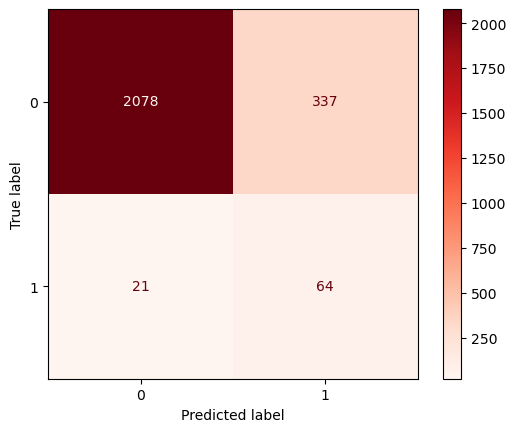

In [27]:
fig = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, test_pred))
fig.plot(cmap="Reds")
plt.show()

## Determine Optimization Parameters for AdaSubgradient

In [32]:
# Set large C for strict model
C = 1e18

splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

opt_candidates={
    "lr":  [0.1, 1, 5, 10],
    "batch_size": [16, 64, 256, 512, 1024],
    "max_epoch": [40],
}

results = {}
for params in product(*opt_candidates.values()):
    lr, batch_size, max_epoch = params
    param_key = "_".join(str(x) for x in params)
    
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        w0, w = AdaSubGradient(
            X=X_train,
            y=y_train,
            C=C,
            lr=lr,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
        
        loss = HingeLossl2(C, w, w0, X_val, y_val)
        cv_results.append(loss)
        
    results[param_key] = np.mean(cv_results)
    
best_params = min(results, key=lambda key: results[key])
print(f"BEST: {best_params}")
results

Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([5210, 6383]))
Train Balanced Acc: 0.696364135777138
Loss: 8816.508878839573
==================== EPOCH: 1 ====================
(array([False,  True]), array([5899, 5694]))
Train Balanced Acc: 0.7285438507078636
Loss: 8349.460240709945
==================== EPOCH: 2 ====================
(array([False,  True]), array([5433, 6160]))
Train Balanced Acc: 0.7285403833852806
Loss: 8211.207274632849
==================== EPOCH: 3 ====================
(array([False,  True]), array([5466, 6127]))
Train Balanced Acc: 0.7313871742755498
Loss: 8138.1771011343535
==================== EPOCH: 4 ====================
(array([False,  True]), array([5591, 6002]))
Train Balanced Acc: 0.7361323466017797
Loss: 8094.128147387524
==================== EPOCH: 5 ====================
(array([False,  True]), array([5571, 6022]))
Train Balanced Acc: 0.7378573767898081
Loss: 8063.200064859659
===========

(array([False,  True]), array([5708, 5885]))
Train Balanced Acc: 0.7490733766412341
Loss: 7897.825995479689
==================== EPOCH: 12 ====================
(array([False,  True]), array([5689, 5904]))
Train Balanced Acc: 0.7508849559629198
Loss: 7890.053844148979
==================== EPOCH: 13 ====================
(array([False,  True]), array([5695, 5898]))
Train Balanced Acc: 0.7514024650193283
Loss: 7883.266113899902
==================== EPOCH: 14 ====================
(array([False,  True]), array([5667, 5926]))
Train Balanced Acc: 0.7524377807564013
Loss: 7876.63596754918
==================== EPOCH: 15 ====================
(array([False,  True]), array([5671, 5922]))
Train Balanced Acc: 0.752782786794007
Loss: 7871.007460120895
==================== EPOCH: 16 ====================
(array([False,  True]), array([5693, 5900]))
Train Balanced Acc: 0.7512299620005255
Loss: 7865.995060205517
==================== EPOCH: 17 ====================
(array([False,  True]), array([5699, 5894]

Loss: 7923.566561882562
==================== EPOCH: 26 ====================
(array([False,  True]), array([5743, 5851]))
Train Balanced Acc: 0.744695532171813
Loss: 7921.024478860489
==================== EPOCH: 27 ====================
(array([False,  True]), array([5743, 5851]))
Train Balanced Acc: 0.744695532171813
Loss: 7918.7154862452635
==================== EPOCH: 28 ====================
(array([False,  True]), array([5743, 5851]))
Train Balanced Acc: 0.744695532171813
Loss: 7916.528803791466
==================== EPOCH: 29 ====================
(array([False,  True]), array([5744, 5850]))
Train Balanced Acc: 0.7447817836812145
Loss: 7914.483963469722
==================== EPOCH: 30 ====================
(array([False,  True]), array([5744, 5850]))
Train Balanced Acc: 0.7447817836812145
Loss: 7912.522473064825
==================== EPOCH: 31 ====================
(array([False,  True]), array([5742, 5852]))
Train Balanced Acc: 0.7446092806624116
Loss: 7910.514982970331
==================

(array([False,  True]), array([5595, 5999]))
Train Balanced Acc: 0.7593582887700534
Loss: 7850.169376637523
==================== EPOCH: 39 ====================
(array([False,  True]), array([5602, 5992]))
Train Balanced Acc: 0.7599620493358634
Loss: 7848.938330051792
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False,  True]), array([5079, 6515]))
Train Balanced Acc: 0.6962221838882181
Loss: 8850.99476295533
==================== EPOCH: 1 ====================
(array([False,  True]), array([5661, 5933]))
Train Balanced Acc: 0.7291702604795584
Loss: 8335.772429966104
==================== EPOCH: 2 ====================
(array([False,  True]), array([5571, 6023]))
Train Balanced Acc: 0.732620320855615
Loss: 8187.824284889247
==================== EPOCH: 3 ====================
(array([False,  True]), array([5667, 5927]))
Train Balanced Acc: 0.7367603933068829
Loss: 8117.340560749695
==================== EPOCH: 4 ====================
(array([False

(array([False,  True]), array([5490, 6103]))
Train Balanced Acc: 0.7308697991500566
Loss: 8188.042291135964
==================== EPOCH: 15 ====================
(array([False,  True]), array([5497, 6096]))
Train Balanced Acc: 0.7314736638843561
Loss: 8181.488724368804
==================== EPOCH: 16 ====================
(array([False,  True]), array([5525, 6068]))
Train Balanced Acc: 0.7304387648212415
Loss: 8175.591347476004
==================== EPOCH: 17 ====================
(array([False,  True]), array([5556, 6037]))
Train Balanced Acc: 0.7281100038298289
Loss: 8170.478653865444
==================== EPOCH: 18 ====================
(array([False,  True]), array([5564, 6029]))
Train Balanced Acc: 0.7288001349547426
Loss: 8165.649184341408
==================== EPOCH: 19 ====================
(array([False,  True]), array([5568, 6025]))
Train Balanced Acc: 0.7291452005171994
Loss: 8161.373198435966
==================== EPOCH: 20 ====================
(array([False,  True]), array([5572, 602

Train Balanced Acc: 0.7430361430134551
Loss: 8057.032751831698
==================== EPOCH: 31 ====================
(array([False,  True]), array([5597, 5996]))
Train Balanced Acc: 0.7438124065980678
Loss: 8054.998537836024
==================== EPOCH: 32 ====================
(array([False,  True]), array([5620, 5973]))
Train Balanced Acc: 0.7423458333139877
Loss: 8052.983437559108
==================== EPOCH: 33 ====================
(array([False,  True]), array([5626, 5967]))
Train Balanced Acc: 0.7428633423703963
Loss: 8051.247913501794
==================== EPOCH: 34 ====================
(array([False,  True]), array([5625, 5968]))
Train Balanced Acc: 0.7427770908609947
Loss: 8049.428321638756
==================== EPOCH: 35 ====================
(array([False,  True]), array([5626, 5967]))
Train Balanced Acc: 0.7428633423703963
Loss: 8047.69057991919
==================== EPOCH: 36 ====================
(array([False,  True]), array([5626, 5967]))
Train Balanced Acc: 0.7428633423703963
Lo

(array([False,  True]), array([5414, 6180]))
Train Balanced Acc: 0.7397791961359323
Loss: 8255.470336501723
==================== EPOCH: 6 ====================
(array([False,  True]), array([5514, 6080]))
Train Balanced Acc: 0.742194238399172
Loss: 8228.015746187813
==================== EPOCH: 7 ====================
(array([False,  True]), array([5522, 6072]))
Train Balanced Acc: 0.7428842504743833
Loss: 8206.084580186209
==================== EPOCH: 8 ====================
(array([False,  True]), array([5581, 6013]))
Train Balanced Acc: 0.7417629808521649
Loss: 8189.280221236384
==================== EPOCH: 9 ====================
(array([False,  True]), array([5570, 6024]))
Train Balanced Acc: 0.7408142142487493
Loss: 8174.961872349642
==================== EPOCH: 10 ====================
(array([False,  True]), array([5585, 6009]))
Train Balanced Acc: 0.7421079868897706
Loss: 8163.5268682429405
==================== EPOCH: 11 ====================
(array([False,  True]), array([5597, 5997]))

(array([False,  True]), array([5615, 5979]))
Train Balanced Acc: 0.7393479385889252
Loss: 8088.119519575592
==================== EPOCH: 22 ====================
(array([False,  True]), array([5618, 5976]))
Train Balanced Acc: 0.7396066931171295
Loss: 8084.630721682121
==================== EPOCH: 23 ====================
(array([False,  True]), array([5624, 5970]))
Train Balanced Acc: 0.740124202173538
Loss: 8081.431576157754
==================== EPOCH: 24 ====================
(array([False,  True]), array([5622, 5972]))
Train Balanced Acc: 0.7399516991547352
Loss: 8078.304757599128
==================== EPOCH: 25 ====================
(array([False,  True]), array([5621, 5973]))
Train Balanced Acc: 0.7398654476453338
Loss: 8075.555812313643
==================== EPOCH: 26 ====================
(array([False,  True]), array([5629, 5965]))
Train Balanced Acc: 0.740555459720545
Loss: 8072.9182239184365
==================== EPOCH: 27 ====================
(array([False,  True]), array([5628, 5966

(array([False,  True]), array([5243, 6350]))
Train Balanced Acc: 0.7124948049686108
Loss: 8666.314195920311
==================== EPOCH: 38 ====================
(array([False,  True]), array([5246, 6347]))
Train Balanced Acc: 0.7127536041404534
Loss: 8664.2957916513
==================== EPOCH: 39 ====================
(array([False,  True]), array([5250, 6343]))
Train Balanced Acc: 0.7130986697029102
Loss: 8662.190899828518
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(array([False,  True]), array([ 1091, 10502]))
Train Balanced Acc: 0.507668928849112
Loss: 9970.930705899198
==================== EPOCH: 1 ====================
(array([False,  True]), array([3942, 7651]))
Train Balanced Acc: 0.6569619581437913
Loss: 9371.713007945167
==================== EPOCH: 2 ====================
(array([False,  True]), array([4171, 7422]))
Train Balanced Acc: 0.6682601766959493
Loss: 9133.546223206591
==================== EPOCH: 3 ====================
(array([Fa

(array([False,  True]), array([4996, 6598]))
Train Balanced Acc: 0.7085561497326203
Loss: 8786.847065369519
==================== EPOCH: 13 ====================
(array([False,  True]), array([5019, 6575]))
Train Balanced Acc: 0.7105399344488528
Loss: 8775.282272734632
==================== EPOCH: 14 ====================
(array([False,  True]), array([5024, 6570]))
Train Balanced Acc: 0.7109711919958599
Loss: 8764.386550639556
==================== EPOCH: 15 ====================
(array([False,  True]), array([5046, 6548]))
Train Balanced Acc: 0.7128687252026911
Loss: 8755.027958401733
==================== EPOCH: 16 ====================
(array([False,  True]), array([5051, 6543]))
Train Balanced Acc: 0.7132999827496981
Loss: 8746.648234533854
==================== EPOCH: 17 ====================
(array([False,  True]), array([5059, 6535]))
Train Balanced Acc: 0.7139899948249094
Loss: 8738.795161670889
==================== EPOCH: 18 ====================
(array([False,  True]), array([5068, 652

(array([False,  True]), array([5202, 6392]))
Train Balanced Acc: 0.7190788338795928
Loss: 8619.484026939217
==================== EPOCH: 27 ====================
(array([False,  True]), array([5200, 6394]))
Train Balanced Acc: 0.71890633086079
Loss: 8615.75437911113
==================== EPOCH: 28 ====================
(array([False,  True]), array([5196, 6398]))
Train Balanced Acc: 0.7185613248231844
Loss: 8612.327435132333
==================== EPOCH: 29 ====================
(array([False,  True]), array([5200, 6394]))
Train Balanced Acc: 0.71890633086079
Loss: 8609.076687841418
==================== EPOCH: 30 ====================
(array([False,  True]), array([5198, 6396]))
Train Balanced Acc: 0.7187338278419872
Loss: 8605.672621548754
==================== EPOCH: 31 ====================
(array([False,  True]), array([5200, 6394]))
Train Balanced Acc: 0.71890633086079
Loss: 8602.750276548197
==================== EPOCH: 32 ====================
(array([False,  True]), array([5207, 6387]))
Tr

Train Balanced Acc: 0.7229601518026565
Loss: 8609.031836548278
Starting, Loss: 18991.354316929028
==================== EPOCH: 0 ====================
(array([False,  True]), array([   46, 11547]))
Train Balanced Acc: 0.503968253968254
Loss: 10321.563052577658
==================== EPOCH: 1 ====================
(array([False,  True]), array([1983, 9610]))
Train Balanced Acc: 0.5679005483786442
Loss: 9860.045624358378
==================== EPOCH: 2 ====================
(array([False,  True]), array([2358, 9235]))
Train Balanced Acc: 0.5826536190573811
Loss: 9673.357126989918
==================== EPOCH: 3 ====================
(array([False,  True]), array([2893, 8700]))
Train Balanced Acc: 0.6113818301344083
Loss: 9562.557500785024
==================== EPOCH: 4 ====================
(array([False,  True]), array([3164, 8429]))
Train Balanced Acc: 0.6232013226898137
Loss: 9489.699770105111
==================== EPOCH: 5 ====================
(array([False,  True]), array([3370, 8223]))
Train Bal

Loss: 9130.536085844491
==================== EPOCH: 25 ====================
(array([False,  True]), array([4231, 7362]))
Train Balanced Acc: 0.6739528209600811
Loss: 9125.652153290881
==================== EPOCH: 26 ====================
(array([False,  True]), array([4245, 7348]))
Train Balanced Acc: 0.6751603420917008
Loss: 9121.078949399478
==================== EPOCH: 27 ====================
(array([False,  True]), array([4259, 7334]))
Train Balanced Acc: 0.6763678632233207
Loss: 9116.765242118276
==================== EPOCH: 28 ====================
(array([False,  True]), array([4265, 7328]))
Train Balanced Acc: 0.6768853722797292
Loss: 9112.77204816582
==================== EPOCH: 29 ====================
(array([False,  True]), array([4275, 7318]))
Train Balanced Acc: 0.6777478873737433
Loss: 9109.052389827515
==================== EPOCH: 30 ====================
(array([False,  True]), array([4301, 7292]))
Train Balanced Acc: 0.6765400686178675
Loss: 9105.427546402205
=================

(array([False,  True]), array([3553, 8041]))
Train Balanced Acc: 0.6465413144730032
Loss: 9346.977259831547
==================== EPOCH: 7 ====================
(array([False,  True]), array([3668, 7926]))
Train Balanced Acc: 0.656460238054166
Loss: 9313.717227832549
==================== EPOCH: 8 ====================
(array([False,  True]), array([3825, 7769]))
Train Balanced Acc: 0.652923926168708
Loss: 9286.303991802906
==================== EPOCH: 9 ====================
(array([False,  True]), array([3876, 7718]))
Train Balanced Acc: 0.6573227531481801
Loss: 9261.810224639075
==================== EPOCH: 10 ====================
(array([False,  True]), array([3939, 7655]))
Train Balanced Acc: 0.6627565982404692
Loss: 9242.853433762744
==================== EPOCH: 11 ====================
(array([False,  True]), array([4018, 7576]))
Train Balanced Acc: 0.6624978437122649
Loss: 9226.499917521282
==================== EPOCH: 12 ====================
(array([False,  True]), array([4046, 7548]))


Train Balanced Acc: 0.6772468518199068
Loss: 9090.36739328115
==================== EPOCH: 30 ====================
(array([False,  True]), array([4422, 7172]))
Train Balanced Acc: 0.6781956184233224
Loss: 9086.45651154084
==================== EPOCH: 31 ====================
(array([False,  True]), array([4424, 7170]))
Train Balanced Acc: 0.6783681214421252
Loss: 9083.035100930469
==================== EPOCH: 32 ====================
(array([False,  True]), array([4428, 7166]))
Train Balanced Acc: 0.6787131274797309
Loss: 9079.829965381366
==================== EPOCH: 33 ====================
(array([False,  True]), array([4435, 7159]))
Train Balanced Acc: 0.6793168880455408
Loss: 9076.566802500683
==================== EPOCH: 34 ====================
(array([False,  True]), array([4443, 7151]))
Train Balanced Acc: 0.680006900120752
Loss: 9073.701084365182
==================== EPOCH: 35 ====================
(array([False,  True]), array([4449, 7145]))
Train Balanced Acc: 0.6805244091771605
Loss

(array([False,  True]), array([2169, 9424]))
Train Balanced Acc: 0.5828787122822269
Loss: 9693.989604702267
==================== EPOCH: 23 ====================
(array([False,  True]), array([2183, 9410]))
Train Balanced Acc: 0.5840862334138467
Loss: 9689.068857129187
==================== EPOCH: 24 ====================
(array([False,  True]), array([2223, 9370]))
Train Balanced Acc: 0.5828783104894811
Loss: 9684.188039549572
==================== EPOCH: 25 ====================
(array([False,  True]), array([2239, 9354]))
Train Balanced Acc: 0.5842583346399038
Loss: 9680.052256951949
==================== EPOCH: 26 ====================
(array([False,  True]), array([2253, 9340]))
Train Balanced Acc: 0.5854658557715235
Loss: 9675.881644326582
==================== EPOCH: 27 ====================
(array([False,  True]), array([2290, 9303]))
Train Balanced Acc: 0.5841716962189696
Loss: 9671.885080354943
==================== EPOCH: 28 ====================
(array([False,  True]), array([2309, 928

(array([False,  True]), array([1834, 9760]))
Train Balanced Acc: 0.5562359841297223
Loss: 9779.78575557171
==================== EPOCH: 11 ====================
(array([False,  True]), array([1864, 9730]))
Train Balanced Acc: 0.5588235294117647
Loss: 9767.06999757617
==================== EPOCH: 12 ====================
(array([False,  True]), array([1929, 9665]))
Train Balanced Acc: 0.5644298775228567
Loss: 9754.22284114593
==================== EPOCH: 13 ====================
(array([False,  True]), array([1993, 9601]))
Train Balanced Acc: 0.566154907710885
Loss: 9742.700445283604
==================== EPOCH: 14 ====================
(array([False,  True]), array([2058, 9536]))
Train Balanced Acc: 0.5677936863895118
Loss: 9731.943475422617
==================== EPOCH: 15 ====================
(array([False,  True]), array([2092, 9502]))
Train Balanced Acc: 0.5707262377091599
Loss: 9723.25532797601
==================== EPOCH: 16 ====================
(array([False,  True]), array([2124, 9470]))


(array([False,  True]), array([5537, 6056]))
Train Balanced Acc: 0.804966586915271
Loss: 5614.0824206636335
==================== EPOCH: 1 ====================
(array([False,  True]), array([5974, 5619]))
Train Balanced Acc: 0.8261032812121831
Loss: 5248.1448626799975
==================== EPOCH: 2 ====================
(array([False,  True]), array([5684, 5909]))
Train Balanced Acc: 0.8171301926355139
Loss: 5154.270233894702
==================== EPOCH: 3 ====================
(array([False,  True]), array([5929, 5664]))
Train Balanced Acc: 0.8227388473345902
Loss: 5113.1494981457945
==================== EPOCH: 4 ====================
(array([False,  True]), array([5854, 5739]))
Train Balanced Acc: 0.8245497272392743
Loss: 5095.397941815941
==================== EPOCH: 5 ====================
(array([False,  True]), array([5951, 5642]))
Train Balanced Acc: 0.8236016005280093
Loss: 5087.996362330348
==================== EPOCH: 6 ====================
(array([False,  True]), array([5980, 5613]))

(array([False,  True]), array([5963, 5630]))
Train Balanced Acc: 0.8271358290436749
Loss: 5000.043741798203
==================== EPOCH: 13 ====================
(array([False,  True]), array([5915, 5678]))
Train Balanced Acc: 0.8274812219928134
Loss: 4997.070040911856
==================== EPOCH: 14 ====================
(array([False,  True]), array([5909, 5684]))
Train Balanced Acc: 0.8269637129364049
Loss: 4995.458139834678
==================== EPOCH: 15 ====================
(array([False,  True]), array([5956, 5637]))
Train Balanced Acc: 0.826532068477865
Loss: 4994.249400729248
==================== EPOCH: 16 ====================
(array([False,  True]), array([5908, 5685]))
Train Balanced Acc: 0.8268774614270036
Loss: 4993.176235576423
==================== EPOCH: 17 ====================
(array([False,  True]), array([5949, 5644]))
Train Balanced Acc: 0.8259283079120552
Loss: 4992.204180343938
==================== EPOCH: 18 ====================
(array([False,  True]), array([5883, 5710

(array([False,  True]), array([5920, 5674]))
Train Balanced Acc: 0.8234431602553045
Loss: 5018.311887728245
==================== EPOCH: 27 ====================
(array([False,  True]), array([5947, 5647]))
Train Balanced Acc: 0.8219768845954805
Loss: 5018.0834456699295
==================== EPOCH: 28 ====================
(array([False,  True]), array([5948, 5646]))
Train Balanced Acc: 0.8220631361048818
Loss: 5017.737009865232
==================== EPOCH: 29 ====================
(array([False,  True]), array([5948, 5646]))
Train Balanced Acc: 0.8220631361048818
Loss: 5017.355966533343
==================== EPOCH: 30 ====================
(array([False,  True]), array([5917, 5677]))
Train Balanced Acc: 0.8231844057271003
Loss: 5016.811469792896
==================== EPOCH: 31 ====================
(array([False,  True]), array([5915, 5679]))
Train Balanced Acc: 0.8230119027082974
Loss: 5016.464013305357
==================== EPOCH: 32 ====================
(array([False,  True]), array([5863, 57

(array([False,  True]), array([4785, 6809]))
Train Balanced Acc: 0.8195618423322408
Loss: 5674.20522230233
==================== EPOCH: 1 ====================
(array([False,  True]), array([6583, 5011]))
Train Balanced Acc: 0.8228393996894945
Loss: 5408.814110379686
==================== EPOCH: 2 ====================
(array([False,  True]), array([5505, 6089]))
Train Balanced Acc: 0.8238744178023115
Loss: 5107.353468071411
==================== EPOCH: 3 ====================
(array([False,  True]), array([5984, 5610]))
Train Balanced Acc: 0.8224081421424875
Loss: 5066.0913300239645
==================== EPOCH: 4 ====================
(array([False,  True]), array([5775, 5819]))
Train Balanced Acc: 0.8190443332758324
Loss: 5044.7485397311175
==================== EPOCH: 5 ====================
(array([False,  True]), array([5836, 5758]))
Train Balanced Acc: 0.8243056753493185
Loss: 5025.254457951472
==================== EPOCH: 6 ====================
(array([False,  True]), array([5816, 5778]))


(array([False,  True]), array([5909, 5684]))
Train Balanced Acc: 0.8222211448224154
Loss: 5112.533179662913
==================== EPOCH: 21 ====================
(array([False,  True]), array([5895, 5698]))
Train Balanced Acc: 0.8210134153538163
Loss: 5110.568188623189
==================== EPOCH: 22 ====================
(array([False,  True]), array([5906, 5687]))
Train Balanced Acc: 0.8219623456505727
Loss: 5109.316854751347
==================== EPOCH: 23 ====================
(array([False,  True]), array([5861, 5732]))
Train Balanced Acc: 0.8208406444731831
Loss: 5109.369459360808
==================== EPOCH: 24 ====================
(array([False,  True]), array([5875, 5718]))
Train Balanced Acc: 0.8220483739417821
Loss: 5106.732240603922
==================== EPOCH: 25 ====================
(array([False,  True]), array([5905, 5688]))
Train Balanced Acc: 0.8218760792599584
Loss: 5105.8741526586855
==================== EPOCH: 26 ====================
(array([False,  True]), array([5900, 56

(array([False,  True]), array([5893, 5700]))
Train Balanced Acc: 0.8255836887859823
Loss: 5041.986471513176
==================== EPOCH: 39 ====================
(array([False,  True]), array([5899, 5694]))
Train Balanced Acc: 0.8261011978423909
Loss: 5041.396944131148
Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([False,  True]), array([4960, 6634]))
Train Balanced Acc: 0.8118854579955149
Loss: 6059.327945902671
==================== EPOCH: 1 ====================
(array([False,  True]), array([7194, 4400]))
Train Balanced Acc: 0.8003277557357253
Loss: 5874.077923778646
==================== EPOCH: 2 ====================
(array([False,  True]), array([5526, 6068]))
Train Balanced Acc: 0.8265482145937555
Loss: 5259.547840322434
==================== EPOCH: 3 ====================
(array([False,  True]), array([5581, 6013]))
Train Balanced Acc: 0.8238744178023116
Loss: 5198.680662941047
==================== EPOCH: 4 ====================
(array([Fa

(array([False,  True]), array([5706, 5888]))
Train Balanced Acc: 0.8191305847852337
Loss: 5133.969176538327
==================== EPOCH: 12 ====================
(array([False,  True]), array([5806, 5788]))
Train Balanced Acc: 0.8189580817664309
Loss: 5125.529602955468
==================== EPOCH: 13 ====================
(array([False,  True]), array([5852, 5742]))
Train Balanced Acc: 0.8203381059168535
Loss: 5121.667528314871
==================== EPOCH: 14 ====================
(array([False,  True]), array([5908, 5686]))
Train Balanced Acc: 0.8201656028980506
Loss: 5119.509472462364
==================== EPOCH: 15 ====================
(array([False,  True]), array([5892, 5702]))
Train Balanced Acc: 0.8187855787476281
Loss: 5116.052300382993
==================== EPOCH: 16 ====================
(array([False,  True]), array([5818, 5776]))
Train Balanced Acc: 0.819993099879248
Loss: 5113.59696492672
==================== EPOCH: 17 ====================
(array([False,  True]), array([5899, 5695]

Train Balanced Acc: 0.8227531481800932
Loss: 5052.081340808597
==================== EPOCH: 23 ====================
(array([False,  True]), array([5812, 5782]))
Train Balanced Acc: 0.821890633086079
Loss: 5051.070218999575
==================== EPOCH: 24 ====================
(array([False,  True]), array([5810, 5784]))
Train Balanced Acc: 0.8217181300672762
Loss: 5050.000391198695
==================== EPOCH: 25 ====================
(array([False,  True]), array([5819, 5775]))
Train Balanced Acc: 0.8224943936518889
Loss: 5048.373633851885
==================== EPOCH: 26 ====================
(array([False,  True]), array([5895, 5699]))
Train Balanced Acc: 0.8207693634638606
Loss: 5047.041132761547
==================== EPOCH: 27 ====================
(array([False,  True]), array([5826, 5768]))
Train Balanced Acc: 0.8230981542176987
Loss: 5046.114231409012
==================== EPOCH: 28 ====================
(array([False,  True]), array([5816, 5778]))
Train Balanced Acc: 0.8222356391236847
Lo

(array([False,  True]), array([5639, 5954]))
Train Balanced Acc: 0.8230817253587652
Loss: 5394.2153013872985
==================== EPOCH: 35 ====================
(array([False,  True]), array([5614, 5979]))
Train Balanced Acc: 0.8236853519936599
Loss: 5391.631123492989
==================== EPOCH: 36 ====================
(array([False,  True]), array([5645, 5948]))
Train Balanced Acc: 0.8235993237024506
Loss: 5389.104498169984
==================== EPOCH: 37 ====================
(array([False,  True]), array([5634, 5959]))
Train Balanced Acc: 0.8226503934056941
Loss: 5387.056852362453
==================== EPOCH: 38 ====================
(array([False,  True]), array([5659, 5934]))
Train Balanced Acc: 0.8248070531710496
Loss: 5384.936527671278
==================== EPOCH: 39 ====================
(array([False,  True]), array([5649, 5944]))
Train Balanced Acc: 0.8239443892649074
Loss: 5382.988325133801
Starting, Loss: 18982.943370815345
==================== EPOCH: 0 ====================
(arra

Train Balanced Acc: 0.825426944971537
Loss: 5629.557269998153
==================== EPOCH: 10 ====================
(array([False,  True]), array([5499, 6095]))
Train Balanced Acc: 0.8252544419527341
Loss: 5607.74465608474
==================== EPOCH: 11 ====================
(array([False,  True]), array([5405, 6189]))
Train Balanced Acc: 0.8226668966706917
Loss: 5592.015951559777
==================== EPOCH: 12 ====================
(array([False,  True]), array([5504, 6090]))
Train Balanced Acc: 0.8256856994997412
Loss: 5570.45959720209
==================== EPOCH: 13 ====================
(array([False,  True]), array([5581, 6013]))
Train Balanced Acc: 0.8249094359151286
Loss: 5554.317393473826
==================== EPOCH: 14 ====================
(array([False,  True]), array([5716, 5878]))
Train Balanced Acc: 0.8244781783681214
Loss: 5540.85551377577
==================== EPOCH: 15 ====================
(array([False,  True]), array([5695, 5899]))
Train Balanced Acc: 0.825426944971537
Loss: 

Train Balanced Acc: 0.8231844057271003
Loss: 5489.015257637031
==================== EPOCH: 32 ====================
(array([False,  True]), array([5643, 5951]))
Train Balanced Acc: 0.8219768845954805
Loss: 5486.031847315353
==================== EPOCH: 33 ====================
(array([False,  True]), array([5639, 5955]))
Train Balanced Acc: 0.8216318785578747
Loss: 5482.501506530228
==================== EPOCH: 34 ====================
(array([False,  True]), array([5652, 5942]))
Train Balanced Acc: 0.8227531481800932
Loss: 5479.8798101798975
==================== EPOCH: 35 ====================
(array([False,  True]), array([5650, 5944]))
Train Balanced Acc: 0.8225806451612903
Loss: 5477.178297916317
==================== EPOCH: 36 ====================
(array([False,  True]), array([5639, 5955]))
Train Balanced Acc: 0.8216318785578747
Loss: 5474.303542102346
==================== EPOCH: 37 ====================
(array([False,  True]), array([5646, 5948]))
Train Balanced Acc: 0.8222356391236847


(array([False,  True]), array([5549, 6044]))
Train Balanced Acc: 0.8094521416029543
Loss: 6093.570982849297
==================== EPOCH: 23 ====================
(array([False,  True]), array([5506, 6087]))
Train Balanced Acc: 0.8100556343069337
Loss: 6083.669488137615
==================== EPOCH: 24 ====================
(array([False,  True]), array([5525, 6068]))
Train Balanced Acc: 0.8116946957286038
Loss: 6073.765206263235
==================== EPOCH: 25 ====================
(array([False,  True]), array([5608, 5985]))
Train Balanced Acc: 0.810401429048818
Loss: 6065.8514451919
==================== EPOCH: 26 ====================
(array([False,  True]), array([5586, 6007]))
Train Balanced Acc: 0.8126439980556803
Loss: 6057.813304241972
==================== EPOCH: 27 ====================
(array([False,  True]), array([5582, 6011]))
Train Balanced Acc: 0.8131615219933015
Loss: 6050.007529791434
==================== EPOCH: 28 ====================
(array([False,  True]), array([5528, 6065])

(array([False,  True]), array([6615, 4979]))
Train Balanced Acc: 0.7636708642401242
Loss: 7170.607705844072
==================== EPOCH: 3 ====================
(array([False,  True]), array([5663, 5931]))
Train Balanced Acc: 0.7652233914093496
Loss: 6817.2963271147
==================== EPOCH: 4 ====================
(array([False,  True]), array([5800, 5794]))
Train Balanced Acc: 0.7787648783853718
Loss: 6609.602450017687
==================== EPOCH: 5 ====================
(array([False,  True]), array([5470, 6124]))
Train Balanced Acc: 0.7856649991374849
Loss: 6485.139145807301
==================== EPOCH: 6 ====================
(array([False,  True]), array([5649, 5945]))
Train Balanced Acc: 0.7895463170605486
Loss: 6386.486480012239
==================== EPOCH: 7 ====================
(array([False,  True]), array([5691, 5903]))
Train Balanced Acc: 0.793168880455408
Loss: 6315.303825843377
==================== EPOCH: 8 ====================
(array([False,  True]), array([5659, 5935]))
Trai

(array([False,  True]), array([5545, 6049]))
Train Balanced Acc: 0.8047265827151975
Loss: 6063.421066822451
==================== EPOCH: 23 ====================
(array([False,  True]), array([5540, 6054]))
Train Balanced Acc: 0.8042953251681904
Loss: 6054.045358109346
==================== EPOCH: 24 ====================
(array([False,  True]), array([5597, 5997]))
Train Balanced Acc: 0.8021390374331551
Loss: 6044.503662903975
==================== EPOCH: 25 ====================
(array([False,  True]), array([5595, 5999]))
Train Balanced Acc: 0.8021390374331551
Loss: 6035.956333895389
==================== EPOCH: 26 ====================
(array([False,  True]), array([5623, 5971]))
Train Balanced Acc: 0.8045540796963947
Loss: 6028.7827732254345
==================== EPOCH: 27 ====================
(array([False,  True]), array([5503, 6091]))
Train Balanced Acc: 0.8080041400724512
Loss: 6021.780852337709
==================== EPOCH: 28 ====================
(array([False,  True]), array([5579, 60

(array([False,  True]), array([4779, 6814]))
Train Balanced Acc: 0.715596674727522
Loss: 7912.560339683741
==================== EPOCH: 3 ====================
(array([False,  True]), array([5553, 6040]))
Train Balanced Acc: 0.7449304767595337
Loss: 7559.558675979262
==================== EPOCH: 4 ====================
(array([False,  True]), array([5779, 5814]))
Train Balanced Acc: 0.743724533036471
Loss: 7363.019752967739
==================== EPOCH: 5 ====================
(array([False,  True]), array([6057, 5536]))
Train Balanced Acc: 0.7475219953253944
Loss: 7237.060562698987
==================== EPOCH: 6 ====================
(array([False,  True]), array([5652, 5941]))
Train Balanced Acc: 0.7546784747304507
Loss: 7139.964110286166
==================== EPOCH: 7 ====================
(array([False,  True]), array([5547, 6046]))
Train Balanced Acc: 0.7554540240168488
Loss: 7062.461988380721
==================== EPOCH: 8 ====================
(array([False,  True]), array([5741, 5852]))
Tra

(array([False,  True]), array([5705, 5888]))
Train Balanced Acc: 0.7921166150169532
Loss: 6453.570789508018
==================== EPOCH: 31 ====================
(array([False,  True]), array([5688, 5905]))
Train Balanced Acc: 0.7906503393571291
Loss: 6447.216434015987
==================== EPOCH: 32 ====================
(array([False,  True]), array([5647, 5946]))
Train Balanced Acc: 0.7941872613723121
Loss: 6440.640655974116
==================== EPOCH: 33 ====================
(array([False,  True]), array([5680, 5913]))
Train Balanced Acc: 0.7930656494821993
Loss: 6434.645273272632
==================== EPOCH: 34 ====================
(array([False,  True]), array([5652, 5941]))
Train Balanced Acc: 0.7946185189193191
Loss: 6428.474726382414
==================== EPOCH: 35 ====================
(array([False,  True]), array([5689, 5904]))
Train Balanced Acc: 0.793841913066812
Loss: 6422.483010659008
==================== EPOCH: 36 ====================
(array([False,  True]), array([5731, 5862

(array([False,  True]), array([5659, 5935]))
Train Balanced Acc: 0.775918578575125
Loss: 6864.535188813504
==================== EPOCH: 19 ====================
(array([False,  True]), array([5650, 5944]))
Train Balanced Acc: 0.7751423149905123
Loss: 6846.794170388499
==================== EPOCH: 20 ====================
(array([False,  True]), array([5606, 5988]))
Train Balanced Acc: 0.7758323270657237
Loss: 6831.8453446967505
==================== EPOCH: 21 ====================
(array([False,  True]), array([5585, 6009]))
Train Balanced Acc: 0.7766085906503364
Loss: 6821.679062759624
==================== EPOCH: 22 ====================
(array([False,  True]), array([5684, 5910]))
Train Balanced Acc: 0.7780748663101604
Loss: 6805.64193309112
==================== EPOCH: 23 ====================
(array([False,  True]), array([5678, 5916]))
Train Balanced Acc: 0.777557357253752
Loss: 6792.071886800853
==================== EPOCH: 24 ====================
(array([False,  True]), array([5677, 5917]

(array([False,  True]), array([6237, 5356]))
Train Balanced Acc: 0.807214528039955
Loss: 5214.899670492108
==================== EPOCH: 1 ====================
(array([False,  True]), array([7845, 3748]))
Train Balanced Acc: 0.764614571231187
Loss: 6499.494352112584
==================== EPOCH: 2 ====================
(array([False,  True]), array([5268, 6325]))
Train Balanced Acc: 0.8041882548420788
Loss: 5104.766313387654
==================== EPOCH: 3 ====================
(array([False,  True]), array([6073, 5520]))
Train Balanced Acc: 0.8210147397817558
Loss: 4975.94086875348
==================== EPOCH: 4 ====================
(array([False,  True]), array([6126, 5467]))
Train Balanced Acc: 0.8169609634835275
Loss: 4993.425063786113
==================== EPOCH: 5 ====================
(array([False,  True]), array([5895, 5698]))
Train Balanced Acc: 0.8232561480540195
Loss: 4966.187427837489
==================== EPOCH: 6 ====================
(array([False,  True]), array([5809, 5784]))
Trai

(array([False,  True]), array([5741, 5852]))
Train Balanced Acc: 0.8267924450582647
Loss: 4871.177920264967
==================== EPOCH: 15 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.8278274631710817
Loss: 4871.361991207488
==================== EPOCH: 16 ====================
(array([False,  True]), array([5664, 5929]))
Train Balanced Acc: 0.8277418664350435
Loss: 4875.097014078742
==================== EPOCH: 17 ====================
(array([False,  True]), array([5761, 5832]))
Train Balanced Acc: 0.8285174752462929
Loss: 4870.919187024739
==================== EPOCH: 18 ====================
(array([False,  True]), array([5687, 5906]))
Train Balanced Acc: 0.8285180258511666
Loss: 4873.294292810708
==================== EPOCH: 19 ====================
(array([False,  True]), array([5792, 5801]))
Train Balanced Acc: 0.8277409140374242
Loss: 4872.065264473945
==================== EPOCH: 20 ====================
(array([False,  True]), array([5820, 577

(array([False,  True]), array([5805, 5789]))
Train Balanced Acc: 0.8250819389339313
Loss: 4912.46009062439
==================== EPOCH: 29 ====================
(array([False,  True]), array([5720, 5874]))
Train Balanced Acc: 0.8272382266689666
Loss: 4910.810582134661
==================== EPOCH: 30 ====================
(array([False,  True]), array([5743, 5851]))
Train Balanced Acc: 0.8262894600655512
Loss: 4911.311534151113
==================== EPOCH: 31 ====================
(array([False,  True]), array([5682, 5912]))
Train Balanced Acc: 0.8293082628946007
Loss: 4910.6870437591415
==================== EPOCH: 32 ====================
(array([False,  True]), array([5634, 5960]))
Train Balanced Acc: 0.828963256856995
Loss: 4912.3635843526445
==================== EPOCH: 33 ====================
(array([False,  True]), array([5725, 5869]))
Train Balanced Acc: 0.8276694842159737
Loss: 4910.9022191477925
==================== EPOCH: 34 ====================
(array([False,  True]), array([5759, 58

(array([False,  True]), array([5177, 6417]))
Train Balanced Acc: 0.8176643091254097
Loss: 5036.04745013335
==================== EPOCH: 3 ====================
(array([False,  True]), array([5493, 6101]))
Train Balanced Acc: 0.8245644298775229
Loss: 4974.627084213509
==================== EPOCH: 4 ====================
(array([False,  True]), array([5654, 5940]))
Train Balanced Acc: 0.8265482145937554
Loss: 4901.87843195654
==================== EPOCH: 5 ====================
(array([False,  True]), array([5794, 5800]))
Train Balanced Acc: 0.822925651198896
Loss: 4902.722215021115
==================== EPOCH: 6 ====================
(array([False,  True]), array([5527, 6067]))
Train Balanced Acc: 0.8221493876142832
Loss: 4923.537966313275
==================== EPOCH: 7 ====================
(array([False,  True]), array([5742, 5852]))
Train Balanced Acc: 0.8201656028980507
Loss: 4900.721461552503
==================== EPOCH: 8 ====================
(array([False,  True]), array([5772, 5822]))
Trai

(array([False,  True]), array([5862, 5731]))
Train Balanced Acc: 0.8202368392637347
Loss: 4955.201190057442
==================== EPOCH: 22 ====================
(array([False,  True]), array([5883, 5710]))
Train Balanced Acc: 0.8220484334666334
Loss: 4955.0668011051985
==================== EPOCH: 23 ====================
(array([False,  True]), array([5589, 6004]))
Train Balanced Acc: 0.8201485490281795
Loss: 4969.227728067918
==================== EPOCH: 24 ====================
(array([False,  True]), array([5743, 5850]))
Train Balanced Acc: 0.8184245158814089
Loss: 4956.4067392464485
==================== EPOCH: 25 ====================
(array([False,  True]), array([5906, 5687]))
Train Balanced Acc: 0.8240325604507603
Loss: 4956.975784740041
==================== EPOCH: 26 ====================
(array([False,  True]), array([5883, 5710]))
Train Balanced Acc: 0.8220484334666334
Loss: 4954.453877342394
==================== EPOCH: 27 ====================
(array([False,  True]), array([5919, 5

Starting, Loss: 19005.530503819347
==================== EPOCH: 0 ====================
(array([False,  True]), array([6956, 4638]))
Train Balanced Acc: 0.7904950836639641
Loss: 6000.168311633326
==================== EPOCH: 1 ====================
(array([False,  True]), array([9932, 1662]))
Train Balanced Acc: 0.6354148697602208
Loss: 9681.875981045028
==================== EPOCH: 2 ====================
(array([False,  True]), array([5646, 5948]))
Train Balanced Acc: 0.8230981542176988
Loss: 4990.815551538174
==================== EPOCH: 3 ====================
(array([False,  True]), array([5479, 6115]))
Train Balanced Acc: 0.8200793513886493
Loss: 5080.135506600739
==================== EPOCH: 4 ====================
(array([False,  True]), array([5903, 5691]))
Train Balanced Acc: 0.8218043815766776
Loss: 4951.683043572585
==================== EPOCH: 5 ====================
(array([False,  True]), array([5514, 6080]))
Train Balanced Acc: 0.8203381059168535
Loss: 4974.55403829095
============

Loss: 4958.648792868501
==================== EPOCH: 12 ====================
(array([False,  True]), array([5563, 6031]))
Train Balanced Acc: 0.8226668966706918
Loss: 4958.14807666424
==================== EPOCH: 13 ====================
(array([False,  True]), array([5685, 5909]))
Train Balanced Acc: 0.822321890633086
Loss: 4948.923480173734
==================== EPOCH: 14 ====================
(array([False,  True]), array([5873, 5721]))
Train Balanced Acc: 0.8228393996894945
Loss: 4948.595090785065
==================== EPOCH: 15 ====================
(array([False,  True]), array([5767, 5827]))
Train Balanced Acc: 0.821459375539072
Loss: 4944.430215829017
==================== EPOCH: 16 ====================
(array([False,  True]), array([5800, 5794]))
Train Balanced Acc: 0.819993099879248
Loss: 4944.121922192552
==================== EPOCH: 17 ====================
(array([False,  True]), array([5903, 5691]))
Train Balanced Acc: 0.8212868725202691
Loss: 4946.149320344196
====================

(array([False,  True]), array([5782, 5812]))
Train Balanced Acc: 0.821890633086079
Loss: 4899.362687013598
==================== EPOCH: 31 ====================
(array([False,  True]), array([5815, 5779]))
Train Balanced Acc: 0.8247369328963257
Loss: 4900.160134606635
==================== EPOCH: 32 ====================
(array([False,  True]), array([5791, 5803]))
Train Balanced Acc: 0.8226668966706918
Loss: 4899.208584092018
==================== EPOCH: 33 ====================
(array([False,  True]), array([5806, 5788]))
Train Balanced Acc: 0.823960669311713
Loss: 4899.54592525917
==================== EPOCH: 34 ====================
(array([False,  True]), array([5845, 5749]))
Train Balanced Acc: 0.822321890633086
Loss: 4900.203967804321
==================== EPOCH: 35 ====================
(array([False,  True]), array([5872, 5722]))
Train Balanced Acc: 0.8246506813869243
Loss: 4903.405231474729
==================== EPOCH: 36 ====================
(array([False,  True]), array([5785, 5809]))

(array([False,  True]), array([5959, 5634]))
Train Balanced Acc: 0.8259282335059912
Loss: 5056.429978387475
==================== EPOCH: 8 ====================
(array([False,  True]), array([6040, 5553]))
Train Balanced Acc: 0.8268764792669586
Loss: 5048.966752744789
==================== EPOCH: 9 ====================
(array([False,  True]), array([5594, 5999]))
Train Balanced Acc: 0.8199790817767882
Loss: 5054.319963872098
==================== EPOCH: 10 ====================
(array([False,  True]), array([5820, 5773]))
Train Balanced Acc: 0.8273956699004137
Loss: 5005.0965389386665
==================== EPOCH: 11 ====================
(array([False,  True]), array([5951, 5642]))
Train Balanced Acc: 0.8274809541309831
Loss: 4996.476001800424
==================== EPOCH: 12 ====================
(array([False,  True]), array([6043, 5550]))
Train Balanced Acc: 0.8271352337951628
Loss: 4997.972127548077
==================== EPOCH: 13 ====================
(array([False,  True]), array([5815, 5778

Loss: 4983.3948657276405
==================== EPOCH: 31 ====================
(array([False,  True]), array([5979, 5615]))
Train Balanced Acc: 0.8247369328963257
Loss: 4984.176111707926
==================== EPOCH: 32 ====================
(array([False,  True]), array([5858, 5736]))
Train Balanced Acc: 0.8232706572365016
Loss: 4983.646988409392
==================== EPOCH: 33 ====================
(array([False,  True]), array([5920, 5674]))
Train Balanced Acc: 0.8234431602553045
Loss: 4981.217388828543
==================== EPOCH: 34 ====================
(array([False,  True]), array([5974, 5620]))
Train Balanced Acc: 0.8243056753493186
Loss: 4980.718636258245
==================== EPOCH: 35 ====================
(array([False,  True]), array([6031, 5563]))
Train Balanced Acc: 0.8262894600655512
Loss: 4986.77388680092
==================== EPOCH: 36 ====================
(array([False,  True]), array([5895, 5699]))
Train Balanced Acc: 0.8264619630843539
Loss: 4978.776865161959
================

Train Balanced Acc: 0.8224081421424876
Loss: 4987.8550054540865
==================== EPOCH: 17 ====================
(array([False,  True]), array([5978, 5616]))
Train Balanced Acc: 0.820855614973262
Loss: 4982.542050249028
==================== EPOCH: 18 ====================
(array([False,  True]), array([5932, 5662]))
Train Balanced Acc: 0.823960669311713
Loss: 4977.2021838471765
==================== EPOCH: 19 ====================
(array([False,  True]), array([6025, 5569]))
Train Balanced Acc: 0.820424357426255
Loss: 4979.670480132544
==================== EPOCH: 20 ====================
(array([False,  True]), array([5657, 5937]))
Train Balanced Acc: 0.8162842849749871
Loss: 5004.677214144427
==================== EPOCH: 21 ====================
(array([False,  True]), array([5878, 5716]))
Train Balanced Acc: 0.8232706572365016
Loss: 4970.931176146552
==================== EPOCH: 22 ====================
(array([False,  True]), array([5871, 5723]))
Train Balanced Acc: 0.8226668966706918
Lo

(array([False,  True]), array([5841, 5752]))
Train Balanced Acc: 0.8201504240609925
Loss: 5095.162057947257
==================== EPOCH: 32 ====================
(array([False,  True]), array([5858, 5735]))
Train Balanced Acc: 0.8205818453013405
Loss: 5091.646872641557
==================== EPOCH: 33 ====================
(array([False,  True]), array([5883, 5710]))
Train Balanced Acc: 0.8199782186664457
Loss: 5088.835396963475
==================== EPOCH: 34 ====================
(array([False,  True]), array([5774, 5819]))
Train Balanced Acc: 0.8214438097904808
Loss: 5091.217818805315
==================== EPOCH: 35 ====================
(array([False,  True]), array([5809, 5784]))
Train Balanced Acc: 0.8206677396616346
Loss: 5086.503768151728
==================== EPOCH: 36 ====================
(array([False,  True]), array([5891, 5702]))
Train Balanced Acc: 0.8206683497913594
Loss: 5081.554290616779
==================== EPOCH: 37 ====================
(array([False,  True]), array([5900, 569

Train Balanced Acc: 0.813782991202346
Loss: 5767.701720860064
==================== EPOCH: 6 ====================
(array([False,  True]), array([5672, 5922]))
Train Balanced Acc: 0.8224081421424875
Loss: 5585.7390183245625
==================== EPOCH: 7 ====================
(array([False,  True]), array([5850, 5744]))
Train Balanced Acc: 0.8293082628946007
Loss: 5486.275319541359
==================== EPOCH: 8 ====================
(array([False,  True]), array([6088, 5506]))
Train Balanced Acc: 0.8258582025185441
Loss: 5447.443105050853
==================== EPOCH: 9 ====================
(array([False,  True]), array([5541, 6053]))
Train Balanced Acc: 0.8219768845954805
Loss: 5335.173920146699
==================== EPOCH: 10 ====================
(array([False,  True]), array([5784, 5810]))
Train Balanced Acc: 0.8263757115749526
Loss: 5279.900328938371
==================== EPOCH: 11 ====================
(array([False,  True]), array([5395, 6199]))
Train Balanced Acc: 0.8188718302570295
Loss:

(array([False,  True]), array([5867, 5727]))
Train Balanced Acc: 0.8192168362946352
Loss: 5109.789471398848
==================== EPOCH: 23 ====================
(array([False,  True]), array([5803, 5791]))
Train Balanced Acc: 0.8207693634638606
Loss: 5103.215436157881
==================== EPOCH: 24 ====================
(array([False,  True]), array([5899, 5695]))
Train Balanced Acc: 0.8157667759185786
Loss: 5098.577118054803
==================== EPOCH: 25 ====================
(array([False,  True]), array([5832, 5762]))
Train Balanced Acc: 0.8186130757288252
Loss: 5093.956138897404
==================== EPOCH: 26 ====================
(array([False,  True]), array([5959, 5635]))
Train Balanced Acc: 0.8209418664826635
Loss: 5094.86089220555
==================== EPOCH: 27 ====================
(array([False,  True]), array([5677, 5917]))
Train Balanced Acc: 0.8166292910125927
Loss: 5099.727148629526
==================== EPOCH: 28 ====================
(array([False,  True]), array([5834, 5760

(array([False,  True]), array([7954, 3639]))
Train Balanced Acc: 0.721917202003416
Loss: 8450.207131135512
==================== EPOCH: 3 ====================
(array([False,  True]), array([7246, 4347]))
Train Balanced Acc: 0.7450293326561787
Loss: 7800.949215401001
==================== EPOCH: 4 ====================
(array([False,  True]), array([6371, 5222]))
Train Balanced Acc: 0.7476968495758199
Loss: 7409.071693452742
==================== EPOCH: 5 ====================
(array([False,  True]), array([6704, 4889]))
Train Balanced Acc: 0.7576191065486504
Loss: 7073.145541269198
==================== EPOCH: 6 ====================
(array([False,  True]), array([5732, 5861]))
Train Balanced Acc: 0.769515609380307
Loss: 6728.686496273567
==================== EPOCH: 7 ====================
(array([False,  True]), array([3889, 7704]))
Train Balanced Acc: 0.7823544798938744
Loss: 6682.528408544236
==================== EPOCH: 8 ====================
(array([False,  True]), array([5652, 5941]))
Tra

(array([False,  True]), array([5668, 5925]))
Train Balanced Acc: 0.8332624094731181
Loss: 5312.945410010897
==================== EPOCH: 30 ====================
(array([False,  True]), array([5871, 5722]))
Train Balanced Acc: 0.8242037092791981
Loss: 5306.181978376114
==================== EPOCH: 31 ====================
(array([False,  True]), array([5691, 5902]))
Train Balanced Acc: 0.8305882108889286
Loss: 5292.588574492864
==================== EPOCH: 32 ====================
(array([False,  True]), array([5630, 5963]))
Train Balanced Acc: 0.8299848521158644
Loss: 5284.68989896767
==================== EPOCH: 33 ====================
(array([False,  True]), array([5842, 5751]))
Train Balanced Acc: 0.8249802556068541
Loss: 5277.6871853857465
==================== EPOCH: 34 ====================
(array([False,  True]), array([5666, 5927]))
Train Balanced Acc: 0.8310196916541277
Loss: 5264.637850792054
==================== EPOCH: 35 ====================
(array([False,  True]), array([5838, 575

(array([False,  True]), array([5654, 5940]))
Train Balanced Acc: 0.8160255304467828
Loss: 5701.028097802714
==================== EPOCH: 16 ====================
(array([False,  True]), array([5590, 6004]))
Train Balanced Acc: 0.8225806451612903
Loss: 5664.802519081046
==================== EPOCH: 17 ====================
(array([False,  True]), array([5848, 5746]))
Train Balanced Acc: 0.8215456270484733
Loss: 5631.253834520521
==================== EPOCH: 18 ====================
(array([False,  True]), array([5730, 5864]))
Train Balanced Acc: 0.8217181300672762
Loss: 5586.500592276498
==================== EPOCH: 19 ====================
(array([False,  True]), array([5701, 5893]))
Train Balanced Acc: 0.8218043815766776
Loss: 5553.850830316898
==================== EPOCH: 20 ====================
(array([False,  True]), array([5538, 6056]))
Train Balanced Acc: 0.8180955666724168
Loss: 5530.420040641222
==================== EPOCH: 21 ====================
(array([False,  True]), array([5351, 624

(array([False,  True]), array([6836, 4757]))
Train Balanced Acc: 0.7971266878122748
Loss: 5691.386338758733
==================== EPOCH: 1 ====================
(array([False,  True]), array([8238, 3355]))
Train Balanced Acc: 0.7319253533365406
Loss: 7429.017768174965
==================== EPOCH: 2 ====================
(array([False,  True]), array([4934, 6659]))
Train Balanced Acc: 0.8062559844797283
Loss: 5343.17283245752
==================== EPOCH: 3 ====================
(array([False,  True]), array([5946, 5647]))
Train Balanced Acc: 0.8240328580750164
Loss: 4962.633049621429
==================== EPOCH: 4 ====================
(array([False,  True]), array([6055, 5538]))
Train Balanced Acc: 0.8182543194505904
Loss: 5064.705970907746
==================== EPOCH: 5 ====================
(array([False,  True]), array([5957, 5636]))
Train Balanced Acc: 0.8237741630716633
Loss: 4986.192888001153
==================== EPOCH: 6 ====================
(array([False,  True]), array([5679, 5914]))
Tr

(array([False,  True]), array([5683, 5910]))
Train Balanced Acc: 0.8281730198135611
Loss: 4872.3248336766155
==================== EPOCH: 15 ====================
(array([False,  True]), array([5778, 5815]))
Train Balanced Acc: 0.8270509466058513
Loss: 4874.61862923515
==================== EPOCH: 16 ====================
(array([False,  True]), array([5574, 6019]))
Train Balanced Acc: 0.8291226792897447
Loss: 4886.233443109812
==================== EPOCH: 17 ====================
(array([False,  True]), array([5745, 5848]))
Train Balanced Acc: 0.8271374510958703
Loss: 4871.435260651378
==================== EPOCH: 18 ====================
(array([False,  True]), array([5633, 5960]))
Train Balanced Acc: 0.8316237498441936
Loss: 4877.467097680207
==================== EPOCH: 19 ====================
(array([False,  True]), array([5807, 5786]))
Train Balanced Acc: 0.8290346866784455
Loss: 4872.849419724779
==================== EPOCH: 20 ====================
(array([False,  True]), array([5938, 565

(array([False,  True]), array([5797, 5797]))
Train Balanced Acc: 0.82439192685872
Loss: 4910.110202724538
==================== EPOCH: 28 ====================
(array([False,  True]), array([5798, 5796]))
Train Balanced Acc: 0.8244781783681214
Loss: 4910.115881449156
==================== EPOCH: 29 ====================
(array([False,  True]), array([5734, 5860]))
Train Balanced Acc: 0.8255131964809383
Loss: 4908.7620230126495
==================== EPOCH: 30 ====================
(array([False,  True]), array([5746, 5848]))
Train Balanced Acc: 0.8265482145937554
Loss: 4910.292238019878
==================== EPOCH: 31 ====================
(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8296532689322063
Loss: 4908.294692194249
==================== EPOCH: 32 ====================
(array([False,  True]), array([5629, 5965]))
Train Balanced Acc: 0.828531999309988
Loss: 4911.262163878776
==================== EPOCH: 33 ====================
(array([False,  True]), array([5733, 5861]

(array([False,  True]), array([3848, 7746]))
Train Balanced Acc: 0.7701397274452303
Loss: 6604.8289926069
==================== EPOCH: 1 ====================
(array([False,  True]), array([9148, 2446]))
Train Balanced Acc: 0.6918233569087459
Loss: 9408.128105793914
==================== EPOCH: 2 ====================
(array([False,  True]), array([4820, 6774]))
Train Balanced Acc: 0.8080903915818527
Loss: 5302.8964487075555
==================== EPOCH: 3 ====================
(array([False,  True]), array([5602, 5992]))
Train Balanced Acc: 0.8244781783681214
Loss: 5000.636167757037
==================== EPOCH: 4 ====================
(array([False,  True]), array([5573, 6021]))
Train Balanced Acc: 0.828531999309988
Loss: 4924.04837971374
==================== EPOCH: 5 ====================
(array([False,  True]), array([5827, 5767]))
Train Balanced Acc: 0.8257719510091427
Loss: 4911.052041799327
==================== EPOCH: 6 ====================
(array([False,  True]), array([5482, 6112]))
Trai

(array([False,  True]), array([5869, 5724]))
Train Balanced Acc: 0.8208407039980343
Loss: 4951.893817479457
==================== EPOCH: 19 ====================
(array([False,  True]), array([5783, 5810]))
Train Balanced Acc: 0.8210125820058993
Loss: 4943.902640216991
==================== EPOCH: 20 ====================
(array([False,  True]), array([5856, 5737]))
Train Balanced Acc: 0.823169598920362
Loss: 4947.973142275432
==================== EPOCH: 21 ====================
(array([False,  True]), array([5850, 5743]))
Train Balanced Acc: 0.8192016425763642
Loss: 4947.5052886597705
==================== EPOCH: 22 ====================
(array([False,  True]), array([5841, 5752]))
Train Balanced Acc: 0.8218756030611488
Loss: 4945.4278798393225
==================== EPOCH: 23 ====================
(array([False,  True]), array([5497, 6096]))
Train Balanced Acc: 0.8249783656928282
Loss: 4962.8884476785415
==================== EPOCH: 24 ====================
(array([False,  True]), array([5671, 5

==================== EPOCH: 32 ====================
(array([False,  True]), array([5707, 5886]))
Train Balanced Acc: 0.8276552875389604
Loss: 4871.179830201303
==================== EPOCH: 33 ====================
(array([False,  True]), array([6023, 5570]))
Train Balanced Acc: 0.8278254542073533
Loss: 4895.768705190502
==================== EPOCH: 34 ====================
(array([False,  True]), array([5683, 5910]))
Train Balanced Acc: 0.8293806451136705
Loss: 4871.825120758795
==================== EPOCH: 35 ====================
(array([False,  True]), array([5752, 5841]))
Train Balanced Acc: 0.8277412116616802
Loss: 4870.919638955723
==================== EPOCH: 36 ====================
(array([False,  True]), array([5736, 5857]))
Train Balanced Acc: 0.8263611875112576
Loss: 4869.537420537319
==================== EPOCH: 37 ====================
(array([False,  True]), array([5749, 5844]))
Train Balanced Acc: 0.827482457133476
Loss: 4869.744065374256
==================== EPOCH: 38 ==========

(array([False,  True]), array([5709, 5885]))
Train Balanced Acc: 0.8200793513886493
Loss: 4947.70864143134
==================== EPOCH: 10 ====================
(array([False,  True]), array([5976, 5618]))
Train Balanced Acc: 0.8227531481800932
Loss: 4964.980228250099
==================== EPOCH: 11 ====================
(array([False,  True]), array([5367, 6227]))
Train Balanced Acc: 0.8292220113851992
Loss: 4971.351379842594
==================== EPOCH: 12 ====================
(array([False,  True]), array([5612, 5982]))
Train Balanced Acc: 0.8284457478005864
Loss: 4937.762404206637
==================== EPOCH: 13 ====================
(array([False,  True]), array([5299, 6295]))
Train Balanced Acc: 0.8233569087459031
Loss: 5005.087746294794
==================== EPOCH: 14 ====================
(array([False,  True]), array([5900, 5694]))
Train Balanced Acc: 0.8222356391236847
Loss: 4944.164215089347
==================== EPOCH: 15 ====================
(array([False,  True]), array([5700, 5894

(array([False,  True]), array([5669, 5925]))
Train Balanced Acc: 0.8278419872347766
Loss: 4898.686518971936
==================== EPOCH: 26 ====================
(array([False,  True]), array([5753, 5841]))
Train Balanced Acc: 0.8235294117647058
Loss: 4897.384069777815
==================== EPOCH: 27 ====================
(array([False,  True]), array([5525, 6069]))
Train Balanced Acc: 0.8250819389339313
Loss: 4912.873471022125
==================== EPOCH: 28 ====================
(array([False,  True]), array([5665, 5929]))
Train Balanced Acc: 0.827496981197171
Loss: 4896.813883000664
==================== EPOCH: 29 ====================
(array([False,  True]), array([5793, 5801]))
Train Balanced Acc: 0.8228393996894946
Loss: 4897.464996244831
==================== EPOCH: 30 ====================
(array([False,  True]), array([5783, 5811]))
Train Balanced Acc: 0.8219768845954805
Loss: 4896.710562810978
==================== EPOCH: 31 ====================
(array([False,  True]), array([5867, 5727

(array([False,  True]), array([6662, 4931]))
Train Balanced Acc: 0.8166932951088549
Loss: 5275.926710877939
==================== EPOCH: 4 ====================
(array([False,  True]), array([6562, 5031]))
Train Balanced Acc: 0.8184192181696512
Loss: 5124.09132664558
==================== EPOCH: 5 ====================
(array([False,  True]), array([6333, 5260]))
Train Balanced Acc: 0.8190247347185718
Loss: 5040.86718563241
==================== EPOCH: 6 ====================
(array([False,  True]), array([5875, 5718]))
Train Balanced Acc: 0.8333471282176009
Loss: 4943.932959671356
==================== EPOCH: 7 ====================
(array([False,  True]), array([5976, 5617]))
Train Balanced Acc: 0.8244617048655494
Loss: 4921.354846506125
==================== EPOCH: 8 ====================
(array([False,  True]), array([6201, 5392]))
Train Balanced Acc: 0.8286867192794922
Loss: 4983.340460233892
==================== EPOCH: 9 ====================
(array([False,  True]), array([5348, 6245]))
Tra

(array([False,  True]), array([5813, 5781]))
Train Balanced Acc: 0.8237019147835087
Loss: 4925.502110133672
==================== EPOCH: 28 ====================
(array([False,  True]), array([5820, 5774]))
Train Balanced Acc: 0.8243056753493185
Loss: 4925.339228048564
==================== EPOCH: 29 ====================
(array([False,  True]), array([5804, 5790]))
Train Balanced Acc: 0.8249956874245299
Loss: 4924.944972357496
==================== EPOCH: 30 ====================
(array([False,  True]), array([5843, 5751]))
Train Balanced Acc: 0.826289460065551
Loss: 4926.4849585949705
==================== EPOCH: 31 ====================
(array([False,  True]), array([5900, 5694]))
Train Balanced Acc: 0.8256856994997412
Loss: 4927.902083693582
==================== EPOCH: 32 ====================
(array([False,  True]), array([5772, 5822]))
Train Balanced Acc: 0.8201656028980506
Loss: 4926.751420099213
==================== EPOCH: 33 ====================
(array([False,  True]), array([5797, 579

(array([False,  True]), array([5788, 5806]))
Train Balanced Acc: 0.8205106089356564
Loss: 4916.01219169806
==================== EPOCH: 15 ====================
(array([False,  True]), array([5978, 5616]))
Train Balanced Acc: 0.8258582025185441
Loss: 4920.231191020601
==================== EPOCH: 16 ====================
(array([False,  True]), array([5958, 5636]))
Train Balanced Acc: 0.8241331723305159
Loss: 4918.0615509900235
==================== EPOCH: 17 ====================
(array([False,  True]), array([6053, 5541]))
Train Balanced Acc: 0.8249094359151286
Loss: 4927.541323811218
==================== EPOCH: 18 ====================
(array([False,  True]), array([5727, 5867]))
Train Balanced Acc: 0.8228393996894945
Loss: 4909.731399550701
==================== EPOCH: 19 ====================
(array([False,  True]), array([6007, 5587]))
Train Balanced Acc: 0.8209418664826635
Loss: 4917.164076877877
==================== EPOCH: 20 ====================
(array([False,  True]), array([5606, 598

(array([False,  True]), array([ 1329, 10264]))
Train Balanced Acc: 0.5633904396898375
Loss: 28500.727537057446
==================== EPOCH: 1 ====================
(array([False,  True]), array([9058, 2535]))
Train Balanced Acc: 0.6765909326032253
Loss: 12756.291499299232
==================== EPOCH: 2 ====================
(array([False,  True]), array([2794, 8799]))
Train Balanced Acc: 0.6716345214612685
Loss: 9164.923673903215
==================== EPOCH: 3 ====================
(array([False,  True]), array([7502, 4091]))
Train Balanced Acc: 0.7618263527945073
Loss: 6253.774315778185
==================== EPOCH: 4 ====================
(array([False,  True]), array([4211, 7382]))
Train Balanced Acc: 0.7853995331823069
Loss: 5796.387999687134
==================== EPOCH: 5 ====================
(array([False,  True]), array([6555, 5038]))
Train Balanced Acc: 0.8214383335041697
Loss: 5422.866532284499
==================== EPOCH: 6 ====================
(array([False,  True]), array([4924, 6669]

(array([False,  True]), array([5446, 6148]))
Train Balanced Acc: 0.8196480938416423
Loss: 5053.209053956089
==================== EPOCH: 17 ====================
(array([False,  True]), array([6164, 5430]))
Train Balanced Acc: 0.8253406934621357
Loss: 5023.259671993286
==================== EPOCH: 18 ====================
(array([False,  True]), array([6068, 5526]))
Train Balanced Acc: 0.823960669311713
Loss: 5001.49503700731
==================== EPOCH: 19 ====================
(array([False,  True]), array([6059, 5535]))
Train Balanced Acc: 0.8231844057271003
Loss: 4994.13970420975
==================== EPOCH: 20 ====================
(array([False,  True]), array([5644, 5950]))
Train Balanced Acc: 0.8191305847852337
Loss: 5004.7458366921
==================== EPOCH: 21 ====================
(array([False,  True]), array([5454, 6140]))
Train Balanced Acc: 0.8151630153527687
Loss: 5047.907573333738
==================== EPOCH: 22 ====================
(array([False,  True]), array([5956, 5638]))


(array([False,  True]), array([5858, 5736]))
Train Balanced Acc: 0.820855614973262
Loss: 4973.541703620106
==================== EPOCH: 37 ====================
(array([False,  True]), array([5890, 5704]))
Train Balanced Acc: 0.8236156632741073
Loss: 4972.917921317464
==================== EPOCH: 38 ====================
(array([False,  True]), array([5955, 5639]))
Train Balanced Acc: 0.8207693634638606
Loss: 4973.54122578907
==================== EPOCH: 39 ====================
(array([False,  True]), array([5935, 5659]))
Train Balanced Acc: 0.8221493876142834
Loss: 4973.156766472357
Starting, Loss: 18980.12512318992
==================== EPOCH: 0 ====================
(array([False,  True]), array([ 1400, 10194]))
Train Balanced Acc: 0.5543384509228911
Loss: 27633.703806803664
==================== EPOCH: 1 ====================
(array([False,  True]), array([9039, 2555]))
Train Balanced Acc: 0.6660341555977229
Loss: 13519.17412161635
==================== EPOCH: 2 ====================
(array([

Train Balanced Acc: 0.8176480886034554
Loss: 5512.048928832386
==================== EPOCH: 14 ====================
(array([False,  True]), array([5513, 6080]))
Train Balanced Acc: 0.8191128761419991
Loss: 5444.002287218619
==================== EPOCH: 15 ====================
(array([False,  True]), array([5019, 6574]))
Train Balanced Acc: 0.809793233881593
Loss: 5517.67988738904
==================== EPOCH: 16 ====================
(array([False,  True]), array([5465, 6128]))
Train Balanced Acc: 0.8179048936927824
Loss: 5360.16749518797
==================== EPOCH: 17 ====================
(array([False,  True]), array([5799, 5794]))
Train Balanced Acc: 0.8198050757554924
Loss: 5311.337744804322
==================== EPOCH: 18 ====================
(array([False,  True]), array([5886, 5707]))
Train Balanced Acc: 0.8267926980388824
Loss: 5289.7914857211945
==================== EPOCH: 19 ====================
(array([False,  True]), array([5825, 5768]))
Train Balanced Acc: 0.8199777871112744
Los

Loss: 5069.035809369443
==================== EPOCH: 33 ====================
(array([False,  True]), array([6054, 5539]))
Train Balanced Acc: 0.8260137855983908
Loss: 5071.443156506616
==================== EPOCH: 34 ====================
(array([False,  True]), array([5773, 5820]))
Train Balanced Acc: 0.8269647248588755
Loss: 5055.725076650635
==================== EPOCH: 35 ====================
(array([False,  True]), array([5870, 5723]))
Train Balanced Acc: 0.8263601904699999
Loss: 5045.875237560322
==================== EPOCH: 36 ====================
(array([False,  True]), array([5962, 5631]))
Train Balanced Acc: 0.8270495775342734
Loss: 5044.467457633742
==================== EPOCH: 37 ====================
(array([False,  True]), array([5875, 5718]))
Train Balanced Acc: 0.8267914480170069
Loss: 5038.3287395515035
==================== EPOCH: 38 ====================
(array([False,  True]), array([5874, 5719]))
Train Balanced Acc: 0.8275677860076838
Loss: 5033.14557472999
================

(array([False,  True]), array([5487, 6107]))
Train Balanced Acc: 0.7948939106434363
Loss: 6174.010352897731
==================== EPOCH: 10 ====================
(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8177505606348111
Loss: 5984.888782790229
==================== EPOCH: 11 ====================
(array([False,  True]), array([5219, 6375]))
Train Balanced Acc: 0.8268069691219597
Loss: 5856.785939229131
==================== EPOCH: 12 ====================
(array([False,  True]), array([5957, 5637]))
Train Balanced Acc: 0.81524926686217
Loss: 5757.243665719698
==================== EPOCH: 13 ====================
(array([False,  True]), array([4630, 6964]))
Train Balanced Acc: 0.8146455062963602
Loss: 5779.134182909331
==================== EPOCH: 14 ====================
(array([False,  True]), array([5697, 5897]))
Train Balanced Acc: 0.8242194238399172
Loss: 5596.747771509021
==================== EPOCH: 15 ====================
(array([False,  True]), array([5873, 5721]

(array([False,  True]), array([5838, 5756]))
Train Balanced Acc: 0.8232706572365016
Loss: 5085.044821276053
==================== EPOCH: 32 ====================
(array([False,  True]), array([5940, 5654]))
Train Balanced Acc: 0.8206831119544592
Loss: 5079.954764673936
==================== EPOCH: 33 ====================
(array([False,  True]), array([5647, 5947]))
Train Balanced Acc: 0.820424357426255
Loss: 5087.872030868496
==================== EPOCH: 34 ====================
(array([False,  True]), array([5942, 5652]))
Train Balanced Acc: 0.820855614973262
Loss: 5069.640895425163
==================== EPOCH: 35 ====================
(array([False,  True]), array([6105, 5489]))
Train Balanced Acc: 0.8226668966706918
Loss: 5087.259140496229
==================== EPOCH: 36 ====================
(array([False,  True]), array([5728, 5866]))
Train Balanced Acc: 0.8224081421424875
Loss: 5063.361471884118
==================== EPOCH: 37 ====================
(array([False,  True]), array([5913, 5681]

{'0.1_16_40': 1969.227838553335,
 '0.1_64_40': 2021.0678790413094,
 '0.1_256_40': 2159.849602268174,
 '0.1_512_40': 2274.855038000035,
 '0.1_1024_40': 2414.367073218562,
 '1_16_40': 1255.6991314921702,
 '1_64_40': 1267.4755755517278,
 '1_256_40': 1346.4657095456896,
 '1_512_40': 1480.5207775276942,
 '1_1024_40': 1638.6385989111463,
 '5_16_40': 1231.191256345696,
 '5_64_40': 1232.5943035292657,
 '5_256_40': 1245.505011149522,
 '5_512_40': 1263.2462140269258,
 '5_1024_40': 1319.967507993041,
 '10_16_40': 1230.6434026332468,
 '10_64_40': 1230.3445604088079,
 '10_256_40': 1233.271332641505,
 '10_512_40': 1241.4658085711685,
 '10_1024_40': 1271.847528941173}

### Tune Parameter C

In [33]:
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=3136)

C_candidates = list(np.arange(100, 1000, 25))  + [1e1, 1, 1e-1, 1e-2]
lr, batch_size, max_epoch = [float(x) if "." in x else int(x) for x in best_params.split("_")]


results = {}
for C in C_candidates:
    cv_results = []
    for train_index, val_index in splitter.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        w0, w = AdaSubGradient(
            X=X_train,
            y=y_train,
            C=C,
            lr=lr,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
        
        pred = (w0+X_val@w) > 0
        y_val[y_val == -1] = 0
        loss = balanced_accuracy_score(y_val, pred)
        cv_results.append(loss)
        
    results[str(C)] = np.mean(cv_results)
    
selected_C = float(max(results, key=lambda key: results[key]))
print("BEST C: ", selected_C)
results

Starting, Loss: 18991.37714594299
==================== EPOCH: 0 ====================
(array([False,  True]), array([7979, 3614]))
Train Balanced Acc: 0.7273517018690685
Loss: 7642.126570366318
==================== EPOCH: 1 ====================
(array([False,  True]), array([7688, 3905]))
Train Balanced Acc: 0.7652172157060368
Loss: 6556.612951495427
==================== EPOCH: 2 ====================
(array([False,  True]), array([4932, 6661]))
Train Balanced Acc: 0.8010804325980467
Loss: 5301.118605824997
==================== EPOCH: 3 ====================
(array([False,  True]), array([5474, 6119]))
Train Balanced Acc: 0.8205789881084824
Loss: 5028.188988470734
==================== EPOCH: 4 ====================
(array([False,  True]), array([6148, 5445]))
Train Balanced Acc: 0.8173061629768997
Loss: 5112.870848211393
==================== EPOCH: 5 ====================
(array([False,  True]), array([6231, 5362]))
Train Balanced Acc: 0.8222235406976764
Loss: 5008.488575233383
============

(array([False,  True]), array([5671, 5922]))
Train Balanced Acc: 0.8269654838007284
Loss: 4900.172582919647
==================== EPOCH: 14 ====================
(array([False,  True]), array([5687, 5906]))
Train Balanced Acc: 0.828345507951151
Loss: 4902.804684311605
==================== EPOCH: 15 ====================
(array([False,  True]), array([5821, 5772]))
Train Balanced Acc: 0.8271368856097838
Loss: 4895.851970521226
==================== EPOCH: 16 ====================
(array([False,  True]), array([5650, 5943]))
Train Balanced Acc: 0.8291221138036582
Loss: 4898.390812374922
==================== EPOCH: 17 ====================
(array([False,  True]), array([5840, 5753]))
Train Balanced Acc: 0.8246352346880357
Loss: 4894.689650128908
==================== EPOCH: 18 ====================
(array([False,  True]), array([5640, 5953]))
Train Balanced Acc: 0.8298122598097848
Loss: 4905.161353083825
==================== EPOCH: 19 ====================
(array([False,  True]), array([5843, 5750

(array([False,  True]), array([5874, 5720]))
Train Balanced Acc: 0.8262032085561497
Loss: 4939.472585869551
==================== EPOCH: 28 ====================
(array([False,  True]), array([5842, 5752]))
Train Balanced Acc: 0.8262032085561497
Loss: 4940.703303843631
==================== EPOCH: 29 ====================
(array([False,  True]), array([5842, 5752]))
Train Balanced Acc: 0.8262032085561497
Loss: 4940.296146998465
==================== EPOCH: 30 ====================
(array([False,  True]), array([5814, 5780]))
Train Balanced Acc: 0.8237881662929101
Loss: 4940.3583962833645
==================== EPOCH: 31 ====================
(array([False,  True]), array([5865, 5729]))
Train Balanced Acc: 0.8237019147835087
Loss: 4940.387806497487
==================== EPOCH: 32 ====================
(array([False,  True]), array([5748, 5846]))
Train Balanced Acc: 0.8232706572365016
Loss: 4943.01026180469
==================== EPOCH: 33 ====================
(array([False,  True]), array([5848, 574

(array([False,  True]), array([4847, 6747]))
Train Balanced Acc: 0.8142142487493531
Loss: 5265.73203107116
==================== EPOCH: 3 ====================
(array([False,  True]), array([6263, 5331]))
Train Balanced Acc: 0.8205968604450578
Loss: 5025.359038088573
==================== EPOCH: 4 ====================
(array([False,  True]), array([5687, 5907]))
Train Balanced Acc: 0.8335345868552699
Loss: 4918.336318183522
==================== EPOCH: 5 ====================
(array([False,  True]), array([5635, 5959]))
Train Balanced Acc: 0.8259444540279455
Loss: 4925.355107159456
==================== EPOCH: 6 ====================
(array([False,  True]), array([5239, 6355]))
Train Balanced Acc: 0.8245644298775229
Loss: 5011.739433274279
==================== EPOCH: 7 ====================
(array([False,  True]), array([5570, 6024]))
Train Balanced Acc: 0.8196480938416422
Loss: 4945.890192049534
==================== EPOCH: 8 ====================
(array([False,  True]), array([5802, 5792]))
Tr

Train Balanced Acc: 0.8255847007084529
Loss: 4966.308190369477
==================== EPOCH: 16 ====================
(array([False,  True]), array([5643, 5950]))
Train Balanced Acc: 0.820666504520972
Loss: 4967.195750631941
==================== EPOCH: 17 ====================
(array([False,  True]), array([5750, 5843]))
Train Balanced Acc: 0.8219611849159741
Loss: 4961.544319474226
==================== EPOCH: 18 ====================
(array([False,  True]), array([5896, 5697]))
Train Balanced Acc: 0.8193745027442743
Loss: 4968.060444217131
==================== EPOCH: 19 ====================
(array([False,  True]), array([5889, 5704]))
Train Balanced Acc: 0.8225660318103185
Loss: 4961.480462054948
==================== EPOCH: 20 ====================
(array([False,  True]), array([5957, 5636]))
Train Balanced Acc: 0.8241191988716945
Loss: 4964.5066267234615
==================== EPOCH: 21 ====================
(array([False,  True]), array([5835, 5758]))
Train Balanced Acc: 0.8229106658176042
L

Train Balanced Acc: 0.8254984194366258
Loss: 4896.991732078918
==================== EPOCH: 32 ====================
(array([False,  True]), array([5812, 5781]))
Train Balanced Acc: 0.8265331399251867
Loss: 4894.74794472688
==================== EPOCH: 33 ====================
(array([False,  True]), array([6147, 5446]))
Train Balanced Acc: 0.8292046747722848
Loss: 4923.321277228454
==================== EPOCH: 34 ====================
(array([False,  True]), array([5794, 5799]))
Train Balanced Acc: 0.8234279516558207
Loss: 4898.0806311584765
==================== EPOCH: 35 ====================
(array([False,  True]), array([5938, 5655]))
Train Balanced Acc: 0.8237719160085302
Loss: 4896.937733276821
==================== EPOCH: 36 ====================
(array([False,  True]), array([5888, 5705]))
Train Balanced Acc: 0.8261875386390691
Loss: 4895.7791147091775
==================== EPOCH: 37 ====================
(array([False,  True]), array([5782, 5811]))
Train Balanced Acc: 0.827395952643457
L

(array([False,  True]), array([6283, 5311]))
Train Balanced Acc: 0.8268069691219597
Loss: 5023.136548724575
==================== EPOCH: 8 ====================
(array([False,  True]), array([6048, 5546]))
Train Balanced Acc: 0.823960669311713
Loss: 4969.479165312188
==================== EPOCH: 9 ====================
(array([False,  True]), array([5721, 5873]))
Train Balanced Acc: 0.8211143695014662
Loss: 4963.545160844472
==================== EPOCH: 10 ====================
(array([False,  True]), array([6088, 5506]))
Train Balanced Acc: 0.8263757115749526
Loss: 4991.876032899469
==================== EPOCH: 11 ====================
(array([False,  True]), array([5636, 5958]))
Train Balanced Acc: 0.8256856994997412
Loss: 4966.414512619645
==================== EPOCH: 12 ====================
(array([False,  True]), array([5692, 5902]))
Train Balanced Acc: 0.8248231844057271
Loss: 4957.750711522293
==================== EPOCH: 13 ====================
(array([False,  True]), array([5304, 6290])

(array([False,  True]), array([5690, 5904]))
Train Balanced Acc: 0.8237881662929101
Loss: 4912.765903200581
==================== EPOCH: 23 ====================
(array([False,  True]), array([5667, 5927]))
Train Balanced Acc: 0.8276694842159737
Loss: 4912.466711953807
==================== EPOCH: 24 ====================
(array([False,  True]), array([5611, 5983]))
Train Balanced Acc: 0.8250819389339313
Loss: 4918.755811502928
==================== EPOCH: 25 ====================
(array([False,  True]), array([5714, 5880]))
Train Balanced Acc: 0.8249956874245299
Loss: 4912.205681183492
==================== EPOCH: 26 ====================
(array([False,  True]), array([5831, 5763]))
Train Balanced Acc: 0.8211143695014663
Loss: 4909.489648052675
==================== EPOCH: 27 ====================
(array([False,  True]), array([5498, 6096]))
Train Balanced Acc: 0.8243056753493185
Loss: 4931.904361264236
==================== EPOCH: 28 ====================
(array([False,  True]), array([5739, 585

(array([False,  True]), array([5742, 5851]))
Train Balanced Acc: 0.8204084642909822
Loss: 4957.1045577178975
Starting, Loss: 18982.958590157985
==================== EPOCH: 0 ====================
(array([False,  True]), array([6811, 4782]))
Train Balanced Acc: 0.7770993284049137
Loss: 5968.677986356456
==================== EPOCH: 1 ====================
(array([False,  True]), array([10651,   942]))
Train Balanced Acc: 0.5752248134580451
Loss: 13918.975137537518
==================== EPOCH: 2 ====================
(array([False,  True]), array([3065, 8528]))
Train Balanced Acc: 0.7210588834114121
Loss: 7858.244347483974
==================== EPOCH: 3 ====================
(array([False,  True]), array([4801, 6792]))
Train Balanced Acc: 0.8131705251270469
Loss: 5249.011312171993
==================== EPOCH: 4 ====================
(array([False,  True]), array([6482, 5111]))
Train Balanced Acc: 0.8216976535184604
Loss: 5043.489882430993
==================== EPOCH: 5 ====================
(array(

(array([False,  True]), array([5532, 6062]))
Train Balanced Acc: 0.821890633086079
Loss: 4950.332024881245
==================== EPOCH: 17 ====================
(array([False,  True]), array([5866, 5728]))
Train Balanced Acc: 0.8255131964809383
Loss: 4926.219626927067
==================== EPOCH: 18 ====================
(array([False,  True]), array([5891, 5703]))
Train Balanced Acc: 0.8276694842159737
Loss: 4929.582722164961
==================== EPOCH: 19 ====================
(array([False,  True]), array([5993, 5601]))
Train Balanced Acc: 0.826289460065551
Loss: 4939.18658316506
==================== EPOCH: 20 ====================
(array([False,  True]), array([5512, 6082]))
Train Balanced Acc: 0.8284457478005864
Loss: 4940.285371138444
==================== EPOCH: 21 ====================
(array([False,  True]), array([5490, 6104]))
Train Balanced Acc: 0.8265482145937554
Loss: 4944.837955719582
==================== EPOCH: 22 ====================
(array([False,  True]), array([5852, 5742])

(array([False,  True]), array([5767, 5827]))
Train Balanced Acc: 0.821459375539072
Loss: 4950.420859522005
==================== EPOCH: 33 ====================
(array([False,  True]), array([5909, 5685]))
Train Balanced Acc: 0.8199068483698465
Loss: 4951.276928697259
==================== EPOCH: 34 ====================
(array([False,  True]), array([5770, 5824]))
Train Balanced Acc: 0.8217181300672762
Loss: 4950.2906950915185
==================== EPOCH: 35 ====================
(array([False,  True]), array([5904, 5690]))
Train Balanced Acc: 0.8194755908228395
Loss: 4951.4093671332475
==================== EPOCH: 36 ====================
(array([False,  True]), array([5899, 5695]))
Train Balanced Acc: 0.8209418664826634
Loss: 4951.020382782393
==================== EPOCH: 37 ====================
(array([False,  True]), array([5916, 5678]))
Train Balanced Acc: 0.8224081421424875
Loss: 4952.101378398004
==================== EPOCH: 38 ====================
(array([False,  True]), array([5941, 56

(array([False,  True]), array([6478, 5115]))
Train Balanced Acc: 0.8236917806775904
Loss: 5146.5038147605665
==================== EPOCH: 9 ====================
(array([False,  True]), array([5571, 6022]))
Train Balanced Acc: 0.8237712909975925
Loss: 4962.294513580142
==================== EPOCH: 10 ====================
(array([False,  True]), array([6026, 5567]))
Train Balanced Acc: 0.8205830953232158
Loss: 4974.570576775151
==================== EPOCH: 11 ====================
(array([False,  True]), array([5571, 6022]))
Train Balanced Acc: 0.8199758971972486
Loss: 4969.741153179674
==================== EPOCH: 12 ====================
(array([False,  True]), array([6008, 5585]))
Train Balanced Acc: 0.8240333193926133
Loss: 4970.923856422896
==================== EPOCH: 13 ====================
(array([False,  True]), array([5658, 5935]))
Train Balanced Acc: 0.8210979108801071
Loss: 4959.042976921021
==================== EPOCH: 14 ====================
(array([False,  True]), array([5970, 562

Train Balanced Acc: 0.8301576676401361
Loss: 4889.542552153671
==================== EPOCH: 24 ====================
(array([False,  True]), array([5859, 5734]))
Train Balanced Acc: 0.8259289775666312
Loss: 4884.4536837414535
==================== EPOCH: 25 ====================
(array([False,  True]), array([5987, 5606]))
Train Balanced Acc: 0.8314485979695121
Loss: 4899.060267440269
==================== EPOCH: 26 ====================
(array([False,  True]), array([5790, 5803]))
Train Balanced Acc: 0.8275684110186214
Loss: 4883.26072857753
==================== EPOCH: 27 ====================
(array([False,  True]), array([6015, 5578]))
Train Balanced Acc: 0.8271354421321421
Loss: 4896.298512194473
==================== EPOCH: 28 ====================
(array([False,  True]), array([5756, 5837]))
Train Balanced Acc: 0.8280862176992859
Loss: 4883.511288806244
==================== EPOCH: 29 ====================
(array([False,  True]), array([5807, 5786]))
Train Balanced Acc: 0.8269644718782578
L

(array([False,  True]), array([5807, 5787]))
Train Balanced Acc: 0.8252544419527341
Loss: 4920.1617204173845
==================== EPOCH: 39 ====================
(array([False,  True]), array([5851, 5743]))
Train Balanced Acc: 0.8242194238399172
Loss: 4921.5508794170555
Starting, Loss: 19015.600583326657
==================== EPOCH: 0 ====================
(array([False,  True]), array([3653, 7941]))
Train Balanced Acc: 0.7540106951871658
Loss: 7326.864915838701
==================== EPOCH: 1 ====================
(array([False,  True]), array([9631, 1963]))
Train Balanced Acc: 0.6606865620148352
Loss: 10185.58336991165
==================== EPOCH: 2 ====================
(array([False,  True]), array([4561, 7033]))
Train Balanced Acc: 0.7926513713989995
Loss: 5718.752590266903
==================== EPOCH: 3 ====================
(array([False,  True]), array([6114, 5480]))
Train Balanced Acc: 0.8244781783681214
Loss: 5022.439527280183
==================== EPOCH: 4 ====================
(array([

Train Balanced Acc: 0.8227531481800932
Loss: 4911.029172942956
==================== EPOCH: 15 ====================
(array([False,  True]), array([5803, 5791]))
Train Balanced Acc: 0.8237019147835087
Loss: 4904.966285854513
==================== EPOCH: 16 ====================
(array([False,  True]), array([5945, 5649]))
Train Balanced Acc: 0.8276694842159737
Loss: 4920.496093837705
==================== EPOCH: 17 ====================
(array([False,  True]), array([6085, 5509]))
Train Balanced Acc: 0.8237019147835087
Loss: 4936.362052652958
==================== EPOCH: 18 ====================
(array([False,  True]), array([5865, 5729]))
Train Balanced Acc: 0.8240469208211144
Loss: 4908.906666965106
==================== EPOCH: 19 ====================
(array([False,  True]), array([5999, 5595]))
Train Balanced Acc: 0.8249094359151286
Loss: 4919.8543846068205
==================== EPOCH: 20 ====================
(array([False,  True]), array([5460, 6134]))
Train Balanced Acc: 0.8241331723305158


(array([False,  True]), array([5806, 5787]))
Train Balanced Acc: 0.8188562793896512
Loss: 4952.0838268123525
==================== EPOCH: 33 ====================
(array([False,  True]), array([5828, 5765]))
Train Balanced Acc: 0.8207541399831639
Loss: 4952.086745348525
==================== EPOCH: 34 ====================
(array([False,  True]), array([5726, 5867]))
Train Balanced Acc: 0.8210984168413423
Loss: 4953.565134874896
==================== EPOCH: 35 ====================
(array([False,  True]), array([5815, 5778]))
Train Balanced Acc: 0.8196326769051792
Loss: 4951.978879671728
==================== EPOCH: 36 ====================
(array([False,  True]), array([5841, 5752]))
Train Balanced Acc: 0.8218756030611488
Loss: 4952.615522251203
==================== EPOCH: 37 ====================
(array([False,  True]), array([5721, 5872]))
Train Balanced Acc: 0.8227372996884588
Loss: 4953.04370087887
==================== EPOCH: 38 ====================
(array([False,  True]), array([5927, 566

Train Balanced Acc: 0.827065723650164
Loss: 4948.623214444055
==================== EPOCH: 9 ====================
(array([False,  True]), array([5704, 5890]))
Train Balanced Acc: 0.8244781783681214
Loss: 4920.706462650168
==================== EPOCH: 10 ====================
(array([False,  True]), array([5885, 5709]))
Train Balanced Acc: 0.8271519751595653
Loss: 4927.580892209886
==================== EPOCH: 11 ====================
(array([False,  True]), array([5444, 6150]))
Train Balanced Acc: 0.8232706572365016
Loss: 4950.66061481193
==================== EPOCH: 12 ====================
(array([False,  True]), array([5784, 5810]))
Train Balanced Acc: 0.8249956874245299
Loss: 4919.843929597747
==================== EPOCH: 13 ====================
(array([False,  True]), array([5658, 5936]))
Train Balanced Acc: 0.829998274969812
Loss: 4919.752136595308
==================== EPOCH: 14 ====================
(array([False,  True]), array([6208, 5386]))
Train Balanced Acc: 0.8260307055373468
Loss:

(array([False,  True]), array([5851, 5743]))
Train Balanced Acc: 0.8209418664826634
Loss: 4945.433644149699
==================== EPOCH: 27 ====================
(array([False,  True]), array([5455, 6139]))
Train Balanced Acc: 0.8255994479903399
Loss: 4962.025656051602
==================== EPOCH: 28 ====================
(array([False,  True]), array([5786, 5808]))
Train Balanced Acc: 0.8230981542176988
Loss: 4945.012537580287
==================== EPOCH: 29 ====================
(array([False,  True]), array([5830, 5764]))
Train Balanced Acc: 0.8215456270484733
Loss: 4948.820321854173
==================== EPOCH: 30 ====================
(array([False,  True]), array([5840, 5754]))
Train Balanced Acc: 0.819993099879248
Loss: 4946.7588846320505
==================== EPOCH: 31 ====================
(array([False,  True]), array([5805, 5789]))
Train Balanced Acc: 0.8247369328963257
Loss: 4945.235164147842
==================== EPOCH: 32 ====================
(array([False,  True]), array([5750, 584

(array([False,  True]), array([5691, 5902]))
Train Balanced Acc: 0.8258423986705482
Loss: 4983.464764122028
==================== EPOCH: 4 ====================
(array([False,  True]), array([6090, 5503]))
Train Balanced Acc: 0.8195484641219317
Loss: 5110.022469424548
==================== EPOCH: 5 ====================
(array([False,  True]), array([6074, 5519]))
Train Balanced Acc: 0.8281742400730108
Loss: 4992.384908063965
==================== EPOCH: 6 ====================
(array([False,  True]), array([5596, 5997]))
Train Balanced Acc: 0.8191997526623382
Loss: 4967.58512517203
==================== EPOCH: 7 ====================
(array([False,  True]), array([5662, 5931]))
Train Balanced Acc: 0.8223055659426421
Loss: 4981.766593184604
==================== EPOCH: 8 ====================
(array([False,  True]), array([6429, 5164]))
Train Balanced Acc: 0.8258478898380721
Loss: 5133.670666836867
==================== EPOCH: 9 ====================
(array([False,  True]), array([5535, 6058]))
Tr

(array([False,  True]), array([5659, 5934]))
Train Balanced Acc: 0.8285182341881459
Loss: 4885.471479022996
==================== EPOCH: 19 ====================
(array([False,  True]), array([5763, 5830]))
Train Balanced Acc: 0.8286899782650958
Loss: 4880.483288089083
==================== EPOCH: 20 ====================
(array([False,  True]), array([5932, 5661]))
Train Balanced Acc: 0.8267047649524343
Loss: 4884.382431902802
==================== EPOCH: 21 ====================
(array([False,  True]), array([5796, 5797]))
Train Balanced Acc: 0.8260157052748422
Loss: 4879.91391248729
==================== EPOCH: 22 ====================
(array([False,  True]), array([5703, 5890]))
Train Balanced Acc: 0.8311056753016988
Loss: 4878.671640216888
==================== EPOCH: 23 ====================
(array([False,  True]), array([5603, 5990]))
Train Balanced Acc: 0.8288636866621356
Loss: 4885.668418749815
==================== EPOCH: 24 ====================
(array([False,  True]), array([5836, 5757

(array([False,  True]), array([5809, 5785]))
Train Balanced Acc: 0.825426944971537
Loss: 4916.164669563559
==================== EPOCH: 35 ====================
(array([False,  True]), array([5979, 5615]))
Train Balanced Acc: 0.8280144902535794
Loss: 4932.590803324971
==================== EPOCH: 36 ====================
(array([False,  True]), array([5794, 5800]))
Train Balanced Acc: 0.8241331723305158
Loss: 4915.083937250423
==================== EPOCH: 37 ====================
(array([False,  True]), array([5681, 5913]))
Train Balanced Acc: 0.8292220113851992
Loss: 4915.835182524972
==================== EPOCH: 38 ====================
(array([False,  True]), array([5812, 5782]))
Train Balanced Acc: 0.8256856994997412
Loss: 4916.382743953924
==================== EPOCH: 39 ====================
(array([False,  True]), array([5841, 5753]))
Train Balanced Acc: 0.8233569087459031
Loss: 4916.280138181815
Starting, Loss: 19015.597684404253
==================== EPOCH: 0 ====================
(array(

(array([False,  True]), array([5495, 6099]))
Train Balanced Acc: 0.8271519751595653
Loss: 4912.091520452769
==================== EPOCH: 12 ====================
(array([False,  True]), array([5662, 5932]))
Train Balanced Acc: 0.8224081421424876
Loss: 4902.881777816166
==================== EPOCH: 13 ====================
(array([False,  True]), array([5780, 5814]))
Train Balanced Acc: 0.8237881662929101
Loss: 4904.346021493156
==================== EPOCH: 14 ====================
(array([False,  True]), array([5625, 5969]))
Train Balanced Acc: 0.8240469208211143
Loss: 4905.356033677161
==================== EPOCH: 15 ====================
(array([False,  True]), array([5815, 5779]))
Train Balanced Acc: 0.8247369328963257
Loss: 4900.039104680691
==================== EPOCH: 16 ====================
(array([False,  True]), array([5917, 5677]))
Train Balanced Acc: 0.8252544419527341
Loss: 4911.446295981982
==================== EPOCH: 17 ====================
(array([False,  True]), array([6058, 553

(array([False,  True]), array([5804, 5789]))
Train Balanced Acc: 0.822824176208798
Loss: 4948.56998444563
==================== EPOCH: 29 ====================
(array([False,  True]), array([5845, 5748]))
Train Balanced Acc: 0.8222206686236057
Loss: 4948.900411152806
==================== EPOCH: 30 ====================
(array([False,  True]), array([5835, 5758]))
Train Balanced Acc: 0.8213580047174636
Loss: 4947.441444677617
==================== EPOCH: 31 ====================
(array([False,  True]), array([5780, 5813]))
Train Balanced Acc: 0.8207537828340568
Loss: 4947.596305052562
==================== EPOCH: 32 ====================
(array([False,  True]), array([5800, 5793]))
Train Balanced Acc: 0.8183386810459659
Loss: 4947.237242160154
==================== EPOCH: 33 ====================
(array([False,  True]), array([5810, 5783]))
Train Balanced Acc: 0.8192013449521081
Loss: 4947.33755595101
==================== EPOCH: 34 ====================
(array([False,  True]), array([5695, 5898])

Train Balanced Acc: 0.8265330208754844
Loss: 4878.240407503933
Starting, Loss: 19005.53963542493
==================== EPOCH: 0 ====================
(array([False,  True]), array([7728, 3866]))
Train Balanced Acc: 0.7587545282042436
Loss: 6870.968943325888
==================== EPOCH: 1 ====================
(array([False,  True]), array([8631, 2963]))
Train Balanced Acc: 0.7246851819906848
Loss: 8176.033245272357
==================== EPOCH: 2 ====================
(array([False,  True]), array([4756, 6838]))
Train Balanced Acc: 0.7982577195100915
Loss: 5596.69432898539
==================== EPOCH: 3 ====================
(array([False,  True]), array([6001, 5593]))
Train Balanced Acc: 0.8176643091254097
Loss: 5166.978783605219
==================== EPOCH: 4 ====================
(array([False,  True]), array([5940, 5654]))
Train Balanced Acc: 0.8194755908228394
Loss: 4987.283682183941
==================== EPOCH: 5 ====================
(array([False,  True]), array([5686, 5908]))
Train Balance

(array([False,  True]), array([5727, 5867]))
Train Balanced Acc: 0.8180093151630154
Loss: 4942.134562749215
==================== EPOCH: 16 ====================
(array([False,  True]), array([5855, 5739]))
Train Balanced Acc: 0.8212868725202691
Loss: 4946.751981757417
==================== EPOCH: 17 ====================
(array([False,  True]), array([5957, 5637]))
Train Balanced Acc: 0.8211143695014663
Loss: 4950.441643027774
==================== EPOCH: 18 ====================
(array([False,  True]), array([5778, 5816]))
Train Balanced Acc: 0.8224081421424876
Loss: 4941.862821765669
==================== EPOCH: 19 ====================
(array([False,  True]), array([6034, 5560]))
Train Balanced Acc: 0.8277557357253752
Loss: 4963.052364161727
==================== EPOCH: 20 ====================
(array([False,  True]), array([5724, 5870]))
Train Balanced Acc: 0.8222356391236847
Loss: 4941.933269164306
==================== EPOCH: 21 ====================
(array([False,  True]), array([5461, 613

(array([False,  True]), array([5797, 5797]))
Train Balanced Acc: 0.8231844057271003
Loss: 4899.114371487164
==================== EPOCH: 31 ====================
(array([False,  True]), array([5901, 5693]))
Train Balanced Acc: 0.8238744178023116
Loss: 4904.595557511636
==================== EPOCH: 32 ====================
(array([False,  True]), array([5761, 5833]))
Train Balanced Acc: 0.8235294117647058
Loss: 4898.064377822935
==================== EPOCH: 33 ====================
(array([False,  True]), array([5832, 5762]))
Train Balanced Acc: 0.8212006210108678
Loss: 4900.354699611899
==================== EPOCH: 34 ====================
(array([False,  True]), array([5850, 5744]))
Train Balanced Acc: 0.8227531481800932
Loss: 4900.9479206730775
==================== EPOCH: 35 ====================
(array([False,  True]), array([5922, 5672]))
Train Balanced Acc: 0.8256856994997412
Loss: 4909.484635689138
==================== EPOCH: 36 ====================
(array([False,  True]), array([5747, 58

(array([False,  True]), array([6409, 5184]))
Train Balanced Acc: 0.8248897778330169
Loss: 5034.785065358879
==================== EPOCH: 5 ====================
(array([False,  True]), array([5705, 5888]))
Train Balanced Acc: 0.827827820320189
Loss: 4923.6734160693495
==================== EPOCH: 6 ====================
(array([False,  True]), array([5784, 5809]))
Train Balanced Acc: 0.8287760809623692
Loss: 4891.708541619268
==================== EPOCH: 7 ====================
(array([False,  True]), array([5485, 6108]))
Train Balanced Acc: 0.8293821183537379
Loss: 4916.811018505548
==================== EPOCH: 8 ====================
(array([False,  True]), array([5619, 5974]))
Train Balanced Acc: 0.8292086034124645
Loss: 4883.47858308703
==================== EPOCH: 9 ====================
(array([False,  True]), array([5575, 6018]))
Train Balanced Acc: 0.8292089307991461
Loss: 4884.380686774302
==================== EPOCH: 10 ====================
(array([False,  True]), array([5902, 5691]))
T

(array([False,  True]), array([5912, 5682]))
Train Balanced Acc: 0.8294807659134035
Loss: 4926.984562497545
==================== EPOCH: 20 ====================
(array([False,  True]), array([5555, 6039]))
Train Balanced Acc: 0.8269794721407625
Loss: 4923.01998569588
==================== EPOCH: 21 ====================
(array([False,  True]), array([5463, 6131]))
Train Balanced Acc: 0.8242194238399172
Loss: 4943.048006141607
==================== EPOCH: 22 ====================
(array([False,  True]), array([5834, 5760]))
Train Balanced Acc: 0.8227531481800932
Loss: 4914.085673874958
==================== EPOCH: 23 ====================
(array([False,  True]), array([5818, 5776]))
Train Balanced Acc: 0.827928238744178
Loss: 4919.1270730357965
==================== EPOCH: 24 ====================
(array([False,  True]), array([5666, 5928]))
Train Balanced Acc: 0.8262032085561497
Loss: 4915.795842466327
==================== EPOCH: 25 ====================
(array([False,  True]), array([5876, 5718

(array([False,  True]), array([5817, 5777]))
Train Balanced Acc: 0.8257719510091427
Loss: 4941.959824701767
==================== EPOCH: 34 ====================
(array([False,  True]), array([5728, 5866]))
Train Balanced Acc: 0.8225806451612903
Loss: 4939.530138722788
==================== EPOCH: 35 ====================
(array([False,  True]), array([5796, 5798]))
Train Balanced Acc: 0.823960669311713
Loss: 4940.332550761298
==================== EPOCH: 36 ====================
(array([False,  True]), array([5792, 5802]))
Train Balanced Acc: 0.8236156632741074
Loss: 4940.373227894195
==================== EPOCH: 37 ====================
(array([False,  True]), array([5845, 5749]))
Train Balanced Acc: 0.820424357426255
Loss: 4941.599414170526
==================== EPOCH: 38 ====================
(array([False,  True]), array([5881, 5713]))
Train Balanced Acc: 0.8205968604450578
Loss: 4943.897411542142
==================== EPOCH: 39 ====================
(array([False,  True]), array([5848, 5746]

(array([False,  True]), array([6392, 5201]))
Train Balanced Acc: 0.8255888376856119
Loss: 5114.474746904723
==================== EPOCH: 9 ====================
(array([False,  True]), array([5697, 5896]))
Train Balanced Acc: 0.8225646032138896
Loss: 4950.585081899734
==================== EPOCH: 10 ====================
(array([False,  True]), array([6031, 5562]))
Train Balanced Acc: 0.8210144272762869
Loss: 4973.105274460633
==================== EPOCH: 11 ====================
(array([False,  True]), array([5565, 6028]))
Train Balanced Acc: 0.8194582988535632
Loss: 4964.182193875007
==================== EPOCH: 12 ====================
(array([False,  True]), array([5993, 5600]))
Train Balanced Acc: 0.8227393235334
Loss: 4962.844743674884
==================== EPOCH: 13 ====================
(array([False,  True]), array([5554, 6039]))
Train Balanced Acc: 0.8235123876572601
Loss: 4959.723941822764
==================== EPOCH: 14 ====================
(array([False,  True]), array([5947, 5646]))

(array([False,  True]), array([5766, 5827]))
Train Balanced Acc: 0.8272235537931438
Loss: 4876.674045240433
==================== EPOCH: 22 ====================
(array([False,  True]), array([5694, 5899]))
Train Balanced Acc: 0.830329411717086
Loss: 4875.106637569212
==================== EPOCH: 23 ====================
(array([False,  True]), array([5583, 6010]))
Train Balanced Acc: 0.8295539070743262
Loss: 4883.285368310678
==================== EPOCH: 24 ====================
(array([False,  True]), array([5794, 5799]))
Train Balanced Acc: 0.8308462213564928
Loss: 4876.822131093764
==================== EPOCH: 25 ====================
(array([False,  True]), array([5957, 5636]))
Train Balanced Acc: 0.8288610526874696
Loss: 4889.499697485617
==================== EPOCH: 26 ====================
(array([False,  True]), array([5752, 5841]))
Train Balanced Acc: 0.8277412116616802
Loss: 4874.975078975912
==================== EPOCH: 27 ====================
(array([False,  True]), array([5955, 5638

(array([False,  True]), array([5996, 5598]))
Train Balanced Acc: 0.8265482145937554
Loss: 4931.572902086692
==================== EPOCH: 36 ====================
(array([False,  True]), array([5770, 5824]))
Train Balanced Acc: 0.8256856994997412
Loss: 4912.619299422073
==================== EPOCH: 37 ====================
(array([False,  True]), array([5679, 5915]))
Train Balanced Acc: 0.8290495083663965
Loss: 4912.702571325039
==================== EPOCH: 38 ====================
(array([False,  True]), array([5802, 5792]))
Train Balanced Acc: 0.824823184405727
Loss: 4913.528285800008
==================== EPOCH: 39 ====================
(array([False,  True]), array([5810, 5784]))
Train Balanced Acc: 0.8255131964809383
Loss: 4914.068255666956
Starting, Loss: 19015.595147847143
==================== EPOCH: 0 ====================
(array([False,  True]), array([3612, 7982]))
Train Balanced Acc: 0.7566844919786097
Loss: 7340.663909685384
==================== EPOCH: 1 ====================
(array([

(array([False,  True]), array([5506, 6088]))
Train Balanced Acc: 0.8281007417629809
Loss: 4939.8661291958
==================== EPOCH: 7 ====================
(array([False,  True]), array([5511, 6083]))
Train Balanced Acc: 0.8219768845954805
Loss: 4938.945299063834
==================== EPOCH: 8 ====================
(array([False,  True]), array([5868, 5726]))
Train Balanced Acc: 0.8222356391236847
Loss: 4928.4726996294075
==================== EPOCH: 9 ====================
(array([False,  True]), array([5393, 6201]))
Train Balanced Acc: 0.8235294117647058
Loss: 4945.196361329472
==================== EPOCH: 10 ====================
(array([False,  True]), array([5817, 5777]))
Train Balanced Acc: 0.8249094359151286
Loss: 4901.300550865961
==================== EPOCH: 11 ====================
(array([False,  True]), array([5496, 6098]))
Train Balanced Acc: 0.8272382266689666
Loss: 4912.1083872461895
==================== EPOCH: 12 ====================
(array([False,  True]), array([5725, 5869])

(array([False,  True]), array([5785, 5808]))
Train Balanced Acc: 0.8227377758872685
Loss: 4953.548600580755
==================== EPOCH: 19 ====================
(array([False,  True]), array([5829, 5764]))
Train Balanced Acc: 0.8208404063737782
Loss: 4946.471108266988
==================== EPOCH: 20 ====================
(array([False,  True]), array([5904, 5689]))
Train Balanced Acc: 0.8238600276695318
Loss: 4952.797427796304
==================== EPOCH: 21 ====================
(array([False,  True]), array([5810, 5783]))
Train Balanced Acc: 0.8192013449521081
Loss: 4947.440598297057
==================== EPOCH: 22 ====================
(array([False,  True]), array([5846, 5747]))
Train Balanced Acc: 0.8223069350142198
Loss: 4947.965177273222
==================== EPOCH: 23 ====================
(array([False,  True]), array([5459, 6134]))
Train Balanced Acc: 0.8242880113497224
Loss: 4968.082520110205
==================== EPOCH: 24 ====================
(array([False,  True]), array([5541, 605

(array([False,  True]), array([6065, 5528]))
Train Balanced Acc: 0.8314480176022128
Loss: 4906.289373787065
==================== EPOCH: 34 ====================
(array([False,  True]), array([5734, 5859]))
Train Balanced Acc: 0.8261886844924549
Loss: 4874.071392323569
==================== EPOCH: 35 ====================
(array([False,  True]), array([5795, 5798]))
Train Balanced Acc: 0.8259294537654409
Loss: 4875.434958790561
==================== EPOCH: 36 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.8278274631710817
Loss: 4874.210019494195
==================== EPOCH: 37 ====================
(array([False,  True]), array([5750, 5843]))
Train Balanced Acc: 0.8275687086428773
Loss: 4873.770063712769
==================== EPOCH: 38 ====================
(array([False,  True]), array([5765, 5828]))
Train Balanced Acc: 0.8288624812838987
Loss: 4873.970221241552
==================== EPOCH: 39 ====================
(array([False,  True]), array([5798, 579

(array([False,  True]), array([6441, 5153]))
Train Balanced Acc: 0.8211143695014663
Loss: 5059.766383804083
==================== EPOCH: 8 ====================
(array([False,  True]), array([5987, 5607]))
Train Balanced Acc: 0.8237019147835087
Loss: 4955.30263577007
==================== EPOCH: 9 ====================
(array([False,  True]), array([5712, 5882]))
Train Balanced Acc: 0.8203381059168535
Loss: 4948.186609527259
==================== EPOCH: 10 ====================
(array([False,  True]), array([5974, 5620]))
Train Balanced Acc: 0.8225806451612904
Loss: 4966.174057407667
==================== EPOCH: 11 ====================
(array([False,  True]), array([5490, 6104]))
Train Balanced Acc: 0.8275832327065724
Loss: 4962.249076799063
==================== EPOCH: 12 ====================
(array([False,  True]), array([5604, 5990]))
Train Balanced Acc: 0.8277557357253752
Loss: 4943.833847363206
==================== EPOCH: 13 ====================
(array([False,  True]), array([5329, 6265])

Train Balanced Acc: 0.827496981197171
Loss: 4914.738379688843
==================== EPOCH: 20 ====================
(array([False,  True]), array([5480, 6114]))
Train Balanced Acc: 0.8251681904433328
Loss: 4916.98573051511
==================== EPOCH: 21 ====================
(array([False,  True]), array([5681, 5913]))
Train Balanced Acc: 0.8288770053475936
Loss: 4896.2262499773915
==================== EPOCH: 22 ====================
(array([False,  True]), array([5712, 5882]))
Train Balanced Acc: 0.8225806451612904
Loss: 4896.998959686821
==================== EPOCH: 23 ====================
(array([False,  True]), array([5671, 5923]))
Train Balanced Acc: 0.8280144902535794
Loss: 4895.553519076229
==================== EPOCH: 24 ====================
(array([False,  True]), array([5541, 6053]))
Train Balanced Acc: 0.8264619630843539
Loss: 4907.90850009268
==================== EPOCH: 25 ====================
(array([False,  True]), array([5661, 5933]))
Train Balanced Acc: 0.8271519751595653
Los

(array([False,  True]), array([5774, 5819]))
Train Balanced Acc: 0.8202361844903714
Loss: 4945.430838047333
==================== EPOCH: 32 ====================
(array([False,  True]), array([5809, 5784]))
Train Balanced Acc: 0.8191150785614938
Loss: 4944.88259422674
==================== EPOCH: 33 ====================
(array([False,  True]), array([5776, 5817]))
Train Balanced Acc: 0.8204087172715999
Loss: 4945.093913529488
==================== EPOCH: 34 ====================
(array([False,  True]), array([5695, 5898]))
Train Balanced Acc: 0.8204943735324892
Loss: 4946.714591441165
==================== EPOCH: 35 ====================
(array([False,  True]), array([5712, 5881]))
Train Balanced Acc: 0.8219609021729308
Loss: 4945.4093575124325
==================== EPOCH: 36 ====================
(array([False,  True]), array([5829, 5764]))
Train Balanced Acc: 0.8208404063737782
Loss: 4945.938606036182
==================== EPOCH: 37 ====================
(array([False,  True]), array([5712, 588

(array([False,  True]), array([5764, 5830]))
Train Balanced Acc: 0.8155080213903743
Loss: 5243.296384315408
==================== EPOCH: 4 ====================
(array([False,  True]), array([5955, 5639]))
Train Balanced Acc: 0.8207693634638606
Loss: 4983.881555821478
==================== EPOCH: 5 ====================
(array([False,  True]), array([5638, 5956]))
Train Balanced Acc: 0.8253406934621357
Loss: 4950.768114411162
==================== EPOCH: 6 ====================
(array([False,  True]), array([5683, 5911]))
Train Balanced Acc: 0.823356908745903
Loss: 4934.586020076814
==================== EPOCH: 7 ====================
(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8247369328963257
Loss: 4930.394147795249
==================== EPOCH: 8 ====================
(array([False,  True]), array([5965, 5629]))
Train Balanced Acc: 0.8261169570467484
Loss: 4946.034260950601
==================== EPOCH: 9 ====================
(array([False,  True]), array([5706, 5888]))
Tr

(array([False,  True]), array([5676, 5918]))
Train Balanced Acc: 0.8234431602553045
Loss: 4938.668519178315
==================== EPOCH: 21 ====================
(array([False,  True]), array([5480, 6114]))
Train Balanced Acc: 0.8251681904433328
Loss: 4953.694628446589
==================== EPOCH: 22 ====================
(array([False,  True]), array([5827, 5767]))
Train Balanced Acc: 0.8240469208211143
Loss: 4940.218835912299
==================== EPOCH: 23 ====================
(array([False,  True]), array([5578, 6016]))
Train Balanced Acc: 0.8260307055373469
Loss: 4941.144668940728
==================== EPOCH: 24 ====================
(array([False,  True]), array([5658, 5936]))
Train Balanced Acc: 0.8249956874245299
Loss: 4939.163855452386
==================== EPOCH: 25 ====================
(array([False,  True]), array([5772, 5822]))
Train Balanced Acc: 0.821890633086079
Loss: 4936.2862433820355
==================== EPOCH: 26 ====================
(array([False,  True]), array([5768, 582

(array([False,  True]), array([5850, 5744]))
Train Balanced Acc: 0.8227531481800932
Loss: 4900.58555240852
==================== EPOCH: 39 ====================
(array([False,  True]), array([5730, 5864]))
Train Balanced Acc: 0.8263757115749526
Loss: 4896.410849747976
Starting, Loss: 18991.360404666084
==================== EPOCH: 0 ====================
(array([False,  True]), array([7916, 3677]))
Train Balanced Acc: 0.7319229574612793
Loss: 7529.124772036189
==================== EPOCH: 1 ====================
(array([False,  True]), array([7651, 3942]))
Train Balanced Acc: 0.772203915354233
Loss: 6340.387886395605
==================== EPOCH: 2 ====================
(array([False,  True]), array([5777, 5816]))
Train Balanced Acc: 0.8158370003617921
Loss: 5017.242069388939
==================== EPOCH: 3 ====================
(array([False,  True]), array([5601, 5992]))
Train Balanced Acc: 0.8249791395158939
Loss: 4986.878971349862
==================== EPOCH: 4 ====================
(array([Fals

(array([False,  True]), array([5672, 5921]))
Train Balanced Acc: 0.8294669859103487
Loss: 4884.623935010804
==================== EPOCH: 15 ====================
(array([False,  True]), array([5801, 5792]))
Train Balanced Acc: 0.8290347313220838
Loss: 4877.722839612429
==================== EPOCH: 16 ====================
(array([False,  True]), array([5615, 5978]))
Train Balanced Acc: 0.8273109362747182
Loss: 4886.155813910319
==================== EPOCH: 17 ====================
(array([False,  True]), array([5814, 5779]))
Train Balanced Acc: 0.8253254997438646
Loss: 4872.4169204123
==================== EPOCH: 18 ====================
(array([False,  True]), array([5675, 5918]))
Train Balanced Acc: 0.8298982583385686
Loss: 4878.002937479403
==================== EPOCH: 19 ====================
(array([False,  True]), array([5701, 5892]))
Train Balanced Acc: 0.8309331722828959
Loss: 4875.5366365198315
==================== EPOCH: 20 ====================
(array([False,  True]), array([5916, 5677

(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8296532689322063
Loss: 4911.473140319541
==================== EPOCH: 29 ====================
(array([False,  True]), array([5732, 5862]))
Train Balanced Acc: 0.8253406934621356
Loss: 4910.703937776601
==================== EPOCH: 30 ====================
(array([False,  True]), array([5716, 5878]))
Train Balanced Acc: 0.823960669311713
Loss: 4911.874962846642
==================== EPOCH: 31 ====================
(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8245644298775229
Loss: 4911.081990986284
==================== EPOCH: 32 ====================
(array([False,  True]), array([5668, 5926]))
Train Balanced Acc: 0.8255131964809383
Loss: 4913.3581470747395
==================== EPOCH: 33 ====================
(array([False,  True]), array([5764, 5830]))
Train Balanced Acc: 0.8251681904433328
Loss: 4911.558065912414
==================== EPOCH: 34 ====================
(array([False,  True]), array([5797, 579

(array([False,  True]), array([6408, 5186]))
Train Balanced Acc: 0.8198205968604451
Loss: 5130.5293693732
==================== EPOCH: 4 ====================
(array([False,  True]), array([5478, 6116]))
Train Balanced Acc: 0.8306882870450233
Loss: 4933.498947358305
==================== EPOCH: 5 ====================
(array([False,  True]), array([5506, 6088]))
Train Balanced Acc: 0.8274107296877695
Loss: 4917.0121960888655
==================== EPOCH: 6 ====================
(array([False,  True]), array([5505, 6089]))
Train Balanced Acc: 0.8280144902535794
Loss: 4945.447733554099
==================== EPOCH: 7 ====================
(array([False,  True]), array([5509, 6085]))
Train Balanced Acc: 0.8218043815766776
Loss: 4938.891140198365
==================== EPOCH: 8 ====================
(array([False,  True]), array([5897, 5697]))
Train Balanced Acc: 0.8205968604450578
Loss: 4927.1908509349605
==================== EPOCH: 9 ====================
(array([False,  True]), array([5389, 6205]))
T

(array([False,  True]), array([5835, 5758]))
Train Balanced Acc: 0.8213580047174636
Loss: 4945.5876764859395
==================== EPOCH: 20 ====================
(array([False,  True]), array([5891, 5702]))
Train Balanced Acc: 0.822738564591547
Loss: 4950.25729478466
==================== EPOCH: 21 ====================
(array([False,  True]), array([5841, 5752]))
Train Balanced Acc: 0.8184252450608362
Loss: 4946.663900645986
==================== EPOCH: 22 ====================
(array([False,  True]), array([5834, 5759]))
Train Balanced Acc: 0.8212717383268493
Loss: 4945.744709711849
==================== EPOCH: 23 ====================
(array([False,  True]), array([5484, 6109]))
Train Balanced Acc: 0.8238569026148435
Loss: 4963.10778116638
==================== EPOCH: 24 ====================
(array([False,  True]), array([5540, 6053]))
Train Balanced Acc: 0.8248924266888957
Loss: 4954.678186371936
==================== EPOCH: 25 ====================
(array([False,  True]), array([5927, 5666]

(array([False,  True]), array([5734, 5859]))
Train Balanced Acc: 0.8261886844924549
Loss: 4872.561442980626
==================== EPOCH: 35 ====================
(array([False,  True]), array([5790, 5803]))
Train Balanced Acc: 0.8254981962184338
Loss: 4874.274310305524
==================== EPOCH: 36 ====================
(array([False,  True]), array([5752, 5841]))
Train Balanced Acc: 0.8277412116616802
Loss: 4872.556409030002
==================== EPOCH: 37 ====================
(array([False,  True]), array([5745, 5848]))
Train Balanced Acc: 0.8271374510958703
Loss: 4872.520958813601
==================== EPOCH: 38 ====================
(array([False,  True]), array([5760, 5833]))
Train Balanced Acc: 0.8284312237368916
Loss: 4872.372283804803
==================== EPOCH: 39 ====================
(array([False,  True]), array([5792, 5801]))
Train Balanced Acc: 0.8277409140374242
Loss: 4872.525308134226
Starting, Loss: 19005.53621107284
==================== EPOCH: 0 ====================
(array(

(array([False,  True]), array([5695, 5899]))
Train Balanced Acc: 0.8188718302570295
Loss: 4949.544028387853
==================== EPOCH: 10 ====================
(array([False,  True]), array([5994, 5600]))
Train Balanced Acc: 0.8243056753493186
Loss: 4969.084134758822
==================== EPOCH: 11 ====================
(array([False,  True]), array([5469, 6125]))
Train Balanced Acc: 0.8283594962911851
Loss: 4960.214876091894
==================== EPOCH: 12 ====================
(array([False,  True]), array([5610, 5984]))
Train Balanced Acc: 0.8282732447817837
Loss: 4942.120374369013
==================== EPOCH: 13 ====================
(array([False,  True]), array([5381, 6213]))
Train Balanced Acc: 0.8228393996894946
Loss: 4983.065049920427
==================== EPOCH: 14 ====================
(array([False,  True]), array([5825, 5769]))
Train Balanced Acc: 0.8240469208211143
Loss: 4944.021665700915
==================== EPOCH: 15 ====================
(array([False,  True]), array([5697, 589

(array([False,  True]), array([5670, 5924]))
Train Balanced Acc: 0.827928238744178
Loss: 4895.695250259536
==================== EPOCH: 24 ====================
(array([False,  True]), array([5512, 6082]))
Train Balanced Acc: 0.827928238744178
Loss: 4909.400764535897
==================== EPOCH: 25 ====================
(array([False,  True]), array([5664, 5930]))
Train Balanced Acc: 0.8274107296877695
Loss: 4897.459978038431
==================== EPOCH: 26 ====================
(array([False,  True]), array([5732, 5862]))
Train Balanced Acc: 0.8243056753493186
Loss: 4895.9105640086655
==================== EPOCH: 27 ====================
(array([False,  True]), array([5543, 6051]))
Train Balanced Acc: 0.8242194238399172
Loss: 4910.769591602432
==================== EPOCH: 28 ====================
(array([False,  True]), array([5647, 5947]))
Train Balanced Acc: 0.8259444540279455
Loss: 4895.7619291628525
==================== EPOCH: 29 ====================
(array([False,  True]), array([5787, 580

(array([False,  True]), array([5801, 5792]))
Train Balanced Acc: 0.8225653770369553
Loss: 4944.869529263913
==================== EPOCH: 37 ====================
(array([False,  True]), array([5711, 5882]))
Train Balanced Acc: 0.8218746357823167
Loss: 4944.0200726878
==================== EPOCH: 38 ====================
(array([False,  True]), array([5885, 5708]))
Train Balanced Acc: 0.8223934841478773
Loss: 4949.364622255814
==================== EPOCH: 39 ====================
(array([False,  True]), array([5702, 5891]))
Train Balanced Acc: 0.8210982382667887
Loss: 4944.627640522522
Starting, Loss: 18982.948742348042
==================== EPOCH: 0 ====================
(array([False,  True]), array([7000, 4593]))
Train Balanced Acc: 0.7737338230799992
Loss: 5949.170892326352
==================== EPOCH: 1 ====================
(array([False,  True]), array([10598,   995]))
Train Balanced Acc: 0.5791068605605361
Loss: 13833.552874690504
==================== EPOCH: 2 ====================
(array(

(array([False,  True]), array([5796, 5798]))
Train Balanced Acc: 0.827928238744178
Loss: 4917.673902117528
==================== EPOCH: 11 ====================
(array([False,  True]), array([5386, 6208]))
Train Balanced Acc: 0.8263757115749526
Loss: 4953.200512881267
==================== EPOCH: 12 ====================
(array([False,  True]), array([5729, 5865]))
Train Balanced Acc: 0.8250819389339313
Loss: 4911.18446243517
==================== EPOCH: 13 ====================
(array([False,  True]), array([5670, 5924]))
Train Balanced Acc: 0.8282732447817837
Loss: 4912.145643999255
==================== EPOCH: 14 ====================
(array([False,  True]), array([6213, 5381]))
Train Balanced Acc: 0.8264619630843539
Loss: 4988.292299380711
==================== EPOCH: 15 ====================
(array([False,  True]), array([5721, 5873]))
Train Balanced Acc: 0.8242194238399172
Loss: 4914.6390194410105
==================== EPOCH: 16 ====================
(array([False,  True]), array([5539, 6055

Train Balanced Acc: 0.8241331723305158
Loss: 4940.13183362021
==================== EPOCH: 23 ====================
(array([False,  True]), array([5575, 6019]))
Train Balanced Acc: 0.8257719510091427
Loss: 4941.8823135674065
==================== EPOCH: 24 ====================
(array([False,  True]), array([5659, 5935]))
Train Balanced Acc: 0.8250819389339314
Loss: 4938.987482152305
==================== EPOCH: 25 ====================
(array([False,  True]), array([5773, 5821]))
Train Balanced Acc: 0.8219768845954805
Loss: 4936.153811542372
==================== EPOCH: 26 ====================
(array([False,  True]), array([5773, 5821]))
Train Balanced Acc: 0.8219768845954805
Loss: 4936.560621222564
==================== EPOCH: 27 ====================
(array([False,  True]), array([5531, 6063]))
Train Balanced Acc: 0.8249094359151286
Loss: 4945.613370384007
==================== EPOCH: 28 ====================
(array([False,  True]), array([5724, 5870]))
Train Balanced Acc: 0.8230981542176987
L

(array([False,  True]), array([5829, 5765]))
Train Balanced Acc: 0.8259444540279455
Loss: 4900.108640745101
==================== EPOCH: 38 ====================
(array([False,  True]), array([5850, 5744]))
Train Balanced Acc: 0.8227531481800932
Loss: 4900.285675481367
==================== EPOCH: 39 ====================
(array([False,  True]), array([5733, 5861]))
Train Balanced Acc: 0.8266344661031568
Loss: 4896.499553365836
Starting, Loss: 18991.359390043242
==================== EPOCH: 0 ====================
(array([False,  True]), array([7807, 3786]))
Train Balanced Acc: 0.7297656726849863
Loss: 7368.711359088186
==================== EPOCH: 1 ====================
(array([False,  True]), array([7582, 4011]))
Train Balanced Acc: 0.7762575726027586
Loss: 6367.701466566186
==================== EPOCH: 2 ====================
(array([False,  True]), array([5967, 5626]))
Train Balanced Acc: 0.8230841658776648
Loss: 5007.595761647675
==================== EPOCH: 3 ====================
(array([F

Train Balanced Acc: 0.8297271095101307
Loss: 4893.645553792152
==================== EPOCH: 12 ====================
(array([False,  True]), array([5881, 5712]))
Train Balanced Acc: 0.8278265107734624
Loss: 4879.3512442073825
==================== EPOCH: 13 ====================
(array([False,  True]), array([5605, 5988]))
Train Balanced Acc: 0.829208707580954
Loss: 4880.8970442804575
==================== EPOCH: 14 ====================
(array([False,  True]), array([5673, 5920]))
Train Balanced Acc: 0.8295532374197501
Loss: 4884.961278595318
==================== EPOCH: 15 ====================
(array([False,  True]), array([5793, 5800]))
Train Balanced Acc: 0.8283447192468725
Loss: 4876.842672776623
==================== EPOCH: 16 ====================
(array([False,  True]), array([5598, 5995]))
Train Balanced Acc: 0.8284324291151286
Loss: 4885.210935375422
==================== EPOCH: 17 ====================
(array([False,  True]), array([5777, 5816]))
Train Balanced Acc: 0.826447141396403
L

(array([False,  True]), array([5810, 5784]))
Train Balanced Acc: 0.8255131964809383
Loss: 4911.914743144862
==================== EPOCH: 28 ====================
(array([False,  True]), array([5718, 5876]))
Train Balanced Acc: 0.827065723650164
Loss: 4910.324300135755
==================== EPOCH: 29 ====================
(array([False,  True]), array([5735, 5859]))
Train Balanced Acc: 0.8255994479903399
Loss: 4909.830933896299
==================== EPOCH: 30 ====================
(array([False,  True]), array([5696, 5898]))
Train Balanced Acc: 0.8251681904433328
Loss: 4910.519275464518
==================== EPOCH: 31 ====================
(array([False,  True]), array([5722, 5872]))
Train Balanced Acc: 0.8244781783681214
Loss: 4910.164915213065
==================== EPOCH: 32 ====================
(array([False,  True]), array([5690, 5904]))
Train Balanced Acc: 0.8244781783681214
Loss: 4911.7883660143725
==================== EPOCH: 33 ====================
(array([False,  True]), array([5773, 582

(array([False,  True]), array([7484, 4110]))
Train Balanced Acc: 0.7680696912195963
Loss: 6103.275167498511
==================== EPOCH: 1 ====================
(array([False,  True]), array([7661, 3933]))
Train Balanced Acc: 0.7738485423494911
Loss: 6400.981473951971
==================== EPOCH: 2 ====================
(array([False,  True]), array([5428, 6166]))
Train Balanced Acc: 0.8284457478005864
Loss: 5219.187944041296
==================== EPOCH: 3 ====================
(array([False,  True]), array([6322, 5272]))
Train Balanced Acc: 0.8206831119544592
Loss: 5077.821249549014
==================== EPOCH: 4 ====================
(array([False,  True]), array([5532, 6062]))
Train Balanced Acc: 0.8320683111954459
Loss: 4926.560822351644
==================== EPOCH: 5 ====================
(array([False,  True]), array([5471, 6123]))
Train Balanced Acc: 0.8243919268587201
Loss: 4935.504626793529
==================== EPOCH: 6 ====================
(array([False,  True]), array([5483, 6111]))
T

(array([False,  True]), array([5949, 5644]))
Train Balanced Acc: 0.824291657246859
Loss: 4961.16222284744
==================== EPOCH: 13 ====================
(array([False,  True]), array([5599, 5994]))
Train Balanced Acc: 0.8235989814345561
Loss: 4953.282989902584
==================== EPOCH: 14 ====================
(array([False,  True]), array([5917, 5676]))
Train Balanced Acc: 0.8215311327472041
Loss: 4958.532321050379
==================== EPOCH: 15 ====================
(array([False,  True]), array([5796, 5797]))
Train Balanced Acc: 0.8221340450838842
Loss: 4947.691985402611
==================== EPOCH: 16 ====================
(array([False,  True]), array([5607, 5986]))
Train Balanced Acc: 0.8217013440592353
Loss: 4953.064258731473
==================== EPOCH: 17 ====================
(array([False,  True]), array([5624, 5969]))
Train Balanced Acc: 0.825065569599849
Loss: 4947.512305752334
==================== EPOCH: 18 ====================
(array([False,  True]), array([5871, 5722])

(array([False,  True]), array([5759, 5834]))
Train Balanced Acc: 0.8324854018278653
Loss: 4873.7088903191825
==================== EPOCH: 25 ====================
(array([False,  True]), array([5949, 5644]))
Train Balanced Acc: 0.8281710406122583
Loss: 4885.231451643762
==================== EPOCH: 26 ====================
(array([False,  True]), array([5748, 5845]))
Train Balanced Acc: 0.8273962056240747
Loss: 4871.445237902421
==================== EPOCH: 27 ====================
(array([False,  True]), array([5957, 5636]))
Train Balanced Acc: 0.8288610526874696
Loss: 4885.427611071028
==================== EPOCH: 28 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.8278274631710817
Loss: 4871.416594560443
==================== EPOCH: 29 ====================
(array([False,  True]), array([5692, 5901]))
Train Balanced Acc: 0.8289492833981738
Loss: 4872.575888530728
==================== EPOCH: 30 ====================
(array([False,  True]), array([5926, 56

(array([False,  True]), array([5778, 5816]))
Train Balanced Acc: 0.8263757115749526
Loss: 4910.851375985296
Starting, Loss: 19015.592344284025
==================== EPOCH: 0 ====================
(array([False,  True]), array([3775, 7819]))
Train Balanced Acc: 0.7603933068828704
Loss: 7063.966475556363
==================== EPOCH: 1 ====================
(array([False,  True]), array([9615, 1979]))
Train Balanced Acc: 0.6613765740900466
Loss: 10258.651226392725
==================== EPOCH: 2 ====================
(array([False,  True]), array([4519, 7075]))
Train Balanced Acc: 0.7890288080041401
Loss: 5763.513975713752
==================== EPOCH: 3 ====================
(array([False,  True]), array([5800, 5794]))
Train Balanced Acc: 0.8205106089356564
Loss: 4967.165298016937
==================== EPOCH: 4 ====================
(array([False,  True]), array([5167, 6427]))
Train Balanced Acc: 0.8186993272382267
Loss: 5077.850332426674
==================== EPOCH: 5 ====================
(array([Fa

Train Balanced Acc: 0.8222356391236847
Loss: 4900.076843524934
==================== EPOCH: 14 ====================
(array([False,  True]), array([5636, 5958]))
Train Balanced Acc: 0.8249956874245299
Loss: 4902.31954587171
==================== EPOCH: 15 ====================
(array([False,  True]), array([5802, 5792]))
Train Balanced Acc: 0.8236156632741074
Loss: 4897.498073469071
==================== EPOCH: 16 ====================
(array([False,  True]), array([5919, 5675]))
Train Balanced Acc: 0.825426944971537
Loss: 4910.183870351881
==================== EPOCH: 17 ====================
(array([False,  True]), array([6039, 5555]))
Train Balanced Acc: 0.8280144902535794
Loss: 4941.497887389914
==================== EPOCH: 18 ====================
(array([False,  True]), array([5842, 5752]))
Train Balanced Acc: 0.8220631361048818
Loss: 4901.382840733425
==================== EPOCH: 19 ====================
(array([False,  True]), array([5947, 5647]))
Train Balanced Acc: 0.8278419872347766
Los

(array([False,  True]), array([5761, 5832]))
Train Balanced Acc: 0.8191147214123866
Loss: 4943.067582670686
==================== EPOCH: 32 ====================
(array([False,  True]), array([5769, 5824]))
Train Balanced Acc: 0.8198048525373003
Loss: 4942.422030329153
==================== EPOCH: 33 ====================
(array([False,  True]), array([5775, 5818]))
Train Balanced Acc: 0.8203224508809857
Loss: 4942.682701881093
==================== EPOCH: 34 ====================
(array([False,  True]), array([5693, 5900]))
Train Balanced Acc: 0.8203218407512607
Loss: 4944.701156072452
==================== EPOCH: 35 ====================
(array([False,  True]), array([5707, 5886]))
Train Balanced Acc: 0.8215295702198597
Loss: 4942.861214682448
==================== EPOCH: 36 ====================
(array([False,  True]), array([5852, 5741]))
Train Balanced Acc: 0.8195466932576082
Loss: 4944.742179956675
==================== EPOCH: 37 ====================
(array([False,  True]), array([5690, 590

(array([False,  True]), array([5706, 5888]))
Train Balanced Acc: 0.8224081421424875
Loss: 4944.4099019641335
==================== EPOCH: 7 ====================
(array([False,  True]), array([5733, 5861]))
Train Balanced Acc: 0.8247369328963257
Loss: 4929.506110872608
==================== EPOCH: 8 ====================
(array([False,  True]), array([5923, 5671]))
Train Balanced Acc: 0.8262894600655512
Loss: 4943.188913092183
==================== EPOCH: 9 ====================
(array([False,  True]), array([5752, 5842]))
Train Balanced Acc: 0.8258582025185441
Loss: 4914.409872871719
==================== EPOCH: 10 ====================
(array([False,  True]), array([5842, 5752]))
Train Balanced Acc: 0.827065723650164
Loss: 4921.124418570584
==================== EPOCH: 11 ====================
(array([False,  True]), array([5483, 6111]))
Train Balanced Acc: 0.8235294117647058
Loss: 4943.623158935084
==================== EPOCH: 12 ====================
(array([False,  True]), array([5735, 5859])

Train Balanced Acc: 0.823356908745903
Loss: 4938.088437766
==================== EPOCH: 23 ====================
(array([False,  True]), array([5576, 6018]))
Train Balanced Acc: 0.8258582025185441
Loss: 4941.678634190823
==================== EPOCH: 24 ====================
(array([False,  True]), array([5666, 5928]))
Train Balanced Acc: 0.8256856994997412
Loss: 4938.40752901654
==================== EPOCH: 25 ====================
(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8230119027082974
Loss: 4934.3341979457155
==================== EPOCH: 26 ====================
(array([False,  True]), array([5767, 5827]))
Train Balanced Acc: 0.821459375539072
Loss: 4935.560864218721
==================== EPOCH: 27 ====================
(array([False,  True]), array([5561, 6033]))
Train Balanced Acc: 0.8245644298775229
Loss: 4940.927807484346
==================== EPOCH: 28 ====================
(array([False,  True]), array([5722, 5872]))
Train Balanced Acc: 0.8229256511988959
Loss: 

(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8257719510091426
Loss: 4894.953209696662
==================== EPOCH: 37 ====================
(array([False,  True]), array([5828, 5766]))
Train Balanced Acc: 0.8258582025185441
Loss: 4900.198691891557
==================== EPOCH: 38 ====================
(array([False,  True]), array([5817, 5777]))
Train Balanced Acc: 0.8249094359151286
Loss: 4899.844005109498
==================== EPOCH: 39 ====================
(array([False,  True]), array([5779, 5815]))
Train Balanced Acc: 0.8250819389339313
Loss: 4896.841190271119
Starting, Loss: 18991.35866531264
==================== EPOCH: 0 ====================
(array([False,  True]), array([7966, 3627]))
Train Balanced Acc: 0.7262302387910836
Loss: 7558.442302060862
==================== EPOCH: 1 ====================
(array([False,  True]), array([7614, 3979]))
Train Balanced Acc: 0.7776379539022885
Loss: 6347.126710319503
==================== EPOCH: 2 ====================
(array([F

(array([False,  True]), array([5613, 5980]))
Train Balanced Acc: 0.8288636122560716
Loss: 4883.790717617646
==================== EPOCH: 9 ====================
(array([False,  True]), array([5526, 6067]))
Train Balanced Acc: 0.8303306617389614
Loss: 4890.016811150595
==================== EPOCH: 10 ====================
(array([False,  True]), array([5849, 5744]))
Train Balanced Acc: 0.8261015698727108
Loss: 4879.3619682076815
==================== EPOCH: 11 ====================
(array([False,  True]), array([5489, 6104]))
Train Balanced Acc: 0.829554606491328
Loss: 4894.331077176076
==================== EPOCH: 12 ====================
(array([False,  True]), array([5895, 5698]))
Train Balanced Acc: 0.8290340319050822
Loss: 4881.800860147029
==================== EPOCH: 13 ====================
(array([False,  True]), array([5588, 6005]))
Train Balanced Acc: 0.8305027183213802
Loss: 4880.720035720746
==================== EPOCH: 14 ====================
(array([False,  True]), array([5681, 5912

(array([False,  True]), array([5553, 6041]))
Train Balanced Acc: 0.8268069691219597
Loss: 4922.224086491823
==================== EPOCH: 21 ====================
(array([False,  True]), array([5467, 6127]))
Train Balanced Acc: 0.8245644298775229
Loss: 4939.631859677433
==================== EPOCH: 22 ====================
(array([False,  True]), array([5843, 5751]))
Train Balanced Acc: 0.8235294117647058
Loss: 4913.997477256863
==================== EPOCH: 23 ====================
(array([False,  True]), array([5815, 5779]))
Train Balanced Acc: 0.8276694842159737
Loss: 4917.167553648149
==================== EPOCH: 24 ====================
(array([False,  True]), array([5666, 5928]))
Train Balanced Acc: 0.8262032085561497
Loss: 4914.361375558773
==================== EPOCH: 25 ====================
(array([False,  True]), array([5871, 5723]))
Train Balanced Acc: 0.8259444540279455
Loss: 4917.532808461152
==================== EPOCH: 26 ====================
(array([False,  True]), array([5814, 578

(array([False,  True]), array([5786, 5808]))
Train Balanced Acc: 0.8230981542176988
Loss: 4936.4793765731965
==================== EPOCH: 36 ====================
(array([False,  True]), array([5754, 5840]))
Train Balanced Acc: 0.8256856994997412
Loss: 4936.12774184845
==================== EPOCH: 37 ====================
(array([False,  True]), array([5756, 5838]))
Train Balanced Acc: 0.825858202518544
Loss: 4936.9543666603095
==================== EPOCH: 38 ====================
(array([False,  True]), array([5865, 5729]))
Train Balanced Acc: 0.8221493876142832
Loss: 4941.135441066286
==================== EPOCH: 39 ====================
(array([False,  True]), array([5829, 5765]))
Train Balanced Acc: 0.8190443332758324
Loss: 4936.645498281254
Starting, Loss: 18980.12947157353
==================== EPOCH: 0 ====================
(array([False,  True]), array([7419, 4175]))
Train Balanced Acc: 0.7726410212178714
Loss: 6048.9185356540365
==================== EPOCH: 1 ====================
(array(

(array([False,  True]), array([6346, 5247]))
Train Balanced Acc: 0.8269686386178425
Loss: 5102.444450785295
==================== EPOCH: 9 ====================
(array([False,  True]), array([5569, 6024]))
Train Balanced Acc: 0.8223911329162547
Loss: 4962.132381566416
==================== EPOCH: 10 ====================
(array([False,  True]), array([6013, 5580]))
Train Balanced Acc: 0.8229119902455435
Loss: 4972.644079088099
==================== EPOCH: 11 ====================
(array([False,  True]), array([5483, 6110]))
Train Balanced Acc: 0.8227355288241354
Loss: 4969.247217779944
==================== EPOCH: 12 ====================
(array([False,  True]), array([5958, 5635]))
Train Balanced Acc: 0.825068054762387
Loss: 4963.94144515297
==================== EPOCH: 13 ====================
(array([False,  True]), array([5601, 5992]))
Train Balanced Acc: 0.8237715142157844
Loss: 4952.549564886367
==================== EPOCH: 14 ====================
(array([False,  True]), array([5886, 5707])

(array([False,  True]), array([5606, 5987]))
Train Balanced Acc: 0.8289499232903242
Loss: 4878.303724163976
==================== EPOCH: 24 ====================
(array([False,  True]), array([5809, 5784]))
Train Balanced Acc: 0.8292071896972483
Loss: 4873.549683853233
==================== EPOCH: 25 ====================
(array([False,  True]), array([5945, 5648]))
Train Balanced Acc: 0.8278260345746526
Loss: 4882.909151474037
==================== EPOCH: 26 ====================
(array([False,  True]), array([5754, 5839]))
Train Balanced Acc: 0.8279137146804831
Loss: 4870.476114640706
==================== EPOCH: 27 ====================
(array([False,  True]), array([5950, 5643]))
Train Balanced Acc: 0.8282572921216598
Loss: 4883.713440961407
==================== EPOCH: 28 ====================
(array([False,  True]), array([5745, 5848]))
Train Balanced Acc: 0.8271374510958703
Loss: 4869.912602958578
==================== EPOCH: 29 ====================
(array([False,  True]), array([5685, 590

(array([False,  True]), array([5388, 6206]))
Train Balanced Acc: 0.8230981542176988
Loss: 4951.741919253037
==================== EPOCH: 10 ====================
(array([False,  True]), array([5678, 5916]))
Train Balanced Acc: 0.8286182508193893
Loss: 4901.1722466354095
==================== EPOCH: 11 ====================
(array([False,  True]), array([5500, 6094]))
Train Balanced Acc: 0.8275832327065724
Loss: 4910.853457891583
==================== EPOCH: 12 ====================
(array([False,  True]), array([5782, 5812]))
Train Balanced Acc: 0.8236156632741073
Loss: 4898.0628561448075
==================== EPOCH: 13 ====================
(array([False,  True]), array([5712, 5882]))
Train Balanced Acc: 0.8244781783681214
Loss: 4900.200986248936
==================== EPOCH: 14 ====================
(array([False,  True]), array([5642, 5952]))
Train Balanced Acc: 0.8255131964809383
Loss: 4901.709549349667
==================== EPOCH: 15 ====================
(array([False,  True]), array([5801, 5

(array([False,  True]), array([5818, 5775]))
Train Balanced Acc: 0.8198914760770218
Loss: 4945.571066120461
==================== EPOCH: 22 ====================
(array([False,  True]), array([5844, 5749]))
Train Balanced Acc: 0.8221344022329915
Loss: 4945.6703515774425
==================== EPOCH: 23 ====================
(array([False,  True]), array([5491, 6102]))
Train Balanced Acc: 0.8244607673491429
Loss: 4961.351923561436
==================== EPOCH: 24 ====================
(array([False,  True]), array([5597, 5996]))
Train Balanced Acc: 0.8248065918534526
Loss: 4946.892117891273
==================== EPOCH: 25 ====================
(array([False,  True]), array([5932, 5661]))
Train Balanced Acc: 0.8229976465064329
Loss: 4956.363091923033
==================== EPOCH: 26 ====================
(array([False,  True]), array([5874, 5719]))
Train Balanced Acc: 0.821444553851121
Loss: 4947.977014576537
==================== EPOCH: 27 ====================
(array([False,  True]), array([5844, 574

(array([False,  True]), array([5748, 5845]))
Train Balanced Acc: 0.8273962056240747
Loss: 4871.183265102137
==================== EPOCH: 38 ====================
(array([False,  True]), array([5762, 5831]))
Train Balanced Acc: 0.8286037267556944
Loss: 4871.447068141514
==================== EPOCH: 39 ====================
(array([False,  True]), array([5791, 5802]))
Train Balanced Acc: 0.8276546625280228
Loss: 4871.427050104715
Starting, Loss: 19005.534474082644
==================== EPOCH: 0 ====================
(array([False,  True]), array([7659, 3935]))
Train Balanced Acc: 0.7626358461273073
Loss: 6826.801111662197
==================== EPOCH: 1 ====================
(array([False,  True]), array([8553, 3041]))
Train Balanced Acc: 0.7293427634983612
Loss: 8066.587725644298
==================== EPOCH: 2 ====================
(array([False,  True]), array([5231, 6363]))
Train Balanced Acc: 0.8138692427117474
Loss: 5149.189313686644
==================== EPOCH: 3 ====================
(array([F

(array([False,  True]), array([5970, 5624]))
Train Balanced Acc: 0.8258582025185441
Loss: 4967.655072407228
==================== EPOCH: 11 ====================
(array([False,  True]), array([5438, 6156]))
Train Balanced Acc: 0.8306882870450233
Loss: 4959.248751039449
==================== EPOCH: 12 ====================
(array([False,  True]), array([5609, 5985]))
Train Balanced Acc: 0.8281869932723822
Loss: 4940.849350457027
==================== EPOCH: 13 ====================
(array([False,  True]), array([5323, 6271]))
Train Balanced Acc: 0.825426944971537
Loss: 4987.870482296405
==================== EPOCH: 14 ====================
(array([False,  True]), array([5828, 5766]))
Train Balanced Acc: 0.8243056753493186
Loss: 4941.97329301835
==================== EPOCH: 15 ====================
(array([False,  True]), array([5701, 5893]))
Train Balanced Acc: 0.8211143695014662
Loss: 4935.381891915856
==================== EPOCH: 16 ====================
(array([False,  True]), array([5800, 5794]

(array([False,  True]), array([5540, 6054]))
Train Balanced Acc: 0.8263757115749526
Loss: 4907.863360680808
==================== EPOCH: 25 ====================
(array([False,  True]), array([5672, 5922]))
Train Balanced Acc: 0.8281007417629809
Loss: 4897.450031400958
==================== EPOCH: 26 ====================
(array([False,  True]), array([5781, 5813]))
Train Balanced Acc: 0.8218043815766776
Loss: 4895.990094002389
==================== EPOCH: 27 ====================
(array([False,  True]), array([5515, 6079]))
Train Balanced Acc: 0.8257719510091426
Loss: 4912.155613897361
==================== EPOCH: 28 ====================
(array([False,  True]), array([5655, 5939]))
Train Balanced Acc: 0.8266344661031568
Loss: 4895.8807086481565
==================== EPOCH: 29 ====================
(array([False,  True]), array([5756, 5838]))
Train Balanced Acc: 0.8237881662929101
Loss: 4895.819712340569
==================== EPOCH: 30 ====================
(array([False,  True]), array([5803, 57

(array([False,  True]), array([5695, 5898]))
Train Balanced Acc: 0.8204943735324892
Loss: 4943.848589659277
Starting, Loss: 18982.947175651007
==================== EPOCH: 0 ====================
(array([False,  True]), array([6978, 4615]))
Train Balanced Acc: 0.7754591657734963
Loss: 5959.977563551924
==================== EPOCH: 1 ====================
(array([False,  True]), array([7011, 4582]))
Train Balanced Acc: 0.7990076135856187
Loss: 5568.781442599753
==================== EPOCH: 2 ====================
(array([False,  True]), array([3077, 8516]))
Train Balanced Acc: 0.722093901524229
Loss: 7942.847091262383
==================== EPOCH: 3 ====================
(array([False,  True]), array([4774, 6819]))
Train Balanced Acc: 0.8125669133733651
Loss: 5351.126765613132
==================== EPOCH: 4 ====================
(array([False,  True]), array([5892, 5701]))
Train Balanced Acc: 0.8254974372765809
Loss: 4893.1553311834505
==================== EPOCH: 5 ====================
(array([Fal

(array([False,  True]), array([5718, 5876]))
Train Balanced Acc: 0.823960669311713
Loss: 4914.155878537053
==================== EPOCH: 16 ====================
(array([False,  True]), array([5602, 5992]))
Train Balanced Acc: 0.8224081421424875
Loss: 4930.097415050071
==================== EPOCH: 17 ====================
(array([False,  True]), array([5734, 5860]))
Train Balanced Acc: 0.8255131964809383
Loss: 4909.722831334357
==================== EPOCH: 18 ====================
(array([False,  True]), array([5862, 5732]))
Train Balanced Acc: 0.8251681904433328
Loss: 4914.777423576871
==================== EPOCH: 19 ====================
(array([False,  True]), array([5912, 5682]))
Train Balanced Acc: 0.8294807659134035
Loss: 4923.813203885439
==================== EPOCH: 20 ====================
(array([False,  True]), array([5553, 6041]))
Train Balanced Acc: 0.8268069691219597
Loss: 4921.401133479479
==================== EPOCH: 21 ====================
(array([False,  True]), array([5470, 6124

Loss: 4935.5432703704955
==================== EPOCH: 27 ====================
(array([False,  True]), array([5571, 6023]))
Train Balanced Acc: 0.825426944971537
Loss: 4939.166239057126
==================== EPOCH: 28 ====================
(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8230119027082974
Loss: 4934.549940656617
==================== EPOCH: 29 ====================
(array([False,  True]), array([5748, 5846]))
Train Balanced Acc: 0.8249956874245299
Loss: 4938.90295879657
==================== EPOCH: 30 ====================
(array([False,  True]), array([5783, 5811]))
Train Balanced Acc: 0.8255994479903398
Loss: 4937.989577961512
==================== EPOCH: 31 ====================
(array([False,  True]), array([5747, 5847]))
Train Balanced Acc: 0.8250819389339313
Loss: 4934.824865759315
==================== EPOCH: 32 ====================
(array([False,  True]), array([5726, 5868]))
Train Balanced Acc: 0.8232706572365016
Loss: 4934.073127369155
=================

Loss: 4897.101436163
Starting, Loss: 18991.35796957126
==================== EPOCH: 0 ====================
(array([False,  True]), array([7955, 3638]))
Train Balanced Acc: 0.7289041843946555
Loss: 7530.033003842055
==================== EPOCH: 1 ====================
(array([False,  True]), array([7579, 4014]))
Train Balanced Acc: 0.7782415061311192
Loss: 6334.394597039422
==================== EPOCH: 2 ====================
(array([False,  True]), array([6033, 5560]))
Train Balanced Acc: 0.826017461257953
Loss: 5008.393473123626
==================== EPOCH: 3 ====================
(array([False,  True]), array([5779, 5814]))
Train Balanced Acc: 0.8244629102437864
Loss: 4970.69676795438
==================== EPOCH: 4 ====================
(array([False,  True]), array([6065, 5528]))
Train Balanced Acc: 0.820324608656842
Loss: 5115.2741146995495
==================== EPOCH: 5 ====================
(array([False,  True]), array([6023, 5570]))
Train Balanced Acc: 0.8237746541516857
Loss: 4979.276384

(array([False,  True]), array([5700, 5893]))
Train Balanced Acc: 0.8294667775733695
Loss: 4882.551699158367
==================== EPOCH: 15 ====================
(array([False,  True]), array([5789, 5804]))
Train Balanced Acc: 0.8279997132092669
Loss: 4876.815448583377
==================== EPOCH: 16 ====================
(array([False,  True]), array([5618, 5975]))
Train Balanced Acc: 0.8275696908029224
Loss: 4883.22771090055
==================== EPOCH: 17 ====================
(array([False,  True]), array([5778, 5815]))
Train Balanced Acc: 0.8265333929058045
Loss: 4871.723704328967
==================== EPOCH: 18 ====================
(array([False,  True]), array([5737, 5856]))
Train Balanced Acc: 0.8273100285207372
Loss: 4875.956911947565
==================== EPOCH: 19 ====================
(array([False,  True]), array([5659, 5934]))
Train Balanced Acc: 0.8311060026883803
Loss: 4876.123123472897
==================== EPOCH: 20 ====================
(array([False,  True]), array([5910, 5683

(array([False,  True]), array([5722, 5872]))
Train Balanced Acc: 0.8244781783681214
Loss: 4910.032975326642
==================== EPOCH: 32 ====================
(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8241331723305159
Loss: 4911.819043819161
==================== EPOCH: 33 ====================
(array([False,  True]), array([5776, 5818]))
Train Balanced Acc: 0.8262032085561497
Loss: 4910.429964952118
==================== EPOCH: 34 ====================
(array([False,  True]), array([5744, 5850]))
Train Balanced Acc: 0.8263757115749526
Loss: 4909.7961361546295
==================== EPOCH: 35 ====================
(array([False,  True]), array([5945, 5649]))
Train Balanced Acc: 0.8295670174228049
Loss: 4929.746478181072
==================== EPOCH: 36 ====================
(array([False,  True]), array([5751, 5843]))
Train Balanced Acc: 0.8269794721407624
Loss: 4909.5228325676635
==================== EPOCH: 37 ====================
(array([False,  True]), array([5697, 5

(array([False,  True]), array([5442, 6152]))
Train Balanced Acc: 0.8281007417629809
Loss: 5127.809949516516
==================== EPOCH: 3 ====================
(array([False,  True]), array([6318, 5276]))
Train Balanced Acc: 0.8193030878040366
Loss: 5092.601877771701
==================== EPOCH: 4 ====================
(array([False,  True]), array([5587, 6007]))
Train Balanced Acc: 0.8273244781783682
Loss: 4917.263462118696
==================== EPOCH: 5 ====================
(array([False,  True]), array([5648, 5946]))
Train Balanced Acc: 0.8260307055373469
Loss: 4905.735322990758
==================== EPOCH: 6 ====================
(array([False,  True]), array([5350, 6244]))
Train Balanced Acc: 0.8274107296877695
Loss: 4959.180344535441
==================== EPOCH: 7 ====================
(array([False,  True]), array([5509, 6085]))
Train Balanced Acc: 0.8218043815766776
Loss: 4941.001642914392
==================== EPOCH: 8 ====================
(array([False,  True]), array([5819, 5775]))
T

Train Balanced Acc: 0.8229090735278344
Loss: 4951.86175688751
==================== EPOCH: 14 ====================
(array([False,  True]), array([5883, 5710]))
Train Balanced Acc: 0.8220484334666334
Loss: 4955.732214155153
==================== EPOCH: 15 ====================
(array([False,  True]), array([5795, 5798]))
Train Balanced Acc: 0.8220477786932701
Loss: 4947.669372066438
==================== EPOCH: 16 ====================
(array([False,  True]), array([5603, 5990]))
Train Balanced Acc: 0.8213562784967785
Loss: 4954.8013063577055
==================== EPOCH: 17 ====================
(array([False,  True]), array([5632, 5961]))
Train Balanced Acc: 0.8240305217246063
Loss: 4947.665071935529
==================== EPOCH: 18 ====================
(array([False,  True]), array([5874, 5719]))
Train Balanced Acc: 0.8212720359511053
Loss: 4952.743589170693
==================== EPOCH: 19 ====================
(array([False,  True]), array([5785, 5808]))
Train Balanced Acc: 0.8211851147871279
L

(array([False,  True]), array([5946, 5647]))
Train Balanced Acc: 0.8279122860840541
Loss: 4884.070277382637
==================== EPOCH: 26 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.8278274631710817
Loss: 4870.748193949316
==================== EPOCH: 27 ====================
(array([False,  True]), array([5957, 5636]))
Train Balanced Acc: 0.8288610526874696
Loss: 4884.722906400171
==================== EPOCH: 28 ====================
(array([False,  True]), array([5741, 5852]))
Train Balanced Acc: 0.8267924450582647
Loss: 4870.364417840615
==================== EPOCH: 29 ====================
(array([False,  True]), array([5687, 5906]))
Train Balanced Acc: 0.8285180258511666
Loss: 4871.85444390402
==================== EPOCH: 30 ====================
(array([False,  True]), array([5922, 5671]))
Train Balanced Acc: 0.8258422498584201
Loss: 4878.933631245227
==================== EPOCH: 31 ====================
(array([False,  True]), array([5730, 5863

(array([False,  True]), array([9644, 1950]))
Train Balanced Acc: 0.6590477833362084
Loss: 10214.047192515565
==================== EPOCH: 2 ====================
(array([False,  True]), array([4599, 6995]))
Train Balanced Acc: 0.7959289287562532
Loss: 5660.596205747486
==================== EPOCH: 3 ====================
(array([False,  True]), array([6171, 5423]))
Train Balanced Acc: 0.8168017940313955
Loss: 4995.157031045919
==================== EPOCH: 4 ====================
(array([False,  True]), array([5182, 6412]))
Train Balanced Acc: 0.819993099879248
Loss: 5073.505149599606
==================== EPOCH: 5 ====================
(array([False,  True]), array([6531, 5063]))
Train Balanced Acc: 0.8228393996894945
Loss: 5158.116216992275
==================== EPOCH: 6 ====================
(array([False,  True]), array([5677, 5917]))
Train Balanced Acc: 0.8202518544074522
Loss: 4947.8913433139805
==================== EPOCH: 7 ====================
(array([False,  True]), array([6363, 5231]))


(array([False,  True]), array([5804, 5790]))
Train Balanced Acc: 0.8237881662929101
Loss: 4899.03286991803
==================== EPOCH: 16 ====================
(array([False,  True]), array([5883, 5711]))
Train Balanced Acc: 0.8273244781783682
Loss: 4909.920831938886
==================== EPOCH: 17 ====================
(array([False,  True]), array([6072, 5522]))
Train Balanced Acc: 0.8272382266689666
Loss: 4948.347018617374
==================== EPOCH: 18 ====================
(array([False,  True]), array([5806, 5788]))
Train Balanced Acc: 0.8230981542176987
Loss: 4898.6134926859
==================== EPOCH: 19 ====================
(array([False,  True]), array([5939, 5655]))
Train Balanced Acc: 0.8271519751595653
Loss: 4916.069356020164
==================== EPOCH: 20 ====================
(array([False,  True]), array([5487, 6107]))
Train Balanced Acc: 0.8257719510091427
Loss: 4913.258277435613
==================== EPOCH: 21 ====================
(array([False,  True]), array([5716, 5878])

Train Balanced Acc: 0.8221344022329915
Loss: 4945.270132861918
==================== EPOCH: 28 ====================
(array([False,  True]), array([5817, 5776]))
Train Balanced Acc: 0.8206677991864857
Loss: 4944.055388422004
==================== EPOCH: 29 ====================
(array([False,  True]), array([5865, 5728]))
Train Balanced Acc: 0.820668156335593
Loss: 4945.220596591055
==================== EPOCH: 30 ====================
(array([False,  True]), array([5844, 5749]))
Train Balanced Acc: 0.8221344022329915
Loss: 4944.939200518142
==================== EPOCH: 31 ====================
(array([False,  True]), array([5761, 5832]))
Train Balanced Acc: 0.8191147214123866
Loss: 4942.698375761287
==================== EPOCH: 32 ====================
(array([False,  True]), array([5771, 5822]))
Train Balanced Acc: 0.8199773853185288
Loss: 4942.051115468183
==================== EPOCH: 33 ====================
(array([False,  True]), array([5748, 5845]))
Train Balanced Acc: 0.8221336879347769
Lo

(array([False,  True]), array([7700, 3894]))
Train Balanced Acc: 0.7601345523546662
Loss: 6657.410517691082
==================== EPOCH: 1 ====================
(array([False,  True]), array([8406, 3188]))
Train Balanced Acc: 0.7408142142487493
Loss: 7854.315107606931
==================== EPOCH: 2 ====================
(array([False,  True]), array([5509, 6085]))
Train Balanced Acc: 0.8155942728997758
Loss: 5166.686925697798
==================== EPOCH: 3 ====================
(array([False,  True]), array([6074, 5520]))
Train Balanced Acc: 0.81585302742798
Loss: 5193.028804878981
==================== EPOCH: 4 ====================
(array([False,  True]), array([5945, 5649]))
Train Balanced Acc: 0.8199068483698464
Loss: 4991.066058066925
==================== EPOCH: 5 ====================
(array([False,  True]), array([5610, 5984]))
Train Balanced Acc: 0.822925651198896
Loss: 4962.304866628702
==================== EPOCH: 6 ====================
(array([False,  True]), array([5683, 5911]))
Trai

(array([False,  True]), array([5700, 5894]))
Train Balanced Acc: 0.8210281179920649
Loss: 4934.918528121606
==================== EPOCH: 16 ====================
(array([False,  True]), array([5798, 5796]))
Train Balanced Acc: 0.8217181300672762
Loss: 4938.0787439846235
==================== EPOCH: 17 ====================
(array([False,  True]), array([5864, 5730]))
Train Balanced Acc: 0.8220631361048818
Loss: 4940.418889846047
==================== EPOCH: 18 ====================
(array([False,  True]), array([5750, 5844]))
Train Balanced Acc: 0.8253406934621356
Loss: 4936.20067487268
==================== EPOCH: 19 ====================
(array([False,  True]), array([6011, 5583]))
Train Balanced Acc: 0.8257719510091427
Loss: 4958.7732048276275
==================== EPOCH: 20 ====================
(array([False,  True]), array([5640, 5954]))
Train Balanced Acc: 0.8232706572365016
Loss: 4937.94127883644
==================== EPOCH: 21 ====================
(array([False,  True]), array([5459, 613

Train Balanced Acc: 0.8237019147835087
Loss: 4895.77571453185
==================== EPOCH: 30 ====================
(array([False,  True]), array([5801, 5793]))
Train Balanced Acc: 0.8235294117647058
Loss: 4897.01299841453
==================== EPOCH: 31 ====================
(array([False,  True]), array([5829, 5765]))
Train Balanced Acc: 0.8259444540279455
Loss: 4899.792608964116
==================== EPOCH: 32 ====================
(array([False,  True]), array([5797, 5797]))
Train Balanced Acc: 0.8231844057271003
Loss: 4895.93943741955
==================== EPOCH: 33 ====================
(array([False,  True]), array([5822, 5772]))
Train Balanced Acc: 0.8203381059168535
Loss: 4897.310916271016
==================== EPOCH: 34 ====================
(array([False,  True]), array([5795, 5799]))
Train Balanced Acc: 0.8230119027082974
Loss: 4897.263469604589
==================== EPOCH: 35 ====================
(array([False,  True]), array([5880, 5714]))
Train Balanced Acc: 0.827065723650164
Loss:

Train Balanced Acc: 0.8178284489026177
Loss: 5226.331057994132
==================== EPOCH: 4 ====================
(array([False,  True]), array([6312, 5281]))
Train Balanced Acc: 0.8235966153217205
Loss: 4989.913030969671
==================== EPOCH: 5 ====================
(array([False,  True]), array([5440, 6153]))
Train Balanced Acc: 0.8222229603303772
Loss: 4993.213388376437
==================== EPOCH: 6 ====================
(array([False,  True]), array([5787, 5806]))
Train Balanced Acc: 0.8324851934908861
Loss: 4895.7930323884675
==================== EPOCH: 7 ====================
(array([False,  True]), array([5371, 6222]))
Train Balanced Acc: 0.8314531813830551
Loss: 4935.012029988424
==================== EPOCH: 8 ====================
(array([False,  True]), array([5607, 5986]))
Train Balanced Acc: 0.8283461031996632
Loss: 4886.337955498741
==================== EPOCH: 9 ====================
(array([False,  True]), array([5524, 6069]))
Train Balanced Acc: 0.8301581587201585
Loss: 

(array([False,  True]), array([5557, 6037]))
Train Balanced Acc: 0.8271519751595653
Loss: 4920.959218619264
==================== EPOCH: 21 ====================
(array([False,  True]), array([5465, 6129]))
Train Balanced Acc: 0.8243919268587201
Loss: 4940.535780855682
==================== EPOCH: 22 ====================
(array([False,  True]), array([5845, 5749]))
Train Balanced Acc: 0.8237019147835087
Loss: 4913.43461419056
==================== EPOCH: 23 ====================
(array([False,  True]), array([5800, 5794]))
Train Balanced Acc: 0.8263757115749526
Loss: 4915.093930612681
==================== EPOCH: 24 ====================
(array([False,  True]), array([5615, 5979]))
Train Balanced Acc: 0.8300845264792134
Loss: 4913.857521868837
==================== EPOCH: 25 ====================
(array([False,  True]), array([5870, 5724]))
Train Balanced Acc: 0.8258582025185441
Loss: 4918.037237913012
==================== EPOCH: 26 ====================
(array([False,  True]), array([5816, 5778

(array([False,  True]), array([5730, 5864]))
Train Balanced Acc: 0.8236156632741073
Loss: 4933.951215882347
==================== EPOCH: 33 ====================
(array([False,  True]), array([5799, 5795]))
Train Balanced Acc: 0.8242194238399172
Loss: 4936.916807262413
==================== EPOCH: 34 ====================
(array([False,  True]), array([5674, 5920]))
Train Balanced Acc: 0.8232706572365016
Loss: 4935.442461352832
==================== EPOCH: 35 ====================
(array([False,  True]), array([5786, 5808]))
Train Balanced Acc: 0.8230981542176988
Loss: 4935.617317187497
==================== EPOCH: 36 ====================
(array([False,  True]), array([5747, 5847]))
Train Balanced Acc: 0.8250819389339313
Loss: 4934.984029177084
==================== EPOCH: 37 ====================
(array([False,  True]), array([5754, 5840]))
Train Balanced Acc: 0.8256856994997412
Loss: 4935.6635104164525
==================== EPOCH: 38 ====================
(array([False,  True]), array([5864, 57

(array([False,  True]), array([5867, 5726]))
Train Balanced Acc: 0.8241185292171185
Loss: 4967.3084544843505
==================== EPOCH: 4 ====================
(array([False,  True]), array([6017, 5576]))
Train Balanced Acc: 0.8132510176070938
Loss: 5111.689143966254
==================== EPOCH: 5 ====================
(array([False,  True]), array([6044, 5549]))
Train Balanced Acc: 0.8219633724542561
Loss: 4978.586968134073
==================== EPOCH: 6 ====================
(array([False,  True]), array([5538, 6055]))
Train Balanced Acc: 0.8221321254074327
Loss: 4970.040415156041
==================== EPOCH: 7 ====================
(array([False,  True]), array([5725, 5868]))
Train Balanced Acc: 0.823427401050947
Loss: 4971.821110786285
==================== EPOCH: 8 ====================
(array([False,  True]), array([6351, 5242]))
Train Balanced Acc: 0.8273999705709136
Loss: 5101.726813551464
==================== EPOCH: 9 ====================
(array([False,  True]), array([5516, 6077]))
T

(array([False,  True]), array([5732, 5861]))
Train Balanced Acc: 0.8268787709737302
Loss: 4875.262473458341
==================== EPOCH: 19 ====================
(array([False,  True]), array([5662, 5931]))
Train Balanced Acc: 0.8313647572165845
Loss: 4875.939664096757
==================== EPOCH: 20 ====================
(array([False,  True]), array([5911, 5682]))
Train Balanced Acc: 0.8248934832550046
Loss: 4876.852530995374
==================== EPOCH: 21 ====================
(array([False,  True]), array([5765, 5828]))
Train Balanced Acc: 0.8271373022837423
Loss: 4873.641020295808
==================== EPOCH: 22 ====================
(array([False,  True]), array([5669, 5924]))
Train Balanced Acc: 0.8319685177823946
Loss: 4873.1763720663075
==================== EPOCH: 23 ====================
(array([False,  True]), array([5606, 5987]))
Train Balanced Acc: 0.8289499232903242
Loss: 4878.890297749986
==================== EPOCH: 24 ====================
(array([False,  True]), array([5809, 57

(array([False,  True]), array([5698, 5896]))
Train Balanced Acc: 0.8253406934621356
Loss: 4910.342332712426
==================== EPOCH: 31 ====================
(array([False,  True]), array([5724, 5870]))
Train Balanced Acc: 0.8246506813869243
Loss: 4910.010019056088
==================== EPOCH: 32 ====================
(array([False,  True]), array([5692, 5902]))
Train Balanced Acc: 0.8246506813869243
Loss: 4911.592940462735
==================== EPOCH: 33 ====================
(array([False,  True]), array([5775, 5819]))
Train Balanced Acc: 0.8261169570467484
Loss: 4910.401233771853
==================== EPOCH: 34 ====================
(array([False,  True]), array([5785, 5809]))
Train Balanced Acc: 0.823356908745903
Loss: 4910.014478347503
==================== EPOCH: 35 ====================
(array([False,  True]), array([5943, 5651]))
Train Balanced Acc: 0.829394514404002
Loss: 4929.357756390671
==================== EPOCH: 36 ====================
(array([False,  True]), array([5751, 5843]

(array([False,  True]), array([5416, 6178]))
Train Balanced Acc: 0.8230981542176988
Loss: 4961.149914153521
==================== EPOCH: 7 ====================
(array([False,  True]), array([5567, 6027]))
Train Balanced Acc: 0.8218043815766776
Loss: 4941.626131330738
==================== EPOCH: 8 ====================
(array([False,  True]), array([5910, 5684]))
Train Balanced Acc: 0.8217181300672762
Loss: 4935.006927719883
==================== EPOCH: 9 ====================
(array([False,  True]), array([5419, 6175]))
Train Balanced Acc: 0.8226668966706917
Loss: 4944.425881349693
==================== EPOCH: 10 ====================
(array([False,  True]), array([5684, 5910]))
Train Balanced Acc: 0.8291357598757978
Loss: 4901.478391814357
==================== EPOCH: 11 ====================
(array([False,  True]), array([5493, 6101]))
Train Balanced Acc: 0.8269794721407624
Loss: 4913.328235792415
==================== EPOCH: 12 ====================
(array([False,  True]), array([5771, 5823])

(array([False,  True]), array([5833, 5760]))
Train Balanced Acc: 0.821185471936235
Loss: 4944.569483313319
==================== EPOCH: 23 ====================
(array([False,  True]), array([5518, 6075]))
Train Balanced Acc: 0.8229945660953829
Loss: 4960.3704552796935
==================== EPOCH: 24 ====================
(array([False,  True]), array([5599, 5994]))
Train Balanced Acc: 0.8249791246346811
Loss: 4947.25413227544
==================== EPOCH: 25 ====================
(array([False,  True]), array([5931, 5662]))
Train Balanced Acc: 0.8229113801158188
Loss: 4955.828666818432
==================== EPOCH: 26 ====================
(array([False,  True]), array([5882, 5711]))
Train Balanced Acc: 0.8221346849760347
Loss: 4949.646297887702
==================== EPOCH: 27 ====================
(array([False,  True]), array([5845, 5748]))
Train Balanced Acc: 0.8222206686236057
Loss: 4945.649019416893
==================== EPOCH: 28 ====================
(array([False,  True]), array([5818, 5775

(array([False,  True]), array([5751, 5842]))
Train Balanced Acc: 0.8276549601522789
Loss: 4870.64341393063
==================== EPOCH: 38 ====================
(array([False,  True]), array([5754, 5839]))
Train Balanced Acc: 0.8279137146804831
Loss: 4870.472443828129
==================== EPOCH: 39 ====================
(array([False,  True]), array([5794, 5799]))
Train Balanced Acc: 0.827913417056227
Loss: 4871.352963313586
Starting, Loss: 19005.533547687875
==================== EPOCH: 0 ====================
(array([False,  True]), array([7703, 3891]))
Train Balanced Acc: 0.7584957736760394
Loss: 6588.290692390889
==================== EPOCH: 1 ====================
(array([False,  True]), array([8408, 3186]))
Train Balanced Acc: 0.7402967051923408
Loss: 7867.320286949379
==================== EPOCH: 2 ====================
(array([False,  True]), array([5437, 6157]))
Train Balanced Acc: 0.8061066068656202
Loss: 5333.032995339781
==================== EPOCH: 3 ====================
(array([Fal

(array([False,  True]), array([5358, 6236]))
Train Balanced Acc: 0.8284457478005864
Loss: 4973.277739620201
==================== EPOCH: 12 ====================
(array([False,  True]), array([5643, 5951]))
Train Balanced Acc: 0.8261169570467484
Loss: 4938.399590732607
==================== EPOCH: 13 ====================
(array([False,  True]), array([5310, 6284]))
Train Balanced Acc: 0.8243056753493186
Loss: 4991.668682754872
==================== EPOCH: 14 ====================
(array([False,  True]), array([5845, 5749]))
Train Balanced Acc: 0.820424357426255
Loss: 4939.505644976455
==================== EPOCH: 15 ====================
(array([False,  True]), array([5702, 5892]))
Train Balanced Acc: 0.8212006210108677
Loss: 4934.765849917277
==================== EPOCH: 16 ====================
(array([False,  True]), array([5814, 5780]))
Train Balanced Acc: 0.8230981542176988
Loss: 4938.556455526594
==================== EPOCH: 17 ====================
(array([False,  True]), array([5862, 5732

(array([False,  True]), array([5539, 6055]))
Train Balanced Acc: 0.8238744178023115
Loss: 4911.698428223226
==================== EPOCH: 28 ====================
(array([False,  True]), array([5661, 5933]))
Train Balanced Acc: 0.8271519751595653
Loss: 4895.7453224183455
==================== EPOCH: 29 ====================
(array([False,  True]), array([5783, 5811]))
Train Balanced Acc: 0.8219768845954805
Loss: 4895.959816295979
==================== EPOCH: 30 ====================
(array([False,  True]), array([5796, 5798]))
Train Balanced Acc: 0.8230981542176988
Loss: 4897.014330928923
==================== EPOCH: 31 ====================
(array([False,  True]), array([5834, 5760]))
Train Balanced Acc: 0.8263757115749526
Loss: 4901.204851479989
==================== EPOCH: 32 ====================
(array([False,  True]), array([5790, 5804]))
Train Balanced Acc: 0.8225806451612904
Loss: 4896.081226312532
==================== EPOCH: 33 ====================
(array([False,  True]), array([5818, 57

(array([False,  True]), array([5285, 6308]))
Train Balanced Acc: 0.8174798713739395
Loss: 5058.8254484998515
==================== EPOCH: 4 ====================
(array([False,  True]), array([6389, 5204]))
Train Balanced Acc: 0.8262700698452699
Loss: 5043.5349727608655
==================== EPOCH: 5 ====================
(array([False,  True]), array([5452, 6141]))
Train Balanced Acc: 0.8232579784431941
Loss: 4984.135800717664
==================== EPOCH: 6 ====================
(array([False,  True]), array([5753, 5840]))
Train Balanced Acc: 0.8321404106714725
Loss: 4888.527501503266
==================== EPOCH: 7 ====================
(array([False,  True]), array([5459, 6134]))
Train Balanced Acc: 0.8286922402094418
Loss: 4919.044381426843
==================== EPOCH: 8 ====================
(array([False,  True]), array([5604, 5989]))
Train Balanced Acc: 0.8280873486714588
Loss: 4887.750753766531
==================== EPOCH: 9 ====================
(array([False,  True]), array([5527, 6066]))

(array([False,  True]), array([5723, 5871]))
Train Balanced Acc: 0.8243919268587201
Loss: 4913.137957947563
==================== EPOCH: 16 ====================
(array([False,  True]), array([5577, 6017]))
Train Balanced Acc: 0.8230119027082974
Loss: 4932.200079277614
==================== EPOCH: 17 ====================
(array([False,  True]), array([5678, 5916]))
Train Balanced Acc: 0.828963256856995
Loss: 4909.688974941621
==================== EPOCH: 18 ====================
(array([False,  True]), array([5867, 5727]))
Train Balanced Acc: 0.8255994479903399
Loss: 4915.488071510686
==================== EPOCH: 19 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8282732447817837
Loss: 4924.334272045959
==================== EPOCH: 20 ====================
(array([False,  True]), array([5554, 6040]))
Train Balanced Acc: 0.8268932206313611
Loss: 4921.938737438171
==================== EPOCH: 21 ====================
(array([False,  True]), array([5467, 6127

(array([False,  True]), array([5725, 5869]))
Train Balanced Acc: 0.8231844057271003
Loss: 4934.176633874257
==================== EPOCH: 29 ====================
(array([False,  True]), array([5799, 5795]))
Train Balanced Acc: 0.8218043815766776
Loss: 4938.409754525445
==================== EPOCH: 30 ====================
(array([False,  True]), array([5780, 5814]))
Train Balanced Acc: 0.8253406934621356
Loss: 4936.983758229819
==================== EPOCH: 31 ====================
(array([False,  True]), array([5746, 5848]))
Train Balanced Acc: 0.8249956874245299
Loss: 4934.584743146955
==================== EPOCH: 32 ====================
(array([False,  True]), array([5734, 5860]))
Train Balanced Acc: 0.823960669311713
Loss: 4933.922283214824
==================== EPOCH: 33 ====================
(array([False,  True]), array([5785, 5809]))
Train Balanced Acc: 0.8230119027082974
Loss: 4935.474480521885
==================== EPOCH: 34 ====================
(array([False,  True]), array([5674, 5920

(array([False,  True]), array([5032, 6561]))
Train Balanced Acc: 0.8097070716594683
Loss: 5224.569960566951
==================== EPOCH: 3 ====================
(array([False,  True]), array([5867, 5726]))
Train Balanced Acc: 0.8242910471171341
Loss: 4976.763664978034
==================== EPOCH: 4 ====================
(array([False,  True]), array([6007, 5586]))
Train Balanced Acc: 0.8153211580012174
Loss: 5105.242494214812
==================== EPOCH: 5 ====================
(array([False,  True]), array([6015, 5578]))
Train Balanced Acc: 0.823084523026772
Loss: 4981.309362413022
==================== EPOCH: 6 ====================
(array([False,  True]), array([5736, 5857]))
Train Balanced Acc: 0.819890865947297
Loss: 4952.208982388838
==================== EPOCH: 7 ====================
(array([False,  True]), array([5747, 5846]))
Train Balanced Acc: 0.8220474215441627
Loss: 4968.519992419393
==================== EPOCH: 8 ====================
(array([False,  True]), array([6349, 5244]))
Tra

(array([False,  True]), array([5739, 5855]))
Train Balanced Acc: 0.8259444540279455
Loss: 4909.511202540227
==================== EPOCH: 30 ====================
(array([False,  True]), array([5693, 5901]))
Train Balanced Acc: 0.8249094359151286
Loss: 4910.64116118353
==================== EPOCH: 31 ====================
(array([False,  True]), array([5724, 5870]))
Train Balanced Acc: 0.8246506813869243
Loss: 4910.052406290176
==================== EPOCH: 32 ====================
(array([False,  True]), array([5645, 5949]))
Train Balanced Acc: 0.8273244781783682
Loss: 4911.965653592318
==================== EPOCH: 33 ====================
(array([False,  True]), array([5776, 5818]))
Train Balanced Acc: 0.8262032085561497
Loss: 4910.053879674563
==================== EPOCH: 34 ====================
(array([False,  True]), array([5759, 5835]))
Train Balanced Acc: 0.8247369328963257
Loss: 4909.557467837526
==================== EPOCH: 35 ====================
(array([False,  True]), array([5968, 5626

(array([False,  True]), array([5396, 6198]))
Train Balanced Acc: 0.827928238744178
Loss: 4940.495665568421
==================== EPOCH: 6 ====================
(array([False,  True]), array([5478, 6116]))
Train Balanced Acc: 0.8260307055373468
Loss: 4947.144269768258
==================== EPOCH: 7 ====================
(array([False,  True]), array([5646, 5948]))
Train Balanced Acc: 0.821890633086079
Loss: 4933.988650296875
==================== EPOCH: 8 ====================
(array([False,  True]), array([5828, 5766]))
Train Balanced Acc: 0.8243056753493186
Loss: 4927.628874824204
==================== EPOCH: 9 ====================
(array([False,  True]), array([5424, 6170]))
Train Balanced Acc: 0.8262032085561497
Loss: 4935.575708618091
==================== EPOCH: 10 ====================
(array([False,  True]), array([5677, 5917]))
Train Balanced Acc: 0.828531999309988
Loss: 4903.945451162564
==================== EPOCH: 11 ====================
(array([False,  True]), array([5546, 6048]))
Tr

(array([False,  True]), array([5873, 5720]))
Train Balanced Acc: 0.8211857695604912
Loss: 4952.541149855366
==================== EPOCH: 19 ====================
(array([False,  True]), array([5815, 5778]))
Train Balanced Acc: 0.8196326769051792
Loss: 4942.9468537188695
==================== EPOCH: 20 ====================
(array([False,  True]), array([5866, 5727]))
Train Balanced Acc: 0.8240322628265042
Loss: 4947.916574387694
==================== EPOCH: 21 ====================
(array([False,  True]), array([5836, 5757]))
Train Balanced Acc: 0.8179939131077651
Loss: 4946.002153898279
==================== EPOCH: 22 ====================
(array([False,  True]), array([5836, 5757]))
Train Balanced Acc: 0.8214442711080777
Loss: 4944.755427210532
==================== EPOCH: 23 ====================
(array([False,  True]), array([5492, 6101]))
Train Balanced Acc: 0.8245470337397571
Loss: 4960.873397356097
==================== EPOCH: 24 ====================
(array([False,  True]), array([5597, 59

(array([False,  True]), array([5789, 5804]))
Train Balanced Acc: 0.8254119447090325
Loss: 4871.775501566695
==================== EPOCH: 36 ====================
(array([False,  True]), array([5756, 5837]))
Train Balanced Acc: 0.8280862176992859
Loss: 4870.095860473805
==================== EPOCH: 37 ====================
(array([False,  True]), array([5752, 5841]))
Train Balanced Acc: 0.8277412116616802
Loss: 4870.108213978933
==================== EPOCH: 38 ====================
(array([False,  True]), array([5755, 5838]))
Train Balanced Acc: 0.8279999661898845
Loss: 4870.181865870708
==================== EPOCH: 39 ====================
(array([False,  True]), array([5790, 5803]))
Train Balanced Acc: 0.8275684110186214
Loss: 4870.983480961489
Starting, Loss: 19005.533270972555
==================== EPOCH: 0 ====================
(array([False,  True]), array([7730, 3864]))
Train Balanced Acc: 0.7568569949974124
Loss: 6818.117061889697
==================== EPOCH: 1 ====================
(array(

(array([False,  True]), array([5907, 5687]))
Train Balanced Acc: 0.8228393996894945
Loss: 4945.149568535819
==================== EPOCH: 9 ====================
(array([False,  True]), array([5694, 5900]))
Train Balanced Acc: 0.8187855787476281
Loss: 4947.317759273836
==================== EPOCH: 10 ====================
(array([False,  True]), array([5963, 5631]))
Train Balanced Acc: 0.8252544419527341
Loss: 4964.718975352064
==================== EPOCH: 11 ====================
(array([False,  True]), array([5484, 6110]))
Train Balanced Acc: 0.8296532689322063
Loss: 4954.593553725185
==================== EPOCH: 12 ====================
(array([False,  True]), array([5649, 5945]))
Train Balanced Acc: 0.8266344661031568
Loss: 4939.086391868093
==================== EPOCH: 13 ====================
(array([False,  True]), array([5321, 6273]))
Train Balanced Acc: 0.8252544419527341
Loss: 4987.607545238353
==================== EPOCH: 14 ====================
(array([False,  True]), array([5856, 5738

(array([False,  True]), array([5675, 5919]))
Train Balanced Acc: 0.8283594962911851
Loss: 4897.245538711311
==================== EPOCH: 26 ====================
(array([False,  True]), array([5734, 5860]))
Train Balanced Acc: 0.8244781783681214
Loss: 4895.8666581872485
==================== EPOCH: 27 ====================
(array([False,  True]), array([5503, 6091]))
Train Balanced Acc: 0.8271519751595653
Loss: 4911.397887334774
==================== EPOCH: 28 ====================
(array([False,  True]), array([5655, 5939]))
Train Balanced Acc: 0.8266344661031568
Loss: 4895.503813827928
==================== EPOCH: 29 ====================
(array([False,  True]), array([5781, 5813]))
Train Balanced Acc: 0.8218043815766776
Loss: 4895.988967908594
==================== EPOCH: 30 ====================
(array([False,  True]), array([5801, 5793]))
Train Balanced Acc: 0.8235294117647058
Loss: 4896.738400125353
==================== EPOCH: 31 ====================
(array([False,  True]), array([5829, 57

(array([False,  True]), array([10470,  1123]))
Train Balanced Acc: 0.5872161542588901
Loss: 13524.016635742522
==================== EPOCH: 2 ====================
(array([False,  True]), array([4093, 7500]))
Train Balanced Acc: 0.7817775352735339
Loss: 6178.167624759485
==================== EPOCH: 3 ====================
(array([False,  True]), array([4956, 6637]))
Train Balanced Acc: 0.8141182202831407
Loss: 5213.652459101402
==================== EPOCH: 4 ====================
(array([False,  True]), array([6350, 5243]))
Train Balanced Acc: 0.8268741726789743
Loss: 5024.545977768686
==================== EPOCH: 5 ====================
(array([False,  True]), array([5444, 6149]))
Train Balanced Acc: 0.8225679663679828
Loss: 4989.307733203574
==================== EPOCH: 6 ====================
(array([False,  True]), array([5775, 5818]))
Train Balanced Acc: 0.8314501753780692
Loss: 4892.945682543724
==================== EPOCH: 7 ====================
(array([False,  True]), array([5462, 6131])

(array([False,  True]), array([5850, 5744]))
Train Balanced Acc: 0.8241331723305159
Loss: 4913.429054902857
==================== EPOCH: 19 ====================
(array([False,  True]), array([5915, 5679]))
Train Balanced Acc: 0.8297395204416078
Loss: 4924.362705385473
==================== EPOCH: 20 ====================
(array([False,  True]), array([5567, 6027]))
Train Balanced Acc: 0.8280144902535795
Loss: 4919.290269044913
==================== EPOCH: 21 ====================
(array([False,  True]), array([5493, 6101]))
Train Balanced Acc: 0.8268069691219596
Loss: 4932.807502078925
==================== EPOCH: 22 ====================
(array([False,  True]), array([5833, 5761]))
Train Balanced Acc: 0.8226668966706918
Loss: 4912.400324051573
==================== EPOCH: 23 ====================
(array([False,  True]), array([5805, 5789]))
Train Balanced Acc: 0.8268069691219597
Loss: 4914.871047196697
==================== EPOCH: 24 ====================
(array([False,  True]), array([5614, 598

(array([False,  True]), array([5751, 5843]))
Train Balanced Acc: 0.825426944971537
Loss: 4934.661551167455
==================== EPOCH: 32 ====================
(array([False,  True]), array([5735, 5859]))
Train Balanced Acc: 0.8240469208211143
Loss: 4933.88658014203
==================== EPOCH: 33 ====================
(array([False,  True]), array([5788, 5806]))
Train Balanced Acc: 0.8232706572365016
Loss: 4935.7912059058035
==================== EPOCH: 34 ====================
(array([False,  True]), array([5674, 5920]))
Train Balanced Acc: 0.8232706572365016
Loss: 4934.772563434618
==================== EPOCH: 35 ====================
(array([False,  True]), array([5804, 5790]))
Train Balanced Acc: 0.8220631361048818
Loss: 4936.197521300854
==================== EPOCH: 36 ====================
(array([False,  True]), array([5743, 5851]))
Train Balanced Acc: 0.8247369328963257
Loss: 4934.735952313168
==================== EPOCH: 37 ====================
(array([False,  True]), array([5784, 5810

(array([False,  True]), array([5782, 5811]))
Train Balanced Acc: 0.8200637261152071
Loss: 4972.258863416565
==================== EPOCH: 8 ====================
(array([False,  True]), array([6318, 5275]))
Train Balanced Acc: 0.8285210913810039
Loss: 5096.99226570517
==================== EPOCH: 9 ====================
(array([False,  True]), array([5607, 5986]))
Train Balanced Acc: 0.8218738619592509
Loss: 4956.408806861514
==================== EPOCH: 10 ====================
(array([False,  True]), array([6002, 5591]))
Train Balanced Acc: 0.8219630599487873
Loss: 4970.68574417881
==================== EPOCH: 11 ====================
(array([False,  True]), array([5499, 6094]))
Train Balanced Acc: 0.8241157910739628
Loss: 4967.047031727733
==================== EPOCH: 12 ====================
(array([False,  True]), array([5958, 5635]))
Train Balanced Acc: 0.825068054762387
Loss: 4963.940827349717
==================== EPOCH: 13 ====================
(array([False,  True]), array([5635, 5958]))


(array([False,  True]), array([5905, 5688]))
Train Balanced Acc: 0.8243759741985961
Loss: 4875.4123376929
==================== EPOCH: 21 ====================
(array([False,  True]), array([5762, 5831]))
Train Balanced Acc: 0.826878547755538
Loss: 4872.69793920638
==================== EPOCH: 22 ====================
(array([False,  True]), array([5687, 5906]))
Train Balanced Acc: 0.8297256511512761
Loss: 4872.0882106973295
==================== EPOCH: 23 ====================
(array([False,  True]), array([5605, 5988]))
Train Balanced Acc: 0.8288636717809228
Loss: 4878.03032056039
==================== EPOCH: 24 ====================
(array([False,  True]), array([5758, 5835]))
Train Balanced Acc: 0.832399150318464
Loss: 4872.641775835933
==================== EPOCH: 25 ====================
(array([False,  True]), array([5943, 5650]))
Train Balanced Acc: 0.8276535315558498
Loss: 4882.815974400073
==================== EPOCH: 26 ====================
(array([False,  True]), array([5763, 5830]))


(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8241331723305159
Loss: 4911.75249248825
==================== EPOCH: 33 ====================
(array([False,  True]), array([5773, 5821]))
Train Balanced Acc: 0.8259444540279455
Loss: 4910.069485338854
==================== EPOCH: 34 ====================
(array([False,  True]), array([5761, 5833]))
Train Balanced Acc: 0.8249094359151286
Loss: 4909.636629376417
==================== EPOCH: 35 ====================
(array([False,  True]), array([5969, 5625]))
Train Balanced Acc: 0.8271519751595653
Loss: 4929.476921842825
==================== EPOCH: 36 ====================
(array([False,  True]), array([5748, 5846]))
Train Balanced Acc: 0.8267207176125582
Loss: 4909.383832209051
==================== EPOCH: 37 ====================
(array([False,  True]), array([5696, 5898]))
Train Balanced Acc: 0.8305157840262205
Loss: 4910.008766746587
==================== EPOCH: 38 ====================
(array([False,  True]), array([5779, 5815

(array([False,  True]), array([5426, 6168]))
Train Balanced Acc: 0.8263757115749526
Loss: 4935.751136394895
==================== EPOCH: 10 ====================
(array([False,  True]), array([5679, 5915]))
Train Balanced Acc: 0.8287045023287907
Loss: 4904.242434599804
==================== EPOCH: 11 ====================
(array([False,  True]), array([5591, 6003]))
Train Balanced Acc: 0.823356908745903
Loss: 4909.680708534896
==================== EPOCH: 12 ====================
(array([False,  True]), array([5769, 5825]))
Train Balanced Acc: 0.8224943936518889
Loss: 4899.3327582441425
==================== EPOCH: 13 ====================
(array([False,  True]), array([5636, 5958]))
Train Balanced Acc: 0.8253406934621356
Loss: 4902.446511569862
==================== EPOCH: 14 ====================
(array([False,  True]), array([5651, 5943]))
Train Balanced Acc: 0.8262894600655512
Loss: 4899.726951486766
==================== EPOCH: 15 ====================
(array([False,  True]), array([5749, 584

(array([False,  True]), array([5488, 6105]))
Train Balanced Acc: 0.8242019681773003
Loss: 4962.213636380522
==================== EPOCH: 24 ====================
(array([False,  True]), array([5600, 5993]))
Train Balanced Acc: 0.8250653910252954
Loss: 4946.307722467407
==================== EPOCH: 25 ====================
(array([False,  True]), array([5938, 5655]))
Train Balanced Acc: 0.8235152448501182
Loss: 4957.119007058142
==================== EPOCH: 26 ====================
(array([False,  True]), array([5882, 5711]))
Train Balanced Acc: 0.8221346849760347
Loss: 4949.478554365783
==================== EPOCH: 27 ====================
(array([False,  True]), array([5842, 5751]))
Train Balanced Acc: 0.821961869451763
Loss: 4945.000213834501
==================== EPOCH: 28 ====================
(array([False,  True]), array([5817, 5776]))
Train Balanced Acc: 0.8206677991864857
Loss: 4944.012144492275
==================== EPOCH: 29 ====================
(array([False,  True]), array([5863, 5730

(array([False,  True]), array([5353, 6241]))
Train Balanced Acc: 0.8147317578057616
Loss: 5137.206785608064
==================== EPOCH: 3 ====================
(array([False,  True]), array([6066, 5528]))
Train Balanced Acc: 0.8151630153527687
Loss: 5211.463743526735
==================== EPOCH: 4 ====================
(array([False,  True]), array([5778, 5816]))
Train Balanced Acc: 0.8193030878040366
Loss: 4976.8044105207655
==================== EPOCH: 5 ====================
(array([False,  True]), array([5705, 5889]))
Train Balanced Acc: 0.8233569087459031
Loss: 4962.067833796844
==================== EPOCH: 6 ====================
(array([False,  True]), array([5669, 5925]))
Train Balanced Acc: 0.8221493876142832
Loss: 4941.355150230916
==================== EPOCH: 7 ====================
(array([False,  True]), array([5886, 5708]))
Train Balanced Acc: 0.8198205968604451
Loss: 4930.157785367501
==================== EPOCH: 8 ====================
(array([False,  True]), array([5947, 5647]))


(array([False,  True]), array([5860, 5734]))
Train Balanced Acc: 0.8217181300672762
Loss: 4941.160284148341
==================== EPOCH: 15 ====================
(array([False,  True]), array([5702, 5892]))
Train Balanced Acc: 0.8212006210108677
Loss: 4934.794879805814
==================== EPOCH: 16 ====================
(array([False,  True]), array([5851, 5743]))
Train Balanced Acc: 0.8209418664826634
Loss: 4939.848486434219
==================== EPOCH: 17 ====================
(array([False,  True]), array([5866, 5728]))
Train Balanced Acc: 0.8222356391236847
Loss: 4940.0203132180195
==================== EPOCH: 18 ====================
(array([False,  True]), array([5803, 5791]))
Train Balanced Acc: 0.8219768845954805
Loss: 4936.816365363921
==================== EPOCH: 19 ====================
(array([False,  True]), array([6007, 5587]))
Train Balanced Acc: 0.825426944971537
Loss: 4958.265945575691
==================== EPOCH: 20 ====================
(array([False,  True]), array([5634, 596

(array([False,  True]), array([5751, 5843]))
Train Balanced Acc: 0.823356908745903
Loss: 4896.011350221425
==================== EPOCH: 27 ====================
(array([False,  True]), array([5540, 6054]))
Train Balanced Acc: 0.823960669311713
Loss: 4911.067730871349
==================== EPOCH: 28 ====================
(array([False,  True]), array([5654, 5940]))
Train Balanced Acc: 0.8265482145937554
Loss: 4896.062841456687
==================== EPOCH: 29 ====================
(array([False,  True]), array([5785, 5809]))
Train Balanced Acc: 0.8221493876142834
Loss: 4896.005060597451
==================== EPOCH: 30 ====================
(array([False,  True]), array([5799, 5795]))
Train Balanced Acc: 0.8233569087459031
Loss: 4896.905699547647
==================== EPOCH: 31 ====================
(array([False,  True]), array([5837, 5757]))
Train Balanced Acc: 0.8266344661031568
Loss: 4901.241738824339
==================== EPOCH: 32 ====================
(array([False,  True]), array([5791, 5803]

(array([False,  True]), array([5880, 5713]))
Train Balanced Acc: 0.8219621521948062
Loss: 4947.575962975871
==================== EPOCH: 39 ====================
(array([False,  True]), array([5695, 5898]))
Train Balanced Acc: 0.8204943735324892
Loss: 4943.948519859848
Starting, Loss: 18982.945838816853
==================== EPOCH: 0 ====================
(array([False,  True]), array([6893, 4700]))
Train Balanced Acc: 0.7815841836755952
Loss: 5938.4010489523735
==================== EPOCH: 1 ====================
(array([False,  True]), array([10348,  1245]))
Train Balanced Acc: 0.6006734582140902
Loss: 13241.482079032012
==================== EPOCH: 2 ====================
(array([False,  True]), array([3233, 8360]))
Train Balanced Acc: 0.7238179197897868
Loss: 7840.193664691345
==================== EPOCH: 3 ====================
(array([False,  True]), array([4813, 6780]))
Train Balanced Acc: 0.8164482759400671
Loss: 5294.25346309569
==================== EPOCH: 4 ====================
(array(

(array([False,  True]), array([5830, 5764]))
Train Balanced Acc: 0.8272382266689666
Loss: 4916.79838459133
==================== EPOCH: 11 ====================
(array([False,  True]), array([5523, 6071]))
Train Balanced Acc: 0.8249094359151286
Loss: 4936.666723480135
==================== EPOCH: 12 ====================
(array([False,  True]), array([5731, 5863]))
Train Balanced Acc: 0.8252544419527341
Loss: 4909.4479405717
==================== EPOCH: 13 ====================
(array([False,  True]), array([5677, 5917]))
Train Balanced Acc: 0.8288770053475936
Loss: 4912.260927663044
==================== EPOCH: 14 ====================
(array([False,  True]), array([6213, 5381]))
Train Balanced Acc: 0.8264619630843539
Loss: 4993.227467754183
==================== EPOCH: 15 ====================
(array([False,  True]), array([5710, 5884]))
Train Balanced Acc: 0.8232706572365016
Loss: 4915.385840400642
==================== EPOCH: 16 ====================
(array([False,  True]), array([5603, 5991])

(array([False,  True]), array([5624, 5970]))
Train Balanced Acc: 0.8255131964809383
Loss: 4937.510737223947
==================== EPOCH: 24 ====================
(array([False,  True]), array([5662, 5932]))
Train Balanced Acc: 0.8253406934621357
Loss: 4937.576942576019
==================== EPOCH: 25 ====================
(array([False,  True]), array([5721, 5873]))
Train Balanced Acc: 0.8228393996894945
Loss: 4933.651137652619
==================== EPOCH: 26 ====================
(array([False,  True]), array([5765, 5829]))
Train Balanced Acc: 0.8212868725202691
Loss: 4935.186541660274
==================== EPOCH: 27 ====================
(array([False,  True]), array([5555, 6039]))
Train Balanced Acc: 0.8240469208211144
Loss: 4941.7404033772045
==================== EPOCH: 28 ====================
(array([False,  True]), array([5722, 5872]))
Train Balanced Acc: 0.8229256511988959
Loss: 4933.901123329579
==================== EPOCH: 29 ====================
(array([False,  True]), array([5794, 58

(array([False,  True]), array([5829, 5765]))
Train Balanced Acc: 0.8259444540279455
Loss: 4899.9866737298835
==================== EPOCH: 38 ====================
(array([False,  True]), array([5814, 5780]))
Train Balanced Acc: 0.8246506813869243
Loss: 4899.307138643908
==================== EPOCH: 39 ====================
(array([False,  True]), array([5781, 5813]))
Train Balanced Acc: 0.8252544419527341
Loss: 4896.8768335623245
Starting, Loss: 18991.35671998313
==================== EPOCH: 0 ====================
(array([False,  True]), array([7931, 3662]))
Train Balanced Acc: 0.7268337910199143
Loss: 7449.625538998312
==================== EPOCH: 1 ====================
(array([False,  True]), array([7493, 4100]))
Train Balanced Acc: 0.7803110810391563
Loss: 6307.894891037081
==================== EPOCH: 2 ====================
(array([False,  True]), array([6062, 5531]))
Train Balanced Acc: 0.8245512748854058
Loss: 5013.750405784388
==================== EPOCH: 3 ====================
(array([

(array([False,  True]), array([5485, 6108]))
Train Balanced Acc: 0.8292096004537223
Loss: 4897.295327900593
==================== EPOCH: 12 ====================
(array([False,  True]), array([5902, 5691]))
Train Balanced Acc: 0.8296377924708921
Loss: 4884.884346071168
==================== EPOCH: 13 ====================
(array([False,  True]), array([5604, 5989]))
Train Balanced Acc: 0.8291224560715527
Loss: 4881.186823059495
==================== EPOCH: 14 ====================
(array([False,  True]), array([5667, 5926]))
Train Balanced Acc: 0.8290357283633416
Loss: 4883.675560939875
==================== EPOCH: 15 ====================
(array([False,  True]), array([5795, 5798]))
Train Balanced Acc: 0.8285172222656754
Loss: 4876.1977885226825
==================== EPOCH: 16 ====================
(array([False,  True]), array([5583, 6010]))
Train Balanced Acc: 0.8295539070743262
Loss: 4883.703145489664
==================== EPOCH: 17 ====================
(array([False,  True]), array([5777, 58

(array([False,  True]), array([5814, 5780]))
Train Balanced Acc: 0.825858202518544
Loss: 4912.448156911379
==================== EPOCH: 27 ====================
(array([False,  True]), array([5815, 5779]))
Train Balanced Acc: 0.8259444540279455
Loss: 4911.489269587579
==================== EPOCH: 28 ====================
(array([False,  True]), array([5683, 5911]))
Train Balanced Acc: 0.829394514404002
Loss: 4910.3855416744955
==================== EPOCH: 29 ====================
(array([False,  True]), array([5745, 5849]))
Train Balanced Acc: 0.8264619630843539
Loss: 4909.451468427593
==================== EPOCH: 30 ====================
(array([False,  True]), array([5694, 5900]))
Train Balanced Acc: 0.8249956874245299
Loss: 4910.6058953056145
==================== EPOCH: 31 ====================
(array([False,  True]), array([5725, 5869]))
Train Balanced Acc: 0.8247369328963257
Loss: 4909.873094433271
==================== EPOCH: 32 ====================
(array([False,  True]), array([5645, 594

(array([False,  True]), array([7683, 3911]))
Train Balanced Acc: 0.7707434880110402
Loss: 6441.9088685637535
==================== EPOCH: 2 ====================
(array([False,  True]), array([5557, 6037]))
Train Balanced Acc: 0.8266344661031568
Loss: 5040.158147919435
==================== EPOCH: 3 ====================
(array([False,  True]), array([6323, 5271]))
Train Balanced Acc: 0.8207693634638606
Loss: 5093.923159186814
==================== EPOCH: 4 ====================
(array([False,  True]), array([5504, 6090]))
Train Balanced Acc: 0.835000862515094
Loss: 4933.598423090742
==================== EPOCH: 5 ====================
(array([False,  True]), array([5258, 6336]))
Train Balanced Acc: 0.8263757115749526
Loss: 4984.302070279163
==================== EPOCH: 6 ====================
(array([False,  True]), array([5451, 6143]))
Train Balanced Acc: 0.8261169570467484
Loss: 4952.306934768085
==================== EPOCH: 7 ====================
(array([False,  True]), array([5610, 5984]))
T

(array([False,  True]), array([5792, 5801]))
Train Balanced Acc: 0.8217889795214273
Loss: 4946.775084763859
==================== EPOCH: 16 ====================
(array([False,  True]), array([5605, 5988]))
Train Balanced Acc: 0.8215288112780068
Loss: 4954.496270828886
==================== EPOCH: 17 ====================
(array([False,  True]), array([5633, 5960]))
Train Balanced Acc: 0.8241167881152205
Loss: 4947.541500099979
==================== EPOCH: 18 ====================
(array([False,  True]), array([5876, 5717]))
Train Balanced Acc: 0.8214445687323337
Loss: 4953.0090216543895
==================== EPOCH: 19 ====================
(array([False,  True]), array([5758, 5835]))
Train Balanced Acc: 0.8226513160408879
Loss: 4942.970514100472
==================== EPOCH: 20 ====================
(array([False,  True]), array([5886, 5707]))
Train Balanced Acc: 0.8223072326384759
Loss: 4948.668561844306
==================== EPOCH: 21 ====================
(array([False,  True]), array([5837, 57

(array([False,  True]), array([5686, 5907]))
Train Balanced Acc: 0.8284317743417653
Loss: 4871.481216412605
==================== EPOCH: 30 ====================
(array([False,  True]), array([5928, 5665]))
Train Balanced Acc: 0.8263597589148286
Loss: 4880.724406422956
==================== EPOCH: 31 ====================
(array([False,  True]), array([5729, 5864]))
Train Balanced Acc: 0.8257574269454477
Loss: 4870.028925030432
==================== EPOCH: 32 ====================
(array([False,  True]), array([5706, 5887]))
Train Balanced Acc: 0.8275690360295591
Loss: 4870.761803923686
==================== EPOCH: 33 ====================
(array([False,  True]), array([6035, 5558]))
Train Balanced Acc: 0.8288604723201703
Loss: 4898.794368012375
==================== EPOCH: 34 ====================
(array([False,  True]), array([5687, 5906]))
Train Balanced Acc: 0.8297256511512761
Loss: 4871.225077895768
==================== EPOCH: 35 ====================
(array([False,  True]), array([5753, 584

Train Balanced Acc: 0.8199068483698464
Loss: 5080.071919070926
==================== EPOCH: 5 ====================
(array([False,  True]), array([6420, 5174]))
Train Balanced Acc: 0.827065723650164
Loss: 5136.782657962943
==================== EPOCH: 6 ====================
(array([False,  True]), array([5697, 5897]))
Train Balanced Acc: 0.818354321200621
Loss: 4949.159719699191
==================== EPOCH: 7 ====================
(array([False,  True]), array([6407, 5187]))
Train Balanced Acc: 0.8231844057271003
Loss: 5072.519645563328
==================== EPOCH: 8 ====================
(array([False,  True]), array([5965, 5629]))
Train Balanced Acc: 0.8259444540279455
Loss: 4958.987570334411
==================== EPOCH: 9 ====================
(array([False,  True]), array([5673, 5921]))
Train Balanced Acc: 0.8202518544074522
Loss: 4949.814914597912
==================== EPOCH: 10 ====================
(array([False,  True]), array([5968, 5626]))
Train Balanced Acc: 0.8256856994997412
Loss: 49

(array([False,  True]), array([6049, 5545]))
Train Balanced Acc: 0.8283594962911851
Loss: 4946.329407314364
==================== EPOCH: 18 ====================
(array([False,  True]), array([5771, 5823]))
Train Balanced Acc: 0.8250819389339313
Loss: 4897.834902042518
==================== EPOCH: 19 ====================
(array([False,  True]), array([5930, 5664]))
Train Balanced Acc: 0.8263757115749526
Loss: 4915.001909348282
==================== EPOCH: 20 ====================
(array([False,  True]), array([5483, 6111]))
Train Balanced Acc: 0.825426944971537
Loss: 4915.199810987032
==================== EPOCH: 21 ====================
(array([False,  True]), array([5686, 5908]))
Train Balanced Acc: 0.8293082628946007
Loss: 4896.421952251154
==================== EPOCH: 22 ====================
(array([False,  True]), array([5731, 5863]))
Train Balanced Acc: 0.8242194238399172
Loss: 4896.813301387542
==================== EPOCH: 23 ====================
(array([False,  True]), array([5764, 5830

(array([False,  True]), array([5786, 5807]))
Train Balanced Acc: 0.8186836126775076
Loss: 5307.150816149382
==================== EPOCH: 33 ====================
(array([False,  True]), array([5888, 5705]))
Train Balanced Acc: 0.8181668179193136
Loss: 5307.374881836735
==================== EPOCH: 34 ====================
(array([False,  True]), array([5728, 5865]))
Train Balanced Acc: 0.8212709496225707
Loss: 5305.166172934149
==================== EPOCH: 35 ====================
(array([False,  True]), array([5757, 5836]))
Train Balanced Acc: 0.8196322453500079
Loss: 5307.173492318209
==================== EPOCH: 36 ====================
(array([False,  True]), array([5877, 5716]))
Train Balanced Acc: 0.821530835122948
Loss: 5307.852467301994
==================== EPOCH: 37 ====================
(array([False,  True]), array([5817, 5776]))
Train Balanced Acc: 0.816354851686095
Loss: 5306.625036784014
==================== EPOCH: 38 ====================
(array([False,  True]), array([5957, 5636]

(array([False,  True]), array([6474, 5120]))
Train Balanced Acc: 0.8203381059168535
Loss: 5604.870736250828
==================== EPOCH: 5 ====================
(array([False,  True]), array([5756, 5838]))
Train Balanced Acc: 0.821890633086079
Loss: 5464.813889334739
==================== EPOCH: 6 ====================
(array([False,  True]), array([5699, 5895]))
Train Balanced Acc: 0.8181818181818181
Loss: 5392.975841902155
==================== EPOCH: 7 ====================
(array([False,  True]), array([5681, 5913]))
Train Balanced Acc: 0.8231844057271003
Loss: 5362.549567977972
==================== EPOCH: 8 ====================
(array([False,  True]), array([5693, 5901]))
Train Balanced Acc: 0.8209418664826635
Loss: 5344.075145600112
==================== EPOCH: 9 ====================
(array([False,  True]), array([5474, 6120]))
Train Balanced Acc: 0.8191305847852337
Loss: 5349.264989177855
==================== EPOCH: 10 ====================
(array([False,  True]), array([5672, 5922]))
T

Train Balanced Acc: 0.8200793513886493
Loss: 5358.329467554977
==================== EPOCH: 20 ====================
(array([False,  True]), array([5648, 5946]))
Train Balanced Acc: 0.816888045540797
Loss: 5357.816650991538
==================== EPOCH: 21 ====================
(array([False,  True]), array([5483, 6111]))
Train Balanced Acc: 0.8180093151630153
Loss: 5372.268004271486
==================== EPOCH: 22 ====================
(array([False,  True]), array([6057, 5537]))
Train Balanced Acc: 0.8202518544074522
Loss: 5388.465713484875
==================== EPOCH: 23 ====================
(array([False,  True]), array([5615, 5979]))
Train Balanced Acc: 0.8216318785578747
Loss: 5358.732302079895
==================== EPOCH: 24 ====================
(array([False,  True]), array([5666, 5928]))
Train Balanced Acc: 0.8225806451612903
Loss: 5356.770645760098
==================== EPOCH: 25 ====================
(array([False,  True]), array([5656, 5938]))
Train Balanced Acc: 0.8201656028980506
Lo

(array([False,  True]), array([5912, 5682]))
Train Balanced Acc: 0.8194755908228394
Loss: 5295.856904129026
==================== EPOCH: 35 ====================
(array([False,  True]), array([5984, 5610]))
Train Balanced Acc: 0.822925651198896
Loss: 5306.166115827863
==================== EPOCH: 36 ====================
(array([False,  True]), array([5731, 5863]))
Train Balanced Acc: 0.8195618423322408
Loss: 5288.72455669234
==================== EPOCH: 37 ====================
(array([False,  True]), array([5718, 5876]))
Train Balanced Acc: 0.8234431602553045
Loss: 5285.47246501094
==================== EPOCH: 38 ====================
(array([False,  True]), array([5851, 5743]))
Train Balanced Acc: 0.8228393996894946
Loss: 5288.7695882709995
==================== EPOCH: 39 ====================
(array([False,  True]), array([5877, 5717]))
Train Balanced Acc: 0.8204243574262549
Loss: 5287.862250622728
Starting, Loss: 18993.637218325275
==================== EPOCH: 0 ====================
(array([

(array([False,  True]), array([6841, 4752]))
Train Balanced Acc: 0.7736487471864091
Loss: 7638.195068845746
==================== EPOCH: 9 ====================
(array([False,  True]), array([5580, 6013]))
Train Balanced Acc: 0.7521796512391348
Loss: 7434.053823752128
==================== EPOCH: 10 ====================
(array([False,  True]), array([6389, 5204]))
Train Balanced Acc: 0.7462217642380171
Loss: 7463.134802237502
==================== EPOCH: 11 ====================
(array([False,  True]), array([6062, 5531]))
Train Balanced Acc: 0.7526936185668963
Loss: 7456.686826850163
==================== EPOCH: 12 ====================
(array([False,  True]), array([6164, 5429]))
Train Balanced Acc: 0.7590760219256218
Loss: 7454.347141217929
==================== EPOCH: 13 ====================
(array([False,  True]), array([5747, 5846]))
Train Balanced Acc: 0.7505394886077172
Loss: 7418.10461150636
==================== EPOCH: 14 ====================
(array([False,  True]), array([6022, 5571]

(array([False,  True]), array([5789, 5805]))
Train Balanced Acc: 0.7496981197170951
Loss: 7413.262190810021
==================== EPOCH: 25 ====================
(array([False,  True]), array([6015, 5579]))
Train Balanced Acc: 0.7512506468863205
Loss: 7421.350569912688
==================== EPOCH: 26 ====================
(array([False,  True]), array([6342, 5252]))
Train Balanced Acc: 0.7539244436777643
Loss: 7441.356327459661
==================== EPOCH: 27 ====================
(array([False,  True]), array([5732, 5862]))
Train Balanced Acc: 0.7497843712264964
Loss: 7424.484001810948
==================== EPOCH: 28 ====================
(array([False,  True]), array([5825, 5769]))
Train Balanced Acc: 0.752803174055546
Loss: 7420.139821042966
==================== EPOCH: 29 ====================
(array([False,  True]), array([6154, 5440]))
Train Balanced Acc: 0.752371916508539
Loss: 7433.502180681158
==================== EPOCH: 30 ====================
(array([False,  True]), array([6216, 5378]

(array([False,  True]), array([6155, 5439]))
Train Balanced Acc: 0.7597032948076592
Loss: 7399.798129799886
==================== EPOCH: 38 ====================
(array([False,  True]), array([6135, 5459]))
Train Balanced Acc: 0.7579782646196309
Loss: 7396.066433401075
==================== EPOCH: 39 ====================
(array([False,  True]), array([6141, 5453]))
Train Balanced Acc: 0.7584957736760394
Loss: 7399.724230669657
Starting, Loss: 18982.408024586166
==================== EPOCH: 0 ====================
(array([False,  True]), array([9127, 2467]))
Train Balanced Acc: 0.6903570812489218
Loss: 10048.491012960994
==================== EPOCH: 1 ====================
(array([False,  True]), array([10703,   891]))
Train Balanced Acc: 0.5756425737450406
Loss: 10651.826529962314
==================== EPOCH: 2 ====================
(array([False,  True]), array([2375, 9219]))
Train Balanced Acc: 0.6301535276867345
Loss: 8810.230663831178
==================== EPOCH: 3 ====================
(arra

(array([False,  True]), array([5357, 6236]))
Train Balanced Acc: 0.5991513928874708
Loss: 9861.107739776677
==================== EPOCH: 15 ====================
(array([False,  True]), array([5925, 5668]))
Train Balanced Acc: 0.6550514187569711
Loss: 9977.644097343069
==================== EPOCH: 16 ====================
(array([False,  True]), array([4322, 7271]))
Train Balanced Acc: 0.6038879341102755
Loss: 9807.246851645941
==================== EPOCH: 17 ====================
(array([False,  True]), array([4106, 7487]))
Train Balanced Acc: 0.5754208734367137
Loss: 9750.630174030312
==================== EPOCH: 18 ====================
(array([False,  True]), array([4469, 7124]))
Train Balanced Acc: 0.5936242128284864
Loss: 9781.135970750503
==================== EPOCH: 19 ====================
(array([False,  True]), array([4541, 7052]))
Train Balanced Acc: 0.5993178392526631
Loss: 9837.426142301338
==================== EPOCH: 20 ====================
(array([False,  True]), array([5718, 587

(array([False,  True]), array([4910, 6683]))
Train Balanced Acc: 0.6058894572321682
Loss: 9778.922726669523
==================== EPOCH: 31 ====================
(array([False,  True]), array([4832, 6761]))
Train Balanced Acc: 0.6096854313998115
Loss: 9772.49763261531
==================== EPOCH: 32 ====================
(array([False,  True]), array([4976, 6617]))
Train Balanced Acc: 0.6069240735522395
Loss: 9788.159004720756
==================== EPOCH: 33 ====================
(array([False,  True]), array([5331, 6262]))
Train Balanced Acc: 0.6114931564873813
Loss: 9828.50035465459
==================== EPOCH: 34 ====================
(array([False,  True]), array([4615, 6978]))
Train Balanced Acc: 0.6039076963608767
Loss: 9761.445430895945
==================== EPOCH: 35 ====================
(array([False,  True]), array([4972, 6621]))
Train Balanced Acc: 0.6077866928147433
Loss: 9796.674871100717
==================== EPOCH: 36 ====================
(array([False,  True]), array([4899, 6694]

(array([False,  True]), array([7341, 4253]))
Train Balanced Acc: 0.7051923408659652
Loss: 10224.59834643204
==================== EPOCH: 5 ====================
(array([False,  True]), array([7393, 4201]))
Train Balanced Acc: 0.6648266344661031
Loss: 10126.57213188579
==================== EPOCH: 6 ====================
(array([False,  True]), array([5226, 6368]))
Train Balanced Acc: 0.6273072278764877
Loss: 9922.855456328278
==================== EPOCH: 7 ====================
(array([False,  True]), array([8536, 3058]))
Train Balanced Acc: 0.6609453165430395
Loss: 10114.623688793597
==================== EPOCH: 8 ====================
(array([False,  True]), array([5692, 5902]))
Train Balanced Acc: 0.6105744350526134
Loss: 9827.593554531795
==================== EPOCH: 9 ====================
(array([False,  True]), array([3823, 7771]))
Train Balanced Acc: 0.6129032258064516
Loss: 9771.832858084592
==================== EPOCH: 10 ====================
(array([False,  True]), array([4976, 6618]))

(array([False,  True]), array([5360, 6234]))
Train Balanced Acc: 0.6136794893910643
Loss: 9843.36211336582
==================== EPOCH: 19 ====================
(array([False,  True]), array([6281, 5313]))
Train Balanced Acc: 0.6267034673106779
Loss: 9961.197625172656
==================== EPOCH: 20 ====================
(array([False,  True]), array([4462, 7132]))
Train Balanced Acc: 0.5936691392099362
Loss: 9768.982920172828
==================== EPOCH: 21 ====================
(array([False,  True]), array([4364, 7230]))
Train Balanced Acc: 0.5891840607210626
Loss: 9780.490144093039
==================== EPOCH: 22 ====================
(array([False,  True]), array([4990, 6604]))
Train Balanced Acc: 0.6012592720372607
Loss: 9856.131856137523
==================== EPOCH: 23 ====================
(array([False,  True]), array([5932, 5662]))
Train Balanced Acc: 0.6319648093841642
Loss: 9942.404145368013
==================== EPOCH: 24 ====================
(array([False,  True]), array([4676, 6918

(array([False,  True]), array([11477,   116]))
Train Balanced Acc: 0.5096601392905329
Loss: 11449.353329027603
==================== EPOCH: 34 ====================
(array([False,  True]), array([4261, 7332]))
Train Balanced Acc: 0.6072515792835899
Loss: 11377.171128553318
==================== EPOCH: 35 ====================
(array([False,  True]), array([9768, 1825]))
Train Balanced Acc: 0.619282548754127
Loss: 11432.266599518323
==================== EPOCH: 36 ====================
(array([False,  True]), array([7788, 3805]))
Train Balanced Acc: 0.6518736994564072
Loss: 11413.91303376053
==================== EPOCH: 37 ====================
(array([False,  True]), array([5824, 5769]))
Train Balanced Acc: 0.6185631314024186
Loss: 11390.387264406087
==================== EPOCH: 38 ====================
(array([False,  True]), array([10798,   795]))
Train Balanced Acc: 0.5620142697735305
Loss: 11442.5145287103
==================== EPOCH: 39 ====================
(array([False,  True]), array([585

(array([False,  True]), array([4668, 6926]))
Train Balanced Acc: 0.5760738312920476
Loss: 11334.173549121957
==================== EPOCH: 12 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11499.686094020495
==================== EPOCH: 13 ====================
(array([False,  True]), array([5775, 5819]))
Train Balanced Acc: 0.6042780748663101
Loss: 11375.76572481947
==================== EPOCH: 14 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11465.517688029395
==================== EPOCH: 15 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11499.081868565767
==================== EPOCH: 16 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11466.150921343336
==================== EPOCH: 17 ====================
(array([False]), array([11594]))
Train Balanced Acc: 0.5
Loss: 11501.253355161978
==================== EPOCH: 18 ====================
(array([F

(array([False,  True]), array([9212, 2382]))
Train Balanced Acc: 0.6304122822149387
Loss: 11437.77162231947
==================== EPOCH: 30 ====================
(array([False,  True]), array([11467,   127]))
Train Balanced Acc: 0.510608935656374
Loss: 11450.631621173927
==================== EPOCH: 31 ====================
(array([False,  True]), array([6576, 5018]))
Train Balanced Acc: 0.6414524754183197
Loss: 11416.987654685883
==================== EPOCH: 32 ====================
(array([False,  True]), array([8023, 3571]))
Train Balanced Acc: 0.6539589442815249
Loss: 11423.311803954799
==================== EPOCH: 33 ====================
(array([False,  True]), array([5384, 6210]))
Train Balanced Acc: 0.6164395376919096
Loss: 11394.151979396729
==================== EPOCH: 34 ====================
(array([False,  True]), array([7194, 4400]))
Train Balanced Acc: 0.6388649301362774
Loss: 11410.777482578214
==================== EPOCH: 35 ====================
(array([False,  True]), array([645

{'100': 0.8229380071868828,
 '125': 0.8223860926679517,
 '150': 0.82280031412865,
 '175': 0.8220410747007447,
 '200': 0.823352181052331,
 '225': 0.8234212417600725,
 '250': 0.8236283762880465,
 '275': 0.823352323838081,
 '300': 0.8238351776492706,
 '325': 0.8238351300540205,
 '350': 0.8236971514242878,
 '375': 0.8236281859070465,
 '400': 0.8236971990195379,
 '425': 0.823559172794555,
 '450': 0.8238352252445205,
 '475': 0.8241803384022275,
 '500': 0.8237662597272791,
 '525': 0.8230761286023653,
 '550': 0.8241113252897361,
 '575': 0.8236972466147877,
 '600': 0.8236282335022965,
 '625': 0.8236972466147877,
 '650': 0.8235592203898051,
 '675': 0.8234212417600724,
 '700': 0.8234902548725636,
 '725': 0.8236282810975464,
 '750': 0.8234902548725636,
 '775': 0.8235592203898051,
 '800': 0.8235592679850552,
 '825': 0.8236282810975464,
 '850': 0.8235592203898051,
 '875': 0.8236282335022963,
 '900': 0.8234902548725636,
 '925': 0.8236282810975464,
 '950': 0.8238353204350204,
 '975': 0.823835320435020

### Test Results

In [34]:
w0, w = AdaSubGradient(
            X=X,
            y=y,
            C=selected_C,
            lr=lr,
            batch_size=batch_size,
            max_epoch=max_epoch,
        )
test_pred = (w0+X_test[:,:-1]@w) > 0
print("\nTEST LOSS: ",HingeLossl2(selected_C, w, w0, X_test[:,:-1], y_test))
print("Balanced Accuracy", balanced_accuracy_score(y_test, test_pred))

Starting, Loss: 23743.890019340568
==================== EPOCH: 0 ====================
(array([False,  True]), array([ 4385, 10107]))
Train Balanced Acc: 0.7537261937620756
Loss: 8711.475616468668
==================== EPOCH: 1 ====================
(array([False,  True]), array([4709, 9783]))
Train Balanced Acc: 0.7715291195142147
Loss: 8392.293935587726
==================== EPOCH: 2 ====================
(array([False,  True]), array([5817, 8675]))
Train Balanced Acc: 0.8018906983163124
Loss: 7021.300103169649
==================== EPOCH: 3 ====================
(array([False,  True]), array([6399, 8093]))
Train Balanced Acc: 0.8177615235992272
Loss: 6474.417721889115
==================== EPOCH: 4 ====================
(array([False,  True]), array([6551, 7941]))
Train Balanced Acc: 0.8232818106541541
Loss: 6274.724512507596
==================== EPOCH: 5 ====================
(array([False,  True]), array([7101, 7391]))
Train Balanced Acc: 0.8201076455975711
Loss: 6175.713312671714
=========

In [35]:
for coef, feature in  sorted(zip(w, feature_names)):
    print(feature, coef)

M [-10.77159732]
H [-10.52445281]
L [-10.39785541]
Process temperature [K] [-5.49256354]
Tool wear [min] [2.15189068]
Air temperature [K] [6.67555748]
Rotational speed [rpm] [12.14509162]
Torque [Nm] [13.19582222]


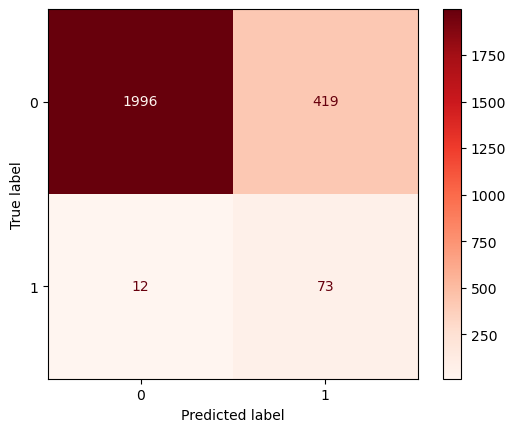

In [36]:
fig = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, test_pred))
fig.plot(cmap="Reds")
plt.show()